# Загрузка данных из Kaggle

In [ ]:
!pip -q install kaggle pyarrow

In [ ]:
from pathlib import Path
import os
import shutil
import subprocess
import pandas as pd
import numpy as np
from google.colab import userdata

In [ ]:
kaggle_username = userdata.get('KAGGLE_USERNAME')
kaggle_key = userdata.get('KAGGLE_KEY')

os.environ['KAGGLE_USERNAME'] = kaggle_username
os.environ['KAGGLE_KEY'] = kaggle_key

In [ ]:
project_dir = Path('/content/fnspid_timexer_project')
data_dir = project_dir / 'data'

price_top100_dir = data_dir / 'fnspid_price_first_top100_model_data'
sp500_finbert_dir = data_dir / 'fnspid_sp500_textrank_finbert_features'

price_top100_dataset_ref = 'paveleshmeev/fnspid-price-first-top100-model-data'
sp500_finbert_dataset_ref = 'paveleshmeev/fnspid-sp500-textrank-finbert-features'

price_top100_version = None
sp500_finbert_version = None

project_dir.mkdir(parents=True, exist_ok=True)
data_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
def download_kaggle_dataset(dataset_ref, target_dir, force=False, version=None):
    target_dir = Path(target_dir)
    target_dir.mkdir(parents=True, exist_ok=True)

    if any(target_dir.iterdir()) and not force:
        return target_dir

    if force:
        shutil.rmtree(target_dir)
        target_dir.mkdir(parents=True, exist_ok=True)

    command = [
        'kaggle',
        'datasets',
        'download',
        '-d',
        dataset_ref,
        '-p',
        str(target_dir),
        '--unzip'
    ]

    if version is not None:
        command.extend(['-v', str(version)])

    result = subprocess.run(command, capture_output=True, text=True)

    if result.returncode != 0:
        raise RuntimeError(result.stderr)

    for zip_path in target_dir.glob('*.zip'):
        zip_path.unlink()

    return target_dir

In [ ]:
price_top100_path = download_kaggle_dataset(
    dataset_ref=price_top100_dataset_ref,
    target_dir=price_top100_dir,
    force=False,
    version=price_top100_version
)

sp500_finbert_path = download_kaggle_dataset(
    dataset_ref=sp500_finbert_dataset_ref,
    target_dir=sp500_finbert_dir,
    force=False,
    version=sp500_finbert_version
)

In [ ]:
price_metadata_path = price_top100_path / 'metadata' / 'price_first_top100_selection_metadata.parquet'
selected_tickers_path = price_top100_path / 'metadata' / 'selected_price_first_top100_tickers.csv'
price_parquet_dir = price_top100_path / 'prices_parquet_by_symbol'
company_finbert_meta_dir = price_top100_path / 'finbert' / 'textrank_news_finbert_parts'
company_finbert_arrays_dir = price_top100_path / 'finbert' / 'textrank_news_finbert_arrays'

news_features_path = sp500_finbert_path / 'sp500_textrank_finbert_news_features.parquet'
news_mean_embeddings_path = sp500_finbert_path / 'sp500_textrank_finbert_mean_embeddings.parquet'
news_cls_embeddings_path = sp500_finbert_path / 'sp500_textrank_finbert_cls_embeddings.parquet'

sector_embeddings_dir = sp500_finbert_path / 'sector_top5_directional_embeddings'
sector_mean_embeddings_path = sector_embeddings_dir / 'sector_top5_directional_mean_embeddings.parquet'
sector_cls_embeddings_path = sector_embeddings_dir / 'sector_top5_directional_cls_embeddings.parquet'
sector_selected_news_path = sector_embeddings_dir / 'sector_top5_directional_selected_news.parquet'
sector_selection_stats_path = sector_embeddings_dir / 'sector_top5_directional_selection_stats.parquet'

data_paths = {
    'price_metadata': price_metadata_path,
    'selected_tickers': selected_tickers_path,
    'price_parquet_dir': price_parquet_dir,
    'company_finbert_meta_dir': company_finbert_meta_dir,
    'company_finbert_arrays_dir': company_finbert_arrays_dir,
    'news_features': news_features_path,
    'news_mean_embeddings': news_mean_embeddings_path,
    'news_cls_embeddings': news_cls_embeddings_path,
    'sector_mean_embeddings': sector_mean_embeddings_path,
    'sector_cls_embeddings': sector_cls_embeddings_path,
    'sector_selected_news': sector_selected_news_path,
    'sector_selection_stats': sector_selection_stats_path
}

In [ ]:
selected_df = pd.read_parquet(price_metadata_path)
selected_tickers = selected_df['ticker'].astype(str).tolist()
selected_ticker_set = set(selected_tickers)

available_price_paths = {
    path.stem: path
    for path in price_parquet_dir.glob('*.parquet')
}

price_paths_by_ticker = {
    ticker: available_price_paths[ticker]
    for ticker in selected_tickers
    if ticker in available_price_paths
}

missing_price_tickers = sorted(selected_ticker_set - set(price_paths_by_ticker))

print(missing_price_tickers)

[]


# Подготовка панелей данных перед проведением экспериментов

In [ ]:
model_start_date = pd.Timestamp('2009-01-01')
model_end_date = pd.Timestamp('2023-12-31')

prepared_dir = project_dir / 'prepared'
prepared_dir.mkdir(parents=True, exist_ok=True)

## Ценовая панель

In [ ]:
price_panel_path = prepared_dir / 'price_target_panel.parquet'

In [ ]:
def get_existing_column(df, candidates):
    for column in candidates:
        if column in df.columns:
            return column

    raise KeyError(f'Не найдена ни одна из колонок: {candidates}')

In [ ]:
def prepare_single_ticker_price_panel(ticker, price_path, selected_metadata, start_date, end_date):
    price_df = pd.read_parquet(price_path).copy()

    date_col = get_existing_column(price_df, ['date', 'trading_date'])
    close_col = get_existing_column(price_df, ['close'])
    adj_close_col = get_existing_column(price_df, ['adj_close', 'adj close'])

    price_df = price_df.rename(
        columns={
            date_col: 'trading_date',
            close_col: 'close',
            adj_close_col: 'adj_close'
        }
    )

    price_df['trading_date'] = pd.to_datetime(price_df['trading_date'], errors='coerce')
    price_df = price_df.loc[
        (price_df['trading_date'] >= start_date) &
        (price_df['trading_date'] <= end_date)
    ].copy()

    price_df = price_df.sort_values('trading_date').drop_duplicates('trading_date', keep='last')

    meta_row = selected_metadata.loc[selected_metadata['ticker'].astype(str) == str(ticker)].iloc[0]

    price_df['ticker'] = str(ticker)
    price_df['gics_sector'] = meta_row['gics_sector']
    price_df['security'] = meta_row['security'] if 'security' in selected_metadata.columns else np.nan
    price_df['gics_sub_industry'] = meta_row['gics_sub_industry'] if 'gics_sub_industry' in selected_metadata.columns else np.nan

    price_df['close'] = pd.to_numeric(price_df['close'], errors='coerce')
    price_df['adj_close'] = pd.to_numeric(price_df['adj_close'], errors='coerce')

    for column in ['open', 'high', 'low', 'volume']:
        if column in price_df.columns:
            price_df[column] = pd.to_numeric(price_df[column], errors='coerce')

    price_df = price_df.loc[
        price_df['close'].notna() &
        price_df['adj_close'].notna() &
        (price_df['close'] > 0) &
        (price_df['adj_close'] > 0)
    ].copy()

    price_df['log_close'] = np.log(price_df['close'])
    price_df['log_adj_close'] = np.log(price_df['adj_close'])

    price_df['log_return_1d_close'] = price_df['log_close'] - price_df['log_close'].shift(1)
    price_df['log_return_1d_adj_close'] = price_df['log_adj_close'] - price_df['log_adj_close'].shift(1)

    price_df['target_next_1d_log_return_close'] = price_df['log_close'].shift(-1) - price_df['log_close']
    price_df['target_next_1d_log_return_adj_close'] = price_df['log_adj_close'].shift(-1) - price_df['log_adj_close']

    price_df['future_log_return_1d_from_t_plus_1_close'] = price_df['log_close'].shift(-2) - price_df['log_close'].shift(-1)
    price_df['future_log_return_1d_from_t_plus_1_adj_close'] = price_df['log_adj_close'].shift(-2) - price_df['log_adj_close'].shift(-1)

    keep_columns = [
        'ticker',
        'trading_date',
        'gics_sector',
        'security',
        'gics_sub_industry',
        'open',
        'high',
        'low',
        'close',
        'adj_close',
        'volume',
        'log_close',
        'log_adj_close',
        'log_return_1d_close',
        'log_return_1d_adj_close',
        'target_next_1d_log_return_close',
        'target_next_1d_log_return_adj_close',
        'future_log_return_1d_from_t_plus_1_close',
        'future_log_return_1d_from_t_plus_1_adj_close'
    ]

    keep_columns = [column for column in keep_columns if column in price_df.columns]

    return price_df[keep_columns]

In [ ]:
price_panel_parts = [
    prepare_single_ticker_price_panel(
        ticker=ticker,
        price_path=price_paths_by_ticker[ticker],
        selected_metadata=selected_df,
        start_date=model_start_date,
        end_date=model_end_date
    )
    for ticker in selected_tickers
]

price_target_panel = pd.concat(price_panel_parts, ignore_index=True)

price_target_panel = price_target_panel.sort_values(
    ['trading_date', 'ticker']
).reset_index(drop=True)

price_target_panel['date_id'] = price_target_panel['trading_date'].rank(
    method='dense'
).astype(int) - 1

ticker_id_map = {
    ticker: idx
    for idx, ticker in enumerate(selected_tickers)
}

price_target_panel['ticker_id'] = price_target_panel['ticker'].map(ticker_id_map).astype(int)

In [ ]:
price_target_panel = price_target_panel.loc[
    price_target_panel['log_return_1d_close'].notna() &
    price_target_panel['target_next_1d_log_return_close'].notna()
].copy()

price_target_panel.to_parquet(price_panel_path, index=False)

In [ ]:
df_price = pd.read_parquet('/content/fnspid_timexer_project/prepared/price_target_panel.parquet')

df_price.head()

,ticker,trading_date,gics_sector,security,gics_sub_industry,open,high,low,close,adj_close,...,log_close,log_adj_close,log_return_1d_close,log_return_1d_adj_close,target_next_1d_log_return_close,target_next_1d_log_return_adj_close,future_log_return_1d_from_t_plus_1_close,future_log_return_1d_from_t_plus_1_adj_close,date_id,ticker_id
0,ABT,2009-01-05,Health Care,Abbott Laboratories,Health Care Equipment,25.525360,25.659704,24.983187,25.256672,16.436152,...,3.229090,2.799483,-0.017326,-0.017326,-0.033221,-0.033221,-0.005514,-0.005514,1,29
1,ACN,2009-01-05,Information Technology,Accenture,IT Consulting & Other Services,33.450001,34.169998,32.740002,33.820000,26.710962,...,3.521052,3.285074,0.004445,0.004445,-0.012496,-0.012496,0.011313,0.011313,1,50
2,ADBE,2009-01-05,Information Technology,Adobe Inc.,Application Software,22.520000,23.309999,22.500000,23.129999,23.129999,...,3.141130,3.141130,0.004767,0.004767,0.046048,0.046048,0.000413,0.000413,1,32
3,ADM,2009-01-05,Consumer Staples,Archer Daniels Midland,Agricultural Products & Services,28.920000,29.500000,28.610001,29.080000,21.829674,...,3.370051,3.083270,-0.003776,-0.003776,-0.027542,-0.027542,0.001766,0.001766,1,89
4,AIG,2009-01-05,Financials,American International Group,Multi-line Insurance,34.000000,35.000000,33.200001,33.200001,24.085476,...,3.502550,3.181609,-0.017911,-0.017911,0.047067,0.047067,-0.059189,-0.059189,1,33


## Панели с текстовыми признаками относительно компаний

In [ ]:
import pyarrow.parquet as pq

company_text_dir = prepared_dir / 'company_text'
company_text_dir.mkdir(parents=True, exist_ok=True)

company_daily_sentiment_panel_path = company_text_dir / 'company_daily_sentiment_panel.parquet'
company_daily_mean_embeddings_panel_path = company_text_dir / 'company_daily_mean_embeddings_768.parquet'
company_daily_cls_embeddings_panel_path = company_text_dir / 'company_daily_cls_embeddings_768.parquet'

company_finbert_meta_paths = sorted(company_finbert_meta_dir.glob('*.parquet'))

company_meta_columns = [
    'ticker',
    'news_date',
    'finbert_sentiment_label',
    'finbert_positive_prob',
    'finbert_negative_prob',
    'finbert_neutral_prob',
    'finbert_sentiment_score_pos_minus_neg',
    'finbert_cls_npy_path',
    'finbert_mean_npy_path',
    'embedding_row_id'
]

In [ ]:
def read_parquet_existing_columns(path, columns):
    schema_columns = pq.read_schema(path).names
    existing_columns = [column for column in columns if column in schema_columns]
    return pd.read_parquet(path, columns=existing_columns)


def resolve_dataset_path(path_value, dataset_root):
    path = Path(str(path_value))

    if path.is_absolute():
        return path

    return dataset_root / path


def build_trading_calendar_from_price_panel(price_panel):
    trading_dates = (
        price_panel['trading_date']
        .dropna()
        .drop_duplicates()
        .sort_values()
        .reset_index(drop=True)
    )

    return pd.DataFrame({'trading_date': trading_dates})


def assign_previous_trading_date(news_df, trading_calendar):
    news_df = news_df.copy()
    news_df['news_calendar_date'] = pd.to_datetime(news_df['news_date'], errors='coerce').dt.normalize()
    news_df = news_df.loc[news_df['news_calendar_date'].notna()].copy()

    unique_news_dates = (
        news_df[['news_calendar_date']]
        .drop_duplicates()
        .sort_values('news_calendar_date')
        .reset_index(drop=True)
    )

    calendar_df = (
        trading_calendar[['trading_date']]
        .drop_duplicates()
        .sort_values('trading_date')
        .reset_index(drop=True)
    )

    mapped_dates = pd.merge_asof(
        unique_news_dates,
        calendar_df,
        left_on='news_calendar_date',
        right_on='trading_date',
        direction='backward'
    )

    news_df = news_df.merge(mapped_dates, on='news_calendar_date', how='left')
    news_df = news_df.loc[news_df['trading_date'].notna()].copy()

    return news_df

In [ ]:
def aggregate_company_sentiment_part(meta_df):
    df = meta_df.copy()

    df['ticker'] = df['ticker'].astype(str)
    df['finbert_positive_prob'] = pd.to_numeric(df['finbert_positive_prob'], errors='coerce')
    df['finbert_negative_prob'] = pd.to_numeric(df['finbert_negative_prob'], errors='coerce')
    df['finbert_neutral_prob'] = pd.to_numeric(df['finbert_neutral_prob'], errors='coerce')

    if 'finbert_sentiment_score_pos_minus_neg' in df.columns:
        df['sentiment_score'] = pd.to_numeric(df['finbert_sentiment_score_pos_minus_neg'], errors='coerce')
    else:
        df['sentiment_score'] = df['finbert_positive_prob'] - df['finbert_negative_prob']

    df['sentiment_abs_score'] = df['sentiment_score'].abs()
    df['finbert_confidence'] = df[
        ['finbert_positive_prob', 'finbert_negative_prob', 'finbert_neutral_prob']
    ].max(axis=1)

    label = df['finbert_sentiment_label'].astype(str).str.lower()

    df['is_positive'] = (label == 'positive').astype(np.int32)
    df['is_negative'] = (label == 'negative').astype(np.int32)
    df['is_neutral'] = (label == 'neutral').astype(np.int32)

    grouped = (
        df.groupby(['ticker', 'trading_date'], as_index=False)
        .agg(
            company_news_count=('ticker', 'size'),
            company_positive_prob_sum=('finbert_positive_prob', 'sum'),
            company_negative_prob_sum=('finbert_negative_prob', 'sum'),
            company_neutral_prob_sum=('finbert_neutral_prob', 'sum'),
            company_sentiment_score_sum=('sentiment_score', 'sum'),
            company_abs_sentiment_score_sum=('sentiment_abs_score', 'sum'),
            company_confidence_sum=('finbert_confidence', 'sum'),
            company_max_confidence=('finbert_confidence', 'max'),
            company_positive_news_count=('is_positive', 'sum'),
            company_negative_news_count=('is_negative', 'sum'),
            company_neutral_news_count=('is_neutral', 'sum')
        )
    )

    return grouped

In [ ]:
def aggregate_company_embedding_part(meta_df, path_column, prefix, dataset_root):
    pieces = []

    for path_value, sub_meta in meta_df.groupby(path_column, dropna=True):
        embedding_path = resolve_dataset_path(path_value, dataset_root)
        embedding_array = np.load(embedding_path, mmap_mode='r')

        rows = sub_meta['embedding_row_id'].astype(np.int64).to_numpy()
        embeddings = np.asarray(embedding_array[rows], dtype=np.float32)

        key_index = pd.MultiIndex.from_frame(
            sub_meta[['ticker', 'trading_date']].reset_index(drop=True)
        )

        codes, unique_keys = pd.factorize(key_index)

        n_groups = len(unique_keys)
        embedding_dim = embeddings.shape[1]

        embedding_sums = np.zeros((n_groups, embedding_dim), dtype=np.float32)
        embedding_counts = np.bincount(codes, minlength=n_groups).astype(np.int32)

        np.add.at(embedding_sums, codes, embeddings)

        key_df = unique_keys.to_frame(index=False)
        key_df.columns = ['ticker', 'trading_date']

        embedding_columns = [f'{prefix}_emb_{idx}' for idx in range(embedding_dim)]
        embedding_df = pd.DataFrame(embedding_sums, columns=embedding_columns)

        part_df = pd.concat(
            [key_df.reset_index(drop=True), embedding_df],
            axis=1
        )

        part_df[f'{prefix}_embedding_news_count'] = embedding_counts

        pieces.append(part_df)

    if not pieces:
        return pd.DataFrame(columns=['ticker', 'trading_date', f'{prefix}_embedding_news_count'])

    return pd.concat(pieces, ignore_index=True)

In [ ]:
def finalize_company_sentiment_panel(sentiment_parts):
    sentiment_panel = pd.concat(sentiment_parts, ignore_index=True)

    sentiment_panel = (
        sentiment_panel
        .groupby(['ticker', 'trading_date'], as_index=False)
        .agg(
            company_news_count=('company_news_count', 'sum'),
            company_positive_prob_sum=('company_positive_prob_sum', 'sum'),
            company_negative_prob_sum=('company_negative_prob_sum', 'sum'),
            company_neutral_prob_sum=('company_neutral_prob_sum', 'sum'),
            company_sentiment_score_sum=('company_sentiment_score_sum', 'sum'),
            company_abs_sentiment_score_sum=('company_abs_sentiment_score_sum', 'sum'),
            company_confidence_sum=('company_confidence_sum', 'sum'),
            company_max_confidence=('company_max_confidence', 'max'),
            company_positive_news_count=('company_positive_news_count', 'sum'),
            company_negative_news_count=('company_negative_news_count', 'sum'),
            company_neutral_news_count=('company_neutral_news_count', 'sum')
        )
    )

    count = sentiment_panel['company_news_count'].replace(0, np.nan)

    sentiment_panel['company_has_news'] = (sentiment_panel['company_news_count'] > 0).astype(np.int8)
    sentiment_panel['company_mean_positive_prob'] = sentiment_panel['company_positive_prob_sum'] / count
    sentiment_panel['company_mean_negative_prob'] = sentiment_panel['company_negative_prob_sum'] / count
    sentiment_panel['company_mean_neutral_prob'] = sentiment_panel['company_neutral_prob_sum'] / count
    sentiment_panel['company_mean_sentiment_score'] = sentiment_panel['company_sentiment_score_sum'] / count
    sentiment_panel['company_mean_abs_sentiment_score'] = sentiment_panel['company_abs_sentiment_score_sum'] / count
    sentiment_panel['company_mean_confidence'] = sentiment_panel['company_confidence_sum'] / count

    sentiment_panel['company_positive_share'] = sentiment_panel['company_positive_news_count'] / count
    sentiment_panel['company_negative_share'] = sentiment_panel['company_negative_news_count'] / count
    sentiment_panel['company_neutral_share'] = sentiment_panel['company_neutral_news_count'] / count

    drop_columns = [
        'company_positive_prob_sum',
        'company_negative_prob_sum',
        'company_neutral_prob_sum',
        'company_sentiment_score_sum',
        'company_abs_sentiment_score_sum',
        'company_confidence_sum'
    ]

    sentiment_panel = sentiment_panel.drop(columns=drop_columns)

    sentiment_panel = sentiment_panel.sort_values(
        ['trading_date', 'ticker']
    ).reset_index(drop=True)

    return sentiment_panel

In [ ]:
def finalize_company_sentiment_panel(sentiment_parts):
    sentiment_panel = pd.concat(sentiment_parts, ignore_index=True)

    sentiment_panel = (
        sentiment_panel
        .groupby(['ticker', 'trading_date'], as_index=False)
        .agg(
            company_news_count=('company_news_count', 'sum'),
            company_positive_prob_sum=('company_positive_prob_sum', 'sum'),
            company_negative_prob_sum=('company_negative_prob_sum', 'sum'),
            company_neutral_prob_sum=('company_neutral_prob_sum', 'sum'),
            company_sentiment_score_sum=('company_sentiment_score_sum', 'sum'),
            company_abs_sentiment_score_sum=('company_abs_sentiment_score_sum', 'sum'),
            company_confidence_sum=('company_confidence_sum', 'sum'),
            company_max_confidence=('company_max_confidence', 'max'),
            company_positive_news_count=('company_positive_news_count', 'sum'),
            company_negative_news_count=('company_negative_news_count', 'sum'),
            company_neutral_news_count=('company_neutral_news_count', 'sum')
        )
    )

    count = sentiment_panel['company_news_count'].replace(0, np.nan)

    sentiment_panel['company_has_news'] = (sentiment_panel['company_news_count'] > 0).astype(np.int8)
    sentiment_panel['company_mean_positive_prob'] = sentiment_panel['company_positive_prob_sum'] / count
    sentiment_panel['company_mean_negative_prob'] = sentiment_panel['company_negative_prob_sum'] / count
    sentiment_panel['company_mean_neutral_prob'] = sentiment_panel['company_neutral_prob_sum'] / count
    sentiment_panel['company_mean_sentiment_score'] = sentiment_panel['company_sentiment_score_sum'] / count
    sentiment_panel['company_mean_abs_sentiment_score'] = sentiment_panel['company_abs_sentiment_score_sum'] / count
    sentiment_panel['company_mean_confidence'] = sentiment_panel['company_confidence_sum'] / count

    sentiment_panel['company_positive_share'] = sentiment_panel['company_positive_news_count'] / count
    sentiment_panel['company_negative_share'] = sentiment_panel['company_negative_news_count'] / count
    sentiment_panel['company_neutral_share'] = sentiment_panel['company_neutral_news_count'] / count

    drop_columns = [
        'company_positive_prob_sum',
        'company_negative_prob_sum',
        'company_neutral_prob_sum',
        'company_sentiment_score_sum',
        'company_abs_sentiment_score_sum',
        'company_confidence_sum'
    ]

    sentiment_panel = sentiment_panel.drop(columns=drop_columns)

    sentiment_panel = sentiment_panel.sort_values(
        ['trading_date', 'ticker']
    ).reset_index(drop=True)

    return sentiment_panel

In [ ]:
def finalize_company_embedding_panel(embedding_parts, prefix):
    embedding_panel = pd.concat(embedding_parts, ignore_index=True)

    count_column = f'{prefix}_embedding_news_count'
    embedding_columns = [
        column
        for column in embedding_panel.columns
        if column.startswith(f'{prefix}_emb_')
    ]

    agg_dict = {column: 'sum' for column in embedding_columns}
    agg_dict[count_column] = 'sum'

    embedding_panel = (
        embedding_panel
        .groupby(['ticker', 'trading_date'], as_index=False)
        .agg(agg_dict)
    )

    counts = embedding_panel[count_column].replace(0, np.nan).to_numpy()

    embedding_panel[embedding_columns] = (
        embedding_panel[embedding_columns]
        .div(counts, axis=0)
        .astype(np.float32)
    )

    embedding_panel = embedding_panel.sort_values(
        ['trading_date', 'ticker']
    ).reset_index(drop=True)

    return embedding_panel

In [ ]:
def build_company_text_panels(meta_paths, trading_calendar, dataset_root):
    sentiment_parts = []
    mean_embedding_parts = []
    cls_embedding_parts = []

    for meta_path in meta_paths:
        meta_df = read_parquet_existing_columns(meta_path, company_meta_columns)

        if meta_df.empty:
            continue

        meta_df = meta_df.loc[
            meta_df['ticker'].astype(str).isin(selected_ticker_set)
        ].copy()

        if meta_df.empty:
            continue

        meta_df = assign_previous_trading_date(meta_df, trading_calendar)

        if meta_df.empty:
            continue

        sentiment_parts.append(
            aggregate_company_sentiment_part(meta_df)
        )

        mean_embedding_parts.append(
            aggregate_company_embedding_part(
                meta_df=meta_df,
                path_column='finbert_mean_npy_path',
                prefix='company_mean',
                dataset_root=dataset_root
            )
        )

        cls_embedding_parts.append(
            aggregate_company_embedding_part(
                meta_df=meta_df,
                path_column='finbert_cls_npy_path',
                prefix='company_cls',
                dataset_root=dataset_root
            )
        )

    company_sentiment_panel = finalize_company_sentiment_panel(sentiment_parts)
    company_mean_embedding_panel = finalize_company_embedding_panel(
        mean_embedding_parts,
        prefix='company_mean'
    )
    company_cls_embedding_panel = finalize_company_embedding_panel(
        cls_embedding_parts,
        prefix='company_cls'
    )

    return company_sentiment_panel, company_mean_embedding_panel, company_cls_embedding_panel

In [ ]:
trading_calendar = build_trading_calendar_from_price_panel(price_target_panel)

company_sentiment_panel, company_mean_embedding_panel, company_cls_embedding_panel = build_company_text_panels(
    meta_paths=company_finbert_meta_paths,
    trading_calendar=trading_calendar,
    dataset_root=price_top100_path
)

company_sentiment_panel.to_parquet(company_daily_sentiment_panel_path, index=False)
company_mean_embedding_panel.to_parquet(company_daily_mean_embeddings_panel_path, index=False)
company_cls_embedding_panel.to_parquet(company_daily_cls_embeddings_panel_path, index=False)

In [ ]:
df_comp_sent = pd.read_parquet('/content/fnspid_timexer_project/prepared/company_text/company_daily_sentiment_panel.parquet')

df_comp_sent.head()

,ticker,trading_date,company_news_count,company_max_confidence,company_positive_news_count,company_negative_news_count,company_neutral_news_count,company_has_news,company_mean_positive_prob,company_mean_negative_prob,company_mean_neutral_prob,company_mean_sentiment_score,company_mean_abs_sentiment_score,company_mean_confidence,company_positive_share,company_negative_share,company_neutral_share
0,EXC,2009-07-07,1,0.919348,0,0,1,1,0.039935,0.040717,0.919348,-0.000781,0.000781,0.919348,0.0,0.0,1.0
1,DHR,2009-07-22,1,0.939199,0,0,1,1,0.045504,0.015297,0.939199,0.030206,0.030206,0.939199,0.0,0.0,1.0
2,VLO,2009-10-09,1,0.413250,1,0,0,1,0.413250,0.197111,0.389639,0.216139,0.216139,0.413250,1.0,0.0,0.0
3,CLX,2009-10-14,1,0.940115,1,0,0,1,0.940115,0.020203,0.039682,0.919912,0.919912,0.940115,1.0,0.0,0.0
4,GILD,2009-10-14,1,0.927145,1,0,0,1,0.927145,0.023274,0.049581,0.903870,0.903870,0.927145,1.0,0.0,0.0


In [ ]:
mean_emb_comp = pd.read_parquet('/content/fnspid_timexer_project/prepared/company_text/company_daily_mean_embeddings_768.parquet')

mean_emb_comp.head()

,ticker,trading_date,company_mean_emb_0,company_mean_emb_1,company_mean_emb_2,company_mean_emb_3,company_mean_emb_4,company_mean_emb_5,company_mean_emb_6,company_mean_emb_7,...,company_mean_emb_759,company_mean_emb_760,company_mean_emb_761,company_mean_emb_762,company_mean_emb_763,company_mean_emb_764,company_mean_emb_765,company_mean_emb_766,company_mean_emb_767,company_mean_embedding_news_count
0,EXC,2009-07-07,0.084715,0.328051,0.137549,0.010134,0.182610,-0.486079,-0.227547,0.528352,...,0.299431,-0.340797,-0.453268,-0.501794,-0.121722,0.035397,-0.272088,-0.111175,0.243967,1
1,DHR,2009-07-22,0.039747,0.414135,0.025486,-0.011524,0.279656,-0.442991,-0.217299,0.236983,...,0.326883,-0.145824,-0.423245,-0.194692,-0.066861,0.130399,-0.235707,-0.126681,0.351792,1
2,VLO,2009-10-09,-0.128364,0.482186,0.099828,-0.050030,0.331238,0.053478,-0.062593,0.435520,...,0.499962,0.111009,-0.504815,-0.106843,-0.386939,0.243351,-0.177121,0.290475,0.107450,1
3,CLX,2009-10-14,-0.212442,0.223321,0.128295,0.053324,0.141162,0.082168,0.017626,0.293736,...,0.493706,0.219016,-0.314047,0.137131,-0.104786,-0.055558,-0.210102,0.061292,0.016254,1
4,GILD,2009-10-14,-0.256927,0.281101,0.108005,-0.014179,0.160657,0.019402,-0.018164,0.272274,...,0.540841,0.257852,-0.349326,0.168633,-0.038781,0.014127,-0.184559,0.068527,0.097411,1


## Панели с текстовыми признаками относительно сектора

In [ ]:
sector_text_dir = prepared_dir / 'sector_text'
sector_text_dir.mkdir(parents=True, exist_ok=True)

sector_daily_sentiment_panel_path = sector_text_dir / 'sector_daily_sentiment_panel.parquet'
sector_daily_mean_embeddings_panel_path = sector_text_dir / 'sector_daily_mean_embeddings_768.parquet'
sector_daily_cls_embeddings_panel_path = sector_text_dir / 'sector_daily_cls_embeddings_768.parquet'

In [ ]:
def normalize_sector_trading_date(df):
    df = df.copy()
    df['trading_date'] = pd.to_datetime(df['trading_date'], errors='coerce')
    df = df.loc[df['trading_date'].notna()].copy()
    return df


def get_embedding_columns(df, prefix):
    return [
        column
        for column in df.columns
        if column.startswith(prefix)
    ]


def prepare_sector_embedding_panel(df, embedding_prefix, output_prefix):
    df = normalize_sector_trading_date(df)

    embedding_columns = get_embedding_columns(df, embedding_prefix)

    key_columns = [
        'gics_sector',
        'trading_date'
    ]

    stat_columns = [
        'has_selected_news',
        'n_selected_news',
        'n_selected_non_neutral_news',
        'n_selected_fallback_news',
        'mean_selected_finbert_confidence',
        'mean_selected_directional_confidence',
        'selected_news_ids'
    ]

    existing_stat_columns = [
        column
        for column in stat_columns
        if column in df.columns
    ]

    keep_columns = key_columns + existing_stat_columns + embedding_columns
    df = df[keep_columns].copy()

    rename_dict = {
        column: f'sector_{column}'
        for column in existing_stat_columns
    }

    rename_dict.update({
        column: column.replace(embedding_prefix, output_prefix, 1)
        for column in embedding_columns
    })

    df = df.rename(columns=rename_dict)

    for column in df.columns:
        if column.startswith(output_prefix):
            df[column] = pd.to_numeric(df[column], errors='coerce').astype(np.float32)

    df = df.sort_values(['trading_date', 'gics_sector']).reset_index(drop=True)

    return df

In [ ]:
def build_sector_sentiment_panel(sector_selected_news_path, sector_selection_stats_path):
    selected_news_df = pd.read_parquet(sector_selected_news_path)
    selection_stats_df = pd.read_parquet(sector_selection_stats_path)

    selected_news_df = normalize_sector_trading_date(selected_news_df)
    selection_stats_df = normalize_sector_trading_date(selection_stats_df)

    selected_news_df['finbert_positive_prob'] = pd.to_numeric(
        selected_news_df['finbert_positive_prob'],
        errors='coerce'
    )

    selected_news_df['finbert_negative_prob'] = pd.to_numeric(
        selected_news_df['finbert_negative_prob'],
        errors='coerce'
    )

    selected_news_df['finbert_neutral_prob'] = pd.to_numeric(
        selected_news_df['finbert_neutral_prob'],
        errors='coerce'
    )

    selected_news_df['sector_sentiment_score'] = (
        selected_news_df['finbert_positive_prob'] -
        selected_news_df['finbert_negative_prob']
    )

    selected_news_df['sector_abs_sentiment_score'] = selected_news_df[
        'sector_sentiment_score'
    ].abs()

    selected_news_df['sector_finbert_confidence'] = selected_news_df[
        ['finbert_positive_prob', 'finbert_negative_prob', 'finbert_neutral_prob']
    ].max(axis=1)

    if 'directional_confidence' in selected_news_df.columns:
        selected_news_df['directional_confidence'] = pd.to_numeric(
            selected_news_df['directional_confidence'],
            errors='coerce'
        )
    else:
        selected_news_df['directional_confidence'] = selected_news_df[
            ['finbert_positive_prob', 'finbert_negative_prob']
        ].max(axis=1)

    label = selected_news_df['finbert_label'].astype(str).str.lower()

    selected_news_df['sector_is_positive'] = (label == 'positive').astype(np.int32)
    selected_news_df['sector_is_negative'] = (label == 'negative').astype(np.int32)
    selected_news_df['sector_is_neutral'] = (label == 'neutral').astype(np.int32)

    sentiment_agg = (
        selected_news_df
        .groupby(['gics_sector', 'trading_date'], as_index=False)
        .agg(
            sector_selected_news_count=('news_id', 'size'),
            sector_mean_positive_prob=('finbert_positive_prob', 'mean'),
            sector_mean_negative_prob=('finbert_negative_prob', 'mean'),
            sector_mean_neutral_prob=('finbert_neutral_prob', 'mean'),
            sector_mean_sentiment_score=('sector_sentiment_score', 'mean'),
            sector_mean_abs_sentiment_score=('sector_abs_sentiment_score', 'mean'),
            sector_mean_finbert_confidence=('sector_finbert_confidence', 'mean'),
            sector_max_finbert_confidence=('sector_finbert_confidence', 'max'),
            sector_mean_directional_confidence=('directional_confidence', 'mean'),
            sector_positive_news_count=('sector_is_positive', 'sum'),
            sector_negative_news_count=('sector_is_negative', 'sum'),
            sector_neutral_news_count=('sector_is_neutral', 'sum')
        )
    )

    count = sentiment_agg['sector_selected_news_count'].replace(0, np.nan)

    sentiment_agg['sector_positive_share'] = (
        sentiment_agg['sector_positive_news_count'] / count
    )

    sentiment_agg['sector_negative_share'] = (
        sentiment_agg['sector_negative_news_count'] / count
    )

    sentiment_agg['sector_neutral_share'] = (
        sentiment_agg['sector_neutral_news_count'] / count
    )

    stats_columns = [
        'gics_sector',
        'trading_date',
        'has_selected_news',
        'n_selected_news',
        'n_selected_non_neutral_news',
        'n_selected_fallback_news',
        'mean_selected_finbert_confidence',
        'mean_selected_directional_confidence',
        'selected_news_ids'
    ]

    stats_columns = [
        column
        for column in stats_columns
        if column in selection_stats_df.columns
    ]

    selection_stats_df = selection_stats_df[stats_columns].copy()

    rename_dict = {
        'has_selected_news': 'sector_has_selected_news',
        'n_selected_news': 'sector_n_selected_news',
        'n_selected_non_neutral_news': 'sector_n_selected_non_neutral_news',
        'n_selected_fallback_news': 'sector_n_selected_fallback_news',
        'mean_selected_finbert_confidence': 'sector_mean_selected_finbert_confidence',
        'mean_selected_directional_confidence': 'sector_mean_selected_directional_confidence',
        'selected_news_ids': 'sector_selected_news_ids'
    }

    selection_stats_df = selection_stats_df.rename(columns=rename_dict)

    sector_sentiment_panel = selection_stats_df.merge(
        sentiment_agg,
        on=['gics_sector', 'trading_date'],
        how='left'
    )

    sector_sentiment_panel = sector_sentiment_panel.sort_values(
        ['trading_date', 'gics_sector']
    ).reset_index(drop=True)

    return sector_sentiment_panel

In [ ]:
sector_mean_raw_df = pd.read_parquet(sector_mean_embeddings_path)
sector_cls_raw_df = pd.read_parquet(sector_cls_embeddings_path)

sector_mean_embedding_panel = prepare_sector_embedding_panel(
    df=sector_mean_raw_df,
    embedding_prefix='mean_emb_',
    output_prefix='sector_mean_emb_'
)

sector_cls_embedding_panel = prepare_sector_embedding_panel(
    df=sector_cls_raw_df,
    embedding_prefix='cls_emb_',
    output_prefix='sector_cls_emb_'
)

In [ ]:
sector_sentiment_panel = build_sector_sentiment_panel(
    sector_selected_news_path=sector_selected_news_path,
    sector_selection_stats_path=sector_selection_stats_path
)

In [ ]:
sector_sentiment_panel.to_parquet(sector_daily_sentiment_panel_path, index=False)
sector_mean_embedding_panel.to_parquet(sector_daily_mean_embeddings_panel_path, index=False)
sector_cls_embedding_panel.to_parquet(sector_daily_cls_embeddings_panel_path, index=False)

In [ ]:
df_sec_sent = pd.read_parquet('/content/fnspid_timexer_project/prepared/sector_text/sector_daily_sentiment_panel.parquet')

df_sec_sent.head(11)

,gics_sector,trading_date,sector_has_selected_news,sector_n_selected_news,sector_n_selected_non_neutral_news,sector_n_selected_fallback_news,sector_mean_selected_finbert_confidence,sector_mean_selected_directional_confidence,sector_selected_news_ids,sector_selected_news_count,...,sector_mean_abs_sentiment_score,sector_mean_finbert_confidence,sector_max_finbert_confidence,sector_mean_directional_confidence,sector_positive_news_count,sector_negative_news_count,sector_neutral_news_count,sector_positive_share,sector_negative_share,sector_neutral_share
0,Communication Services,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Consumer Discretionary,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Consumer Staples,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Energy,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Financials,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Health Care,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Industrials,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Information Technology,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Materials,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Real Estate,2009-07-07,False,0,0,0,0.000000,0.000000,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
mean_emb_sent = pd.read_parquet('/content/fnspid_timexer_project/prepared/sector_text/sector_daily_mean_embeddings_768.parquet')

mean_emb_comp.head()

,ticker,trading_date,company_mean_emb_0,company_mean_emb_1,company_mean_emb_2,company_mean_emb_3,company_mean_emb_4,company_mean_emb_5,company_mean_emb_6,company_mean_emb_7,...,company_mean_emb_759,company_mean_emb_760,company_mean_emb_761,company_mean_emb_762,company_mean_emb_763,company_mean_emb_764,company_mean_emb_765,company_mean_emb_766,company_mean_emb_767,company_mean_embedding_news_count
0,EXC,2009-07-07,0.084715,0.328051,0.137549,0.010134,0.182610,-0.486079,-0.227547,0.528352,...,0.299431,-0.340797,-0.453268,-0.501794,-0.121722,0.035397,-0.272088,-0.111175,0.243967,1
1,DHR,2009-07-22,0.039747,0.414135,0.025486,-0.011524,0.279656,-0.442991,-0.217299,0.236983,...,0.326883,-0.145824,-0.423245,-0.194692,-0.066861,0.130399,-0.235707,-0.126681,0.351792,1
2,VLO,2009-10-09,-0.128364,0.482186,0.099828,-0.050030,0.331238,0.053478,-0.062593,0.435520,...,0.499962,0.111009,-0.504815,-0.106843,-0.386939,0.243351,-0.177121,0.290475,0.107450,1
3,CLX,2009-10-14,-0.212442,0.223321,0.128295,0.053324,0.141162,0.082168,0.017626,0.293736,...,0.493706,0.219016,-0.314047,0.137131,-0.104786,-0.055558,-0.210102,0.061292,0.016254,1
4,GILD,2009-10-14,-0.256927,0.281101,0.108005,-0.014179,0.160657,0.019402,-0.018164,0.272274,...,0.540841,0.257852,-0.349326,0.168633,-0.038781,0.014127,-0.184559,0.068527,0.097411,1


## Создание train / valid / test периодов

In [ ]:
split_dates_path = prepared_dir / 'split_dates.parquet'
split_summary_path = prepared_dir / 'split_summary.csv'

train_share = 0.8
validation_share = 0.1
test_share = 0.1

In [ ]:
def build_chronological_split_dates(price_panel, train_share=0.8, validation_share=0.1):
    trading_dates = (
        price_panel['trading_date']
        .dropna()
        .drop_duplicates()
        .sort_values()
        .reset_index(drop=True)
    )

    n_dates = len(trading_dates)
    n_train = int(np.floor(n_dates * train_share))
    n_validation = int(np.floor(n_dates * validation_share))
    n_test = n_dates - n_train - n_validation

    if n_train <= 0 or n_validation <= 0 or n_test <= 0:
        raise ValueError('После разбиения одна из частей оказалась пустой.')

    split_dates = pd.DataFrame({
        'trading_date': trading_dates,
        'date_id': np.arange(n_dates, dtype=np.int32)
    })

    split_dates['split'] = 'test'
    split_dates.loc[:n_train - 1, 'split'] = 'train'
    split_dates.loc[n_train:n_train + n_validation - 1, 'split'] = 'validation'

    split_dates['is_train'] = (split_dates['split'] == 'train').astype(np.int8)
    split_dates['is_validation'] = (split_dates['split'] == 'validation').astype(np.int8)
    split_dates['is_test'] = (split_dates['split'] == 'test').astype(np.int8)

    return split_dates

In [ ]:
split_dates = build_chronological_split_dates(
    price_panel=price_target_panel,
    train_share=train_share,
    validation_share=validation_share
)

split_dates.to_parquet(split_dates_path, index=False)

In [ ]:
split_summary = (
    split_dates
    .groupby('split', as_index=False)
    .agg(
        start_date=('trading_date', 'min'),
        end_date=('trading_date', 'max'),
        n_dates=('trading_date', 'size'),
        first_date_id=('date_id', 'min'),
        last_date_id=('date_id', 'max')
    )
)

split_order = pd.DataFrame({
    'split': ['train', 'validation', 'test'],
    'split_order': [0, 1, 2]
})

split_summary = (
    split_summary
    .merge(split_order, on='split', how='left')
    .sort_values('split_order')
    .drop(columns='split_order')
    .reset_index(drop=True)
)

split_summary['date_share'] = split_summary['n_dates'] / split_summary['n_dates'].sum()

split_summary.to_csv(split_summary_path, index=False)

split_summary

,split,start_date,end_date,n_dates,first_date_id,last_date_id,date_share
0,train,2009-01-05,2020-12-24,3016,0,3015,0.799788
1,validation,2020-12-28,2022-06-27,377,3016,3392,0.099973
2,test,2022-06-28,2023-12-27,378,3393,3770,0.100239


In [ ]:
df_dates_split = pd.read_parquet('/content/fnspid_timexer_project/prepared/split_dates.parquet')

df_dates_split.head()

,trading_date,date_id,split,is_train,is_validation,is_test
0,2009-01-05,0,train,1,0,0
1,2009-01-06,1,train,1,0,0
2,2009-01-07,2,train,1,0,0
3,2009-01-08,3,train,1,0,0
4,2009-01-09,4,train,1,0,0


## Применение scaler/PCA преобразований для эмбеддинговых признаков

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import joblib

pca_n_components = 32
pca_random_state = 2026

reduced_features_dir = prepared_dir / 'reduced_features'
reduction_models_dir = reduced_features_dir / 'models'

reduced_features_dir.mkdir(parents=True, exist_ok=True)
reduction_models_dir.mkdir(parents=True, exist_ok=True)

company_mean_pca_panel_path = reduced_features_dir / f'company_mean_pca_{pca_n_components}.parquet'
company_cls_pca_panel_path = reduced_features_dir / f'company_cls_pca_{pca_n_components}.parquet'
sector_mean_pca_panel_path = reduced_features_dir / f'sector_mean_pca_{pca_n_components}.parquet'
sector_cls_pca_panel_path = reduced_features_dir / f'sector_cls_pca_{pca_n_components}.parquet'

company_mean_pca_model_path = reduction_models_dir / f'company_mean_scaler_pca_{pca_n_components}.joblib'
company_cls_pca_model_path = reduction_models_dir / f'company_cls_scaler_pca_{pca_n_components}.joblib'
sector_mean_pca_model_path = reduction_models_dir / f'sector_mean_scaler_pca_{pca_n_components}.joblib'
sector_cls_pca_model_path = reduction_models_dir / f'sector_cls_scaler_pca_{pca_n_components}.joblib'

embedding_reduction_summary_path = reduced_features_dir / f'embedding_reduction_summary_pca_{pca_n_components}.csv'

In [ ]:
def build_observed_embedding_mask(df, count_column=None, has_news_column=None):
    mask = pd.Series(True, index=df.index)

    if count_column is not None and count_column in df.columns:
        count_values = pd.to_numeric(df[count_column], errors='coerce').fillna(0)
        mask = mask & (count_values > 0)

    if has_news_column is not None and has_news_column in df.columns:
        has_news_values = df[has_news_column]

        if has_news_values.dtype == bool:
            has_news_mask = has_news_values.fillna(False)
        else:
            has_news_mask = pd.to_numeric(has_news_values, errors='coerce').fillna(0) > 0

        mask = mask & has_news_mask

    return mask


def build_pca_column_names(output_prefix, n_components):
    return [
        f'{output_prefix}_pca_{idx}'
        for idx in range(n_components)
    ]


def get_train_mask_by_dates(df, split_dates):
    split_map = split_dates[['trading_date', 'split']].copy()
    split_map['trading_date'] = pd.to_datetime(split_map['trading_date'], errors='coerce')

    temp_df = df[['trading_date']].copy()
    temp_df['trading_date'] = pd.to_datetime(temp_df['trading_date'], errors='coerce')

    temp_df = temp_df.merge(split_map, on='trading_date', how='left')

    return temp_df['split'].eq('train')

In [ ]:
def fit_transform_embedding_panel_with_pca(
    panel,
    split_dates,
    key_columns,
    embedding_prefix,
    output_prefix,
    n_components,
    output_path,
    model_path,
    count_column=None,
    has_news_column=None,
    extra_columns=None,
    random_state=2026
):
    df = panel.copy()
    df['trading_date'] = pd.to_datetime(df['trading_date'], errors='coerce')
    df = df.loc[df['trading_date'].notna()].copy()

    embedding_columns = get_embedding_columns(df, embedding_prefix)

    if not embedding_columns:
        raise ValueError(f'Не найдены embedding-колонки с префиксом {embedding_prefix}.')

    observed_mask = build_observed_embedding_mask(
        df=df,
        count_column=count_column,
        has_news_column=has_news_column
    )

    train_mask = get_train_mask_by_dates(df, split_dates)
    fit_mask = observed_mask & train_mask

    X_fit = df.loc[fit_mask, embedding_columns].to_numpy(dtype=np.float32)
    X_fit_finite_mask = np.isfinite(X_fit).all(axis=1)
    X_fit = X_fit[X_fit_finite_mask]

    if X_fit.shape[0] == 0:
        raise ValueError(f'Нет train-строк для обучения scaler/PCA: {output_prefix}.')

    max_components = min(X_fit.shape[0], X_fit.shape[1])

    if n_components > max_components:
        raise ValueError(
            f'n_components={n_components} больше допустимого значения {max_components} для {output_prefix}.'
        )

    scaler = StandardScaler()
    pca = PCA(
        n_components=n_components,
        svd_solver='randomized',
        random_state=random_state
    )

    X_fit_scaled = scaler.fit_transform(X_fit)
    pca.fit(X_fit_scaled)

    transform_mask = observed_mask.copy()
    X_transform = df.loc[transform_mask, embedding_columns].to_numpy(dtype=np.float32)
    X_transform_finite_mask = np.isfinite(X_transform).all(axis=1)

    transform_index = df.loc[transform_mask].index.to_numpy()
    valid_transform_index = transform_index[X_transform_finite_mask]
    X_transform = X_transform[X_transform_finite_mask]

    reduced_array = np.zeros((len(df), n_components), dtype=np.float32)

    if X_transform.shape[0] > 0:
        X_transform_scaled = scaler.transform(X_transform)
        X_transform_reduced = pca.transform(X_transform_scaled).astype(np.float32)
        reduced_array[df.index.get_indexer(valid_transform_index)] = X_transform_reduced

    pca_columns = build_pca_column_names(output_prefix, n_components)

    if extra_columns is None:
        extra_columns = []

    keep_columns = list(dict.fromkeys(key_columns + extra_columns))
    keep_columns = [column for column in keep_columns if column in df.columns]

    reduced_panel = df[keep_columns].copy()
    reduced_panel[pca_columns] = reduced_array

    reduced_panel = reduced_panel.sort_values(key_columns).reset_index(drop=True)

    model_bundle = {
        'scaler': scaler,
        'pca': pca,
        'key_columns': key_columns,
        'embedding_columns': embedding_columns,
        'pca_columns': pca_columns,
        'count_column': count_column,
        'has_news_column': has_news_column,
        'extra_columns': extra_columns,
        'n_components': n_components,
        'fit_n_rows': int(X_fit.shape[0]),
        'fit_n_features': int(X_fit.shape[1]),
        'explained_variance_ratio': pca.explained_variance_ratio_
    }

    reduced_panel.to_parquet(output_path, index=False)
    joblib.dump(model_bundle, model_path)

    summary = {
        'feature_block': output_prefix,
        'n_components': n_components,
        'n_input_embedding_columns': len(embedding_columns),
        'n_panel_rows': len(df),
        'n_observed_rows': int(observed_mask.sum()),
        'n_train_observed_rows_for_fit': int(X_fit.shape[0]),
        'explained_variance_ratio_sum': float(pca.explained_variance_ratio_.sum()),
        'output_path': str(output_path),
        'model_path': str(model_path)
    }

    return reduced_panel, summary

In [ ]:
company_mean_pca_panel, company_mean_pca_summary = fit_transform_embedding_panel_with_pca(
    panel=company_mean_embedding_panel,
    split_dates=split_dates,
    key_columns=['ticker', 'trading_date'],
    embedding_prefix='company_mean_emb_',
    output_prefix='company_mean',
    n_components=pca_n_components,
    output_path=company_mean_pca_panel_path,
    model_path=company_mean_pca_model_path,
    count_column='company_mean_embedding_news_count',
    has_news_column=None,
    extra_columns=['company_mean_embedding_news_count'],
    random_state=pca_random_state
)

company_cls_pca_panel, company_cls_pca_summary = fit_transform_embedding_panel_with_pca(
    panel=company_cls_embedding_panel,
    split_dates=split_dates,
    key_columns=['ticker', 'trading_date'],
    embedding_prefix='company_cls_emb_',
    output_prefix='company_cls',
    n_components=pca_n_components,
    output_path=company_cls_pca_panel_path,
    model_path=company_cls_pca_model_path,
    count_column='company_cls_embedding_news_count',
    has_news_column=None,
    extra_columns=['company_cls_embedding_news_count'],
    random_state=pca_random_state
)

In [ ]:
sector_mean_pca_panel, sector_mean_pca_summary = fit_transform_embedding_panel_with_pca(
    panel=sector_mean_embedding_panel,
    split_dates=split_dates,
    key_columns=['gics_sector', 'trading_date'],
    embedding_prefix='sector_mean_emb_',
    output_prefix='sector_mean',
    n_components=pca_n_components,
    output_path=sector_mean_pca_panel_path,
    model_path=sector_mean_pca_model_path,
    count_column='sector_n_selected_news',
    has_news_column='sector_has_selected_news',
    extra_columns=[
        'sector_has_selected_news',
        'sector_n_selected_news',
        'sector_n_selected_non_neutral_news',
        'sector_n_selected_fallback_news'
    ],
    random_state=pca_random_state
)

sector_cls_pca_panel, sector_cls_pca_summary = fit_transform_embedding_panel_with_pca(
    panel=sector_cls_embedding_panel,
    split_dates=split_dates,
    key_columns=['gics_sector', 'trading_date'],
    embedding_prefix='sector_cls_emb_',
    output_prefix='sector_cls',
    n_components=pca_n_components,
    output_path=sector_cls_pca_panel_path,
    model_path=sector_cls_pca_model_path,
    count_column='sector_n_selected_news',
    has_news_column='sector_has_selected_news',
    extra_columns=[
        'sector_has_selected_news',
        'sector_n_selected_news',
        'sector_n_selected_non_neutral_news',
        'sector_n_selected_fallback_news'
    ],
    random_state=pca_random_state
)

In [ ]:
embedding_reduction_summary = pd.DataFrame([
    company_mean_pca_summary,
    company_cls_pca_summary,
    sector_mean_pca_summary,
    sector_cls_pca_summary
])

embedding_reduction_summary.to_csv(embedding_reduction_summary_path, index=False)

embedding_reduction_summary

,feature_block,n_components,n_input_embedding_columns,n_panel_rows,n_observed_rows,n_train_observed_rows_for_fit,explained_variance_ratio_sum,output_path,model_path
0,company_mean,32,768,161010,161010,109729,0.765616,/content/fnspid_timexer_project/prepared/reduc...,/content/fnspid_timexer_project/prepared/reduc...
1,company_cls,32,768,161010,161010,109729,0.813350,/content/fnspid_timexer_project/prepared/reduc...,/content/fnspid_timexer_project/prepared/reduc...
2,sector_mean,32,768,40117,36011,27768,0.802648,/content/fnspid_timexer_project/prepared/reduc...,/content/fnspid_timexer_project/prepared/reduc...
3,sector_cls,32,768,40117,36011,27768,0.855968,/content/fnspid_timexer_project/prepared/reduc...,/content/fnspid_timexer_project/prepared/reduc...


# Создание финального датасета для экспериментов

## Общий датасет в зависимости от используемых признаков

In [ ]:
import json

experiment_panels_dir = prepared_dir / 'experiment_panels'
experiment_configs_dir = experiment_panels_dir / 'configs'

experiment_panels_dir.mkdir(parents=True, exist_ok=True)
experiment_configs_dir.mkdir(parents=True, exist_ok=True)

default_price_feature_columns = [
    'log_return_1d_close'
]

default_target_column = 'target_next_1d_log_return_close'

In [ ]:
def build_reduced_embedding_panel_path(source_level, embedding_type, n_components):
    return reduced_features_dir / f'{source_level}_{embedding_type}_pca_{n_components}.parquet'


def read_reduced_embedding_panel(source_level, embedding_type, n_components):
    panel_path = build_reduced_embedding_panel_path(
        source_level=source_level,
        embedding_type=embedding_type,
        n_components=n_components
    )

    if not panel_path.exists():
        raise FileNotFoundError(f'Не найден файл reduced-признаков: {panel_path}')

    return pd.read_parquet(panel_path)


def get_numeric_feature_columns(df, exclude_columns):
    return [
        column
        for column in df.columns
        if column not in exclude_columns and pd.api.types.is_numeric_dtype(df[column])
    ]


def get_pca_feature_columns(source_level, embedding_type, n_components):
    prefix = f'{source_level}_{embedding_type}'

    return build_pca_column_names(
        output_prefix=prefix,
        n_components=n_components
    )


def fill_numeric_missing_with_zero(df, columns):
    existing_columns = [
        column
        for column in columns
        if column in df.columns
    ]

    if existing_columns:
        df[existing_columns] = df[existing_columns].fillna(0)

    return df

In [ ]:
def attach_split_info(base_panel, split_dates):
    df = base_panel.copy()

    split_info = split_dates[
        ['trading_date', 'date_id', 'split', 'is_train', 'is_validation', 'is_test']
    ].copy()

    split_info = split_info.rename(
        columns={
            'date_id': 'info_date_id',
            'split': 'info_split',
            'is_train': 'info_is_train',
            'is_validation': 'info_is_validation',
            'is_test': 'info_is_test'
        }
    )

    df = df.merge(split_info, on='trading_date', how='left')

    target_split_info = split_dates[
        ['date_id', 'trading_date', 'split', 'is_train', 'is_validation', 'is_test']
    ].copy()

    target_split_info = target_split_info.rename(
        columns={
            'date_id': 'target_date_id',
            'trading_date': 'target_trading_date_proxy',
            'split': 'target_split_proxy',
            'is_train': 'target_is_train_proxy',
            'is_validation': 'target_is_validation_proxy',
            'is_test': 'target_is_test_proxy'
        }
    )

    df['target_date_id'] = df['info_date_id'] + 1

    df = df.merge(target_split_info, on='target_date_id', how='left')

    return df

In [ ]:
def merge_company_features(df, company_embedding_panel=None, company_sentiment_panel=None):
    result = df.copy()

    company_embedding_columns = []
    company_sentiment_columns = []

    if company_embedding_panel is not None:
        company_embedding_columns = [
            column
            for column in company_embedding_panel.columns
            if column not in ['ticker', 'trading_date']
        ]

        result = result.merge(
            company_embedding_panel,
            on=['ticker', 'trading_date'],
            how='left'
        )

    if company_sentiment_panel is not None:
        company_sentiment_columns = get_numeric_feature_columns(
            company_sentiment_panel,
            exclude_columns=['ticker', 'trading_date']
        )

        result = result.merge(
            company_sentiment_panel[['ticker', 'trading_date'] + company_sentiment_columns],
            on=['ticker', 'trading_date'],
            how='left'
        )

    result = fill_numeric_missing_with_zero(
        result,
        company_embedding_columns + company_sentiment_columns
    )

    return result, company_embedding_columns, company_sentiment_columns


def merge_sector_features(df, sector_embedding_panel=None, sector_sentiment_panel=None):
    result = df.copy()

    sector_embedding_columns = []
    sector_sentiment_columns = []

    if sector_embedding_panel is not None:
        sector_embedding_columns = [
            column
            for column in sector_embedding_panel.columns
            if column not in ['gics_sector', 'trading_date']
        ]

        result = result.merge(
            sector_embedding_panel,
            on=['gics_sector', 'trading_date'],
            how='left'
        )

    if sector_sentiment_panel is not None:
        sector_sentiment_columns = get_numeric_feature_columns(
            sector_sentiment_panel,
            exclude_columns=['gics_sector', 'trading_date']
        )

        result = result.merge(
            sector_sentiment_panel[['gics_sector', 'trading_date'] + sector_sentiment_columns],
            on=['gics_sector', 'trading_date'],
            how='left'
        )

    result = fill_numeric_missing_with_zero(
        result,
        sector_embedding_columns + sector_sentiment_columns
    )

    return result, sector_embedding_columns, sector_sentiment_columns

In [ ]:
def add_fallback_text_features(
    df,
    embedding_type,
    n_components,
    use_embeddings=True,
    use_sentiment=True
):
    result = df.copy()

    company_available = pd.Series(False, index=result.index)
    sector_available = pd.Series(False, index=result.index)

    company_count_column = f'company_{embedding_type}_embedding_news_count'

    if company_count_column in result.columns:
        company_available = pd.to_numeric(
            result[company_count_column],
            errors='coerce'
        ).fillna(0) > 0
    elif 'company_news_count' in result.columns:
        company_available = pd.to_numeric(
            result['company_news_count'],
            errors='coerce'
        ).fillna(0) > 0

    if 'sector_has_selected_news' in result.columns:
        sector_available = pd.to_numeric(
            result['sector_has_selected_news'],
            errors='coerce'
        ).fillna(0) > 0
    elif 'sector_n_selected_news' in result.columns:
        sector_available = pd.to_numeric(
            result['sector_n_selected_news'],
            errors='coerce'
        ).fillna(0) > 0

    use_company = company_available
    use_sector = (~company_available) & sector_available
    use_zero = (~company_available) & (~sector_available)

    result['text_source_company'] = use_company.astype(np.int8)
    result['text_source_sector'] = use_sector.astype(np.int8)
    result['text_source_zero'] = use_zero.astype(np.int8)

    final_feature_columns = [
        'text_source_company',
        'text_source_sector',
        'text_source_zero'
    ]

    if use_embeddings:
        company_pca_columns = get_pca_feature_columns(
            source_level='company',
            embedding_type=embedding_type,
            n_components=n_components
        )

        sector_pca_columns = get_pca_feature_columns(
            source_level='sector',
            embedding_type=embedding_type,
            n_components=n_components
        )

        for idx in range(n_components):
            company_column = company_pca_columns[idx]
            sector_column = sector_pca_columns[idx]
            text_column = f'text_{embedding_type}_pca_{idx}'

            company_values = result[company_column] if company_column in result.columns else 0
            sector_values = result[sector_column] if sector_column in result.columns else 0

            result[text_column] = np.where(
                use_company,
                company_values,
                np.where(use_sector, sector_values, 0)
            ).astype(np.float32)

            final_feature_columns.append(text_column)

    if use_sentiment:
        sentiment_pairs = {
            'text_news_count': ('company_news_count', 'sector_selected_news_count'),
            'text_positive_news_count': ('company_positive_news_count', 'sector_positive_news_count'),
            'text_negative_news_count': ('company_negative_news_count', 'sector_negative_news_count'),
            'text_neutral_news_count': ('company_neutral_news_count', 'sector_neutral_news_count'),
            'text_mean_positive_prob': ('company_mean_positive_prob', 'sector_mean_positive_prob'),
            'text_mean_negative_prob': ('company_mean_negative_prob', 'sector_mean_negative_prob'),
            'text_mean_neutral_prob': ('company_mean_neutral_prob', 'sector_mean_neutral_prob'),
            'text_mean_sentiment_score': ('company_mean_sentiment_score', 'sector_mean_sentiment_score'),
            'text_mean_abs_sentiment_score': ('company_mean_abs_sentiment_score', 'sector_mean_abs_sentiment_score'),
            'text_mean_confidence': ('company_mean_confidence', 'sector_mean_finbert_confidence'),
            'text_max_confidence': ('company_max_confidence', 'sector_max_finbert_confidence'),
            'text_positive_share': ('company_positive_share', 'sector_positive_share'),
            'text_negative_share': ('company_negative_share', 'sector_negative_share'),
            'text_neutral_share': ('company_neutral_share', 'sector_neutral_share')
        }

        for text_column, source_columns in sentiment_pairs.items():
            company_column, sector_column = source_columns

            company_values = result[company_column] if company_column in result.columns else 0
            sector_values = result[sector_column] if sector_column in result.columns else 0

            result[text_column] = np.where(
                use_company,
                company_values,
                np.where(use_sector, sector_values, 0)
            ).astype(np.float32)

            final_feature_columns.append(text_column)

    return result, final_feature_columns

In [ ]:
def build_experiment_panel(
    config,
    price_panel,
    split_dates,
    company_sentiment_panel=None,
    sector_sentiment_panel=None
):
    text_mode = config.get('text_mode', 'price_only')
    embedding_type = config.get('embedding_type', 'mean')
    n_components = config.get('pca_n_components', 32)
    use_embeddings = config.get('use_embeddings', True)
    use_company_sentiment = config.get('use_company_sentiment', True)
    use_sector_sentiment = config.get('use_sector_sentiment', True)
    target_column = config.get('target_column', default_target_column)
    price_feature_columns = config.get('price_feature_columns', default_price_feature_columns)

    base_columns = [
        'ticker',
        'trading_date',
        'gics_sector',
        'security',
        'gics_sub_industry',
        'close',
        'adj_close',
        'log_close',
        'log_adj_close',
        target_column
    ]

    base_columns = list(dict.fromkeys(base_columns + price_feature_columns))
    base_columns = [column for column in base_columns if column in price_panel.columns]

    experiment_panel = price_panel[base_columns].copy()
    experiment_panel = attach_split_info(experiment_panel, split_dates)

    feature_columns = list(price_feature_columns)

    company_embedding_panel = None
    sector_embedding_panel = None

    if text_mode in ['company_zero', 'company_with_sector_fallback', 'company_plus_sector_parallel'] and use_embeddings:
        company_embedding_panel = read_reduced_embedding_panel(
            source_level='company',
            embedding_type=embedding_type,
            n_components=n_components
        )

    if text_mode in ['sector_only', 'company_with_sector_fallback', 'company_plus_sector_parallel'] and use_embeddings:
        sector_embedding_panel = read_reduced_embedding_panel(
            source_level='sector',
            embedding_type=embedding_type,
            n_components=n_components
        )

    if text_mode == 'price_only':
        experiment_panel['text_mode_price_only'] = 1

    elif text_mode == 'company_zero':
        current_company_sentiment_panel = company_sentiment_panel if use_company_sentiment else None

        experiment_panel, company_embedding_columns, company_sentiment_columns = merge_company_features(
            df=experiment_panel,
            company_embedding_panel=company_embedding_panel,
            company_sentiment_panel=current_company_sentiment_panel
        )

        feature_columns.extend(company_embedding_columns)
        feature_columns.extend(company_sentiment_columns)

    elif text_mode == 'sector_only':
        current_sector_sentiment_panel = sector_sentiment_panel if use_sector_sentiment else None

        experiment_panel, sector_embedding_columns, sector_sentiment_columns = merge_sector_features(
            df=experiment_panel,
            sector_embedding_panel=sector_embedding_panel,
            sector_sentiment_panel=current_sector_sentiment_panel
        )

        feature_columns.extend(sector_embedding_columns)
        feature_columns.extend(sector_sentiment_columns)

    elif text_mode == 'company_with_sector_fallback':
        current_company_sentiment_panel = company_sentiment_panel if use_company_sentiment else None
        current_sector_sentiment_panel = sector_sentiment_panel if use_sector_sentiment else None

        experiment_panel, company_embedding_columns, company_sentiment_columns = merge_company_features(
            df=experiment_panel,
            company_embedding_panel=company_embedding_panel,
            company_sentiment_panel=current_company_sentiment_panel
        )

        experiment_panel, sector_embedding_columns, sector_sentiment_columns = merge_sector_features(
            df=experiment_panel,
            sector_embedding_panel=sector_embedding_panel,
            sector_sentiment_panel=current_sector_sentiment_panel
        )

        experiment_panel, fallback_feature_columns = add_fallback_text_features(
            df=experiment_panel,
            embedding_type=embedding_type,
            n_components=n_components,
            use_embeddings=use_embeddings,
            use_sentiment=use_company_sentiment or use_sector_sentiment
        )

        feature_columns.extend(fallback_feature_columns)

    elif text_mode == 'company_plus_sector_parallel':
        current_company_sentiment_panel = company_sentiment_panel if use_company_sentiment else None
        current_sector_sentiment_panel = sector_sentiment_panel if use_sector_sentiment else None

        experiment_panel, company_embedding_columns, company_sentiment_columns = merge_company_features(
            df=experiment_panel,
            company_embedding_panel=company_embedding_panel,
            company_sentiment_panel=current_company_sentiment_panel
        )

        experiment_panel, sector_embedding_columns, sector_sentiment_columns = merge_sector_features(
            df=experiment_panel,
            sector_embedding_panel=sector_embedding_panel,
            sector_sentiment_panel=current_sector_sentiment_panel
        )

        feature_columns.extend(company_embedding_columns)
        feature_columns.extend(company_sentiment_columns)
        feature_columns.extend(sector_embedding_columns)
        feature_columns.extend(sector_sentiment_columns)

    else:
        raise ValueError(f'Неизвестный text_mode: {text_mode}')

    feature_columns = [
        column
        for column in list(dict.fromkeys(feature_columns))
        if column in experiment_panel.columns
    ]

    experiment_panel[feature_columns] = experiment_panel[feature_columns].fillna(0)

    experiment_panel = experiment_panel.loc[
        experiment_panel[target_column].notna()
    ].copy()

    experiment_panel = experiment_panel.sort_values(
        ['trading_date', 'ticker']
    ).reset_index(drop=True)

    metadata = {
        'experiment_name': config.get('experiment_name'),
        'text_mode': text_mode,
        'embedding_type': embedding_type,
        'pca_n_components': n_components,
        'use_embeddings': use_embeddings,
        'use_company_sentiment': use_company_sentiment,
        'use_sector_sentiment': use_sector_sentiment,
        'target_column': target_column,
        'price_feature_columns': price_feature_columns,
        'feature_columns': feature_columns,
        'n_rows': int(len(experiment_panel)),
        'n_features': int(len(feature_columns)),
        'start_date': str(experiment_panel['trading_date'].min().date()),
        'end_date': str(experiment_panel['trading_date'].max().date())
    }

    return experiment_panel, metadata

In [ ]:
def save_experiment_panel(experiment_panel, metadata, output_dir, config_dir):
    experiment_name = metadata['experiment_name']

    if experiment_name is None:
        raise ValueError('В metadata отсутствует experiment_name.')

    output_path = output_dir / f'{experiment_name}.parquet'
    config_path = config_dir / f'{experiment_name}.json'

    experiment_panel.to_parquet(output_path, index=False)

    with open(config_path, 'w', encoding='utf-8') as file:
        json.dump(metadata, file, ensure_ascii=False, indent=2)

    return output_path, config_path

In [ ]:
def coerce_experiment_panel_types_for_parquet(df):
    result = df.copy()

    for column in result.columns:
        series = result[column]

        if pd.api.types.is_bool_dtype(series):
            result[column] = series.astype(np.int8)
            continue

        if series.dtype == 'object':
            non_null_values = series.dropna()

            if len(non_null_values) == 0:
                continue

            value_types = set(type(value) for value in non_null_values.head(1000))

            bool_numeric_like = all(
                isinstance(value, (bool, int, float, np.bool_, np.integer, np.floating))
                for value in non_null_values.head(1000)
            )

            if bool_numeric_like:
                result[column] = pd.to_numeric(series, errors='coerce').fillna(0).astype(np.float32)
                continue

            if any(isinstance(value, (list, tuple, dict, set)) for value in non_null_values.head(1000)):
                result[column] = series.astype(str)
                continue

    return result

In [ ]:
def save_experiment_panel(experiment_panel, metadata, output_dir, config_dir):
    experiment_name = metadata['experiment_name']

    if experiment_name is None:
        raise ValueError('В metadata отсутствует experiment_name.')

    output_path = output_dir / f'{experiment_name}.parquet'
    config_path = config_dir / f'{experiment_name}.json'

    panel_to_save = coerce_experiment_panel_types_for_parquet(
        experiment_panel
    )

    panel_to_save.to_parquet(output_path, index=False)

    with open(config_path, 'w', encoding='utf-8') as file:
        json.dump(metadata, file, ensure_ascii=False, indent=2)

    return output_path, config_path

## Датасеты из временных окон

In [ ]:
import torch
from torch.utils.data import Dataset

timexer_data_dir = prepared_dir / 'timexer_data'
timexer_data_dir.mkdir(parents=True, exist_ok=True)

default_seq_len = 60
default_pred_len = 1
default_window_stride = 1

In [ ]:
def prepare_panel_for_matrix_conversion(panel, feature_columns, target_column):
    required_columns = [
        'ticker',
        'trading_date',
        'target_trading_date_proxy',
        'target_split_proxy',
        target_column
    ] + feature_columns

    missing_columns = [
        column
        for column in required_columns
        if column not in panel.columns
    ]

    if missing_columns:
        raise KeyError(f'В панели отсутствуют необходимые колонки: {missing_columns}')

    df = panel.copy()
    df['trading_date'] = pd.to_datetime(df['trading_date'], errors='coerce')
    df['target_trading_date_proxy'] = pd.to_datetime(df['target_trading_date_proxy'], errors='coerce')

    df = df.loc[
        df['trading_date'].notna() &
        df['target_trading_date_proxy'].notna() &
        df[target_column].notna()
    ].copy()

    df = df.sort_values(['trading_date', 'ticker']).reset_index(drop=True)

    duplicate_count = df.duplicated(['trading_date', 'ticker']).sum()

    if duplicate_count > 0:
        raise ValueError(f'Найдены дубли по trading_date x ticker: {duplicate_count}')

    return df


def get_ordered_dates_and_tickers(panel):
    ordered_dates = (
        panel['trading_date']
        .drop_duplicates()
        .sort_values()
        .reset_index(drop=True)
    )

    ordered_tickers = (
        panel[['ticker', 'ticker_id']]
        .drop_duplicates()
        .sort_values('ticker_id')['ticker']
        .astype(str)
        .tolist()
    ) if 'ticker_id' in panel.columns else sorted(panel['ticker'].astype(str).unique().tolist())

    return ordered_dates, ordered_tickers

In [ ]:
def pivot_panel_value(panel, value_column, ordered_dates, ordered_tickers, fill_value=0.0):
    wide_df = (
        panel
        .pivot(
            index='trading_date',
            columns='ticker',
            values=value_column
        )
        .reindex(index=ordered_dates, columns=ordered_tickers)
    )

    if fill_value is not None:
        wide_df = wide_df.fillna(fill_value)

    return wide_df.to_numpy(dtype=np.float32)

In [ ]:
def experiment_panel_to_arrays(panel, metadata):
    feature_columns = metadata['feature_columns']
    target_column = metadata['target_column']

    df = prepare_panel_for_matrix_conversion(
        panel=panel,
        feature_columns=feature_columns,
        target_column=target_column
    )

    ordered_dates, ordered_tickers = get_ordered_dates_and_tickers(df)

    feature_arrays = [
        pivot_panel_value(
            panel=df,
            value_column=column,
            ordered_dates=ordered_dates,
            ordered_tickers=ordered_tickers,
            fill_value=0.0
        )
        for column in feature_columns
    ]

    X_all = np.stack(feature_arrays, axis=-1).astype(np.float32)

    y = pivot_panel_value(
        panel=df,
        value_column=target_column,
        ordered_dates=ordered_dates,
        ordered_tickers=ordered_tickers,
        fill_value=np.nan
    ).astype(np.float32)

    target_date_df = (
        df[['trading_date', 'target_trading_date_proxy', 'target_split_proxy']]
        .drop_duplicates('trading_date')
        .sort_values('trading_date')
        .set_index('trading_date')
        .reindex(ordered_dates)
        .reset_index()
    )

    date_array = ordered_dates.to_numpy()
    ticker_array = np.array(ordered_tickers, dtype=object)
    target_date_array = target_date_df['target_trading_date_proxy'].to_numpy()
    target_split_array = target_date_df['target_split_proxy'].astype(str).to_numpy()

    arrays_metadata = {
        'feature_columns': feature_columns,
        'target_column': target_column,
        'n_dates': int(X_all.shape[0]),
        'n_tickers': int(X_all.shape[1]),
        'n_features': int(X_all.shape[2]),
        'date_start': str(pd.Timestamp(date_array[0]).date()),
        'date_end': str(pd.Timestamp(date_array[-1]).date())
    }

    return {
        'X_all': X_all,
        'y': y,
        'dates': date_array,
        'tickers': ticker_array,
        'target_dates': target_date_array,
        'target_splits': target_split_array,
        'metadata': arrays_metadata
    }

In [ ]:
def build_window_index_from_arrays(
    dates,
    target_dates,
    target_splits,
    seq_len=60,
    pred_len=1,
    window_stride=1
):
    records = []

    n_dates = len(dates)
    max_start = n_dates - seq_len - pred_len + 1

    if max_start <= 0:
        raise ValueError('Недостаточно дат для построения окон с заданными seq_len и pred_len.')

    for input_start in range(0, max_start, window_stride):
        input_end = input_start + seq_len - 1
        target_start = input_end
        target_end = target_start + pred_len - 1

        if pred_len == 1:
            split_value = target_splits[input_end]
            target_date_value = target_dates[input_end]
        else:
            split_window = target_splits[input_start + seq_len - 1:input_start + seq_len - 1 + pred_len]
            target_date_window = target_dates[input_start + seq_len - 1:input_start + seq_len - 1 + pred_len]

            if len(set(split_window.tolist())) != 1:
                continue

            split_value = split_window[0]
            target_date_value = target_date_window[-1]

        if split_value not in ['train', 'validation', 'test']:
            continue

        records.append({
            'window_id': len(records),
            'input_start_idx': input_start,
            'input_end_idx': input_end,
            'target_start_idx': target_start,
            'target_end_idx': target_end,
            'input_start_date': dates[input_start],
            'input_end_date': dates[input_end],
            'target_end_date': target_date_value,
            'split': split_value
        })

    window_index = pd.DataFrame(records)

    return window_index

In [ ]:
class TimeXerWindowDataset(Dataset):
    def __init__(
        self,
        X_all,
        y,
        window_index,
        feature_columns,
        price_feature_columns=None,
        target_dtype=torch.float32,
        feature_dtype=torch.float32
    ):
        self.X_all = X_all
        self.y = y
        self.window_index = window_index.reset_index(drop=True)
        self.feature_columns = list(feature_columns)
        self.price_feature_columns = price_feature_columns
        self.target_dtype = target_dtype
        self.feature_dtype = feature_dtype

        if self.price_feature_columns is None:
            self.price_feature_indices = []
        else:
            self.price_feature_indices = [
                self.feature_columns.index(column)
                for column in self.price_feature_columns
                if column in self.feature_columns
            ]

        self.exog_feature_indices = [
            idx
            for idx in range(len(self.feature_columns))
            if idx not in self.price_feature_indices
        ]

    def __len__(self):
        return len(self.window_index)

    def __getitem__(self, idx):
        row = self.window_index.iloc[idx]

        input_start = int(row['input_start_idx'])
        input_end = int(row['input_end_idx'])
        target_start = int(row['target_start_idx'])
        target_end = int(row['target_end_idx'])

        x_all = self.X_all[input_start:input_end + 1]

        if self.price_feature_indices:
            x_price = x_all[:, :, self.price_feature_indices]

            if x_price.shape[-1] == 1:
                x_price = x_price[:, :, 0]
        else:
            x_price = x_all[:, :, 0]

        if self.exog_feature_indices:
            x_exog = x_all[:, :, self.exog_feature_indices]
        else:
            x_exog = np.empty(
                (x_all.shape[0], x_all.shape[1], 0),
                dtype=np.float32
            )

        y_window = self.y[target_start:target_end + 1]

        return {
            'x_price': torch.as_tensor(x_price, dtype=self.feature_dtype),
            'x_exog': torch.as_tensor(x_exog, dtype=self.feature_dtype),
            'y': torch.as_tensor(y_window, dtype=self.target_dtype),
            'window_id': int(row['window_id'])
        }

In [ ]:
def build_timexer_data_from_experiment_panel(
    experiment_panel,
    experiment_metadata,
    seq_len=60,
    pred_len=1,
    window_stride=1
):
    arrays = experiment_panel_to_arrays(
        panel=experiment_panel,
        metadata=experiment_metadata
    )

    window_index = build_window_index_from_arrays(
        dates=arrays['dates'],
        target_dates=arrays['target_dates'],
        target_splits=arrays['target_splits'],
        seq_len=seq_len,
        pred_len=pred_len,
        window_stride=window_stride
    )

    train_window_index = window_index.loc[
        window_index['split'] == 'train'
    ].reset_index(drop=True)

    validation_window_index = window_index.loc[
        window_index['split'] == 'validation'
    ].reset_index(drop=True)

    test_window_index = window_index.loc[
        window_index['split'] == 'test'
    ].reset_index(drop=True)

    build_metadata = {
        **experiment_metadata,
        **arrays['metadata'],
        'seq_len': int(seq_len),
        'pred_len': int(pred_len),
        'window_stride': int(window_stride),
        'n_windows_total': int(len(window_index)),
        'n_windows_train': int(len(train_window_index)),
        'n_windows_validation': int(len(validation_window_index)),
        'n_windows_test': int(len(test_window_index))
    }

    return {
        'X_all': arrays['X_all'],
        'y': arrays['y'],
        'dates': arrays['dates'],
        'tickers': arrays['tickers'],
        'target_dates': arrays['target_dates'],
        'target_splits': arrays['target_splits'],
        'window_index': window_index,
        'train_window_index': train_window_index,
        'validation_window_index': validation_window_index,
        'test_window_index': test_window_index,
        'metadata': build_metadata
    }

In [ ]:
def save_timexer_data(timexer_data, experiment_name, output_dir):
    experiment_dir = output_dir / experiment_name
    experiment_dir.mkdir(parents=True, exist_ok=True)

    arrays_path = experiment_dir / 'arrays.npz'
    window_index_path = experiment_dir / 'window_index.parquet'
    train_window_index_path = experiment_dir / 'train_window_index.parquet'
    validation_window_index_path = experiment_dir / 'validation_window_index.parquet'
    test_window_index_path = experiment_dir / 'test_window_index.parquet'
    metadata_path = experiment_dir / 'metadata.json'

    np.savez_compressed(
        arrays_path,
        X_all=timexer_data['X_all'],
        y=timexer_data['y'],
        dates=timexer_data['dates'],
        tickers=timexer_data['tickers'],
        target_dates=timexer_data['target_dates'],
        target_splits=timexer_data['target_splits']
    )

    timexer_data['window_index'].to_parquet(window_index_path, index=False)
    timexer_data['train_window_index'].to_parquet(train_window_index_path, index=False)
    timexer_data['validation_window_index'].to_parquet(validation_window_index_path, index=False)
    timexer_data['test_window_index'].to_parquet(test_window_index_path, index=False)

    with open(metadata_path, 'w', encoding='utf-8') as file:
        json.dump(timexer_data['metadata'], file, ensure_ascii=False, indent=2)

    return {
        'experiment_dir': experiment_dir,
        'arrays_path': arrays_path,
        'window_index_path': window_index_path,
        'train_window_index_path': train_window_index_path,
        'validation_window_index_path': validation_window_index_path,
        'test_window_index_path': test_window_index_path,
        'metadata_path': metadata_path
    }

In [ ]:
def build_timexer_datasets(timexer_data, price_feature_columns=None):
    feature_columns = timexer_data['metadata']['feature_columns']

    train_dataset = TimeXerWindowDataset(
        X_all=timexer_data['X_all'],
        y=timexer_data['y'],
        window_index=timexer_data['train_window_index'],
        feature_columns=feature_columns,
        price_feature_columns=price_feature_columns
    )

    validation_dataset = TimeXerWindowDataset(
        X_all=timexer_data['X_all'],
        y=timexer_data['y'],
        window_index=timexer_data['validation_window_index'],
        feature_columns=feature_columns,
        price_feature_columns=price_feature_columns
    )

    test_dataset = TimeXerWindowDataset(
        X_all=timexer_data['X_all'],
        y=timexer_data['y'],
        window_index=timexer_data['test_window_index'],
        feature_columns=feature_columns,
        price_feature_columns=price_feature_columns
    )

    return train_dataset, validation_dataset, test_dataset

# Создание архитектуры ручной TimeXer

## TimeXerEndogenousEmbedding

In [ ]:
import torch
import torch.nn as nn

In [ ]:
class TimeXerEndogenousEmbedding(nn.Module):
    def __init__(
        self,
        n_tickers,
        seq_len,
        patch_len,
        d_model,
        dropout=0.1,
        use_ticker_embedding=True,
        use_patch_position_embedding=True
    ):
        super().__init__()

        if int(seq_len) % int(patch_len) != 0:
            raise ValueError('seq_len должен делиться на patch_len без остатка.')

        self.n_tickers = int(n_tickers)
        self.seq_len = int(seq_len)
        self.patch_len = int(patch_len)
        self.patch_num = self.seq_len // self.patch_len
        self.d_model = int(d_model)
        self.use_ticker_embedding = bool(use_ticker_embedding)
        self.use_patch_position_embedding = bool(use_patch_position_embedding)

        self.patch_projection = nn.Linear(self.patch_len, self.d_model)
        self.global_token = nn.Parameter(torch.zeros(1, self.n_tickers, 1, self.d_model))

        self.ticker_embedding = (
            nn.Embedding(self.n_tickers, self.d_model)
            if self.use_ticker_embedding
            else None
        )

        self.patch_position_embedding = (
            nn.Embedding(self.patch_num, self.d_model)
            if self.use_patch_position_embedding
            else None
        )

        self.dropout = nn.Dropout(float(dropout))

        self.reset_parameters()

    def reset_parameters(self):
        nn.init.xavier_uniform_(self.patch_projection.weight)

        if self.patch_projection.bias is not None:
            nn.init.zeros_(self.patch_projection.bias)

        nn.init.normal_(self.global_token, mean=0.0, std=0.02)

        if self.ticker_embedding is not None:
            nn.init.normal_(self.ticker_embedding.weight, mean=0.0, std=0.02)

        if self.patch_position_embedding is not None:
            nn.init.normal_(self.patch_position_embedding.weight, mean=0.0, std=0.02)

    def forward(self, x_price):
        if x_price.dim() != 3:
            raise ValueError('x_price должен иметь форму [B, L, N].')

        batch_size, seq_len, n_tickers = x_price.shape

        if int(seq_len) != self.seq_len:
            raise ValueError(f'Ожидался seq_len={self.seq_len}, получено {seq_len}.')

        if int(n_tickers) != self.n_tickers:
            raise ValueError(f'Ожидалось n_tickers={self.n_tickers}, получено {n_tickers}.')

        x = x_price.permute(0, 2, 1).contiguous()
        x = x.view(batch_size, self.n_tickers, self.patch_num, self.patch_len)

        patch_tokens = self.patch_projection(x)

        if self.patch_position_embedding is not None:
            patch_ids = torch.arange(self.patch_num, device=x_price.device)
            patch_tokens = patch_tokens + self.patch_position_embedding(patch_ids).view(
                1,
                1,
                self.patch_num,
                self.d_model
            )

        global_tokens = self.global_token.expand(batch_size, -1, -1, -1)

        if self.ticker_embedding is not None:
            ticker_ids = torch.arange(self.n_tickers, device=x_price.device)
            ticker_embedding = self.ticker_embedding(ticker_ids).view(
                1,
                self.n_tickers,
                1,
                self.d_model
            )
            patch_tokens = patch_tokens + ticker_embedding
            global_tokens = global_tokens + ticker_embedding

        endogenous_tokens = torch.cat([global_tokens, patch_tokens], dim=2)
        endogenous_tokens = self.dropout(endogenous_tokens)
        endogenous_tokens = endogenous_tokens.reshape(
            batch_size * self.n_tickers,
            self.patch_num + 1,
            self.d_model
        )

        return endogenous_tokens

## TimeXerExogenousEmbedding

In [ ]:
class TimeXerExogenousEmbedding(nn.Module):
    def __init__(
        self,
        seq_len,
        d_model,
        dropout=0.1,
        exog_projection_bias=True
    ):
        super().__init__()

        self.seq_len = int(seq_len)
        self.d_model = int(d_model)

        self.exog_projection = nn.Linear(
            self.seq_len,
            self.d_model,
            bias=bool(exog_projection_bias)
        )

        self.dropout = nn.Dropout(float(dropout))

        self.reset_parameters()

    def reset_parameters(self):
        nn.init.xavier_uniform_(self.exog_projection.weight)

        if self.exog_projection.bias is not None:
            nn.init.zeros_(self.exog_projection.bias)

    def forward(self, x_exog):
        if x_exog is None:
            return None

        if x_exog.dim() != 4:
            raise ValueError('x_exog должен иметь форму [B, L, N, F].')

        batch_size, seq_len, n_tickers, n_exog_features = x_exog.shape

        if int(seq_len) != self.seq_len:
            raise ValueError(f'Ожидался seq_len={self.seq_len}, получено {seq_len}.')

        if int(n_exog_features) == 0:
            return None

        x = x_exog.permute(0, 2, 3, 1).contiguous()
        exogenous_tokens = self.exog_projection(x)
        exogenous_tokens = self.dropout(exogenous_tokens)
        exogenous_tokens = exogenous_tokens.reshape(
            batch_size * n_tickers,
            n_exog_features,
            self.d_model
        )

        return exogenous_tokens

## TimeXerEncoderLayer

In [ ]:
class TimeXerEncoderLayer(nn.Module):
    def __init__(
        self,
        d_model,
        n_heads,
        d_ff,
        dropout=0.1,
        activation='gelu',
        layer_norm_eps=1e-5
    ):
        super().__init__()

        self.d_model = int(d_model)
        self.n_heads = int(n_heads)
        self.d_ff = int(d_ff)

        if self.d_model % self.n_heads != 0:
            raise ValueError('d_model должен делиться на n_heads без остатка.')

        if activation == 'gelu':
            activation_layer = nn.GELU()
        elif activation == 'relu':
            activation_layer = nn.ReLU()
        else:
            raise ValueError(f'Неподдерживаемая activation: {activation}')

        self.self_attention = nn.MultiheadAttention(
            embed_dim=self.d_model,
            num_heads=self.n_heads,
            dropout=float(dropout),
            batch_first=True
        )

        self.cross_attention = nn.MultiheadAttention(
            embed_dim=self.d_model,
            num_heads=self.n_heads,
            dropout=float(dropout),
            batch_first=True
        )

        self.self_dropout = nn.Dropout(float(dropout))
        self.cross_dropout = nn.Dropout(float(dropout))
        self.ffn_dropout = nn.Dropout(float(dropout))

        self.norm_self = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))
        self.norm_cross = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))
        self.norm_ffn = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))

        self.ffn = nn.Sequential(
            nn.Linear(self.d_model, self.d_ff),
            activation_layer,
            nn.Dropout(float(dropout)),
            nn.Linear(self.d_ff, self.d_model)
        )

    def forward(self, endogenous_tokens, exogenous_tokens=None):
        if endogenous_tokens.dim() != 3:
            raise ValueError('endogenous_tokens должен иметь форму [B*N, K+1, D].')

        if endogenous_tokens.size(-1) != self.d_model:
            raise ValueError(f'Ожидался d_model={self.d_model}, получено {endogenous_tokens.size(-1)}.')

        self_output, _ = self.self_attention(
            endogenous_tokens,
            endogenous_tokens,
            endogenous_tokens,
            need_weights=False
        )

        endogenous_tokens = self.norm_self(
            endogenous_tokens + self.self_dropout(self_output)
        )

        if exogenous_tokens is not None:
            if exogenous_tokens.dim() != 3:
                raise ValueError('exogenous_tokens должен иметь форму [B*N, F, D].')

            if exogenous_tokens.size(-1) != self.d_model:
                raise ValueError(f'Ожидался d_model={self.d_model}, получено {exogenous_tokens.size(-1)}.')

            if exogenous_tokens.size(1) > 0:
                global_token = endogenous_tokens[:, 0:1, :]

                cross_output, _ = self.cross_attention(
                    global_token,
                    exogenous_tokens,
                    exogenous_tokens,
                    need_weights=False
                )

                updated_global_token = self.norm_cross(
                    global_token + self.cross_dropout(cross_output)
                )

                endogenous_tokens = torch.cat(
                    [
                        updated_global_token,
                        endogenous_tokens[:, 1:, :]
                    ],
                    dim=1
                )

        ffn_output = self.ffn(endogenous_tokens)

        endogenous_tokens = self.norm_ffn(
            endogenous_tokens + self.ffn_dropout(ffn_output)
        )

        return endogenous_tokens

## TimeXerBaseModel

In [ ]:
class TimeXerBaseModel(nn.Module):
    def __init__(
        self,
        n_tickers,
        seq_len,
        patch_len,
        pred_len,
        d_model=256,
        n_heads=8,
        e_layers=2,
        d_ff=1024,
        dropout=0.1,
        head_dropout=0.1,
        activation='gelu',
        layer_norm_eps=1e-5,
        use_ticker_embedding=True,
        use_patch_position_embedding=True,
        exog_projection_bias=True,
        projection_head='flatten'
    ):
        super().__init__()

        if int(seq_len) % int(patch_len) != 0:
            raise ValueError('seq_len должен делиться на patch_len без остатка.')

        if int(d_model) % int(n_heads) != 0:
            raise ValueError('d_model должен делиться на n_heads без остатка.')

        if projection_head != 'flatten':
            raise ValueError('В текущей версии поддерживается только projection_head="flatten".')

        self.n_tickers = int(n_tickers)
        self.seq_len = int(seq_len)
        self.patch_len = int(patch_len)
        self.patch_num = self.seq_len // self.patch_len
        self.pred_len = int(pred_len)
        self.d_model = int(d_model)
        self.n_heads = int(n_heads)
        self.e_layers = int(e_layers)
        self.d_ff = int(d_ff)
        self.dropout_rate = float(dropout)
        self.head_dropout_rate = float(head_dropout)
        self.activation = activation
        self.layer_norm_eps = float(layer_norm_eps)
        self.use_ticker_embedding = bool(use_ticker_embedding)
        self.use_patch_position_embedding = bool(use_patch_position_embedding)
        self.exog_projection_bias = bool(exog_projection_bias)
        self.projection_head = projection_head
        self.head_nf = (self.patch_num + 1) * self.d_model

        self.endogenous_embedding = TimeXerEndogenousEmbedding(
            n_tickers=self.n_tickers,
            seq_len=self.seq_len,
            patch_len=self.patch_len,
            d_model=self.d_model,
            dropout=self.dropout_rate,
            use_ticker_embedding=self.use_ticker_embedding,
            use_patch_position_embedding=self.use_patch_position_embedding
        )

        self.exogenous_embedding = TimeXerExogenousEmbedding(
            seq_len=self.seq_len,
            d_model=self.d_model,
            dropout=self.dropout_rate,
            exog_projection_bias=self.exog_projection_bias
        )

        self.encoder_layers = nn.ModuleList(
            [
                TimeXerEncoderLayer(
                    d_model=self.d_model,
                    n_heads=self.n_heads,
                    d_ff=self.d_ff,
                    dropout=self.dropout_rate,
                    activation=self.activation,
                    layer_norm_eps=self.layer_norm_eps
                )
                for _ in range(self.e_layers)
            ]
        )

        self.head = nn.Sequential(
            nn.Linear(self.head_nf, self.pred_len),
            nn.Dropout(self.head_dropout_rate)
        )

        self.reset_head_parameters()

    def reset_head_parameters(self):
        linear_layer = self.head[0]
        nn.init.xavier_uniform_(linear_layer.weight)

        if linear_layer.bias is not None:
            nn.init.zeros_(linear_layer.bias)

    def forward(self, x_price, x_exog=None):
        if x_price.dim() != 3:
            raise ValueError('x_price должен иметь форму [B, L, N].')

        batch_size, seq_len, n_tickers = x_price.shape

        if int(seq_len) != self.seq_len:
            raise ValueError(f'Ожидался seq_len={self.seq_len}, получено {seq_len}.')

        if int(n_tickers) != self.n_tickers:
            raise ValueError(f'Ожидалось n_tickers={self.n_tickers}, получено {n_tickers}.')

        if x_exog is not None:
            if x_exog.dim() != 4:
                raise ValueError('x_exog должен иметь форму [B, L, N, F].')

            if int(x_exog.shape[0]) != int(batch_size):
                raise ValueError('batch_size в x_price и x_exog должен совпадать.')

            if int(x_exog.shape[1]) != self.seq_len:
                raise ValueError(f'В x_exog ожидался seq_len={self.seq_len}, получено {x_exog.shape[1]}.')

            if int(x_exog.shape[2]) != self.n_tickers:
                raise ValueError(f'В x_exog ожидалось n_tickers={self.n_tickers}, получено {x_exog.shape[2]}.')

        endogenous_tokens = self.endogenous_embedding(x_price)
        exogenous_tokens = self.exogenous_embedding(x_exog)

        for layer in self.encoder_layers:
            endogenous_tokens = layer(
                endogenous_tokens=endogenous_tokens,
                exogenous_tokens=exogenous_tokens
            )

        endogenous_tokens = endogenous_tokens.reshape(
            batch_size,
            self.n_tickers,
            self.patch_num + 1,
            self.d_model
        )

        flat_tokens = endogenous_tokens.reshape(
            batch_size,
            self.n_tickers,
            self.head_nf
        )

        y_hat = self.head(flat_tokens)
        y_hat = y_hat.permute(0, 2, 1).contiguous()

        return y_hat

## build_forecasting_timexer_base_model

In [ ]:
# def _extract_value_from_object(obj, names):
#     if obj is None:
#         return None

#     for name in names:
#         if isinstance(obj, dict) and name in obj:
#             return obj[name]

#         if hasattr(obj, name):
#             return getattr(obj, name)

#     return None


# def _extract_value_from_sources(sources, names):
#     for source in sources:
#         value = _extract_value_from_object(source, names)

#         if value is not None:
#             return value

#     return None


# def _count_model_parameters(model):
#     total = sum(parameter.numel() for parameter in model.parameters())
#     trainable = sum(parameter.numel() for parameter in model.parameters() if parameter.requires_grad)

#     return {
#         'n_parameters_total': int(total),
#         'n_parameters_trainable': int(trainable)
#     }

def build_timexer_base_model_metadata(model, config, timexer_data, device):
    model_config = get_model_config(config)
    window_config = get_window_config(config)

    dimensions = infer_model_dimensions(
        timexer_data=timexer_data,
        config=config
    )

    patch_num = int(window_config.seq_len // window_config.patch_len)
    head_nf = int((patch_num + 1) * model_config.d_model)

    metadata = {
        **dimensions,
        'model_type': str(model_config.model_type),
        'model_class': 'TimeXerBaseModel',
        'architecture_family': 'manual_timexer_like',
        'endogenous_representation': 'patch_tokens_with_global_token',
        'exogenous_representation': 'variate_tokens',
        'cross_attention_mode': 'global_token_to_same_stock_exogenous_tokens',
        'projection_head': str(model_config.projection_head),
        'seq_len': int(window_config.seq_len),
        'pred_len': int(window_config.pred_len),
        'patch_len': int(window_config.patch_len),
        'patch_num': patch_num,
        'head_nf': head_nf,
        'd_model': int(model_config.d_model),
        'n_heads': int(model_config.n_heads),
        'e_layers': int(model_config.e_layers),
        'd_ff': int(model_config.d_ff),
        'dropout': float(model_config.dropout),
        'head_dropout': float(model_config.head_dropout),
        'activation': str(model_config.activation),
        'layer_norm_eps': float(model_config.layer_norm_eps),
        'use_ticker_embedding': bool(model_config.use_ticker_embedding),
        'use_patch_position_embedding': bool(model_config.use_patch_position_embedding),
        'exog_projection_mode': str(model_config.exog_projection_mode),
        'exog_projection_bias': bool(model_config.exog_projection_bias),
        'device': str(device),
        'n_parameters_total': int(count_model_parameters(model, trainable_only=False)),
        'n_parameters_trainable': int(count_model_parameters(model, trainable_only=True))
    }

    return metadata


def build_forecasting_timexer_base_model(config, timexer_data, device=None):
    validate_experiment_config(config)

    training_config = get_training_config(config)
    runtime_config = get_runtime_config(config)
    model_config = get_model_config(config)
    window_config = get_window_config(config)

    set_global_seed(
        seed=training_config.seed,
        deterministic=runtime_config.deterministic
    )

    if device is None:
        device = resolve_torch_device(config)

    dimensions = infer_model_dimensions(
        timexer_data=timexer_data,
        config=config
    )

    if model_config.model_type != 'timexer_base':
        raise ValueError(f'Неподдерживаемый model_type для TimeXerBaseModel: {model_config.model_type}')

    model = TimeXerBaseModel(
        n_tickers=dimensions['n_tickers'],
        seq_len=window_config.seq_len,
        patch_len=window_config.patch_len,
        pred_len=window_config.pred_len,
        d_model=model_config.d_model,
        n_heads=model_config.n_heads,
        e_layers=model_config.e_layers,
        d_ff=model_config.d_ff,
        dropout=model_config.dropout,
        head_dropout=model_config.head_dropout,
        activation=model_config.activation,
        layer_norm_eps=model_config.layer_norm_eps,
        use_ticker_embedding=model_config.use_ticker_embedding,
        use_patch_position_embedding=model_config.use_patch_position_embedding,
        exog_projection_bias=model_config.exog_projection_bias,
        projection_head=model_config.projection_head
    )

    model = model.to(device)

    model_metadata = build_timexer_base_model_metadata(
        model=model,
        config=config,
        timexer_data=timexer_data,
        device=device
    )

    if runtime_config.compile_model and hasattr(torch, 'compile'):
        model = torch.compile(model)

    return model, model_metadata

# Создание архитектуры трансформерной модели

In [ ]:
import torch.nn as nn
import math

In [ ]:
def get_model_config(config):
    if hasattr(config, 'model'):
        return config.model

    if isinstance(config, dict):
        return ModelConfig(**config.get('model', {}))

    raise TypeError('config должен быть ExperimentConfig или dict.')


def get_window_config(config):
    if hasattr(config, 'windows'):
        return config.windows

    if isinstance(config, dict):
        return WindowConfig(**config.get('windows', {}))

    raise TypeError('config должен быть ExperimentConfig или dict.')


def resolve_torch_device(config):
    runtime_config = get_runtime_config(config)

    if runtime_config.device == 'cuda' and torch.cuda.is_available():
        return torch.device('cuda')

    return torch.device('cpu')

In [ ]:
def set_global_seed(seed, deterministic=False):
    random.seed(int(seed))
    np.random.seed(int(seed))
    torch.manual_seed(int(seed))

    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(int(seed))

    if deterministic:
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False


def count_model_parameters(model, trainable_only=False):
    parameters = model.parameters()

    if trainable_only:
        parameters = [
            parameter
            for parameter in parameters
            if parameter.requires_grad
        ]

    return sum(parameter.numel() for parameter in parameters)


def get_activation_layer(activation):
    activation = str(activation).lower()

    if activation == 'gelu':
        return nn.GELU()

    if activation == 'relu':
        return nn.ReLU()

    raise ValueError(f'Неподдерживаемая activation: {activation}')

In [ ]:
class TimeXerPatchForecastModel(nn.Module):
    def __init__(
        self,
        n_tickers,
        n_price_features,
        n_exog_features,
        seq_len,
        pred_len,
        patch_len,
        d_model,
        n_heads,
        e_layers,
        d_ff,
        dropout,
        activation,
        use_norm,
        head_dropout,
        pooling='last'
    ):
        super().__init__()

        if seq_len % patch_len != 0:
            raise ValueError('seq_len должен делиться на patch_len без остатка.')

        if d_model % n_heads != 0:
            raise ValueError('d_model должен делиться на n_heads без остатка.')

        self.n_tickers = int(n_tickers)
        self.n_price_features = int(n_price_features)
        self.n_exog_features = int(n_exog_features)
        self.seq_len = int(seq_len)
        self.pred_len = int(pred_len)
        self.patch_len = int(patch_len)
        self.patch_num = int(seq_len // patch_len)
        self.d_model = int(d_model)
        self.input_feature_dim = int(n_price_features + n_exog_features)
        self.pooling = pooling

        self.patch_projection = nn.Linear(
            self.patch_len * self.input_feature_dim,
            self.d_model
        )

        self.ticker_embedding = nn.Embedding(
            self.n_tickers,
            self.d_model
        )

        self.patch_embedding = nn.Embedding(
            self.patch_num,
            self.d_model
        )

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=self.d_model,
            nhead=int(n_heads),
            dim_feedforward=int(d_ff),
            dropout=float(dropout),
            activation=str(activation),
            batch_first=True,
            norm_first=True
        )

        self.encoder = nn.TransformerEncoder(
            encoder_layer=encoder_layer,
            num_layers=int(e_layers)
        )

        self.output_norm = nn.LayerNorm(self.d_model) if bool(use_norm) else nn.Identity()

        self.head = nn.Sequential(
            nn.Dropout(float(head_dropout)),
            nn.Linear(self.d_model, self.d_model),
            get_activation_layer(activation),
            nn.Dropout(float(head_dropout)),
            nn.Linear(self.d_model, self.pred_len)
        )

    def forward(self, x_price, x_exog=None):
        if x_price.dim() == 3:
            x_price = x_price.unsqueeze(-1)

        if x_exog is not None and x_exog.dim() == 4 and x_exog.shape[-1] > 0:
            x = torch.cat([x_price, x_exog], dim=-1)
        else:
            x = x_price

        if x.shape[1] != self.seq_len:
            raise ValueError(f'Ожидался seq_len={self.seq_len}, получено {x.shape[1]}.')

        if x.shape[2] != self.n_tickers:
            raise ValueError(f'Ожидалось n_tickers={self.n_tickers}, получено {x.shape[2]}.')

        if x.shape[3] != self.input_feature_dim:
            raise ValueError(f'Ожидалось input_feature_dim={self.input_feature_dim}, получено {x.shape[3]}.')

        batch_size = x.shape[0]

        x = x.permute(0, 2, 1, 3).contiguous()
        x = x.view(
            batch_size,
            self.n_tickers,
            self.patch_num,
            self.patch_len,
            self.input_feature_dim
        )

        x = x.reshape(
            batch_size,
            self.n_tickers,
            self.patch_num,
            self.patch_len * self.input_feature_dim
        )

        tokens = self.patch_projection(x)

        ticker_ids = torch.arange(self.n_tickers, device=tokens.device)
        patch_ids = torch.arange(self.patch_num, device=tokens.device)

        ticker_emb = self.ticker_embedding(ticker_ids).view(
            1,
            self.n_tickers,
            1,
            self.d_model
        )

        patch_emb = self.patch_embedding(patch_ids).view(
            1,
            1,
            self.patch_num,
            self.d_model
        )

        tokens = tokens + ticker_emb + patch_emb
        tokens = tokens.reshape(batch_size, self.n_tickers * self.patch_num, self.d_model)

        encoded = self.encoder(tokens)
        encoded = encoded.reshape(batch_size, self.n_tickers, self.patch_num, self.d_model)

        if self.pooling == 'mean':
            pooled = encoded.mean(dim=2)
        elif self.pooling == 'last':
            pooled = encoded[:, :, -1, :]
        else:
            raise ValueError(f'Неподдерживаемый pooling: {self.pooling}')

        pooled = self.output_norm(pooled)
        y_hat = self.head(pooled)
        y_hat = y_hat.permute(0, 2, 1).contiguous()

        return y_hat

In [ ]:
def infer_model_dimensions(timexer_data, config):
    metadata = timexer_data['metadata']
    data_config = get_data_config(config)

    feature_columns = list(metadata['feature_columns'])
    price_feature_columns = [
        column
        for column in data_config.price_feature_columns
        if column in feature_columns
    ]

    if not price_feature_columns:
        raise ValueError('Не найдено ни одного price_feature_columns в metadata feature_columns.')

    n_features = int(metadata['n_features'])
    n_price_features = len(price_feature_columns)
    n_exog_features = n_features - n_price_features

    if n_exog_features < 0:
        raise ValueError('n_exog_features получился отрицательным.')

    dimensions = {
        'n_tickers': int(metadata['n_tickers']),
        'n_features': n_features,
        'n_price_features': int(n_price_features),
        'n_exog_features': int(n_exog_features),
        'feature_columns': feature_columns,
        'price_feature_columns': price_feature_columns,
        'exog_feature_columns': [
            column
            for column in feature_columns
            if column not in price_feature_columns
        ]
    }

    return dimensions

In [ ]:
def build_forecasting_trans_patch_model(config, timexer_data, device=None):
    validate_experiment_config(config)

    training_config = get_training_config(config)
    runtime_config = get_runtime_config(config)
    model_config = get_model_config(config)
    window_config = get_window_config(config)

    set_global_seed(
        seed=training_config.seed,
        deterministic=runtime_config.deterministic
    )

    if device is None:
        device = resolve_torch_device(config)

    dimensions = infer_model_dimensions(
        timexer_data=timexer_data,
        config=config
    )

    allowed_model_types = {
        'timexer',
        'timexer_like',
        'patch_transformer'
    }

    if model_config.model_type not in allowed_model_types:
        raise ValueError(f'Неподдерживаемый model_type: {model_config.model_type}')

    model = TimeXerPatchForecastModel(
        n_tickers=dimensions['n_tickers'],
        n_price_features=dimensions['n_price_features'],
        n_exog_features=dimensions['n_exog_features'],
        seq_len=window_config.seq_len,
        pred_len=window_config.pred_len,
        patch_len=window_config.patch_len,
        d_model=model_config.d_model,
        n_heads=model_config.n_heads,
        e_layers=model_config.e_layers,
        d_ff=model_config.d_ff,
        dropout=model_config.dropout,
        activation=model_config.activation,
        use_norm=model_config.use_norm,
        head_dropout=model_config.head_dropout,
        pooling='last'
    )

    model = model.to(device)

    if runtime_config.compile_model and hasattr(torch, 'compile'):
        model = torch.compile(model)

    model_metadata = {
        **dimensions,
        'model_type': model_config.model_type,
        'seq_len': int(window_config.seq_len),
        'pred_len': int(window_config.pred_len),
        'patch_len': int(window_config.patch_len),
        'patch_num': int(window_config.seq_len // window_config.patch_len),
        'd_model': int(model_config.d_model),
        'n_heads': int(model_config.n_heads),
        'e_layers': int(model_config.e_layers),
        'd_ff': int(model_config.d_ff),
        'dropout': float(model_config.dropout),
        'activation': str(model_config.activation),
        'device': str(device),
        'n_parameters_total': int(count_model_parameters(model, trainable_only=False)),
        'n_parameters_trainable': int(count_model_parameters(model, trainable_only=True))
    }

    return model, model_metadata

# build_model_for_experiment

In [ ]:
def build_model_for_experiment(config, timexer_data, device=None):
    model_type = get_model_config(config).model_type

    if model_type in {'timexer', 'timexer_like', 'patch_transformer'}:
        return build_forecasting_trans_patch_model(
            config=config,
            timexer_data=timexer_data,
            device=device
        )

    if model_type == 'timexer_base':
        return build_forecasting_timexer_base_model(
            config=config,
            timexer_data=timexer_data,
            device=device
        )

    raise ValueError(f'Неподдерживаемый model_type: {model_type}')

# Создание стека для проведения экспериментов

## Конфигурации экспериментов

In [ ]:
from dataclasses import dataclass, field, asdict
from typing import Any, Dict, List, Optional
from copy import deepcopy
from datetime import datetime
import hashlib

experiment_definitions_dir = project_dir / 'experiment_definitions'
experiment_definitions_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
@dataclass
class DataConfig:
    text_mode: str = 'price_only'
    embedding_type: str = 'mean'
    pca_n_components: int = 32
    use_embeddings: bool = False
    use_company_sentiment: bool = False
    use_sector_sentiment: bool = False
    target_column: str = 'target_next_1d_log_return_close'
    price_feature_columns: List[str] = field(default_factory=lambda: ['log_return_1d_close'])


@dataclass
class WindowConfig:
    seq_len: int = 60
    pred_len: int = 1
    window_stride: int = 1
    patch_len: int = 5


# dataclass
# class ModelConfig:
#     model_type: str = 'timexer'
#     features: str = 'M'
#     enc_in: int = 100
#     c_out: int = 100
#     d_model: int = 256
#     n_heads: int = 8
#     e_layers: int = 2
#     d_ff: int = 1024
#     factor: int = 1
#     dropout: float = 0.1
#     activation: str = 'gelu'
#     use_norm: int = 1
#     output_attention: bool = False
#     embed: str = 'timeF'
#     freq: str = 'b'
#     head_dropout: float = 0.1

@dataclass
class ModelConfig:
    model_type: str = 'timexer'
    features: str = 'M'
    enc_in: int = 100
    c_out: int = 100
    d_model: int = 256
    n_heads: int = 8
    e_layers: int = 2
    d_ff: int = 1024
    factor: int = 1
    dropout: float = 0.1
    activation: str = 'gelu'
    use_norm: int = 1
    output_attention: bool = False
    embed: str = 'timeF'
    freq: str = 'b'
    head_dropout: float = 0.1
    pooling: str = 'last'
    use_ticker_embedding: bool = True
    use_patch_position_embedding: bool = True
    exog_projection_mode: str = 'variate'
    exog_projection_bias: bool = True
    projection_head: str = 'flatten'
    layer_norm_eps: float = 1e-5

    def to_dict(self):
        return asdict(self)


@dataclass
class TrainingConfig:
    loss: str = 'mse'
    optimizer: str = 'adam'
    learning_rate: float = 1e-4
    weight_decay: float = 0.0
    train_epochs: int = 20
    debug_epochs: int = 3
    patience: int = 5
    scheduler: str = 'reduce_lr_on_plateau'
    scheduler_metric: str = 'validation_loss'
    scheduler_mode: str = 'min'
    scheduler_factor: float = 0.5
    scheduler_patience: int = 2
    min_lr: float = 1e-6
    gradient_clip_norm: Optional[float] = 1.0
    use_amp: bool = True
    amp_dtype: str = 'float16'
    batch_size: int = 32
    fallback_batch_size: int = 16
    seed: int = 2026
    num_workers: int = 2
    shuffle_train: bool = False
    shuffle_eval: bool = False
    pin_memory: bool = True
    drop_last: bool = False
    save_best_checkpoint: bool = True
    checkpoint_metric: str = 'validation_loss'
    early_stopping_metric: str = 'validation_loss'


@dataclass
class EvaluationConfig:
    point_metrics: List[str] = field(default_factory=lambda: ['mae', 'rmse', 'mse', 'r2'])
    rank_metric: str = 'rank_ic'
    rank_ic_method: str = 'spearman'
    rank_ic_grouping: str = 'target_date'
    directional_accuracy: bool = True
    report_per_ticker_metrics: bool = True
    report_per_date_metrics: bool = True
    save_predictions: bool = True
    portfolio_metrics: bool = False


@dataclass
class LoggingConfig:
    use_wandb: bool = True
    wandb_project: str = 'fnspid-timexer'
    wandb_entity: Optional[str] = None
    wandb_group: Optional[str] = None
    wandb_tags: List[str] = field(default_factory=list)
    wandb_mode: str = 'online'
    log_batch_metrics: bool = False
    log_epoch_metrics: bool = True
    log_predictions_table: bool = False
    log_model_artifact: bool = False
    local_log: bool = True


@dataclass
class RuntimeConfig:
    device: str = 'cuda'
    deterministic: bool = False
    compile_model: bool = False
    debug_mode: bool = False


@dataclass
class DataPanelConfig:
    text_mode: str = 'price_only'
    embedding_type: str = 'mean'
    pca_n_components: int = 32
    use_embeddings: bool = False
    use_company_sentiment: bool = False
    use_sector_sentiment: bool = False
    target_column: str = 'target_next_1d_log_return_close'
    price_feature_columns: List[str] = field(default_factory=lambda: ['log_return_1d_close'])
    use_company_embeddings: bool = True
    use_sector_embeddings: bool = True
    include_news_count: bool = True
    include_has_news: bool = True
    include_sentiment_score: bool = True
    company_embedding_prefix: str = 'company'
    sector_embedding_prefix: str = 'sector'
    company_sentiment_prefix: str = 'company'
    sector_sentiment_prefix: str = 'sector'
    fill_missing_exog_with_zero: bool = True
    dtype: str = 'float32'

    def to_dict(self):
        return asdict(self)


@dataclass
class WandbLoggingConfig:
    use_wandb: bool = True
    wandb_project: str = 'fnspid-timexer'
    wandb_entity: Optional[str] = None
    wandb_group: Optional[str] = None
    wandb_tags: List[str] = field(default_factory=list)
    wandb_mode: str = 'online'
    wandb_run_name: Optional[str] = None
    wandb_notes: str = ''
    log_batch_metrics: bool = False
    log_epoch_metrics: bool = True
    log_predictions_table: bool = False
    log_model_artifact: bool = False
    local_log: bool = True
    log_model: bool = False
    log_artifacts: bool = False
    log_predictions: bool = False
    log_metrics: bool = True
    log_code: bool = False

    def to_dict(self):
        return asdict(self)

In [ ]:
# dataclass
# class ExperimentConfig:
#     experiment_name: str
#     data: DataConfig = field(default_factory=DataConfig)
#     windows: WindowConfig = field(default_factory=WindowConfig)
#     model: ModelConfig = field(default_factory=ModelConfig)
#     training: TrainingConfig = field(default_factory=TrainingConfig)
#     evaluation: EvaluationConfig = field(default_factory=EvaluationConfig)
#     logging: LoggingConfig = field(default_factory=LoggingConfig)
#     runtime: RuntimeConfig = field(default_factory=RuntimeConfig)
#     notes: str = ''
#     created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())

#     def to_dict(self):
#         return asdict(self)

#     def to_flat_dict(self):
#         return flatten_nested_dict(self.to_dict())

#     def data_panel_config(self):
#         return {
#             'experiment_name': self.experiment_name,
#             'text_mode': self.data.text_mode,
#             'embedding_type': self.data.embedding_type,
#             'pca_n_components': self.data.pca_n_components,
#             'use_embeddings': self.data.use_embeddings,
#             'use_company_sentiment': self.data.use_company_sentiment,
#             'use_sector_sentiment': self.data.use_sector_sentiment,
#             'target_column': self.data.target_column,
#             'price_feature_columns': self.data.price_feature_columns
#         }

@dataclass
class ExperimentConfig:
    experiment_name: str = 'experiment'
    data: DataPanelConfig = field(default_factory=DataPanelConfig)
    windows: WindowConfig = field(default_factory=WindowConfig)
    model: ModelConfig = field(default_factory=ModelConfig)
    training: TrainingConfig = field(default_factory=TrainingConfig)
    evaluation: EvaluationConfig = field(default_factory=EvaluationConfig)
    logging: WandbLoggingConfig = field(default_factory=WandbLoggingConfig)
    runtime: RuntimeConfig = field(default_factory=RuntimeConfig)
    notes: str = ''

    def to_dict(self):
        return asdict(self)

    def data_panel_config(self):
        return self.data

    def window_config(self):
        return self.windows

    def model_config(self):
        return self.model

    def training_config(self):
        return self.training

    def evaluation_config(self):
        return self.evaluation

    def logging_config(self):
        return self.logging

    def runtime_config(self):
        return self.runtime

In [ ]:
def ensure_missing_attributes(obj, defaults):
    for key, value in defaults.items():
        if not hasattr(obj, key):
            setattr(obj, key, value)
    return obj


def ensure_experiment_config_compatibility(config):
    if hasattr(config, 'data'):
        data = config.data

        data_defaults = {
            'text_mode': 'price_only',
            'embedding_type': 'mean',
            'pca_n_components': 32,
            'use_embeddings': False,
            'use_company_sentiment': False,
            'use_sector_sentiment': False,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close'],
            'use_company_embeddings': True,
            'use_sector_embeddings': True,
            'include_news_count': True,
            'include_has_news': True,
            'include_sentiment_score': True,
            'fill_missing_exog_with_zero': True,
            'dtype': 'float32'
        }

        ensure_missing_attributes(data, data_defaults)

    if hasattr(config, 'logging'):
        logging_config = config.logging

        logging_defaults = {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': None,
            'wandb_tags': [],
            'wandb_mode': 'online',
            'wandb_run_name': None,
            'wandb_notes': '',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True,
            'log_model': False,
            'log_artifacts': False,
            'log_predictions': False,
            'log_metrics': True,
            'log_code': False
        }

        ensure_missing_attributes(logging_config, logging_defaults)

    return config

In [ ]:
def flatten_nested_dict(data, parent_key='', separator='.'):
    items = {}

    for key, value in data.items():
        new_key = f'{parent_key}{separator}{key}' if parent_key else key

        if isinstance(value, dict):
            items.update(flatten_nested_dict(value, new_key, separator=separator))
        else:
            items[new_key] = value

    return items


def deep_update_dict(base, updates):
    result = deepcopy(base)

    for key, value in updates.items():
        if (
            key in result and
            isinstance(result[key], dict) and
            isinstance(value, dict)
        ):
            result[key] = deep_update_dict(result[key], value)
        else:
            result[key] = value

    return result


def dict_to_experiment_config(config_dict):
    return ExperimentConfig(
        experiment_name=config_dict['experiment_name'],
        data=DataConfig(**config_dict.get('data', {})),
        windows=WindowConfig(**config_dict.get('windows', {})),
        model=ModelConfig(**config_dict.get('model', {})),
        training=TrainingConfig(**config_dict.get('training', {})),
        evaluation=EvaluationConfig(**config_dict.get('evaluation', {})),
        logging=LoggingConfig(**config_dict.get('logging', {})),
        runtime=RuntimeConfig(**config_dict.get('runtime', {})),
        notes=config_dict.get('notes', ''),
        created_at=config_dict.get('created_at', datetime.utcnow().isoformat())
    )

In [ ]:
# def validate_experiment_config(config):
#     allowed_text_modes = {
#         'price_only',
#         'company_zero',
#         'sector_only',
#         'company_with_sector_fallback',
#         'company_plus_sector_parallel'
#     }

#     allowed_embedding_types = {
#         'mean',
#         'cls'
#     }

#     allowed_losses = {
#         'mse',
#         'mae',
#         'huber'
#     }

#     allowed_optimizers = {
#         'adam',
#         'adamw'
#     }

#     allowed_schedulers = {
#         'reduce_lr_on_plateau',
#         'cosine_annealing',
#         'none'
#     }

#     allowed_wandb_modes = {
#         'online',
#         'offline',
#         'disabled'
#     }

#     if config.data.text_mode not in allowed_text_modes:
#         raise ValueError(f'Некорректный text_mode: {config.data.text_mode}')

#     if config.data.embedding_type not in allowed_embedding_types:
#         raise ValueError(f'Некорректный embedding_type: {config.data.embedding_type}')

#     if config.data.pca_n_components <= 0:
#         raise ValueError('pca_n_components должен быть положительным.')

#     if config.windows.seq_len <= 0:
#         raise ValueError('seq_len должен быть положительным.')

#     if config.windows.pred_len <= 0:
#         raise ValueError('pred_len должен быть положительным.')

#     if config.windows.window_stride <= 0:
#         raise ValueError('window_stride должен быть положительным.')

#     if config.windows.patch_len <= 0:
#         raise ValueError('patch_len должен быть положительным.')

#     if config.windows.seq_len % config.windows.patch_len != 0:
#         raise ValueError('seq_len должен делиться на patch_len без остатка.')

#     if config.model.d_model % config.model.n_heads != 0:
#         raise ValueError('d_model должен делиться на n_heads без остатка.')

#     if config.training.loss not in allowed_losses:
#         raise ValueError(f'Некорректная loss-функция: {config.training.loss}')

#     if config.training.optimizer not in allowed_optimizers:
#         raise ValueError(f'Некорректный optimizer: {config.training.optimizer}')

#     if config.training.scheduler not in allowed_schedulers:
#         raise ValueError(f'Некорректный scheduler: {config.training.scheduler}')

#     if config.training.learning_rate <= 0:
#         raise ValueError('learning_rate должен быть положительным.')

#     if config.training.batch_size <= 0:
#         raise ValueError('batch_size должен быть положительным.')

#     if config.training.train_epochs <= 0:
#         raise ValueError('train_epochs должен быть положительным.')

#     if config.training.patience <= 0:
#         raise ValueError('patience должен быть положительным.')

#     if config.logging.wandb_mode not in allowed_wandb_modes:
#         raise ValueError(f'Некорректный wandb_mode: {config.logging.wandb_mode}')

#     if config.data.text_mode == 'price_only':
#         if config.data.use_embeddings:
#             raise ValueError('Для price_only use_embeddings должен быть False.')

#         if config.data.use_company_sentiment or config.data.use_sector_sentiment:
#             raise ValueError('Для price_only sentiment-признаки должны быть отключены.')

#     if config.data.text_mode == 'company_zero':
#         if config.data.use_sector_sentiment:
#             raise ValueError('Для company_zero use_sector_sentiment должен быть False.')

#     if config.data.text_mode == 'sector_only':
#         if config.data.use_company_sentiment:
#             raise ValueError('Для sector_only use_company_sentiment должен быть False.')

#     return True

def is_bool_like(value):
    return isinstance(value, bool)


def validate_model_bool_flags(model_config):
    bool_fields = [
        'output_attention',
        'use_ticker_embedding',
        'use_patch_position_embedding',
        'exog_projection_bias'
    ]

    for field_name in bool_fields:
        if not is_bool_like(getattr(model_config, field_name)):
            raise ValueError(f'{field_name} должен быть bool.')


def validate_experiment_config(config):
    if not isinstance(config, ExperimentConfig):
        raise TypeError('config должен быть экземпляром ExperimentConfig.')

    data_config = config.data
    window_config = config.windows
    model_config = config.model
    training_config = config.training
    logging_config = config.logging
    runtime_config = config.runtime

    valid_model_types = {
        'timexer',
        'timexer_like',
        'patch_transformer',
        'timexer_patch_transformer',
        'timexer_base'
    }

    valid_text_modes = {
        'price_only',
        'company_zero',
        'sector_only',
        'company_with_sector_fallback',
        'company_plus_sector_parallel'
    }

    valid_embedding_types = {
        'mean',
        'cls'
    }

    valid_exog_projection_modes = {
        'variate'
    }

    valid_projection_heads = {
        'flatten'
    }

    valid_pooling_modes = {
        'last',
        'mean'
    }

    valid_activations = {
        'gelu',
        'relu'
    }

    valid_devices = {
        'auto',
        'cuda',
        'cpu'
    }

    valid_wandb_modes = {
        'online',
        'offline',
        'disabled'
    }

    if not config.experiment_name or not isinstance(config.experiment_name, str):
        raise ValueError('experiment_name должен быть непустой строкой.')

    if data_config.text_mode not in valid_text_modes:
        raise ValueError(f'Неподдерживаемый text_mode: {data_config.text_mode}')

    if data_config.embedding_type not in valid_embedding_types:
        raise ValueError(f'Неподдерживаемый embedding_type: {data_config.embedding_type}')

    if int(data_config.pca_n_components) <= 0:
        raise ValueError('pca_n_components должен быть положительным целым числом.')

    if not data_config.target_column:
        raise ValueError('target_column должен быть задан.')

    if not data_config.price_feature_columns:
        raise ValueError('price_feature_columns не должен быть пустым.')

    if int(window_config.seq_len) <= 0:
        raise ValueError('seq_len должен быть положительным целым числом.')

    if int(window_config.pred_len) <= 0:
        raise ValueError('pred_len должен быть положительным целым числом.')

    if int(window_config.patch_len) <= 0:
        raise ValueError('patch_len должен быть положительным целым числом.')

    if int(window_config.window_stride) <= 0:
        raise ValueError('window_stride должен быть положительным целым числом.')

    if int(window_config.seq_len) % int(window_config.patch_len) != 0:
        raise ValueError('seq_len должен делиться на patch_len без остатка.')

    if model_config.model_type not in valid_model_types:
        raise ValueError(f'Неподдерживаемый model_type: {model_config.model_type}')

    validate_model_bool_flags(model_config)

    if int(model_config.d_model) <= 0:
        raise ValueError('d_model должен быть положительным целым числом.')

    if int(model_config.n_heads) <= 0:
        raise ValueError('n_heads должен быть положительным целым числом.')

    if int(model_config.d_model) % int(model_config.n_heads) != 0:
        raise ValueError('d_model должен делиться на n_heads без остатка.')

    if int(model_config.e_layers) <= 0:
        raise ValueError('e_layers должен быть положительным целым числом.')

    if int(model_config.d_ff) <= 0:
        raise ValueError('d_ff должен быть положительным целым числом.')

    if float(model_config.dropout) < 0 or float(model_config.dropout) >= 1:
        raise ValueError('dropout должен быть в диапазоне [0, 1).')

    if float(model_config.head_dropout) < 0 or float(model_config.head_dropout) >= 1:
        raise ValueError('head_dropout должен быть в диапазоне [0, 1).')

    if float(model_config.layer_norm_eps) <= 0:
        raise ValueError('layer_norm_eps должен быть положительным.')

    if model_config.activation not in valid_activations:
        raise ValueError(f'Неподдерживаемый activation: {model_config.activation}')

    if model_config.pooling not in valid_pooling_modes:
        raise ValueError(f'Неподдерживаемый pooling: {model_config.pooling}')

    if model_config.model_type == 'timexer_base':
        if model_config.exog_projection_mode not in valid_exog_projection_modes:
            raise ValueError(f'Неподдерживаемый exog_projection_mode: {model_config.exog_projection_mode}')

        if model_config.projection_head not in valid_projection_heads:
            raise ValueError(f'Неподдерживаемый projection_head: {model_config.projection_head}')

        if len(data_config.price_feature_columns) != 1:
            raise ValueError('Для timexer_base на первом этапе ожидается ровно один ценовой признак.')

    if int(training_config.batch_size) <= 0:
        raise ValueError('batch_size должен быть положительным целым числом.')

    if int(training_config.fallback_batch_size) <= 0:
        raise ValueError('fallback_batch_size должен быть положительным целым числом.')

    if float(training_config.learning_rate) <= 0:
        raise ValueError('learning_rate должен быть положительным.')

    if float(training_config.weight_decay) < 0:
        raise ValueError('weight_decay должен быть неотрицательным.')

    if int(training_config.train_epochs) <= 0:
        raise ValueError('train_epochs должен быть положительным целым числом.')

    if int(training_config.debug_epochs) <= 0:
        raise ValueError('debug_epochs должен быть положительным целым числом.')

    if int(training_config.patience) <= 0:
        raise ValueError('patience должен быть положительным целым числом.')

    if training_config.gradient_clip_norm is not None and float(training_config.gradient_clip_norm) <= 0:
        raise ValueError('gradient_clip_norm должен быть положительным или None.')

    if runtime_config.device not in valid_devices:
        raise ValueError(f'Неподдерживаемый device: {runtime_config.device}')

    if logging_config.wandb_mode not in valid_wandb_modes:
        raise ValueError(f'Неподдерживаемый wandb_mode: {logging_config.wandb_mode}')

    return True

In [ ]:
def build_config_hash(config):
    config_dict = config.to_dict()
    config_text = json.dumps(config_dict, sort_keys=True, ensure_ascii=False)
    return hashlib.md5(config_text.encode('utf-8')).hexdigest()[:8]


def build_experiment_name(
    text_mode,
    embedding_type='mean',
    pca_n_components=32,
    seq_len=60,
    patch_len=5,
    pred_len=1,
    d_model=256,
    learning_rate=1e-4,
    suffix=None
):
    parts = [
        text_mode,
        f'{embedding_type}',
        f'pca{pca_n_components}',
        f'seq{seq_len}',
        f'patch{patch_len}',
        f'pred{pred_len}',
        f'd{d_model}',
        f'lr{learning_rate:g}'
    ]

    if suffix is not None:
        parts.append(str(suffix))

    return '_'.join(parts)

In [ ]:
def create_experiment_config(
    experiment_name=None,
    overrides=None,
    suffix=None
):
    base_config = ExperimentConfig(
        experiment_name='base_experiment'
    ).to_dict()

    if overrides is None:
        overrides = {}

    updated_config = deep_update_dict(base_config, overrides)

    if experiment_name is None:
        data_block = updated_config['data']
        windows_block = updated_config['windows']
        model_block = updated_config['model']
        training_block = updated_config['training']

        experiment_name = build_experiment_name(
            text_mode=data_block['text_mode'],
            embedding_type=data_block['embedding_type'],
            pca_n_components=data_block['pca_n_components'],
            seq_len=windows_block['seq_len'],
            patch_len=windows_block['patch_len'],
            pred_len=windows_block['pred_len'],
            d_model=model_block['d_model'],
            learning_rate=training_block['learning_rate'],
            suffix=suffix
        )

    updated_config['experiment_name'] = experiment_name

    config = dict_to_experiment_config(updated_config)
    validate_experiment_config(config)

    return config


def save_experiment_definition(config, output_dir):
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    config_hash = build_config_hash(config)
    file_name = f'{config.experiment_name}_{config_hash}.json'
    output_path = output_dir / file_name

    with open(output_path, 'w', encoding='utf-8') as file:
        json.dump(config.to_dict(), file, ensure_ascii=False, indent=2)

    return output_path


def load_experiment_definition(path):
    with open(path, 'r', encoding='utf-8') as file:
        config_dict = json.load(file)

    config = dict_to_experiment_config(config_dict)
    validate_experiment_config(config)

    return config

## Wandb настройка

In [ ]:
!pip -q install wandb

In [ ]:
import wandb
from google.colab import userdata

In [ ]:
wandb_api_key = userdata.get('WANDB_API_KEY')

os.environ['WANDB_API_KEY'] = wandb_api_key

In [ ]:
# def make_wandb_config(config, extra_config=None):
#     if hasattr(config, 'to_flat_dict'):
#         wandb_config = config.to_flat_dict()
#     elif isinstance(config, dict):
#         wandb_config = flatten_nested_dict(config)
#     else:
#         raise TypeError('config должен быть ExperimentConfig или dict.')

#     if extra_config is not None:
#         wandb_config.update(flatten_nested_dict(extra_config))

#     return wandb_config

def config_to_plain_dict(config):
    if isinstance(config, dict):
        return copy.deepcopy(config)

    if is_dataclass(config) and not isinstance(config, type):
        return asdict(config)

    if hasattr(config, 'to_dict') and callable(config.to_dict):
        return config.to_dict()

    raise TypeError(f'config должен быть dict, dataclass-объектом или объектом с to_dict(). Получено: {type(config)}')


def make_wandb_config(config, extra_config=None):
    config_dict = config_to_plain_dict(config)
    wandb_config = flatten_nested_dict(config_dict)

    if extra_config is not None:
        extra_config_dict = config_to_plain_dict(extra_config)
        wandb_config.update(
            flatten_nested_dict(extra_config_dict)
        )

    return wandb_config


# def get_wandb_logging_config(config):
#     if hasattr(config, 'logging'):
#         return config.logging

#     if isinstance(config, dict):
#         logging_dict = config.get('logging', {})
#         return LoggingConfig(**logging_dict)

#     raise TypeError('config должен быть ExperimentConfig или dict.')

def get_wandb_logging_config(config):
    if hasattr(config, 'logging'):
        logging_config = config.logging
    elif isinstance(config, dict):
        logging_config = WandbLoggingConfig(**config.get('logging', {}))
    else:
        raise TypeError('config должен быть ExperimentConfig или dict.')

    ensure_missing_attributes(
        logging_config,
        {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': None,
            'wandb_tags': [],
            'wandb_mode': 'online',
            'wandb_run_name': None,
            'wandb_notes': '',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True,
            'log_model': False,
            'log_artifacts': False,
            'log_predictions': False,
            'log_metrics': True,
            'log_code': False
        }
    )

    return logging_config


def should_log_train_batch(config, batch_idx):
    logging_config = get_wandb_logging_config(config)

    if not getattr(logging_config, 'log_batch_metrics', False):
        return False

    batch_log_every_n_steps = int(getattr(logging_config, 'batch_log_every_n_steps', 1))

    return int(batch_idx) % batch_log_every_n_steps == 0

In [ ]:
def init_wandb_run(config, extra_config=None, job_type='train'):
    logging_config = get_wandb_logging_config(config)

    if not logging_config.use_wandb:
        return None

    os.environ['WANDB_MODE'] = logging_config.wandb_mode

    wandb_config = make_wandb_config(
        config=config,
        extra_config=extra_config
    )

    run = wandb.init(
        project=logging_config.wandb_project,
        entity=logging_config.wandb_entity,
        group=logging_config.wandb_group,
        tags=logging_config.wandb_tags,
        name=config.experiment_name if hasattr(config, 'experiment_name') else None,
        config=wandb_config,
        mode=logging_config.wandb_mode,
        job_type=job_type,
        reinit=True
    )

    return run

In [ ]:
def wandb_log(metrics, step=None, commit=True):
    if wandb.run is None:
        return

    clean_metrics = {}

    for key, value in metrics.items():
        if value is None:
            continue

        if isinstance(value, (np.integer, np.floating)):
            value = value.item()

        clean_metrics[key] = value

    if step is None:
        wandb.log(clean_metrics, commit=commit)
    else:
        wandb.log(clean_metrics, step=step, commit=commit)

In [ ]:
def wandb_update_summary(summary_dict):
    if wandb.run is None:
        return

    for key, value in summary_dict.items():
        if value is None:
            continue

        if isinstance(value, (np.integer, np.floating)):
            value = value.item()

        wandb.run.summary[key] = value

In [ ]:
def wandb_log_dataframe(name, df, max_rows=None):
    if wandb.run is None:
        return

    if max_rows is not None:
        df_to_log = df.head(max_rows).copy()
    else:
        df_to_log = df.copy()

    table = wandb.Table(dataframe=df_to_log)
    wandb.log({name: table})

In [ ]:
def get_wandb_run_info():
    if wandb.run is None:
        return {}

    return {
        'wandb_run_id': wandb.run.id,
        'wandb_run_name': wandb.run.name,
        'wandb_project': wandb.run.project,
        'wandb_entity': wandb.run.entity,
        'wandb_group': wandb.run.group,
        'wandb_url': wandb.run.url,
        'wandb_mode': os.environ.get('WANDB_MODE')
    }


def save_wandb_run_info(output_path):
    run_info = get_wandb_run_info()

    with open(output_path, 'w', encoding='utf-8') as file:
        json.dump(run_info, file, ensure_ascii=False, indent=2)

    return run_info

In [ ]:
def finish_wandb_run(exit_code=None, quiet=True):
    if wandb.run is None:
        return

    wandb.finish(exit_code=exit_code, quiet=quiet)

In [ ]:
class WandbRunManager:
    def __init__(self, config, extra_config=None, job_type='train'):
        self.config = config
        self.extra_config = extra_config
        self.job_type = job_type
        self.run = None

    def __enter__(self):
        self.run = init_wandb_run(
            config=self.config,
            extra_config=self.extra_config,
            job_type=self.job_type
        )

        return self.run

    def __exit__(self, exc_type, exc_value, traceback):
        exit_code = 1 if exc_type is not None else 0
        finish_wandb_run(exit_code=exit_code, quiet=True)
        return False

## DataLoader слой

In [ ]:
from torch.utils.data import DataLoader
import random

In [ ]:
def get_training_config(config):
    if hasattr(config, 'training'):
        return config.training

    if isinstance(config, dict):
        return TrainingConfig(**config.get('training', {}))

    raise TypeError('config должен быть ExperimentConfig или dict.')


def get_runtime_config(config):
    if hasattr(config, 'runtime'):
        return config.runtime

    if isinstance(config, dict):
        return RuntimeConfig(**config.get('runtime', {}))

    raise TypeError('config должен быть ExperimentConfig или dict.')


def get_data_config(config):
    if hasattr(config, 'data'):
        return config.data

    if isinstance(config, dict):
        return DataConfig(**config.get('data', {}))

    raise TypeError('config должен быть ExperimentConfig или dict.')

In [ ]:
def seed_dataloader_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)


def build_dataloader_generator(seed):
    generator = torch.Generator()
    generator.manual_seed(int(seed))
    return generator

In [ ]:
def build_single_dataloader(
    dataset,
    batch_size,
    shuffle=False,
    num_workers=0,
    pin_memory=False,
    drop_last=False,
    seed=2026
):
    dataloader_kwargs = {
        'dataset': dataset,
        'batch_size': int(batch_size),
        'shuffle': bool(shuffle),
        'num_workers': int(num_workers),
        'pin_memory': bool(pin_memory),
        'drop_last': bool(drop_last),
        'worker_init_fn': seed_dataloader_worker,
        'generator': build_dataloader_generator(seed)
    }

    if int(num_workers) > 0:
        dataloader_kwargs['persistent_workers'] = True
        dataloader_kwargs['prefetch_factor'] = 2

    return DataLoader(**dataloader_kwargs)

In [ ]:
def build_timexer_dataloaders(
    timexer_data,
    config,
    batch_size=None,
    price_feature_columns=None
):
    training_config = get_training_config(config)
    data_config = get_data_config(config)
    runtime_config = get_runtime_config(config)

    if batch_size is None:
        batch_size = training_config.batch_size

    if price_feature_columns is None:
        price_feature_columns = data_config.price_feature_columns

    train_dataset, validation_dataset, test_dataset = build_timexer_datasets(
        timexer_data=timexer_data,
        price_feature_columns=price_feature_columns
    )

    use_cuda = runtime_config.device == 'cuda' and torch.cuda.is_available()
    pin_memory = bool(training_config.pin_memory and use_cuda)

    train_loader = build_single_dataloader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=training_config.shuffle_train,
        num_workers=training_config.num_workers,
        pin_memory=pin_memory,
        drop_last=training_config.drop_last,
        seed=training_config.seed
    )

    validation_loader = build_single_dataloader(
        dataset=validation_dataset,
        batch_size=batch_size,
        shuffle=training_config.shuffle_eval,
        num_workers=training_config.num_workers,
        pin_memory=pin_memory,
        drop_last=False,
        seed=training_config.seed
    )

    test_loader = build_single_dataloader(
        dataset=test_dataset,
        batch_size=batch_size,
        shuffle=training_config.shuffle_eval,
        num_workers=training_config.num_workers,
        pin_memory=pin_memory,
        drop_last=False,
        seed=training_config.seed
    )

    dataloader_metadata = {
        'batch_size': int(batch_size),
        'num_workers': int(training_config.num_workers),
        'pin_memory': bool(pin_memory),
        'shuffle_train': bool(training_config.shuffle_train),
        'shuffle_eval': bool(training_config.shuffle_eval),
        'drop_last_train': bool(training_config.drop_last),
        'n_train_batches': int(len(train_loader)),
        'n_validation_batches': int(len(validation_loader)),
        'n_test_batches': int(len(test_loader)),
        'n_train_windows': int(len(train_dataset)),
        'n_validation_windows': int(len(validation_dataset)),
        'n_test_windows': int(len(test_dataset))
    }

    return {
        'train_dataset': train_dataset,
        'validation_dataset': validation_dataset,
        'test_dataset': test_dataset,
        'train_loader': train_loader,
        'validation_loader': validation_loader,
        'test_loader': test_loader,
        'metadata': dataloader_metadata
    }

In [ ]:
def move_batch_to_device(batch, device, non_blocking=True):
    moved_batch = {}

    for key, value in batch.items():
        if torch.is_tensor(value):
            moved_batch[key] = value.to(device, non_blocking=non_blocking)
        else:
            moved_batch[key] = value

    return moved_batch

In [ ]:
def to_plain_dict(obj):
    if obj is None:
        return {}

    if isinstance(obj, dict):
        return copy.deepcopy(obj)

    if is_dataclass(obj) and not isinstance(obj, type):
        return asdict(obj)

    if hasattr(obj, 'to_dict') and callable(obj.to_dict):
        return obj.to_dict()

    raise TypeError(f'Невозможно преобразовать объект в dict: {type(obj)}')


def get_data_panel_config_dict(config):
    if hasattr(config, 'data_panel_config') and callable(config.data_panel_config):
        data_dict = to_plain_dict(config.data_panel_config())
    elif hasattr(config, 'data'):
        data_dict = to_plain_dict(config.data)
    elif isinstance(config, dict) and 'data' in config:
        data_dict = to_plain_dict(config['data'])
    else:
        raise TypeError('Не удалось получить data panel config.')

    data_dict.setdefault('experiment_name', get_experiment_name(config))
    data_dict.setdefault('text_mode', 'price_only')
    data_dict.setdefault('embedding_type', 'mean')
    data_dict.setdefault('pca_n_components', 32)
    data_dict.setdefault('target_column', 'target_next_1d_log_return_close')
    data_dict.setdefault('price_feature_columns', ['log_return_1d_close'])
    data_dict.setdefault('use_embeddings', False)
    data_dict.setdefault('use_company_sentiment', False)
    data_dict.setdefault('use_sector_sentiment', False)

    return data_dict

In [ ]:
def update_dataclass_from_dict(instance, updates, strict=True):
    if not is_dataclass(instance):
        raise TypeError('instance должен быть dataclass-объектом.')

    valid_fields = {
        field.name
        for field in fields(instance)
    }

    for key, value in updates.items():
        if key not in valid_fields:
            if strict:
                raise KeyError(f'Неизвестное поле конфига: {key}')
            continue

        current_value = getattr(instance, key)

        if is_dataclass(current_value) and isinstance(value, dict):
            update_dataclass_from_dict(
                instance=current_value,
                updates=value,
                strict=strict
            )
        else:
            setattr(instance, key, value)

    return instance


def make_experiment_config_from_dict(config_dict, base_config=None, strict=True, validate=True):
    if base_config is None:
        config = ExperimentConfig()
    else:
        config = copy.deepcopy(base_config)

    update_dataclass_from_dict(
        instance=config,
        updates=config_dict,
        strict=strict
    )

    ensure_experiment_config_compatibility(config)

    if validate:
        validate_experiment_config(config)

    return config

# Создание стека для обучения моделей

## Функции обучения

In [ ]:
def build_loss_function(config):
    training_config = get_training_config(config)
    loss_name = str(training_config.loss).lower()

    if loss_name == 'mse':
        return nn.MSELoss()

    if loss_name == 'mae':
        return nn.L1Loss()

    if loss_name == 'huber':
        huber_delta = getattr(training_config, 'huber_delta', 1.0)
        return nn.HuberLoss(delta=float(huber_delta))

    raise ValueError(f'Неподдерживаемая loss-функция: {training_config.loss}')

In [ ]:
def build_optimizer(model, config):
    training_config = get_training_config(config)
    optimizer_name = str(training_config.optimizer).lower()

    trainable_parameters = [
        parameter
        for parameter in model.parameters()
        if parameter.requires_grad
    ]

    if not trainable_parameters:
        raise ValueError('У модели нет обучаемых параметров.')

    optimizer_kwargs = {
        'params': trainable_parameters,
        'lr': float(training_config.learning_rate),
        'weight_decay': float(training_config.weight_decay)
    }

    if optimizer_name == 'adam':
        return torch.optim.Adam(**optimizer_kwargs)

    if optimizer_name == 'adamw':
        return torch.optim.AdamW(**optimizer_kwargs)

    raise ValueError(f'Неподдерживаемый optimizer: {training_config.optimizer}')

In [ ]:
def build_scheduler(optimizer, config):
    training_config = get_training_config(config)
    scheduler_name = str(training_config.scheduler).lower()

    if scheduler_name == 'none':
        return None

    if scheduler_name == 'reduce_lr_on_plateau':
        return torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer=optimizer,
            mode=str(training_config.scheduler_mode),
            factor=float(training_config.scheduler_factor),
            patience=int(training_config.scheduler_patience),
            min_lr=float(training_config.min_lr)
        )

    if scheduler_name == 'cosine_annealing':
        return torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer=optimizer,
            T_max=int(training_config.train_epochs),
            eta_min=float(training_config.min_lr)
        )

    raise ValueError(f'Неподдерживаемый scheduler: {training_config.scheduler}')

In [ ]:
def resolve_amp_dtype(config):
    training_config = get_training_config(config)
    amp_dtype = str(training_config.amp_dtype).lower()

    if amp_dtype in ['float16', 'fp16']:
        return torch.float16

    if amp_dtype in ['bfloat16', 'bf16']:
        return torch.bfloat16

    if amp_dtype in ['float32', 'fp32']:
        return torch.float32

    raise ValueError(f'Неподдерживаемый amp_dtype: {training_config.amp_dtype}')


def build_grad_scaler(config, device):
    training_config = get_training_config(config)
    amp_dtype = resolve_amp_dtype(config)

    use_scaler = (
        bool(training_config.use_amp) and
        device.type == 'cuda' and
        amp_dtype == torch.float16
    )

    try:
        return torch.amp.GradScaler('cuda', enabled=use_scaler)
    except TypeError:
        return torch.cuda.amp.GradScaler(enabled=use_scaler)

In [ ]:
def get_autocast_context(config, device):
    training_config = get_training_config(config)

    use_autocast = (
        bool(training_config.use_amp) and
        device.type in ['cuda', 'cpu']
    )

    amp_dtype = resolve_amp_dtype(config)

    return torch.amp.autocast(
        device_type=device.type,
        dtype=amp_dtype,
        enabled=use_autocast
    )

In [ ]:
def get_current_learning_rate(optimizer):
    learning_rates = [
        param_group['lr']
        for param_group in optimizer.param_groups
    ]

    if len(learning_rates) == 1:
        return learning_rates[0]

    return learning_rates


def step_scheduler(scheduler, config, metric_value=None):
    if scheduler is None:
        return

    training_config = get_training_config(config)
    scheduler_name = str(training_config.scheduler).lower()

    if scheduler_name == 'reduce_lr_on_plateau':
        if metric_value is None:
            raise ValueError('Для ReduceLROnPlateau необходимо передать metric_value.')
        scheduler.step(metric_value)
        return

    scheduler.step()

In [ ]:
def build_training_objects(model, config, device=None):
    if device is None:
        device = resolve_torch_device(config)

    loss_fn = build_loss_function(config)
    optimizer = build_optimizer(model, config)
    scheduler = build_scheduler(optimizer, config)
    grad_scaler = build_grad_scaler(config, device)

    training_objects = {
        'loss_fn': loss_fn,
        'optimizer': optimizer,
        'scheduler': scheduler,
        'grad_scaler': grad_scaler,
        'device': device,
        'amp_dtype': resolve_amp_dtype(config),
        'initial_learning_rate': get_current_learning_rate(optimizer)
    }

    return training_objects

## Функция обучения одной эпохи

In [ ]:
import time

In [ ]:
def tensor_to_float(value):
    if torch.is_tensor(value):
        return float(value.detach().cpu().item())

    if isinstance(value, (np.integer, np.floating)):
        return float(value.item())

    return float(value)


def compute_batch_train_metrics(y_true, y_pred, loss_value):
    with torch.no_grad():
        error = y_pred - y_true
        mae = error.abs().mean()
        mse = torch.square(error).mean()
        rmse = torch.sqrt(mse)

    return {
        'loss': tensor_to_float(loss_value),
        'mae': tensor_to_float(mae),
        'mse': tensor_to_float(mse),
        'rmse': tensor_to_float(rmse)
    }


def update_weighted_metric_sums(metric_sums, batch_metrics, batch_weight):
    for key, value in batch_metrics.items():
        metric_sums[key] = metric_sums.get(key, 0.0) + float(value) * int(batch_weight)

    return metric_sums


def finalize_weighted_metrics(metric_sums, total_weight, prefix):
    if total_weight <= 0:
        raise ValueError('total_weight должен быть положительным.')

    return {
        f'{prefix}/{key}': value / total_weight
        for key, value in metric_sums.items()
    }

In [ ]:
def get_train_batch_weight(batch):
    return int(batch['y'].shape[0])


def clip_model_gradients(model, max_norm):
    if max_norm is None:
        return None

    return torch.nn.utils.clip_grad_norm_(
        model.parameters(),
        max_norm=float(max_norm)
    )


def should_log_train_batch(config, batch_idx):
    logging_config = get_wandb_logging_config(config)

    if not logging_config.log_batch_metrics:
        return False

    return True


def make_train_batch_log_dict(batch_metrics, epoch, batch_idx, learning_rate, grad_norm=None):
    log_dict = {
        'batch/train_loss': batch_metrics['loss'],
        'batch/train_mae': batch_metrics['mae'],
        'batch/train_mse': batch_metrics['mse'],
        'batch/train_rmse': batch_metrics['rmse'],
        'batch/learning_rate': learning_rate,
        'batch/epoch': epoch,
        'batch/batch_idx': batch_idx
    }

    if grad_norm is not None:
        log_dict['batch/grad_norm'] = tensor_to_float(grad_norm)

    return log_dict

In [ ]:
def train_one_epoch(
    model,
    train_loader,
    training_objects,
    config,
    epoch=None
):
    training_config = get_training_config(config)

    loss_fn = training_objects['loss_fn']
    optimizer = training_objects['optimizer']
    grad_scaler = training_objects['grad_scaler']
    device = training_objects['device']

    model.train()

    metric_sums = {}
    total_weight = 0
    n_batches = 0
    start_time = time.time()

    for batch_idx, batch in enumerate(train_loader):
        batch = move_batch_to_device(
            batch=batch,
            device=device,
            non_blocking=True
        )

        optimizer.zero_grad(set_to_none=True)

        with get_autocast_context(config, device):
            y_hat = model(
                x_price=batch['x_price'],
                x_exog=batch['x_exog']
            )

            loss = loss_fn(
                y_hat,
                batch['y']
            )

        if not torch.isfinite(loss):
            raise FloatingPointError(f'Получен некорректный loss на batch_idx={batch_idx}: {tensor_to_float(loss)}')

        if grad_scaler.is_enabled():
            grad_scaler.scale(loss).backward()

            grad_norm = None

            if training_config.gradient_clip_norm is not None:
                grad_scaler.unscale_(optimizer)
                grad_norm = clip_model_gradients(
                    model=model,
                    max_norm=training_config.gradient_clip_norm
                )

            grad_scaler.step(optimizer)
            grad_scaler.update()
        else:
            loss.backward()

            grad_norm = None

            if training_config.gradient_clip_norm is not None:
                grad_norm = clip_model_gradients(
                    model=model,
                    max_norm=training_config.gradient_clip_norm
                )

            optimizer.step()

        batch_weight = get_train_batch_weight(batch)

        batch_metrics = compute_batch_train_metrics(
            y_true=batch['y'],
            y_pred=y_hat,
            loss_value=loss
        )

        metric_sums = update_weighted_metric_sums(
            metric_sums=metric_sums,
            batch_metrics=batch_metrics,
            batch_weight=batch_weight
        )

        total_weight += batch_weight
        n_batches += 1

        if should_log_train_batch(config, batch_idx):
            wandb_log(
                make_train_batch_log_dict(
                    batch_metrics=batch_metrics,
                    epoch=epoch,
                    batch_idx=batch_idx,
                    learning_rate=get_current_learning_rate(optimizer),
                    grad_norm=grad_norm
                )
            )

    epoch_metrics = finalize_weighted_metrics(
        metric_sums=metric_sums,
        total_weight=total_weight,
        prefix='train'
    )

    epoch_metrics['train/n_batches'] = int(n_batches)
    epoch_metrics['train/n_windows'] = int(total_weight)
    epoch_metrics['train/learning_rate'] = get_current_learning_rate(optimizer)
    epoch_metrics['train/epoch_time_sec'] = time.time() - start_time

    if epoch is not None:
        epoch_metrics['epoch'] = int(epoch)

    return epoch_metrics

## Функция валидации модели

In [ ]:
from scipy.stats import spearmanr

In [ ]:
def compute_point_forecast_metrics(y_true, y_pred, prefix):
    y_true = np.asarray(y_true, dtype=np.float64).reshape(-1)
    y_pred = np.asarray(y_pred, dtype=np.float64).reshape(-1)

    finite_mask = np.isfinite(y_true) & np.isfinite(y_pred)

    if finite_mask.sum() == 0:
        return {
            f'{prefix}/mae': np.nan,
            f'{prefix}/mse': np.nan,
            f'{prefix}/rmse': np.nan,
            f'{prefix}/r2': np.nan,
            f'{prefix}/directional_accuracy': np.nan,
            f'{prefix}/n_obs': 0
        }

    y_true = y_true[finite_mask]
    y_pred = y_pred[finite_mask]

    error = y_pred - y_true
    mae = np.mean(np.abs(error))
    mse = np.mean(np.square(error))
    rmse = np.sqrt(mse)

    ss_res = np.sum(np.square(y_true - y_pred))
    ss_tot = np.sum(np.square(y_true - np.mean(y_true)))

    if ss_tot > 0:
        r2 = 1 - ss_res / ss_tot
    else:
        r2 = np.nan

    directional_accuracy = np.mean(np.sign(y_true) == np.sign(y_pred))

    return {
        f'{prefix}/mae': float(mae),
        f'{prefix}/mse': float(mse),
        f'{prefix}/rmse': float(rmse),
        f'{prefix}/r2': float(r2) if np.isfinite(r2) else np.nan,
        f'{prefix}/directional_accuracy': float(directional_accuracy),
        f'{prefix}/n_obs': int(len(y_true))
    }

In [ ]:
def build_predictions_dataframe_from_batches(
    y_true_batches,
    y_pred_batches,
    window_id_batches,
    dataset,
    tickers,
    target_dates,
    split_name
):
    window_lookup = dataset.window_index.set_index('window_id')
    tickers = np.asarray(tickers).astype(str)
    target_dates = np.asarray(target_dates)

    prediction_parts = []

    for y_true_batch, y_pred_batch, window_id_batch in zip(
        y_true_batches,
        y_pred_batches,
        window_id_batches
    ):
        y_true_batch = np.asarray(y_true_batch)
        y_pred_batch = np.asarray(y_pred_batch)
        window_id_batch = np.asarray(window_id_batch).astype(int)

        for sample_idx, window_id in enumerate(window_id_batch):
            window_row = window_lookup.loc[int(window_id)]
            target_start_idx = int(window_row['target_start_idx'])
            pred_len = y_true_batch.shape[1]

            for horizon_idx in range(pred_len):
                target_idx = target_start_idx + horizon_idx
                target_date = pd.Timestamp(target_dates[target_idx])

                part_df = pd.DataFrame({
                    'split': split_name,
                    'window_id': int(window_id),
                    'horizon': int(horizon_idx + 1),
                    'target_date': target_date,
                    'ticker': tickers,
                    'y_true': y_true_batch[sample_idx, horizon_idx, :],
                    'y_pred': y_pred_batch[sample_idx, horizon_idx, :]
                })

                prediction_parts.append(part_df)

    if not prediction_parts:
        return pd.DataFrame(
            columns=[
                'split',
                'window_id',
                'horizon',
                'target_date',
                'ticker',
                'y_true',
                'y_pred'
            ]
        )

    predictions_df = pd.concat(prediction_parts, ignore_index=True)

    predictions_df['y_true'] = pd.to_numeric(predictions_df['y_true'], errors='coerce').astype(np.float32)
    predictions_df['y_pred'] = pd.to_numeric(predictions_df['y_pred'], errors='coerce').astype(np.float32)

    return predictions_df

In [ ]:
def compute_rank_ic_by_date(predictions_df, prefix, min_assets=5):
    records = []

    if predictions_df.empty:
        rank_ic_df = pd.DataFrame(
            columns=[
                'target_date',
                'horizon',
                'rank_ic',
                'n_assets'
            ]
        )

        return rank_ic_df, summarize_rank_ic(rank_ic_df, prefix)

    working_df = predictions_df.copy()
    working_df['target_date'] = pd.to_datetime(working_df['target_date'], errors='coerce')

    for (target_date, horizon), group_df in working_df.groupby(['target_date', 'horizon']):
        group_df = group_df[['y_true', 'y_pred']].replace([np.inf, -np.inf], np.nan).dropna()

        if len(group_df) < min_assets:
            continue

        if group_df['y_true'].nunique() <= 1 or group_df['y_pred'].nunique() <= 1:
            continue

        rank_ic_value = spearmanr(
            group_df['y_pred'].to_numpy(),
            group_df['y_true'].to_numpy()
        ).statistic

        if not np.isfinite(rank_ic_value):
            continue

        records.append({
            'target_date': target_date,
            'horizon': int(horizon),
            'rank_ic': float(rank_ic_value),
            'n_assets': int(len(group_df))
        })

    rank_ic_df = pd.DataFrame(records)

    return rank_ic_df, summarize_rank_ic(rank_ic_df, prefix)

In [ ]:
def summarize_rank_ic(rank_ic_df, prefix):
    if rank_ic_df.empty:
        return {
            f'{prefix}/rank_ic_mean': np.nan,
            f'{prefix}/rank_ic_median': np.nan,
            f'{prefix}/rank_ic_std': np.nan,
            f'{prefix}/rank_ic_positive_share': np.nan,
            f'{prefix}/rank_ic_n_dates': 0
        }

    rank_ic_values = rank_ic_df['rank_ic'].replace([np.inf, -np.inf], np.nan).dropna()

    if len(rank_ic_values) == 0:
        return {
            f'{prefix}/rank_ic_mean': np.nan,
            f'{prefix}/rank_ic_median': np.nan,
            f'{prefix}/rank_ic_std': np.nan,
            f'{prefix}/rank_ic_positive_share': np.nan,
            f'{prefix}/rank_ic_n_dates': 0
        }

    return {
        f'{prefix}/rank_ic_mean': float(rank_ic_values.mean()),
        f'{prefix}/rank_ic_median': float(rank_ic_values.median()),
        f'{prefix}/rank_ic_std': float(rank_ic_values.std(ddof=0)),
        f'{prefix}/rank_ic_positive_share': float((rank_ic_values > 0).mean()),
        f'{prefix}/rank_ic_n_dates': int(len(rank_ic_values))
    }

In [ ]:
def compute_eval_loss_from_batches(loss_values, batch_weights, prefix):
    if len(loss_values) == 0:
        return {
            f'{prefix}/loss': np.nan,
            f'{prefix}/n_batches': 0,
            f'{prefix}/n_windows': 0
        }

    loss_values = np.asarray(loss_values, dtype=np.float64)
    batch_weights = np.asarray(batch_weights, dtype=np.float64)

    weighted_loss = np.sum(loss_values * batch_weights) / np.sum(batch_weights)

    return {
        f'{prefix}/loss': float(weighted_loss),
        f'{prefix}/n_batches': int(len(loss_values)),
        f'{prefix}/n_windows': int(np.sum(batch_weights))
    }

In [ ]:
def evaluate_model(
    model,
    dataloader,
    training_objects,
    config,
    split_name,
    timexer_data=None,
    return_predictions=True,
    compute_rank_ic=True
):
    loss_fn = training_objects['loss_fn']
    device = training_objects['device']

    model.eval()

    loss_values = []
    batch_weights = []
    y_true_batches = []
    y_pred_batches = []
    window_id_batches = []

    start_time = time.time()

    with torch.no_grad():
        for batch in dataloader:
            batch = move_batch_to_device(
                batch=batch,
                device=device,
                non_blocking=True
            )

            with get_autocast_context(config, device):
                y_hat = model(
                    x_price=batch['x_price'],
                    x_exog=batch['x_exog']
                )

                loss = loss_fn(
                    y_hat,
                    batch['y']
                )

            if not torch.isfinite(loss):
                raise FloatingPointError(f'Получен некорректный evaluation loss для split={split_name}: {tensor_to_float(loss)}')

            batch_weight = int(batch['y'].shape[0])

            loss_values.append(tensor_to_float(loss))
            batch_weights.append(batch_weight)

            y_true_batches.append(batch['y'].detach().cpu().numpy())
            y_pred_batches.append(y_hat.detach().cpu().numpy())
            window_id_batches.append(batch['window_id'].detach().cpu().numpy())

    metrics = compute_eval_loss_from_batches(
        loss_values=loss_values,
        batch_weights=batch_weights,
        prefix=split_name
    )

    y_true_all = np.concatenate(y_true_batches, axis=0) if y_true_batches else np.empty((0,))
    y_pred_all = np.concatenate(y_pred_batches, axis=0) if y_pred_batches else np.empty((0,))

    metrics.update(
        compute_point_forecast_metrics(
            y_true=y_true_all,
            y_pred=y_pred_all,
            prefix=split_name
        )
    )

    predictions_df = None
    rank_ic_df = None

    if return_predictions:
        if timexer_data is None:
            raise ValueError('Для return_predictions=True необходимо передать timexer_data.')

        predictions_df = build_predictions_dataframe_from_batches(
            y_true_batches=y_true_batches,
            y_pred_batches=y_pred_batches,
            window_id_batches=window_id_batches,
            dataset=dataloader.dataset,
            tickers=timexer_data['tickers'],
            target_dates=timexer_data['target_dates'],
            split_name=split_name
        )

        if compute_rank_ic:
            rank_ic_df, rank_ic_metrics = compute_rank_ic_by_date(
                predictions_df=predictions_df,
                prefix=split_name
            )

            metrics.update(rank_ic_metrics)

    metrics[f'{split_name}/eval_time_sec'] = time.time() - start_time

    if not return_predictions:
        return metrics

    return metrics, predictions_df, rank_ic_df

In [ ]:
def log_evaluation_metrics(metrics, step=None):
    clean_metrics = {}

    for key, value in metrics.items():
        if value is None:
            continue

        if isinstance(value, (np.integer, np.floating)):
            value = value.item()

        if isinstance(value, float) and not np.isfinite(value):
            continue

        clean_metrics[key] = value

    wandb_log(clean_metrics, step=step)

## Функции расчета метрик

In [ ]:
metrics_outputs_dir = project_dir / 'metrics_outputs'
metrics_outputs_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
def prepare_predictions_for_metrics(predictions_df):
    required_columns = [
        'split',
        'window_id',
        'horizon',
        'target_date',
        'ticker',
        'y_true',
        'y_pred'
    ]

    missing_columns = [
        column
        for column in required_columns
        if column not in predictions_df.columns
    ]

    if missing_columns:
        raise KeyError(f'В predictions_df отсутствуют колонки: {missing_columns}')

    df = predictions_df[required_columns].copy()

    df['split'] = df['split'].astype(str)
    df['ticker'] = df['ticker'].astype(str)
    df['target_date'] = pd.to_datetime(df['target_date'], errors='coerce')
    df['horizon'] = pd.to_numeric(df['horizon'], errors='coerce').astype('Int64')
    df['window_id'] = pd.to_numeric(df['window_id'], errors='coerce').astype('Int64')
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')

    df = df.replace([np.inf, -np.inf], np.nan)

    df = df.loc[
        df['target_date'].notna() &
        df['horizon'].notna() &
        df['window_id'].notna() &
        df['y_true'].notna() &
        df['y_pred'].notna()
    ].copy()

    df['horizon'] = df['horizon'].astype(int)
    df['window_id'] = df['window_id'].astype(int)
    df['y_true'] = df['y_true'].astype(np.float32)
    df['y_pred'] = df['y_pred'].astype(np.float32)

    return df

In [ ]:
def compute_metrics_for_prediction_group(group_df):
    y_true = group_df['y_true'].to_numpy(dtype=np.float64)
    y_pred = group_df['y_pred'].to_numpy(dtype=np.float64)

    metrics = compute_point_forecast_metrics(
        y_true=y_true,
        y_pred=y_pred,
        prefix='group'
    )

    return {
        'mae': metrics['group/mae'],
        'mse': metrics['group/mse'],
        'rmse': metrics['group/rmse'],
        'r2': metrics['group/r2'],
        'directional_accuracy': metrics['group/directional_accuracy'],
        'n_obs': metrics['group/n_obs'],
        'mean_y_true': float(np.mean(y_true)) if len(y_true) > 0 else np.nan,
        'mean_y_pred': float(np.mean(y_pred)) if len(y_pred) > 0 else np.nan,
        'std_y_true': float(np.std(y_true, ddof=0)) if len(y_true) > 0 else np.nan,
        'std_y_pred': float(np.std(y_pred, ddof=0)) if len(y_pred) > 0 else np.nan
    }

In [ ]:
def compute_metrics_by_group(predictions_df, group_columns):
    df = prepare_predictions_for_metrics(predictions_df)

    if isinstance(group_columns, str):
        group_columns = [group_columns]

    records = []

    for group_key, group_df in df.groupby(group_columns):
        if not isinstance(group_key, tuple):
            group_key = (group_key,)

        record = {
            column: value
            for column, value in zip(group_columns, group_key)
        }

        record.update(
            compute_metrics_for_prediction_group(group_df)
        )

        records.append(record)

    if not records:
        return pd.DataFrame(columns=group_columns)

    result_df = pd.DataFrame(records)

    return result_df

In [ ]:
def compute_split_metrics(predictions_df):
    result_df = compute_metrics_by_group(
        predictions_df=predictions_df,
        group_columns=['split']
    )

    return result_df.sort_values('split').reset_index(drop=True)


def compute_per_ticker_metrics(predictions_df):
    result_df = compute_metrics_by_group(
        predictions_df=predictions_df,
        group_columns=['split', 'ticker']
    )

    return result_df.sort_values(['split', 'ticker']).reset_index(drop=True)


def compute_per_date_metrics(predictions_df):
    result_df = compute_metrics_by_group(
        predictions_df=predictions_df,
        group_columns=['split', 'target_date', 'horizon']
    )

    return result_df.sort_values(['split', 'target_date', 'horizon']).reset_index(drop=True)


def compute_per_horizon_metrics(predictions_df):
    result_df = compute_metrics_by_group(
        predictions_df=predictions_df,
        group_columns=['split', 'horizon']
    )

    return result_df.sort_values(['split', 'horizon']).reset_index(drop=True)

In [ ]:
def compute_rank_ic_outputs(predictions_df, min_assets=5):
    df = prepare_predictions_for_metrics(predictions_df)

    rank_ic_parts = []
    summary_records = []

    for split_name, split_df in df.groupby('split'):
        rank_ic_df, rank_ic_summary = compute_rank_ic_by_date(
            predictions_df=split_df,
            prefix=split_name,
            min_assets=min_assets
        )

        if not rank_ic_df.empty:
            rank_ic_df = rank_ic_df.copy()
            rank_ic_df.insert(0, 'split', split_name)
            rank_ic_parts.append(rank_ic_df)

        summary_record = {'split': split_name}

        for key, value in rank_ic_summary.items():
            metric_name = key.split('/', 1)[1] if '/' in key else key
            summary_record[metric_name] = value

        summary_records.append(summary_record)

    if rank_ic_parts:
        rank_ic_by_date_df = pd.concat(rank_ic_parts, ignore_index=True)
    else:
        rank_ic_by_date_df = pd.DataFrame(
            columns=[
                'split',
                'target_date',
                'horizon',
                'rank_ic',
                'n_assets'
            ]
        )

    rank_ic_summary_df = pd.DataFrame(summary_records)

    if not rank_ic_summary_df.empty:
        rank_ic_summary_df = rank_ic_summary_df.sort_values('split').reset_index(drop=True)

    return rank_ic_by_date_df, rank_ic_summary_df

In [ ]:
def build_metrics_summary_table(split_metrics_df, rank_ic_summary_df):
    summary_df = split_metrics_df.copy()

    if rank_ic_summary_df is not None and not rank_ic_summary_df.empty:
        summary_df = summary_df.merge(
            rank_ic_summary_df,
            on='split',
            how='left'
        )

    preferred_columns = [
        'split',
        'loss',
        'mae',
        'mse',
        'rmse',
        'r2',
        'directional_accuracy',
        'rank_ic_mean',
        'rank_ic_median',
        'rank_ic_std',
        'rank_ic_positive_share',
        'rank_ic_n_dates',
        'n_obs'
    ]

    existing_preferred_columns = [
        column
        for column in preferred_columns
        if column in summary_df.columns
    ]

    other_columns = [
        column
        for column in summary_df.columns
        if column not in existing_preferred_columns
    ]

    summary_df = summary_df[existing_preferred_columns + other_columns]

    split_order = pd.DataFrame({
        'split': ['train', 'validation', 'test'],
        'split_order': [0, 1, 2]
    })

    summary_df = (
        summary_df
        .merge(split_order, on='split', how='left')
        .sort_values(['split_order', 'split'])
        .drop(columns='split_order')
        .reset_index(drop=True)
    )

    return summary_df

In [ ]:
def compute_all_metrics_from_predictions(predictions_df, min_rank_ic_assets=5):
    prepared_predictions_df = prepare_predictions_for_metrics(predictions_df)

    split_metrics_df = compute_split_metrics(prepared_predictions_df)
    per_ticker_metrics_df = compute_per_ticker_metrics(prepared_predictions_df)
    per_date_metrics_df = compute_per_date_metrics(prepared_predictions_df)
    per_horizon_metrics_df = compute_per_horizon_metrics(prepared_predictions_df)

    rank_ic_by_date_df, rank_ic_summary_df = compute_rank_ic_outputs(
        predictions_df=prepared_predictions_df,
        min_assets=min_rank_ic_assets
    )

    metrics_summary_df = build_metrics_summary_table(
        split_metrics_df=split_metrics_df,
        rank_ic_summary_df=rank_ic_summary_df
    )

    return {
        'predictions': prepared_predictions_df,
        'metrics_summary': metrics_summary_df,
        'split_metrics': split_metrics_df,
        'per_ticker_metrics': per_ticker_metrics_df,
        'per_date_metrics': per_date_metrics_df,
        'per_horizon_metrics': per_horizon_metrics_df,
        'rank_ic_by_date': rank_ic_by_date_df,
        'rank_ic_summary': rank_ic_summary_df
    }

In [ ]:
def save_metrics_outputs(metrics_outputs, output_dir):
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    output_paths = {}

    for name, df in metrics_outputs.items():
        if not isinstance(df, pd.DataFrame):
            continue

        parquet_path = output_dir / f'{name}.parquet'
        csv_path = output_dir / f'{name}.csv'

        df.to_parquet(parquet_path, index=False)
        df.to_csv(csv_path, index=False)

        output_paths[f'{name}_parquet'] = parquet_path
        output_paths[f'{name}_csv'] = csv_path

    return output_paths

In [ ]:
def metrics_summary_to_wandb_dict(metrics_summary_df):
    if metrics_summary_df.empty:
        return {}

    wandb_metrics = {}

    for _, row in metrics_summary_df.iterrows():
        split_name = str(row['split'])

        for column, value in row.items():
            if column == 'split':
                continue

            if pd.isna(value):
                continue

            if isinstance(value, (np.integer, np.floating)):
                value = value.item()

            if isinstance(value, (int, float)):
                wandb_metrics[f'final/{split_name}_{column}'] = value

    return wandb_metrics

In [ ]:
def save_and_log_metrics_outputs(
    metrics_outputs,
    output_dir,
    log_to_wandb=True,
    wandb_table_max_rows=5000
):
    output_paths = save_metrics_outputs(
        metrics_outputs=metrics_outputs,
        output_dir=output_dir
    )

    if log_to_wandb and wandb.run is not None:
        if 'metrics_summary' in metrics_outputs:
            wandb_log_dataframe(
                name='metrics/summary_table',
                df=metrics_outputs['metrics_summary']
            )

            wandb_update_summary(
                metrics_summary_to_wandb_dict(
                    metrics_outputs['metrics_summary']
                )
            )

        if 'rank_ic_summary' in metrics_outputs:
            wandb_log_dataframe(
                name='metrics/rank_ic_summary',
                df=metrics_outputs['rank_ic_summary']
            )

        if 'per_ticker_metrics' in metrics_outputs:
            wandb_log_dataframe(
                name='metrics/per_ticker_metrics',
                df=metrics_outputs['per_ticker_metrics'],
                max_rows=wandb_table_max_rows
            )

    return output_paths

In [ ]:
def combine_evaluation_predictions(*evaluation_outputs):
    prediction_parts = []

    for output in evaluation_outputs:
        if output is None:
            continue

        if isinstance(output, tuple) and len(output) >= 2:
            predictions_df = output[1]
        elif isinstance(output, dict) and 'predictions' in output:
            predictions_df = output['predictions']
        else:
            predictions_df = output

        if isinstance(predictions_df, pd.DataFrame) and not predictions_df.empty:
            prediction_parts.append(predictions_df)

    if not prediction_parts:
        return pd.DataFrame(
            columns=[
                'split',
                'window_id',
                'horizon',
                'target_date',
                'ticker',
                'y_true',
                'y_pred'
            ]
        )

    return pd.concat(prediction_parts, ignore_index=True)

In [ ]:
def build_final_metrics_outputs(
    train_eval_output=None,
    validation_eval_output=None,
    test_eval_output=None,
    min_rank_ic_assets=5
):
    predictions_df = combine_evaluation_predictions(
        train_eval_output,
        validation_eval_output,
        test_eval_output
    )

    metrics_outputs = compute_all_metrics_from_predictions(
        predictions_df=predictions_df,
        min_rank_ic_assets=min_rank_ic_assets
    )

    return metrics_outputs

## Функция для составления датасета результатов

In [ ]:
predictions_outputs_dir = project_dir / 'predictions_outputs'
predictions_outputs_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
def validate_predictions_dataframe(predictions_df):
    required_columns = [
        'split',
        'window_id',
        'horizon',
        'target_date',
        'ticker',
        'y_true',
        'y_pred'
    ]

    missing_columns = [
        column
        for column in required_columns
        if column not in predictions_df.columns
    ]

    if missing_columns:
        raise KeyError(f'В predictions_df отсутствуют колонки: {missing_columns}')

    return True

In [ ]:
def save_predictions_dataframe(predictions_df, output_path):
    validate_predictions_dataframe(predictions_df)

    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    predictions_to_save = prepare_predictions_for_metrics(predictions_df)
    predictions_to_save.to_parquet(output_path, index=False)

    return output_path


def load_predictions_dataframe(path):
    path = Path(path)

    if not path.exists():
        raise FileNotFoundError(f'Файл predictions не найден: {path}')

    predictions_df = pd.read_parquet(path)
    predictions_df = prepare_predictions_for_metrics(predictions_df)

    return predictions_df

In [ ]:
def save_predictions_by_split(predictions_df, output_dir):
    validate_predictions_dataframe(predictions_df)

    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    predictions_df = prepare_predictions_for_metrics(predictions_df)

    output_paths = {}

    all_predictions_path = output_dir / 'predictions.parquet'
    predictions_df.to_parquet(all_predictions_path, index=False)
    output_paths['all'] = all_predictions_path

    for split_name, split_df in predictions_df.groupby('split'):
        split_path = output_dir / f'predictions_{split_name}.parquet'
        split_df.to_parquet(split_path, index=False)
        output_paths[str(split_name)] = split_path

    return output_paths

In [ ]:
def collect_final_predictions(
    train_eval_output=None,
    validation_eval_output=None,
    test_eval_output=None
):
    predictions_df = combine_evaluation_predictions(
        train_eval_output,
        validation_eval_output,
        test_eval_output
    )

    predictions_df = prepare_predictions_for_metrics(predictions_df)

    return predictions_df

In [ ]:
def make_predictions_sample(predictions_df, max_rows=5000, random_state=2026):
    predictions_df = prepare_predictions_for_metrics(predictions_df)

    if len(predictions_df) <= max_rows:
        return predictions_df.copy()

    return predictions_df.sample(
        n=max_rows,
        random_state=random_state
    ).sort_values(
        ['split', 'target_date', 'ticker']
    ).reset_index(drop=True)


def log_predictions_sample_to_wandb(predictions_df, table_name='predictions/sample', max_rows=5000):
    if wandb.run is None:
        return

    sample_df = make_predictions_sample(
        predictions_df=predictions_df,
        max_rows=max_rows
    )

    wandb_log_dataframe(
        name=table_name,
        df=sample_df
    )

In [ ]:
def save_and_log_predictions(
    predictions_df,
    output_dir,
    log_to_wandb=True,
    wandb_max_rows=5000
):
    output_paths = save_predictions_by_split(
        predictions_df=predictions_df,
        output_dir=output_dir
    )

    if log_to_wandb and wandb.run is not None:
        log_predictions_sample_to_wandb(
            predictions_df=predictions_df,
            max_rows=wandb_max_rows
        )

    return output_paths

## Функции для checkpoint, early stopping и scheduler-step

In [ ]:
checkpoints_root_dir = project_dir / 'checkpoints'
checkpoints_root_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
def normalize_metric_name(metric_name):
    metric_name = str(metric_name)

    aliases = {
        'validation_loss': 'validation/loss',
        'val_loss': 'validation/loss',
        'train_loss': 'train/loss',
        'test_loss': 'test/loss',
        'validation_rmse': 'validation/rmse',
        'validation_mae': 'validation/mae',
        'validation_rank_ic_mean': 'validation/rank_ic_mean',
        'validation_r2': 'validation/r2'
    }

    return aliases.get(metric_name, metric_name)


def get_metric_value(metrics, metric_name):
    normalized_name = normalize_metric_name(metric_name)

    if normalized_name not in metrics:
        available_metrics = sorted(metrics.keys())
        raise KeyError(f'Метрика {normalized_name} не найдена. Доступные метрики: {available_metrics}')

    value = metrics[normalized_name]

    if isinstance(value, (np.integer, np.floating)):
        value = value.item()

    value = float(value)

    if not np.isfinite(value):
        raise ValueError(f'Метрика {normalized_name} имеет некорректное значение: {value}')

    return value

In [ ]:
def infer_metric_mode(metric_name):
    metric_name = normalize_metric_name(metric_name).lower()

    maximize_patterns = [
        'r2',
        'rank_ic',
        'directional_accuracy',
        'positive_share'
    ]

    for pattern in maximize_patterns:
        if pattern in metric_name:
            return 'max'

    return 'min'


def is_metric_improved(current_value, best_value, mode='min', min_delta=0.0):
    if best_value is None:
        return True

    if mode == 'min':
        return current_value < best_value - float(min_delta)

    if mode == 'max':
        return current_value > best_value + float(min_delta)

    raise ValueError(f'Неподдерживаемый mode: {mode}')


def get_checkpoint_metric_mode(config, metric_name=None):
    training_config = get_training_config(config)

    if metric_name is None:
        metric_name = training_config.checkpoint_metric

    if str(metric_name).lower() in ['validation_loss', 'val_loss', 'validation/loss']:
        return 'min'

    return infer_metric_mode(metric_name)

In [ ]:
@dataclass
class EarlyStoppingState:
    monitor: str
    mode: str = 'min'
    patience: int = 5
    min_delta: float = 0.0
    best_value: Optional[float] = None
    best_epoch: Optional[int] = None
    num_bad_epochs: int = 0
    should_stop: bool = False

    def step(self, current_value, epoch):
        improved = is_metric_improved(
            current_value=current_value,
            best_value=self.best_value,
            mode=self.mode,
            min_delta=self.min_delta
        )

        if improved:
            self.best_value = float(current_value)
            self.best_epoch = int(epoch)
            self.num_bad_epochs = 0
            self.should_stop = False
        else:
            self.num_bad_epochs += 1
            self.should_stop = self.num_bad_epochs >= int(self.patience)

        return improved, self.should_stop

    def to_dict(self):
        return {
            'monitor': self.monitor,
            'mode': self.mode,
            'patience': int(self.patience),
            'min_delta': float(self.min_delta),
            'best_value': None if self.best_value is None else float(self.best_value),
            'best_epoch': None if self.best_epoch is None else int(self.best_epoch),
            'num_bad_epochs': int(self.num_bad_epochs),
            'should_stop': bool(self.should_stop)
        }


def build_early_stopping_state(config):
    training_config = get_training_config(config)

    monitor = normalize_metric_name(training_config.early_stopping_metric)
    mode = get_checkpoint_metric_mode(config, metric_name=monitor)

    min_delta = getattr(training_config, 'early_stopping_min_delta', 0.0)

    return EarlyStoppingState(
        monitor=monitor,
        mode=mode,
        patience=int(training_config.patience),
        min_delta=float(min_delta)
    )

In [ ]:
def get_state_dict_model(model):
    if hasattr(model, '_orig_mod'):
        return model._orig_mod

    return model


def config_to_checkpoint_dict(config):
    if hasattr(config, 'to_dict'):
        return config.to_dict()

    if isinstance(config, dict):
        return deepcopy(config)

    raise TypeError('config должен быть ExperimentConfig или dict.')


def make_checkpoint_payload(
    model,
    training_objects,
    config,
    epoch,
    metrics=None,
    model_metadata=None,
    dataloader_metadata=None,
    early_stopping_state=None,
    extra_state=None
):
    optimizer = training_objects['optimizer']
    scheduler = training_objects.get('scheduler')
    grad_scaler = training_objects.get('grad_scaler')

    checkpoint = {
        'epoch': int(epoch),
        'model_state_dict': get_state_dict_model(model).state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': None if scheduler is None else scheduler.state_dict(),
        'grad_scaler_state_dict': None if grad_scaler is None else grad_scaler.state_dict(),
        'config': config_to_checkpoint_dict(config),
        'metrics': {} if metrics is None else dict(metrics),
        'model_metadata': {} if model_metadata is None else dict(model_metadata),
        'dataloader_metadata': {} if dataloader_metadata is None else dict(dataloader_metadata),
        'early_stopping_state': None if early_stopping_state is None else early_stopping_state.to_dict(),
        'extra_state': {} if extra_state is None else dict(extra_state),
        'saved_at': datetime.utcnow().isoformat()
    }

    return checkpoint

In [ ]:
def save_checkpoint(
    model,
    training_objects,
    config,
    checkpoint_path,
    epoch,
    metrics=None,
    model_metadata=None,
    dataloader_metadata=None,
    early_stopping_state=None,
    extra_state=None
):
    checkpoint_path = Path(checkpoint_path)
    checkpoint_path.parent.mkdir(parents=True, exist_ok=True)

    checkpoint = make_checkpoint_payload(
        model=model,
        training_objects=training_objects,
        config=config,
        epoch=epoch,
        metrics=metrics,
        model_metadata=model_metadata,
        dataloader_metadata=dataloader_metadata,
        early_stopping_state=early_stopping_state,
        extra_state=extra_state
    )

    torch.save(checkpoint, checkpoint_path)

    return checkpoint_path


def build_checkpoint_paths(experiment_name, checkpoint_root_dir=None):
    if checkpoint_root_dir is None:
        checkpoint_root_dir = checkpoints_root_dir

    experiment_checkpoint_dir = Path(checkpoint_root_dir) / experiment_name
    experiment_checkpoint_dir.mkdir(parents=True, exist_ok=True)

    return {
        'checkpoint_dir': experiment_checkpoint_dir,
        'best_checkpoint_path': experiment_checkpoint_dir / 'best_model.pt',
        'latest_checkpoint_path': experiment_checkpoint_dir / 'latest_model.pt'
    }

In [ ]:
def load_checkpoint(
    checkpoint_path,
    model,
    training_objects=None,
    map_location=None,
    strict=True
):
    checkpoint_path = Path(checkpoint_path)

    if not checkpoint_path.exists():
        raise FileNotFoundError(f'Checkpoint не найден: {checkpoint_path}')

    if map_location is None:
        map_location = 'cuda' if torch.cuda.is_available() else 'cpu'

    try:
        checkpoint = torch.load(
            checkpoint_path,
            map_location=map_location,
            weights_only=False
        )
    except TypeError:
        checkpoint = torch.load(
            checkpoint_path,
            map_location=map_location
        )

    get_state_dict_model(model).load_state_dict(
        checkpoint['model_state_dict'],
        strict=strict
    )

    if training_objects is not None:
        if 'optimizer_state_dict' in checkpoint and checkpoint['optimizer_state_dict'] is not None:
            training_objects['optimizer'].load_state_dict(
                checkpoint['optimizer_state_dict']
            )

        if (
            training_objects.get('scheduler') is not None and
            checkpoint.get('scheduler_state_dict') is not None
        ):
            training_objects['scheduler'].load_state_dict(
                checkpoint['scheduler_state_dict']
            )

        if (
            training_objects.get('grad_scaler') is not None and
            checkpoint.get('grad_scaler_state_dict') is not None
        ):
            training_objects['grad_scaler'].load_state_dict(
                checkpoint['grad_scaler_state_dict']
            )

    return checkpoint

In [ ]:
def run_scheduler_step_after_validation(
    training_objects,
    config,
    validation_metrics
):
    scheduler = training_objects.get('scheduler')

    if scheduler is None:
        return {
            'scheduler/stepped': False,
            'scheduler/learning_rate': get_current_learning_rate(training_objects['optimizer'])
        }

    training_config = get_training_config(config)
    scheduler_metric_name = normalize_metric_name(training_config.scheduler_metric)

    metric_value = None

    if str(training_config.scheduler).lower() == 'reduce_lr_on_plateau':
        metric_value = get_metric_value(
            metrics=validation_metrics,
            metric_name=scheduler_metric_name
        )

    step_scheduler(
        scheduler=scheduler,
        config=config,
        metric_value=metric_value
    )

    return {
        'scheduler/stepped': True,
        'scheduler/metric': scheduler_metric_name,
        'scheduler/metric_value': metric_value,
        'scheduler/learning_rate': get_current_learning_rate(training_objects['optimizer'])
    }

In [ ]:
def update_checkpoint_and_early_stopping(
    model,
    training_objects,
    config,
    epoch,
    validation_metrics,
    early_stopping_state,
    checkpoint_paths,
    model_metadata=None,
    dataloader_metadata=None,
    extra_state=None,
    save_latest=True
):
    training_config = get_training_config(config)

    checkpoint_metric_name = normalize_metric_name(training_config.checkpoint_metric)
    checkpoint_metric_mode = get_checkpoint_metric_mode(
        config=config,
        metric_name=checkpoint_metric_name
    )

    checkpoint_metric_value = get_metric_value(
        metrics=validation_metrics,
        metric_name=checkpoint_metric_name
    )

    early_stopping_metric_value = get_metric_value(
        metrics=validation_metrics,
        metric_name=early_stopping_state.monitor
    )

    was_best_checkpoint = is_metric_improved(
        current_value=checkpoint_metric_value,
        best_value=early_stopping_state.best_value,
        mode=checkpoint_metric_mode
    )

    early_stopping_improved, should_stop = early_stopping_state.step(
        current_value=early_stopping_metric_value,
        epoch=epoch
    )

    if save_latest:
        save_checkpoint(
            model=model,
            training_objects=training_objects,
            config=config,
            checkpoint_path=checkpoint_paths['latest_checkpoint_path'],
            epoch=epoch,
            metrics=validation_metrics,
            model_metadata=model_metadata,
            dataloader_metadata=dataloader_metadata,
            early_stopping_state=early_stopping_state,
            extra_state=extra_state
        )

    if was_best_checkpoint and training_config.save_best_checkpoint:
        save_checkpoint(
            model=model,
            training_objects=training_objects,
            config=config,
            checkpoint_path=checkpoint_paths['best_checkpoint_path'],
            epoch=epoch,
            metrics=validation_metrics,
            model_metadata=model_metadata,
            dataloader_metadata=dataloader_metadata,
            early_stopping_state=early_stopping_state,
            extra_state=extra_state
        )

    state = {
        'checkpoint/metric': checkpoint_metric_name,
        'checkpoint/metric_mode': checkpoint_metric_mode,
        'checkpoint/metric_value': float(checkpoint_metric_value),
        'checkpoint/was_best': bool(was_best_checkpoint),
        'checkpoint/best_path': str(checkpoint_paths['best_checkpoint_path']),
        'checkpoint/latest_path': str(checkpoint_paths['latest_checkpoint_path']),
        'early_stopping/monitor': early_stopping_state.monitor,
        'early_stopping/mode': early_stopping_state.mode,
        'early_stopping/best_value': early_stopping_state.best_value,
        'early_stopping/best_epoch': early_stopping_state.best_epoch,
        'early_stopping/num_bad_epochs': early_stopping_state.num_bad_epochs,
        'early_stopping/should_stop': bool(should_stop),
        'early_stopping/improved': bool(early_stopping_improved)
    }

    return state

In [ ]:
def handle_epoch_end_after_validation(
    model,
    training_objects,
    config,
    epoch,
    validation_metrics,
    early_stopping_state,
    checkpoint_paths,
    model_metadata=None,
    dataloader_metadata=None,
    extra_state=None,
    save_latest=True,
    log_to_wandb=True
):
    scheduler_state = run_scheduler_step_after_validation(
        training_objects=training_objects,
        config=config,
        validation_metrics=validation_metrics
    )

    checkpoint_state = update_checkpoint_and_early_stopping(
        model=model,
        training_objects=training_objects,
        config=config,
        epoch=epoch,
        validation_metrics=validation_metrics,
        early_stopping_state=early_stopping_state,
        checkpoint_paths=checkpoint_paths,
        model_metadata=model_metadata,
        dataloader_metadata=dataloader_metadata,
        extra_state=extra_state,
        save_latest=save_latest
    )

    epoch_end_state = {
        **scheduler_state,
        **checkpoint_state
    }

    if log_to_wandb:
        wandb_log(epoch_end_state, step=epoch)

    return epoch_end_state

In [ ]:
def load_best_checkpoint_if_available(
    model,
    training_objects,
    checkpoint_paths,
    config,
    strict=True
):
    best_checkpoint_path = checkpoint_paths['best_checkpoint_path']

    if not Path(best_checkpoint_path).exists():
        raise FileNotFoundError(f'Best checkpoint не найден: {best_checkpoint_path}')

    checkpoint = load_checkpoint(
        checkpoint_path=best_checkpoint_path,
        model=model,
        training_objects=training_objects,
        map_location=resolve_torch_device(config),
        strict=strict
    )

    return checkpoint

## Функции сохранения результатов экспериментов

In [ ]:
experiments_root_dir = project_dir / 'experiments'
experiments_root_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
def make_json_serializable(value):
    if isinstance(value, Path):
        return str(value)

    if isinstance(value, pd.Timestamp):
        return value.isoformat()

    if isinstance(value, datetime):
        return value.isoformat()

    if isinstance(value, np.ndarray):
        return value.tolist()

    if isinstance(value, (np.integer, np.floating)):
        return value.item()

    if isinstance(value, torch.device):
        return str(value)

    if isinstance(value, dict):
        return {
            str(key): make_json_serializable(item)
            for key, item in value.items()
        }

    if isinstance(value, list):
        return [
            make_json_serializable(item)
            for item in value
        ]

    if isinstance(value, tuple):
        return [
            make_json_serializable(item)
            for item in value
        ]

    return value


def save_json_file(data, path):
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)

    with open(path, 'w', encoding='utf-8') as file:
        json.dump(
            make_json_serializable(data),
            file,
            ensure_ascii=False,
            indent=2
        )

    return path


def load_json_file(path):
    path = Path(path)

    with open(path, 'r', encoding='utf-8') as file:
        return json.load(file)

In [ ]:
def build_experiment_results_paths(config, root_dir=None):
    if root_dir is None:
        root_dir = experiments_root_dir

    experiment_name = config.experiment_name if hasattr(config, 'experiment_name') else config['experiment_name']
    experiment_dir = Path(root_dir) / experiment_name
    experiment_dir.mkdir(parents=True, exist_ok=True)

    paths = {
        'experiment_dir': experiment_dir,
        'config_path': experiment_dir / 'config.json',
        'metadata_path': experiment_dir / 'metadata.json',
        'training_log_path': experiment_dir / 'training_log.csv',
        'final_report_path': experiment_dir / 'final_report.json',
        'output_paths_path': experiment_dir / 'output_paths.json',
        'wandb_info_path': experiment_dir / 'wandb_info.json'
    }

    return paths


def initialize_experiment_results(config, metadata=None, root_dir=None):
    paths = build_experiment_results_paths(
        config=config,
        root_dir=root_dir
    )

    config_dict = config.to_dict() if hasattr(config, 'to_dict') else deepcopy(config)

    save_json_file(
        data=config_dict,
        path=paths['config_path']
    )

    if metadata is None:
        metadata = {}

    metadata = {
        **metadata,
        'experiment_name': config.experiment_name if hasattr(config, 'experiment_name') else config['experiment_name'],
        'initialized_at': datetime.utcnow().isoformat()
    }

    save_json_file(
        data=metadata,
        path=paths['metadata_path']
    )

    return paths

In [ ]:
def append_training_log_row(training_log_path, row):
    training_log_path = Path(training_log_path)
    training_log_path.parent.mkdir(parents=True, exist_ok=True)

    row_df = pd.DataFrame([make_json_serializable(row)])

    if training_log_path.exists():
        existing_df = pd.read_csv(training_log_path)
        log_df = pd.concat([existing_df, row_df], ignore_index=True)
    else:
        log_df = row_df

    log_df.to_csv(training_log_path, index=False)

    return training_log_path


def append_training_log_rows(training_log_path, rows):
    training_log_path = Path(training_log_path)
    training_log_path.parent.mkdir(parents=True, exist_ok=True)

    rows_df = pd.DataFrame(make_json_serializable(rows))

    if training_log_path.exists():
        existing_df = pd.read_csv(training_log_path)
        log_df = pd.concat([existing_df, rows_df], ignore_index=True)
    else:
        log_df = rows_df

    log_df.to_csv(training_log_path, index=False)

    return training_log_path

In [ ]:
def save_experiment_output_paths(results_paths, output_paths):
    save_json_file(
        data=output_paths,
        path=results_paths['output_paths_path']
    )

    return results_paths['output_paths_path']


def update_experiment_output_paths(results_paths, new_output_paths):
    output_paths_path = results_paths['output_paths_path']

    if Path(output_paths_path).exists():
        current_paths = load_json_file(output_paths_path)
    else:
        current_paths = {}

    current_paths.update(
        make_json_serializable(new_output_paths)
    )

    save_json_file(
        data=current_paths,
        path=output_paths_path
    )

    return output_paths_path

In [ ]:
def save_experiment_wandb_info(results_paths):
    run_info = save_wandb_run_info(
        output_path=results_paths['wandb_info_path']
    )

    return run_info

In [ ]:
def save_experiment_final_report(
    results_paths,
    config,
    final_metrics=None,
    best_state=None,
    model_metadata=None,
    dataloader_metadata=None,
    output_paths=None,
    notes=None
):
    if final_metrics is None:
        final_metrics = {}

    if best_state is None:
        best_state = {}

    if model_metadata is None:
        model_metadata = {}

    if dataloader_metadata is None:
        dataloader_metadata = {}

    if output_paths is None:
        output_paths = {}

    report = {
        'experiment_name': config.experiment_name if hasattr(config, 'experiment_name') else config['experiment_name'],
        'finished_at': datetime.utcnow().isoformat(),
        'final_metrics': final_metrics,
        'best_state': best_state,
        'model_metadata': model_metadata,
        'dataloader_metadata': dataloader_metadata,
        'output_paths': output_paths,
        'notes': notes
    }

    save_json_file(
        data=report,
        path=results_paths['final_report_path']
    )

    return report

In [ ]:
def build_epoch_log_row(
    epoch,
    train_metrics=None,
    validation_metrics=None,
    epoch_end_state=None,
    extra_metrics=None
):
    row = {
        'epoch': int(epoch)
    }

    if train_metrics is not None:
        row.update(train_metrics)

    if validation_metrics is not None:
        row.update(validation_metrics)

    if epoch_end_state is not None:
        row.update(epoch_end_state)

    if extra_metrics is not None:
        row.update(extra_metrics)

    return row

## Функции логгирования в wandb

In [ ]:
def is_wandb_active():
    return wandb.run is not None


def get_experiment_name(config):
    if hasattr(config, 'experiment_name'):
        return config.experiment_name

    if isinstance(config, dict):
        return config['experiment_name']

    raise TypeError('config должен быть ExperimentConfig или dict.')


def clean_metrics_for_wandb(metrics):
    clean_metrics = {}

    if metrics is None:
        return clean_metrics

    for key, value in metrics.items():
        if value is None:
            continue

        if isinstance(value, (np.integer, np.floating)):
            value = value.item()

        if isinstance(value, float) and not np.isfinite(value):
            continue

        clean_metrics[key] = value

    return clean_metrics

In [ ]:
def start_wandb_run_for_experiment(
    config,
    results_paths=None,
    extra_config=None,
    job_type='train'
):
    logging_config = get_wandb_logging_config(config)

    if not logging_config.use_wandb:
        return None

    wandb_config = make_wandb_config(
        config=config,
        extra_config=extra_config
    )

    run = wandb.init(
        project=logging_config.wandb_project,
        entity=logging_config.wandb_entity,
        group=logging_config.wandb_group,
        tags=logging_config.wandb_tags,
        name=get_experiment_name(config),
        config=wandb_config,
        mode=logging_config.wandb_mode,
        job_type=job_type,
        reinit=True
    )

    if results_paths is not None:
        save_experiment_wandb_info(results_paths)

    wandb.run.summary['experiment_name'] = get_experiment_name(config)
    wandb.run.summary['run_status'] = 'started'
    wandb.run.summary['started_at'] = datetime.utcnow().isoformat()

    return run

In [ ]:
def select_main_epoch_metrics(train_metrics=None, validation_metrics=None, epoch_end_state=None):
    selected_metrics = {}

    main_metric_keys = [
        'train/loss',
        'train/mae',
        'train/mse',
        'train/rmse',
        'validation/loss',
        'validation/mae',
        'validation/mse',
        'validation/rmse',
        'validation/r2',
        'validation/directional_accuracy',
        'validation/rank_ic_mean',
        'validation/rank_ic_median',
        'validation/rank_ic_positive_share',
        'scheduler/learning_rate',
        'checkpoint/was_best',
        'early_stopping/best_value',
        'early_stopping/best_epoch',
        'early_stopping/num_bad_epochs'
    ]

    merged_metrics = {}

    if train_metrics is not None:
        merged_metrics.update(train_metrics)

    if validation_metrics is not None:
        merged_metrics.update(validation_metrics)

    if epoch_end_state is not None:
        merged_metrics.update(epoch_end_state)

    for key in main_metric_keys:
        if key in merged_metrics:
            selected_metrics[key] = merged_metrics[key]

    return clean_metrics_for_wandb(selected_metrics)


def log_epoch_results_to_wandb(
    epoch,
    train_metrics=None,
    validation_metrics=None,
    epoch_end_state=None,
    extra_metrics=None
):
    if not is_wandb_active():
        return

    log_dict = {
        'epoch': int(epoch)
    }

    log_dict.update(
        select_main_epoch_metrics(
            train_metrics=train_metrics,
            validation_metrics=validation_metrics,
            epoch_end_state=epoch_end_state
        )
    )

    if extra_metrics is not None:
        log_dict.update(
            clean_metrics_for_wandb(extra_metrics)
        )

    wandb.log(
        log_dict,
        step=int(epoch)
    )

In [ ]:
def log_final_summary_to_wandb(metrics_summary_df=None, best_state=None):
    if not is_wandb_active():
        return

    final_summary = {}

    if metrics_summary_df is not None and not metrics_summary_df.empty:
        for _, row in metrics_summary_df.iterrows():
            split_name = str(row['split'])

            for metric_name in [
                'loss',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share'
            ]:
                if metric_name in row and pd.notna(row[metric_name]):
                    final_summary[f'final/{split_name}_{metric_name}'] = row[metric_name]

    if best_state is not None:
        for key in [
            'early_stopping/best_value',
            'early_stopping/best_epoch',
            'checkpoint/best_path'
        ]:
            if key in best_state:
                final_summary[f'final/{key}'] = best_state[key]

    wandb_update_summary(
        clean_metrics_for_wandb(final_summary)
    )

In [ ]:
def finish_wandb_run_for_experiment(
    success=True,
    results_paths=None
):
    if not is_wandb_active():
        return

    wandb.run.summary['run_status'] = 'finished' if success else 'failed'
    wandb.run.summary['finished_at'] = datetime.utcnow().isoformat()

    if results_paths is not None:
        save_experiment_wandb_info(results_paths)

    finish_wandb_run(
        exit_code=0 if success else 1,
        quiet=True
    )

## Функция запуска обучения

In [ ]:
from dataclasses import asdict, is_dataclass
from datetime import datetime, UTC
import copy

def to_plain_dict(obj):
    if obj is None:
        return {}

    if isinstance(obj, dict):
        return copy.deepcopy(obj)

    if is_dataclass(obj) and not isinstance(obj, type):
        return asdict(obj)

    if hasattr(obj, 'to_dict') and callable(obj.to_dict):
        return obj.to_dict()

    raise TypeError(f'Невозможно преобразовать объект в dict: {type(obj)}')


def get_data_panel_config_dict(config):
    if hasattr(config, 'data_panel_config') and callable(config.data_panel_config):
        return to_plain_dict(config.data_panel_config())

    if hasattr(config, 'data'):
        return to_plain_dict(config.data)

    if isinstance(config, dict) and 'data' in config:
        return to_plain_dict(config['data'])

    raise TypeError('Не удалось получить data panel config.')


def enrich_experiment_metadata(metadata, config):
    metadata_dict = to_plain_dict(metadata)

    experiment_name = get_experiment_name(config)
    data_config = get_data_panel_config_dict(config)
    model_config = to_plain_dict(get_model_config(config))
    window_config = to_plain_dict(get_window_config(config))

    metadata_dict['experiment_name'] = experiment_name
    metadata_dict['text_mode'] = data_config.get('text_mode')
    metadata_dict['embedding_type'] = data_config.get('embedding_type')
    metadata_dict['pca_n_components'] = data_config.get('pca_n_components')
    metadata_dict['target_column'] = data_config.get('target_column')
    metadata_dict['price_feature_columns'] = data_config.get('price_feature_columns')
    metadata_dict['model_type'] = model_config.get('model_type')
    metadata_dict['seq_len'] = window_config.get('seq_len')
    metadata_dict['pred_len'] = window_config.get('pred_len')
    metadata_dict['patch_len'] = window_config.get('patch_len')
    metadata_dict['window_stride'] = window_config.get('window_stride')
    metadata_dict['metadata_enriched_at'] = datetime.now(UTC).isoformat()

    return metadata_dict

In [ ]:
def get_n_epochs_for_run(config):
    training_config = get_training_config(config)
    runtime_config = get_runtime_config(config)

    if runtime_config.debug_mode:
        return int(training_config.debug_epochs)

    return int(training_config.train_epochs)

In [ ]:
# @title
def run_experiment(config):
    validate_experiment_config(config)

    experiment_name = get_experiment_name(config)

    results_paths = initialize_experiment_results(
        config=config,
        metadata={
            'stage': 'run_experiment'
        }
    )

    start_wandb_run_for_experiment(
        config=config,
        results_paths=results_paths,
        job_type='train'
    )

    try:
        experiment_panel, experiment_metadata = build_experiment_panel(
            config=config.data_panel_config().to_dict(),
            price_panel=price_target_panel,
            split_dates=split_dates,
            company_sentiment_panel=company_sentiment_panel,
            sector_sentiment_panel=sector_sentiment_panel
        )

        experiment_panel_path, experiment_config_path = save_experiment_panel(
            experiment_panel=experiment_panel,
            metadata=experiment_metadata,
            output_dir=experiment_panels_dir,
            config_dir=experiment_configs_dir
        )

        timexer_data = build_timexer_data_from_experiment_panel(
            experiment_panel=experiment_panel,
            experiment_metadata=experiment_metadata,
            seq_len=config.windows.seq_len,
            pred_len=config.windows.pred_len,
            window_stride=config.windows.window_stride
        )

        timexer_saved_paths = save_timexer_data(
            timexer_data=timexer_data,
            experiment_name=experiment_name,
            output_dir=timexer_data_dir
        )

        dataloader_bundle = build_timexer_dataloaders(
            timexer_data=timexer_data,
            config=config
        )

        model, model_metadata = build_model_for_experiment(
            config=config,
            timexer_data=timexer_data
        )

        training_objects = build_training_objects(
            model=model,
            config=config
        )

        training_objects_summary = summarize_training_objects(
            training_objects=training_objects,
            config=config
        )

        checkpoint_paths = build_checkpoint_paths(
            experiment_name=experiment_name
        )

        early_stopping_state = build_early_stopping_state(
            config=config
        )

        output_paths = {
            'experiment_panel_path': experiment_panel_path,
            'experiment_config_path': experiment_config_path,
            'timexer_experiment_dir': timexer_saved_paths['experiment_dir'],
            'timexer_arrays_path': timexer_saved_paths['arrays_path'],
            'timexer_metadata_path': timexer_saved_paths['metadata_path'],
            'best_checkpoint_path': checkpoint_paths['best_checkpoint_path'],
            'latest_checkpoint_path': checkpoint_paths['latest_checkpoint_path']
        }

        update_experiment_output_paths(
            results_paths=results_paths,
            new_output_paths=output_paths
        )

        n_epochs = get_n_epochs_for_run(config)
        last_epoch_end_state = None

        for epoch in range(1, n_epochs + 1):
            train_metrics = train_one_epoch(
                model=model,
                train_loader=dataloader_bundle['train_loader'],
                training_objects=training_objects,
                config=config,
                epoch=epoch
            )

            validation_metrics, validation_predictions_df, validation_rank_ic_df = evaluate_model(
                model=model,
                dataloader=dataloader_bundle['validation_loader'],
                training_objects=training_objects,
                config=config,
                split_name='validation',
                timexer_data=timexer_data,
                return_predictions=True,
                compute_rank_ic=True
            )

            epoch_end_state = handle_epoch_end_after_validation(
                model=model,
                training_objects=training_objects,
                config=config,
                epoch=epoch,
                validation_metrics=validation_metrics,
                early_stopping_state=early_stopping_state,
                checkpoint_paths=checkpoint_paths,
                model_metadata=model_metadata,
                dataloader_metadata=dataloader_bundle['metadata'],
                extra_state={
                    'train_metrics': train_metrics
                },
                save_latest=True,
                log_to_wandb=False
            )

            last_epoch_end_state = epoch_end_state

            epoch_log_row = build_epoch_log_row(
                epoch=epoch,
                train_metrics=train_metrics,
                validation_metrics=validation_metrics,
                epoch_end_state=epoch_end_state
            )

            append_training_log_row(
                training_log_path=results_paths['training_log_path'],
                row=epoch_log_row
            )

            log_epoch_results_to_wandb(
                epoch=epoch,
                train_metrics=train_metrics,
                validation_metrics=validation_metrics,
                epoch_end_state=epoch_end_state
            )

            if epoch_end_state['early_stopping/should_stop']:
                break

        best_checkpoint = load_best_checkpoint_if_available(
            model=model,
            training_objects=training_objects,
            checkpoint_paths=checkpoint_paths,
            config=config
        )

        train_eval_output = evaluate_model(
            model=model,
            dataloader=dataloader_bundle['train_loader'],
            training_objects=training_objects,
            config=config,
            split_name='train',
            timexer_data=timexer_data,
            return_predictions=True,
            compute_rank_ic=True
        )

        validation_eval_output = evaluate_model(
            model=model,
            dataloader=dataloader_bundle['validation_loader'],
            training_objects=training_objects,
            config=config,
            split_name='validation',
            timexer_data=timexer_data,
            return_predictions=True,
            compute_rank_ic=True
        )

        test_eval_output = evaluate_model(
            model=model,
            dataloader=dataloader_bundle['test_loader'],
            training_objects=training_objects,
            config=config,
            split_name='test',
            timexer_data=timexer_data,
            return_predictions=True,
            compute_rank_ic=True
        )

        final_predictions_df = collect_final_predictions(
            train_eval_output=train_eval_output,
            validation_eval_output=validation_eval_output,
            test_eval_output=test_eval_output
        )

        experiment_predictions_dir = predictions_outputs_dir / experiment_name

        prediction_output_paths = save_and_log_predictions(
            predictions_df=final_predictions_df,
            output_dir=experiment_predictions_dir,
            log_to_wandb=False
        )

        metrics_outputs = build_final_metrics_outputs(
            train_eval_output=train_eval_output,
            validation_eval_output=validation_eval_output,
            test_eval_output=test_eval_output,
            min_rank_ic_assets=5
        )

        experiment_metrics_dir = metrics_outputs_dir / experiment_name

        metrics_output_paths = save_metrics_outputs(
            metrics_outputs=metrics_outputs,
            output_dir=experiment_metrics_dir
        )

        final_output_paths = {
            **output_paths,
            'predictions_dir': experiment_predictions_dir,
            'metrics_dir': experiment_metrics_dir,
            'prediction_output_paths': prediction_output_paths,
            'metrics_output_paths': metrics_output_paths
        }

        update_experiment_output_paths(
            results_paths=results_paths,
            new_output_paths=final_output_paths
        )

        final_report = save_experiment_final_report(
            results_paths=results_paths,
            config=config,
            final_metrics=metrics_outputs['metrics_summary'].to_dict(orient='records'),
            best_state=last_epoch_end_state,
            model_metadata=model_metadata,
            dataloader_metadata=dataloader_bundle['metadata'],
            output_paths=final_output_paths
        )

        log_final_summary_to_wandb(
            metrics_summary_df=metrics_outputs['metrics_summary'],
            best_state=last_epoch_end_state
        )

        finish_wandb_run_for_experiment(
            success=True,
            results_paths=results_paths
        )

        return {
            'config': config,
            'experiment_panel': experiment_panel,
            'experiment_metadata': experiment_metadata,
            'timexer_data': timexer_data,
            'dataloader_bundle': dataloader_bundle,
            'model': model,
            'model_metadata': model_metadata,
            'training_objects': training_objects,
            'best_checkpoint': best_checkpoint,
            'metrics_outputs': metrics_outputs,
            'predictions': final_predictions_df,
            'results_paths': results_paths,
            'output_paths': final_output_paths,
            'final_report': final_report
        }

    except Exception:
        finish_wandb_run_for_experiment(
            success=False,
            results_paths=results_paths
        )
        raise

In [ ]:
def run_experiment(config):
    validate_experiment_config(config)

    experiment_name = get_experiment_name(config)

    results_paths = initialize_experiment_results(
        config=config,
        metadata={
            'stage': 'run_experiment'
        }
    )

    wandb_run_started = False

    try:
        experiment_panel, experiment_metadata = build_experiment_panel(
            config=get_data_panel_config_dict(config),
            price_panel=price_target_panel,
            split_dates=split_dates,
            company_sentiment_panel=company_sentiment_panel,
            sector_sentiment_panel=sector_sentiment_panel
        )

        experiment_metadata = enrich_experiment_metadata(
            metadata=experiment_metadata,
            config=config
        )

        experiment_panel_path, experiment_config_path = save_experiment_panel(
            experiment_panel=experiment_panel,
            metadata=experiment_metadata,
            output_dir=experiment_panels_dir,
            config_dir=experiment_configs_dir
        )

        timexer_data = build_timexer_data_from_experiment_panel(
            experiment_panel=experiment_panel,
            experiment_metadata=experiment_metadata,
            seq_len=config.windows.seq_len,
            pred_len=config.windows.pred_len,
            window_stride=config.windows.window_stride
        )

        timexer_saved_paths = save_timexer_data(
            timexer_data=timexer_data,
            experiment_name=experiment_name,
            output_dir=timexer_data_dir
        )

        dataloader_bundle = build_timexer_dataloaders(
            timexer_data=timexer_data,
            config=config
        )

        model, model_metadata = build_model_for_experiment(
            config=config,
            timexer_data=timexer_data
        )

        training_objects = build_training_objects(
            model=model,
            config=config
        )

        training_objects_summary = summarize_training_objects(
            training_objects=training_objects,
            config=config
        )

        checkpoint_paths = build_checkpoint_paths(
            experiment_name=experiment_name
        )

        early_stopping_state = build_early_stopping_state(
            config=config
        )

        output_paths = {
            'experiment_panel_path': experiment_panel_path,
            'experiment_config_path': experiment_config_path,
            'timexer_experiment_dir': timexer_saved_paths['experiment_dir'],
            'timexer_arrays_path': timexer_saved_paths['arrays_path'],
            'timexer_metadata_path': timexer_saved_paths['metadata_path'],
            'best_checkpoint_path': checkpoint_paths['best_checkpoint_path'],
            'latest_checkpoint_path': checkpoint_paths['latest_checkpoint_path']
        }

        update_experiment_output_paths(
            results_paths=results_paths,
            new_output_paths=output_paths
        )

        start_wandb_run_for_experiment(
            config=config,
            results_paths=results_paths,
            extra_config={
                'experiment_metadata': experiment_metadata,
                'model_metadata': model_metadata,
                'dataloader_metadata': dataloader_bundle['metadata'],
                'training_objects_summary': training_objects_summary
            },
            job_type='train'
        )

        wandb_run_started = True

        n_epochs = get_n_epochs_for_run(config)
        last_epoch_end_state = None

        for epoch in range(1, n_epochs + 1):
            train_metrics = train_one_epoch(
                model=model,
                train_loader=dataloader_bundle['train_loader'],
                training_objects=training_objects,
                config=config,
                epoch=epoch
            )

            validation_metrics, validation_predictions_df, validation_rank_ic_df = evaluate_model(
                model=model,
                dataloader=dataloader_bundle['validation_loader'],
                training_objects=training_objects,
                config=config,
                split_name='validation',
                timexer_data=timexer_data,
                return_predictions=True,
                compute_rank_ic=True
            )

            epoch_end_state = handle_epoch_end_after_validation(
                model=model,
                training_objects=training_objects,
                config=config,
                epoch=epoch,
                validation_metrics=validation_metrics,
                early_stopping_state=early_stopping_state,
                checkpoint_paths=checkpoint_paths,
                model_metadata=model_metadata,
                dataloader_metadata=dataloader_bundle['metadata'],
                extra_state={
                    'train_metrics': train_metrics
                },
                save_latest=True,
                log_to_wandb=False
            )

            last_epoch_end_state = epoch_end_state

            epoch_log_row = build_epoch_log_row(
                epoch=epoch,
                train_metrics=train_metrics,
                validation_metrics=validation_metrics,
                epoch_end_state=epoch_end_state
            )

            append_training_log_row(
                training_log_path=results_paths['training_log_path'],
                row=epoch_log_row
            )

            log_epoch_results_to_wandb(
                epoch=epoch,
                train_metrics=train_metrics,
                validation_metrics=validation_metrics,
                epoch_end_state=epoch_end_state
            )

            if epoch_end_state['early_stopping/should_stop']:
                break

        best_checkpoint = load_best_checkpoint_if_available(
            model=model,
            training_objects=training_objects,
            checkpoint_paths=checkpoint_paths,
            config=config
        )

        train_eval_output = evaluate_model(
            model=model,
            dataloader=dataloader_bundle['train_loader'],
            training_objects=training_objects,
            config=config,
            split_name='train',
            timexer_data=timexer_data,
            return_predictions=True,
            compute_rank_ic=True
        )

        validation_eval_output = evaluate_model(
            model=model,
            dataloader=dataloader_bundle['validation_loader'],
            training_objects=training_objects,
            config=config,
            split_name='validation',
            timexer_data=timexer_data,
            return_predictions=True,
            compute_rank_ic=True
        )

        test_eval_output = evaluate_model(
            model=model,
            dataloader=dataloader_bundle['test_loader'],
            training_objects=training_objects,
            config=config,
            split_name='test',
            timexer_data=timexer_data,
            return_predictions=True,
            compute_rank_ic=True
        )

        final_predictions_df = collect_final_predictions(
            train_eval_output=train_eval_output,
            validation_eval_output=validation_eval_output,
            test_eval_output=test_eval_output
        )

        experiment_predictions_dir = predictions_outputs_dir / experiment_name

        prediction_output_paths = save_and_log_predictions(
            predictions_df=final_predictions_df,
            output_dir=experiment_predictions_dir,
            log_to_wandb=False
        )

        metrics_outputs = build_final_metrics_outputs(
            train_eval_output=train_eval_output,
            validation_eval_output=validation_eval_output,
            test_eval_output=test_eval_output,
            min_rank_ic_assets=5
        )

        experiment_metrics_dir = metrics_outputs_dir / experiment_name

        metrics_output_paths = save_metrics_outputs(
            metrics_outputs=metrics_outputs,
            output_dir=experiment_metrics_dir
        )

        final_output_paths = {
            **output_paths,
            'predictions_dir': experiment_predictions_dir,
            'metrics_dir': experiment_metrics_dir,
            'prediction_output_paths': prediction_output_paths,
            'metrics_output_paths': metrics_output_paths
        }

        update_experiment_output_paths(
            results_paths=results_paths,
            new_output_paths=final_output_paths
        )

        final_report = save_experiment_final_report(
            results_paths=results_paths,
            config=config,
            final_metrics=metrics_outputs['metrics_summary'].to_dict(orient='records'),
            best_state=last_epoch_end_state,
            model_metadata=model_metadata,
            dataloader_metadata=dataloader_bundle['metadata'],
            output_paths=final_output_paths
        )

        log_final_summary_to_wandb(
            metrics_summary_df=metrics_outputs['metrics_summary'],
            best_state=last_epoch_end_state
        )

        finish_wandb_run_for_experiment(
            success=True,
            results_paths=results_paths
        )

        return {
            'config': config,
            'experiment_panel': experiment_panel,
            'experiment_metadata': experiment_metadata,
            'timexer_data': timexer_data,
            'dataloader_bundle': dataloader_bundle,
            'model': model,
            'model_metadata': model_metadata,
            'training_objects': training_objects,
            'best_checkpoint': best_checkpoint,
            'metrics_outputs': metrics_outputs,
            'predictions': final_predictions_df,
            'results_paths': results_paths,
            'output_paths': final_output_paths,
            'final_report': final_report
        }

    except Exception:
        if wandb_run_started:
            finish_wandb_run_for_experiment(
                success=False,
                results_paths=results_paths
            )
        raise

In [ ]:
def summarize_training_objects(training_objects, config):
    training_config = get_training_config(config)

    scheduler = training_objects.get('scheduler')
    grad_scaler = training_objects.get('grad_scaler')

    summary = {
        'loss': training_config.loss,
        'optimizer': training_config.optimizer,
        'scheduler': training_config.scheduler,
        'learning_rate': float(training_config.learning_rate),
        'weight_decay': float(training_config.weight_decay),
        'gradient_clip_norm': training_config.gradient_clip_norm,
        'use_amp': bool(training_config.use_amp),
        'amp_dtype': str(training_config.amp_dtype),
        'initial_learning_rate': training_objects.get('initial_learning_rate'),
        'scheduler_class': None if scheduler is None else scheduler.__class__.__name__,
        'grad_scaler_enabled': None if grad_scaler is None else bool(grad_scaler.is_enabled())
    }

    return summary

# Эксперименты с моделями трансформерной архитектуры

## Только доходности

In [ ]:
price_only_baseline_config = create_experiment_config(
    experiment_name='price_only_baseline_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'price_only',
            'embedding_type': 'mean',
            'pca_n_components': pca_n_components,
            'use_embeddings': False,
            'use_company_sentiment': False,
            'use_sector_sentiment': False,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'price_only_baseline',
            'wandb_tags': ['price_only', 'baseline', 'full_run'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
price_only_baseline_result = run_experiment(
    price_only_baseline_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▂▃▃▃▃▆▆▇██████
early_stopping/best_value,██▆▆▆▆▂▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▄▅▁▁▁▁▂▄▅▇█
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
scheduler/learning_rate,█████▃▃▃▃▃▃▃▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁
validation/directional_accuracy,█▁▂▁▁▁▂▃▄▃▂▁▃▁▁
+8,...


In [ ]:
price_only_baseline_metrics_summary = price_only_baseline_result['metrics_outputs']['metrics_summary']

price_only_baseline_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013199,0.000470,0.021675,-0.007783,0.483637,0.004549,0.004353,0.106320,0.514885,2956,295600,0.000493,-0.001015,0.021591,0.001233
1,validation,0.014581,0.000425,0.020604,-0.008886,0.486180,-0.007432,-0.004116,0.112329,0.490716,377,37700,0.000312,-0.001014,0.020513,0.001233
2,test,0.013503,0.000366,0.019124,-0.008757,0.490292,-0.000060,-0.001662,0.112574,0.496021,377,37700,0.000349,-0.001015,0.019041,0.001231


## Доходности + эмбеддинги компаний

In [ ]:
company_zero_mean_pca32_config = create_experiment_config(
    experiment_name='company_zero_mean_pca32_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'company_zero',
            'embedding_type': 'mean',
            'pca_n_components': 32,
            'use_embeddings': True,
            'use_company_sentiment': True,
            'use_sector_sentiment': False,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'company_zero_mean_pca32',
            'wandb_tags': ['company_zero', 'mean', 'pca32', 'text'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
company_zero_mean_pca32_result = run_experiment(
    company_zero_mean_pca32_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▁▂▂▂▃▃▄▅▅▅▅▆▆▆█████
early_stopping/best_value,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▃▁▁▁▁▃▁▃▆▁▁▃▆█
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,███████████████████▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▄▅▆██▇▇▇▇▇▇▆▇▇▇▇▇██
+8,...


In [ ]:
company_zero_mean_pca32_metrics_summary = company_zero_mean_pca32_result['metrics_outputs']['metrics_summary']

company_zero_mean_pca32_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013265,0.000473,0.021747,-0.014464,0.518143,0.010318,0.010990,0.105749,0.537889,2956,295600,0.000493,0.002935,0.021591,0.001235
1,validation,0.014694,0.000431,0.020753,-0.023598,0.512016,-0.000967,-0.007207,0.112428,0.482759,377,37700,0.000312,0.003076,0.020513,0.001422
2,test,0.013678,0.000373,0.019300,-0.027425,0.510743,0.002318,0.003624,0.110828,0.519894,377,37700,0.000349,0.003214,0.019041,0.001367


## Доходности + эмбеддинги по секторам

In [ ]:
sector_only_mean_pca32_config = create_experiment_config(
    experiment_name='sector_only_mean_pca32_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'sector_only',
            'embedding_type': 'mean',
            'pca_n_components': 32,
            'use_embeddings': True,
            'use_company_sentiment': False,
            'use_sector_sentiment': True,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'sector_only_mean_pca32',
            'wandb_tags': ['sector_only', 'mean', 'pca32', 'text'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
sector_only_mean_pca32_result = run_experiment(
    sector_only_mean_pca32_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▁▂▂▂▃▃▄▄▄▄▅▅▆▆▆▇▇▇█
early_stopping/best_value,█▅▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▅▁▁▁▁▅█▁▅▁▅█▁▁▅▁
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁█▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
+8,...


In [ ]:
sector_only_mean_pca32_metrics_summary = sector_only_mean_pca32_result['metrics_outputs']['metrics_summary']

sector_only_mean_pca32_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013714,0.000487,0.022076,-0.045431,0.518400,0.011782,0.012251,0.140426,0.536198,2956,295600,0.000493,0.005180,0.021591,0.001074
1,validation,0.015054,0.000445,0.021097,-0.057819,0.513236,0.008280,0.009529,0.153774,0.525199,377,37700,0.000312,0.005182,0.020513,0.001047
2,test,0.014345,0.000397,0.019917,-0.094080,0.510769,0.002635,0.000264,0.170201,0.501326,377,37700,0.000349,0.006072,0.019041,0.001180


## Доходности + эмбеддинги компаний и секторов

In [ ]:
company_sector_fallback_mean_pca32_config = create_experiment_config(
    experiment_name='company_sector_fallback_mean_pca32_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'company_with_sector_fallback',
            'embedding_type': 'mean',
            'pca_n_components': 32,
            'use_embeddings': True,
            'use_company_sentiment': True,
            'use_sector_sentiment': True,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'company_sector_fallback_mean_pca32',
            'wandb_tags': ['company', 'sector', 'fallback', 'mean', 'pca32', 'text'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
company_sector_fallback_mean_pca32_result = run_experiment(
    company_sector_fallback_mean_pca32_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▁▂▂▂▃▃▄▄▄▄▅▅▆▆▆▇▇▇█
early_stopping/best_value,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▅█▁▁▁▅█▁▅█▁
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▇▇████████████████
+8,...


In [ ]:
company_sector_fallback_mean_pca32_metrics_summary = company_sector_fallback_mean_pca32_result['metrics_outputs']['metrics_summary']

company_sector_fallback_mean_pca32_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013797,0.000490,0.022140,-0.051484,0.518359,0.009871,0.010894,0.101034,0.540595,2956,295600,0.000493,0.005388,0.021591,0.000844
1,validation,0.015079,0.000445,0.021106,-0.058682,0.513263,-0.000674,-0.002712,0.111015,0.493369,377,37700,0.000312,0.005205,0.020513,0.000994
2,test,0.014030,0.000385,0.019622,-0.061977,0.510769,-0.003336,-0.005749,0.108947,0.480106,377,37700,0.000349,0.005006,0.019041,0.000994


## Доходности + эмбеддинги компаний + параллельно эмбеддинги сектора

In [ ]:
company_plus_sector_parallel_mean_pca32_config = create_experiment_config(
    experiment_name='company_plus_sector_parallel_mean_pca32_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'company_plus_sector_parallel',
            'embedding_type': 'mean',
            'pca_n_components': 32,
            'use_embeddings': True,
            'use_company_sentiment': True,
            'use_sector_sentiment': True,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'company_plus_sector_parallel_mean_pca32',
            'wandb_tags': ['company', 'sector', 'parallel', 'mean', 'pca32', 'text'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
company_plus_sector_parallel_mean_pca32_result = run_experiment(
    company_plus_sector_parallel_mean_pca32_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇▇███
early_stopping/best_value,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▅▁▁▁▁▅▁▅█▁▅█
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▂▃▁▃▄▆█▄▅▇▃▇▃▅▁▃▆▅▃
+8,...


In [ ]:
company_plus_sector_parallel_mean_pca32_metrics_summary = company_plus_sector_parallel_mean_pca32_result['metrics_outputs']['metrics_summary']

company_plus_sector_parallel_mean_pca32_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013112,0.000466,0.021594,-0.000221,0.504022,0.014760,0.010987,0.124722,0.536536,2956,295600,0.000493,-0.000136,0.021591,0.001438
1,validation,0.014546,0.000423,0.020569,-0.005474,0.494721,-0.006141,-0.006667,0.139948,0.469496,377,37700,0.000312,-0.000141,0.020513,0.001425
2,test,0.013467,0.000365,0.019102,-0.006372,0.504271,0.004237,0.007675,0.149188,0.525199,377,37700,0.000349,0.000848,0.019041,0.001477


## company_plus_sector_parallel_CLS_pca32

In [ ]:
company_plus_sector_parallel_cls_pca32_config = create_experiment_config(
    experiment_name='company_plus_sector_parallel_cls_pca32_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'company_plus_sector_parallel',
            'embedding_type': 'cls',
            'pca_n_components': 32,
            'use_embeddings': True,
            'use_company_sentiment': True,
            'use_sector_sentiment': True,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'company_plus_sector_parallel_cls_pca32',
            'wandb_tags': ['company', 'sector', 'parallel', 'cls', 'pca32', 'text'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
company_plus_sector_parallel_cls_pca32_result = run_experiment(
    company_plus_sector_parallel_cls_pca32_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▁▂▂▂▃▃▄▄▄▄▅▅▅▆▆▆▇▇█
early_stopping/best_value,█▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▅▁▁▅▁▅█▁▅▁
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▃▂▂▃▃▅█▄▅▂▃▃▁▃▁▁█▅▆
+8,...


In [ ]:
company_plus_sector_parallel_cls_pca32_metrics_summary = company_plus_sector_parallel_cls_pca32_result['metrics_outputs']['metrics_summary']

company_plus_sector_parallel_cls_pca32_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013144,0.000468,0.021622,-0.002853,0.495795,0.017201,0.019373,0.128488,0.552774,2956,295600,0.000493,-0.000757,0.021591,0.001352
1,validation,0.014528,0.000423,0.020561,-0.004676,0.497056,-0.004635,0.004632,0.163088,0.503979,377,37700,0.000312,-0.000162,0.020513,0.001342
2,test,0.013484,0.000365,0.019111,-0.007411,0.510557,0.011112,0.011569,0.161534,0.543767,377,37700,0.000349,0.001472,0.019041,0.001426


## company_sector_sentiment_only

In [ ]:
company_sector_sentiment_only_config = create_experiment_config(
    experiment_name='company_sector_sentiment_only_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'company_plus_sector_parallel',
            'embedding_type': 'mean',
            'pca_n_components': 32,
            'use_embeddings': False,
            'use_company_sentiment': True,
            'use_sector_sentiment': True,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'company_sector_sentiment_only',
            'wandb_tags': ['company', 'sector', 'sentiment_only', 'no_embeddings'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        }
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
company_sector_sentiment_only_result = run_experiment(
    company_sector_sentiment_only_config
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▁▂▂▂▂▃▄▄▅▅▆▆▆▇▇████
early_stopping/best_value,█▇▅▅▅▅▄▄▃▃▂▂▂▂▂▂▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▅█▁▁▁▁▁▁▅▁▁▅▁▁▅█
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▇▇██▇██████████████
+8,...


In [ ]:
company_sector_sentiment_only_metrics_summary = company_sector_sentiment_only_result['metrics_outputs']['metrics_summary']

company_sector_sentiment_only_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.014011,0.000500,0.022354,-0.071919,0.518359,0.006552,0.008689,0.110563,0.525710,2956,295600,0.000493,0.005956,0.021591,0.002263
1,validation,0.014970,0.000442,0.021018,-0.049895,0.513236,0.002103,0.003948,0.132899,0.517241,377,37700,0.000312,0.004742,0.020513,0.001118
2,test,0.014035,0.000386,0.019635,-0.063331,0.510637,0.004292,0.003480,0.124879,0.519894,377,37700,0.000349,0.004993,0.019041,0.001166


In [ ]:
def add_forward_log_return_target(
    price_panel,
    start_offset=1,
    end_offset=8,
    price_log_column='log_close',
    target_column=None
):
    if target_column is None:
        target_column = f'target_next_{start_offset}_to_{end_offset}_log_return_close'

    df = price_panel.copy()
    df = df.sort_values(['ticker', 'trading_date']).reset_index(drop=True)

    start_log_price = (
        df
        .groupby('ticker')[price_log_column]
        .shift(-int(start_offset))
    )

    end_log_price = (
        df
        .groupby('ticker')[price_log_column]
        .shift(-int(end_offset))
    )

    df[target_column] = end_log_price - start_log_price

    return df, target_column

In [ ]:
import re

def infer_target_end_offset_from_panel(base_panel):
    target_columns = [
        column
        for column in base_panel.columns
        if str(column).startswith('target_')
    ]

    for column in target_columns:
        match = re.search(r'target_next_(\d+)_to_(\d+)_', str(column))

        if match is not None:
            return int(match.group(2))

    for column in target_columns:
        match = re.search(r'target_next_(\d+)d_', str(column))

        if match is not None:
            return int(match.group(1))

    return 1


def attach_split_info(base_panel, split_dates):
    df = base_panel.copy()

    target_end_offset = infer_target_end_offset_from_panel(df)

    split_info = split_dates[
        ['trading_date', 'date_id', 'split', 'is_train', 'is_validation', 'is_test']
    ].copy()

    split_info = split_info.rename(
        columns={
            'date_id': 'info_date_id',
            'split': 'info_split',
            'is_train': 'info_is_train',
            'is_validation': 'info_is_validation',
            'is_test': 'info_is_test'
        }
    )

    df = df.merge(split_info, on='trading_date', how='left')

    target_split_info = split_dates[
        ['date_id', 'trading_date', 'split', 'is_train', 'is_validation', 'is_test']
    ].copy()

    target_split_info = target_split_info.rename(
        columns={
            'date_id': 'target_date_id',
            'trading_date': 'target_trading_date_proxy',
            'split': 'target_split_proxy',
            'is_train': 'target_is_train_proxy',
            'is_validation': 'target_is_validation_proxy',
            'is_test': 'target_is_test_proxy'
        }
    )

    df['target_date_id'] = df['info_date_id'] + int(target_end_offset)

    df = df.merge(target_split_info, on='target_date_id', how='left')

    return df

In [ ]:
def run_experiment_with_price_panel(config, selected_price_panel):
    global price_target_panel

    original_price_target_panel = price_target_panel

    try:
        price_target_panel = selected_price_panel
        result = run_experiment(config)
    finally:
        price_target_panel = original_price_target_panel

    return result

In [ ]:
price_target_panel_forward_1_to_8, target_next_1_to_8_column = add_forward_log_return_target(
    price_panel=price_target_panel,
    start_offset=1,
    end_offset=8,
    price_log_column='log_close',
    target_column='target_next_1_to_8_log_return_close'
)

In [ ]:
price_only_forward_1_to_8_config = create_experiment_config(
    experiment_name='price_only_forward_1_to_8_seq60_patch5_d256_lr1e-4',
    overrides={
        'data': {
            'text_mode': 'price_only',
            'embedding_type': 'mean',
            'pca_n_components': pca_n_components,
            'use_embeddings': False,
            'use_company_sentiment': False,
            'use_sector_sentiment': False,
            'target_column': 'target_next_1_to_8_log_return_close',
            'price_feature_columns': ['log_return_1d_close']
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'window_stride': 1,
            'patch_len': 5
        },
        'model': {
            'model_type': 'timexer',
            'features': 'M',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'factor': 1,
            'dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'output_attention': False,
            'embed': 'timeF',
            'freq': 'b',
            'head_dropout': 0.1
        },
        'training': {
            'loss': 'mse',
            'optimizer': 'adam',
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 20,
            'debug_epochs': 3,
            'patience': 5,
            'scheduler': 'reduce_lr_on_plateau',
            'scheduler_metric': 'validation_loss',
            'scheduler_mode': 'min',
            'scheduler_factor': 0.5,
            'scheduler_patience': 2,
            'min_lr': 1e-6,
            'gradient_clip_norm': 1.0,
            'use_amp': True,
            'amp_dtype': 'float16',
            'batch_size': 32,
            'fallback_batch_size': 16,
            'seed': 2026,
            'num_workers': 2,
            'shuffle_train': False,
            'shuffle_eval': False,
            'pin_memory': True,
            'drop_last': False,
            'save_best_checkpoint': True,
            'checkpoint_metric': 'validation_loss',
            'early_stopping_metric': 'validation_loss'
        },
        'evaluation': {
            'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
            'rank_metric': 'rank_ic',
            'rank_ic_method': 'spearman',
            'rank_ic_grouping': 'target_date',
            'directional_accuracy': True,
            'report_per_ticker_metrics': True,
            'report_per_date_metrics': True,
            'save_predictions': True,
            'portfolio_metrics': False
        },
        'logging': {
            'use_wandb': True,
            'wandb_project': 'fnspid-timexer',
            'wandb_entity': None,
            'wandb_group': 'forward_1_to_8',
            'wandb_tags': ['price_only', 'forward_1_to_8', 'weekly_target'],
            'wandb_mode': 'online',
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'local_log': True
        },
        'runtime': {
            'device': 'cuda',
            'deterministic': False,
            'compile_model': False,
            'debug_mode': False
        },
        'notes': 'Forward weekly-style target: predict log_close_{t+8} - log_close_{t+1} using information available up to t.'
    }
)

/tmp/ipykernel_3792/417726414.py:12: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_3792/686604258.py:42: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at=config_dict.get('created_at', datetime.utcnow().isoformat())


In [ ]:
price_only_forward_1_to_8_result = run_experiment_with_price_panel(
    config=price_only_forward_1_to_8_config,
    selected_price_panel=price_target_panel_forward_1_to_8
)

/tmp/ipykernel_3792/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3792/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3792/4142520529.py:64: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3792/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datet

early_stopping/best_epoch,▁▂▃▄▅▆▇██████
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▂▄▅▇█
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
scheduler/learning_rate,██████████▁▁▁
train/loss,█▃▂▂▂▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▁▁▁▁▁▁
train/mse,█▃▂▂▂▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▁▁▁▁▁▁
validation/directional_accuracy,█▇▆▆▆▅▆▆▆▆▇▁▁
+8,...


In [ ]:
price_only_forward_1_to_8_metrics_summary = price_only_forward_1_to_8_result['metrics_outputs']['metrics_summary']

price_only_forward_1_to_8_metrics_summary

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.034882,0.003039,0.055129,0.000591,0.547107,0.038517,0.042628,0.142016,0.614106,2949,294900,0.003358,0.002649,0.055145,0.002354
1,validation,0.039089,0.002823,0.053133,-0.006216,0.512069,-0.022013,-0.005209,0.183312,0.485411,377,37700,0.001661,0.002649,0.052969,0.002353
2,test,0.036848,0.002446,0.049460,0.000202,0.526897,0.025671,0.029079,0.149682,0.578249,377,37700,0.002762,0.002649,0.049465,0.002353


# Эксперименты с ручной TimeXerBase моделью

## Проверка на размерности для TimeXerBaseModel

In [ ]:
def run_timexer_base_shape_test(config, timexer_data=None):
    validate_experiment_config(config)

    if timexer_data is None:
        experiment_panel, experiment_metadata = build_experiment_panel(
            config=config.data_panel_config().to_dict(),
            price_panel=price_target_panel,
            split_dates=split_dates,
            company_sentiment_panel=company_sentiment_panel,
            sector_sentiment_panel=sector_sentiment_panel
        )

        timexer_data = build_timexer_data_from_experiment_panel(
            experiment_panel=experiment_panel,
            experiment_metadata=experiment_metadata,
            seq_len=config.windows.seq_len,
            pred_len=config.windows.pred_len,
            window_stride=config.windows.window_stride
        )

    dataloader_bundle = build_timexer_dataloaders(
        timexer_data=timexer_data,
        config=config
    )

    device = resolve_torch_device(config)

    model, model_metadata = build_model_for_experiment(
        config=config,
        timexer_data=timexer_data,
        device=device
    )

    model.eval()

    batch = next(iter(dataloader_bundle['train_loader']))

    x_price = batch['x_price'].to(device)
    x_exog = batch['x_exog'].to(device)
    y = batch['y'].to(device)

    with torch.no_grad():
        y_hat = model(
            x_price=x_price,
            x_exog=x_exog
        )

    shape_summary = {
        'x_price_shape': tuple(x_price.shape),
        'x_exog_shape': tuple(x_exog.shape),
        'y_shape': tuple(y.shape),
        'y_hat_shape': tuple(y_hat.shape),
        'output_shape_matches_target': tuple(y_hat.shape) == tuple(y.shape),
        'model_metadata': model_metadata,
        'dataloader_metadata': dataloader_bundle['metadata']
    }

    return shape_summary

In [ ]:
# @title
import copy

timexer_base_price_only_config = copy.deepcopy(ExperimentConfig())

timexer_base_price_only_config.experiment_name = 'timexer_base_price_only_debug'

timexer_base_price_only_config.data.text_mode = 'price_only'
timexer_base_price_only_config.data.embedding_type = 'mean'
timexer_base_price_only_config.data.pca_n_components = 32
timexer_base_price_only_config.data.target_column = 'target_next_1d_log_return_close'
timexer_base_price_only_config.data.price_feature_columns = ['log_return_1d_close']

timexer_base_price_only_config.windows.seq_len = 60
timexer_base_price_only_config.windows.pred_len = 1
timexer_base_price_only_config.windows.patch_len = 5
timexer_base_price_only_config.windows.window_stride = 1

timexer_base_price_only_config.model.model_type = 'timexer_base'
timexer_base_price_only_config.model.enc_in = 100
timexer_base_price_only_config.model.c_out = 100
timexer_base_price_only_config.model.d_model = 256
timexer_base_price_only_config.model.n_heads = 8
timexer_base_price_only_config.model.e_layers = 2
timexer_base_price_only_config.model.d_ff = 1024
timexer_base_price_only_config.model.dropout = 0.1
timexer_base_price_only_config.model.head_dropout = 0.1
timexer_base_price_only_config.model.activation = 'gelu'
timexer_base_price_only_config.model.use_norm = 1
timexer_base_price_only_config.model.use_ticker_embedding = True
timexer_base_price_only_config.model.use_patch_position_embedding = True
timexer_base_price_only_config.model.exog_projection_mode = 'variate'
timexer_base_price_only_config.model.exog_projection_bias = True
timexer_base_price_only_config.model.projection_head = 'flatten'
timexer_base_price_only_config.model.layer_norm_eps = 1e-5

timexer_base_price_only_config.training.batch_size = 32
timexer_base_price_only_config.training.fallback_batch_size = 16
timexer_base_price_only_config.training.learning_rate = 1e-4
timexer_base_price_only_config.training.weight_decay = 0.0
timexer_base_price_only_config.training.train_epochs = 3
timexer_base_price_only_config.training.debug_epochs = 3
timexer_base_price_only_config.training.patience = 3
timexer_base_price_only_config.training.gradient_clip_norm = 1.0
timexer_base_price_only_config.training.seed = 2026
timexer_base_price_only_config.training.use_amp = True

timexer_base_price_only_config.runtime.device = 'auto'
timexer_base_price_only_config.runtime.compile_model = False
timexer_base_price_only_config.runtime.deterministic = False

timexer_base_price_only_config.logging.use_wandb = True
timexer_base_price_only_config.logging.wandb_project = 'fnspid-timexer'
timexer_base_price_only_config.logging.wandb_mode = 'online'
timexer_base_price_only_config.logging.wandb_run_name = timexer_base_price_only_config.experiment_name
timexer_base_price_only_config.logging.wandb_group = 'timexer_base_debug'
timexer_base_price_only_config.logging.wandb_tags = ['timexer_base', 'price_only', 'debug']
timexer_base_price_only_config.logging.log_model = False
timexer_base_price_only_config.logging.log_artifacts = False
timexer_base_price_only_config.logging.log_predictions = False
timexer_base_price_only_config.logging.log_metrics = True

validate_experiment_config(timexer_base_price_only_config)

True

In [ ]:
test_config = ExperimentConfig()
test_config.to_dict()

{'experiment_name': 'experiment',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': True,
  'use_sector_embeddings': True,
  'use_company_sentiment': True,
  'use_sector_sentiment': True,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,
  'dropout': 0.1,
  'activation': 'gelu',
  'use_norm': 1,
  'output_att

In [ ]:
timexer_base_shape_test = run_timexer_base_shape_test(
    config=timexer_base_price_only_config
)

timexer_base_shape_test

{'x_price_shape': (32, 60, 100),
 'x_exog_shape': (32, 60, 100, 0),
 'y_shape': (32, 1, 100),
 'y_hat_shape': (32, 1, 100),
 'output_shape_matches_target': True,
 'model_metadata': {'n_tickers': 100,
  'n_features': 1,
  'n_price_features': 1,
  'n_exog_features': 0,
  'feature_columns': ['log_return_1d_close'],
  'price_feature_columns': ['log_return_1d_close'],
  'exog_feature_columns': [],
  'model_type': 'timexer_base',
  'model_class': 'TimeXerBaseModel',
  'architecture_family': 'manual_timexer_like',
  'endogenous_representation': 'patch_tokens_with_global_token',
  'exogenous_representation': 'variate_tokens',
  'cross_attention_mode': 'global_token_to_same_stock_exogenous_tokens',
  'projection_head': 'flatten',
  'seq_len': 60,
  'pred_len': 1,
  'patch_len': 5,
  'patch_num': 12,
  'head_nf': 3328,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'dropout': 0.1,
  'head_dropout': 0.1,
  'activation': 'gelu',
  'layer_norm_eps': 1e-05,
  'use_ticker_embedd

In [ ]:
torch.cuda.is_available()

True

## Для запуска экспериментов

In [ ]:
from dataclasses import fields, is_dataclass
import copy

In [ ]:
def update_dataclass_from_dict(instance, updates, strict=True):
    if not is_dataclass(instance):
        raise TypeError('instance должен быть dataclass-объектом.')

    valid_fields = {
        field.name
        for field in fields(instance)
    }

    for key, value in updates.items():
        if key not in valid_fields:
            if strict:
                raise KeyError(f'Неизвестное поле конфига: {key}')
            continue

        current_value = getattr(instance, key)

        if is_dataclass(current_value) and isinstance(value, dict):
            update_dataclass_from_dict(
                instance=current_value,
                updates=value,
                strict=strict
            )
        else:
            setattr(instance, key, value)

    return instance


def make_experiment_config_from_dict(config_dict, base_config=None, strict=True, validate=True):
    if base_config is None:
        config = ExperimentConfig()
    else:
        config = copy.deepcopy(base_config)

    update_dataclass_from_dict(
        instance=config,
        updates=config_dict,
        strict=strict
    )

    if validate:
        validate_experiment_config(config)

    return config

## Эксперименты с тональностями

## timexer_base_price_only

In [ ]:
timexer_base_price_only_full_config_dict = {
    'experiment_name': 'timexer_base_price_only',
    'data': {
        'text_mode': 'price_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 5,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': True,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'online',
        'wandb_run_name': 'timexer_base_price_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': ['timexer_base', 'price_only', 'baseline'],
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

In [ ]:
timexer_base_price_only_full_config = make_experiment_config_from_dict(
    timexer_base_price_only_full_config_dict
)

timexer_base_price_only_full_config.logging.log_batch_metrics = False
timexer_base_price_only_full_config.logging.log_epoch_metrics = True
timexer_base_price_only_full_config.logging.log_predictions_table = False
timexer_base_price_only_full_config.logging.log_model_artifact = False

validate_experiment_config(timexer_base_price_only_full_config)

True

In [ ]:
# @title
timexer_base_price_only_full_config = make_experiment_config_from_dict(
    timexer_base_price_only_full_config_dict
)

In [ ]:
timexer_base_price_only_result = run_experiment(
    timexer_base_price_only_full_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▂▂▂▂▄▄▄▄▇▇██████
early_stopping/best_value,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▄▁▂▄▅▁▂▁▂▄▅▇█
epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
scheduler/learning_rate,████████▃▃▃▃▃▃▁▁▁
train/loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▂▆▇▁▁▁▁▇▁▇▂▇█▁▁█
+8,...


In [ ]:
metrics_summary_df = timexer_base_price_only_result['metrics_outputs']['metrics_summary']

metrics_summary_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013895,0.000482,0.021958,-0.034252,0.482392,0.023012,0.019625,0.160031,0.548714,2956,295600,0.000493,-0.004382,0.021591,0.002772
1,validation,0.015220,0.000447,0.021146,-0.062692,0.484377,0.009111,0.015674,0.213692,0.530504,377,37700,0.000312,-0.004330,0.020513,0.002407
2,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360


In [ ]:
# @title
timexer_base_price_only_full_config_dict = {
    'experiment_name': 'timexer_base_price_only',
    'data': {
        'text_mode': 'price_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 5,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': True,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'online',
        'wandb_run_name': 'timexer_base_price_only_v2',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': ['timexer_base', 'price_only', 'baseline'],
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

In [ ]:
# @title
timexer_base_price_only_full_config = make_experiment_config_from_dict(
    timexer_base_price_only_full_config_dict
)

timexer_base_price_only_full_config.logging.log_batch_metrics = False
timexer_base_price_only_full_config.logging.log_epoch_metrics = True
timexer_base_price_only_full_config.logging.log_predictions_table = False
timexer_base_price_only_full_config.logging.log_model_artifact = False

validate_experiment_config(timexer_base_price_only_full_config)

True

In [ ]:
timexer_base_price_only_result = run_experiment(
    timexer_base_price_only_full_config
)

/tmp/ipykernel_2847/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


/tmp/ipykernel_2847/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_2847/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_2847/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_2847/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▂▂▂▂▄▄▄▄▇▇██████
early_stopping/best_value,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▄▁▂▄▅▁▂▁▂▄▅▇█
epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
scheduler/learning_rate,████████▃▃▃▃▃▃▁▁▁
train/loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▂▆▇▁▁▁▁▇▁▇▂▇█▁▁█
+8,...


In [ ]:
metrics_summary_df = timexer_base_price_only_result['metrics_outputs']['metrics_summary']

metrics_summary_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013895,0.000482,0.021958,-0.034252,0.482392,0.023012,0.019625,0.160031,0.548714,2956,295600,0.000493,-0.004382,0.021591,0.002772
1,validation,0.015220,0.000447,0.021146,-0.062692,0.484377,0.009111,0.015674,0.213692,0.530504,377,37700,0.000312,-0.004330,0.020513,0.002407
2,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360


In [ ]:
timexer_base_price_only_ep30_full_config_dict = {
    'experiment_name': 'timexer_base_price_only_ep30',
    'data': {
        'text_mode': 'price_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': True,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'online',
        'wandb_run_name': 'timexer_base_price_only_ep30',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': ['timexer_base', 'price_only', 'baseline'],
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

In [ ]:
timexer_base_price_only_ep30_full_config = make_experiment_config_from_dict(
    timexer_base_price_only_ep30_full_config_dict
)

timexer_base_price_only_ep30_full_config.logging.log_batch_metrics = False
timexer_base_price_only_ep30_full_config.logging.log_epoch_metrics = True
timexer_base_price_only_ep30_full_config.logging.log_predictions_table = False
timexer_base_price_only_ep30_full_config.logging.log_model_artifact = False

validate_experiment_config(timexer_base_price_only_ep30_full_config)

True

In [ ]:
timexer_base_price_only_ep30_result = run_experiment(
    timexer_base_price_only_ep30_full_config
)

/tmp/ipykernel_2847/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_2847/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_2847/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_2847/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_2847/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▃▅▅▆▆▆▆▆▆█████████████
early_stopping/best_value,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▂▁▂▂▃▁▂▁▂▂▃▃▄▁▂▂▃▃▄▅▅▆▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁
train/loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▂▆▇▁▁▁▁▇▁▇▂▇█▁▁█▅▁▁▁█████████
+8,...


In [ ]:
metrics_summary_df = timexer_base_price_only_ep30_result['metrics_outputs']['metrics_summary']

metrics_summary_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013063,0.000457,0.021387,0.018857,0.512991,0.017531,0.015308,0.164809,0.537551,2956,295600,0.000493,0.000176,0.021591,0.002842
1,validation,0.014585,0.000426,0.020644,-0.012896,0.503369,0.008567,0.021470,0.218432,0.535809,377,37700,0.000312,0.000137,0.020513,0.002525
2,test,0.013551,0.000368,0.019176,-0.014181,0.496923,0.008441,-0.002364,0.191552,0.496021,377,37700,0.000349,0.000310,0.019041,0.002408


In [ ]:
timexer_base_price_only_full_config_dict = {
    'experiment_name': 'timexer_base_price_only',
    'data': {
        'text_mode': 'price_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 5,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': False,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'disabled',
        'wandb_run_name': 'timexer_base_price_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': ['timexer_base', 'price_only', 'baseline'],
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_price_only_full_config = make_experiment_config_from_dict(
    timexer_base_price_only_full_config_dict
)

validate_experiment_config(
    timexer_base_price_only_full_config
)

timexer_base_price_only_result = run_experiment(
    timexer_base_price_only_full_config
)

timexer_base_price_only_metrics_summary_df = (
    timexer_base_price_only_result['metrics_outputs']['metrics_summary']
)

timexer_base_price_only_metrics_summary_df

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())
/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013895,0.000482,0.021958,-0.034252,0.482392,0.023012,0.019625,0.160031,0.548714,2956,295600,0.000493,-0.004382,0.021591,0.002772
1,validation,0.015220,0.000447,0.021146,-0.062692,0.484377,0.009111,0.015674,0.213692,0.530504,377,37700,0.000312,-0.004330,0.020513,0.002407
2,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360


## timexer_base_company_sentiment_only

In [ ]:
timexer_base_company_sentiment_only_config_dict = {
    'experiment_name': 'timexer_base_company_sentiment_only',
    'data': {
        'text_mode': 'company_zero',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'use_embeddings': False,
        'use_company_sentiment': True,
        'use_sector_sentiment': False,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': True,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'online',
        'wandb_run_name': 'timexer_base_company_sentiment_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'company_sentiment_only',
            'sentiment',
            'no_embeddings'
        ],
        'log_batch_metrics': False,
        'log_epoch_metrics': True,
        'log_predictions_table': False,
        'log_model_artifact': False,
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_company_sentiment_only_config = make_experiment_config_from_dict(
    timexer_base_company_sentiment_only_config_dict
)

validate_experiment_config(timexer_base_company_sentiment_only_config)

True

In [ ]:
timexer_base_company_sentiment_only_result = run_experiment(
    timexer_base_company_sentiment_only_config
)

/tmp/ipykernel_3472/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


early_stopping/best_epoch,▁
early_stopping/best_value,▁
early_stopping/num_bad_epochs,▁
epoch,▁
scheduler/learning_rate,▁
train/loss,▁
train/mae,▁
train/mse,▁
train/rmse,▁
validation/directional_accuracy,▁
+8,...


/tmp/ipykernel_3472/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄███
early_stopping/best_value,█▆▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▂▂▃▁▂▁▂▂▁▂▂▃▃▄▄▅▅▆▆▇▇█▁▂▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████▄▄▄▄▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▇▇▇▁▁▁▇█▇▂██▃▁▇▁█▁▁██████████
+8,...


In [ ]:
# @title
timexer_base_company_sentiment_only_result = run_experiment(
    timexer_base_company_sentiment_only_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄███
early_stopping/best_value,█▆▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▂▂▃▁▂▁▂▂▁▂▂▃▃▄▄▅▅▆▆▇▇█▁▂▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████▄▄▄▄▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▇▇▇▁▁▁▇█▇▂██▃▁▇▁█▁▁██████████
+8,...


In [ ]:
timexer_base_company_sentiment_only_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013210,0.000463,0.021526,0.006059,0.524049,0.022284,0.018053,0.165331,0.550406,2956,295600,0.000493,0.003089,0.021591,0.002606
1,validation,0.014718,0.000432,0.020788,-0.026985,0.515703,0.011640,0.025431,0.207002,0.525199,377,37700,0.000312,0.003034,0.020513,0.002346
2,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299


In [ ]:
timexer_base_company_sentiment_only_config_dict = {
    'experiment_name': 'timexer_base_company_sentiment_only',
    'data': {
        'text_mode': 'company_zero',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'use_embeddings': False,
        'use_company_sentiment': True,
        'use_sector_sentiment': False,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': False,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'disabled',
        'wandb_run_name': 'timexer_base_company_sentiment_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'company_sentiment_only',
            'sentiment',
            'no_embeddings'
        ],
        'log_batch_metrics': False,
        'log_epoch_metrics': True,
        'log_predictions_table': False,
        'log_model_artifact': False,
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_company_sentiment_only_config = make_experiment_config_from_dict(
    timexer_base_company_sentiment_only_config_dict
)

validate_experiment_config(timexer_base_company_sentiment_only_config)

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


True

In [ ]:
timexer_base_company_sentiment_only_result = run_experiment(
    timexer_base_company_sentiment_only_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_company_sentiment_only_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013210,0.000463,0.021526,0.006059,0.524049,0.022284,0.018053,0.165331,0.550406,2956,295600,0.000493,0.003089,0.021591,0.002606
1,validation,0.014718,0.000432,0.020788,-0.026985,0.515703,0.011640,0.025431,0.207002,0.525199,377,37700,0.000312,0.003034,0.020513,0.002346
2,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299


## timexer_base_sector_sentiment_only

In [ ]:
 timexer_base_sector_sentiment_only_config_dict = {
    'experiment_name': 'timexer_base_sector_sentiment_only',
    'data': {
        'text_mode': 'sector_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'use_embeddings': False,
        'use_company_sentiment': False,
        'use_sector_sentiment': True,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': True,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'online',
        'wandb_run_name': 'timexer_base_sector_sentiment_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'sector_sentiment_only',
            'sentiment',
            'no_embeddings'
        ],
        'log_batch_metrics': False,
        'log_epoch_metrics': True,
        'log_predictions_table': False,
        'log_model_artifact': False,
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_sector_sentiment_only_config = make_experiment_config_from_dict(
    timexer_base_sector_sentiment_only_config_dict
)

validate_experiment_config(timexer_base_sector_sentiment_only_config)

True

In [ ]:
timexer_base_sector_sentiment_only_result = run_experiment(
    timexer_base_sector_sentiment_only_config
)

/tmp/ipykernel_3472/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3472/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▁▂▃▁▁▂▃▃▁▂▃▃▁▂▃▃▄▅▆▆▇█▁▂▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▁▇▁▇▁▇▇▁▁▇▁▁█▇▇█▅▇▇▇▇▇▇███▅▇▇
+8,...


In [ ]:
# @title
timexer_base_sector_sentiment_only_result = run_experiment(
    timexer_base_sector_sentiment_only_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▁▂▃▁▁▂▃▃▁▂▃▃▁▂▃▃▄▅▆▆▇█▁▂▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▁▇▁▇▁▇▇▁▁▇▁▁█▇▇█▅▇▇▇▇▇▇███▅▇▇
+8,...


In [ ]:
timexer_base_sector_sentiment_only_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013052,0.000456,0.021353,0.021894,0.514692,0.024995,0.022052,0.171480,0.548376,2956,295600,0.000493,-0.000125,0.021591,0.002788
1,validation,0.014587,0.000426,0.020632,-0.011696,0.503581,0.010537,0.016682,0.231650,0.522546,377,37700,0.000312,-0.000030,0.020513,0.002435
2,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572


In [ ]:
 timexer_base_sector_sentiment_only_config_dict = {
    'experiment_name': 'timexer_base_sector_sentiment_only',
    'data': {
        'text_mode': 'sector_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'use_embeddings': False,
        'use_company_sentiment': False,
        'use_sector_sentiment': True,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': False,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'disabled',
        'wandb_run_name': 'timexer_base_sector_sentiment_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'sector_sentiment_only',
            'sentiment',
            'no_embeddings'
        ],
        'log_batch_metrics': False,
        'log_epoch_metrics': True,
        'log_predictions_table': False,
        'log_model_artifact': False,
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_sector_sentiment_only_config = make_experiment_config_from_dict(
    timexer_base_sector_sentiment_only_config_dict
)

validate_experiment_config(timexer_base_sector_sentiment_only_config)

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


True

In [ ]:
timexer_base_sector_sentiment_only_result = run_experiment(
    timexer_base_sector_sentiment_only_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_sector_sentiment_only_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013052,0.000456,0.021353,0.021894,0.514692,0.024995,0.022052,0.171480,0.548376,2956,295600,0.000493,-0.000125,0.021591,0.002788
1,validation,0.014587,0.000426,0.020632,-0.011696,0.503581,0.010537,0.016682,0.231650,0.522546,377,37700,0.000312,-0.000030,0.020513,0.002435
2,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572


## timexer_base_company_sector_sentiment_only

In [ ]:
timexer_base_company_sector_sentiment_only_config_dict = {
    'experiment_name': 'timexer_base_company_sector_sentiment_only',
    'data': {
        'text_mode': 'company_plus_sector_parallel',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'use_embeddings': False,
        'use_company_sentiment': True,
        'use_sector_sentiment': True,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': True,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'online',
        'wandb_run_name': 'timexer_base_company_sector_sentiment_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'company_sector_sentiment_only',
            'sentiment',
            'no_embeddings'
        ],
        'log_batch_metrics': False,
        'log_epoch_metrics': True,
        'log_predictions_table': False,
        'log_model_artifact': False,
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_company_sector_sentiment_only_config = make_experiment_config_from_dict(
    timexer_base_company_sector_sentiment_only_config_dict
)

validate_experiment_config(timexer_base_company_sector_sentiment_only_config)

True

In [ ]:
timexer_base_company_sector_sentiment_only_result = run_experiment(
    timexer_base_company_sector_sentiment_only_config
)

/tmp/ipykernel_3472/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_3472/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3472/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▂▂▂▄▄▄▄▅▅▅▅▅▅▅▅▅▅█████
early_stopping/best_value,███▅▅▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▃▁▂▁▂▃▃▄▅▁▂▃▃▁▂▃▃▄▅▆▆▇█▁▂▃▃▄
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▂▂█▂▂▂▂███▆▁██▇▅▄▁██████▆▇█▇▇
+8,...


In [ ]:
timexer_base_company_sector_sentiment_only_result = run_experiment(
    timexer_base_company_sector_sentiment_only_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▂▂▂▄▄▄▄▅▅▅▅▅▅▅▅▅▅█████
early_stopping/best_value,███▅▅▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▃▁▂▁▂▃▃▄▅▁▂▃▃▁▂▃▃▄▅▆▆▇█▁▂▃▃▄
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▂▂█▂▂▂▂███▆▁██▇▅▄▁██████▆▇█▇▇
+8,...


In [ ]:
timexer_base_company_sector_sentiment_only_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013042,0.000456,0.021363,0.021024,0.517497,0.021582,0.018377,0.165777,0.543978,2956,295600,0.000493,0.000747,0.021591,0.002864
1,validation,0.014595,0.000427,0.020655,-0.013912,0.505809,0.010446,0.012829,0.220797,0.538462,377,37700,0.000312,0.000516,0.020513,0.002559
2,test,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377,37700,0.000349,0.002412,0.019041,0.002963


In [ ]:
timexer_base_company_sector_sentiment_only_config_dict = {
    'experiment_name': 'timexer_base_company_sector_sentiment_only',
    'data': {
        'text_mode': 'company_plus_sector_parallel',
        'embedding_type': 'mean',
        'pca_n_components': 32,
        'use_embeddings': False,
        'use_company_sentiment': True,
        'use_sector_sentiment': True,
        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close']
    },
    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },
    'model': {
        'model_type': 'timexer_base',
        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,
        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,
        'use_ticker_embedding': False,
        'use_patch_position_embedding': False,
        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },
    'training': {
        'batch_size': 32,
        'fallback_batch_size': 16,
        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'train_epochs': 30,
        'debug_epochs': 3,
        'patience': 31,
        'gradient_clip_norm': 1.0,
        'seed': 2026,
        'use_amp': True
    },
    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False
    },
    'logging': {
        'use_wandb': False,
        'wandb_project': 'fnspid-timexer',
        'wandb_mode': 'disabled',
        'wandb_run_name': 'timexer_base_company_sector_sentiment_only',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'company_sector_sentiment_only',
            'sentiment',
            'no_embeddings'
        ],
        'log_batch_metrics': False,
        'log_epoch_metrics': True,
        'log_predictions_table': False,
        'log_model_artifact': False,
        'log_model': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_metrics': True
    }
}

timexer_base_company_sector_sentiment_only_config = make_experiment_config_from_dict(
    timexer_base_company_sector_sentiment_only_config_dict
)

validate_experiment_config(timexer_base_company_sector_sentiment_only_config)

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


True

In [ ]:
timexer_base_company_sector_sentiment_only_result = run_experiment(
    timexer_base_company_sector_sentiment_only_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_company_sector_sentiment_only_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013042,0.000456,0.021363,0.021024,0.517497,0.021582,0.018377,0.165777,0.543978,2956,295600,0.000493,0.000747,0.021591,0.002864
1,validation,0.014595,0.000427,0.020655,-0.013912,0.505809,0.010446,0.012829,0.220797,0.538462,377,37700,0.000312,0.000516,0.020513,0.002559
2,test,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377,37700,0.000349,0.002412,0.019041,0.002963


## timexer_base_company_zero_mean_pca32

In [ ]:
timexer_base_company_zero_mean_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_zero_mean_pca32',
    text_mode='company_zero',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'company_zero',
        'company_mean',
        'pca32',
        'zero_no_news'
    ]
)

timexer_base_company_zero_mean_pca32_config_dict['data']['include_news_count'] = False
timexer_base_company_zero_mean_pca32_config_dict['data']['include_has_news'] = False
timexer_base_company_zero_mean_pca32_config_dict['data']['include_sentiment_score'] = False
timexer_base_company_zero_mean_pca32_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_zero_mean_pca32_config_dict['data']['dtype'] = 'float32'

timexer_base_company_zero_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_company_zero_mean_pca32_config_dict
)

validate_experiment_config(timexer_base_company_zero_mean_pca32_config)

True

In [ ]:
timexer_base_company_zero_mean_pca32_result = run_experiment(
    timexer_base_company_zero_mean_pca32_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▃▃▃▃▃▃▃▃▇▇▇███████████████
early_stopping/best_value,█▇▇▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▂▃▃▃▄▁▁▂▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▃▃▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▇▁▇▇▃▇▁▇▇▇▁▃▇█▄▁▁███▇▇▇▇█████
+8,...


In [ ]:
timexer_base_company_zero_mean_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_zero_mean_pca32',
    text_mode='company_zero',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=False,
    use_wandb=False,
    wandb_mode='disabled',
    wandb_tags=[
        'timexer_base',
        'company_zero',
        'company_mean',
        'pca32',
        'zero_no_news'
    ]
)

timexer_base_company_zero_mean_pca32_config_dict['data']['include_news_count'] = False
timexer_base_company_zero_mean_pca32_config_dict['data']['include_has_news'] = False
timexer_base_company_zero_mean_pca32_config_dict['data']['include_sentiment_score'] = False
timexer_base_company_zero_mean_pca32_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_zero_mean_pca32_config_dict['data']['dtype'] = 'float32'

timexer_base_company_zero_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_company_zero_mean_pca32_config_dict
)

validate_experiment_config(timexer_base_company_zero_mean_pca32_config)

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


True

In [ ]:
timexer_base_company_zero_mean_pca32_result = run_experiment(
    timexer_base_company_zero_mean_pca32_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_company_zero_mean_pca32_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013152,0.000459,0.021434,0.014509,0.504161,0.018708,0.018659,0.148685,0.555142,2956,295600,0.000493,-0.000548,0.021591,0.003077
1,validation,0.014679,0.000429,0.020709,-0.019222,0.496923,0.009617,0.003828,0.189575,0.509284,377,37700,0.000312,-0.000585,0.020513,0.002852
2,test,0.013634,0.000370,0.019248,-0.021852,0.495358,0.003087,0.000528,0.163511,0.501326,377,37700,0.000349,-0.000386,0.019041,0.002776


## Общие результаты по sentiment

In [ ]:
sentiment_only_comparison_metrics_df = pd.concat(
    [
        timexer_base_price_only_result['metrics_outputs']['metrics_summary'].assign(
            experiment='timexer_base_price_only_ep30'
        ),
        timexer_base_company_sentiment_only_result['metrics_outputs']['metrics_summary'].assign(
            experiment='timexer_base_company_sentiment_only'
        ),
        timexer_base_sector_sentiment_only_result['metrics_outputs']['metrics_summary'].assign(
            experiment='timexer_base_sector_sentiment_only'
        ),
        timexer_base_company_sector_sentiment_only_result['metrics_outputs']['metrics_summary'].assign(
            experiment='timexer_base_company_sector_sentiment_only'
        )
    ],
    ignore_index=True
)

sentiment_only_comparison_metrics_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred,experiment
0,train,0.013895,0.000482,0.021958,-0.034252,0.482392,0.023012,0.019625,0.160031,0.548714,2956,295600,0.000493,-0.004382,0.021591,0.002772,timexer_base_price_only_ep30
1,validation,0.015220,0.000447,0.021146,-0.062692,0.484377,0.009111,0.015674,0.213692,0.530504,377,37700,0.000312,-0.004330,0.020513,0.002407,timexer_base_price_only_ep30
2,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360,timexer_base_price_only_ep30
3,train,0.013210,0.000463,0.021526,0.006059,0.524049,0.022284,0.018053,0.165331,0.550406,2956,295600,0.000493,0.003089,0.021591,0.002606,timexer_base_company_sentiment_only
4,validation,0.014718,0.000432,0.020788,-0.026985,0.515703,0.011640,0.025431,0.207002,0.525199,377,37700,0.000312,0.003034,0.020513,0.002346,timexer_base_company_sentiment_only
5,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299,timexer_base_company_sentiment_only
6,train,0.013052,0.000456,0.021353,0.021894,0.514692,0.024995,0.022052,0.171480,0.548376,2956,295600,0.000493,-0.000125,0.021591,0.002788,timexer_base_sector_sentiment_only
7,validation,0.014587,0.000426,0.020632,-0.011696,0.503581,0.010537,0.016682,0.231650,0.522546,377,37700,0.000312,-0.000030,0.020513,0.002435,timexer_base_sector_sentiment_only
8,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572,timexer_base_sector_sentiment_only
9,train,0.013042,0.000456,0.021363,0.021024,0.517497,0.021582,0.018377,0.165777,0.543978,2956,295600,0.000493,0.000747,0.021591,0.002864,timexer_base_company_sector_sentiment_only


In [ ]:
sentiment_only_comparison_metrics_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred,experiment
0,train,0.013895,0.000482,0.021958,-0.034252,0.482392,0.023012,0.019625,0.160031,0.548714,2956,295600,0.000493,-0.004382,0.021591,0.002772,timexer_base_price_only
1,validation,0.015220,0.000447,0.021146,-0.062692,0.484377,0.009111,0.015674,0.213692,0.530504,377,37700,0.000312,-0.004330,0.020513,0.002407,timexer_base_price_only
2,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360,timexer_base_price_only
3,train,0.013210,0.000463,0.021526,0.006059,0.524049,0.022284,0.018053,0.165331,0.550406,2956,295600,0.000493,0.003089,0.021591,0.002606,timexer_base_company_sentiment_only
4,validation,0.014718,0.000432,0.020788,-0.026985,0.515703,0.011640,0.025431,0.207002,0.525199,377,37700,0.000312,0.003034,0.020513,0.002346,timexer_base_company_sentiment_only
5,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299,timexer_base_company_sentiment_only
6,train,0.013052,0.000456,0.021353,0.021894,0.514692,0.024995,0.022052,0.171480,0.548376,2956,295600,0.000493,-0.000125,0.021591,0.002788,timexer_base_sector_sentiment_only
7,validation,0.014587,0.000426,0.020632,-0.011696,0.503581,0.010537,0.016682,0.231650,0.522546,377,37700,0.000312,-0.000030,0.020513,0.002435,timexer_base_sector_sentiment_only
8,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572,timexer_base_sector_sentiment_only
9,train,0.013042,0.000456,0.021363,0.021024,0.517497,0.021582,0.018377,0.165777,0.543978,2956,295600,0.000493,0.000747,0.021591,0.002864,timexer_base_company_sector_sentiment_only


## Эксперименты с эмбеддингами

In [ ]:
def make_timexer_base_selected_experiment_config_dict(
    experiment_name,
    text_mode,
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    use_wandb=True,
    wandb_mode='online',
    wandb_tags=None
):
    if wandb_tags is None:
        wandb_tags = [
            'timexer_base',
            experiment_name
        ]

    return {
        'experiment_name': experiment_name,
        'data': {
            'text_mode': text_mode,
            'embedding_type': embedding_type,
            'pca_n_components': pca_n_components,
            'use_embeddings': use_embeddings,
            'use_company_sentiment': use_company_sentiment,
            'use_sector_sentiment': use_sector_sentiment,
            'use_company_embeddings': use_company_embeddings,
            'use_sector_embeddings': use_sector_embeddings,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close'],
            'include_news_count': True,
            'include_has_news': True,
            'include_sentiment_score': True,
            'fill_missing_exog_with_zero': True,
            'dtype': 'float32'
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'patch_len': 5,
            'window_stride': 1
        },
        'model': {
            'model_type': 'timexer_base',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'dropout': 0.1,
            'head_dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'use_ticker_embedding': False,
            'use_patch_position_embedding': False,
            'exog_projection_mode': 'variate',
            'exog_projection_bias': True,
            'projection_head': 'flatten',
            'layer_norm_eps': 1e-5
        },
        'training': {
            'batch_size': 32,
            'fallback_batch_size': 16,
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 30,
            'debug_epochs': 3,
            'patience': 31,
            'gradient_clip_norm': 1.0,
            'seed': 2026,
            'use_amp': True
        },
        'runtime': {
            'device': 'cuda',
            'compile_model': False,
            'deterministic': False
        },
        'logging': {
            'use_wandb': use_wandb,
            'wandb_project': 'fnspid-timexer',
            'wandb_mode': wandb_mode,
            'wandb_run_name': experiment_name,
            'wandb_group': 'timexer_base_main',
            'wandb_tags': wandb_tags,
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'log_model': False,
            'log_artifacts': False,
            'log_predictions': False,
            'log_metrics': True
        }
    }

## timexer_base_sector_only_mean_pca32

In [ ]:
timexer_base_sector_only_mean_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_sector_only_mean_pca32',
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'sector_only',
        'mean_pca32',
        'embeddings'
    ]
)

timexer_base_sector_only_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_sector_only_mean_pca32_config_dict
)

validate_experiment_config(timexer_base_sector_only_mean_pca32_config)

True

In [ ]:
# @title
timexer_base_sector_only_mean_pca32_result = run_experiment(
    timexer_base_sector_only_mean_pca32_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▄▄▄▆▆▆▆▆▆█
early_stopping/best_value,█▆▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▃▅▁▁▃▅▆▁▁▃▅▆█▁
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,████████████▃▃▃▃▃▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▁█▁█▁███▁███▇▅▁▁█▂▃
+8,...


In [ ]:
timexer_base_sector_only_mean_pca32_result = run_experiment(
    timexer_base_sector_only_mean_pca32_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▄▄▄▆▆▆▆▆▆█
early_stopping/best_value,█▆▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▃▅▁▁▃▅▆▁▁▃▅▆█▁
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
scheduler/learning_rate,████████████▃▃▃▃▃▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▁█▁█▁███▁███▇▅▁▁█▂▃
+8,...


In [ ]:
timexer_base_sector_only_mean_pca32_config_dict = {
    'experiment_name': 'timexer_base_sector_only_mean_pca32',

    'data': {
        'text_mode': 'sector_only',
        'embedding_type': 'mean',
        'pca_n_components': 32,

        'use_embeddings': True,
        'use_company_embeddings': False,
        'use_sector_embeddings': True,
        'use_company_sentiment': False,
        'use_sector_sentiment': False,

        'include_news_count': True,
        'include_has_news': True,
        'include_sentiment_score': True,
        'fill_missing_exog_with_zero': True,

        'company_embedding_prefix': 'company',
        'sector_embedding_prefix': 'sector',
        'company_sentiment_prefix': 'company',
        'sector_sentiment_prefix': 'sector',

        'target_column': 'target_next_1d_log_return_close',
        'price_feature_columns': ['log_return_1d_close'],
        'dtype': 'float32'
    },

    'windows': {
        'seq_len': 60,
        'pred_len': 1,
        'patch_len': 5,
        'window_stride': 1
    },

    'model': {
        'model_type': 'timexer_base',

        'enc_in': 100,
        'c_out': 100,
        'd_model': 256,
        'n_heads': 8,
        'e_layers': 2,
        'd_ff': 1024,

        'dropout': 0.1,
        'head_dropout': 0.1,
        'activation': 'gelu',
        'use_norm': 1,

        'use_ticker_embedding': True,
        'use_patch_position_embedding': True,

        'exog_projection_mode': 'variate',
        'exog_projection_bias': True,
        'projection_head': 'flatten',
        'layer_norm_eps': 1e-5
    },

    'training': {
        'loss': 'mse',
        'optimizer': 'adam',
        'scheduler': 'reduce_lr_on_plateau',

        'batch_size': 32,
        'fallback_batch_size': 16,

        'learning_rate': 1e-4,
        'weight_decay': 0.0,
        'min_lr': 1e-6,

        'train_epochs': 20,
        'debug_epochs': 3,
        'patience': 5,

        'scheduler_metric': 'validation_loss',
        'scheduler_mode': 'min',
        'scheduler_factor': 0.5,
        'scheduler_patience': 2,

        'gradient_clip_norm': 1.0,

        'seed': 2026,
        'use_amp': True,
        'amp_dtype': 'float16',

        'num_workers': 2,
        'pin_memory': True,
        'drop_last': False,

        'shuffle_train': False,
        'shuffle_eval': False,

        'save_best_checkpoint': True,
        'checkpoint_metric': 'validation_loss',
        'early_stopping_metric': 'validation_loss'
    },

    'runtime': {
        'device': 'cuda',
        'compile_model': False,
        'deterministic': False,
        'debug_mode': False
    },

    'evaluation': {
        'point_metrics': ['mae', 'rmse', 'mse', 'r2'],
        'rank_metric': 'rank_ic',
        'rank_ic_method': 'spearman',
        'rank_ic_grouping': 'target_date',
        'directional_accuracy': True,
        'portfolio_metrics': False,
        'report_per_date_metrics': True,
        'report_per_ticker_metrics': True,
        'save_predictions': True
    },

    'logging': {
        'use_wandb': False,
        'wandb_project': 'fnspid-timexer',
        'wandb_entity': None,
        'wandb_mode': 'disabled',
        'wandb_run_name': 'timexer_base_sector_only_mean_pca32',
        'wandb_group': 'timexer_base_main',
        'wandb_tags': [
            'timexer_base',
            'sector_only',
            'mean_pca32',
            'embeddings'
        ],
        'wandb_notes': '',

        'local_log': True,
        'log_code': False,
        'log_model': False,
        'log_model_artifact': False,
        'log_artifacts': False,
        'log_predictions': False,
        'log_predictions_table': False,
        'log_metrics': True,
        'log_batch_metrics': False,
        'log_epoch_metrics': True
    }
}

timexer_base_sector_only_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_sector_only_mean_pca32_config_dict
)

validate_experiment_config(
    timexer_base_sector_only_mean_pca32_config
)

timexer_base_sector_only_mean_pca32_config.to_dict()

{'experiment_name': 'timexer_base_sector_only_mean_pca32',
 'data': {'text_mode': 'sector_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': True,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,
  'dropout':

In [ ]:
timexer_base_sector_only_mean_pca32_result = run_experiment(
    timexer_base_sector_only_mean_pca32_config
)

timexer_base_sector_only_mean_pca32_metrics_summary_df = (
    timexer_base_sector_only_mean_pca32_result['metrics_outputs']['metrics_summary']
)

timexer_base_sector_only_mean_pca32_metrics_summary_df

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013157,0.000465,0.021563,0.002604,0.501140,0.022310,0.021383,0.156482,0.556834,2956,295600,0.000493,-0.000956,0.021591,0.001926
1,validation,0.014594,0.000425,0.020615,-0.009967,0.494032,-0.004895,-0.011605,0.195533,0.480106,377,37700,0.000312,-0.000754,0.020513,0.001790
2,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741


In [ ]:
timexer_base_sector_only_mean_pca32_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013157,0.000465,0.021563,0.002604,0.501140,0.022310,0.021383,0.156482,0.556834,2956,295600,0.000493,-0.000956,0.021591,0.001926
1,validation,0.014594,0.000425,0.020615,-0.009967,0.494032,-0.004895,-0.011605,0.195533,0.480106,377,37700,0.000312,-0.000754,0.020513,0.001790
2,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741


## timexer_base_company_sector_fallback_mean_pca32

In [ ]:
timexer_base_company_sector_fallback_mean_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_sector_fallback_mean_pca32',
    text_mode='company_with_sector_fallback',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'company_sector_fallback',
        'mean_pca32',
        'embeddings'
    ]
)

timexer_base_company_sector_fallback_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_company_sector_fallback_mean_pca32_config_dict
)

validate_experiment_config(timexer_base_company_sector_fallback_mean_pca32_config)

True

In [ ]:
timexer_base_company_sector_fallback_mean_pca32_result = run_experiment(
    timexer_base_company_sector_fallback_mean_pca32_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▄▄▄▄▄▅▅▅▅▆▇▇▇▇██████
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▂▄▁▁▁▂▄▅▁▂▄▅▁▁▂▄▅▁▂▄▅▇█
epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇██
scheduler/learning_rate,████████████▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▇█▁▁██▁▁▁██▁███▁▂▂▁▁▁▅▇▂▂██
+8,...


In [ ]:
timexer_base_company_sector_fallback_mean_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_sector_fallback_mean_pca32',
    text_mode='company_with_sector_fallback',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    use_wandb=False,
    wandb_mode='disabled',
    wandb_tags=[
        'timexer_base',
        'company_sector_fallback',
        'mean_pca32',
        'embeddings'
    ]
)

timexer_base_company_sector_fallback_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_company_sector_fallback_mean_pca32_config_dict
)

validate_experiment_config(timexer_base_company_sector_fallback_mean_pca32_config)

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


True

In [ ]:
timexer_base_company_sector_fallback_mean_pca32_result = run_experiment(
    timexer_base_company_sector_fallback_mean_pca32_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_company_sector_fallback_mean_pca32_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013051,0.000457,0.021368,0.020559,0.518420,0.021800,0.016436,0.157975,0.542963,2956,295600,0.000493,0.000665,0.021591,0.002880
1,validation,0.014581,0.000425,0.020618,-0.010260,0.503952,0.010265,0.017462,0.202612,0.549072,377,37700,0.000312,0.000741,0.020513,0.002456
2,test,0.013575,0.000369,0.019205,-0.017294,0.499125,0.008852,0.004338,0.174805,0.509284,377,37700,0.000349,0.000715,0.019041,0.002407


## timexer_base_company_plus_sector_parallel_mean_pca32

In [ ]:
timexer_base_company_plus_sector_parallel_mean_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_plus_sector_parallel_mean_pca32',
        text_mode='company_plus_sector_parallel',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=True,
        use_company_sentiment=False,
        use_sector_sentiment=False,
        use_company_embeddings=True,
        use_sector_embeddings=True,
        wandb_tags=[
            'timexer_base',
            'company_plus_sector_parallel',
            'mean_pca32',
            'embeddings'
        ]
)

timexer_base_company_plus_sector_parallel_mean_pca32_config = make_experiment_config_from_dict(
    timexer_base_company_plus_sector_parallel_mean_pca32_config_dict
)

validate_experiment_config(timexer_base_company_plus_sector_parallel_mean_pca32_config)

True

In [ ]:
timexer_base_company_plus_sector_parallel_mean_pca32_result = run_experiment(
    timexer_base_company_plus_sector_parallel_mean_pca32_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▃▃▄▄▄▄▅▅▅▅▅▇▇████████████
early_stopping/best_value,██▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▂▁▁▂▁▂▂▃▁▁▂▂▃▁▂▁▁▂▂▃▄▅▅▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄█▇▁▁▇█▇██▁▁▃███▂▃▅▄▇▄▂███████
+8,...


## timexer_base_company_plus_sector_parallel_mean_pca32_sentiment

In [ ]:
timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_plus_sector_parallel_mean_pca32_sentiment',
    text_mode='company_plus_sector_parallel',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=True,
    use_sector_sentiment=True,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'company_plus_sector_parallel',
        'mean_pca32',
        'embeddings',
        'sentiment'
    ]
)

timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_config = make_experiment_config_from_dict(
    timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_config_dict
)

validate_experiment_config(timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_config)

True

In [ ]:
timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_result = run_experiment(
    timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▁▂▂▂▂▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅██
early_stopping/best_value,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▃▃▁▂▃▃▁▂▁▁▂▃▃▄▅▁▂▃▃▄▅▆▆▇█▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▃███▁██▁███▇▁██████████████▇█
+8,...


## timexer_base_company_plus_sector_parallel_cls_pca32

In [ ]:
timexer_base_company_plus_sector_parallel_cls_pca32_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_plus_sector_parallel_cls_pca32',
    text_mode='company_plus_sector_parallel',
    embedding_type='cls',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'company_plus_sector_parallel',
        'cls_pca32',
        'embeddings'
    ]
)

timexer_base_company_plus_sector_parallel_cls_pca32_config = make_experiment_config_from_dict(
    timexer_base_company_plus_sector_parallel_cls_pca32_config_dict
)

validate_experiment_config(timexer_base_company_plus_sector_parallel_cls_pca32_config)

True

In [ ]:
timexer_base_company_plus_sector_parallel_cls_pca32_result = run_experiment(
    timexer_base_company_plus_sector_parallel_cls_pca32_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▄▄▄▄▄▄▆▆▆▆▆▆████████
early_stopping/best_value,██▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▂▁▁▂▃▁▂▁▂▃▄▅▆▁▁▂▃▄▅▁▂▃▄▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████████▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁
train/loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▇▇▁▇▁▇▁▁▁▅▁▇▁▇▇▁▆▂▁▇█▄▃██▇▇▇▇
+8,...


## Общие результаты для эмбеддингов

In [ ]:
all_timexer_base_result_variable_map = {
    'timexer_base_price_only': 'timexer_base_price_only_result',
    'timexer_base_company_sentiment_only': 'timexer_base_company_sentiment_only_result',
    'timexer_base_sector_sentiment_only': 'timexer_base_sector_sentiment_only_result',
    'timexer_base_company_sector_sentiment_only': 'timexer_base_company_sector_sentiment_only_result',
    'timexer_base_company_zero_mean_pca32': 'timexer_base_company_zero_mean_pca32_result',
    'timexer_base_sector_only_mean_pca32': 'timexer_base_sector_only_mean_pca32_result',
    'timexer_base_company_sector_fallback_mean_pca32': 'timexer_base_company_sector_fallback_mean_pca32_result',
    'timexer_base_company_plus_sector_parallel_mean_pca32': 'timexer_base_company_plus_sector_parallel_mean_pca32_result',
    'timexer_base_company_plus_sector_parallel_mean_pca32_sentiment': 'timexer_base_company_plus_sector_parallel_mean_pca32_sentiment_result',
    'timexer_base_company_plus_sector_parallel_cls_pca32': 'timexer_base_company_plus_sector_parallel_cls_pca32_result'
}

all_available_timexer_base_results = {
    experiment_name: globals()[variable_name]
    for experiment_name, variable_name in all_timexer_base_result_variable_map.items()
    if variable_name in globals()
}

all_available_timexer_base_results.keys()

dict_keys(['timexer_base_price_only', 'timexer_base_company_sentiment_only', 'timexer_base_sector_sentiment_only', 'timexer_base_company_sector_sentiment_only', 'timexer_base_company_zero_mean_pca32', 'timexer_base_sector_only_mean_pca32', 'timexer_base_company_sector_fallback_mean_pca32', 'timexer_base_company_plus_sector_parallel_mean_pca32', 'timexer_base_company_plus_sector_parallel_mean_pca32_sentiment', 'timexer_base_company_plus_sector_parallel_cls_pca32'])

In [ ]:
# @title
def extract_test_metrics_summary(result, experiment_name):
    metrics_summary_df = result['metrics_outputs']['metrics_summary'].copy()

    if 'split' in metrics_summary_df.columns:
        metrics_summary_df = metrics_summary_df[
            metrics_summary_df['split'].astype(str) == 'test'
        ].copy()

    metrics_summary_df.insert(
        0,
        'experiment',
        experiment_name
    )

    return metrics_summary_df


selected_test_metrics_long_df = pd.concat(
    [
        extract_test_metrics_summary(
            result=result,
            experiment_name=experiment_name
        )
        for experiment_name, result in selected_experiment_results.items()
    ],
    ignore_index=True
)

selected_test_metrics_long_df

,experiment,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,timexer_base_price_only,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360
1,timexer_base_sector_only_mean_pca32,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741


In [ ]:
def extract_test_metrics_summary(result, experiment_name):
    metrics_summary_df = result['metrics_outputs']['metrics_summary'].copy()

    if 'split' in metrics_summary_df.columns:
        metrics_summary_df = metrics_summary_df[
            metrics_summary_df['split'].astype(str) == 'test'
        ].copy()

    metrics_summary_df.insert(
        0,
        'experiment',
        experiment_name
    )

    return metrics_summary_df


test_metrics_long_df = pd.concat(
    [
        extract_test_metrics_summary(
            result=result,
            experiment_name=experiment_name
        )
        for experiment_name, result in all_available_timexer_base_results.items()
    ],
    ignore_index=True
)

test_metrics_long_df

,experiment,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,timexer_base_price_only,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360
1,timexer_base_company_sentiment_only,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299
2,timexer_base_sector_sentiment_only,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572
3,timexer_base_company_sector_sentiment_only,test,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377,37700,0.000349,0.002412,0.019041,0.002963
4,timexer_base_company_zero_mean_pca32,test,0.013634,0.000370,0.019248,-0.021852,0.495358,0.003087,0.000528,0.163511,0.501326,377,37700,0.000349,-0.000386,0.019041,0.002776
5,timexer_base_sector_only_mean_pca32,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741
6,timexer_base_company_sector_fallback_mean_pca32,test,0.013536,0.000367,0.019167,-0.013282,0.494775,0.011733,0.018206,0.147325,0.546419,377,37700,0.000349,-0.000435,0.019041,0.001930
7,timexer_base_company_plus_sector_parallel_mean...,test,0.013589,0.000369,0.019213,-0.018120,0.496286,0.003783,-0.003156,0.197780,0.493369,377,37700,0.000349,0.000582,0.019041,0.002501
8,timexer_base_company_plus_sector_parallel_mean...,test,0.013630,0.000371,0.019260,-0.023139,0.501273,0.002833,-0.003612,0.182457,0.493369,377,37700,0.000349,0.001809,0.019041,0.002314
9,timexer_base_company_plus_sector_parallel_cls_...,test,0.013568,0.000369,0.019201,-0.016915,0.498992,0.010515,0.014840,0.206780,0.525199,377,37700,0.000349,0.000804,0.019041,0.002346


In [ ]:
def make_test_metrics_wide_table(test_metrics_long_df):
    df = test_metrics_long_df.copy()

    if {'metric', 'value'}.issubset(df.columns):
        wide_df = (
            df
            .pivot_table(
                index='experiment',
                columns='metric',
                values='value',
                aggfunc='first'
            )
            .reset_index()
        )

        wide_df.columns.name = None

        return wide_df

    numeric_columns = [
        column
        for column in df.columns
        if column not in ['experiment', 'split']
        and pd.api.types.is_numeric_dtype(df[column])
    ]

    if numeric_columns:
        return df[
            ['experiment'] + numeric_columns
        ].drop_duplicates().reset_index(drop=True)

    return df


test_metrics_wide_df = make_test_metrics_wide_table(
    test_metrics_long_df
)

test_metrics_wide_df

,experiment,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,timexer_base_price_only,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360
1,timexer_base_company_sentiment_only,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299
2,timexer_base_sector_sentiment_only,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572
3,timexer_base_company_sector_sentiment_only,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377,37700,0.000349,0.002412,0.019041,0.002963
4,timexer_base_company_zero_mean_pca32,0.013634,0.000370,0.019248,-0.021852,0.495358,0.003087,0.000528,0.163511,0.501326,377,37700,0.000349,-0.000386,0.019041,0.002776
5,timexer_base_sector_only_mean_pca32,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741
6,timexer_base_company_sector_fallback_mean_pca32,0.013536,0.000367,0.019167,-0.013282,0.494775,0.011733,0.018206,0.147325,0.546419,377,37700,0.000349,-0.000435,0.019041,0.001930
7,timexer_base_company_plus_sector_parallel_mean...,0.013589,0.000369,0.019213,-0.018120,0.496286,0.003783,-0.003156,0.197780,0.493369,377,37700,0.000349,0.000582,0.019041,0.002501
8,timexer_base_company_plus_sector_parallel_mean...,0.013630,0.000371,0.019260,-0.023139,0.501273,0.002833,-0.003612,0.182457,0.493369,377,37700,0.000349,0.001809,0.019041,0.002314
9,timexer_base_company_plus_sector_parallel_cls_...,0.013568,0.000369,0.019201,-0.016915,0.498992,0.010515,0.014840,0.206780,0.525199,377,37700,0.000349,0.000804,0.019041,0.002346


In [ ]:
test_metrics_long_output_path = metrics_outputs_dir / 'timexer_base_test_metrics_long.csv'
test_metrics_wide_output_path = metrics_outputs_dir / 'timexer_base_test_metrics_wide.csv'

test_metrics_long_df.to_csv(
    test_metrics_long_output_path,
    index=False
)

test_metrics_wide_df.to_csv(
    test_metrics_wide_output_path,
    index=False
)

test_metrics_long_output_path, test_metrics_wide_output_path

(PosixPath('/content/fnspid_timexer_project/metrics_outputs/timexer_base_test_metrics_long.csv'),
 PosixPath('/content/fnspid_timexer_project/metrics_outputs/timexer_base_test_metrics_wide.csv'))

# Проверка статзначимости результатов

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
import statsmodels.api as sm
from statsmodels.stats.multitest import multipletests

In [ ]:
def extract_predictions_from_experiment_result(result):
    if isinstance(result, pd.DataFrame):
        return result.copy()

    if isinstance(result, dict):
        if 'predictions' in result and isinstance(result['predictions'], pd.DataFrame):
            return result['predictions'].copy()

        if 'metrics_outputs' in result:
            metrics_outputs = result['metrics_outputs']

            if isinstance(metrics_outputs, dict):
                if 'predictions' in metrics_outputs and isinstance(metrics_outputs['predictions'], pd.DataFrame):
                    return metrics_outputs['predictions'].copy()

        if 'output_paths' in result:
            output_paths = result['output_paths']

            if isinstance(output_paths, dict):
                prediction_paths = output_paths.get('prediction_output_paths')

                if isinstance(prediction_paths, dict) and 'all' in prediction_paths:
                    return pd.read_parquet(prediction_paths['all'])

    raise ValueError('Не удалось извлечь predictions DataFrame из result.')


def prepare_predictions_for_stat_tests(predictions_df):
    required_columns = [
        'split',
        'target_date',
        'horizon',
        'ticker',
        'y_true',
        'y_pred'
    ]

    missing_columns = [
        column
        for column in required_columns
        if column not in predictions_df.columns
    ]

    if missing_columns:
        raise KeyError(f'В predictions_df отсутствуют колонки: {missing_columns}')

    df = predictions_df[required_columns].copy()

    df['split'] = df['split'].astype(str)
    df['target_date'] = pd.to_datetime(df['target_date'], errors='coerce')
    df['horizon'] = pd.to_numeric(df['horizon'], errors='coerce').astype('Int64')
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')

    df = df.replace([np.inf, -np.inf], np.nan)
    df = df.dropna(subset=['split', 'target_date', 'horizon', 'ticker', 'y_true', 'y_pred'])

    return df


def align_predictions_for_model_comparison(
    baseline_result,
    candidate_result,
    split='test',
    horizon=1,
    y_true_tolerance=1e-10
):
    baseline_df = prepare_predictions_for_stat_tests(
        extract_predictions_from_experiment_result(baseline_result)
    )

    candidate_df = prepare_predictions_for_stat_tests(
        extract_predictions_from_experiment_result(candidate_result)
    )

    baseline_df = baseline_df[
        (baseline_df['split'] == split) &
        (baseline_df['horizon'].astype(int) == int(horizon))
    ].copy()

    candidate_df = candidate_df[
        (candidate_df['split'] == split) &
        (candidate_df['horizon'].astype(int) == int(horizon))
    ].copy()

    key_columns = [
        'split',
        'target_date',
        'horizon',
        'ticker'
    ]

    baseline_df = baseline_df.rename(
        columns={
            'y_true': 'y_true_baseline',
            'y_pred': 'y_pred_baseline'
        }
    )

    candidate_df = candidate_df.rename(
        columns={
            'y_true': 'y_true_candidate',
            'y_pred': 'y_pred_candidate'
        }
    )

    aligned_df = baseline_df.merge(
        candidate_df,
        on=key_columns,
        how='inner'
    )

    if aligned_df.empty:
        raise ValueError('После выравнивания прогнозов не осталось наблюдений.')

    aligned_df['y_true_abs_diff'] = (
        aligned_df['y_true_baseline'] - aligned_df['y_true_candidate']
    ).abs()

    max_y_true_abs_diff = aligned_df['y_true_abs_diff'].max()

    if max_y_true_abs_diff > y_true_tolerance:
        raise ValueError(
            f'y_true у baseline и candidate различается. max_abs_diff={max_y_true_abs_diff}'
        )

    aligned_df['y_true'] = aligned_df['y_true_baseline']

    result_df = aligned_df[
        [
            'split',
            'target_date',
            'horizon',
            'ticker',
            'y_true',
            'y_pred_baseline',
            'y_pred_candidate'
        ]
    ].copy()

    return result_df


def transform_target_scale(values, target_scale='log_return'):
    values = np.asarray(values, dtype=np.float64)

    if target_scale == 'log_return':
        return values

    if target_scale == 'simple_return':
        return np.expm1(values)

    raise ValueError(f'Неподдерживаемый target_scale: {target_scale}')

In [ ]:
def infer_hac_maxlags(n_obs, maxlags='auto'):
    if maxlags == 'auto':
        return max(1, int(np.floor(4 * (n_obs / 100) ** (2 / 9))))

    if maxlags is None:
        return 0

    return int(maxlags)


def hac_mean_test(
    values,
    null_mean=0.0,
    alternative='greater',
    maxlags='auto'
):
    x = pd.Series(values).replace([np.inf, -np.inf], np.nan).dropna().to_numpy(dtype=np.float64)

    if len(x) < 5:
        return {
            'n_obs': int(len(x)),
            'mean': np.nan,
            'std': np.nan,
            'hac_maxlags': np.nan,
            'statistic': np.nan,
            'p_value': np.nan,
            'standard_error': np.nan
        }

    y = x - float(null_mean)
    X = np.ones((len(y), 1), dtype=np.float64)
    hac_maxlags = infer_hac_maxlags(len(y), maxlags=maxlags)

    fitted = sm.OLS(y, X).fit(
        cov_type='HAC',
        cov_kwds={
            'maxlags': hac_maxlags
        }
    )

    estimate = float(fitted.params[0] + float(null_mean))
    standard_error = float(fitted.bse[0])
    statistic = float(fitted.tvalues[0])

    if alternative == 'greater':
        p_value = float(stats.norm.sf(statistic))
    elif alternative == 'less':
        p_value = float(stats.norm.cdf(statistic))
    elif alternative == 'two-sided':
        p_value = float(2 * stats.norm.sf(abs(statistic)))
    else:
        raise ValueError(f'Неподдерживаемая alternative: {alternative}')

    return {
        'n_obs': int(len(x)),
        'mean': estimate,
        'std': float(np.std(x, ddof=1)),
        'hac_maxlags': int(hac_maxlags),
        'statistic': statistic,
        'p_value': p_value,
        'standard_error': standard_error
    }

In [ ]:
def build_daily_loss_differences(
    baseline_result,
    candidate_result,
    split='test',
    horizon=1,
    loss='mae',
    target_scale='log_return'
):
    aligned_df = align_predictions_for_model_comparison(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon
    )

    y_true = transform_target_scale(aligned_df['y_true'].to_numpy(), target_scale=target_scale)
    y_pred_baseline = transform_target_scale(aligned_df['y_pred_baseline'].to_numpy(), target_scale=target_scale)
    y_pred_candidate = transform_target_scale(aligned_df['y_pred_candidate'].to_numpy(), target_scale=target_scale)

    if loss == 'mae':
        baseline_loss = np.abs(y_true - y_pred_baseline)
        candidate_loss = np.abs(y_true - y_pred_candidate)
    elif loss == 'mse':
        baseline_loss = np.square(y_true - y_pred_baseline)
        candidate_loss = np.square(y_true - y_pred_candidate)
    else:
        raise ValueError(f'Неподдерживаемая loss: {loss}')

    loss_df = aligned_df[
        [
            'target_date',
            'horizon',
            'ticker'
        ]
    ].copy()

    loss_df['baseline_loss'] = baseline_loss
    loss_df['candidate_loss'] = candidate_loss

    daily_df = (
        loss_df
        .groupby(['target_date', 'horizon'], as_index=False)
        .agg(
            baseline_loss=('baseline_loss', 'mean'),
            candidate_loss=('candidate_loss', 'mean'),
            n_assets=('ticker', 'nunique')
        )
        .sort_values(['target_date', 'horizon'])
        .reset_index(drop=True)
    )

    daily_df['loss_difference'] = daily_df['baseline_loss'] - daily_df['candidate_loss']

    return daily_df


def diebold_mariano_hac_mae_test(
    baseline_result,
    candidate_result,
    baseline_name='baseline',
    candidate_name='candidate',
    split='test',
    horizon=1,
    target_scale='log_return',
    maxlags='auto'
):
    daily_df = build_daily_loss_differences(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon,
        loss='mae',
        target_scale=target_scale
    )

    test_output = hac_mean_test(
        values=daily_df['loss_difference'],
        null_mean=0.0,
        alternative='greater',
        maxlags=maxlags
    )

    mean_baseline_loss = float(daily_df['baseline_loss'].mean())
    mean_candidate_loss = float(daily_df['candidate_loss'].mean())
    mean_improvement = float(daily_df['loss_difference'].mean())

    return {
        'test_name': 'dm_hac_mae',
        'baseline_model': baseline_name,
        'candidate_model': candidate_name,
        'split': split,
        'horizon': int(horizon),
        'target_scale': target_scale,
        'loss': 'mae',
        'n_dates': int(len(daily_df)),
        'mean_baseline_loss': mean_baseline_loss,
        'mean_candidate_loss': mean_candidate_loss,
        'mean_improvement': mean_improvement,
        'relative_improvement_pct': float(100 * mean_improvement / mean_baseline_loss) if mean_baseline_loss != 0 else np.nan,
        'test_statistic': test_output['statistic'],
        'p_value': test_output['p_value'],
        'hac_maxlags': test_output['hac_maxlags'],
        'standard_error': test_output['standard_error'],
        'alternative': 'candidate_better_than_baseline'
    }

In [ ]:
def diebold_mariano_hac_mse_test(
    baseline_result,
    candidate_result,
    baseline_name='baseline',
    candidate_name='candidate',
    split='test',
    horizon=1,
    target_scale='log_return',
    maxlags='auto'
):
    daily_df = build_daily_loss_differences(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon,
        loss='mse',
        target_scale=target_scale
    )

    test_output = hac_mean_test(
        values=daily_df['loss_difference'],
        null_mean=0.0,
        alternative='greater',
        maxlags=maxlags
    )

    mean_baseline_loss = float(daily_df['baseline_loss'].mean())
    mean_candidate_loss = float(daily_df['candidate_loss'].mean())
    mean_improvement = float(daily_df['loss_difference'].mean())

    return {
        'test_name': 'dm_hac_mse',
        'baseline_model': baseline_name,
        'candidate_model': candidate_name,
        'split': split,
        'horizon': int(horizon),
        'target_scale': target_scale,
        'loss': 'mse',
        'n_dates': int(len(daily_df)),
        'mean_baseline_loss': mean_baseline_loss,
        'mean_candidate_loss': mean_candidate_loss,
        'mean_improvement': mean_improvement,
        'relative_improvement_pct': float(100 * mean_improvement / mean_baseline_loss) if mean_baseline_loss != 0 else np.nan,
        'test_statistic': test_output['statistic'],
        'p_value': test_output['p_value'],
        'hac_maxlags': test_output['hac_maxlags'],
        'standard_error': test_output['standard_error'],
        'alternative': 'candidate_better_than_baseline'
    }

In [ ]:
def build_daily_rank_ic_differences(
    baseline_result,
    candidate_result,
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5
):
    aligned_df = align_predictions_for_model_comparison(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon
    )

    aligned_df = aligned_df.copy()

    aligned_df['y_true_scaled'] = transform_target_scale(
        aligned_df['y_true'].to_numpy(),
        target_scale=target_scale
    )

    aligned_df['y_pred_baseline_scaled'] = transform_target_scale(
        aligned_df['y_pred_baseline'].to_numpy(),
        target_scale=target_scale
    )

    aligned_df['y_pred_candidate_scaled'] = transform_target_scale(
        aligned_df['y_pred_candidate'].to_numpy(),
        target_scale=target_scale
    )

    records = []

    for (target_date, horizon_value), group_df in aligned_df.groupby(['target_date', 'horizon']):
        group_df = group_df.replace([np.inf, -np.inf], np.nan).dropna(
            subset=[
                'y_true_scaled',
                'y_pred_baseline_scaled',
                'y_pred_candidate_scaled'
            ]
        )

        if len(group_df) < min_assets:
            continue

        if group_df['y_true_scaled'].nunique() <= 1:
            continue

        if group_df['y_pred_baseline_scaled'].nunique() <= 1:
            baseline_rank_ic = np.nan
        else:
            baseline_rank_ic = spearmanr(
                group_df['y_pred_baseline_scaled'].to_numpy(),
                group_df['y_true_scaled'].to_numpy()
            ).statistic

        if group_df['y_pred_candidate_scaled'].nunique() <= 1:
            candidate_rank_ic = np.nan
        else:
            candidate_rank_ic = spearmanr(
                group_df['y_pred_candidate_scaled'].to_numpy(),
                group_df['y_true_scaled'].to_numpy()
            ).statistic

        if np.isfinite(baseline_rank_ic) and np.isfinite(candidate_rank_ic):
            records.append(
                {
                    'target_date': target_date,
                    'horizon': int(horizon_value),
                    'baseline_rank_ic': float(baseline_rank_ic),
                    'candidate_rank_ic': float(candidate_rank_ic),
                    'rank_ic_difference': float(candidate_rank_ic - baseline_rank_ic),
                    'n_assets': int(len(group_df))
                }
            )

    return pd.DataFrame(records)


def rank_ic_hac_test(
    baseline_result,
    candidate_result,
    baseline_name='baseline',
    candidate_name='candidate',
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5,
    maxlags='auto'
):
    daily_df = build_daily_rank_ic_differences(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon,
        target_scale=target_scale,
        min_assets=min_assets
    )

    test_output = hac_mean_test(
        values=daily_df['rank_ic_difference'],
        null_mean=0.0,
        alternative='greater',
        maxlags=maxlags
    )

    mean_baseline_rank_ic = float(daily_df['baseline_rank_ic'].mean()) if len(daily_df) > 0 else np.nan
    mean_candidate_rank_ic = float(daily_df['candidate_rank_ic'].mean()) if len(daily_df) > 0 else np.nan
    mean_improvement = float(daily_df['rank_ic_difference'].mean()) if len(daily_df) > 0 else np.nan

    return {
        'test_name': 'hac_delta_rank_ic',
        'baseline_model': baseline_name,
        'candidate_model': candidate_name,
        'split': split,
        'horizon': int(horizon),
        'target_scale': target_scale,
        'loss': 'rank_ic',
        'n_dates': int(len(daily_df)),
        'mean_baseline_loss': mean_baseline_rank_ic,
        'mean_candidate_loss': mean_candidate_rank_ic,
        'mean_improvement': mean_improvement,
        'relative_improvement_pct': np.nan,
        'test_statistic': test_output['statistic'],
        'p_value': test_output['p_value'],
        'hac_maxlags': test_output['hac_maxlags'],
        'standard_error': test_output['standard_error'],
        'alternative': 'candidate_rank_ic_greater_than_baseline'
    }

In [ ]:
def wilcoxon_daily_loss_improvement_test(
    baseline_result,
    candidate_result,
    baseline_name='baseline',
    candidate_name='candidate',
    split='test',
    horizon=1,
    loss='mae',
    target_scale='log_return'
):
    daily_df = build_daily_loss_differences(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon,
        loss=loss,
        target_scale=target_scale
    )

    differences = (
        daily_df['loss_difference']
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .to_numpy(dtype=np.float64)
    )

    differences = differences[differences != 0]

    if len(differences) < 5:
        statistic = np.nan
        p_value = np.nan
    else:
        test_result = stats.wilcoxon(
            differences,
            alternative='greater',
            zero_method='wilcox'
        )
        statistic = float(test_result.statistic)
        p_value = float(test_result.pvalue)

    mean_baseline_loss = float(daily_df['baseline_loss'].mean())
    mean_candidate_loss = float(daily_df['candidate_loss'].mean())
    mean_improvement = float(daily_df['loss_difference'].mean())

    return {
        'test_name': f'wilcoxon_daily_{loss}',
        'baseline_model': baseline_name,
        'candidate_model': candidate_name,
        'split': split,
        'horizon': int(horizon),
        'target_scale': target_scale,
        'loss': loss,
        'n_dates': int(len(daily_df)),
        'mean_baseline_loss': mean_baseline_loss,
        'mean_candidate_loss': mean_candidate_loss,
        'mean_improvement': mean_improvement,
        'relative_improvement_pct': float(100 * mean_improvement / mean_baseline_loss) if mean_baseline_loss != 0 else np.nan,
        'test_statistic': statistic,
        'p_value': p_value,
        'hac_maxlags': np.nan,
        'standard_error': np.nan,
        'alternative': 'candidate_better_than_baseline'
    }


def wilcoxon_rank_ic_improvement_test(
    baseline_result,
    candidate_result,
    baseline_name='baseline',
    candidate_name='candidate',
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5
):
    daily_df = build_daily_rank_ic_differences(
        baseline_result=baseline_result,
        candidate_result=candidate_result,
        split=split,
        horizon=horizon,
        target_scale=target_scale,
        min_assets=min_assets
    )

    differences = (
        daily_df['rank_ic_difference']
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .to_numpy(dtype=np.float64)
    )

    differences = differences[differences != 0]

    if len(differences) < 5:
        statistic = np.nan
        p_value = np.nan
    else:
        test_result = stats.wilcoxon(
            differences,
            alternative='greater',
            zero_method='wilcox'
        )
        statistic = float(test_result.statistic)
        p_value = float(test_result.pvalue)

    mean_baseline_rank_ic = float(daily_df['baseline_rank_ic'].mean()) if len(daily_df) > 0 else np.nan
    mean_candidate_rank_ic = float(daily_df['candidate_rank_ic'].mean()) if len(daily_df) > 0 else np.nan
    mean_improvement = float(daily_df['rank_ic_difference'].mean()) if len(daily_df) > 0 else np.nan

    return {
        'test_name': 'wilcoxon_daily_rank_ic',
        'baseline_model': baseline_name,
        'candidate_model': candidate_name,
        'split': split,
        'horizon': int(horizon),
        'target_scale': target_scale,
        'loss': 'rank_ic',
        'n_dates': int(len(daily_df)),
        'mean_baseline_loss': mean_baseline_rank_ic,
        'mean_candidate_loss': mean_candidate_rank_ic,
        'mean_improvement': mean_improvement,
        'relative_improvement_pct': np.nan,
        'test_statistic': statistic,
        'p_value': p_value,
        'hac_maxlags': np.nan,
        'standard_error': np.nan,
        'alternative': 'candidate_rank_ic_greater_than_baseline'
    }

In [ ]:
def run_model_significance_tests_against_baseline(
    baseline_result,
    candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
):
    rows = []

    for candidate_name, candidate_result in candidate_results.items():
        rows.append(
            diebold_mariano_hac_mae_test(
                baseline_result=baseline_result,
                candidate_result=candidate_result,
                baseline_name=baseline_name,
                candidate_name=candidate_name,
                split=split,
                horizon=horizon,
                target_scale=target_scale,
                maxlags=maxlags
            )
        )

        rows.append(
            diebold_mariano_hac_mse_test(
                baseline_result=baseline_result,
                candidate_result=candidate_result,
                baseline_name=baseline_name,
                candidate_name=candidate_name,
                split=split,
                horizon=horizon,
                target_scale=target_scale,
                maxlags=maxlags
            )
        )

        rows.append(
            rank_ic_hac_test(
                baseline_result=baseline_result,
                candidate_result=candidate_result,
                baseline_name=baseline_name,
                candidate_name=candidate_name,
                split=split,
                horizon=horizon,
                target_scale=target_scale,
                min_assets=min_assets,
                maxlags=maxlags
            )
        )

        if include_wilcoxon:
            rows.append(
                wilcoxon_daily_loss_improvement_test(
                    baseline_result=baseline_result,
                    candidate_result=candidate_result,
                    baseline_name=baseline_name,
                    candidate_name=candidate_name,
                    split=split,
                    horizon=horizon,
                    loss='mae',
                    target_scale=target_scale
                )
            )

            rows.append(
                wilcoxon_daily_loss_improvement_test(
                    baseline_result=baseline_result,
                    candidate_result=candidate_result,
                    baseline_name=baseline_name,
                    candidate_name=candidate_name,
                    split=split,
                    horizon=horizon,
                    loss='mse',
                    target_scale=target_scale
                )
            )

            rows.append(
                wilcoxon_rank_ic_improvement_test(
                    baseline_result=baseline_result,
                    candidate_result=candidate_result,
                    baseline_name=baseline_name,
                    candidate_name=candidate_name,
                    split=split,
                    horizon=horizon,
                    target_scale=target_scale,
                    min_assets=min_assets
                )
            )

    result_df = pd.DataFrame(rows)

    return result_df


def add_multiple_testing_corrections(
    tests_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
):
    result_df = tests_df.copy()

    for method in correction_methods:
        result_df[f'p_value_{method}'] = np.nan
        result_df[f'reject_{method}_{alpha}'] = False

    for group_value, group_df in result_df.groupby(group_column):
        valid_index = group_df.index[group_df[pvalue_column].notna()]
        pvalues = result_df.loc[valid_index, pvalue_column].to_numpy(dtype=np.float64)

        if len(pvalues) == 0:
            continue

        for method in correction_methods:
            reject, corrected_pvalues, _, _ = multipletests(
                pvalues,
                alpha=alpha,
                method=method
            )

            result_df.loc[valid_index, f'p_value_{method}'] = corrected_pvalues
            result_df.loc[valid_index, f'reject_{method}_{alpha}'] = reject

    result_df['reject_raw_0.05'] = result_df[pvalue_column] < alpha

    return result_df

In [ ]:
candidate_result_variable_map = {
    'timexer_base_company_sentiment_only': 'timexer_base_company_sentiment_only_result',
    'timexer_base_sector_sentiment_only': 'timexer_base_sector_sentiment_only_result',
    'timexer_base_company_sector_sentiment_only': 'timexer_base_company_sector_sentiment_only_result'
}

available_candidate_results = {
    experiment_name: globals()[variable_name]
    for experiment_name, variable_name in candidate_result_variable_map.items()
    if variable_name in globals()
}

available_candidate_results.keys()

dict_keys(['timexer_base_company_sentiment_only', 'timexer_base_sector_sentiment_only', 'timexer_base_company_sector_sentiment_only'])

In [ ]:
significance_tests_log_return_df = run_model_significance_tests_against_baseline(
    baseline_result=timexer_base_price_only_result,
    candidate_results=available_candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
)

significance_tests_log_return_df = add_multiple_testing_corrections(
    tests_df=significance_tests_log_return_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
)

significance_tests_log_return_df

,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,mean_candidate_loss,...,test_statistic,p_value,hac_maxlags,standard_error,alternative,p_value_holm,reject_holm_0.05,p_value_fdr_bh,reject_fdr_bh_0.05,reject_raw_0.05
0,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,0.013779,...,2.100317,0.017851,5.0,0.000202,candidate_better_than_baseline,0.017851,True,0.017851,True,True
1,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,0.000376,...,1.756311,0.039518,5.0,0.000008,candidate_better_than_baseline,0.042715,True,0.039518,True,True
2,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.004584,...,-0.373878,0.645752,5.0,0.007370,candidate_rank_ic_greater_than_baseline,0.645752,False,0.645752,False,False
3,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,0.013779,...,39967.000000,0.020182,NaN,NaN,candidate_better_than_baseline,0.020182,True,0.020182,True,True
4,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,0.000376,...,38795.000000,0.067265,NaN,NaN,candidate_better_than_baseline,0.067265,False,0.067265,False,False
5,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.004584,...,34996.000000,0.617066,NaN,NaN,candidate_rank_ic_greater_than_baseline,0.617066,False,0.617066,False,False
6,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,0.013594,...,3.901083,0.000048,5.0,0.000156,candidate_better_than_baseline,0.000144,True,0.000144,True,True
7,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mse,377,0.000391,0.000370,...,3.219447,0.000642,5.0,0.000007,candidate_better_than_baseline,0.001927,True,0.001927,True,True
8,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.015710,...,0.937014,0.174376,5.0,0.008933,candidate_rank_ic_greater_than_baseline,0.523127,False,0.372570,False,False
9,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,0.013594,...,43936.000000,0.000043,NaN,NaN,candidate_better_than_baseline,0.000130,True,0.000130,True,True


In [ ]:
significance_tests_simple_return_df = run_model_significance_tests_against_baseline(
    baseline_result=timexer_base_price_only_result,
    candidate_results=available_candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='simple_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
)

significance_tests_simple_return_df = add_multiple_testing_corrections(
    tests_df=significance_tests_simple_return_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
)

significance_tests_simple_return_df

,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,mean_candidate_loss,...,test_statistic,p_value,hac_maxlags,standard_error,alternative,p_value_holm,reject_holm_0.05,p_value_fdr_bh,reject_fdr_bh_0.05,reject_raw_0.05
0,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013788,...,2.079743,0.018775,5.0,0.000202,candidate_better_than_baseline,0.018775,True,0.018775,True,True
1,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000377,...,2.059519,0.019722,5.0,0.000008,candidate_better_than_baseline,0.020159,True,0.019722,True,True
2,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.004584,...,-0.373878,0.645752,5.0,0.007370,candidate_rank_ic_greater_than_baseline,0.645752,False,0.645752,False,False
3,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013788,...,39928.000000,0.021098,NaN,NaN,candidate_better_than_baseline,0.021098,True,0.021098,True,True
4,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000377,...,39285.000000,0.042003,NaN,NaN,candidate_better_than_baseline,0.042003,True,0.042003,True,True
5,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.004584,...,34996.000000,0.617066,NaN,NaN,candidate_rank_ic_greater_than_baseline,0.617066,False,0.617066,False,False
6,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013602,...,3.884102,0.000051,5.0,0.000156,candidate_better_than_baseline,0.000154,True,0.000154,True,True
7,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000371,...,3.519043,0.000217,5.0,0.000007,candidate_better_than_baseline,0.000650,True,0.000650,True,True
8,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.015710,...,0.937014,0.174376,5.0,0.008933,candidate_rank_ic_greater_than_baseline,0.523127,False,0.372570,False,False
9,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013602,...,43906.000000,0.000046,NaN,NaN,candidate_better_than_baseline,0.000138,True,0.000138,True,True


In [ ]:
significance_tests_combined_df = pd.concat(
    [
        significance_tests_log_return_df.assign(test_scale_group='main_log_return'),
        significance_tests_simple_return_df.assign(test_scale_group='robustness_simple_return')
    ],
    ignore_index=True
)

ordered_columns = [
    'test_scale_group',
    'test_name',
    'baseline_model',
    'candidate_model',
    'split',
    'horizon',
    'target_scale',
    'loss',
    'n_dates',
    'mean_baseline_loss',
    'mean_candidate_loss',
    'mean_improvement',
    'relative_improvement_pct',
    'test_statistic',
    'standard_error',
    'hac_maxlags',
    'p_value',
    'p_value_holm',
    'p_value_fdr_bh',
    'reject_raw_0.05',
    'reject_holm_0.05',
    'reject_fdr_bh_0.05',
    'alternative'
]

ordered_columns = [
    column
    for column in ordered_columns
    if column in significance_tests_combined_df.columns
]

significance_tests_combined_df = significance_tests_combined_df[ordered_columns]

significance_tests_combined_df

,test_scale_group,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,...,test_statistic,standard_error,hac_maxlags,p_value,p_value_holm,p_value_fdr_bh,reject_raw_0.05,reject_holm_0.05,reject_fdr_bh_0.05,alternative
0,main_log_return,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,...,2.100317,0.000202,5.0,0.017851,0.017851,0.017851,True,True,True,candidate_better_than_baseline
1,main_log_return,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,...,1.756311,0.000008,5.0,0.039518,0.042715,0.039518,True,True,True,candidate_better_than_baseline
2,main_log_return,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,...,-0.373878,0.007370,5.0,0.645752,0.645752,0.645752,False,False,False,candidate_rank_ic_greater_than_baseline
3,main_log_return,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,...,39967.000000,NaN,NaN,0.020182,0.020182,0.020182,True,True,True,candidate_better_than_baseline
4,main_log_return,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,...,38795.000000,NaN,NaN,0.067265,0.067265,0.067265,False,False,False,candidate_better_than_baseline
5,main_log_return,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,...,34996.000000,NaN,NaN,0.617066,0.617066,0.617066,False,False,False,candidate_rank_ic_greater_than_baseline
6,main_log_return,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,...,3.901083,0.000156,5.0,0.000048,0.000144,0.000144,True,True,True,candidate_better_than_baseline
7,main_log_return,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mse,377,0.000391,...,3.219447,0.000007,5.0,0.000642,0.001927,0.001927,True,True,True,candidate_better_than_baseline
8,main_log_return,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,rank_ic,377,0.007340,...,0.937014,0.008933,5.0,0.174376,0.523127,0.372570,False,False,False,candidate_rank_ic_greater_than_baseline
9,main_log_return,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,...,43936.000000,NaN,NaN,0.000043,0.000130,0.000130,True,True,True,candidate_better_than_baseline


In [ ]:
significance_tests_combined_df.columns

Index(['test_scale_group', 'test_name', 'baseline_model', 'candidate_model',
       'split', 'horizon', 'target_scale', 'loss', 'n_dates',
       'mean_baseline_loss', 'mean_candidate_loss', 'mean_improvement',
       'relative_improvement_pct', 'test_statistic', 'standard_error',
       'hac_maxlags', 'p_value', 'p_value_holm', 'p_value_fdr_bh',
       'reject_raw_0.05', 'reject_holm_0.05', 'reject_fdr_bh_0.05',
       'alternative'],
      dtype='object')

In [ ]:
cols_to_show = ['test_name', 'candidate_model',
                'target_scale', 'loss', 'mean_improvement', 'test_statistic',
                'standard_error', 'hac_maxlags', 'p_value', 'p_value_holm',
                'p_value_fdr_bh']

significance_tests_combined_df[cols_to_show]

,test_name,candidate_model,target_scale,loss,mean_improvement,test_statistic,standard_error,hac_maxlags,p_value,p_value_holm,p_value_fdr_bh
0,dm_hac_mae,timexer_base_company_sentiment_only,log_return,mae,0.000424,2.100317,0.000202,5.0,0.017851,0.017851,0.017851
1,dm_hac_mse,timexer_base_company_sentiment_only,log_return,mse,0.000015,1.756311,0.000008,5.0,0.039518,0.042715,0.039518
2,hac_delta_rank_ic,timexer_base_company_sentiment_only,log_return,rank_ic,-0.002755,-0.373878,0.007370,5.0,0.645752,0.645752,0.645752
3,wilcoxon_daily_mae,timexer_base_company_sentiment_only,log_return,mae,0.000424,39967.000000,NaN,NaN,0.020182,0.020182,0.020182
4,wilcoxon_daily_mse,timexer_base_company_sentiment_only,log_return,mse,0.000015,38795.000000,NaN,NaN,0.067265,0.067265,0.067265
5,wilcoxon_daily_rank_ic,timexer_base_company_sentiment_only,log_return,rank_ic,-0.002755,34996.000000,NaN,NaN,0.617066,0.617066,0.617066
6,dm_hac_mae,timexer_base_sector_sentiment_only,log_return,mae,0.000610,3.901083,0.000156,5.0,0.000048,0.000144,0.000144
7,dm_hac_mse,timexer_base_sector_sentiment_only,log_return,mse,0.000021,3.219447,0.000007,5.0,0.000642,0.001927,0.001927
8,hac_delta_rank_ic,timexer_base_sector_sentiment_only,log_return,rank_ic,0.008371,0.937014,0.008933,5.0,0.174376,0.523127,0.372570
9,wilcoxon_daily_mae,timexer_base_sector_sentiment_only,log_return,mae,0.000610,43936.000000,NaN,NaN,0.000043,0.000130,0.000130


In [ ]:
cols_to_show = ['test_name', 'candidate_model',
                'target_scale', 'loss', 'mean_improvement', 'test_statistic',
                'standard_error', 'hac_maxlags', 'p_value', 'p_value_holm',
                'p_value_fdr_bh']

significance_tests_combined_df[cols_to_show]

NameError: name 'significance_tests_combined_df' is not defined

In [ ]:
selected_significance_candidate_results = {
    experiment_name: result
    for experiment_name, result in all_available_timexer_base_results.items()
    if experiment_name != 'timexer_base_price_only'
}

selected_significance_candidate_results.keys()

dict_keys(['timexer_base_company_sentiment_only', 'timexer_base_sector_sentiment_only', 'timexer_base_company_sector_sentiment_only', 'timexer_base_company_zero_mean_pca32', 'timexer_base_sector_only_mean_pca32', 'timexer_base_company_sector_fallback_mean_pca32', 'timexer_base_company_plus_sector_parallel_mean_pca32', 'timexer_base_company_plus_sector_parallel_mean_pca32_sentiment', 'timexer_base_company_plus_sector_parallel_cls_pca32'])

In [ ]:
selected_significance_tests_log_return_df = run_model_significance_tests_against_baseline(
    baseline_result=timexer_base_price_only_result,
    candidate_results=selected_significance_candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
)

selected_significance_tests_log_return_df = add_multiple_testing_corrections(
    tests_df=selected_significance_tests_log_return_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
)

selected_significance_tests_log_return_df

,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,mean_candidate_loss,...,test_statistic,p_value,hac_maxlags,standard_error,alternative,p_value_holm,reject_holm_0.05,p_value_fdr_bh,reject_fdr_bh_0.05,reject_raw_0.05
0,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,0.013779,...,2.100317,1.785050e-02,5.0,0.000202,candidate_better_than_baseline,1.785050e-02,True,1.785050e-02,True,True
1,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,0.000376,...,1.756311,3.951766e-02,5.0,0.000008,candidate_better_than_baseline,4.271481e-02,True,3.951766e-02,True,True
2,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.004584,...,-0.373878,6.457524e-01,5.0,0.007370,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
3,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,0.013779,...,39967.000000,2.018188e-02,NaN,NaN,candidate_better_than_baseline,2.018188e-02,True,2.018188e-02,True,True
4,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,0.000376,...,38795.000000,6.726504e-02,NaN,NaN,candidate_better_than_baseline,6.726504e-02,False,6.726504e-02,False,False
5,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.004584,...,34996.000000,6.170658e-01,NaN,NaN,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,6.598594e-01,False,False
6,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,0.013594,...,3.901083,4.788170e-05,5.0,0.000156,candidate_better_than_baseline,1.915268e-04,True,7.182256e-05,True,True
7,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mse,377,0.000391,0.000370,...,3.219447,6.421912e-04,5.0,0.000007,candidate_better_than_baseline,2.568765e-03,True,9.632868e-04,True,True
8,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.015710,...,0.937014,1.743756e-01,5.0,0.008933,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
9,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,0.013594,...,43936.000000,4.344503e-05,NaN,NaN,candidate_better_than_baseline,1.737801e-04,True,6.516755e-05,True,True


In [ ]:
selected_significance_tests_simple_return_df = run_model_significance_tests_against_baseline(
    baseline_result=timexer_base_price_only_result,
    candidate_results=selected_significance_candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='simple_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
)

selected_significance_tests_simple_return_df = add_multiple_testing_corrections(
    tests_df=selected_significance_tests_simple_return_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
)

selected_significance_tests_simple_return_df

,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,mean_candidate_loss,...,test_statistic,p_value,hac_maxlags,standard_error,alternative,p_value_holm,reject_holm_0.05,p_value_fdr_bh,reject_fdr_bh_0.05,reject_raw_0.05
0,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013788,...,2.079743,1.877454e-02,5.0,0.000202,candidate_better_than_baseline,1.877454e-02,True,1.877454e-02,True,True
1,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000377,...,2.059519,1.972226e-02,5.0,0.000008,candidate_better_than_baseline,2.015858e-02,True,1.972226e-02,True,True
2,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.004584,...,-0.373878,6.457524e-01,5.0,0.007370,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
3,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013788,...,39928.000000,2.109772e-02,NaN,NaN,candidate_better_than_baseline,2.109772e-02,True,2.109772e-02,True,True
4,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000377,...,39285.000000,4.200307e-02,NaN,NaN,candidate_better_than_baseline,4.200307e-02,True,4.200307e-02,True,True
5,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.004584,...,34996.000000,6.170658e-01,NaN,NaN,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,6.598594e-01,False,False
6,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013602,...,3.884102,5.135446e-05,5.0,0.000156,candidate_better_than_baseline,2.054178e-04,True,7.703169e-05,True,True
7,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000371,...,3.519043,2.165536e-04,5.0,0.000007,candidate_better_than_baseline,8.662142e-04,True,3.248303e-04,True,True
8,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.015710,...,0.937014,1.743756e-01,5.0,0.008933,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
9,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013602,...,43906.000000,4.607428e-05,NaN,NaN,candidate_better_than_baseline,1.842971e-04,True,6.911143e-05,True,True


In [ ]:
selected_significance_tests_combined_df = pd.concat(
    [
        selected_significance_tests_log_return_df.assign(
            test_scale_group='main_log_return'
        ),
        selected_significance_tests_simple_return_df.assign(
            test_scale_group='robustness_simple_return'
        )
    ],
    ignore_index=True
)

ordered_columns = [
    'test_scale_group',
    'test_name',
    'baseline_model',
    'candidate_model',
    'split',
    'horizon',
    'target_scale',
    'loss',
    'n_dates',
    'mean_baseline_loss',
    'mean_candidate_loss',
    'mean_improvement',
    'relative_improvement_pct',
    'test_statistic',
    'standard_error',
    'hac_maxlags',
    'p_value',
    'p_value_holm',
    'p_value_fdr_bh',
    'reject_raw_0.05',
    'reject_holm_0.05',
    'reject_fdr_bh_0.05',
    'alternative'
]

ordered_columns = [
    column
    for column in ordered_columns
    if column in selected_significance_tests_combined_df.columns
]

selected_significance_tests_combined_df = selected_significance_tests_combined_df[
    ordered_columns
]

selected_significance_tests_combined_df

In [ ]:
significance_candidate_results = {
    experiment_name: result
    for experiment_name, result in all_available_timexer_base_results.items()
    if experiment_name != 'timexer_base_price_only'
}

significance_candidate_results.keys()

dict_keys(['timexer_base_company_sentiment_only', 'timexer_base_sector_sentiment_only', 'timexer_base_company_sector_sentiment_only', 'timexer_base_company_zero_mean_pca32', 'timexer_base_sector_only_mean_pca32', 'timexer_base_company_sector_fallback_mean_pca32', 'timexer_base_company_plus_sector_parallel_mean_pca32', 'timexer_base_company_plus_sector_parallel_mean_pca32_sentiment', 'timexer_base_company_plus_sector_parallel_cls_pca32'])

In [ ]:
significance_tests_log_return_all_df = run_model_significance_tests_against_baseline(
    baseline_result=timexer_base_price_only_result,
    candidate_results=significance_candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='log_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
)

significance_tests_log_return_all_df = add_multiple_testing_corrections(
    tests_df=significance_tests_log_return_all_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
)

significance_tests_log_return_all_df

,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,mean_candidate_loss,...,test_statistic,p_value,hac_maxlags,standard_error,alternative,p_value_holm,reject_holm_0.05,p_value_fdr_bh,reject_fdr_bh_0.05,reject_raw_0.05
0,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,0.013779,...,2.100317,1.785050e-02,5.0,0.000202,candidate_better_than_baseline,1.785050e-02,True,1.785050e-02,True,True
1,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,0.000376,...,1.756311,3.951766e-02,5.0,0.000008,candidate_better_than_baseline,4.271481e-02,True,3.951766e-02,True,True
2,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.004584,...,-0.373878,6.457524e-01,5.0,0.007370,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
3,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,0.013779,...,39967.000000,2.018188e-02,NaN,NaN,candidate_better_than_baseline,2.018188e-02,True,2.018188e-02,True,True
4,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,0.000376,...,38795.000000,6.726504e-02,NaN,NaN,candidate_better_than_baseline,6.726504e-02,False,6.726504e-02,False,False
5,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.004584,...,34996.000000,6.170658e-01,NaN,NaN,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,6.598594e-01,False,False
6,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,0.013594,...,3.901083,4.788170e-05,5.0,0.000156,candidate_better_than_baseline,1.915268e-04,True,7.182256e-05,True,True
7,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mse,377,0.000391,0.000370,...,3.219447,6.421912e-04,5.0,0.000007,candidate_better_than_baseline,2.568765e-03,True,9.632868e-04,True,True
8,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,rank_ic,377,0.007340,0.015710,...,0.937014,1.743756e-01,5.0,0.008933,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
9,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,log_return,mae,377,0.014203,0.013594,...,43936.000000,4.344503e-05,NaN,NaN,candidate_better_than_baseline,1.737801e-04,True,6.516755e-05,True,True


In [ ]:
significance_tests_simple_return_all_df = run_model_significance_tests_against_baseline(
    baseline_result=timexer_base_price_only_result,
    candidate_results=significance_candidate_results,
    baseline_name='timexer_base_price_only',
    split='test',
    horizon=1,
    target_scale='simple_return',
    min_assets=5,
    maxlags='auto',
    include_wilcoxon=True
)

significance_tests_simple_return_all_df = add_multiple_testing_corrections(
    tests_df=significance_tests_simple_return_all_df,
    pvalue_column='p_value',
    group_column='test_name',
    correction_methods=('holm', 'fdr_bh'),
    alpha=0.05
)

significance_tests_simple_return_all_df

,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,mean_candidate_loss,...,test_statistic,p_value,hac_maxlags,standard_error,alternative,p_value_holm,reject_holm_0.05,p_value_fdr_bh,reject_fdr_bh_0.05,reject_raw_0.05
0,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013788,...,2.079743,1.877454e-02,5.0,0.000202,candidate_better_than_baseline,1.877454e-02,True,1.877454e-02,True,True
1,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000377,...,2.059519,1.972226e-02,5.0,0.000008,candidate_better_than_baseline,2.015858e-02,True,1.972226e-02,True,True
2,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.004584,...,-0.373878,6.457524e-01,5.0,0.007370,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
3,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013788,...,39928.000000,2.109772e-02,NaN,NaN,candidate_better_than_baseline,2.109772e-02,True,2.109772e-02,True,True
4,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000377,...,39285.000000,4.200307e-02,NaN,NaN,candidate_better_than_baseline,4.200307e-02,True,4.200307e-02,True,True
5,wilcoxon_daily_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.004584,...,34996.000000,6.170658e-01,NaN,NaN,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,6.598594e-01,False,False
6,dm_hac_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013602,...,3.884102,5.135446e-05,5.0,0.000156,candidate_better_than_baseline,2.054178e-04,True,7.703169e-05,True,True
7,dm_hac_mse,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mse,377,0.000394,0.000371,...,3.519043,2.165536e-04,5.0,0.000007,candidate_better_than_baseline,8.662142e-04,True,3.248303e-04,True,True
8,hac_delta_rank_ic,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,rank_ic,377,0.007340,0.015710,...,0.937014,1.743756e-01,5.0,0.008933,candidate_rank_ic_greater_than_baseline,1.000000e+00,False,7.392240e-01,False,False
9,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_sector_sentiment_only,test,1,simple_return,mae,377,0.014208,0.013602,...,43906.000000,4.607428e-05,NaN,NaN,candidate_better_than_baseline,1.842971e-04,True,6.911143e-05,True,True


In [ ]:
significance_tests_all_combined_df = pd.concat(
    [
        significance_tests_log_return_all_df.assign(
            test_scale_group='main_log_return'
        ),
        significance_tests_simple_return_all_df.assign(
            test_scale_group='robustness_simple_return'
        )
    ],
    ignore_index=True
)

ordered_columns = [
    'test_scale_group',
    'test_name',
    'baseline_model',
    'candidate_model',
    'split',
    'horizon',
    'target_scale',
    'loss',
    'n_dates',
    'mean_baseline_loss',
    'mean_candidate_loss',
    'mean_improvement',
    'relative_improvement_pct',
    'test_statistic',
    'standard_error',
    'hac_maxlags',
    'p_value',
    'p_value_holm',
    'p_value_fdr_bh',
    'reject_raw_0.05',
    'reject_holm_0.05',
    'reject_fdr_bh_0.05',
    'alternative'
]

ordered_columns = [
    column
    for column in ordered_columns
    if column in significance_tests_all_combined_df.columns
]

significance_tests_all_combined_df = significance_tests_all_combined_df[
    ordered_columns
]

significance_tests_all_combined_df

,test_scale_group,test_name,baseline_model,candidate_model,split,horizon,target_scale,loss,n_dates,mean_baseline_loss,...,test_statistic,standard_error,hac_maxlags,p_value,p_value_holm,p_value_fdr_bh,reject_raw_0.05,reject_holm_0.05,reject_fdr_bh_0.05,alternative
0,main_log_return,dm_hac_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,...,2.100317,0.000202,5.0,0.017851,0.017851,0.017851,True,True,True,candidate_better_than_baseline
1,main_log_return,dm_hac_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,...,1.756311,0.000008,5.0,0.039518,0.042715,0.039518,True,True,True,candidate_better_than_baseline
2,main_log_return,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,rank_ic,377,0.007340,...,-0.373878,0.007370,5.0,0.645752,1.000000,0.739224,False,False,False,candidate_rank_ic_greater_than_baseline
3,main_log_return,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mae,377,0.014203,...,39967.000000,NaN,NaN,0.020182,0.020182,0.020182,True,True,True,candidate_better_than_baseline
4,main_log_return,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_sentiment_only,test,1,log_return,mse,377,0.000391,...,38795.000000,NaN,NaN,0.067265,0.067265,0.067265,False,False,False,candidate_better_than_baseline
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,robustness_simple_return,dm_hac_mse,timexer_base_price_only,timexer_base_company_plus_sector_parallel_cls_...,test,1,simple_return,mse,377,0.000394,...,4.033569,0.000006,5.0,0.000027,0.000137,0.000049,True,True,True,candidate_better_than_baseline
104,robustness_simple_return,hac_delta_rank_ic,timexer_base_price_only,timexer_base_company_plus_sector_parallel_cls_...,test,1,simple_return,rank_ic,377,0.007340,...,0.371464,0.008549,5.0,0.355146,1.000000,0.739224,False,False,False,candidate_rank_ic_greater_than_baseline
105,robustness_simple_return,wilcoxon_daily_mae,timexer_base_price_only,timexer_base_company_plus_sector_parallel_cls_...,test,1,simple_return,mae,377,0.014208,...,45157.000000,NaN,NaN,0.000003,0.000017,0.000006,True,True,True,candidate_better_than_baseline
106,robustness_simple_return,wilcoxon_daily_mse,timexer_base_price_only,timexer_base_company_plus_sector_parallel_cls_...,test,1,simple_return,mse,377,0.000394,...,44008.000000,NaN,NaN,0.000038,0.000189,0.000068,True,True,True,candidate_better_than_baseline


In [ ]:
significance_tests_all_output_path = metrics_outputs_dir / 'timexer_base_all_significance_tests.csv'

significance_tests_all_combined_df.to_csv(
    significance_tests_all_output_path,
    index=False
)

significance_tests_all_output_path

PosixPath('/content/fnspid_timexer_project/metrics_outputs/timexer_base_all_significance_tests.csv')

In [ ]:
# @title
import numpy as np
import pandas as pd

from scipy.stats import norm, spearmanr
from statsmodels.stats.multitest import multipletests


BASELINE_MODEL_NAME = 'timexer_base_price_only'

BASELINE_RESULT = timexer_base_price_only_result

COMPARISON_RESULTS = {
    'timexer_base_company_sentiment_only': timexer_base_company_sentiment_only_result,
    'timexer_base_sector_sentiment_only': timexer_base_sector_sentiment_only_result,
    'timexer_base_company_sector_sentiment_only': timexer_base_company_sector_sentiment_only_result,
    'timexer_base_company_zero_mean_pca32': timexer_base_company_zero_mean_pca32_result,
    'timexer_base_sector_only_mean_pca32': timexer_base_sector_only_mean_pca32_result,
    'timexer_base_company_sector_fallback_mean_pca32': timexer_base_company_sector_fallback_mean_pca32_result
}

TEST_SPLIT = 'test'
ALPHA = 0.05
MIN_RANK_IC_ASSETS = 5


def find_first_existing_column(df, candidates, column_role):
    for column in candidates:
        if column in df.columns:
            return column

    raise ValueError(
        f'Не найден столбец для {column_role}. '
        f'Проверенные варианты: {candidates}. '
        f'Доступные столбцы: {list(df.columns)}'
    )


def get_predictions_df_from_result(result, model_name):
    if not isinstance(result, dict):
        raise TypeError(f'result для {model_name} должен быть dict.')

    if 'predictions' in result:
        predictions_df = result['predictions'].copy()
    elif 'prediction_outputs' in result and 'predictions' in result['prediction_outputs']:
        predictions_df = result['prediction_outputs']['predictions'].copy()
    elif 'predictions_df' in result:
        predictions_df = result['predictions_df'].copy()
    else:
        raise KeyError(
            f'В result для {model_name} не найден predictions. '
            f'Доступные ключи: {list(result.keys())}'
        )

    predictions_df['model_name'] = model_name

    return predictions_df


def standardize_predictions_df(predictions_df, model_name, split_name='test'):
    df = predictions_df.copy()

    split_col = find_first_existing_column(
        df,
        ['split', 'dataset_split', 'data_split'],
        'split'
    )

    date_col = find_first_existing_column(
        df,
        ['target_date', 'date', 'trading_date', 'ds'],
        'target_date/date'
    )

    ticker_col = find_first_existing_column(
        df,
        ['ticker', 'symbol', 'unique_id', 'asset', 'Stock_symbol'],
        'ticker'
    )

    y_true_col = find_first_existing_column(
        df,
        ['y_true', 'target', 'actual', 'true', 'target_value'],
        'y_true'
    )

    y_pred_col = find_first_existing_column(
        df,
        ['y_pred', 'prediction', 'pred', 'forecast', 'predicted'],
        'y_pred'
    )

    if 'horizon' in df.columns:
        df = df[df['horizon'].isin([1, '1', 'h1', 'H1'])].copy()

    df = df[df[split_col] == split_name].copy()

    df = df.rename(
        columns={
            split_col: 'split',
            date_col: 'target_date',
            ticker_col: 'ticker',
            y_true_col: 'y_true',
            y_pred_col: 'y_pred'
        }
    )

    df['target_date'] = pd.to_datetime(df['target_date'])
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')
    df['model_name'] = model_name

    df = df[
        ['model_name', 'split', 'target_date', 'ticker', 'y_true', 'y_pred']
    ].dropna(subset=['target_date', 'ticker', 'y_true', 'y_pred']).copy()

    df = df.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return df


def align_model_with_baseline(baseline_pred_df, model_pred_df):
    base = baseline_pred_df.rename(
        columns={
            'y_true': 'y_true_base',
            'y_pred': 'y_pred_base'
        }
    )

    model = model_pred_df.rename(
        columns={
            'y_true': 'y_true_model',
            'y_pred': 'y_pred_model'
        }
    )

    merged = base.merge(
        model,
        on=['split', 'target_date', 'ticker'],
        how='inner'
    )

    if merged.empty:
        raise ValueError('После merge baseline и model не осталось общих наблюдений.')

    y_true_diff_max = np.nanmax(
        np.abs(merged['y_true_base'].to_numpy() - merged['y_true_model'].to_numpy())
    )

    if y_true_diff_max > 1e-10:
        print(
            'Warning: y_true в baseline и model немного различаются. '
            f'max_abs_diff={y_true_diff_max}'
        )

    merged['y_true'] = merged['y_true_base']

    merged = merged[
        [
            'split',
            'target_date',
            'ticker',
            'y_true',
            'y_pred_base',
            'y_pred_model'
        ]
    ].copy()

    merged = merged.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return merged


def newey_west_long_run_variance(x, max_lag=None):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 2:
        return np.nan, 0

    x_centered = x - np.mean(x)

    if max_lag is None:
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = max(0, min(int(max_lag), n - 1))

    gamma_0 = np.mean(x_centered * x_centered)
    long_run_var = gamma_0

    for lag in range(1, max_lag + 1):
        weight = 1 - lag / (max_lag + 1)
        gamma_lag = np.mean(x_centered[lag:] * x_centered[:-lag])
        long_run_var += 2 * weight * gamma_lag

    return float(long_run_var), int(max_lag)


def dm_hac_mean_test(differential_series, alternative='greater', max_lag=None):
    x = (
        pd.Series(differential_series)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .to_numpy(dtype=float)
    )

    n = len(x)

    if n < 3:
        return {
            'n_periods': n,
            'mean_diff': np.nan,
            'hac_lrv': np.nan,
            'hac_lag': np.nan,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    mean_diff = float(np.mean(x))
    hac_lrv, hac_lag = newey_west_long_run_variance(x, max_lag=max_lag)

    if not np.isfinite(hac_lrv) or hac_lrv <= 0:
        return {
            'n_periods': n,
            'mean_diff': mean_diff,
            'hac_lrv': hac_lrv,
            'hac_lag': hac_lag,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    dm_hac_stat = mean_diff / np.sqrt(hac_lrv / n)

    if alternative == 'greater':
        p_value_raw = 1 - norm.cdf(dm_hac_stat)
    elif alternative == 'less':
        p_value_raw = norm.cdf(dm_hac_stat)
    elif alternative == 'two-sided':
        p_value_raw = 2 * (1 - norm.cdf(abs(dm_hac_stat)))
    else:
        raise ValueError("alternative должен быть 'greater', 'less' или 'two-sided'.")

    return {
        'n_periods': n,
        'mean_diff': mean_diff,
        'hac_lrv': hac_lrv,
        'hac_lag': hac_lag,
        'dm_hac_stat': float(dm_hac_stat),
        'p_value_raw': float(p_value_raw)
    }


def compute_basic_metrics_from_aligned(aligned_df):
    y_true = aligned_df['y_true'].to_numpy(dtype=float)
    y_pred_base = aligned_df['y_pred_base'].to_numpy(dtype=float)
    y_pred_model = aligned_df['y_pred_model'].to_numpy(dtype=float)

    abs_error_base = np.abs(y_true - y_pred_base)
    abs_error_model = np.abs(y_true - y_pred_model)

    squared_error_base = (y_true - y_pred_base) ** 2
    squared_error_model = (y_true - y_pred_model) ** 2

    mae_base = float(np.mean(abs_error_base))
    mae_model = float(np.mean(abs_error_model))

    rmse_base = float(np.sqrt(np.mean(squared_error_base)))
    rmse_model = float(np.sqrt(np.mean(squared_error_model)))

    sst = float(np.sum((y_true - np.mean(y_true)) ** 2))

    if sst > 0:
        r2_base = float(1 - np.sum(squared_error_base) / sst)
        r2_model = float(1 - np.sum(squared_error_model) / sst)
    else:
        r2_base = np.nan
        r2_model = np.nan

    return {
        'mae_base': mae_base,
        'mae_model': mae_model,
        'mae_improvement': mae_base - mae_model,

        'rmse_base': rmse_base,
        'rmse_model': rmse_model,
        'rmse_improvement': rmse_base - rmse_model,

        'r2_base': r2_base,
        'r2_model': r2_model,
        'r2_improvement': r2_model - r2_base
    }


def build_daily_loss_differentials(aligned_df):
    df = aligned_df.copy()

    df['abs_error_base'] = np.abs(df['y_true'] - df['y_pred_base'])
    df['abs_error_model'] = np.abs(df['y_true'] - df['y_pred_model'])

    df['squared_error_base'] = (df['y_true'] - df['y_pred_base']) ** 2
    df['squared_error_model'] = (df['y_true'] - df['y_pred_model']) ** 2

    df['mae_loss_diff'] = df['abs_error_base'] - df['abs_error_model']
    df['squared_error_loss_diff'] = df['squared_error_base'] - df['squared_error_model']

    daily_loss_diff = (
        df
        .groupby('target_date', as_index=False)
        .agg(
            mae_loss_diff=('mae_loss_diff', 'mean'),
            squared_error_loss_diff=('squared_error_loss_diff', 'mean'),
            n_assets=('ticker', 'nunique')
        )
        .sort_values('target_date')
        .reset_index(drop=True)
    )

    return daily_loss_diff


def compute_rank_ic_by_date_from_predictions(pred_df, min_assets=5):
    rows = []

    for target_date, group in pred_df.groupby('target_date'):
        group = group.dropna(subset=['y_true', 'y_pred']).copy()
        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        if group['y_true'].nunique() < 2 or group['y_pred'].nunique() < 2:
            rank_ic = np.nan
        else:
            rank_ic = spearmanr(
                group['y_true'].to_numpy(dtype=float),
                group['y_pred'].to_numpy(dtype=float)
            ).correlation

        rows.append(
            {
                'target_date': target_date,
                'rank_ic': rank_ic,
                'n_assets': n_assets
            }
        )

    rank_ic_df = pd.DataFrame(rows)

    if not rank_ic_df.empty:
        rank_ic_df = rank_ic_df.sort_values('target_date').reset_index(drop=True)

    return rank_ic_df


def compare_rank_ic_hac(
    baseline_pred_df,
    model_pred_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    base_rank_ic = compute_rank_ic_by_date_from_predictions(
        baseline_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_base',
            'n_assets': 'n_assets_base'
        }
    )

    model_rank_ic = compute_rank_ic_by_date_from_predictions(
        model_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_model',
            'n_assets': 'n_assets_model'
        }
    )

    rank_ic_aligned = base_rank_ic.merge(
        model_rank_ic,
        on='target_date',
        how='inner'
    )

    rank_ic_aligned = rank_ic_aligned.dropna(
        subset=['rank_ic_base', 'rank_ic_model']
    ).copy()

    rank_ic_aligned['rank_ic_diff'] = (
        rank_ic_aligned['rank_ic_model'] - rank_ic_aligned['rank_ic_base']
    )

    test_result = dm_hac_mean_test(
        rank_ic_aligned['rank_ic_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    return {
        'model_name': model_name,
        'baseline_model_name': baseline_model_name,
        'metric': 'RankIC',
        'baseline_value': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'model_value': float(rank_ic_aligned['rank_ic_model'].mean()) if len(rank_ic_aligned) else np.nan,
        'improvement': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'n_obs': int(len(rank_ic_aligned)),
        'n_periods': test_result['n_periods'],
        'mean_loss_diff': test_result['mean_diff'],
        'hac_lag': test_result['hac_lag'],
        'dm_hac_stat': test_result['dm_hac_stat'],
        'p_value_raw': test_result['p_value_raw']
    }


def compare_forecast_metrics_hac(
    aligned_df,
    model_name,
    baseline_model_name,
    max_lag=None
):
    metrics = compute_basic_metrics_from_aligned(aligned_df)
    daily_loss_diff = build_daily_loss_differentials(aligned_df)

    mae_test = dm_hac_mean_test(
        daily_loss_diff['mae_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    squared_error_test = dm_hac_mean_test(
        daily_loss_diff['squared_error_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rows = [
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'MAE',
            'baseline_value': metrics['mae_base'],
            'model_value': metrics['mae_model'],
            'improvement': metrics['mae_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': mae_test['n_periods'],
            'mean_loss_diff': mae_test['mean_diff'],
            'hac_lag': mae_test['hac_lag'],
            'dm_hac_stat': mae_test['dm_hac_stat'],
            'p_value_raw': mae_test['p_value_raw']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'RMSE',
            'baseline_value': metrics['rmse_base'],
            'model_value': metrics['rmse_model'],
            'improvement': metrics['rmse_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': squared_error_test['n_periods'],
            'mean_loss_diff': squared_error_test['mean_diff'],
            'hac_lag': squared_error_test['hac_lag'],
            'dm_hac_stat': squared_error_test['dm_hac_stat'],
            'p_value_raw': squared_error_test['p_value_raw']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'R2',
            'baseline_value': metrics['r2_base'],
            'model_value': metrics['r2_model'],
            'improvement': metrics['r2_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': squared_error_test['n_periods'],
            'mean_loss_diff': squared_error_test['mean_diff'],
            'hac_lag': squared_error_test['hac_lag'],
            'dm_hac_stat': squared_error_test['dm_hac_stat'],
            'p_value_raw': squared_error_test['p_value_raw']
        }
    ]

    return rows


missing_result_objects = []

if 'timexer_base_price_only_cross_stock_result' not in globals():
    missing_result_objects.append('timexer_base_price_only_cross_stock_result')

for model_name in COMPARISON_RESULTS.keys():
    result_var_name = f'{model_name}_result'
    if result_var_name not in globals():
        missing_result_objects.append(result_var_name)

if missing_result_objects:
    raise NameError(f'Не найдены result-объекты: {missing_result_objects}')


baseline_predictions_raw = get_predictions_df_from_result(
    BASELINE_RESULT,
    BASELINE_MODEL_NAME
)

baseline_predictions = standardize_predictions_df(
    baseline_predictions_raw,
    BASELINE_MODEL_NAME,
    split_name=TEST_SPLIT
)

all_test_rows = []
alignment_rows = []

for model_name, model_result in COMPARISON_RESULTS.items():
    model_predictions_raw = get_predictions_df_from_result(
        model_result,
        model_name
    )

    model_predictions = standardize_predictions_df(
        model_predictions_raw,
        model_name,
        split_name=TEST_SPLIT
    )

    aligned_df = align_model_with_baseline(
        baseline_predictions,
        model_predictions
    )

    alignment_rows.append(
        {
            'model_name': model_name,
            'baseline_n_obs': len(baseline_predictions),
            'model_n_obs': len(model_predictions),
            'aligned_n_obs': len(aligned_df),
            'baseline_n_dates': baseline_predictions['target_date'].nunique(),
            'model_n_dates': model_predictions['target_date'].nunique(),
            'aligned_n_dates': aligned_df['target_date'].nunique(),
            'aligned_n_tickers': aligned_df['ticker'].nunique()
        }
    )

    metric_rows = compare_forecast_metrics_hac(
        aligned_df=aligned_df,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        max_lag=None
    )

    rank_ic_row = compare_rank_ic_hac(
        baseline_pred_df=baseline_predictions,
        model_pred_df=model_predictions,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_RANK_IC_ASSETS,
        max_lag=None
    )

    all_test_rows.extend(metric_rows)
    all_test_rows.append(rank_ic_row)


alignment_summary_df = pd.DataFrame(alignment_rows)

stat_tests_df = pd.DataFrame(all_test_rows)

valid_p_mask = stat_tests_df['p_value_raw'].notna()

stat_tests_df['p_value_holm_all'] = np.nan
stat_tests_df['reject_holm_all_5pct'] = False

if valid_p_mask.sum() > 0:
    corrected_all = multipletests(
        stat_tests_df.loc[valid_p_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    stat_tests_df.loc[valid_p_mask, 'p_value_holm_all'] = corrected_all[1]
    stat_tests_df.loc[valid_p_mask, 'reject_holm_all_5pct'] = corrected_all[0]


stat_tests_df['p_value_holm_by_metric'] = np.nan
stat_tests_df['reject_holm_by_metric_5pct'] = False

for metric_name, metric_group in stat_tests_df.groupby('metric'):
    metric_mask = (
        stat_tests_df['metric'].eq(metric_name)
        & stat_tests_df['p_value_raw'].notna()
    )

    if metric_mask.sum() == 0:
        continue

    corrected_metric = multipletests(
        stat_tests_df.loc[metric_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    stat_tests_df.loc[metric_mask, 'p_value_holm_by_metric'] = corrected_metric[1]
    stat_tests_df.loc[metric_mask, 'reject_holm_by_metric_5pct'] = corrected_metric[0]


stat_tests_df = (
    stat_tests_df[
        [
            'model_name',
            'baseline_model_name',
            'metric',
            'baseline_value',
            'model_value',
            'improvement',
            'n_obs',
            'n_periods',
            'mean_loss_diff',
            'hac_lag',
            'dm_hac_stat',
            'p_value_raw',
            'p_value_holm_by_metric',
            'reject_holm_by_metric_5pct',
            'p_value_holm_all',
            'reject_holm_all_5pct'
        ]
    ]
    .sort_values(['metric', 'model_name'])
    .reset_index(drop=True)
)

stat_tests_df

,model_name,baseline_model_name,metric,baseline_value,model_value,improvement,n_obs,n_periods,mean_loss_diff,hac_lag,dm_hac_stat,p_value_raw,p_value_holm_by_metric,reject_holm_by_metric_5pct,p_value_holm_all,reject_holm_all_5pct
0,timexer_base_company_sector_fallback_mean_pca32,timexer_base_price_only,MAE,0.014203,0.013575,0.000629,37700,377,0.000629,5,4.633173,1.800513e-06,7.202054e-06,True,3.601027e-05,True
1,timexer_base_company_sector_sentiment_only,timexer_base_price_only,MAE,0.014203,0.013743,0.000460,37700,377,0.000460,5,2.541756,5.514853e-03,1.102971e-02,True,6.617824e-02,False
2,timexer_base_company_sentiment_only,timexer_base_price_only,MAE,0.014203,0.013779,0.000424,37700,377,0.000424,5,2.100414,1.784624e-02,1.784624e-02,True,1.963086e-01,False
3,timexer_base_company_zero_mean_pca32,timexer_base_price_only,MAE,0.014203,0.013634,0.000570,37700,377,0.000570,5,5.273687,6.685484e-08,3.342742e-07,True,1.403952e-06,True
4,timexer_base_sector_only_mean_pca32,timexer_base_price_only,MAE,0.014203,0.013522,0.000682,37700,377,0.000682,5,6.458885,5.273870e-11,3.164322e-10,True,1.265729e-09,True
5,timexer_base_sector_sentiment_only,timexer_base_price_only,MAE,0.014203,0.013594,0.000610,37700,377,0.000610,5,3.901345,4.782988e-05,1.434896e-04,True,8.031899e-04,True
6,timexer_base_company_sector_fallback_mean_pca32,timexer_base_price_only,R2,-0.077918,-0.017294,0.060624,37700,377,0.000022,5,3.904314,4.724646e-05,1.889859e-04,True,8.031899e-04,True
7,timexer_base_company_sector_sentiment_only,timexer_base_price_only,R2,-0.077918,-0.034970,0.042947,37700,377,0.000016,5,2.026798,2.134153e-02,4.268306e-02,True,2.134153e-01,False
8,timexer_base_company_sentiment_only,timexer_base_price_only,R2,-0.077918,-0.037453,0.040465,37700,377,0.000015,5,1.756677,3.948641e-02,4.268306e-02,True,3.158913e-01,False
9,timexer_base_company_zero_mean_pca32,timexer_base_price_only,R2,-0.077918,-0.021852,0.056066,37700,377,0.000020,5,4.532287,2.917430e-06,1.458715e-05,True,5.543117e-05,True


In [ ]:
import numpy as np
import pandas as pd

from scipy.stats import norm, spearmanr
from statsmodels.stats.multitest import multipletests


BASELINE_MODEL_NAME = 'timexer_base_price_only'
BASELINE_RESULT = timexer_base_price_only_result

COMPARISON_RESULTS = {
    'timexer_base_company_sentiment_only': timexer_base_company_sentiment_only_result,
    'timexer_base_sector_sentiment_only': timexer_base_sector_sentiment_only_result,
    'timexer_base_company_sector_sentiment_only': timexer_base_company_sector_sentiment_only_result,
    'timexer_base_company_zero_mean_pca32': timexer_base_company_zero_mean_pca32_result,
    'timexer_base_sector_only_mean_pca32': timexer_base_sector_only_mean_pca32_result,
    'timexer_base_company_sector_fallback_mean_pca32': timexer_base_company_sector_fallback_mean_pca32_result
}

TEST_SPLIT = 'test'
ALPHA = 0.05
MIN_RANK_IC_ASSETS = 5
R2_SST_EPS = 1e-14


def find_first_existing_column(df, candidates, column_role):
    for column in candidates:
        if column in df.columns:
            return column

    raise ValueError(
        f'Не найден столбец для {column_role}. '
        f'Проверенные варианты: {candidates}. '
        f'Доступные столбцы: {list(df.columns)}'
    )


def get_predictions_df_from_result(result, model_name):
    if not isinstance(result, dict):
        raise TypeError(f'result для {model_name} должен быть dict.')

    if 'predictions' in result:
        predictions_df = result['predictions'].copy()
    elif 'prediction_outputs' in result and 'predictions' in result['prediction_outputs']:
        predictions_df = result['prediction_outputs']['predictions'].copy()
    elif 'predictions_df' in result:
        predictions_df = result['predictions_df'].copy()
    else:
        raise KeyError(
            f'В result для {model_name} не найден predictions. '
            f'Доступные ключи: {list(result.keys())}'
        )

    predictions_df['model_name'] = model_name
    return predictions_df


def standardize_predictions_df(predictions_df, model_name, split_name='test'):
    df = predictions_df.copy()

    split_col = find_first_existing_column(
        df,
        ['split', 'dataset_split', 'data_split'],
        'split'
    )

    date_col = find_first_existing_column(
        df,
        ['target_date', 'date', 'trading_date', 'ds'],
        'target_date/date'
    )

    ticker_col = find_first_existing_column(
        df,
        ['ticker', 'symbol', 'unique_id', 'asset', 'Stock_symbol'],
        'ticker'
    )

    y_true_col = find_first_existing_column(
        df,
        ['y_true', 'target', 'actual', 'true', 'target_value'],
        'y_true'
    )

    y_pred_col = find_first_existing_column(
        df,
        ['y_pred', 'prediction', 'pred', 'forecast', 'predicted'],
        'y_pred'
    )

    if 'horizon' in df.columns:
        df = df[df['horizon'].isin([1, '1', 'h1', 'H1'])].copy()

    df = df[df[split_col] == split_name].copy()

    df = df.rename(
        columns={
            split_col: 'split',
            date_col: 'target_date',
            ticker_col: 'ticker',
            y_true_col: 'y_true',
            y_pred_col: 'y_pred'
        }
    )

    df['target_date'] = pd.to_datetime(df['target_date'])
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')
    df['model_name'] = model_name

    df = df[
        ['model_name', 'split', 'target_date', 'ticker', 'y_true', 'y_pred']
    ].dropna(subset=['target_date', 'ticker', 'y_true', 'y_pred']).copy()

    df = df.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return df


def align_model_with_baseline(baseline_pred_df, model_pred_df):
    base = baseline_pred_df.rename(
        columns={
            'y_true': 'y_true_base',
            'y_pred': 'y_pred_base'
        }
    )

    model = model_pred_df.rename(
        columns={
            'y_true': 'y_true_model',
            'y_pred': 'y_pred_model'
        }
    )

    merged = base.merge(
        model,
        on=['split', 'target_date', 'ticker'],
        how='inner'
    )

    if merged.empty:
        raise ValueError('После merge baseline и model не осталось общих наблюдений.')

    y_true_diff_max = np.nanmax(
        np.abs(merged['y_true_base'].to_numpy() - merged['y_true_model'].to_numpy())
    )

    if y_true_diff_max > 1e-10:
        print(
            'Warning: y_true в baseline и model немного различаются. '
            f'max_abs_diff={y_true_diff_max}'
        )

    merged['y_true'] = merged['y_true_base']

    merged = merged[
        [
            'split',
            'target_date',
            'ticker',
            'y_true',
            'y_pred_base',
            'y_pred_model'
        ]
    ].copy()

    merged = merged.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return merged


def newey_west_long_run_variance(x, max_lag=None):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 2:
        return np.nan, 0

    x_centered = x - np.mean(x)

    if max_lag is None:
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = max(0, min(int(max_lag), n - 1))

    gamma_0 = np.mean(x_centered * x_centered)
    long_run_var = gamma_0

    for lag in range(1, max_lag + 1):
        weight = 1 - lag / (max_lag + 1)
        gamma_lag = np.mean(x_centered[lag:] * x_centered[:-lag])
        long_run_var += 2 * weight * gamma_lag

    return float(long_run_var), int(max_lag)


def dm_hac_mean_test(differential_series, alternative='greater', max_lag=None):
    x = (
        pd.Series(differential_series)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .to_numpy(dtype=float)
    )

    n = len(x)

    if n < 3:
        return {
            'n_periods': n,
            'mean_diff': np.nan,
            'hac_lrv': np.nan,
            'hac_lag': np.nan,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    mean_diff = float(np.mean(x))
    hac_lrv, hac_lag = newey_west_long_run_variance(x, max_lag=max_lag)

    if not np.isfinite(hac_lrv) or hac_lrv <= 0:
        return {
            'n_periods': n,
            'mean_diff': mean_diff,
            'hac_lrv': hac_lrv,
            'hac_lag': hac_lag,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    dm_hac_stat = mean_diff / np.sqrt(hac_lrv / n)

    if alternative == 'greater':
        p_value_raw = 1 - norm.cdf(dm_hac_stat)
    elif alternative == 'less':
        p_value_raw = norm.cdf(dm_hac_stat)
    elif alternative == 'two-sided':
        p_value_raw = 2 * (1 - norm.cdf(abs(dm_hac_stat)))
    else:
        raise ValueError("alternative должен быть 'greater', 'less' или 'two-sided'.")

    return {
        'n_periods': n,
        'mean_diff': mean_diff,
        'hac_lrv': hac_lrv,
        'hac_lag': hac_lag,
        'dm_hac_stat': float(dm_hac_stat),
        'p_value_raw': float(p_value_raw)
    }


def compute_global_metrics_from_aligned(aligned_df):
    y_true = aligned_df['y_true'].to_numpy(dtype=float)
    y_pred_base = aligned_df['y_pred_base'].to_numpy(dtype=float)
    y_pred_model = aligned_df['y_pred_model'].to_numpy(dtype=float)

    abs_error_base = np.abs(y_true - y_pred_base)
    abs_error_model = np.abs(y_true - y_pred_model)

    se_base = (y_true - y_pred_base) ** 2
    se_model = (y_true - y_pred_model) ** 2

    mae_base = float(np.mean(abs_error_base))
    mae_model = float(np.mean(abs_error_model))

    rmse_base = float(np.sqrt(np.mean(se_base)))
    rmse_model = float(np.sqrt(np.mean(se_model)))

    sst = float(np.sum((y_true - np.mean(y_true)) ** 2))

    if sst > R2_SST_EPS:
        r2_base = float(1 - np.sum(se_base) / sst)
        r2_model = float(1 - np.sum(se_model) / sst)
    else:
        r2_base = np.nan
        r2_model = np.nan

    return {
        'mae_base': mae_base,
        'mae_model': mae_model,
        'mae_improvement': mae_base - mae_model,

        'rmse_base': rmse_base,
        'rmse_model': rmse_model,
        'rmse_improvement': rmse_base - rmse_model,

        'r2_base': r2_base,
        'r2_model': r2_model,
        'r2_improvement': r2_model - r2_base
    }


def compute_daily_metric_differentials(aligned_df, min_assets=5, r2_sst_eps=1e-14):
    rows = []

    for target_date, group in aligned_df.groupby('target_date'):
        group = group.dropna(
            subset=['y_true', 'y_pred_base', 'y_pred_model']
        ).copy()

        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        y_true = group['y_true'].to_numpy(dtype=float)
        y_pred_base = group['y_pred_base'].to_numpy(dtype=float)
        y_pred_model = group['y_pred_model'].to_numpy(dtype=float)

        abs_error_base = np.abs(y_true - y_pred_base)
        abs_error_model = np.abs(y_true - y_pred_model)

        se_base = (y_true - y_pred_base) ** 2
        se_model = (y_true - y_pred_model) ** 2

        daily_mae_base = float(np.mean(abs_error_base))
        daily_mae_model = float(np.mean(abs_error_model))

        daily_rmse_base = float(np.sqrt(np.mean(se_base)))
        daily_rmse_model = float(np.sqrt(np.mean(se_model)))

        sst = float(np.sum((y_true - np.mean(y_true)) ** 2))
        sse_base = float(np.sum(se_base))
        sse_model = float(np.sum(se_model))

        if sst > r2_sst_eps:
            daily_r2_base = float(1 - sse_base / sst)
            daily_r2_model = float(1 - sse_model / sst)
            daily_r2_diff = daily_r2_model - daily_r2_base
        else:
            daily_r2_base = np.nan
            daily_r2_model = np.nan
            daily_r2_diff = np.nan

        rows.append(
            {
                'target_date': target_date,
                'n_assets': n_assets,

                'daily_mae_base': daily_mae_base,
                'daily_mae_model': daily_mae_model,
                'daily_mae_diff': daily_mae_base - daily_mae_model,

                'daily_rmse_base': daily_rmse_base,
                'daily_rmse_model': daily_rmse_model,
                'daily_rmse_diff': daily_rmse_base - daily_rmse_model,

                'daily_r2_base': daily_r2_base,
                'daily_r2_model': daily_r2_model,
                'daily_r2_diff': daily_r2_diff
            }
        )

    daily_df = pd.DataFrame(rows)

    if not daily_df.empty:
        daily_df = daily_df.sort_values('target_date').reset_index(drop=True)

    return daily_df


def compute_rank_ic_by_date_from_predictions(pred_df, min_assets=5):
    rows = []

    for target_date, group in pred_df.groupby('target_date'):
        group = group.dropna(subset=['y_true', 'y_pred']).copy()
        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        if group['y_true'].nunique() < 2 or group['y_pred'].nunique() < 2:
            rank_ic = np.nan
        else:
            rank_ic = spearmanr(
                group['y_true'].to_numpy(dtype=float),
                group['y_pred'].to_numpy(dtype=float)
            ).correlation

        rows.append(
            {
                'target_date': target_date,
                'rank_ic': rank_ic,
                'n_assets': n_assets
            }
        )

    rank_ic_df = pd.DataFrame(rows)

    if not rank_ic_df.empty:
        rank_ic_df = rank_ic_df.sort_values('target_date').reset_index(drop=True)

    return rank_ic_df


def compare_rank_ic_hac(
    baseline_pred_df,
    model_pred_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    base_rank_ic = compute_rank_ic_by_date_from_predictions(
        baseline_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_base',
            'n_assets': 'n_assets_base'
        }
    )

    model_rank_ic = compute_rank_ic_by_date_from_predictions(
        model_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_model',
            'n_assets': 'n_assets_model'
        }
    )

    rank_ic_aligned = base_rank_ic.merge(
        model_rank_ic,
        on='target_date',
        how='inner'
    )

    rank_ic_aligned = rank_ic_aligned.dropna(
        subset=['rank_ic_base', 'rank_ic_model']
    ).copy()

    rank_ic_aligned['rank_ic_diff'] = (
        rank_ic_aligned['rank_ic_model'] - rank_ic_aligned['rank_ic_base']
    )

    test_result = dm_hac_mean_test(
        rank_ic_aligned['rank_ic_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    return {
        'model_name': model_name,
        'baseline_model_name': baseline_model_name,
        'metric': 'RankIC',
        'test_series': 'daily_rank_ic_model_minus_baseline',
        'baseline_value': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'model_value': float(rank_ic_aligned['rank_ic_model'].mean()) if len(rank_ic_aligned) else np.nan,
        'improvement': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'n_obs': int(len(rank_ic_aligned)),
        'n_periods': test_result['n_periods'],
        'mean_test_diff': test_result['mean_diff'],
        'hac_lag': test_result['hac_lag'],
        'dm_hac_stat': test_result['dm_hac_stat'],
        'p_value_raw': test_result['p_value_raw']
    }


def compare_point_metrics_hac_separate_rmse_r2(
    aligned_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    global_metrics = compute_global_metrics_from_aligned(aligned_df)

    daily_metrics = compute_daily_metric_differentials(
        aligned_df,
        min_assets=min_assets,
        r2_sst_eps=R2_SST_EPS
    )

    mae_test = dm_hac_mean_test(
        daily_metrics['daily_mae_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rmse_test = dm_hac_mean_test(
        daily_metrics['daily_rmse_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    r2_daily_valid = daily_metrics.dropna(subset=['daily_r2_diff']).copy()

    r2_test = dm_hac_mean_test(
        r2_daily_valid['daily_r2_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rows = [
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'MAE',
            'test_series': 'daily_mae_baseline_minus_model',
            'baseline_value': global_metrics['mae_base'],
            'model_value': global_metrics['mae_model'],
            'improvement': global_metrics['mae_improvement'],
            'daily_baseline_mean': float(daily_metrics['daily_mae_base'].mean()),
            'daily_model_mean': float(daily_metrics['daily_mae_model'].mean()),
            'daily_improvement_mean': float(daily_metrics['daily_mae_diff'].mean()),
            'n_obs': int(len(aligned_df)),
            'n_periods': mae_test['n_periods'],
            'mean_test_diff': mae_test['mean_diff'],
            'hac_lag': mae_test['hac_lag'],
            'dm_hac_stat': mae_test['dm_hac_stat'],
            'p_value_raw': mae_test['p_value_raw']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'RMSE',
            'test_series': 'daily_rmse_baseline_minus_model',
            'baseline_value': global_metrics['rmse_base'],
            'model_value': global_metrics['rmse_model'],
            'improvement': global_metrics['rmse_improvement'],
            'daily_baseline_mean': float(daily_metrics['daily_rmse_base'].mean()),
            'daily_model_mean': float(daily_metrics['daily_rmse_model'].mean()),
            'daily_improvement_mean': float(daily_metrics['daily_rmse_diff'].mean()),
            'n_obs': int(len(aligned_df)),
            'n_periods': rmse_test['n_periods'],
            'mean_test_diff': rmse_test['mean_diff'],
            'hac_lag': rmse_test['hac_lag'],
            'dm_hac_stat': rmse_test['dm_hac_stat'],
            'p_value_raw': rmse_test['p_value_raw']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'R2',
            'test_series': 'daily_r2_model_minus_baseline',
            'baseline_value': global_metrics['r2_base'],
            'model_value': global_metrics['r2_model'],
            'improvement': global_metrics['r2_improvement'],
            'daily_baseline_mean': float(r2_daily_valid['daily_r2_base'].mean()) if len(r2_daily_valid) else np.nan,
            'daily_model_mean': float(r2_daily_valid['daily_r2_model'].mean()) if len(r2_daily_valid) else np.nan,
            'daily_improvement_mean': float(r2_daily_valid['daily_r2_diff'].mean()) if len(r2_daily_valid) else np.nan,
            'n_obs': int(len(aligned_df)),
            'n_periods': r2_test['n_periods'],
            'mean_test_diff': r2_test['mean_diff'],
            'hac_lag': r2_test['hac_lag'],
            'dm_hac_stat': r2_test['dm_hac_stat'],
            'p_value_raw': r2_test['p_value_raw']
        }
    ]

    return rows, daily_metrics


missing_result_objects = []

if 'timexer_base_price_only_cross_stock_result' not in globals():
    missing_result_objects.append('timexer_base_price_only_cross_stock_result')

for model_name in COMPARISON_RESULTS.keys():
    result_var_name = f'{model_name}_result'
    if result_var_name not in globals():
        missing_result_objects.append(result_var_name)

if missing_result_objects:
    raise NameError(f'Не найдены result-объекты: {missing_result_objects}')


baseline_predictions_raw = get_predictions_df_from_result(
    BASELINE_RESULT,
    BASELINE_MODEL_NAME
)

baseline_predictions = standardize_predictions_df(
    baseline_predictions_raw,
    BASELINE_MODEL_NAME,
    split_name=TEST_SPLIT
)

all_test_rows = []
alignment_rows = []
daily_metric_differentials_by_model = {}

for model_name, model_result in COMPARISON_RESULTS.items():
    model_predictions_raw = get_predictions_df_from_result(
        model_result,
        model_name
    )

    model_predictions = standardize_predictions_df(
        model_predictions_raw,
        model_name,
        split_name=TEST_SPLIT
    )

    aligned_df = align_model_with_baseline(
        baseline_predictions,
        model_predictions
    )

    alignment_rows.append(
        {
            'model_name': model_name,
            'baseline_n_obs': len(baseline_predictions),
            'model_n_obs': len(model_predictions),
            'aligned_n_obs': len(aligned_df),
            'baseline_n_dates': baseline_predictions['target_date'].nunique(),
            'model_n_dates': model_predictions['target_date'].nunique(),
            'aligned_n_dates': aligned_df['target_date'].nunique(),
            'aligned_n_tickers': aligned_df['ticker'].nunique()
        }
    )

    point_metric_rows, daily_metrics = compare_point_metrics_hac_separate_rmse_r2(
        aligned_df=aligned_df,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_RANK_IC_ASSETS,
        max_lag=None
    )

    rank_ic_row = compare_rank_ic_hac(
        baseline_pred_df=baseline_predictions,
        model_pred_df=model_predictions,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_RANK_IC_ASSETS,
        max_lag=None
    )

    all_test_rows.extend(point_metric_rows)
    all_test_rows.append(rank_ic_row)

    daily_metric_differentials_by_model[model_name] = daily_metrics


alignment_summary_df = pd.DataFrame(alignment_rows)

stat_tests_separate_rmse_r2_df = pd.DataFrame(all_test_rows)

valid_p_mask = stat_tests_separate_rmse_r2_df['p_value_raw'].notna()

stat_tests_separate_rmse_r2_df['p_value_holm_all'] = np.nan
stat_tests_separate_rmse_r2_df['reject_holm_all_5pct'] = False

if valid_p_mask.sum() > 0:
    corrected_all = multipletests(
        stat_tests_separate_rmse_r2_df.loc[valid_p_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    stat_tests_separate_rmse_r2_df.loc[valid_p_mask, 'p_value_holm_all'] = corrected_all[1]
    stat_tests_separate_rmse_r2_df.loc[valid_p_mask, 'reject_holm_all_5pct'] = corrected_all[0]


stat_tests_separate_rmse_r2_df['p_value_holm_by_metric'] = np.nan
stat_tests_separate_rmse_r2_df['reject_holm_by_metric_5pct'] = False

for metric_name, metric_group in stat_tests_separate_rmse_r2_df.groupby('metric'):
    metric_mask = (
        stat_tests_separate_rmse_r2_df['metric'].eq(metric_name)
        & stat_tests_separate_rmse_r2_df['p_value_raw'].notna()
    )

    if metric_mask.sum() == 0:
        continue

    corrected_metric = multipletests(
        stat_tests_separate_rmse_r2_df.loc[metric_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    stat_tests_separate_rmse_r2_df.loc[metric_mask, 'p_value_holm_by_metric'] = corrected_metric[1]
    stat_tests_separate_rmse_r2_df.loc[metric_mask, 'reject_holm_by_metric_5pct'] = corrected_metric[0]


stat_tests_separate_rmse_r2_df = (
    stat_tests_separate_rmse_r2_df[
        [
            'model_name',
            'baseline_model_name',
            'metric',
            'test_series',
            'baseline_value',
            'model_value',
            'improvement',
            'daily_baseline_mean',
            'daily_model_mean',
            'daily_improvement_mean',
            'n_obs',
            'n_periods',
            'mean_test_diff',
            'hac_lag',
            'dm_hac_stat',
            'p_value_raw',
            'p_value_holm_by_metric',
            'reject_holm_by_metric_5pct',
            'p_value_holm_all',
            'reject_holm_all_5pct'
        ]
    ]
    .sort_values(['metric', 'model_name'])
    .reset_index(drop=True)
)

stat_tests_separate_rmse_r2_df

,model_name,baseline_model_name,metric,test_series,baseline_value,model_value,improvement,daily_baseline_mean,daily_model_mean,daily_improvement_mean,n_obs,n_periods,mean_test_diff,hac_lag,dm_hac_stat,p_value_raw,p_value_holm_by_metric,reject_holm_by_metric_5pct,p_value_holm_all,reject_holm_all_5pct
0,timexer_base_company_sector_fallback_mean_pca32,timexer_base_price_only,MAE,daily_mae_baseline_minus_model,0.014203,0.013575,0.000629,0.014203,0.013575,0.000629,37700,377,0.000629,5,4.633173,1.800514e-06,7.202056e-06,True,3.420977e-05,True
1,timexer_base_company_sector_sentiment_only,timexer_base_price_only,MAE,daily_mae_baseline_minus_model,0.014203,0.013743,0.000460,0.014203,0.013743,0.000460,37700,377,0.000460,5,2.541756,5.514853e-03,1.102971e-02,True,6.617824e-02,False
2,timexer_base_company_sentiment_only,timexer_base_price_only,MAE,daily_mae_baseline_minus_model,0.014203,0.013779,0.000424,0.014203,0.013779,0.000424,37700,377,0.000424,5,2.100414,1.784624e-02,1.784624e-02,True,1.784624e-01,False
3,timexer_base_company_zero_mean_pca32,timexer_base_price_only,MAE,daily_mae_baseline_minus_model,0.014203,0.013634,0.000570,0.014203,0.013634,0.000570,37700,377,0.000570,5,5.273687,6.685487e-08,3.342743e-07,True,1.403952e-06,True
4,timexer_base_sector_only_mean_pca32,timexer_base_price_only,MAE,daily_mae_baseline_minus_model,0.014203,0.013522,0.000682,0.014203,0.013522,0.000682,37700,377,0.000682,5,6.458885,5.273870e-11,3.164322e-10,True,1.265729e-09,True
5,timexer_base_sector_sentiment_only,timexer_base_price_only,MAE,daily_mae_baseline_minus_model,0.014203,0.013594,0.000610,0.014203,0.013594,0.000610,37700,377,0.000610,5,3.901345,4.782988e-05,1.434897e-04,True,7.174483e-04,True
6,timexer_base_company_sector_fallback_mean_pca32,timexer_base_price_only,R2,daily_r2_model_minus_baseline,-0.077918,-0.017294,0.060624,-0.585150,-0.466294,0.118856,37700,377,0.118856,5,4.331219,7.414292e-06,2.965717e-05,True,1.260430e-04,True
7,timexer_base_company_sector_sentiment_only,timexer_base_price_only,R2,daily_r2_model_minus_baseline,-0.077918,-0.034970,0.042947,-0.585150,-0.502126,0.083023,37700,377,0.083023,5,2.263122,1.181410e-02,2.362819e-02,True,1.299550e-01,False
8,timexer_base_company_sentiment_only,timexer_base_price_only,R2,daily_r2_model_minus_baseline,-0.077918,-0.037453,0.040465,-0.585150,-0.503639,0.081510,37700,377,0.081510,5,2.016081,2.189574e-02,2.362819e-02,True,1.970616e-01,False
9,timexer_base_company_zero_mean_pca32,timexer_base_price_only,R2,daily_r2_model_minus_baseline,-0.077918,-0.021852,0.056066,-0.585150,-0.475661,0.109488,37700,377,0.109488,5,4.930610,4.098655e-07,2.049327e-06,True,8.197309e-06,True


# TimeXer + cross-stock-attention

In [222]:
from dataclasses import dataclass, field, asdict
from typing import List, Optional
from datetime import datetime

@dataclass
class ModelConfig:
    model_type: str = 'timexer'
    features: str = 'M'
    enc_in: int = 100
    c_out: int = 100
    d_model: int = 256
    n_heads: int = 8
    e_layers: int = 2
    d_ff: int = 1024
    factor: int = 1
    dropout: float = 0.1
    activation: str = 'gelu'
    use_norm: int = 1
    output_attention: bool = False
    embed: str = 'timeF'
    freq: str = 'b'
    head_dropout: float = 0.1
    pooling: str = 'last'
    use_ticker_embedding: bool = True
    use_patch_position_embedding: bool = True
    exog_projection_mode: str = 'variate'
    exog_projection_bias: bool = True
    projection_head: str = 'flatten'
    layer_norm_eps: float = 1e-5
    use_cross_stock_global_attention: bool = False

    def to_dict(self):
        return asdict(self)


@dataclass
class ExperimentConfig:
    experiment_name: str = 'experiment'
    data: DataPanelConfig = field(default_factory=DataPanelConfig)
    windows: WindowConfig = field(default_factory=WindowConfig)
    model: ModelConfig = field(default_factory=ModelConfig)
    training: TrainingConfig = field(default_factory=TrainingConfig)
    evaluation: EvaluationConfig = field(default_factory=EvaluationConfig)
    logging: WandbLoggingConfig = field(default_factory=WandbLoggingConfig)
    runtime: RuntimeConfig = field(default_factory=RuntimeConfig)
    notes: str = ''
    created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())

    def to_dict(self):
        return asdict(self)

    def data_panel_config(self):
        return self.data

    def window_config(self):
        return self.windows

    def model_config(self):
        return self.model

    def training_config(self):
        return self.training

    def evaluation_config(self):
        return self.evaluation

    def logging_config(self):
        return self.logging

    def runtime_config(self):
        return self.runtime


def dict_to_experiment_config(config_dict):
    return ExperimentConfig(
        experiment_name=config_dict.get('experiment_name', 'experiment'),
        data=DataPanelConfig(**config_dict.get('data', {})),
        windows=WindowConfig(**config_dict.get('windows', {})),
        model=ModelConfig(**config_dict.get('model', {})),
        training=TrainingConfig(**config_dict.get('training', {})),
        evaluation=EvaluationConfig(**config_dict.get('evaluation', {})),
        logging=WandbLoggingConfig(**config_dict.get('logging', {})),
        runtime=RuntimeConfig(**config_dict.get('runtime', {})),
        notes=config_dict.get('notes', ''),
        created_at=config_dict.get('created_at', datetime.utcnow().isoformat())
    )


def validate_model_bool_flags(model_config):
    bool_fields = [
        'output_attention',
        'use_ticker_embedding',
        'use_patch_position_embedding',
        'exog_projection_bias',
        'use_cross_stock_global_attention'
    ]

    for field_name in bool_fields:
        if not is_bool_like(getattr(model_config, field_name)):
            raise ValueError(f'{field_name} должен быть bool.')

In [223]:
class TimeXerEncoderLayer(nn.Module):
    def __init__(
        self,
        d_model,
        n_heads,
        d_ff,
        dropout=0.1,
        activation='gelu',
        layer_norm_eps=1e-5,
        use_cross_stock_global_attention=False
    ):
        super().__init__()

        self.d_model = int(d_model)
        self.n_heads = int(n_heads)
        self.d_ff = int(d_ff)
        self.use_cross_stock_global_attention = bool(use_cross_stock_global_attention)

        if self.d_model % self.n_heads != 0:
            raise ValueError('d_model должен делиться на n_heads без остатка.')

        if activation == 'gelu':
            activation_layer = nn.GELU()
        elif activation == 'relu':
            activation_layer = nn.ReLU()
        else:
            raise ValueError(f'Неподдерживаемая activation: {activation}')

        self.self_attention = nn.MultiheadAttention(
            embed_dim=self.d_model,
            num_heads=self.n_heads,
            dropout=float(dropout),
            batch_first=True
        )

        self.cross_attention = nn.MultiheadAttention(
            embed_dim=self.d_model,
            num_heads=self.n_heads,
            dropout=float(dropout),
            batch_first=True
        )

        self.cross_stock_global_attention = (
            nn.MultiheadAttention(
                embed_dim=self.d_model,
                num_heads=self.n_heads,
                dropout=float(dropout),
                batch_first=True
            )
            if self.use_cross_stock_global_attention
            else None
        )

        self.self_dropout = nn.Dropout(float(dropout))
        self.cross_dropout = nn.Dropout(float(dropout))
        self.cross_stock_dropout = nn.Dropout(float(dropout))
        self.ffn_dropout = nn.Dropout(float(dropout))

        self.norm_self = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))
        self.norm_cross = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))
        self.norm_cross_stock = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))
        self.norm_ffn = nn.LayerNorm(self.d_model, eps=float(layer_norm_eps))

        self.ffn = nn.Sequential(
            nn.Linear(self.d_model, self.d_ff),
            activation_layer,
            nn.Dropout(float(dropout)),
            nn.Linear(self.d_ff, self.d_model)
        )

    def forward(
        self,
        endogenous_tokens,
        exogenous_tokens=None,
        batch_size=None,
        n_tickers=None
    ):
        if endogenous_tokens.dim() != 3:
            raise ValueError('endogenous_tokens должен иметь форму [B*N, K+1, D].')

        if endogenous_tokens.size(-1) != self.d_model:
            raise ValueError(f'Ожидался d_model={self.d_model}, получено {endogenous_tokens.size(-1)}.')

        self_output, _ = self.self_attention(
            endogenous_tokens,
            endogenous_tokens,
            endogenous_tokens,
            need_weights=False
        )

        endogenous_tokens = self.norm_self(
            endogenous_tokens + self.self_dropout(self_output)
        )

        if exogenous_tokens is not None:
            if exogenous_tokens.dim() != 3:
                raise ValueError('exogenous_tokens должен иметь форму [B*N, F, D].')

            if exogenous_tokens.size(-1) != self.d_model:
                raise ValueError(f'Ожидался d_model={self.d_model}, получено {exogenous_tokens.size(-1)}.')

            if exogenous_tokens.size(1) > 0:
                global_token = endogenous_tokens[:, 0:1, :]

                cross_output, _ = self.cross_attention(
                    global_token,
                    exogenous_tokens,
                    exogenous_tokens,
                    need_weights=False
                )

                updated_global_token = self.norm_cross(
                    global_token + self.cross_dropout(cross_output)
                )

                endogenous_tokens = torch.cat(
                    [
                        updated_global_token,
                        endogenous_tokens[:, 1:, :]
                    ],
                    dim=1
                )

        if self.use_cross_stock_global_attention:
            if batch_size is None or n_tickers is None:
                raise ValueError('Для cross-stock attention нужно передать batch_size и n_tickers.')

            batch_size = int(batch_size)
            n_tickers = int(n_tickers)
            n_tokens = int(endogenous_tokens.size(1))

            expected_first_dim = batch_size * n_tickers
            if int(endogenous_tokens.size(0)) != expected_first_dim:
                raise ValueError(
                    f'Ожидалось B*N={expected_first_dim}, получено {endogenous_tokens.size(0)}.'
                )

            endogenous_tokens_4d = endogenous_tokens.reshape(
                batch_size,
                n_tickers,
                n_tokens,
                self.d_model
            )

            global_tokens = endogenous_tokens_4d[:, :, 0, :]

            cross_stock_output, _ = self.cross_stock_global_attention(
                global_tokens,
                global_tokens,
                global_tokens,
                need_weights=False
            )

            updated_global_tokens = self.norm_cross_stock(
                global_tokens + self.cross_stock_dropout(cross_stock_output)
            )

            endogenous_tokens_4d = torch.cat(
                [
                    updated_global_tokens.unsqueeze(2),
                    endogenous_tokens_4d[:, :, 1:, :]
                ],
                dim=2
            )

            endogenous_tokens = endogenous_tokens_4d.reshape(
                batch_size * n_tickers,
                n_tokens,
                self.d_model
            )

        ffn_output = self.ffn(endogenous_tokens)

        endogenous_tokens = self.norm_ffn(
            endogenous_tokens + self.ffn_dropout(ffn_output)
        )

        return endogenous_tokens

In [224]:
class TimeXerBaseModel(nn.Module):
    def __init__(
        self,
        n_tickers,
        seq_len,
        patch_len,
        pred_len,
        d_model=256,
        n_heads=8,
        e_layers=2,
        d_ff=1024,
        dropout=0.1,
        head_dropout=0.1,
        activation='gelu',
        layer_norm_eps=1e-5,
        use_ticker_embedding=True,
        use_patch_position_embedding=True,
        exog_projection_bias=True,
        projection_head='flatten',
        use_cross_stock_global_attention=False
    ):
        super().__init__()

        if int(seq_len) % int(patch_len) != 0:
            raise ValueError('seq_len должен делиться на patch_len без остатка.')

        if int(d_model) % int(n_heads) != 0:
            raise ValueError('d_model должен делиться на n_heads без остатка.')

        if projection_head != 'flatten':
            raise ValueError('В текущей версии поддерживается только projection_head="flatten".')

        self.n_tickers = int(n_tickers)
        self.seq_len = int(seq_len)
        self.patch_len = int(patch_len)
        self.patch_num = self.seq_len // self.patch_len
        self.pred_len = int(pred_len)
        self.d_model = int(d_model)
        self.n_heads = int(n_heads)
        self.e_layers = int(e_layers)
        self.d_ff = int(d_ff)
        self.dropout_rate = float(dropout)
        self.head_dropout_rate = float(head_dropout)
        self.activation = activation
        self.layer_norm_eps = float(layer_norm_eps)
        self.use_ticker_embedding = bool(use_ticker_embedding)
        self.use_patch_position_embedding = bool(use_patch_position_embedding)
        self.exog_projection_bias = bool(exog_projection_bias)
        self.projection_head = projection_head
        self.use_cross_stock_global_attention = bool(use_cross_stock_global_attention)
        self.head_nf = (self.patch_num + 1) * self.d_model

        self.endogenous_embedding = TimeXerEndogenousEmbedding(
            n_tickers=self.n_tickers,
            seq_len=self.seq_len,
            patch_len=self.patch_len,
            d_model=self.d_model,
            dropout=self.dropout_rate,
            use_ticker_embedding=self.use_ticker_embedding,
            use_patch_position_embedding=self.use_patch_position_embedding
        )

        self.exogenous_embedding = TimeXerExogenousEmbedding(
            seq_len=self.seq_len,
            d_model=self.d_model,
            dropout=self.dropout_rate,
            exog_projection_bias=self.exog_projection_bias
        )

        self.encoder_layers = nn.ModuleList(
            [
                TimeXerEncoderLayer(
                    d_model=self.d_model,
                    n_heads=self.n_heads,
                    d_ff=self.d_ff,
                    dropout=self.dropout_rate,
                    activation=self.activation,
                    layer_norm_eps=self.layer_norm_eps,
                    use_cross_stock_global_attention=self.use_cross_stock_global_attention
                )
                for _ in range(self.e_layers)
            ]
        )

        self.head = nn.Sequential(
            nn.Linear(self.head_nf, self.pred_len),
            nn.Dropout(self.head_dropout_rate)
        )

        self.reset_head_parameters()

    def reset_head_parameters(self):
        linear_layer = self.head[0]
        nn.init.xavier_uniform_(linear_layer.weight)

        if linear_layer.bias is not None:
            nn.init.zeros_(linear_layer.bias)

    def forward(self, x_price, x_exog=None):
        if x_price.dim() != 3:
            raise ValueError('x_price должен иметь форму [B, L, N].')

        batch_size, seq_len, n_tickers = x_price.shape

        if int(seq_len) != self.seq_len:
            raise ValueError(f'Ожидался seq_len={self.seq_len}, получено {seq_len}.')

        if int(n_tickers) != self.n_tickers:
            raise ValueError(f'Ожидалось n_tickers={self.n_tickers}, получено {n_tickers}.')

        if x_exog is not None:
            if x_exog.dim() != 4:
                raise ValueError('x_exog должен иметь форму [B, L, N, F].')

            if int(x_exog.shape[0]) != int(batch_size):
                raise ValueError('batch_size в x_price и x_exog должен совпадать.')

            if int(x_exog.shape[1]) != self.seq_len:
                raise ValueError(f'В x_exog ожидался seq_len={self.seq_len}, получено {x_exog.shape[1]}.')

            if int(x_exog.shape[2]) != self.n_tickers:
                raise ValueError(f'В x_exog ожидалось n_tickers={self.n_tickers}, получено {x_exog.shape[2]}.')

        endogenous_tokens = self.endogenous_embedding(x_price)
        exogenous_tokens = self.exogenous_embedding(x_exog)

        for layer in self.encoder_layers:
            endogenous_tokens = layer(
                endogenous_tokens=endogenous_tokens,
                exogenous_tokens=exogenous_tokens,
                batch_size=batch_size,
                n_tickers=self.n_tickers
            )

        endogenous_tokens = endogenous_tokens.reshape(
            batch_size,
            self.n_tickers,
            self.patch_num + 1,
            self.d_model
        )

        flat_tokens = endogenous_tokens.reshape(
            batch_size,
            self.n_tickers,
            self.head_nf
        )

        y_hat = self.head(flat_tokens)
        y_hat = y_hat.permute(0, 2, 1).contiguous()

        return y_hat

In [225]:
def build_timexer_base_model_metadata(model, config, timexer_data, device):
    model_config = get_model_config(config)
    window_config = get_window_config(config)

    dimensions = infer_model_dimensions(
        timexer_data=timexer_data,
        config=config
    )

    patch_num = int(window_config.seq_len // window_config.patch_len)
    head_nf = int((patch_num + 1) * model_config.d_model)

    metadata = {
        **dimensions,
        'model_type': str(model_config.model_type),
        'model_class': 'TimeXerBaseModel',
        'architecture_family': 'manual_timexer_like',
        'endogenous_representation': 'patch_tokens_with_global_token',
        'exogenous_representation': 'variate_tokens',
        'cross_attention_mode': 'global_token_to_same_stock_exogenous_tokens',
        'cross_stock_global_attention': bool(model_config.use_cross_stock_global_attention),
        'cross_stock_global_attention_mode': (
            'self_attention_between_global_tokens_of_all_stocks'
            if bool(model_config.use_cross_stock_global_attention)
            else 'disabled'
        ),
        'projection_head': str(model_config.projection_head),
        'seq_len': int(window_config.seq_len),
        'pred_len': int(window_config.pred_len),
        'patch_len': int(window_config.patch_len),
        'patch_num': patch_num,
        'head_nf': head_nf,
        'd_model': int(model_config.d_model),
        'n_heads': int(model_config.n_heads),
        'e_layers': int(model_config.e_layers),
        'd_ff': int(model_config.d_ff),
        'dropout': float(model_config.dropout),
        'head_dropout': float(model_config.head_dropout),
        'activation': str(model_config.activation),
        'layer_norm_eps': float(model_config.layer_norm_eps),
        'use_ticker_embedding': bool(model_config.use_ticker_embedding),
        'use_patch_position_embedding': bool(model_config.use_patch_position_embedding),
        'exog_projection_mode': str(model_config.exog_projection_mode),
        'exog_projection_bias': bool(model_config.exog_projection_bias),
        'device': str(device),
        'n_parameters_total': int(count_model_parameters(model, trainable_only=False)),
        'n_parameters_trainable': int(count_model_parameters(model, trainable_only=True))
    }

    return metadata


def build_forecasting_timexer_base_model(config, timexer_data, device=None):
    validate_experiment_config(config)

    training_config = get_training_config(config)
    runtime_config = get_runtime_config(config)
    model_config = get_model_config(config)
    window_config = get_window_config(config)

    set_global_seed(
        seed=training_config.seed,
        deterministic=runtime_config.deterministic
    )

    if device is None:
        device = resolve_torch_device(config)

    dimensions = infer_model_dimensions(
        timexer_data=timexer_data,
        config=config
    )

    if model_config.model_type != 'timexer_base':
        raise ValueError(f'Неподдерживаемый model_type для TimeXerBaseModel: {model_config.model_type}')

    model = TimeXerBaseModel(
        n_tickers=dimensions['n_tickers'],
        seq_len=window_config.seq_len,
        patch_len=window_config.patch_len,
        pred_len=window_config.pred_len,
        d_model=model_config.d_model,
        n_heads=model_config.n_heads,
        e_layers=model_config.e_layers,
        d_ff=model_config.d_ff,
        dropout=model_config.dropout,
        head_dropout=model_config.head_dropout,
        activation=model_config.activation,
        layer_norm_eps=model_config.layer_norm_eps,
        use_ticker_embedding=model_config.use_ticker_embedding,
        use_patch_position_embedding=model_config.use_patch_position_embedding,
        exog_projection_bias=model_config.exog_projection_bias,
        projection_head=model_config.projection_head,
        use_cross_stock_global_attention=model_config.use_cross_stock_global_attention
    )

    model = model.to(device)

    model_metadata = build_timexer_base_model_metadata(
        model=model,
        config=config,
        timexer_data=timexer_data,
        device=device
    )

    if runtime_config.compile_model and hasattr(torch, 'compile'):
        model = torch.compile(model)

    return model, model_metadata

In [226]:
def make_timexer_base_selected_experiment_config_dict(
    experiment_name,
    text_mode,
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    use_cross_stock_global_attention=False,
    use_wandb=True,
    wandb_mode='online',
    wandb_tags=None
):
    if wandb_tags is None:
        wandb_tags = [
            'timexer_base',
            experiment_name
        ]

    return {
        'experiment_name': experiment_name,
        'data': {
            'text_mode': text_mode,
            'embedding_type': embedding_type,
            'pca_n_components': pca_n_components,
            'use_embeddings': use_embeddings,
            'use_company_sentiment': use_company_sentiment,
            'use_sector_sentiment': use_sector_sentiment,
            'use_company_embeddings': use_company_embeddings,
            'use_sector_embeddings': use_sector_embeddings,
            'target_column': 'target_next_1d_log_return_close',
            'price_feature_columns': ['log_return_1d_close'],
            'include_news_count': True,
            'include_has_news': True,
            'include_sentiment_score': True,
            'fill_missing_exog_with_zero': True,
            'dtype': 'float32'
        },
        'windows': {
            'seq_len': 60,
            'pred_len': 1,
            'patch_len': 5,
            'window_stride': 1
        },
        'model': {
            'model_type': 'timexer_base',
            'enc_in': 100,
            'c_out': 100,
            'd_model': 256,
            'n_heads': 8,
            'e_layers': 2,
            'd_ff': 1024,
            'dropout': 0.1,
            'head_dropout': 0.1,
            'activation': 'gelu',
            'use_norm': 1,
            'use_ticker_embedding': False,
            'use_patch_position_embedding': False,
            'exog_projection_mode': 'variate',
            'exog_projection_bias': True,
            'projection_head': 'flatten',
            'layer_norm_eps': 1e-5,
            'use_cross_stock_global_attention': use_cross_stock_global_attention
        },
        'training': {
            'batch_size': 32,
            'fallback_batch_size': 16,
            'learning_rate': 1e-4,
            'weight_decay': 0.0,
            'train_epochs': 30,
            'debug_epochs': 3,
            'patience': 31,
            'gradient_clip_norm': 1.0,
            'seed': 2026,
            'use_amp': True
        },
        'runtime': {
            'device': 'cuda',
            'compile_model': False,
            'deterministic': False
        },
        'logging': {
            'use_wandb': use_wandb,
            'wandb_project': 'fnspid-timexer',
            'wandb_mode': wandb_mode,
            'wandb_run_name': experiment_name,
            'wandb_group': 'timexer_base_cross_stock' if use_cross_stock_global_attention else 'timexer_base_main',
            'wandb_tags': wandb_tags,
            'log_batch_metrics': False,
            'log_epoch_metrics': True,
            'log_predictions_table': False,
            'log_model_artifact': False,
            'log_model': False,
            'log_artifacts': False,
            'log_predictions': False,
            'log_metrics': True
        }
    }

## timexer_base_company_zero_mean_pca32_cross_stock

In [ ]:
timexer_base_company_zero_mean_pca32_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_zero_mean_pca32_cross_stock',
    text_mode='company_zero',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'company_zero',
        'company_mean',
        'pca32',
        'zero_no_news',
        'cross_stock_global_attention'
    ]
)

timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['include_news_count'] = False
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['include_has_news'] = False
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['include_sentiment_score'] = False
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['dtype'] = 'float32'

timexer_base_company_zero_mean_pca32_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_zero_mean_pca32_cross_stock_config_dict
)

validate_experiment_config(timexer_base_company_zero_mean_pca32_cross_stock_config)

timexer_base_company_zero_mean_pca32_cross_stock_config.to_dict()

/tmp/ipykernel_33053/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_zero_mean_pca32_cross_stock',
 'data': {'text_mode': 'company_zero',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': True,
  'use_sector_embeddings': False,
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor'

In [ ]:
timexer_base_company_zero_mean_pca32_cross_stock_result = run_experiment(
    timexer_base_company_zero_mean_pca32_cross_stock_config
)

/tmp/ipykernel_33053/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_33053/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_33053/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▆▆▆▆▇▇▇▇██
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▁▂▃▅▆▁▂▃▁▂▃▅▆▇█▁▂▃▅▁▁▂▃▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁
train/loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▅▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▁▇██▂█▁▁███▁▂▁▅▁▁▁▁▃▂▁▂▅▅▃▄▆▁
+8,...


In [ ]:
df = timexer_base_company_zero_mean_pca32_cross_stock_result['metrics_outputs']['metrics_summary']

df_test = df[df['split'] == 'test']

df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred,experiment
0,train,0.013018,0.000455,0.021339,0.023239,0.518342,0.025100,0.022568,0.163832,0.566644,2956,295600,0.000493,0.000411,0.021591,0.002640,timexer_base_company_zero_mean_pca32_cross_stock
1,validation,0.014565,0.000425,0.020625,-0.011000,0.506074,0.009406,0.025335,0.215160,0.549072,377,37700,0.000312,0.000899,0.020513,0.002261,timexer_base_company_zero_mean_pca32_cross_stock
2,test,0.013570,0.000368,0.019196,-0.016359,0.496499,0.011981,0.002184,0.187090,0.503979,377,37700,0.000349,0.000604,0.019041,0.002309,timexer_base_company_zero_mean_pca32_cross_stock


In [ ]:
df_test

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred,experiment
2,test,0.01357,0.000368,0.019196,-0.016359,0.496499,0.011981,0.002184,0.18709,0.503979,377,37700,0.000349,0.000604,0.019041,0.002309,timexer_base_company_zero_mean_pca32_cross_stock


In [ ]:
df_test['experiment'] = 'timexer_base_company_zero_mean_pca32_cross_stock'

all_res = pd.concat([test_metrics_long_df, df_test])

all_res

/tmp/ipykernel_33053/3471365206.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['experiment'] = 'timexer_base_company_zero_mean_pca32_cross_stock'


,experiment,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,timexer_base_price_only,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360
1,timexer_base_company_sentiment_only,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299
2,timexer_base_sector_sentiment_only,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572
3,timexer_base_company_sector_sentiment_only,test,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377,37700,0.000349,0.002412,0.019041,0.002963
4,timexer_base_company_zero_mean_pca32,test,0.013634,0.000370,0.019248,-0.021852,0.495358,0.003087,0.000528,0.163511,0.501326,377,37700,0.000349,-0.000386,0.019041,0.002776
5,timexer_base_sector_only_mean_pca32,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741
6,timexer_base_company_sector_fallback_mean_pca32,test,0.013536,0.000367,0.019167,-0.013282,0.494775,0.011733,0.018206,0.147325,0.546419,377,37700,0.000349,-0.000435,0.019041,0.001930
7,timexer_base_company_plus_sector_parallel_mean...,test,0.013589,0.000369,0.019213,-0.018120,0.496286,0.003783,-0.003156,0.197780,0.493369,377,37700,0.000349,0.000582,0.019041,0.002501
8,timexer_base_company_plus_sector_parallel_mean...,test,0.013630,0.000371,0.019260,-0.023139,0.501273,0.002833,-0.003612,0.182457,0.493369,377,37700,0.000349,0.001809,0.019041,0.002314
9,timexer_base_company_plus_sector_parallel_cls_...,test,0.013568,0.000369,0.019201,-0.016915,0.498992,0.010515,0.014840,0.206780,0.525199,377,37700,0.000349,0.000804,0.019041,0.002346


In [ ]:
all_res.reset_index().to_csv('expirements_results_v1')

df_all_res

In [ ]:
all_res


,experiment,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,timexer_base_price_only,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377,37700,0.000349,-0.004371,0.019041,0.002360
1,timexer_base_company_sentiment_only,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377,37700,0.000349,0.003268,0.019041,0.002299
2,timexer_base_sector_sentiment_only,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377,37700,0.000349,0.001395,0.019041,0.002572
3,timexer_base_company_sector_sentiment_only,test,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377,37700,0.000349,0.002412,0.019041,0.002963
4,timexer_base_company_zero_mean_pca32,test,0.013634,0.000370,0.019248,-0.021852,0.495358,0.003087,0.000528,0.163511,0.501326,377,37700,0.000349,-0.000386,0.019041,0.002776
5,timexer_base_sector_only_mean_pca32,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377,37700,0.000349,-0.000562,0.019041,0.001741
6,timexer_base_company_sector_fallback_mean_pca32,test,0.013536,0.000367,0.019167,-0.013282,0.494775,0.011733,0.018206,0.147325,0.546419,377,37700,0.000349,-0.000435,0.019041,0.001930
7,timexer_base_company_plus_sector_parallel_mean...,test,0.013589,0.000369,0.019213,-0.018120,0.496286,0.003783,-0.003156,0.197780,0.493369,377,37700,0.000349,0.000582,0.019041,0.002501
8,timexer_base_company_plus_sector_parallel_mean...,test,0.013630,0.000371,0.019260,-0.023139,0.501273,0.002833,-0.003612,0.182457,0.493369,377,37700,0.000349,0.001809,0.019041,0.002314
9,timexer_base_company_plus_sector_parallel_cls_...,test,0.013568,0.000369,0.019201,-0.016915,0.498992,0.010515,0.014840,0.206780,0.525199,377,37700,0.000349,0.000804,0.019041,0.002346


In [228]:
timexer_base_company_zero_mean_pca32_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_zero_mean_pca32_cross_stock',
    text_mode='company_zero',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    use_wandb=False,
    wandb_mode='disabled',
    wandb_tags=[
        'timexer_base',
        'company_zero',
        'company_mean',
        'pca32',
        'zero_no_news',
        'cross_stock_global_attention'
    ]
)

timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['include_news_count'] = False
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['include_has_news'] = False
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['include_sentiment_score'] = False
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_zero_mean_pca32_cross_stock_config_dict['data']['dtype'] = 'float32'

timexer_base_company_zero_mean_pca32_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_zero_mean_pca32_cross_stock_config_dict
)

validate_experiment_config(timexer_base_company_zero_mean_pca32_cross_stock_config)

timexer_base_company_zero_mean_pca32_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_zero_mean_pca32_cross_stock',
 'data': {'text_mode': 'company_zero',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': True,
  'use_sector_embeddings': False,
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor'

In [229]:
timexer_base_company_zero_mean_pca32_cross_stock_result = run_experiment(
    timexer_base_company_zero_mean_pca32_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [230]:
timexer_base_company_zero_mean_pca32_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013018,0.000455,0.021339,0.023239,0.518342,0.025100,0.022568,0.163832,0.566644,2956,295600,0.000493,0.000411,0.021591,0.002640
1,validation,0.014565,0.000425,0.020625,-0.011000,0.506074,0.009406,0.025335,0.215160,0.549072,377,37700,0.000312,0.000899,0.020513,0.002261
2,test,0.013570,0.000368,0.019196,-0.016359,0.496499,0.011981,0.002184,0.187090,0.503979,377,37700,0.000349,0.000604,0.019041,0.002309


## timexer_base_price_only_cross_stock

In [ ]:
timexer_base_price_only_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_price_only_cross_stock',
    text_mode='price_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'price_only',
        'cross_stock_global_attention',
        'baseline_ablation'
    ]
)

timexer_base_price_only_cross_stock_config_dict['data']['include_news_count'] = False
timexer_base_price_only_cross_stock_config_dict['data']['include_has_news'] = False
timexer_base_price_only_cross_stock_config_dict['data']['include_sentiment_score'] = False
timexer_base_price_only_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_price_only_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_price_only_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_price_only_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_price_only_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_price_only_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_price_only_cross_stock_config_dict['logging']['wandb_run_name'] = 'timexer_base_price_only_cross_stock'
timexer_base_price_only_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'

timexer_base_price_only_cross_stock_config_dict

{'experiment_name': 'timexer_base_price_only_cross_stock',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'patch_len': 5, 'window_stride': 1},
 'model': {'model_type': 'timexer_base',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'dropout': 0.1,
  'head_dropout': 0.1,
  'activation': 'gelu',
  'use_norm': 1,
  'use_ticker_embedding': False,
  'use_patch_position_embedding': False,
  'exog_projection_mode': 'variate',
  'exog_p

In [ ]:
timexer_base_price_only_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_price_only_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_price_only_cross_stock_config
)

timexer_base_price_only_cross_stock_config.to_dict()

/tmp/ipykernel_592/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_price_only_cross_stock',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,
  'dropo

In [ ]:
timexer_base_price_only_cross_stock_result = run_experiment(
    timexer_base_price_only_cross_stock_config
)

/tmp/ipykernel_592/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


/tmp/ipykernel_592/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▂▂▅▆▆▆▆▆▆█████████████
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▁▂▂▃▃▄▅▁▁▂▁▂▂▃▁▂▂▃▃▄▅▅▆▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████▄▄▄▃▃▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▁▃▂▇▇▇▁▁▇▇▂▇▁▁▂▁▆██▁▇▇▇███▃▁▃
+8,...


In [ ]:
timexer_base_price_only_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013053,0.000457,0.021384,0.019104,0.516482,0.019769,0.015875,0.168112,0.538904,2956,295600,0.000493,0.000655,0.021591,0.002959
1,validation,0.014567,0.000425,0.020619,-0.010403,0.507454,0.011590,0.011863,0.229703,0.519894,377,37700,0.000312,0.000544,0.020513,0.002471
2,test,0.013567,0.000369,0.019200,-0.016727,0.500531,0.006505,-0.001926,0.194591,0.490716,377,37700,0.000349,0.000886,0.019041,0.002387


In [ ]:
timexer_base_price_only_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_price_only_cross_stock',
    text_mode='price_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'price_only',
        'cross_stock_global_attention',
        'baseline_ablation'
    ]
)

timexer_base_price_only_cross_stock_config_dict['data']['include_news_count'] = False
timexer_base_price_only_cross_stock_config_dict['data']['include_has_news'] = False
timexer_base_price_only_cross_stock_config_dict['data']['include_sentiment_score'] = False
timexer_base_price_only_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_price_only_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_price_only_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_price_only_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_price_only_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_price_only_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_price_only_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_price_only_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_price_only_cross_stock_config_dict['logging']['wandb_run_name'] = 'timexer_base_price_only_cross_stock'
timexer_base_price_only_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'

timexer_base_price_only_cross_stock_config_dict

{'experiment_name': 'timexer_base_price_only_cross_stock',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'patch_len': 5, 'window_stride': 1},
 'model': {'model_type': 'timexer_base',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'dropout': 0.1,
  'head_dropout': 0.1,
  'activation': 'gelu',
  'use_norm': 1,
  'use_ticker_embedding': False,
  'use_patch_position_embedding': False,
  'exog_projection_mode': 'variate',
  'exog_p

In [ ]:
timexer_base_price_only_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_price_only_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_price_only_cross_stock_config
)

timexer_base_price_only_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_price_only_cross_stock',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,
  'dropo

In [ ]:
timexer_base_price_only_cross_stock_result = run_experiment(
    timexer_base_price_only_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_price_only_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013053,0.000457,0.021384,0.019104,0.516482,0.019769,0.015875,0.168112,0.538904,2956,295600,0.000493,0.000655,0.021591,0.002959
1,validation,0.014567,0.000425,0.020619,-0.010403,0.507454,0.011590,0.011863,0.229703,0.519894,377,37700,0.000312,0.000544,0.020513,0.002471
2,test,0.013567,0.000369,0.019200,-0.016727,0.500531,0.006505,-0.001926,0.194591,0.490716,377,37700,0.000349,0.000886,0.019041,0.002387


## timexer_base_company_sentiment_only_cross_stock

In [ ]:
from dataclasses import fields

In [ ]:
required_objects_for_company_sentiment_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment'
]

missing_objects_for_company_sentiment_cross_stock = [
    object_name
    for object_name in required_objects_for_company_sentiment_cross_stock
    if object_name not in globals()
]

if missing_objects_for_company_sentiment_cross_stock:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_company_sentiment_cross_stock}')


timexer_base_company_sentiment_only_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_sentiment_only_cross_stock',
    text_mode='company_zero',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=True,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'company_sentiment_only',
        'sentiment',
        'no_embeddings',
        'company_zero',
        'cross_stock_global_attention'
    ]
)

timexer_base_company_sentiment_only_cross_stock_config_dict['data']['text_mode'] = 'company_zero'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['pca_n_components'] = 32
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_embeddings'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_company_sentiment'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_sector_sentiment'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_sector_embeddings'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_company_sentiment_only_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sentiment_only_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['use_wandb'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_mode'] = 'online'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_run_name'] = 'timexer_base_company_sentiment_only_cross_stock'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sentiment_only',
    'sentiment',
    'no_embeddings',
    'company_zero',
    'cross_stock_global_attention'
]
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_company_sentiment_only_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_sentiment_only_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_company_sentiment_only_cross_stock_config
)

timexer_base_company_sentiment_only_cross_stock_config.to_dict()

/tmp/ipykernel_4815/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sentiment_only_cross_stock',
 'data': {'text_mode': 'company_zero',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': True,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1

In [ ]:
timexer_base_company_sentiment_only_cross_stock_result = run_experiment(
    timexer_base_company_sentiment_only_cross_stock_config
)

/tmp/ipykernel_4815/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [ ]:
wandb.finish()

In [ ]:
timexer_base_company_sentiment_only_cross_stock_metrics_df = (
    timexer_base_company_sentiment_only_cross_stock_result['metrics_outputs']['metrics_summary']
)

timexer_base_company_sentiment_only_cross_stock_metrics_df

In [231]:
required_objects_for_company_sentiment_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment'
]

missing_objects_for_company_sentiment_cross_stock = [
    object_name
    for object_name in required_objects_for_company_sentiment_cross_stock
    if object_name not in globals()
]

if missing_objects_for_company_sentiment_cross_stock:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_company_sentiment_cross_stock}')


timexer_base_company_sentiment_only_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_sentiment_only_cross_stock',
    text_mode='company_zero',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=True,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'company_sentiment_only',
        'sentiment',
        'no_embeddings',
        'company_zero',
        'cross_stock_global_attention'
    ]
)

timexer_base_company_sentiment_only_cross_stock_config_dict['data']['text_mode'] = 'company_zero'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['pca_n_components'] = 32
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_embeddings'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_company_sentiment'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_sector_sentiment'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['use_sector_embeddings'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sentiment_only_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_company_sentiment_only_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_company_sentiment_only_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sentiment_only_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_run_name'] = 'timexer_base_company_sentiment_only_cross_stock'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sentiment_only',
    'sentiment',
    'no_embeddings',
    'company_zero',
    'cross_stock_global_attention'
]
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_company_sentiment_only_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_company_sentiment_only_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_sentiment_only_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_company_sentiment_only_cross_stock_config
)

timexer_base_company_sentiment_only_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sentiment_only_cross_stock',
 'data': {'text_mode': 'company_zero',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': True,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1

In [232]:
timexer_base_company_sentiment_only_cross_stock_result = run_experiment(
    timexer_base_company_sentiment_only_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [233]:
timexer_base_company_sentiment_only_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013072,0.000457,0.021386,0.018878,0.515010,0.022949,0.019235,0.166635,0.547700,2956,295600,0.000493,0.001148,0.021591,0.002910
1,validation,0.014566,0.000424,0.020581,-0.006641,0.501698,0.013470,0.030801,0.211249,0.562334,377,37700,0.000312,-0.000365,0.020513,0.002195
2,test,0.013632,0.000370,0.019240,-0.021020,0.486578,0.009692,-0.002688,0.185327,0.490716,377,37700,0.000349,-0.001108,0.019041,0.002152


## timexer_base_sector_sentiment_only_cross_stock

In [ ]:
from dataclasses import fields
import inspect

required_objects_for_sector_sentiment_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment',
    'ModelConfig'
]

missing_objects_for_sector_sentiment_cross_stock = [
    object_name
    for object_name in required_objects_for_sector_sentiment_cross_stock
    if object_name not in globals()
]

if missing_objects_for_sector_sentiment_cross_stock:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_sector_sentiment_cross_stock}')

model_config_fields = [
    field.name
    for field in fields(ModelConfig)
]

if 'use_cross_stock_global_attention' not in model_config_fields:
    raise ValueError(
        'В текущей версии ModelConfig нет поля use_cross_stock_global_attention. '
        'Нужно заново запустить служебные ячейки из блока # TimeXer + cross-stock-attention.'
    )

make_config_signature = inspect.signature(
    make_timexer_base_selected_experiment_config_dict
)

if 'use_cross_stock_global_attention' not in make_config_signature.parameters:
    raise ValueError(
        'В текущей версии make_timexer_base_selected_experiment_config_dict '
        'нет аргумента use_cross_stock_global_attention. '
        'Нужно заново запустить ячейку с этой функцией из блока # TimeXer + cross-stock-attention.'
    )


timexer_base_sector_sentiment_only_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_sector_sentiment_only_cross_stock',
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'sector_sentiment_only',
        'sentiment',
        'no_embeddings',
        'sector_only',
        'cross_stock_global_attention',
        'num_workers_0',
        'wandb_online'
    ]
)

timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['text_mode'] = 'sector_only'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['pca_n_components'] = 32
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_embeddings'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_company_sentiment'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_sector_sentiment'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_sector_embeddings'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_sector_sentiment_only_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_sector_sentiment_only_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_sector_sentiment_only_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_sector_sentiment_only_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_run_name'] = 'timexer_base_sector_sentiment_only_cross_stock_num_workers_0'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_sentiment_only',
    'sentiment',
    'no_embeddings',
    'sector_only',
    'cross_stock_global_attention',
    'num_workers_0',
    'wandb_online'
]
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_sector_sentiment_only_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_sector_sentiment_only_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_sector_sentiment_only_cross_stock_config
)

timexer_base_sector_sentiment_only_cross_stock_config.to_dict()

/tmp/ipykernel_180/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_sector_sentiment_only_cross_stock',
 'data': {'text_mode': 'sector_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': True,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,


In [ ]:
timexer_base_sector_sentiment_only_cross_stock_result = run_experiment(
    timexer_base_sector_sentiment_only_cross_stock_config
)

/tmp/ipykernel_180/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_180/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_180/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_180/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

In [ ]:
import os
import json
import pandas as pd
import numpy as np
import wandb
from pathlib import Path


def clean_value_for_wandb(value):
    if pd.isna(value):
        return None

    if isinstance(value, (np.integer, np.floating)):
        value = value.item()

    if isinstance(value, (int, float, bool, str)):
        return value

    return str(value)


def clean_row_for_wandb(row_dict):
    clean_row = {}

    for key, value in row_dict.items():
        clean_value = clean_value_for_wandb(value)

        if clean_value is not None:
            clean_row[key] = clean_value

    return clean_row


def load_json_if_exists(path):
    path = Path(path)

    if not path.exists():
        return {}

    with open(path, 'r', encoding='utf-8') as file:
        return json.load(file)


def log_finished_experiment_to_wandb(
    experiment_name,
    wandb_project='fnspid-timexer',
    wandb_entity=None,
    wandb_group='timexer_base_cross_stock_posthoc',
    wandb_tags=None,
    experiments_root_dir=None,
    metrics_outputs_dir=None,
    run_name_suffix='posthoc'
):
    if wandb_tags is None:
        wandb_tags = []

    if experiments_root_dir is None:
        experiments_root_dir = Path('/content/fnspid_timexer_project/experiments')

    if metrics_outputs_dir is None:
        metrics_outputs_dir = Path('/content/fnspid_timexer_project/metrics_outputs')

    experiment_dir = Path(experiments_root_dir) / experiment_name
    metrics_dir = Path(metrics_outputs_dir) / experiment_name

    training_log_path = experiment_dir / 'training_log.csv'
    config_path = experiment_dir / 'config.json'
    metadata_path = experiment_dir / 'metadata.json'
    final_report_path = experiment_dir / 'final_report.json'
    metrics_summary_path = metrics_dir / 'metrics_summary.csv'

    if not training_log_path.exists():
        raise FileNotFoundError(f'Не найден training_log.csv: {training_log_path}')

    training_log_df = pd.read_csv(training_log_path)

    config_dict = load_json_if_exists(config_path)
    metadata_dict = load_json_if_exists(metadata_path)
    final_report_dict = load_json_if_exists(final_report_path)

    run = wandb.init(
        project=wandb_project,
        entity=wandb_entity,
        group=wandb_group,
        name=f'{experiment_name}_{run_name_suffix}',
        tags=[
            *wandb_tags,
            'posthoc_upload',
            'training_log_replay'
        ],
        config={
            'experiment_name': experiment_name,
            'source_training_log_path': str(training_log_path),
            'source_metrics_summary_path': str(metrics_summary_path),
            'original_config': config_dict,
            'metadata': metadata_dict
        },
        mode='online',
        job_type='posthoc_metrics_upload',
        reinit='finish_previous'
    )

    for _, row in training_log_df.iterrows():
        row_dict = row.to_dict()

        if 'epoch' not in row_dict:
            raise ValueError('В training_log.csv нет столбца epoch.')

        epoch = int(row_dict['epoch'])

        log_dict = clean_row_for_wandb(row_dict)
        log_dict['epoch'] = epoch

        wandb.log(
            log_dict,
            step=epoch
        )

    if metrics_summary_path.exists():
        metrics_summary_df = pd.read_csv(metrics_summary_path)

        metrics_table = wandb.Table(dataframe=metrics_summary_df)
        wandb.log({
            'metrics/summary_table': metrics_table
        })

        for _, row in metrics_summary_df.iterrows():
            split_name = str(row['split'])

            for column, value in row.items():
                if column == 'split':
                    continue

                clean_value = clean_value_for_wandb(value)

                if isinstance(clean_value, (int, float)):
                    wandb.run.summary[f'final/{split_name}_{column}'] = clean_value

    if final_report_dict:
        wandb.run.summary['final_report_exists'] = True

    wandb.run.summary['experiment_name'] = experiment_name
    wandb.run.summary['posthoc_upload_status'] = 'finished'

    wandb.finish()

    return {
        'experiment_dir': experiment_dir,
        'training_log_path': training_log_path,
        'metrics_summary_path': metrics_summary_path,
        'n_logged_epochs': len(training_log_df)
    }

In [ ]:
posthoc_upload_info = log_finished_experiment_to_wandb(
    experiment_name='timexer_base_sector_sentiment_only_cross_stock',
    wandb_project='fnspid-timexer',
    wandb_group='timexer_base_cross_stock_posthoc',
    wandb_tags=[
        'timexer_base',
        'company_sentiment_only',
        'cross_stock_global_attention',
        'posthoc_upload'
    ]
)

posthoc_upload_info

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


checkpoint/metric_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▃▅▅▅▅▇▇▇████████████
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▂▃▁▂▂▃▄▁▂▂▃▁▁▂▁▂▂▃▄▄▅▅▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
scheduler/metric_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/epoch_time_sec,█▁▂▂▁▁▁▁▁▂▂▂▁▁▂▁▂▂▂▂▂▂▂▁▁▁▁▁▁▁
train/learning_rate,██████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
train/loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
+20,...


{'experiment_dir': PosixPath('/content/fnspid_timexer_project/experiments/timexer_base_sector_sentiment_only_cross_stock'),
 'training_log_path': PosixPath('/content/fnspid_timexer_project/experiments/timexer_base_sector_sentiment_only_cross_stock/training_log.csv'),
 'metrics_summary_path': PosixPath('/content/fnspid_timexer_project/metrics_outputs/timexer_base_sector_sentiment_only_cross_stock/metrics_summary.csv'),
 'n_logged_epochs': 30}

In [ ]:
timexer_base_sector_sentiment_only_cross_stock_metrics_df = (
    timexer_base_sector_sentiment_only_cross_stock_result['metrics_outputs']['metrics_summary']
)

timexer_base_sector_sentiment_only_cross_stock_metrics_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013091,0.000457,0.021389,0.018651,0.512111,0.022184,0.020354,0.169738,0.546346,2956,295600,0.000493,0.000039,0.021591,0.003209
1,validation,0.014566,0.000425,0.020614,-0.009880,0.508276,0.021138,0.046661,0.226565,0.586207,377,37700,0.000312,0.000356,0.020513,0.002592
2,test,0.013589,0.000369,0.019208,-0.017611,0.506286,0.017963,0.013741,0.196582,0.533156,377,37700,0.000349,0.001782,0.019041,0.002464


In [ ]:
from dataclasses import fields
import inspect

required_objects_for_sector_sentiment_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment',
    'ModelConfig'
]

missing_objects_for_sector_sentiment_cross_stock = [
    object_name
    for object_name in required_objects_for_sector_sentiment_cross_stock
    if object_name not in globals()
]

if missing_objects_for_sector_sentiment_cross_stock:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_sector_sentiment_cross_stock}')

model_config_fields = [
    field.name
    for field in fields(ModelConfig)
]

if 'use_cross_stock_global_attention' not in model_config_fields:
    raise ValueError(
        'В текущей версии ModelConfig нет поля use_cross_stock_global_attention. '
        'Нужно заново запустить служебные ячейки из блока # TimeXer + cross-stock-attention.'
    )

make_config_signature = inspect.signature(
    make_timexer_base_selected_experiment_config_dict
)

if 'use_cross_stock_global_attention' not in make_config_signature.parameters:
    raise ValueError(
        'В текущей версии make_timexer_base_selected_experiment_config_dict '
        'нет аргумента use_cross_stock_global_attention. '
        'Нужно заново запустить ячейку с этой функцией из блока # TimeXer + cross-stock-attention.'
    )


timexer_base_sector_sentiment_only_cross_stock_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_sector_sentiment_only_cross_stock',
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'sector_sentiment_only',
        'sentiment',
        'no_embeddings',
        'sector_only',
        'cross_stock_global_attention',
        'num_workers_0',
        'wandb_online'
    ]
)

timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['text_mode'] = 'sector_only'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['pca_n_components'] = 32
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_embeddings'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_company_sentiment'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_sector_sentiment'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['use_sector_embeddings'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_sector_sentiment_only_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_sector_sentiment_only_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_sector_sentiment_only_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_sector_sentiment_only_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_sector_sentiment_only_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_sector_sentiment_only_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_run_name'] = 'timexer_base_sector_sentiment_only_cross_stock_num_workers_0'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_sentiment_only',
    'sentiment',
    'no_embeddings',
    'sector_only',
    'cross_stock_global_attention',
    'num_workers_0',
    'wandb_online'
]
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_sector_sentiment_only_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_sector_sentiment_only_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_sector_sentiment_only_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_sector_sentiment_only_cross_stock_config
)

timexer_base_sector_sentiment_only_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_sector_sentiment_only_cross_stock',
 'data': {'text_mode': 'sector_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': True,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,


In [ ]:
timexer_base_sector_sentiment_only_cross_stock_result = run_experiment(
    timexer_base_sector_sentiment_only_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_sector_sentiment_only_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013091,0.000457,0.021389,0.018651,0.512111,0.022184,0.020354,0.169738,0.546346,2956,295600,0.000493,0.000039,0.021591,0.003209
1,validation,0.014566,0.000425,0.020614,-0.009880,0.508276,0.021138,0.046661,0.226565,0.586207,377,37700,0.000312,0.000356,0.020513,0.002592
2,test,0.013589,0.000369,0.019208,-0.017611,0.506286,0.017963,0.013741,0.196582,0.533156,377,37700,0.000349,0.001782,0.019041,0.002464


## timexer_base_company_sector_sentiment_only_cross_stock

In [ ]:
from dataclasses import fields
import inspect

required_objects_for_company_sector_sentiment_fallback_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment',
    'ModelConfig',
    'log_finished_experiment_to_wandb'
]

missing_objects_for_company_sector_sentiment_fallback_cross_stock = [
    object_name
    for object_name in required_objects_for_company_sector_sentiment_fallback_cross_stock
    if object_name not in globals()
]

if missing_objects_for_company_sector_sentiment_fallback_cross_stock:
    raise NameError(
        f'Не найдены нужные объекты: '
        f'{missing_objects_for_company_sector_sentiment_fallback_cross_stock}'
    )

model_config_fields = [
    field.name
    for field in fields(ModelConfig)
]

if 'use_cross_stock_global_attention' not in model_config_fields:
    raise ValueError(
        'В текущей версии ModelConfig нет поля use_cross_stock_global_attention. '
        'Нужно заново запустить служебные ячейки из блока # TimeXer + cross-stock-attention.'
    )

make_config_signature = inspect.signature(
    make_timexer_base_selected_experiment_config_dict
)

if 'use_cross_stock_global_attention' not in make_config_signature.parameters:
    raise ValueError(
        'В текущей версии make_timexer_base_selected_experiment_config_dict '
        'нет аргумента use_cross_stock_global_attention. '
        'Нужно заново запустить ячейку с этой функцией из блока # TimeXer + cross-stock-attention.'
    )


experiment_name = 'timexer_base_company_sector_sentiment_only_cross_stock'

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict = (
    make_timexer_base_selected_experiment_config_dict(
        experiment_name=experiment_name,
        text_mode='company_with_sector_fallback',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=False,
        use_company_sentiment=True,
        use_sector_sentiment=True,
        use_company_embeddings=False,
        use_sector_embeddings=False,
        use_cross_stock_global_attention=True,
        wandb_tags=[
            'timexer_base',
            'company_sector_sentiment_fallback',
            'sentiment',
            'no_embeddings',
            'company_with_sector_fallback',
            'cross_stock_global_attention',
            'posthoc_wandb_upload',
            'num_workers_0'
        ]
    )
)

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['text_mode'] = 'company_with_sector_fallback'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['pca_n_components'] = 32

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_embeddings'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_company_sentiment'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_sector_sentiment'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_sector_embeddings'] = False

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_run_name'] = experiment_name
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_sentiment_fallback',
    'sentiment',
    'no_embeddings',
    'company_with_sector_fallback',
    'cross_stock_global_attention',
    'posthoc_wandb_upload',
    'num_workers_0'
]

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_company_sector_sentiment_fallback_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_company_sector_sentiment_fallback_cross_stock_config
)

timexer_base_company_sector_sentiment_fallback_cross_stock_config.to_dict()

/tmp/ipykernel_3679/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sector_sentiment_only_cross_stock',
 'data': {'text_mode': 'company_with_sector_fallback',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': True,
  'use_sector_sentiment': True,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff

In [ ]:
timexer_base_company_sector_sentiment_fallback_cross_stock_result = run_experiment(
    timexer_base_company_sector_sentiment_fallback_cross_stock_config
)

/tmp/ipykernel_3679/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3679/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3679/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_3679/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [ ]:
timexer_base_company_sector_sentiment_only_metrics_df = (
    timexer_base_company_sector_sentiment_fallback_cross_stock_result['metrics_outputs']['metrics_summary']
)

timexer_base_company_sector_sentiment_only_metrics_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013744,0.000488,0.022094,-0.047136,0.516685,0.024828,0.023228,0.164268,0.560217,2956,295600,0.000493,0.003232,0.021591,0.005921
1,validation,0.014559,0.000424,0.020603,-0.008868,0.506233,0.011616,0.025527,0.215115,0.551724,377,37700,0.000312,0.000412,0.020513,0.002341
2,test,0.013567,0.000368,0.019192,-0.015893,0.502918,0.012796,0.002298,0.186901,0.509284,377,37700,0.000349,0.001436,0.019041,0.002319


In [ ]:
posthoc_upload_info = log_finished_experiment_to_wandb(
    experiment_name=experiment_name,
    wandb_project='fnspid-timexer',
    wandb_group='timexer_base_cross_stock_posthoc',
    wandb_tags=[
        'timexer_base',
        'company_sector_sentiment',
        'sentiment',
        'no_embeddings',
        'company_with_sector',
        'cross_stock_global_attention',
        'posthoc_upload',
        'num_workers_0'
    ]
)

posthoc_upload_info

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [235]:
experiment_name = 'timexer_base_company_sector_sentiment_only_cross_stock'

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict = (
    make_timexer_base_selected_experiment_config_dict(
        experiment_name=experiment_name,
        text_mode='company_with_sector_fallback',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=False,
        use_company_sentiment=True,
        use_sector_sentiment=True,
        use_company_embeddings=False,
        use_sector_embeddings=False,
        use_cross_stock_global_attention=True,
        wandb_tags=[
            'timexer_base',
            'company_sector_sentiment_fallback',
            'sentiment',
            'no_embeddings',
            'company_with_sector_fallback',
            'cross_stock_global_attention',
            'posthoc_wandb_upload',
            'num_workers_0'
        ]
    )
)

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['text_mode'] = 'company_with_sector_fallback'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['pca_n_components'] = 32

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_embeddings'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_company_sentiment'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_sector_sentiment'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['use_sector_embeddings'] = False

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_run_name'] = experiment_name
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_sentiment_fallback',
    'sentiment',
    'no_embeddings',
    'company_with_sector_fallback',
    'cross_stock_global_attention',
    'posthoc_wandb_upload',
    'num_workers_0'
]

timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_company_sector_sentiment_fallback_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_sector_sentiment_fallback_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_company_sector_sentiment_fallback_cross_stock_config
)

timexer_base_company_sector_sentiment_fallback_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sector_sentiment_only_cross_stock',
 'data': {'text_mode': 'company_with_sector_fallback',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': True,
  'use_sector_sentiment': True,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff

In [236]:
timexer_base_company_sector_sentiment_only_cross_stock_result = run_experiment(
    timexer_base_company_sector_sentiment_fallback_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [237]:
timexer_base_company_sector_sentiment_only_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013744,0.000488,0.022094,-0.047136,0.516685,0.024828,0.023228,0.164268,0.560217,2956,295600,0.000493,0.003232,0.021591,0.005921
1,validation,0.014559,0.000424,0.020603,-0.008868,0.506233,0.011616,0.025527,0.215115,0.551724,377,37700,0.000312,0.000412,0.020513,0.002341
2,test,0.013567,0.000368,0.019192,-0.015893,0.502918,0.012796,0.002298,0.186901,0.509284,377,37700,0.000349,0.001436,0.019041,0.002319


## timexer_base_sector_only_mean_pca32_cross_stock

In [ ]:
from dataclasses import fields
import inspect

required_objects_for_sector_embeddings_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment',
    'ModelConfig',
    'log_finished_experiment_to_wandb'
]

missing_objects_for_sector_embeddings_cross_stock = [
    object_name
    for object_name in required_objects_for_sector_embeddings_cross_stock
    if object_name not in globals()
]

if missing_objects_for_sector_embeddings_cross_stock:
    raise NameError(
        f'Не найдены нужные объекты: {missing_objects_for_sector_embeddings_cross_stock}'
    )

model_config_fields = [
    field.name
    for field in fields(ModelConfig)
]

if 'use_cross_stock_global_attention' not in model_config_fields:
    raise ValueError(
        'В текущей версии ModelConfig нет поля use_cross_stock_global_attention. '
        'Нужно заново запустить служебные ячейки из блока # TimeXer + cross-stock-attention.'
    )

make_config_signature = inspect.signature(
    make_timexer_base_selected_experiment_config_dict
)

if 'use_cross_stock_global_attention' not in make_config_signature.parameters:
    raise ValueError(
        'В текущей версии make_timexer_base_selected_experiment_config_dict '
        'нет аргумента use_cross_stock_global_attention. '
        'Нужно заново запустить ячейку с этой функцией из блока # TimeXer + cross-stock-attention.'
    )


experiment_name = 'timexer_base_sector_only_mean_pca32_cross_stock'

timexer_base_sector_only_mean_pca32_cross_stock_config_dict = (
    make_timexer_base_selected_experiment_config_dict(
        experiment_name=experiment_name,
        text_mode='sector_only',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=True,
        use_company_sentiment=False,
        use_sector_sentiment=False,
        use_company_embeddings=False,
        use_sector_embeddings=True,
        use_cross_stock_global_attention=True,
        wandb_tags=[
            'timexer_base',
            'sector_only',
            'mean',
            'pca32',
            'sector_embeddings',
            'cross_stock_global_attention',
            'posthoc_wandb_upload',
            'num_workers_0'
        ]
    )
)

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['text_mode'] = 'sector_only'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['pca_n_components'] = 32

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_embeddings'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_company_sentiment'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_sector_sentiment'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_sector_embeddings'] = True

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_run_name'] = experiment_name
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_only',
    'mean',
    'pca32',
    'sector_embeddings',
    'cross_stock_global_attention',
    'posthoc_wandb_upload',
    'num_workers_0'
]

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_sector_only_mean_pca32_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_sector_only_mean_pca32_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_sector_only_mean_pca32_cross_stock_config
)

timexer_base_sector_only_mean_pca32_cross_stock_config.to_dict()

/tmp/ipykernel_176/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_sector_only_mean_pca32_cross_stock',
 'data': {'text_mode': 'sector_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': True,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,


In [ ]:
timexer_base_sector_only_mean_pca32_cross_stock_result = run_experiment(
    timexer_base_sector_only_mean_pca32_cross_stock_config
)

/tmp/ipykernel_176/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_176/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_176/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_176/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

In [ ]:
timexer_base_sector_only_mean_pca32_cross_stock_metrics_df = (
    timexer_base_sector_only_mean_pca32_cross_stock_result['metrics_outputs']['metrics_summary']
)

timexer_base_sector_only_mean_pca32_cross_stock_metrics_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013496,0.000474,0.021781,-0.017694,0.502737,0.023011,0.021210,0.162233,0.558187,2956,295600,0.000493,-0.002259,0.021591,0.004269
1,validation,0.014667,0.000429,0.020710,-0.019343,0.494934,0.013564,0.021896,0.216131,0.543767,377,37700,0.000312,-0.000417,0.020513,0.002716
2,test,0.013622,0.000370,0.019244,-0.021393,0.488170,0.006233,0.009499,0.190822,0.533156,377,37700,0.000349,-0.000017,0.019041,0.002523


In [ ]:
posthoc_upload_info = log_finished_experiment_to_wandb(
    experiment_name='timexer_base_sector_only_mean_pca32_cross_stock',
    wandb_project='fnspid-timexer',
    wandb_group='timexer_base_cross_stock_posthoc',
    wandb_tags=[
        'timexer_base',
        'sector_only',
        'mean',
        'pca32',
        'sector_embeddings',
        'cross_stock_global_attention',
        'posthoc_upload',
        'num_workers_0'
    ]
)

wandb.finish()

posthoc_upload_info

In [238]:
experiment_name = 'timexer_base_sector_only_mean_pca32_cross_stock'

timexer_base_sector_only_mean_pca32_cross_stock_config_dict = (
    make_timexer_base_selected_experiment_config_dict(
        experiment_name=experiment_name,
        text_mode='sector_only',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=True,
        use_company_sentiment=False,
        use_sector_sentiment=False,
        use_company_embeddings=False,
        use_sector_embeddings=True,
        use_cross_stock_global_attention=True,
        wandb_tags=[
            'timexer_base',
            'sector_only',
            'mean',
            'pca32',
            'sector_embeddings',
            'cross_stock_global_attention',
            'posthoc_wandb_upload',
            'num_workers_0'
        ]
    )
)

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['text_mode'] = 'sector_only'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['pca_n_components'] = 32

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_embeddings'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_company_sentiment'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_sector_sentiment'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_company_embeddings'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['use_sector_embeddings'] = True

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_run_name'] = experiment_name
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_only',
    'mean',
    'pca32',
    'sector_embeddings',
    'cross_stock_global_attention',
    'posthoc_wandb_upload',
    'num_workers_0'
]

timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_sector_only_mean_pca32_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_sector_only_mean_pca32_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_sector_only_mean_pca32_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_sector_only_mean_pca32_cross_stock_config
)

timexer_base_sector_only_mean_pca32_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_sector_only_mean_pca32_cross_stock',
 'data': {'text_mode': 'sector_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': True,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,


In [239]:
timexer_base_sector_only_mean_pca32_cross_stock_result = run_experiment(
    timexer_base_sector_only_mean_pca32_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [240]:
timexer_base_sector_only_mean_pca32_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013496,0.000474,0.021781,-0.017694,0.502737,0.023011,0.021210,0.162233,0.558187,2956,295600,0.000493,-0.002259,0.021591,0.004269
1,validation,0.014667,0.000429,0.020710,-0.019343,0.494934,0.013564,0.021896,0.216131,0.543767,377,37700,0.000312,-0.000417,0.020513,0.002716
2,test,0.013622,0.000370,0.019244,-0.021393,0.488170,0.006233,0.009499,0.190822,0.533156,377,37700,0.000349,-0.000017,0.019041,0.002523


## timexer_base_company_sector_fallback_mean_pca32_cross_stock

In [ ]:
from dataclasses import fields
import inspect

required_objects_for_company_sector_fallback_embeddings_cross_stock = [
    'make_timexer_base_selected_experiment_config_dict',
    'make_experiment_config_from_dict',
    'validate_experiment_config',
    'run_experiment',
    'ModelConfig',
    'log_finished_experiment_to_wandb'
]

missing_objects_for_company_sector_fallback_embeddings_cross_stock = [
    object_name
    for object_name in required_objects_for_company_sector_fallback_embeddings_cross_stock
    if object_name not in globals()
]

if missing_objects_for_company_sector_fallback_embeddings_cross_stock:
    raise NameError(
        f'Не найдены нужные объекты: '
        f'{missing_objects_for_company_sector_fallback_embeddings_cross_stock}'
    )

model_config_fields = [
    field.name
    for field in fields(ModelConfig)
]

if 'use_cross_stock_global_attention' not in model_config_fields:
    raise ValueError(
        'В текущей версии ModelConfig нет поля use_cross_stock_global_attention. '
        'Нужно заново запустить служебные ячейки из блока # TimeXer + cross-stock-attention.'
    )

make_config_signature = inspect.signature(
    make_timexer_base_selected_experiment_config_dict
)

if 'use_cross_stock_global_attention' not in make_config_signature.parameters:
    raise ValueError(
        'В текущей версии make_timexer_base_selected_experiment_config_dict '
        'нет аргумента use_cross_stock_global_attention. '
        'Нужно заново запустить ячейку с этой функцией из блока # TimeXer + cross-stock-attention.'
    )


experiment_name = 'timexer_base_company_sector_fallback_mean_pca32_cross_stock'

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict = (
    make_timexer_base_selected_experiment_config_dict(
        experiment_name=experiment_name,
        text_mode='company_with_sector_fallback',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=True,
        use_company_sentiment=False,
        use_sector_sentiment=False,
        use_company_embeddings=True,
        use_sector_embeddings=True,
        use_cross_stock_global_attention=True,
        wandb_tags=[
            'timexer_base',
            'company_sector_fallback',
            'mean',
            'pca32',
            'company_embeddings',
            'sector_embeddings',
            'cross_stock_global_attention',
            'posthoc_wandb_upload',
            'num_workers_0'
        ]
    )
)

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['text_mode'] = 'company_with_sector_fallback'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['pca_n_components'] = 32

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_embeddings'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_company_sentiment'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_sector_sentiment'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_company_embeddings'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_sector_embeddings'] = True

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_run_name'] = experiment_name
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_fallback',
    'mean',
    'pca32',
    'company_embeddings',
    'sector_embeddings',
    'cross_stock_global_attention',
    'posthoc_wandb_upload',
    'num_workers_0'
]

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_config
)

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config.to_dict()

/tmp/ipykernel_176/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sector_fallback_mean_pca32_cross_stock',
 'data': {'text_mode': 'company_with_sector_fallback',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': True,
  'use_sector_embeddings': True,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  '

In [ ]:
timexer_base_company_sector_fallback_mean_pca32_cross_stock_result = run_experiment(
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_config
)

/tmp/ipykernel_176/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_176/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_176/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_176/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

In [ ]:
timexer_base_company_sector_fallback_mean_pca32_cross_stock_metrics_df = (
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_result['metrics_outputs']['metrics_summary']
)

timexer_base_company_sector_fallback_mean_pca32_cross_stock_metrics_df

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013490,0.000473,0.021753,-0.015066,0.521262,0.020554,0.019619,0.156120,0.560217,2956,295600,0.000493,0.003083,0.021591,0.004432
1,validation,0.014627,0.000427,0.020654,-0.013861,0.498064,0.016202,0.025953,0.217287,0.557029,377,37700,0.000312,-0.001071,0.020513,0.002375
2,test,0.013653,0.000372,0.019280,-0.025249,0.494960,0.003762,-0.000396,0.181652,0.496021,377,37700,0.000349,0.000510,0.019041,0.002882


In [ ]:
posthoc_upload_info = log_finished_experiment_to_wandb(
    experiment_name='timexer_base_company_sector_fallback_mean_pca32_cross_stock',
    wandb_project='fnspid-timexer',
    wandb_group='timexer_base_cross_stock_posthoc',
    wandb_tags=[
        'timexer_base',
        'company_sector_fallback',
        'mean',
        'pca32',
        'company_embeddings',
        'sector_embeddings',
        'cross_stock_global_attention',
        'posthoc_upload',
        'num_workers_0'
    ]
)

wandb.finish()

posthoc_upload_info

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


checkpoint/metric_value,▃▁█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/best_epoch,▁▁▁▁▂▃▃▃▃▃▃▃▅▆▆▆▆▇▇███████████
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▂▁▁▂▂▃▄▅▅▁▁▂▂▃▁▂▁▂▂▃▄▅▅▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
scheduler/metric_value,▃▁█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/epoch_time_sec,██▅▄▆▄▃▃▅▃▄▃▃▄▃▂▄▂▃▂▁▃▂▃▂▁▃▅▄▃
train/learning_rate,█████████▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
+20,...


{'experiment_dir': PosixPath('/content/fnspid_timexer_project/experiments/timexer_base_company_sector_fallback_mean_pca32_cross_stock'),
 'training_log_path': PosixPath('/content/fnspid_timexer_project/experiments/timexer_base_company_sector_fallback_mean_pca32_cross_stock/training_log.csv'),
 'metrics_summary_path': PosixPath('/content/fnspid_timexer_project/metrics_outputs/timexer_base_company_sector_fallback_mean_pca32_cross_stock/metrics_summary.csv'),
 'n_logged_epochs': 30}

In [241]:
experiment_name = 'timexer_base_company_sector_fallback_mean_pca32_cross_stock'

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict = (
    make_timexer_base_selected_experiment_config_dict(
        experiment_name=experiment_name,
        text_mode='company_with_sector_fallback',
        embedding_type='mean',
        pca_n_components=32,
        use_embeddings=True,
        use_company_sentiment=False,
        use_sector_sentiment=False,
        use_company_embeddings=True,
        use_sector_embeddings=True,
        use_cross_stock_global_attention=True,
        wandb_tags=[
            'timexer_base',
            'company_sector_fallback',
            'mean',
            'pca32',
            'company_embeddings',
            'sector_embeddings',
            'cross_stock_global_attention',
            'posthoc_wandb_upload',
            'num_workers_0'
        ]
    )
)

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['text_mode'] = 'company_with_sector_fallback'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['embedding_type'] = 'mean'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['pca_n_components'] = 32

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_embeddings'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_company_sentiment'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_sector_sentiment'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_company_embeddings'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['use_sector_embeddings'] = True

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['include_news_count'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['include_has_news'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['seq_len'] = 60
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['pred_len'] = 1
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['patch_len'] = 5
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['windows']['window_stride'] = 1

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['training']['num_workers'] = 0
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['training']['pin_memory'] = False

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['use_wandb'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_mode'] = 'disabled'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_project'] = 'fnspid-timexer'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_run_name'] = experiment_name
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_group'] = 'timexer_base_cross_stock'
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_fallback',
    'mean',
    'pca32',
    'company_embeddings',
    'sector_embeddings',
    'cross_stock_global_attention',
    'posthoc_wandb_upload',
    'num_workers_0'
]

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_model'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_predictions'] = False
timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict['logging']['log_metrics'] = True

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config = make_experiment_config_from_dict(
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_config_dict
)

validate_experiment_config(
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_config
)

timexer_base_company_sector_fallback_mean_pca32_cross_stock_config.to_dict()

/tmp/ipykernel_6259/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sector_fallback_mean_pca32_cross_stock',
 'data': {'text_mode': 'company_with_sector_fallback',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': True,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': True,
  'use_sector_embeddings': True,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 1, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  '

In [242]:
timexer_base_company_sector_fallback_mean_pca32_cross_stock_result = run_experiment(
    timexer_base_company_sector_fallback_mean_pca32_cross_stock_config
)

/tmp/ipykernel_6259/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6259/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future ve

In [243]:
timexer_base_company_sector_fallback_mean_pca32_cross_stock_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013490,0.000473,0.021753,-0.015066,0.521262,0.020554,0.019619,0.156120,0.560217,2956,295600,0.000493,0.003083,0.021591,0.004432
1,validation,0.014627,0.000427,0.020654,-0.013861,0.498064,0.016202,0.025953,0.217287,0.557029,377,37700,0.000312,-0.001071,0.020513,0.002375
2,test,0.013653,0.000372,0.019280,-0.025249,0.494960,0.003762,-0.000396,0.181652,0.496021,377,37700,0.000349,0.000510,0.019041,0.002882


## Проверка статзначимости экспериментов с лучшими результатами относительно лучшей базовой модели

In [ ]:
# @title
import numpy as np
import pandas as pd
from scipy.stats import norm, spearmanr
from statsmodels.stats.multitest import multipletests


BASELINE_MODEL_NAME = 'timexer_base_price_only_cross_stock'

COMPARISON_RESULTS = {
    'timexer_base_sector_only_mean_pca32': timexer_base_sector_only_mean_pca32_result,
    'timexer_base_sector_sentiment_only_cross_stock': timexer_base_sector_sentiment_only_cross_stock_result
}

BASELINE_RESULT = timexer_base_price_only_cross_stock_result

TEST_SPLIT = 'test'
ALPHA = 0.05
MIN_RANK_IC_ASSETS = 5


def find_first_existing_column(df, candidates, column_role):
    for column in candidates:
        if column in df.columns:
            return column

    raise ValueError(
        f'Не найден столбец для {column_role}. '
        f'Проверенные варианты: {candidates}. '
        f'Доступные столбцы: {list(df.columns)}'
    )


def get_predictions_df_from_result(result, model_name):
    if isinstance(result, dict):
        if 'predictions' in result:
            predictions_df = result['predictions'].copy()
        elif 'prediction_outputs' in result and 'predictions' in result['prediction_outputs']:
            predictions_df = result['prediction_outputs']['predictions'].copy()
        elif 'predictions_df' in result:
            predictions_df = result['predictions_df'].copy()
        else:
            raise KeyError(
                f'В result для {model_name} не найден predictions. '
                f'Доступные ключи: {list(result.keys())}'
            )
    else:
        raise TypeError(f'result для {model_name} должен быть dict.')

    predictions_df['model_name'] = model_name

    return predictions_df


def standardize_predictions_df(predictions_df, model_name, split_name='test'):
    df = predictions_df.copy()

    split_col = find_first_existing_column(
        df,
        ['split', 'dataset_split', 'data_split'],
        'split'
    )

    date_col = find_first_existing_column(
        df,
        ['target_date', 'date', 'trading_date', 'ds'],
        'target_date/date'
    )

    ticker_col = find_first_existing_column(
        df,
        ['ticker', 'symbol', 'unique_id', 'asset', 'Stock_symbol'],
        'ticker'
    )

    y_true_col = find_first_existing_column(
        df,
        ['y_true', 'target', 'actual', 'true', 'target_value'],
        'y_true'
    )

    y_pred_col = find_first_existing_column(
        df,
        ['y_pred', 'prediction', 'pred', 'forecast', 'predicted'],
        'y_pred'
    )

    if 'horizon' in df.columns:
        df = df[df['horizon'].isin([1, '1', 'h1', 'H1'])].copy()

    df = df[df[split_col] == split_name].copy()

    df = df.rename(
        columns={
            split_col: 'split',
            date_col: 'target_date',
            ticker_col: 'ticker',
            y_true_col: 'y_true',
            y_pred_col: 'y_pred'
        }
    )

    df['target_date'] = pd.to_datetime(df['target_date'])
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')
    df['model_name'] = model_name

    df = df[
        ['model_name', 'split', 'target_date', 'ticker', 'y_true', 'y_pred']
    ].dropna(subset=['target_date', 'ticker', 'y_true', 'y_pred']).copy()

    return df


def align_model_with_baseline(baseline_pred_df, model_pred_df):
    base = baseline_pred_df.rename(
        columns={
            'y_pred': 'y_pred_base',
            'y_true': 'y_true_base'
        }
    )

    model = model_pred_df.rename(
        columns={
            'y_pred': 'y_pred_model',
            'y_true': 'y_true_model'
        }
    )

    merged = base.merge(
        model,
        on=['split', 'target_date', 'ticker'],
        how='inner',
        suffixes=('_base_meta', '_model_meta')
    )

    if merged.empty:
        raise ValueError('После merge baseline и model не осталось общих наблюдений.')

    y_true_diff_max = np.nanmax(
        np.abs(merged['y_true_base'].to_numpy() - merged['y_true_model'].to_numpy())
    )

    if y_true_diff_max > 1e-10:
        print(
            'Warning: y_true в baseline и model немного различаются. '
            f'max_abs_diff={y_true_diff_max}'
        )

    merged['y_true'] = merged['y_true_base']

    merged = merged[
        [
            'split',
            'target_date',
            'ticker',
            'y_true',
            'y_pred_base',
            'y_pred_model'
        ]
    ].copy()

    return merged


def newey_west_long_run_variance(x, max_lag=None):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 2:
        return np.nan, 0

    x_centered = x - np.mean(x)

    if max_lag is None:
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = max(0, min(int(max_lag), n - 1))

    gamma_0 = np.mean(x_centered * x_centered)
    long_run_var = gamma_0

    for lag in range(1, max_lag + 1):
        weight = 1 - lag / (max_lag + 1)
        gamma_lag = np.mean(x_centered[lag:] * x_centered[:-lag])
        long_run_var += 2 * weight * gamma_lag

    return long_run_var, max_lag


def dm_hac_mean_test(
    differential_series,
    alternative='greater',
    max_lag=None
):
    x = pd.Series(differential_series).replace([np.inf, -np.inf], np.nan).dropna().to_numpy()
    n = len(x)

    if n < 3:
        return {
            'n_periods': n,
            'mean_diff': np.nan,
            'hac_lrv': np.nan,
            'hac_lag': np.nan,
            'dm_stat': np.nan,
            'p_value': np.nan
        }

    mean_diff = float(np.mean(x))
    hac_lrv, hac_lag = newey_west_long_run_variance(x, max_lag=max_lag)

    if not np.isfinite(hac_lrv) or hac_lrv <= 0:
        return {
            'n_periods': n,
            'mean_diff': mean_diff,
            'hac_lrv': hac_lrv,
            'hac_lag': hac_lag,
            'dm_stat': np.nan,
            'p_value': np.nan
        }

    dm_stat = mean_diff / np.sqrt(hac_lrv / n)

    if alternative == 'greater':
        p_value = 1 - norm.cdf(dm_stat)
    elif alternative == 'less':
        p_value = norm.cdf(dm_stat)
    elif alternative == 'two-sided':
        p_value = 2 * (1 - norm.cdf(abs(dm_stat)))
    else:
        raise ValueError("alternative должен быть 'greater', 'less' или 'two-sided'.")

    return {
        'n_periods': n,
        'mean_diff': mean_diff,
        'hac_lrv': hac_lrv,
        'hac_lag': hac_lag,
        'dm_stat': float(dm_stat),
        'p_value': float(p_value)
    }


def compute_basic_metrics_from_aligned(aligned_df):
    y_true = aligned_df['y_true'].to_numpy()
    y_pred_base = aligned_df['y_pred_base'].to_numpy()
    y_pred_model = aligned_df['y_pred_model'].to_numpy()

    abs_base = np.abs(y_true - y_pred_base)
    abs_model = np.abs(y_true - y_pred_model)

    se_base = (y_true - y_pred_base) ** 2
    se_model = (y_true - y_pred_model) ** 2

    mae_base = float(np.mean(abs_base))
    mae_model = float(np.mean(abs_model))

    rmse_base = float(np.sqrt(np.mean(se_base)))
    rmse_model = float(np.sqrt(np.mean(se_model)))

    sst = float(np.sum((y_true - np.mean(y_true)) ** 2))

    if sst > 0:
        r2_base = float(1 - np.sum(se_base) / sst)
        r2_model = float(1 - np.sum(se_model) / sst)
    else:
        r2_base = np.nan
        r2_model = np.nan

    return {
        'mae_base': mae_base,
        'mae_model': mae_model,
        'mae_improvement': mae_base - mae_model,
        'rmse_base': rmse_base,
        'rmse_model': rmse_model,
        'rmse_improvement': rmse_base - rmse_model,
        'r2_base': r2_base,
        'r2_model': r2_model,
        'r2_improvement': r2_model - r2_base
    }


def build_daily_loss_differentials(aligned_df):
    df = aligned_df.copy()

    df['abs_error_base'] = np.abs(df['y_true'] - df['y_pred_base'])
    df['abs_error_model'] = np.abs(df['y_true'] - df['y_pred_model'])

    df['squared_error_base'] = (df['y_true'] - df['y_pred_base']) ** 2
    df['squared_error_model'] = (df['y_true'] - df['y_pred_model']) ** 2

    df['mae_loss_diff'] = df['abs_error_base'] - df['abs_error_model']
    df['squared_error_loss_diff'] = df['squared_error_base'] - df['squared_error_model']

    daily = (
        df
        .groupby('target_date', as_index=False)
        .agg(
            mae_loss_diff=('mae_loss_diff', 'mean'),
            squared_error_loss_diff=('squared_error_loss_diff', 'mean'),
            n_assets=('ticker', 'nunique')
        )
        .sort_values('target_date')
        .reset_index(drop=True)
    )

    return daily


def compute_rank_ic_by_date_from_predictions(pred_df, min_assets=5):
    rows = []

    for target_date, group in pred_df.groupby('target_date'):
        group = group.dropna(subset=['y_true', 'y_pred']).copy()
        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        if group['y_true'].nunique() < 2 or group['y_pred'].nunique() < 2:
            rank_ic = np.nan
        else:
            rank_ic = spearmanr(group['y_true'], group['y_pred']).correlation

        rows.append(
            {
                'target_date': target_date,
                'rank_ic': rank_ic,
                'n_assets': n_assets
            }
        )

    rank_ic_df = pd.DataFrame(rows)

    if not rank_ic_df.empty:
        rank_ic_df = rank_ic_df.sort_values('target_date').reset_index(drop=True)

    return rank_ic_df


def compare_rank_ic_hac(
    baseline_pred_df,
    model_pred_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    base_rank_ic = compute_rank_ic_by_date_from_predictions(
        baseline_pred_df,
        min_assets=min_assets
    ).rename(columns={'rank_ic': 'rank_ic_base', 'n_assets': 'n_assets_base'})

    model_rank_ic = compute_rank_ic_by_date_from_predictions(
        model_pred_df,
        min_assets=min_assets
    ).rename(columns={'rank_ic': 'rank_ic_model', 'n_assets': 'n_assets_model'})

    rank_ic_aligned = base_rank_ic.merge(
        model_rank_ic,
        on='target_date',
        how='inner'
    )

    rank_ic_aligned = rank_ic_aligned.dropna(
        subset=['rank_ic_base', 'rank_ic_model']
    ).copy()

    rank_ic_aligned['rank_ic_diff'] = (
        rank_ic_aligned['rank_ic_model'] - rank_ic_aligned['rank_ic_base']
    )

    test_result = dm_hac_mean_test(
        rank_ic_aligned['rank_ic_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    return {
        'model_name': model_name,
        'baseline_model_name': baseline_model_name,
        'metric': 'RankIC',
        'baseline_value': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'model_value': float(rank_ic_aligned['rank_ic_model'].mean()) if len(rank_ic_aligned) else np.nan,
        'improvement': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'n_obs': int(len(rank_ic_aligned)),
        'n_periods': test_result['n_periods'],
        'mean_loss_diff': test_result['mean_diff'],
        'hac_lag': test_result['hac_lag'],
        'dm_hac_stat': test_result['dm_stat'],
        'p_value_raw': test_result['p_value']
    }


def compare_forecast_metrics_hac(
    aligned_df,
    model_name,
    baseline_model_name,
    max_lag=None
):
    metrics = compute_basic_metrics_from_aligned(aligned_df)
    daily_loss_diff = build_daily_loss_differentials(aligned_df)

    mae_test = dm_hac_mean_test(
        daily_loss_diff['mae_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rmse_test = dm_hac_mean_test(
        daily_loss_diff['squared_error_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    r2_test = dm_hac_mean_test(
        daily_loss_diff['squared_error_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rows = [
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'MAE',
            'baseline_value': metrics['mae_base'],
            'model_value': metrics['mae_model'],
            'improvement': metrics['mae_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': mae_test['n_periods'],
            'mean_loss_diff': mae_test['mean_diff'],
            'hac_lag': mae_test['hac_lag'],
            'dm_hac_stat': mae_test['dm_stat'],
            'p_value_raw': mae_test['p_value']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'RMSE',
            'baseline_value': metrics['rmse_base'],
            'model_value': metrics['rmse_model'],
            'improvement': metrics['rmse_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': rmse_test['n_periods'],
            'mean_loss_diff': rmse_test['mean_diff'],
            'hac_lag': rmse_test['hac_lag'],
            'dm_hac_stat': rmse_test['dm_stat'],
            'p_value_raw': rmse_test['p_value']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'R2',
            'baseline_value': metrics['r2_base'],
            'model_value': metrics['r2_model'],
            'improvement': metrics['r2_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': r2_test['n_periods'],
            'mean_loss_diff': r2_test['mean_diff'],
            'hac_lag': r2_test['hac_lag'],
            'dm_hac_stat': r2_test['dm_stat'],
            'p_value_raw': r2_test['p_value']
        }
    ]

    return rows


baseline_predictions_raw = get_predictions_df_from_result(
    BASELINE_RESULT,
    BASELINE_MODEL_NAME
)

baseline_predictions = standardize_predictions_df(
    baseline_predictions_raw,
    BASELINE_MODEL_NAME,
    split_name=TEST_SPLIT
)

all_test_rows = []

for model_name, model_result in COMPARISON_RESULTS.items():
    model_predictions_raw = get_predictions_df_from_result(
        model_result,
        model_name
    )

    model_predictions = standardize_predictions_df(
        model_predictions_raw,
        model_name,
        split_name=TEST_SPLIT
    )

    aligned_df = align_model_with_baseline(
        baseline_predictions,
        model_predictions
    )

    metric_rows = compare_forecast_metrics_hac(
        aligned_df=aligned_df,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        max_lag=None
    )

    rank_ic_row = compare_rank_ic_hac(
        baseline_pred_df=baseline_predictions,
        model_pred_df=model_predictions,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_RANK_IC_ASSETS,
        max_lag=None
    )

    all_test_rows.extend(metric_rows)
    all_test_rows.append(rank_ic_row)


stat_tests_df = pd.DataFrame(all_test_rows)

valid_p_mask = stat_tests_df['p_value_raw'].notna()

stat_tests_df['p_value_holm_all'] = np.nan
stat_tests_df.loc[valid_p_mask, 'p_value_holm_all'] = multipletests(
    stat_tests_df.loc[valid_p_mask, 'p_value_raw'].to_numpy(),
    alpha=ALPHA,
    method='holm'
)[1]

stat_tests_df['reject_holm_all_5pct'] = (
    stat_tests_df['p_value_holm_all'] <= ALPHA
)

stat_tests_df['p_value_holm_by_metric'] = np.nan
stat_tests_df['reject_holm_by_metric_5pct'] = False

for metric_name, metric_group in stat_tests_df.groupby('metric'):
    metric_mask = stat_tests_df['metric'].eq(metric_name) & stat_tests_df['p_value_raw'].notna()

    if metric_mask.sum() == 0:
        continue

    corrected_p_values = multipletests(
        stat_tests_df.loc[metric_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )[1]

    stat_tests_df.loc[metric_mask, 'p_value_holm_by_metric'] = corrected_p_values
    stat_tests_df.loc[metric_mask, 'reject_holm_by_metric_5pct'] = corrected_p_values <= ALPHA


stat_tests_df = stat_tests_df[
    [
        'model_name',
        'baseline_model_name',
        'metric',
        'baseline_value',
        'model_value',
        'improvement',
        'n_obs',
        'n_periods',
        'mean_loss_diff',
        'hac_lag',
        'dm_hac_stat',
        'p_value_raw',
        'p_value_holm_by_metric',
        'reject_holm_by_metric_5pct',
        'p_value_holm_all',
        'reject_holm_all_5pct'
    ]
].sort_values(['metric', 'model_name']).reset_index(drop=True)

stat_tests_df

,model_name,baseline_model_name,metric,baseline_value,model_value,improvement,n_obs,n_periods,mean_loss_diff,hac_lag,dm_hac_stat,p_value_raw,p_value_holm_by_metric,reject_holm_by_metric_5pct,p_value_holm_all,reject_holm_all_5pct
0,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,MAE,0.013567,0.013522,0.000045,37700,377,4.500744e-05,5,0.957960,0.169041,0.338083,False,0.845207,False
1,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,MAE,0.013567,0.013589,-0.000022,37700,377,-2.184948e-05,5,-0.779883,0.782270,0.782270,False,1.000000,False
2,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,R2,-0.016727,-0.009656,0.007071,37700,377,2.563562e-06,5,1.190005,0.117022,0.234044,False,0.819155,False
3,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,R2,-0.016727,-0.017611,-0.000884,37700,377,-3.204619e-07,5,-0.282557,0.611242,0.611242,False,1.000000,False
4,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,RMSE,0.019200,0.019133,0.000067,37700,377,2.563562e-06,5,1.190005,0.117022,0.234044,False,0.819155,False
5,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,RMSE,0.019200,0.019208,-0.000008,37700,377,-3.204619e-07,5,-0.282557,0.611242,0.611242,False,1.000000,False
6,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,RankIC,0.006505,0.007831,0.001326,377,377,1.326312e-03,5,0.138751,0.444824,0.444824,False,1.000000,False
7,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,RankIC,0.006505,0.017963,0.011458,377,377,1.145815e-02,5,2.163747,0.015242,0.030484,True,0.121935,False


In [ ]:
# @title
import numpy as np
import pandas as pd

from scipy.stats import norm, spearmanr
from statsmodels.stats.multitest import multipletests


BASELINE_MODEL_NAME = 'timexer_base_price_only_cross_stock'
BASELINE_RESULT = timexer_base_price_only_cross_stock_result

COMPARISON_RESULTS = {
    'timexer_base_sector_only_mean_pca32': timexer_base_sector_only_mean_pca32_result,
    'timexer_base_sector_sentiment_only_cross_stock': timexer_base_sector_sentiment_only_cross_stock_result
}

TEST_SPLIT = 'test'
ALPHA = 0.05
MIN_ASSETS_PER_DATE = 5
R2_SST_EPS = 1e-14


def find_first_existing_column(df, candidates, column_role):
    for column in candidates:
        if column in df.columns:
            return column

    raise ValueError(
        f'Не найден столбец для {column_role}. '
        f'Проверенные варианты: {candidates}. '
        f'Доступные столбцы: {list(df.columns)}'
    )


def get_predictions_df_from_result(result, model_name):
    if not isinstance(result, dict):
        raise TypeError(f'result для {model_name} должен быть dict.')

    if 'predictions' in result:
        predictions_df = result['predictions'].copy()
    elif 'prediction_outputs' in result and 'predictions' in result['prediction_outputs']:
        predictions_df = result['prediction_outputs']['predictions'].copy()
    elif 'predictions_df' in result:
        predictions_df = result['predictions_df'].copy()
    else:
        raise KeyError(
            f'В result для {model_name} не найден predictions. '
            f'Доступные ключи: {list(result.keys())}'
        )

    predictions_df['model_name'] = model_name
    return predictions_df


def standardize_predictions_df(predictions_df, model_name, split_name='test'):
    df = predictions_df.copy()

    split_col = find_first_existing_column(
        df,
        ['split', 'dataset_split', 'data_split'],
        'split'
    )

    date_col = find_first_existing_column(
        df,
        ['target_date', 'date', 'trading_date', 'ds'],
        'target_date/date'
    )

    ticker_col = find_first_existing_column(
        df,
        ['ticker', 'symbol', 'unique_id', 'asset', 'Stock_symbol'],
        'ticker'
    )

    y_true_col = find_first_existing_column(
        df,
        ['y_true', 'target', 'actual', 'true', 'target_value'],
        'y_true'
    )

    y_pred_col = find_first_existing_column(
        df,
        ['y_pred', 'prediction', 'pred', 'forecast', 'predicted'],
        'y_pred'
    )

    if 'horizon' in df.columns:
        df = df[df['horizon'].isin([1, '1', 'h1', 'H1'])].copy()

    df = df[df[split_col] == split_name].copy()

    df = df.rename(
        columns={
            split_col: 'split',
            date_col: 'target_date',
            ticker_col: 'ticker',
            y_true_col: 'y_true',
            y_pred_col: 'y_pred'
        }
    )

    df['target_date'] = pd.to_datetime(df['target_date'])
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')
    df['model_name'] = model_name

    df = df[
        ['model_name', 'split', 'target_date', 'ticker', 'y_true', 'y_pred']
    ].dropna(subset=['target_date', 'ticker', 'y_true', 'y_pred']).copy()

    df = df.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return df


def align_model_with_baseline(baseline_pred_df, model_pred_df):
    base = baseline_pred_df.rename(
        columns={
            'y_true': 'y_true_base',
            'y_pred': 'y_pred_base'
        }
    )

    model = model_pred_df.rename(
        columns={
            'y_true': 'y_true_model',
            'y_pred': 'y_pred_model'
        }
    )

    merged = base.merge(
        model,
        on=['split', 'target_date', 'ticker'],
        how='inner'
    )

    if merged.empty:
        raise ValueError('После merge baseline и model не осталось общих наблюдений.')

    y_true_diff_max = np.nanmax(
        np.abs(merged['y_true_base'].to_numpy() - merged['y_true_model'].to_numpy())
    )

    if y_true_diff_max > 1e-10:
        print(
            'Warning: y_true в baseline и model немного различаются. '
            f'max_abs_diff={y_true_diff_max}'
        )

    merged['y_true'] = merged['y_true_base']

    merged = merged[
        [
            'split',
            'target_date',
            'ticker',
            'y_true',
            'y_pred_base',
            'y_pred_model'
        ]
    ].copy()

    merged = merged.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return merged


def newey_west_long_run_variance(x, max_lag=None):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 2:
        return np.nan, 0

    x_centered = x - np.mean(x)

    if max_lag is None:
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = max(0, min(int(max_lag), n - 1))

    gamma_0 = np.mean(x_centered * x_centered)
    long_run_var = gamma_0

    for lag in range(1, max_lag + 1):
        weight = 1 - lag / (max_lag + 1)
        gamma_lag = np.mean(x_centered[lag:] * x_centered[:-lag])
        long_run_var += 2 * weight * gamma_lag

    return float(long_run_var), int(max_lag)


def dm_hac_mean_test(differential_series, alternative='greater', max_lag=None):
    x = (
        pd.Series(differential_series)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .to_numpy(dtype=float)
    )

    n = len(x)

    if n < 3:
        return {
            'n_periods': n,
            'mean_diff': np.nan,
            'hac_lrv': np.nan,
            'hac_lag': np.nan,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    mean_diff = float(np.mean(x))
    hac_lrv, hac_lag = newey_west_long_run_variance(x, max_lag=max_lag)

    if not np.isfinite(hac_lrv) or hac_lrv <= 0:
        return {
            'n_periods': n,
            'mean_diff': mean_diff,
            'hac_lrv': hac_lrv,
            'hac_lag': hac_lag,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    dm_hac_stat = mean_diff / np.sqrt(hac_lrv / n)

    if alternative == 'greater':
        p_value_raw = 1 - norm.cdf(dm_hac_stat)
    elif alternative == 'less':
        p_value_raw = norm.cdf(dm_hac_stat)
    elif alternative == 'two-sided':
        p_value_raw = 2 * (1 - norm.cdf(abs(dm_hac_stat)))
    else:
        raise ValueError("alternative должен быть 'greater', 'less' или 'two-sided'.")

    return {
        'n_periods': n,
        'mean_diff': mean_diff,
        'hac_lrv': hac_lrv,
        'hac_lag': hac_lag,
        'dm_hac_stat': float(dm_hac_stat),
        'p_value_raw': float(p_value_raw)
    }


def compute_global_metrics_from_aligned(aligned_df):
    y_true = aligned_df['y_true'].to_numpy(dtype=float)
    y_pred_base = aligned_df['y_pred_base'].to_numpy(dtype=float)
    y_pred_model = aligned_df['y_pred_model'].to_numpy(dtype=float)

    abs_error_base = np.abs(y_true - y_pred_base)
    abs_error_model = np.abs(y_true - y_pred_model)

    squared_error_base = (y_true - y_pred_base) ** 2
    squared_error_model = (y_true - y_pred_model) ** 2

    mae_base = float(np.mean(abs_error_base))
    mae_model = float(np.mean(abs_error_model))

    rmse_base = float(np.sqrt(np.mean(squared_error_base)))
    rmse_model = float(np.sqrt(np.mean(squared_error_model)))

    sst = float(np.sum((y_true - np.mean(y_true)) ** 2))

    if sst > R2_SST_EPS:
        r2_base = float(1 - np.sum(squared_error_base) / sst)
        r2_model = float(1 - np.sum(squared_error_model) / sst)
    else:
        r2_base = np.nan
        r2_model = np.nan

    return {
        'mae_base': mae_base,
        'mae_model': mae_model,
        'mae_improvement': mae_base - mae_model,

        'rmse_base': rmse_base,
        'rmse_model': rmse_model,
        'rmse_improvement': rmse_base - rmse_model,

        'r2_base': r2_base,
        'r2_model': r2_model,
        'r2_improvement': r2_model - r2_base
    }


def compute_daily_metric_differentials(aligned_df, min_assets=5, r2_sst_eps=1e-14):
    rows = []

    for target_date, group in aligned_df.groupby('target_date'):
        group = group.dropna(
            subset=['y_true', 'y_pred_base', 'y_pred_model']
        ).copy()

        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        y_true = group['y_true'].to_numpy(dtype=float)
        y_pred_base = group['y_pred_base'].to_numpy(dtype=float)
        y_pred_model = group['y_pred_model'].to_numpy(dtype=float)

        abs_error_base = np.abs(y_true - y_pred_base)
        abs_error_model = np.abs(y_true - y_pred_model)

        squared_error_base = (y_true - y_pred_base) ** 2
        squared_error_model = (y_true - y_pred_model) ** 2

        daily_mae_base = float(np.mean(abs_error_base))
        daily_mae_model = float(np.mean(abs_error_model))

        daily_rmse_base = float(np.sqrt(np.mean(squared_error_base)))
        daily_rmse_model = float(np.sqrt(np.mean(squared_error_model)))

        sst = float(np.sum((y_true - np.mean(y_true)) ** 2))
        sse_base = float(np.sum(squared_error_base))
        sse_model = float(np.sum(squared_error_model))

        if sst > r2_sst_eps:
            daily_r2_base = float(1 - sse_base / sst)
            daily_r2_model = float(1 - sse_model / sst)
            daily_r2_diff = daily_r2_model - daily_r2_base
        else:
            daily_r2_base = np.nan
            daily_r2_model = np.nan
            daily_r2_diff = np.nan

        rows.append(
            {
                'target_date': target_date,
                'n_assets': n_assets,

                'daily_mae_base': daily_mae_base,
                'daily_mae_model': daily_mae_model,
                'daily_mae_diff': daily_mae_base - daily_mae_model,

                'daily_rmse_base': daily_rmse_base,
                'daily_rmse_model': daily_rmse_model,
                'daily_rmse_diff': daily_rmse_base - daily_rmse_model,

                'daily_r2_base': daily_r2_base,
                'daily_r2_model': daily_r2_model,
                'daily_r2_diff': daily_r2_diff
            }
        )

    daily_df = pd.DataFrame(rows)

    if not daily_df.empty:
        daily_df = daily_df.sort_values('target_date').reset_index(drop=True)

    return daily_df


def compute_rank_ic_by_date_from_predictions(pred_df, min_assets=5):
    rows = []

    for target_date, group in pred_df.groupby('target_date'):
        group = group.dropna(subset=['y_true', 'y_pred']).copy()
        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        if group['y_true'].nunique() < 2 or group['y_pred'].nunique() < 2:
            rank_ic = np.nan
        else:
            rank_ic = spearmanr(
                group['y_true'].to_numpy(dtype=float),
                group['y_pred'].to_numpy(dtype=float)
            ).correlation

        rows.append(
            {
                'target_date': target_date,
                'rank_ic': rank_ic,
                'n_assets': n_assets
            }
        )

    rank_ic_df = pd.DataFrame(rows)

    if not rank_ic_df.empty:
        rank_ic_df = rank_ic_df.sort_values('target_date').reset_index(drop=True)

    return rank_ic_df


def compare_rank_ic_hac(
    baseline_pred_df,
    model_pred_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    base_rank_ic = compute_rank_ic_by_date_from_predictions(
        baseline_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_base',
            'n_assets': 'n_assets_base'
        }
    )

    model_rank_ic = compute_rank_ic_by_date_from_predictions(
        model_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_model',
            'n_assets': 'n_assets_model'
        }
    )

    rank_ic_aligned = base_rank_ic.merge(
        model_rank_ic,
        on='target_date',
        how='inner'
    )

    rank_ic_aligned = rank_ic_aligned.dropna(
        subset=['rank_ic_base', 'rank_ic_model']
    ).copy()

    rank_ic_aligned['rank_ic_diff'] = (
        rank_ic_aligned['rank_ic_model'] - rank_ic_aligned['rank_ic_base']
    )

    test_result = dm_hac_mean_test(
        rank_ic_aligned['rank_ic_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    return {
        'model_name': model_name,
        'baseline_model_name': baseline_model_name,
        'metric': 'RankIC',
        'test_series': 'daily_rank_ic_model_minus_baseline',
        'baseline_value': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'model_value': float(rank_ic_aligned['rank_ic_model'].mean()) if len(rank_ic_aligned) else np.nan,
        'improvement': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'daily_baseline_mean': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'daily_model_mean': float(rank_ic_aligned['rank_ic_model'].mean()) if len(rank_ic_aligned) else np.nan,
        'daily_improvement_mean': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'n_obs': int(len(rank_ic_aligned)),
        'n_periods': test_result['n_periods'],
        'mean_test_diff': test_result['mean_diff'],
        'hac_lag': test_result['hac_lag'],
        'dm_hac_stat': test_result['dm_hac_stat'],
        'p_value_raw': test_result['p_value_raw']
    }


def compare_point_metrics_hac_separate_rmse_r2(
    aligned_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    global_metrics = compute_global_metrics_from_aligned(aligned_df)

    daily_metrics = compute_daily_metric_differentials(
        aligned_df,
        min_assets=min_assets,
        r2_sst_eps=R2_SST_EPS
    )

    mae_test = dm_hac_mean_test(
        daily_metrics['daily_mae_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rmse_test = dm_hac_mean_test(
        daily_metrics['daily_rmse_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    r2_daily_valid = daily_metrics.dropna(subset=['daily_r2_diff']).copy()

    r2_test = dm_hac_mean_test(
        r2_daily_valid['daily_r2_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rows = [
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'MAE',
            'test_series': 'daily_mae_baseline_minus_model',
            'baseline_value': global_metrics['mae_base'],
            'model_value': global_metrics['mae_model'],
            'improvement': global_metrics['mae_improvement'],
            'daily_baseline_mean': float(daily_metrics['daily_mae_base'].mean()),
            'daily_model_mean': float(daily_metrics['daily_mae_model'].mean()),
            'daily_improvement_mean': float(daily_metrics['daily_mae_diff'].mean()),
            'n_obs': int(len(aligned_df)),
            'n_periods': mae_test['n_periods'],
            'mean_test_diff': mae_test['mean_diff'],
            'hac_lag': mae_test['hac_lag'],
            'dm_hac_stat': mae_test['dm_hac_stat'],
            'p_value_raw': mae_test['p_value_raw']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'RMSE',
            'test_series': 'daily_rmse_baseline_minus_model',
            'baseline_value': global_metrics['rmse_base'],
            'model_value': global_metrics['rmse_model'],
            'improvement': global_metrics['rmse_improvement'],
            'daily_baseline_mean': float(daily_metrics['daily_rmse_base'].mean()),
            'daily_model_mean': float(daily_metrics['daily_rmse_model'].mean()),
            'daily_improvement_mean': float(daily_metrics['daily_rmse_diff'].mean()),
            'n_obs': int(len(aligned_df)),
            'n_periods': rmse_test['n_periods'],
            'mean_test_diff': rmse_test['mean_diff'],
            'hac_lag': rmse_test['hac_lag'],
            'dm_hac_stat': rmse_test['dm_hac_stat'],
            'p_value_raw': rmse_test['p_value_raw']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'R2',
            'test_series': 'daily_r2_model_minus_baseline',
            'baseline_value': global_metrics['r2_base'],
            'model_value': global_metrics['r2_model'],
            'improvement': global_metrics['r2_improvement'],
            'daily_baseline_mean': float(r2_daily_valid['daily_r2_base'].mean()) if len(r2_daily_valid) else np.nan,
            'daily_model_mean': float(r2_daily_valid['daily_r2_model'].mean()) if len(r2_daily_valid) else np.nan,
            'daily_improvement_mean': float(r2_daily_valid['daily_r2_diff'].mean()) if len(r2_daily_valid) else np.nan,
            'n_obs': int(len(aligned_df)),
            'n_periods': r2_test['n_periods'],
            'mean_test_diff': r2_test['mean_diff'],
            'hac_lag': r2_test['hac_lag'],
            'dm_hac_stat': r2_test['dm_hac_stat'],
            'p_value_raw': r2_test['p_value_raw']
        }
    ]

    return rows, daily_metrics


missing_result_objects = []

if 'timexer_base_price_only_cross_stock_result' not in globals():
    missing_result_objects.append('timexer_base_price_only_cross_stock_result')

for model_name in COMPARISON_RESULTS.keys():
    result_var_name = f'{model_name}_result'
    if result_var_name not in globals():
        missing_result_objects.append(result_var_name)

if missing_result_objects:
    raise NameError(f'Не найдены result-объекты: {missing_result_objects}')


baseline_predictions_raw = get_predictions_df_from_result(
    BASELINE_RESULT,
    BASELINE_MODEL_NAME
)

baseline_predictions = standardize_predictions_df(
    baseline_predictions_raw,
    BASELINE_MODEL_NAME,
    split_name=TEST_SPLIT
)

all_test_rows = []
alignment_rows = []
daily_metric_differentials_by_model = {}

for model_name, model_result in COMPARISON_RESULTS.items():
    model_predictions_raw = get_predictions_df_from_result(
        model_result,
        model_name
    )

    model_predictions = standardize_predictions_df(
        model_predictions_raw,
        model_name,
        split_name=TEST_SPLIT
    )

    aligned_df = align_model_with_baseline(
        baseline_predictions,
        model_predictions
    )

    alignment_rows.append(
        {
            'model_name': model_name,
            'baseline_n_obs': len(baseline_predictions),
            'model_n_obs': len(model_predictions),
            'aligned_n_obs': len(aligned_df),
            'baseline_n_dates': baseline_predictions['target_date'].nunique(),
            'model_n_dates': model_predictions['target_date'].nunique(),
            'aligned_n_dates': aligned_df['target_date'].nunique(),
            'aligned_n_tickers': aligned_df['ticker'].nunique()
        }
    )

    point_metric_rows, daily_metrics = compare_point_metrics_hac_separate_rmse_r2(
        aligned_df=aligned_df,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_ASSETS_PER_DATE,
        max_lag=None
    )

    rank_ic_row = compare_rank_ic_hac(
        baseline_pred_df=baseline_predictions,
        model_pred_df=model_predictions,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_ASSETS_PER_DATE,
        max_lag=None
    )

    all_test_rows.extend(point_metric_rows)
    all_test_rows.append(rank_ic_row)

    daily_metric_differentials_by_model[model_name] = daily_metrics


alignment_summary_df = pd.DataFrame(alignment_rows)

stat_tests_separate_metrics_df = pd.DataFrame(all_test_rows)

valid_p_mask = stat_tests_separate_metrics_df['p_value_raw'].notna()

stat_tests_separate_metrics_df['p_value_holm_all'] = np.nan
stat_tests_separate_metrics_df['reject_holm_all_5pct'] = False

if valid_p_mask.sum() > 0:
    corrected_all = multipletests(
        stat_tests_separate_metrics_df.loc[valid_p_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    stat_tests_separate_metrics_df.loc[valid_p_mask, 'p_value_holm_all'] = corrected_all[1]
    stat_tests_separate_metrics_df.loc[valid_p_mask, 'reject_holm_all_5pct'] = corrected_all[0]


stat_tests_separate_metrics_df['p_value_holm_by_metric'] = np.nan
stat_tests_separate_metrics_df['reject_holm_by_metric_5pct'] = False

for metric_name, metric_group in stat_tests_separate_metrics_df.groupby('metric'):
    metric_mask = (
        stat_tests_separate_metrics_df['metric'].eq(metric_name)
        & stat_tests_separate_metrics_df['p_value_raw'].notna()
    )

    if metric_mask.sum() == 0:
        continue

    corrected_metric = multipletests(
        stat_tests_separate_metrics_df.loc[metric_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    stat_tests_separate_metrics_df.loc[metric_mask, 'p_value_holm_by_metric'] = corrected_metric[1]
    stat_tests_separate_metrics_df.loc[metric_mask, 'reject_holm_by_metric_5pct'] = corrected_metric[0]


stat_tests_separate_metrics_df = (
    stat_tests_separate_metrics_df[
        [
            'model_name',
            'baseline_model_name',
            'metric',
            'test_series',
            'baseline_value',
            'model_value',
            'improvement',
            'daily_baseline_mean',
            'daily_model_mean',
            'daily_improvement_mean',
            'n_obs',
            'n_periods',
            'mean_test_diff',
            'hac_lag',
            'dm_hac_stat',
            'p_value_raw',
            'p_value_holm_by_metric',
            'reject_holm_by_metric_5pct',
            'p_value_holm_all',
            'reject_holm_all_5pct'
        ]
    ]
    .sort_values(['metric', 'model_name'])
    .reset_index(drop=True)
)

stat_tests_separate_metrics_df

,model_name,baseline_model_name,metric,test_series,baseline_value,model_value,improvement,daily_baseline_mean,daily_model_mean,daily_improvement_mean,n_obs,n_periods,mean_test_diff,hac_lag,dm_hac_stat,p_value_raw,p_value_holm_by_metric,reject_holm_by_metric_5pct,p_value_holm_all,reject_holm_all_5pct
0,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,MAE,daily_mae_baseline_minus_model,0.013567,0.013522,0.000045,0.013567,0.013522,0.000045,37700,377,0.000045,5,0.957960,0.169041,0.338083,False,0.845207,False
1,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,MAE,daily_mae_baseline_minus_model,0.013567,0.013589,-0.000022,0.013567,0.013589,-0.000022,37700,377,-0.000022,5,-0.779883,0.782270,0.782270,False,1.000000,False
2,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,R2,daily_r2_model_minus_baseline,-0.016727,-0.009656,0.007071,-0.465317,-0.452667,0.012650,37700,377,0.012650,5,1.394963,0.081514,0.163027,False,0.489081,False
3,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,R2,daily_r2_model_minus_baseline,-0.016727,-0.017611,-0.000884,-0.465317,-0.468854,-0.003536,37700,377,-0.003536,5,-0.647842,0.741456,0.741456,False,1.000000,False
4,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,RMSE,daily_rmse_baseline_minus_model,0.019200,0.019133,0.000067,0.018240,0.018162,0.000078,37700,377,0.000078,5,1.619721,0.052646,0.105292,False,0.368522,False
5,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,RMSE,daily_rmse_baseline_minus_model,0.019200,0.019208,-0.000008,0.018240,0.018250,-0.000010,37700,377,-0.000010,5,-0.376269,0.646642,0.646642,False,1.000000,False
6,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,RankIC,daily_rank_ic_model_minus_baseline,0.006505,0.007831,0.001326,0.006505,0.007831,0.001326,377,377,0.001326,5,0.138751,0.444824,0.444824,False,1.000000,False
7,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,RankIC,daily_rank_ic_model_minus_baseline,0.006505,0.017963,0.011458,0.006505,0.017963,0.011458,377,377,0.011458,5,2.163747,0.015242,0.030484,True,0.121935,False


## Проверка статзначимости улучшений каждой конфигурации cross-stock версии относительно соответствующей обычной версии

In [244]:
import numpy as np
import pandas as pd

from scipy.stats import norm, spearmanr
from statsmodels.stats.multitest import multipletests


EXPERIMENT_PAIRS = [
    (
        'timexer_base_price_only',
        'timexer_base_price_only_cross_stock'
    ),
    (
        'timexer_base_company_sentiment_only',
        'timexer_base_company_sentiment_only_cross_stock'
    ),
    (
        'timexer_base_sector_sentiment_only',
        'timexer_base_sector_sentiment_only_cross_stock'
    ),
    (
        'timexer_base_company_sector_sentiment_only',
        'timexer_base_company_sector_sentiment_only_cross_stock'
    ),
    (
        'timexer_base_company_zero_mean_pca32',
        'timexer_base_company_zero_mean_pca32_cross_stock'
    ),
    (
        'timexer_base_sector_only_mean_pca32',
        'timexer_base_sector_only_mean_pca32_cross_stock'
    ),
    (
        'timexer_base_company_sector_fallback_mean_pca32',
        'timexer_base_company_sector_fallback_mean_pca32_cross_stock'
    )
]

TEST_SPLIT = 'test'
ALPHA = 0.05
MIN_ASSETS_PER_DATE = 5
R2_SST_EPS = 1e-14


def find_first_existing_column(df, candidates, column_role):
    for column in candidates:
        if column in df.columns:
            return column

    raise ValueError(
        f'Не найден столбец для {column_role}. '
        f'Проверенные варианты: {candidates}. '
        f'Доступные столбцы: {list(df.columns)}'
    )


def get_result_object_by_name(model_name):
    result_var_name = f'{model_name}_result'

    if result_var_name not in globals():
        raise NameError(f'Не найден объект {result_var_name}')

    return globals()[result_var_name]


def get_predictions_df_from_result(result, model_name):
    if not isinstance(result, dict):
        raise TypeError(f'result для {model_name} должен быть dict.')

    if 'predictions' in result:
        predictions_df = result['predictions'].copy()
    elif 'prediction_outputs' in result and 'predictions' in result['prediction_outputs']:
        predictions_df = result['prediction_outputs']['predictions'].copy()
    elif 'predictions_df' in result:
        predictions_df = result['predictions_df'].copy()
    else:
        raise KeyError(
            f'В result для {model_name} не найден predictions. '
            f'Доступные ключи: {list(result.keys())}'
        )

    predictions_df['model_name'] = model_name

    return predictions_df


def standardize_predictions_df(predictions_df, model_name, split_name='test'):
    df = predictions_df.copy()

    split_col = find_first_existing_column(
        df,
        ['split', 'dataset_split', 'data_split'],
        'split'
    )

    date_col = find_first_existing_column(
        df,
        ['target_date', 'date', 'trading_date', 'ds'],
        'target_date/date'
    )

    ticker_col = find_first_existing_column(
        df,
        ['ticker', 'symbol', 'unique_id', 'asset', 'Stock_symbol'],
        'ticker'
    )

    y_true_col = find_first_existing_column(
        df,
        ['y_true', 'target', 'actual', 'true', 'target_value'],
        'y_true'
    )

    y_pred_col = find_first_existing_column(
        df,
        ['y_pred', 'prediction', 'pred', 'forecast', 'predicted'],
        'y_pred'
    )

    if 'horizon' in df.columns:
        df = df[df['horizon'].isin([1, '1', 'h1', 'H1'])].copy()

    df = df[df[split_col] == split_name].copy()

    df = df.rename(
        columns={
            split_col: 'split',
            date_col: 'target_date',
            ticker_col: 'ticker',
            y_true_col: 'y_true',
            y_pred_col: 'y_pred'
        }
    )

    df['target_date'] = pd.to_datetime(df['target_date'])
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')
    df['model_name'] = model_name

    df = df[
        ['model_name', 'split', 'target_date', 'ticker', 'y_true', 'y_pred']
    ].dropna(subset=['target_date', 'ticker', 'y_true', 'y_pred']).copy()

    df = df.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return df


def align_cross_with_base(base_pred_df, cross_pred_df):
    base = base_pred_df.rename(
        columns={
            'y_true': 'y_true_base',
            'y_pred': 'y_pred_base'
        }
    )

    cross = cross_pred_df.rename(
        columns={
            'y_true': 'y_true_cross',
            'y_pred': 'y_pred_cross'
        }
    )

    merged = base.merge(
        cross,
        on=['split', 'target_date', 'ticker'],
        how='inner'
    )

    if merged.empty:
        raise ValueError('После merge base и cross-stock не осталось общих наблюдений.')

    y_true_diff_max = np.nanmax(
        np.abs(merged['y_true_base'].to_numpy() - merged['y_true_cross'].to_numpy())
    )

    if y_true_diff_max > 1e-10:
        print(
            'Warning: y_true в base и cross-stock немного различаются. '
            f'max_abs_diff={y_true_diff_max}'
        )

    merged['y_true'] = merged['y_true_base']

    merged = merged[
        [
            'split',
            'target_date',
            'ticker',
            'y_true',
            'y_pred_base',
            'y_pred_cross'
        ]
    ].copy()

    merged = merged.sort_values(['target_date', 'ticker']).reset_index(drop=True)

    return merged


def newey_west_long_run_variance(x, max_lag=None):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 2:
        return np.nan, 0

    x_centered = x - np.mean(x)

    if max_lag is None:
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = max(0, min(int(max_lag), n - 1))

    gamma_0 = np.mean(x_centered * x_centered)
    long_run_var = gamma_0

    for lag in range(1, max_lag + 1):
        weight = 1 - lag / (max_lag + 1)
        gamma_lag = np.mean(x_centered[lag:] * x_centered[:-lag])
        long_run_var += 2 * weight * gamma_lag

    return float(long_run_var), int(max_lag)


def dm_hac_mean_test(differential_series, alternative='greater', max_lag=None):
    x = (
        pd.Series(differential_series)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .to_numpy(dtype=float)
    )

    n = len(x)

    if n < 3:
        return {
            'n_periods': n,
            'mean_diff': np.nan,
            'hac_lrv': np.nan,
            'hac_lag': np.nan,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    mean_diff = float(np.mean(x))
    hac_lrv, hac_lag = newey_west_long_run_variance(x, max_lag=max_lag)

    if not np.isfinite(hac_lrv) or hac_lrv <= 0:
        return {
            'n_periods': n,
            'mean_diff': mean_diff,
            'hac_lrv': hac_lrv,
            'hac_lag': hac_lag,
            'dm_hac_stat': np.nan,
            'p_value_raw': np.nan
        }

    dm_hac_stat = mean_diff / np.sqrt(hac_lrv / n)

    if alternative == 'greater':
        p_value_raw = 1 - norm.cdf(dm_hac_stat)
    elif alternative == 'less':
        p_value_raw = norm.cdf(dm_hac_stat)
    elif alternative == 'two-sided':
        p_value_raw = 2 * (1 - norm.cdf(abs(dm_hac_stat)))
    else:
        raise ValueError("alternative должен быть 'greater', 'less' или 'two-sided'.")

    return {
        'n_periods': n,
        'mean_diff': mean_diff,
        'hac_lrv': hac_lrv,
        'hac_lag': hac_lag,
        'dm_hac_stat': float(dm_hac_stat),
        'p_value_raw': float(p_value_raw)
    }


def compute_global_metrics_from_aligned(aligned_df):
    y_true = aligned_df['y_true'].to_numpy(dtype=float)
    y_pred_base = aligned_df['y_pred_base'].to_numpy(dtype=float)
    y_pred_cross = aligned_df['y_pred_cross'].to_numpy(dtype=float)

    abs_error_base = np.abs(y_true - y_pred_base)
    abs_error_cross = np.abs(y_true - y_pred_cross)

    squared_error_base = (y_true - y_pred_base) ** 2
    squared_error_cross = (y_true - y_pred_cross) ** 2

    mae_base = float(np.mean(abs_error_base))
    mae_cross = float(np.mean(abs_error_cross))

    rmse_base = float(np.sqrt(np.mean(squared_error_base)))
    rmse_cross = float(np.sqrt(np.mean(squared_error_cross)))

    sst = float(np.sum((y_true - np.mean(y_true)) ** 2))

    if sst > R2_SST_EPS:
        r2_base = float(1 - np.sum(squared_error_base) / sst)
        r2_cross = float(1 - np.sum(squared_error_cross) / sst)
    else:
        r2_base = np.nan
        r2_cross = np.nan

    return {
        'mae_base': mae_base,
        'mae_cross': mae_cross,
        'mae_improvement': mae_base - mae_cross,

        'rmse_base': rmse_base,
        'rmse_cross': rmse_cross,
        'rmse_improvement': rmse_base - rmse_cross,

        'r2_base': r2_base,
        'r2_cross': r2_cross,
        'r2_improvement': r2_cross - r2_base
    }


def compute_daily_metric_differentials(aligned_df, min_assets=5, r2_sst_eps=1e-14):
    rows = []

    for target_date, group in aligned_df.groupby('target_date'):
        group = group.dropna(
            subset=['y_true', 'y_pred_base', 'y_pred_cross']
        ).copy()

        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        y_true = group['y_true'].to_numpy(dtype=float)
        y_pred_base = group['y_pred_base'].to_numpy(dtype=float)
        y_pred_cross = group['y_pred_cross'].to_numpy(dtype=float)

        abs_error_base = np.abs(y_true - y_pred_base)
        abs_error_cross = np.abs(y_true - y_pred_cross)

        squared_error_base = (y_true - y_pred_base) ** 2
        squared_error_cross = (y_true - y_pred_cross) ** 2

        daily_mae_base = float(np.mean(abs_error_base))
        daily_mae_cross = float(np.mean(abs_error_cross))

        daily_rmse_base = float(np.sqrt(np.mean(squared_error_base)))
        daily_rmse_cross = float(np.sqrt(np.mean(squared_error_cross)))

        sst = float(np.sum((y_true - np.mean(y_true)) ** 2))
        sse_base = float(np.sum(squared_error_base))
        sse_cross = float(np.sum(squared_error_cross))

        if sst > r2_sst_eps:
            daily_r2_base = float(1 - sse_base / sst)
            daily_r2_cross = float(1 - sse_cross / sst)
            daily_r2_diff = daily_r2_cross - daily_r2_base
        else:
            daily_r2_base = np.nan
            daily_r2_cross = np.nan
            daily_r2_diff = np.nan

        rows.append(
            {
                'target_date': target_date,
                'n_assets': n_assets,

                'daily_mae_base': daily_mae_base,
                'daily_mae_cross': daily_mae_cross,
                'daily_mae_diff': daily_mae_base - daily_mae_cross,

                'daily_rmse_base': daily_rmse_base,
                'daily_rmse_cross': daily_rmse_cross,
                'daily_rmse_diff': daily_rmse_base - daily_rmse_cross,

                'daily_r2_base': daily_r2_base,
                'daily_r2_cross': daily_r2_cross,
                'daily_r2_diff': daily_r2_diff
            }
        )

    daily_df = pd.DataFrame(rows)

    if not daily_df.empty:
        daily_df = daily_df.sort_values('target_date').reset_index(drop=True)

    return daily_df


def compute_rank_ic_by_date_from_predictions(pred_df, min_assets=5):
    rows = []

    for target_date, group in pred_df.groupby('target_date'):
        group = group.dropna(subset=['y_true', 'y_pred']).copy()
        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        if group['y_true'].nunique() < 2 or group['y_pred'].nunique() < 2:
            rank_ic = np.nan
        else:
            rank_ic = spearmanr(
                group['y_true'].to_numpy(dtype=float),
                group['y_pred'].to_numpy(dtype=float)
            ).correlation

        rows.append(
            {
                'target_date': target_date,
                'rank_ic': rank_ic,
                'n_assets': n_assets
            }
        )

    rank_ic_df = pd.DataFrame(rows)

    if not rank_ic_df.empty:
        rank_ic_df = rank_ic_df.sort_values('target_date').reset_index(drop=True)

    return rank_ic_df


def compare_rank_ic_hac(
    base_pred_df,
    cross_pred_df,
    base_model_name,
    cross_model_name,
    min_assets=5,
    max_lag=None
):
    base_rank_ic = compute_rank_ic_by_date_from_predictions(
        base_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_base',
            'n_assets': 'n_assets_base'
        }
    )

    cross_rank_ic = compute_rank_ic_by_date_from_predictions(
        cross_pred_df,
        min_assets=min_assets
    ).rename(
        columns={
            'rank_ic': 'rank_ic_cross',
            'n_assets': 'n_assets_cross'
        }
    )

    rank_ic_aligned = base_rank_ic.merge(
        cross_rank_ic,
        on='target_date',
        how='inner'
    )

    rank_ic_aligned = rank_ic_aligned.dropna(
        subset=['rank_ic_base', 'rank_ic_cross']
    ).copy()

    rank_ic_aligned['rank_ic_diff'] = (
        rank_ic_aligned['rank_ic_cross'] - rank_ic_aligned['rank_ic_base']
    )

    test_result = dm_hac_mean_test(
        rank_ic_aligned['rank_ic_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    return {
        'base_model_name': base_model_name,
        'cross_stock_model_name': cross_model_name,
        'metric': 'RankIC',
        'test_series': 'daily_rank_ic_cross_minus_base',
        'base_value': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'cross_stock_value': float(rank_ic_aligned['rank_ic_cross'].mean()) if len(rank_ic_aligned) else np.nan,
        'improvement': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'daily_base_mean': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'daily_cross_stock_mean': float(rank_ic_aligned['rank_ic_cross'].mean()) if len(rank_ic_aligned) else np.nan,
        'daily_improvement_mean': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'n_obs': int(len(rank_ic_aligned)),
        'n_periods': test_result['n_periods'],
        'mean_test_diff': test_result['mean_diff'],
        'hac_lag': test_result['hac_lag'],
        'dm_hac_stat': test_result['dm_hac_stat'],
        'p_value_raw': test_result['p_value_raw']
    }


def compare_point_metrics_hac(
    aligned_df,
    base_model_name,
    cross_model_name,
    min_assets=5,
    max_lag=None
):
    global_metrics = compute_global_metrics_from_aligned(aligned_df)

    daily_metrics = compute_daily_metric_differentials(
        aligned_df,
        min_assets=min_assets,
        r2_sst_eps=R2_SST_EPS
    )

    mae_test = dm_hac_mean_test(
        daily_metrics['daily_mae_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rmse_test = dm_hac_mean_test(
        daily_metrics['daily_rmse_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    r2_daily_valid = daily_metrics.dropna(subset=['daily_r2_diff']).copy()

    r2_test = dm_hac_mean_test(
        r2_daily_valid['daily_r2_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rows = [
        {
            'base_model_name': base_model_name,
            'cross_stock_model_name': cross_model_name,
            'metric': 'MAE',
            'test_series': 'daily_mae_base_minus_cross',
            'base_value': global_metrics['mae_base'],
            'cross_stock_value': global_metrics['mae_cross'],
            'improvement': global_metrics['mae_improvement'],
            'daily_base_mean': float(daily_metrics['daily_mae_base'].mean()),
            'daily_cross_stock_mean': float(daily_metrics['daily_mae_cross'].mean()),
            'daily_improvement_mean': float(daily_metrics['daily_mae_diff'].mean()),
            'n_obs': int(len(aligned_df)),
            'n_periods': mae_test['n_periods'],
            'mean_test_diff': mae_test['mean_diff'],
            'hac_lag': mae_test['hac_lag'],
            'dm_hac_stat': mae_test['dm_hac_stat'],
            'p_value_raw': mae_test['p_value_raw']
        },
        {
            'base_model_name': base_model_name,
            'cross_stock_model_name': cross_model_name,
            'metric': 'RMSE',
            'test_series': 'daily_rmse_base_minus_cross',
            'base_value': global_metrics['rmse_base'],
            'cross_stock_value': global_metrics['rmse_cross'],
            'improvement': global_metrics['rmse_improvement'],
            'daily_base_mean': float(daily_metrics['daily_rmse_base'].mean()),
            'daily_cross_stock_mean': float(daily_metrics['daily_rmse_cross'].mean()),
            'daily_improvement_mean': float(daily_metrics['daily_rmse_diff'].mean()),
            'n_obs': int(len(aligned_df)),
            'n_periods': rmse_test['n_periods'],
            'mean_test_diff': rmse_test['mean_diff'],
            'hac_lag': rmse_test['hac_lag'],
            'dm_hac_stat': rmse_test['dm_hac_stat'],
            'p_value_raw': rmse_test['p_value_raw']
        },
        {
            'base_model_name': base_model_name,
            'cross_stock_model_name': cross_model_name,
            'metric': 'R2',
            'test_series': 'daily_r2_cross_minus_base',
            'base_value': global_metrics['r2_base'],
            'cross_stock_value': global_metrics['r2_cross'],
            'improvement': global_metrics['r2_improvement'],
            'daily_base_mean': float(r2_daily_valid['daily_r2_base'].mean()) if len(r2_daily_valid) else np.nan,
            'daily_cross_stock_mean': float(r2_daily_valid['daily_r2_cross'].mean()) if len(r2_daily_valid) else np.nan,
            'daily_improvement_mean': float(r2_daily_valid['daily_r2_diff'].mean()) if len(r2_daily_valid) else np.nan,
            'n_obs': int(len(aligned_df)),
            'n_periods': r2_test['n_periods'],
            'mean_test_diff': r2_test['mean_diff'],
            'hac_lag': r2_test['hac_lag'],
            'dm_hac_stat': r2_test['dm_hac_stat'],
            'p_value_raw': r2_test['p_value_raw']
        }
    ]

    return rows, daily_metrics


missing_result_objects = []

for base_model_name, cross_model_name in EXPERIMENT_PAIRS:
    for model_name in [base_model_name, cross_model_name]:
        result_var_name = f'{model_name}_result'

        if result_var_name not in globals():
            missing_result_objects.append(result_var_name)

if missing_result_objects:
    raise NameError(f'Не найдены result-объекты: {missing_result_objects}')


all_test_rows = []
alignment_rows = []
daily_metric_differentials_by_pair = {}

for base_model_name, cross_model_name in EXPERIMENT_PAIRS:
    base_result = get_result_object_by_name(base_model_name)
    cross_result = get_result_object_by_name(cross_model_name)

    base_predictions_raw = get_predictions_df_from_result(
        base_result,
        base_model_name
    )

    cross_predictions_raw = get_predictions_df_from_result(
        cross_result,
        cross_model_name
    )

    base_predictions = standardize_predictions_df(
        base_predictions_raw,
        base_model_name,
        split_name=TEST_SPLIT
    )

    cross_predictions = standardize_predictions_df(
        cross_predictions_raw,
        cross_model_name,
        split_name=TEST_SPLIT
    )

    aligned_df = align_cross_with_base(
        base_predictions,
        cross_predictions
    )

    alignment_rows.append(
        {
            'base_model_name': base_model_name,
            'cross_stock_model_name': cross_model_name,
            'base_n_obs': len(base_predictions),
            'cross_stock_n_obs': len(cross_predictions),
            'aligned_n_obs': len(aligned_df),
            'base_n_dates': base_predictions['target_date'].nunique(),
            'cross_stock_n_dates': cross_predictions['target_date'].nunique(),
            'aligned_n_dates': aligned_df['target_date'].nunique(),
            'aligned_n_tickers': aligned_df['ticker'].nunique()
        }
    )

    point_metric_rows, daily_metrics = compare_point_metrics_hac(
        aligned_df=aligned_df,
        base_model_name=base_model_name,
        cross_model_name=cross_model_name,
        min_assets=MIN_ASSETS_PER_DATE,
        max_lag=None
    )

    rank_ic_row = compare_rank_ic_hac(
        base_pred_df=base_predictions,
        cross_pred_df=cross_predictions,
        base_model_name=base_model_name,
        cross_model_name=cross_model_name,
        min_assets=MIN_ASSETS_PER_DATE,
        max_lag=None
    )

    all_test_rows.extend(point_metric_rows)
    all_test_rows.append(rank_ic_row)

    daily_metric_differentials_by_pair[
        (base_model_name, cross_model_name)
    ] = daily_metrics


cross_stock_attention_tests_df = pd.DataFrame(all_test_rows)
alignment_summary_df = pd.DataFrame(alignment_rows)

valid_p_mask = cross_stock_attention_tests_df['p_value_raw'].notna()

cross_stock_attention_tests_df['p_value_holm_all'] = np.nan
cross_stock_attention_tests_df['reject_holm_all_5pct'] = False

if valid_p_mask.sum() > 0:
    corrected_all = multipletests(
        cross_stock_attention_tests_df.loc[valid_p_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    cross_stock_attention_tests_df.loc[valid_p_mask, 'p_value_holm_all'] = corrected_all[1]
    cross_stock_attention_tests_df.loc[valid_p_mask, 'reject_holm_all_5pct'] = corrected_all[0]


cross_stock_attention_tests_df['p_value_holm_by_metric'] = np.nan
cross_stock_attention_tests_df['reject_holm_by_metric_5pct'] = False

for metric_name, metric_group in cross_stock_attention_tests_df.groupby('metric'):
    metric_mask = (
        cross_stock_attention_tests_df['metric'].eq(metric_name)
        & cross_stock_attention_tests_df['p_value_raw'].notna()
    )

    if metric_mask.sum() == 0:
        continue

    corrected_metric = multipletests(
        cross_stock_attention_tests_df.loc[metric_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )

    cross_stock_attention_tests_df.loc[metric_mask, 'p_value_holm_by_metric'] = corrected_metric[1]
    cross_stock_attention_tests_df.loc[metric_mask, 'reject_holm_by_metric_5pct'] = corrected_metric[0]


cross_stock_attention_tests_df = (
    cross_stock_attention_tests_df[
        [
            'base_model_name',
            'cross_stock_model_name',
            'metric',
            'test_series',
            'base_value',
            'cross_stock_value',
            'improvement',
            'daily_base_mean',
            'daily_cross_stock_mean',
            'daily_improvement_mean',
            'n_obs',
            'n_periods',
            'mean_test_diff',
            'hac_lag',
            'dm_hac_stat',
            'p_value_raw',
            'p_value_holm_by_metric',
            'reject_holm_by_metric_5pct',
            'p_value_holm_all',
            'reject_holm_all_5pct'
        ]
    ]
    .sort_values(['metric', 'base_model_name'])
    .reset_index(drop=True)
)

cross_stock_attention_tests_df

,base_model_name,cross_stock_model_name,metric,test_series,base_value,cross_stock_value,improvement,daily_base_mean,daily_cross_stock_mean,daily_improvement_mean,n_obs,n_periods,mean_test_diff,hac_lag,dm_hac_stat,p_value_raw,p_value_holm_by_metric,reject_holm_by_metric_5pct,p_value_holm_all,reject_holm_all_5pct
0,timexer_base_company_sector_fallback_mean_pca32,timexer_base_company_sector_fallback_mean_pca3...,MAE,daily_mae_base_minus_cross,0.013575,0.013653,-0.000079,0.013575,0.013653,-0.000079,37700,377,-0.000079,5,-1.385689,9.170790e-01,1.000000,False,1.000000,False
1,timexer_base_company_sector_sentiment_only,timexer_base_company_sector_sentiment_only_cro...,MAE,daily_mae_base_minus_cross,0.013743,0.013567,0.000176,0.013743,0.013567,0.000176,37700,377,0.000176,5,4.866136,5.690074e-07,0.000004,True,0.000016,True
2,timexer_base_company_sentiment_only,timexer_base_company_sentiment_only_cross_stock,MAE,daily_mae_base_minus_cross,0.013779,0.013632,0.000147,0.013779,0.013632,0.000147,37700,377,0.000147,5,1.239156,1.076438e-01,0.430575,False,1.000000,False
3,timexer_base_company_zero_mean_pca32,timexer_base_company_zero_mean_pca32_cross_stock,MAE,daily_mae_base_minus_cross,0.013634,0.013570,0.000064,0.013634,0.013570,0.000064,37700,377,0.000064,5,1.528591,6.318289e-02,0.315914,False,1.000000,False
4,timexer_base_price_only,timexer_base_price_only_cross_stock,MAE,daily_mae_base_minus_cross,0.014203,0.013567,0.000637,0.014203,0.013567,0.000637,37700,377,0.000637,5,4.552552,2.649959e-06,0.000016,True,0.000069,True
5,timexer_base_sector_only_mean_pca32,timexer_base_sector_only_mean_pca32_cross_stock,MAE,daily_mae_base_minus_cross,0.013522,0.013622,-0.000100,0.013522,0.013622,-0.000100,37700,377,-0.000100,5,-2.742727,9.969534e-01,1.000000,False,1.000000,False
6,timexer_base_sector_sentiment_only,timexer_base_sector_sentiment_only_cross_stock,MAE,daily_mae_base_minus_cross,0.013594,0.013589,0.000005,0.013594,0.013589,0.000005,37700,377,0.000005,5,0.237601,4.060954e-01,1.000000,False,1.000000,False
7,timexer_base_company_sector_fallback_mean_pca32,timexer_base_company_sector_fallback_mean_pca3...,R2,daily_r2_cross_minus_base,-0.017294,-0.025249,-0.007955,-0.466294,-0.479260,-0.012967,37700,377,-0.012967,5,-1.129521,8.706609e-01,1.000000,False,1.000000,False
8,timexer_base_company_sector_sentiment_only,timexer_base_company_sector_sentiment_only_cro...,R2,daily_r2_cross_minus_base,-0.034970,-0.015893,0.019077,-0.502126,-0.464701,0.037426,37700,377,0.037426,5,4.562188,2.531159e-06,0.000018,True,0.000068,True
9,timexer_base_company_sentiment_only,timexer_base_company_sentiment_only_cross_stock,R2,daily_r2_cross_minus_base,-0.037453,-0.021020,0.016433,-0.503639,-0.477661,0.025979,37700,377,0.025979,5,1.101168,1.354117e-01,0.635568,False,1.000000,False


##

# Multihorizon

## timexer_base_price_only_cross_stock_pred5

In [ ]:
timexer_base_price_only_cross_stock_pred5_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_price_only_cross_stock_pred5',
    text_mode='price_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'price_only',
        'cross_stock_global_attention',
        'pred_len_5',
        'multi_horizon',
        'baseline'
    ]
)

timexer_base_price_only_cross_stock_pred5_config_dict['data']['include_news_count'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['data']['include_has_news'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['data']['include_sentiment_score'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_price_only_cross_stock_pred5_config_dict['data']['dtype'] = 'float32'
timexer_base_price_only_cross_stock_pred5_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_price_only_cross_stock_pred5_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_price_only_cross_stock_pred5_config_dict['windows']['seq_len'] = 60
timexer_base_price_only_cross_stock_pred5_config_dict['windows']['pred_len'] = 5
timexer_base_price_only_cross_stock_pred5_config_dict['windows']['patch_len'] = 5
timexer_base_price_only_cross_stock_pred5_config_dict['windows']['window_stride'] = 1

timexer_base_price_only_cross_stock_pred5_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_price_only_cross_stock_pred5_config_dict['model']['enc_in'] = 100
timexer_base_price_only_cross_stock_pred5_config_dict['model']['c_out'] = 100
timexer_base_price_only_cross_stock_pred5_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_price_only_cross_stock_pred5_config_dict['logging']['use_wandb'] = True
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['wandb_project'] = 'fnspid-timexer-multihorizon'
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['wandb_mode'] = 'online'
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['wandb_run_name'] = 'timexer_base_price_only_cross_stock_pred5'
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['wandb_group'] = 'price_only_cross_stock_pred5_baselines'
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'price_only',
    'cross_stock_global_attention',
    'pred_len_5',
    'multi_horizon',
    'baseline'
]
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_batch_metrics'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_predictions_table'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_model_artifact'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_model'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_artifacts'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_predictions'] = False
timexer_base_price_only_cross_stock_pred5_config_dict['logging']['log_metrics'] = True

timexer_base_price_only_cross_stock_pred5_config_dict

{'experiment_name': 'timexer_base_price_only_cross_stock_pred5',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 5, 'patch_len': 5, 'window_stride': 1},
 'model': {'model_type': 'timexer_base',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'dropout': 0.1,
  'head_dropout': 0.1,
  'activation': 'gelu',
  'use_norm': 1,
  'use_ticker_embedding': False,
  'use_patch_position_embedding': False,
  'exog_projection_mode': 'variate',
  '

In [ ]:
timexer_base_price_only_cross_stock_pred5_config = make_experiment_config_from_dict(
    timexer_base_price_only_cross_stock_pred5_config_dict
)

validate_experiment_config(
    timexer_base_price_only_cross_stock_pred5_config
)

timexer_base_price_only_cross_stock_pred5_config.to_dict()

/tmp/ipykernel_592/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_price_only_cross_stock_pred5',
 'data': {'text_mode': 'price_only',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': False,
  'use_sector_sentiment': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': False,
  'include_has_news': False,
  'include_sentiment_score': False,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 5, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'factor': 1,
  

In [ ]:
timexer_base_price_only_cross_stock_pred5_result = run_experiment(
    timexer_base_price_only_cross_stock_pred5_config
)

/tmp/ipykernel_592/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_592/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▆▆▆▇▇▇▇▇▇██
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▂▄▅▁▁▂▁▁▁▂▄▅▇█▁▁▂▁▂▄▁▁▂▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▆▆▇▅▄▅█▁▂▄▃▁▄▂▂▂███▇█▇█▆▇▆▇▇▆
+8,...


In [ ]:
timexer_base_price_only_cross_stock_pred5_result['metrics_outputs']['metrics_summary']

,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,0.013065,0.000462,0.021498,0.007890,0.517205,0.012666,0.009844,0.167195,0.524864,14760,1476000,0.000482,0.001131,0.021584,0.001934
1,validation,0.014531,0.000423,0.020573,-0.006220,0.510349,0.006772,0.011209,0.222893,0.522252,1865,186500,0.000261,0.001086,0.020510,0.001814
2,test,0.013508,0.000366,0.019131,-0.009599,0.504633,0.008359,0.000114,0.193613,0.500268,1865,186500,0.000376,0.001255,0.019040,0.001762


## timexer_base_company_sector_sentiment_cross_stock_pred5

In [ ]:
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name='timexer_base_company_sector_sentiment_cross_stock_pred5',
    text_mode='company_plus_sector_parallel',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=True,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    use_cross_stock_global_attention=True,
    wandb_tags=[
        'timexer_base',
        'company_sentiment',
        'sector_sentiment',
        'sentiment_only',
        'cross_stock_global_attention',
        'pred_len_5',
        'multi_horizon'
    ]
)

timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['include_news_count'] = True
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['include_has_news'] = True
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['include_sentiment_score'] = True
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['fill_missing_exog_with_zero'] = True
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['dtype'] = 'float32'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['windows']['seq_len'] = 60
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['windows']['pred_len'] = 5
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['windows']['patch_len'] = 5
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['windows']['window_stride'] = 1

timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['model']['model_type'] = 'timexer_base'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['model']['enc_in'] = 100
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['model']['c_out'] = 100
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['model']['use_cross_stock_global_attention'] = True

timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['use_wandb'] = True
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['wandb_project'] = 'fnspid-timexer-multihorizon'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['wandb_mode'] = 'online'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['wandb_run_name'] = 'timexer_base_company_sector_sentiment_cross_stock_pred5'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['wandb_group'] = 'sentiment_cross_stock_pred5'
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sentiment',
    'sector_sentiment',
    'sentiment_only',
    'cross_stock_global_attention',
    'pred_len_5',
    'multi_horizon'
]
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_batch_metrics'] = False
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_epoch_metrics'] = True
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_predictions_table'] = False
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_model_artifact'] = False
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_model'] = False
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_artifacts'] = False
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_predictions'] = False
timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict['logging']['log_metrics'] = True

timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict

{'experiment_name': 'timexer_base_company_sector_sentiment_cross_stock_pred5',
 'data': {'text_mode': 'company_plus_sector_parallel',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': True,
  'use_sector_sentiment': True,
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 5, 'patch_len': 5, 'window_stride': 1},
 'model': {'model_type': 'timexer_base',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_ff': 1024,
  'dropout': 0.1,
  'head_dropout': 0.1,
  'activation': 'gelu',
  'use_norm': 1,
  'use_ticker_embedding': False,
  'use_patch_position_embedding': False,
  'exog_proje

In [ ]:
timexer_base_company_sector_sentiment_cross_stock_pred5_config = make_experiment_config_from_dict(
    timexer_base_company_sector_sentiment_cross_stock_pred5_config_dict
)

validate_experiment_config(
    timexer_base_company_sector_sentiment_cross_stock_pred5_config
)

timexer_base_company_sector_sentiment_cross_stock_pred5_config.to_dict()

/tmp/ipykernel_592/2130819957.py:47: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  created_at: str = field(default_factory=lambda: datetime.utcnow().isoformat())


{'experiment_name': 'timexer_base_company_sector_sentiment_cross_stock_pred5',
 'data': {'text_mode': 'company_plus_sector_parallel',
  'embedding_type': 'mean',
  'pca_n_components': 32,
  'use_embeddings': False,
  'use_company_sentiment': True,
  'use_sector_sentiment': True,
  'target_column': 'target_next_1d_log_return_close',
  'price_feature_columns': ['log_return_1d_close'],
  'use_company_embeddings': False,
  'use_sector_embeddings': False,
  'include_news_count': True,
  'include_has_news': True,
  'include_sentiment_score': True,
  'company_embedding_prefix': 'company',
  'sector_embedding_prefix': 'sector',
  'company_sentiment_prefix': 'company',
  'sector_sentiment_prefix': 'sector',
  'fill_missing_exog_with_zero': True,
  'dtype': 'float32'},
 'windows': {'seq_len': 60, 'pred_len': 5, 'window_stride': 1, 'patch_len': 5},
 'model': {'model_type': 'timexer_base',
  'features': 'M',
  'enc_in': 100,
  'c_out': 100,
  'd_model': 256,
  'n_heads': 8,
  'e_layers': 2,
  'd_f

In [ ]:
timexer_base_company_sector_sentiment_cross_stock_pred5_result = run_experiment(
    timexer_base_company_sector_sentiment_cross_stock_pred5_config
)

/tmp/ipykernel_592/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_592/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_592/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▅▅▅▅▆▇▇▇█████████████
early_stopping/best_value,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▂▁▁▂▁▁▂▂▃▁▁▁▂▁▂▂▃▃▄▅▅▆▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅▄▅▅▅▆▆██▆███▅▅▅▆▄▅▅▅███▆▆▇▁▃▂
+8,...


In [ ]:
timexer_base_company_sector_sentiment_cross_stock_pred5_result['metrics_outputs']['metrics_summary']

In [ ]:
import pandas as pd

res = pd.read_csv('/content/expirements_results_v1')

res.columns

Index(['Unnamed: 0', 'index', 'experiment', 'split', 'mae', 'mse', 'rmse',
       'r2', 'directional_accuracy', 'rank_ic_mean', 'rank_ic_median',
       'rank_ic_std', 'rank_ic_positive_share', 'rank_ic_n_dates', 'n_obs',
       'mean_y_true', 'mean_y_pred', 'std_y_true', 'std_y_pred'],
      dtype='object')

In [ ]:
res[['experiment', 'mae', 'mse', 'rmse',
       'r2', 'directional_accuracy', 'rank_ic_positive_share']]

,experiment,mae,mse,rmse,r2,directional_accuracy,rank_ic_positive_share
0,timexer_base_price_only,0.014203,0.000391,0.019769,-0.077918,0.484907,0.511936
1,timexer_base_company_sentiment_only,0.013779,0.000376,0.019394,-0.037453,0.508966,0.493369
2,timexer_base_sector_sentiment_only,0.013594,0.000370,0.019227,-0.019662,0.505836,0.514589
3,timexer_base_company_sector_sentiment_only,0.013743,0.000375,0.019371,-0.034970,0.505942,0.517241
4,timexer_base_company_zero_mean_pca32,0.013634,0.000370,0.019248,-0.021852,0.495358,0.501326
5,timexer_base_sector_only_mean_pca32,0.013522,0.000366,0.019133,-0.009656,0.492653,0.509284
6,timexer_base_company_sector_fallback_mean_pca32,0.013536,0.000367,0.019167,-0.013282,0.494775,0.546419
7,timexer_base_company_plus_sector_parallel_mean...,0.013589,0.000369,0.019213,-0.018120,0.496286,0.493369
8,timexer_base_company_plus_sector_parallel_mean...,0.013630,0.000371,0.019260,-0.023139,0.501273,0.493369
9,timexer_base_company_plus_sector_parallel_cls_...,0.013568,0.000369,0.019201,-0.016915,0.498992,0.525199


In [ ]:
new_row = {
    'experiment': 'timexer_base_price_only_cross_stock_pred5',
    'mae': 0.013508,
    'mse': 0.000366,
    'rmse': 0.019131,
    'r2': -0.009599,
    'directional_accuracy': 0.504633,
    'rank_ic_positive_share': 0.500268
}

res = pd.concat(
    [
        res,
        pd.DataFrame([new_row])
    ],
    ignore_index=True
)

res

,Unnamed: 0,index,experiment,split,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,0.0,0.0,timexer_base_price_only,test,0.014203,0.000391,0.019769,-0.077918,0.484907,0.007340,0.009505,0.185775,0.511936,377.0,37700.0,0.000349,-0.004371,0.019041,0.002360
1,1.0,1.0,timexer_base_company_sentiment_only,test,0.013779,0.000376,0.019394,-0.037453,0.508966,0.004584,-0.001026,0.186559,0.493369,377.0,37700.0,0.000349,0.003268,0.019041,0.002299
2,2.0,2.0,timexer_base_sector_sentiment_only,test,0.013594,0.000370,0.019227,-0.019662,0.505836,0.015710,0.011059,0.212629,0.514589,377.0,37700.0,0.000349,0.001395,0.019041,0.002572
3,3.0,3.0,timexer_base_company_sector_sentiment_only,test,0.013743,0.000375,0.019371,-0.034970,0.505942,0.014019,0.009853,0.211452,0.517241,377.0,37700.0,0.000349,0.002412,0.019041,0.002963
4,4.0,4.0,timexer_base_company_zero_mean_pca32,test,0.013634,0.000370,0.019248,-0.021852,0.495358,0.003087,0.000528,0.163511,0.501326,377.0,37700.0,0.000349,-0.000386,0.019041,0.002776
5,5.0,5.0,timexer_base_sector_only_mean_pca32,test,0.013522,0.000366,0.019133,-0.009656,0.492653,0.007831,0.005191,0.173291,0.509284,377.0,37700.0,0.000349,-0.000562,0.019041,0.001741
6,6.0,6.0,timexer_base_company_sector_fallback_mean_pca32,test,0.013536,0.000367,0.019167,-0.013282,0.494775,0.011733,0.018206,0.147325,0.546419,377.0,37700.0,0.000349,-0.000435,0.019041,0.001930
7,7.0,7.0,timexer_base_company_plus_sector_parallel_mean...,test,0.013589,0.000369,0.019213,-0.018120,0.496286,0.003783,-0.003156,0.197780,0.493369,377.0,37700.0,0.000349,0.000582,0.019041,0.002501
8,8.0,8.0,timexer_base_company_plus_sector_parallel_mean...,test,0.013630,0.000371,0.019260,-0.023139,0.501273,0.002833,-0.003612,0.182457,0.493369,377.0,37700.0,0.000349,0.001809,0.019041,0.002314
9,9.0,9.0,timexer_base_company_plus_sector_parallel_cls_...,test,0.013568,0.000369,0.019201,-0.016915,0.498992,0.010515,0.014840,0.206780,0.525199,377.0,37700.0,0.000349,0.000804,0.019041,0.002346


In [ ]:
new_row = {
    'experiment': 'price_only_multihorizon_5d_baseline',
    'mae': 0.013508,
    'mse': 0.000366,
    'rmse': 0.019131,
    'r2': -0.009599,
    'directional_accuracy': 0.504633,
    'rank_ic_positive_share': 0.500268
}

res = pd.concat(
    [
        res,
        pd.DataFrame([new_row])
    ],
    ignore_index=True
)

res[['experiment', 'mae', 'mse', 'rmse',
       'r2', 'directional_accuracy', 'rank_ic_positive_share']]

,experiment,mae,mse,rmse,r2,directional_accuracy,rank_ic_positive_share
0,timexer_base_price_only,0.014203,0.000391,0.019769,-0.077918,0.484907,0.511936
1,timexer_base_company_sentiment_only,0.013779,0.000376,0.019394,-0.037453,0.508966,0.493369
2,timexer_base_sector_sentiment_only,0.013594,0.000370,0.019227,-0.019662,0.505836,0.514589
3,timexer_base_company_sector_sentiment_only,0.013743,0.000375,0.019371,-0.034970,0.505942,0.517241
4,timexer_base_company_zero_mean_pca32,0.013634,0.000370,0.019248,-0.021852,0.495358,0.501326
5,timexer_base_sector_only_mean_pca32,0.013522,0.000366,0.019133,-0.009656,0.492653,0.509284
6,timexer_base_company_sector_fallback_mean_pca32,0.013536,0.000367,0.019167,-0.013282,0.494775,0.546419
7,timexer_base_company_plus_sector_parallel_mean...,0.013589,0.000369,0.019213,-0.018120,0.496286,0.493369
8,timexer_base_company_plus_sector_parallel_mean...,0.013630,0.000371,0.019260,-0.023139,0.501273,0.493369
9,timexer_base_company_plus_sector_parallel_cls_...,0.013568,0.000369,0.019201,-0.016915,0.498992,0.525199


# Тесты с обучением и тестированием на плавающем окне

## Конфигурация окон

In [ ]:
from dataclasses import dataclass, asdict
from typing import Optional


@dataclass
class RollingYearWindowConfig:
    first_year: int = 2009
    last_year: int = 2023
    train_window_years: int = 5
    test_window_years: int = 1
    use_validation: bool = False
    validation_years: int = 0
    step_years: int = 1
    date_column: str = 'target_date'
    split_mode: str = 'rolling_year'

    def __post_init__(self):
        self.first_year = int(self.first_year)
        self.last_year = int(self.last_year)
        self.train_window_years = int(self.train_window_years)
        self.test_window_years = int(self.test_window_years)
        self.validation_years = int(self.validation_years)
        self.step_years = int(self.step_years)

        if self.first_year > self.last_year:
            raise ValueError('first_year не может быть больше last_year.')

        if self.train_window_years <= 0:
            raise ValueError('train_window_years должен быть положительным.')

        if self.test_window_years <= 0:
            raise ValueError('test_window_years должен быть положительным.')

        if self.step_years <= 0:
            raise ValueError('step_years должен быть положительным.')

        if self.validation_years < 0:
            raise ValueError('validation_years не может быть отрицательным.')

        if self.use_validation and self.validation_years <= 0:
            raise ValueError(
                'Если use_validation=True, validation_years должен быть положительным.'
            )

        if not self.use_validation and self.validation_years != 0:
            raise ValueError(
                'Если use_validation=False, validation_years должен быть равен 0.'
            )

        min_required_years = (
            self.train_window_years
            + self.validation_years
            + self.test_window_years
        )

        available_years = self.last_year - self.first_year + 1

        if available_years < min_required_years:
            raise ValueError(
                'Недостаточно лет для заданного rolling-окна: '
                f'available_years={available_years}, '
                f'min_required_years={min_required_years}.'
            )

    @property
    def effective_train_years(self):
        return self.train_window_years

    @property
    def full_window_years(self):
        return (
            self.train_window_years
            + self.validation_years
            + self.test_window_years
        )

    @property
    def first_test_year(self):
        return (
            self.first_year
            + self.train_window_years
            + self.validation_years
        )

    @property
    def last_test_year(self):
        return self.last_year - self.test_window_years + 1

    @property
    def n_folds(self):
        return (
            (self.last_test_year - self.first_test_year) // self.step_years
            + 1
        )

    def to_dict(self):
        return asdict(self)

## Создание таблицы с временными границами окон

In [ ]:
import pandas as pd


def make_rolling_year_folds(rolling_config):
    rows = []

    test_start_year = rolling_config.first_test_year
    last_test_start_year = rolling_config.last_test_year

    fold_number = 0

    while test_start_year <= last_test_start_year:
        train_start_year = (
            test_start_year
            - rolling_config.validation_years
            - rolling_config.train_window_years
        )

        train_end_year = train_start_year + rolling_config.train_window_years - 1

        if rolling_config.use_validation:
            validation_start_year = train_end_year + 1
            validation_end_year = validation_start_year + rolling_config.validation_years - 1
        else:
            validation_start_year = None
            validation_end_year = None

        test_end_year = test_start_year + rolling_config.test_window_years - 1

        fold_id = f'test_{test_start_year}'

        rows.append(
            {
                'fold_number': fold_number,
                'fold_id': fold_id,
                'train_start_year': train_start_year,
                'train_end_year': train_end_year,
                'validation_start_year': validation_start_year,
                'validation_end_year': validation_end_year,
                'test_start_year': test_start_year,
                'test_end_year': test_end_year,
                'train_start_date': pd.Timestamp(year=train_start_year, month=1, day=1),
                'train_end_date': pd.Timestamp(year=train_end_year, month=12, day=31),
                'validation_start_date': (
                    pd.Timestamp(year=validation_start_year, month=1, day=1)
                    if validation_start_year is not None
                    else pd.NaT
                ),
                'validation_end_date': (
                    pd.Timestamp(year=validation_end_year, month=12, day=31)
                    if validation_end_year is not None
                    else pd.NaT
                ),
                'test_start_date': pd.Timestamp(year=test_start_year, month=1, day=1),
                'test_end_date': pd.Timestamp(year=test_end_year, month=12, day=31),
                'train_window_years': rolling_config.train_window_years,
                'validation_years': rolling_config.validation_years,
                'test_window_years': rolling_config.test_window_years,
                'use_validation': rolling_config.use_validation,
                'split_mode': rolling_config.split_mode
            }
        )

        fold_number += 1
        test_start_year += rolling_config.step_years

    folds_df = pd.DataFrame(rows)

    if folds_df.empty:
        raise ValueError('Не удалось создать rolling folds. Проверь параметры rolling_config.')

    return folds_df

## Создание конфигураций отдельных окон для запусков экспериментов

In [ ]:
def get_rolling_fold_dict(folds_df, fold_id=None, fold_number=None):
    if fold_id is None and fold_number is None:
        raise ValueError('Нужно передать fold_id или fold_number.')

    if fold_id is not None and fold_number is not None:
        raise ValueError('Передай только один аргумент: fold_id или fold_number.')

    if fold_id is not None:
        fold_rows = folds_df[folds_df['fold_id'].astype(str) == str(fold_id)]
        fold_key = f'fold_id={fold_id}'
    else:
        fold_rows = folds_df[folds_df['fold_number'].astype(int) == int(fold_number)]
        fold_key = f'fold_number={fold_number}'

    if fold_rows.empty:
        raise ValueError(f'Fold с {fold_key} не найден.')

    if len(fold_rows) > 1:
        raise ValueError(f'Fold с {fold_key} найден несколько раз.')

    fold_dict = fold_rows.iloc[0].to_dict()

    return fold_dict

## Добавление конфигурации окон в конфигурацию эксперимента

In [ ]:
import copy
import pandas as pd


def make_rolling_experiment_config_dict(
    base_config_dict,
    fold_dict,
    rolling_experiment_name,
    wandb_project='fnspid-timexer-rolling-year',
    wandb_group=None,
    disable_validation=True,
    use_wandb=True
):
    config_dict = copy.deepcopy(base_config_dict)

    fold_id = str(fold_dict['fold_id'])
    test_start_year = int(fold_dict['test_start_year'])
    test_end_year = int(fold_dict['test_end_year'])
    train_start_year = int(fold_dict['train_start_year'])
    train_end_year = int(fold_dict['train_end_year'])

    fold_experiment_name = (
        f'{rolling_experiment_name}_{fold_id}'
    )

    config_dict['experiment_name'] = fold_experiment_name

    if 'rolling' not in config_dict:
        config_dict['rolling'] = {}

    config_dict['rolling'].update(
        {
            'rolling_experiment_name': rolling_experiment_name,
            'fold_id': fold_id,
            'fold_number': int(fold_dict['fold_number']),
            'train_start_year': train_start_year,
            'train_end_year': train_end_year,
            'validation_start_year': (
                None
                if pd.isna(fold_dict.get('validation_start_year'))
                else int(fold_dict.get('validation_start_year'))
            ),
            'validation_end_year': (
                None
                if pd.isna(fold_dict.get('validation_end_year'))
                else int(fold_dict.get('validation_end_year'))
            ),
            'test_start_year': test_start_year,
            'test_end_year': test_end_year,
            'train_start_date': str(pd.Timestamp(fold_dict['train_start_date']).date()),
            'train_end_date': str(pd.Timestamp(fold_dict['train_end_date']).date()),
            'validation_start_date': (
                None
                if pd.isna(fold_dict.get('validation_start_date'))
                else str(pd.Timestamp(fold_dict.get('validation_start_date')).date())
            ),
            'validation_end_date': (
                None
                if pd.isna(fold_dict.get('validation_end_date'))
                else str(pd.Timestamp(fold_dict.get('validation_end_date')).date())
            ),
            'test_start_date': str(pd.Timestamp(fold_dict['test_start_date']).date()),
            'test_end_date': str(pd.Timestamp(fold_dict['test_end_date']).date()),
            'train_window_years': int(fold_dict['train_window_years']),
            'validation_years': int(fold_dict['validation_years']),
            'test_window_years': int(fold_dict['test_window_years']),
            'use_validation': bool(fold_dict['use_validation']),
            'split_mode': str(fold_dict['split_mode'])
        }
    )

    if 'data' not in config_dict:
        config_dict['data'] = {}

    config_dict['data']['split_mode'] = 'rolling_year'
    config_dict['data']['date_column'] = 'target_date'
    config_dict['data']['train_start_date'] = config_dict['rolling']['train_start_date']
    config_dict['data']['train_end_date'] = config_dict['rolling']['train_end_date']
    config_dict['data']['test_start_date'] = config_dict['rolling']['test_start_date']
    config_dict['data']['test_end_date'] = config_dict['rolling']['test_end_date']
    config_dict['data']['use_validation'] = bool(fold_dict['use_validation'])

    config_dict['data']['validation_start_date'] = config_dict['rolling']['validation_start_date']
    config_dict['data']['validation_end_date'] = config_dict['rolling']['validation_end_date']

    if disable_validation:
        config_dict['data']['use_validation'] = False
        config_dict['data']['validation_start_date'] = None
        config_dict['data']['validation_end_date'] = None
        config_dict['rolling']['use_validation'] = False
        config_dict['rolling']['validation_start_date'] = None
        config_dict['rolling']['validation_end_date'] = None

    if 'training' not in config_dict:
        config_dict['training'] = {}

    if disable_validation:
        config_dict['training']['patience'] = int(config_dict['training'].get('train_epochs', 30)) + 1
        config_dict['training']['early_stopping_metric'] = 'train_loss'
        config_dict['training']['checkpoint_metric'] = 'train_loss'
        config_dict['training']['scheduler_metric'] = 'train_loss'

    if 'logging' not in config_dict:
        config_dict['logging'] = {}

    if wandb_group is None:
        wandb_group = rolling_experiment_name

    base_tags = config_dict['logging'].get('wandb_tags', [])

    rolling_tags = [
        'rolling_year',
        'train_5y',
        'test_1y',
        f'test_year_{test_start_year}',
        f'train_{train_start_year}_{train_end_year}'
    ]

    config_dict['logging']['use_wandb'] = use_wandb
    config_dict['logging']['wandb_project'] = wandb_project
    config_dict['logging']['wandb_run_name'] = fold_experiment_name
    config_dict['logging']['wandb_group'] = wandb_group
    config_dict['logging']['wandb_tags'] = list(dict.fromkeys(base_tags + rolling_tags))

    return config_dict

## Добавление возможности в текущий пайплайн вставлять свое разделение выборки на train/val/test

In [ ]:
from dataclasses import dataclass, field, asdict
from typing import List, Optional


@dataclass
class DataPanelConfig:
    text_mode: str = 'price_only'
    embedding_type: str = 'mean'
    pca_n_components: int = 32
    use_embeddings: bool = False
    use_company_sentiment: bool = False
    use_sector_sentiment: bool = False
    target_column: str = 'target_next_1d_log_return_close'
    price_feature_columns: List[str] = field(default_factory=lambda: ['log_return_1d_close'])
    use_company_embeddings: bool = True
    use_sector_embeddings: bool = True
    include_news_count: bool = True
    include_has_news: bool = True
    include_sentiment_score: bool = True
    company_embedding_prefix: str = 'company'
    sector_embedding_prefix: str = 'sector'
    company_sentiment_prefix: str = 'company'
    sector_sentiment_prefix: str = 'sector'
    fill_missing_exog_with_zero: bool = True
    dtype: str = 'float32'
    split_mode: str = 'chronological'
    date_column: str = 'target_date'
    train_start_date: Optional[str] = None
    train_end_date: Optional[str] = None
    validation_start_date: Optional[str] = None
    validation_end_date: Optional[str] = None
    test_start_date: Optional[str] = None
    test_end_date: Optional[str] = None
    use_validation: bool = True

    def to_dict(self):
        return asdict(self)


@dataclass
class ExperimentConfig:
    experiment_name: str = 'experiment'
    data: DataPanelConfig = field(default_factory=DataPanelConfig)
    windows: WindowConfig = field(default_factory=WindowConfig)
    model: ModelConfig = field(default_factory=ModelConfig)
    training: TrainingConfig = field(default_factory=TrainingConfig)
    evaluation: EvaluationConfig = field(default_factory=EvaluationConfig)
    logging: WandbLoggingConfig = field(default_factory=WandbLoggingConfig)
    runtime: RuntimeConfig = field(default_factory=RuntimeConfig)
    notes: str = ''

    def to_dict(self):
        return asdict(self)

    def data_panel_config(self):
        return self.data

    def window_config(self):
        return self.windows

    def model_config(self):
        return self.model

    def training_config(self):
        return self.training

    def evaluation_config(self):
        return self.evaluation

    def logging_config(self):
        return self.logging

    def runtime_config(self):
        return self.runtime

In [ ]:
def parse_optional_date(value):
    if value is None:
        return None

    if pd.isna(value):
        return None

    return pd.Timestamp(value)


def get_custom_split_boundaries_from_config(config):
    split_mode = str(config.get('split_mode', 'chronological'))

    train_start_date = parse_optional_date(config.get('train_start_date'))
    train_end_date = parse_optional_date(config.get('train_end_date'))
    validation_start_date = parse_optional_date(config.get('validation_start_date'))
    validation_end_date = parse_optional_date(config.get('validation_end_date'))
    test_start_date = parse_optional_date(config.get('test_start_date'))
    test_end_date = parse_optional_date(config.get('test_end_date'))

    use_validation = bool(config.get('use_validation', True))

    if split_mode not in ['chronological', 'rolling_year', 'custom_date_boundaries']:
        raise ValueError(f'Неподдерживаемый split_mode: {split_mode}')

    if split_mode == 'chronological':
        return {
            'split_mode': split_mode,
            'use_custom_split': False
        }

    required_dates = {
        'train_start_date': train_start_date,
        'train_end_date': train_end_date,
        'test_start_date': test_start_date,
        'test_end_date': test_end_date
    }

    missing_dates = [
        name
        for name, value in required_dates.items()
        if value is None
    ]

    if missing_dates:
        raise ValueError(f'Для split_mode={split_mode} не заданы даты: {missing_dates}')

    if train_start_date > train_end_date:
        raise ValueError('train_start_date не может быть позже train_end_date.')

    if test_start_date > test_end_date:
        raise ValueError('test_start_date не может быть позже test_end_date.')

    if train_end_date >= test_start_date:
        raise ValueError('train_end_date должен быть раньше test_start_date.')

    if use_validation:
        if validation_start_date is None or validation_end_date is None:
            raise ValueError('Если use_validation=True, нужно задать validation_start_date и validation_end_date.')

        if validation_start_date > validation_end_date:
            raise ValueError('validation_start_date не может быть позже validation_end_date.')

        if train_end_date >= validation_start_date:
            raise ValueError('train_end_date должен быть раньше validation_start_date.')

        if validation_end_date >= test_start_date:
            raise ValueError('validation_end_date должен быть раньше test_start_date.')

    return {
        'split_mode': split_mode,
        'use_custom_split': True,
        'train_start_date': train_start_date,
        'train_end_date': train_end_date,
        'validation_start_date': validation_start_date,
        'validation_end_date': validation_end_date,
        'test_start_date': test_start_date,
        'test_end_date': test_end_date,
        'use_validation': use_validation
    }

In [ ]:
def build_custom_split_dates(split_dates, split_boundaries):
    if not split_boundaries.get('use_custom_split', False):
        return split_dates.copy()

    df = split_dates[['trading_date', 'date_id']].copy()
    df['trading_date'] = pd.to_datetime(df['trading_date'], errors='coerce')

    if df['trading_date'].isna().any():
        raise ValueError('В split_dates есть некорректные trading_date.')

    df['split'] = 'drop'

    train_mask = (
        (df['trading_date'] >= split_boundaries['train_start_date']) &
        (df['trading_date'] <= split_boundaries['train_end_date'])
    )

    test_mask = (
        (df['trading_date'] >= split_boundaries['test_start_date']) &
        (df['trading_date'] <= split_boundaries['test_end_date'])
    )

    df.loc[train_mask, 'split'] = 'train'
    df.loc[test_mask, 'split'] = 'test'

    if split_boundaries.get('use_validation', False):
        validation_mask = (
            (df['trading_date'] >= split_boundaries['validation_start_date']) &
            (df['trading_date'] <= split_boundaries['validation_end_date'])
        )

        df.loc[validation_mask, 'split'] = 'validation'

    df['is_train'] = df['split'].eq('train')
    df['is_validation'] = df['split'].eq('validation')
    df['is_test'] = df['split'].eq('test')

    n_train_dates = int(df['is_train'].sum())
    n_validation_dates = int(df['is_validation'].sum())
    n_test_dates = int(df['is_test'].sum())

    if n_train_dates == 0:
        raise ValueError('После custom split не осталось train-дат.')

    if split_boundaries.get('use_validation', False) and n_validation_dates == 0:
        raise ValueError('После custom split не осталось validation-дат.')

    if n_test_dates == 0:
        raise ValueError('После custom split не осталось test-дат.')

    return df

In [ ]:
def resolve_split_dates_for_experiment(config, split_dates):
    split_boundaries = get_custom_split_boundaries_from_config(config)

    resolved_split_dates = build_custom_split_dates(
        split_dates=split_dates,
        split_boundaries=split_boundaries
    )

    return resolved_split_dates, split_boundaries

In [ ]:
def build_experiment_panel(
    config,
    price_panel,
    split_dates,
    company_sentiment_panel=None,
    sector_sentiment_panel=None
):
    resolved_split_dates, split_boundaries = resolve_split_dates_for_experiment(
        config=config,
        split_dates=split_dates
    )

    text_mode = config.get('text_mode', 'price_only')
    embedding_type = config.get('embedding_type', 'mean')
    n_components = config.get('pca_n_components', 32)
    use_embeddings = config.get('use_embeddings', True)
    use_company_sentiment = config.get('use_company_sentiment', True)
    use_sector_sentiment = config.get('use_sector_sentiment', True)
    use_company_embeddings = config.get('use_company_embeddings', True)
    use_sector_embeddings = config.get('use_sector_embeddings', True)
    target_column = config.get('target_column', default_target_column)
    price_feature_columns = config.get('price_feature_columns', default_price_feature_columns)

    base_columns = [
        'ticker',
        'trading_date',
        'gics_sector',
        'security',
        'gics_sub_industry',
        'close',
        'adj_close',
        'log_close',
        'log_adj_close',
        target_column
    ]

    base_columns = list(dict.fromkeys(base_columns + price_feature_columns))
    base_columns = [column for column in base_columns if column in price_panel.columns]

    experiment_panel = price_panel[base_columns].copy()
    experiment_panel = attach_split_info(experiment_panel, resolved_split_dates)

    feature_columns = list(price_feature_columns)

    company_embedding_panel = None
    sector_embedding_panel = None

    if (
        text_mode in ['company_zero', 'company_with_sector_fallback', 'company_plus_sector_parallel']
        and use_embeddings
        and use_company_embeddings
    ):
        company_embedding_panel = read_reduced_embedding_panel(
            source_level='company',
            embedding_type=embedding_type,
            n_components=n_components
        )

    if (
        text_mode in ['sector_only', 'company_with_sector_fallback', 'company_plus_sector_parallel']
        and use_embeddings
        and use_sector_embeddings
    ):
        sector_embedding_panel = read_reduced_embedding_panel(
            source_level='sector',
            embedding_type=embedding_type,
            n_components=n_components
        )

    if text_mode == 'price_only':
        experiment_panel['text_mode_price_only'] = 1

    elif text_mode == 'company_zero':
        current_company_sentiment_panel = company_sentiment_panel if use_company_sentiment else None

        experiment_panel, company_embedding_columns, company_sentiment_columns = merge_company_features(
            df=experiment_panel,
            company_embedding_panel=company_embedding_panel,
            company_sentiment_panel=current_company_sentiment_panel
        )

        feature_columns.extend(company_embedding_columns)
        feature_columns.extend(company_sentiment_columns)

    elif text_mode == 'sector_only':
        current_sector_sentiment_panel = sector_sentiment_panel if use_sector_sentiment else None

        experiment_panel, sector_embedding_columns, sector_sentiment_columns = merge_sector_features(
            df=experiment_panel,
            sector_embedding_panel=sector_embedding_panel,
            sector_sentiment_panel=current_sector_sentiment_panel
        )

        feature_columns.extend(sector_embedding_columns)
        feature_columns.extend(sector_sentiment_columns)

    elif text_mode == 'company_with_sector_fallback':
        current_company_sentiment_panel = company_sentiment_panel if use_company_sentiment else None
        current_sector_sentiment_panel = sector_sentiment_panel if use_sector_sentiment else None

        experiment_panel, company_embedding_columns, company_sentiment_columns = merge_company_features(
            df=experiment_panel,
            company_embedding_panel=company_embedding_panel,
            company_sentiment_panel=current_company_sentiment_panel
        )

        experiment_panel, sector_embedding_columns, sector_sentiment_columns = merge_sector_features(
            df=experiment_panel,
            sector_embedding_panel=sector_embedding_panel,
            sector_sentiment_panel=current_sector_sentiment_panel
        )

        experiment_panel, fallback_feature_columns = add_fallback_text_features(
            df=experiment_panel,
            embedding_type=embedding_type,
            n_components=n_components,
            use_embeddings=use_embeddings,
            use_sentiment=use_company_sentiment or use_sector_sentiment
        )

        feature_columns.extend(fallback_feature_columns)

    elif text_mode == 'company_plus_sector_parallel':
        current_company_sentiment_panel = company_sentiment_panel if use_company_sentiment else None
        current_sector_sentiment_panel = sector_sentiment_panel if use_sector_sentiment else None

        experiment_panel, company_embedding_columns, company_sentiment_columns = merge_company_features(
            df=experiment_panel,
            company_embedding_panel=company_embedding_panel,
            company_sentiment_panel=current_company_sentiment_panel
        )

        experiment_panel, sector_embedding_columns, sector_sentiment_columns = merge_sector_features(
            df=experiment_panel,
            sector_embedding_panel=sector_embedding_panel,
            sector_sentiment_panel=current_sector_sentiment_panel
        )

        feature_columns.extend(company_embedding_columns)
        feature_columns.extend(company_sentiment_columns)
        feature_columns.extend(sector_embedding_columns)
        feature_columns.extend(sector_sentiment_columns)

    else:
        raise ValueError(f'Неизвестный text_mode: {text_mode}')

    feature_columns = [
        column
        for column in list(dict.fromkeys(feature_columns))
        if column in experiment_panel.columns
    ]

    experiment_panel[feature_columns] = experiment_panel[feature_columns].fillna(0)

    experiment_panel = experiment_panel.loc[
        experiment_panel[target_column].notna()
    ].copy()

    experiment_panel = experiment_panel.sort_values(
        ['trading_date', 'ticker']
    ).reset_index(drop=True)

    metadata = {
        'experiment_name': config.get('experiment_name'),
        'text_mode': text_mode,
        'embedding_type': embedding_type,
        'pca_n_components': n_components,
        'use_embeddings': use_embeddings,
        'use_company_sentiment': use_company_sentiment,
        'use_sector_sentiment': use_sector_sentiment,
        'use_company_embeddings': use_company_embeddings,
        'use_sector_embeddings': use_sector_embeddings,
        'target_column': target_column,
        'price_feature_columns': price_feature_columns,
        'feature_columns': feature_columns,
        'n_rows': int(len(experiment_panel)),
        'n_features': int(len(feature_columns)),
        'start_date': str(experiment_panel['trading_date'].min().date()),
        'end_date': str(experiment_panel['trading_date'].max().date()),
        'split_mode': split_boundaries.get('split_mode'),
        'use_custom_split': bool(split_boundaries.get('use_custom_split', False)),
        'train_start_date': None if not split_boundaries.get('use_custom_split', False) else str(split_boundaries['train_start_date'].date()),
        'train_end_date': None if not split_boundaries.get('use_custom_split', False) else str(split_boundaries['train_end_date'].date()),
        'validation_start_date': (
            None
            if not split_boundaries.get('use_validation', False)
            else str(split_boundaries['validation_start_date'].date())
        ),
        'validation_end_date': (
            None
            if not split_boundaries.get('use_validation', False)
            else str(split_boundaries['validation_end_date'].date())
        ),
        'test_start_date': None if not split_boundaries.get('use_custom_split', False) else str(split_boundaries['test_start_date'].date()),
        'test_end_date': None if not split_boundaries.get('use_custom_split', False) else str(split_boundaries['test_end_date'].date())
    }

    return experiment_panel, metadata

## Изменение validation loader

In [ ]:
def get_config_section(config, section_name):
    if isinstance(config, dict):
        return config.get(section_name, {})

    if hasattr(config, section_name):
        return getattr(config, section_name)

    return {}


def get_config_value(config_section, key, default=None):
    if isinstance(config_section, dict):
        return config_section.get(key, default)

    if hasattr(config_section, key):
        return getattr(config_section, key)

    return default


def is_validation_enabled_for_config(config):
    data_config = get_config_section(config, 'data')

    return bool(
        get_config_value(
            data_config,
            'use_validation',
            True
        )
    )

In [ ]:
def unpack_evaluation_output(evaluation_output):
    if evaluation_output is None:
        return None, None, None

    if isinstance(evaluation_output, tuple) or isinstance(evaluation_output, list):
        metrics = evaluation_output[0] if len(evaluation_output) > 0 else None
        predictions = evaluation_output[1] if len(evaluation_output) > 1 else None
        rank_ic = evaluation_output[2] if len(evaluation_output) > 2 else None

        return metrics, predictions, rank_ic

    if isinstance(evaluation_output, dict):
        metrics = evaluation_output.get('metrics', evaluation_output)
        predictions = evaluation_output.get('predictions_df', None)
        rank_ic = evaluation_output.get('rank_ic_df', None)

        return metrics, predictions, rank_ic

    return evaluation_output, None, None

In [ ]:
import inspect


def call_with_supported_kwargs(fn, **kwargs):
    signature = inspect.signature(fn)
    parameters = signature.parameters

    has_kwargs = any(
        parameter.kind == inspect.Parameter.VAR_KEYWORD
        for parameter in parameters.values()
    )

    if has_kwargs:
        return fn(**kwargs)

    supported_kwargs = {
        key: value
        for key, value in kwargs.items()
        if key in parameters
    }

    return fn(**supported_kwargs)

In [ ]:
def evaluate_validation_if_available(
    model,
    dataloader_bundle,
    device,
    config=None,
    split_name='validation'
):
    validation_loader = get_validation_loader(dataloader_bundle)

    if not dataloader_has_batches(validation_loader):
        return None, None, None

    evaluation_output = call_with_supported_kwargs(
        evaluate_model,
        model=model,
        dataloader=validation_loader,
        data_loader=validation_loader,
        loader=validation_loader,
        device=device,
        config=config,
        split_name=split_name,
        split=split_name
    )

    validation_metrics, validation_predictions_df, validation_rank_ic_df = unpack_evaluation_output(
        evaluation_output
    )

    return validation_metrics, validation_predictions_df, validation_rank_ic_df

In [ ]:
def get_metric_value(metrics, candidate_names, default=None):
    if metrics is None:
        return default

    if not isinstance(candidate_names, list):
        candidate_names = [candidate_names]

    if isinstance(metrics, dict):
        for name in candidate_names:
            if name in metrics:
                value = metrics[name]

                if value is None:
                    continue

                return float(value)

    if hasattr(metrics, 'to_dict'):
        metrics_dict = metrics.to_dict()

        for name in candidate_names:
            if name in metrics_dict:
                value = metrics_dict[name]

                if isinstance(value, dict):
                    value = list(value.values())[0]

                if value is None:
                    continue

                return float(value)

    return default


def get_train_loss_from_metrics(train_metrics):
    return get_metric_value(
        train_metrics,
        [
            'train_loss',
            'loss',
            'mse',
            'train_mse'
        ],
        default=None
    )


def get_validation_loss_from_metrics(validation_metrics):
    return get_metric_value(
        validation_metrics,
        [
            'validation_loss',
            'val_loss',
            'loss',
            'mse',
            'validation_mse',
            'val_mse'
        ],
        default=None
    )

In [ ]:
def resolve_epoch_monitor_metric(
    train_metrics,
    validation_metrics=None,
    prefer_validation=True
):
    validation_loss = get_validation_loss_from_metrics(validation_metrics)
    train_loss = get_train_loss_from_metrics(train_metrics)

    if prefer_validation and validation_loss is not None:
        return {
            'monitor_metric_name': 'validation_loss',
            'monitor_metric_value': validation_loss,
            'used_validation': True
        }

    if train_loss is not None:
        return {
            'monitor_metric_name': 'train_loss',
            'monitor_metric_value': train_loss,
            'used_validation': False
        }

    raise ValueError(
        'Не удалось найти monitor metric: нет ни validation_loss, ни train_loss.'
    )

In [ ]:
def step_scheduler_optional_validation(
    scheduler,
    train_metrics,
    validation_metrics=None,
    prefer_validation=True
):
    if scheduler is None:
        return None

    monitor_info = resolve_epoch_monitor_metric(
        train_metrics=train_metrics,
        validation_metrics=validation_metrics,
        prefer_validation=prefer_validation
    )

    metric_value = monitor_info['monitor_metric_value']

    try:
        scheduler.step(metric_value)
    except TypeError:
        scheduler.step()

    return monitor_info

In [ ]:
def update_best_checkpoint_optional_validation(
    model,
    optimizer,
    scheduler,
    epoch,
    train_metrics,
    validation_metrics,
    best_checkpoint_state,
    checkpoint_path,
    prefer_validation=True,
    mode='min'
):
    monitor_info = resolve_epoch_monitor_metric(
        train_metrics=train_metrics,
        validation_metrics=validation_metrics,
        prefer_validation=prefer_validation
    )

    current_value = monitor_info['monitor_metric_value']

    if best_checkpoint_state is None:
        is_improved = True
    else:
        best_value = best_checkpoint_state['best_metric_value']

        if mode == 'min':
            is_improved = current_value < best_value
        elif mode == 'max':
            is_improved = current_value > best_value
        else:
            raise ValueError(f'Неподдерживаемый mode: {mode}')

    if is_improved:
        checkpoint = {
            'epoch': int(epoch),
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict() if optimizer is not None else None,
            'scheduler_state_dict': scheduler.state_dict() if scheduler is not None else None,
            'best_metric_name': monitor_info['monitor_metric_name'],
            'best_metric_value': float(current_value),
            'used_validation': bool(monitor_info['used_validation']),
            'train_metrics': train_metrics,
            'validation_metrics': validation_metrics
        }

        torch.save(checkpoint, checkpoint_path)

        best_checkpoint_state = {
            'best_epoch': int(epoch),
            'best_metric_name': monitor_info['monitor_metric_name'],
            'best_metric_value': float(current_value),
            'used_validation': bool(monitor_info['used_validation']),
            'checkpoint_path': str(checkpoint_path)
        }

    return best_checkpoint_state, is_improved, monitor_info

In [ ]:
def load_optional_best_checkpoint(
    model,
    checkpoint_path,
    device
):
    if checkpoint_path is None:
        return model, None

    checkpoint_path = Path(checkpoint_path)

    if not checkpoint_path.exists():
        return model, None

    checkpoint = torch.load(
        checkpoint_path,
        map_location=device
    )

    model.load_state_dict(
        checkpoint['model_state_dict']
    )

    return model, checkpoint

## Запуск для одного окна (конфига)

In [ ]:
def make_experiment_config_for_rolling_run(config_dict):
    try:
        return make_experiment_config_from_dict(config_dict)
    except Exception:
        sanitized_config_dict = copy.deepcopy(config_dict)
        sanitized_config_dict.pop('rolling', None)

        return make_experiment_config_from_dict(sanitized_config_dict)

In [ ]:
def add_rolling_fold_metadata_to_df(df, fold_dict, rolling_experiment_name, fold_experiment_name):
    if df is None:
        return None

    if not isinstance(df, pd.DataFrame):
        return df

    result_df = df.copy()

    metadata_columns = {
        'rolling_experiment_name': rolling_experiment_name,
        'fold_experiment_name': fold_experiment_name,
        'fold_id': str(fold_dict['fold_id']),
        'fold_number': int(fold_dict['fold_number']),
        'train_start_year': int(fold_dict['train_start_year']),
        'train_end_year': int(fold_dict['train_end_year']),
        'test_start_year': int(fold_dict['test_start_year']),
        'test_end_year': int(fold_dict['test_end_year']),
        'train_start_date': str(pd.Timestamp(fold_dict['train_start_date']).date()),
        'train_end_date': str(pd.Timestamp(fold_dict['train_end_date']).date()),
        'test_start_date': str(pd.Timestamp(fold_dict['test_start_date']).date()),
        'test_end_date': str(pd.Timestamp(fold_dict['test_end_date']).date())
    }

    for column_name, value in reversed(list(metadata_columns.items())):
        if column_name in result_df.columns:
            result_df[column_name] = value
        else:
            result_df.insert(0, column_name, value)

    return result_df

In [ ]:
def extract_rolling_metrics_outputs(result, fold_dict, rolling_experiment_name, fold_experiment_name):
    if result is None:
        return {}

    if isinstance(result, dict):
        metrics_outputs = result.get('metrics_outputs', {})
    elif hasattr(result, 'metrics_outputs'):
        metrics_outputs = getattr(result, 'metrics_outputs')
    else:
        metrics_outputs = {}

    if metrics_outputs is None:
        metrics_outputs = {}

    rolling_metrics_outputs = {}

    for key, value in metrics_outputs.items():
        if isinstance(value, pd.DataFrame):
            rolling_metrics_outputs[key] = add_rolling_fold_metadata_to_df(
                df=value,
                fold_dict=fold_dict,
                rolling_experiment_name=rolling_experiment_name,
                fold_experiment_name=fold_experiment_name
            )
        else:
            rolling_metrics_outputs[key] = value

    return rolling_metrics_outputs

In [ ]:
def run_single_rolling_fold(
    base_config_dict,
    fold_dict,
    rolling_experiment_name,
    wandb_project='fnspid-timexer-rolling-year',
    wandb_group=None,
    disable_validation=True,
    use_wandb=True,
    run=True
):
    fold_config_dict = make_rolling_experiment_config_dict(
        base_config_dict=base_config_dict,
        fold_dict=fold_dict,
        rolling_experiment_name=rolling_experiment_name,
        wandb_project=wandb_project,
        wandb_group=wandb_group,
        disable_validation=disable_validation,
        use_wandb=use_wandb
    )

    fold_experiment_name = fold_config_dict['experiment_name']

    fold_config = make_experiment_config_for_rolling_run(
        fold_config_dict
    )

    validate_experiment_config(
        fold_config
    )

    output = {
        'rolling_experiment_name': rolling_experiment_name,
        'fold_experiment_name': fold_experiment_name,
        'fold_id': str(fold_dict['fold_id']),
        'fold_number': int(fold_dict['fold_number']),
        'train_start_year': int(fold_dict['train_start_year']),
        'train_end_year': int(fold_dict['train_end_year']),
        'test_start_year': int(fold_dict['test_start_year']),
        'test_end_year': int(fold_dict['test_end_year']),
        'fold_dict': fold_dict,
        'fold_config_dict': fold_config_dict,
        'fold_config': fold_config,
        'result': None,
        'metrics_outputs': {},
        'metrics_summary': None,
        'rank_ic_by_date': None,
        'per_ticker_metrics': None,
        'predictions': None
    }

    if not run:
        return output

    result = run_experiment(
        fold_config
    )

    rolling_metrics_outputs = extract_rolling_metrics_outputs(
        result=result,
        fold_dict=fold_dict,
        rolling_experiment_name=rolling_experiment_name,
        fold_experiment_name=fold_experiment_name
    )

    output['result'] = result
    output['metrics_outputs'] = rolling_metrics_outputs
    output['metrics_summary'] = rolling_metrics_outputs.get('metrics_summary')
    output['rank_ic_by_date'] = rolling_metrics_outputs.get('rank_ic_by_date')
    output['per_ticker_metrics'] = rolling_metrics_outputs.get('per_ticker_metrics')

    for predictions_key in [
        'predictions',
        'predictions_df',
        'prediction_table',
        'all_predictions',
        'test_predictions'
    ]:
        if predictions_key in rolling_metrics_outputs:
            output['predictions'] = rolling_metrics_outputs[predictions_key]
            break

    return output

## Запуск экспериментов на всех окнах для конкретной конфигурации экзогенных данных

In [ ]:
from pathlib import Path


def concat_existing_dataframes(dataframes):
    existing_dataframes = [
        df
        for df in dataframes
        if isinstance(df, pd.DataFrame) and not df.empty
    ]

    if not existing_dataframes:
        return pd.DataFrame()

    return pd.concat(
        existing_dataframes,
        ignore_index=True
    )


def save_dataframe_if_not_empty(df, output_path_without_suffix):
    output_path_without_suffix = Path(output_path_without_suffix)

    if df is None or not isinstance(df, pd.DataFrame) or df.empty:
        return {
            'csv_path': None,
            'parquet_path': None,
            'saved': False
        }

    output_path_without_suffix.parent.mkdir(
        parents=True,
        exist_ok=True
    )

    csv_path = output_path_without_suffix.with_suffix('.csv')
    parquet_path = output_path_without_suffix.with_suffix('.parquet')

    df.to_csv(
        csv_path,
        index=False
    )

    df.to_parquet(
        parquet_path,
        index=False
    )

    return {
        'csv_path': csv_path,
        'parquet_path': parquet_path,
        'saved': True
    }


def build_rolling_backtest_output_dir(
    rolling_experiment_name,
    output_dir=None
):
    if output_dir is not None:
        return Path(output_dir)

    if 'metrics_outputs_dir' in globals():
        return (
            Path(metrics_outputs_dir)
            / rolling_experiment_name
            / 'rolling_year_backtest'
        )

    return (
        Path('rolling_outputs')
        / rolling_experiment_name
        / 'rolling_year_backtest'
    )

In [ ]:
def select_rolling_folds(
    folds_df,
    fold_ids=None,
    fold_numbers=None,
    max_folds=None
):
    selected_folds_df = folds_df.copy()

    if fold_ids is not None:
        fold_ids = [str(fold_id) for fold_id in fold_ids]

        selected_folds_df = selected_folds_df[
            selected_folds_df['fold_id'].astype(str).isin(fold_ids)
        ].copy()

    if fold_numbers is not None:
        fold_numbers = [int(fold_number) for fold_number in fold_numbers]

        selected_folds_df = selected_folds_df[
            selected_folds_df['fold_number'].astype(int).isin(fold_numbers)
        ].copy()

    selected_folds_df = selected_folds_df.sort_values(
        'fold_number'
    ).reset_index(drop=True)

    if max_folds is not None:
        selected_folds_df = selected_folds_df.head(
            int(max_folds)
        ).copy()

    if selected_folds_df.empty:
        raise ValueError('После фильтрации не осталось rolling-fold-ов.')

    return selected_folds_df

In [ ]:
def run_rolling_year_backtest(
    base_config_dict,
    folds_df,
    rolling_experiment_name,
    wandb_project='fnspid-timexer-rolling-year',
    wandb_group=None,
    disable_validation=False,
    use_wandb=True,
    output_dir=None,
    fold_ids=None,
    fold_numbers=None,
    max_folds=None,
    continue_on_error=True,
    save_outputs=True
):
    selected_folds_df = select_rolling_folds(
        folds_df=folds_df,
        fold_ids=fold_ids,
        fold_numbers=fold_numbers,
        max_folds=max_folds
    )

    rolling_output_dir = build_rolling_backtest_output_dir(
        rolling_experiment_name=rolling_experiment_name,
        output_dir=output_dir
    )

    fold_outputs = []
    failed_folds = []

    metrics_summary_parts = []
    rank_ic_by_date_parts = []
    per_ticker_metrics_parts = []
    predictions_parts = []

    metrics_outputs_by_key = {}

    for _, fold_row in selected_folds_df.iterrows():
        fold_dict = fold_row.to_dict()
        fold_id = str(fold_dict['fold_id'])

        print(
            f'Running {rolling_experiment_name} | {fold_id} | '
            f"train {int(fold_dict['train_start_year'])}-{int(fold_dict['train_end_year'])} | "
            f"test {int(fold_dict['test_start_year'])}-{int(fold_dict['test_end_year'])}"
        )

        try:
            fold_output = run_single_rolling_fold(
                base_config_dict=base_config_dict,
                fold_dict=fold_dict,
                rolling_experiment_name=rolling_experiment_name,
                wandb_project=wandb_project,
                wandb_group=wandb_group,
                disable_validation=disable_validation,
                use_wandb=use_wandb,
                run=True
            )

            fold_outputs.append(fold_output)

            if isinstance(fold_output.get('metrics_summary'), pd.DataFrame):
                metrics_summary_parts.append(
                    fold_output['metrics_summary']
                )

            if isinstance(fold_output.get('rank_ic_by_date'), pd.DataFrame):
                rank_ic_by_date_parts.append(
                    fold_output['rank_ic_by_date']
                )

            if isinstance(fold_output.get('per_ticker_metrics'), pd.DataFrame):
                per_ticker_metrics_parts.append(
                    fold_output['per_ticker_metrics']
                )

            if isinstance(fold_output.get('predictions'), pd.DataFrame):
                predictions_parts.append(
                    fold_output['predictions']
                )

            for key, value in fold_output.get('metrics_outputs', {}).items():
                if isinstance(value, pd.DataFrame):
                    if key not in metrics_outputs_by_key:
                        metrics_outputs_by_key[key] = []

                    metrics_outputs_by_key[key].append(value)

        except Exception as error:
            failed_fold_record = {
                'rolling_experiment_name': rolling_experiment_name,
                'fold_id': fold_id,
                'fold_number': int(fold_dict['fold_number']),
                'train_start_year': int(fold_dict['train_start_year']),
                'train_end_year': int(fold_dict['train_end_year']),
                'test_start_year': int(fold_dict['test_start_year']),
                'test_end_year': int(fold_dict['test_end_year']),
                'error_type': type(error).__name__,
                'error_message': str(error)
            }

            failed_folds.append(failed_fold_record)

            if not continue_on_error:
                raise

            print(f'FAILED: {fold_id} | {type(error).__name__}: {error}')

    rolling_metrics_summary_df = concat_existing_dataframes(
        metrics_summary_parts
    )

    rolling_rank_ic_by_date_df = concat_existing_dataframes(
        rank_ic_by_date_parts
    )

    rolling_per_ticker_metrics_df = concat_existing_dataframes(
        per_ticker_metrics_parts
    )

    rolling_predictions_df = concat_existing_dataframes(
        predictions_parts
    )

    rolling_metrics_outputs_by_key = {
        key: concat_existing_dataframes(value)
        for key, value in metrics_outputs_by_key.items()
    }

    failed_folds_df = pd.DataFrame(failed_folds)

    save_paths = {}

    if save_outputs:
        rolling_output_dir.mkdir(
            parents=True,
            exist_ok=True
        )

        selected_folds_df.to_csv(
            rolling_output_dir / 'rolling_folds_used.csv',
            index=False
        )

        selected_folds_df.to_parquet(
            rolling_output_dir / 'rolling_folds_used.parquet',
            index=False
        )

        save_paths['metrics_summary'] = save_dataframe_if_not_empty(
            rolling_metrics_summary_df,
            rolling_output_dir / 'rolling_metrics_summary'
        )

        save_paths['rank_ic_by_date'] = save_dataframe_if_not_empty(
            rolling_rank_ic_by_date_df,
            rolling_output_dir / 'rolling_rank_ic_by_date'
        )

        save_paths['per_ticker_metrics'] = save_dataframe_if_not_empty(
            rolling_per_ticker_metrics_df,
            rolling_output_dir / 'rolling_per_ticker_metrics'
        )

        save_paths['predictions'] = save_dataframe_if_not_empty(
            rolling_predictions_df,
            rolling_output_dir / 'rolling_predictions'
        )

        save_paths['failed_folds'] = save_dataframe_if_not_empty(
            failed_folds_df,
            rolling_output_dir / 'rolling_failed_folds'
        )

        for key, value in rolling_metrics_outputs_by_key.items():
            safe_key = str(key).replace('/', '_').replace(' ', '_')

            save_paths[key] = save_dataframe_if_not_empty(
                value,
                rolling_output_dir / f'rolling_{safe_key}'
            )

    rolling_result = {
        'rolling_experiment_name': rolling_experiment_name,
        'rolling_output_dir': rolling_output_dir,
        'folds_df': selected_folds_df,
        'fold_outputs': fold_outputs,
        'failed_folds_df': failed_folds_df,
        'metrics_summary': rolling_metrics_summary_df,
        'rank_ic_by_date': rolling_rank_ic_by_date_df,
        'per_ticker_metrics': rolling_per_ticker_metrics_df,
        'predictions': rolling_predictions_df,
        'metrics_outputs_by_key': rolling_metrics_outputs_by_key,
        'save_paths': save_paths
    }

    return rolling_result

## Сбор всех результатов в одну таблицу

In [ ]:
def get_rolling_metrics_summary_df(rolling_result):
    if rolling_result is None:
        raise ValueError('rolling_result не должен быть None.')

    if isinstance(rolling_result, dict):
        metrics_df = rolling_result.get('metrics_summary')

        if isinstance(metrics_df, pd.DataFrame):
            return metrics_df.copy()

        fold_outputs = rolling_result.get('fold_outputs', [])

        metrics_parts = []

        for fold_output in fold_outputs:
            if isinstance(fold_output, dict):
                fold_metrics = fold_output.get('metrics_summary')

                if isinstance(fold_metrics, pd.DataFrame) and not fold_metrics.empty:
                    metrics_parts.append(fold_metrics.copy())

        if metrics_parts:
            return pd.concat(metrics_parts, ignore_index=True)

    raise ValueError('Не удалось найти metrics_summary в rolling_result.')

In [ ]:
def reorder_rolling_metrics_columns(metrics_df):
    preferred_columns = [
        'rolling_experiment_name',
        'fold_experiment_name',
        'fold_id',
        'fold_number',
        'train_start_year',
        'train_end_year',
        'test_start_year',
        'test_end_year',
        'train_start_date',
        'train_end_date',
        'test_start_date',
        'test_end_date',
        'experiment',
        'split',
        'horizon',
        'mae',
        'mse',
        'rmse',
        'r2',
        'directional_accuracy',
        'rank_ic_mean',
        'rank_ic_median',
        'rank_ic_std',
        'rank_ic_positive_share',
        'rank_ic_n_dates',
        'n_obs',
        'mean_y_true',
        'mean_y_pred',
        'std_y_true',
        'std_y_pred'
    ]

    ordered_columns = [
        column
        for column in preferred_columns
        if column in metrics_df.columns
    ]

    other_columns = [
        column
        for column in metrics_df.columns
        if column not in ordered_columns
    ]

    return metrics_df[ordered_columns + other_columns].copy()

In [ ]:
def make_rolling_test_metrics_df(metrics_df, split_name='test'):
    if 'split' not in metrics_df.columns:
        raise ValueError('В metrics_df нет колонки split.')

    test_metrics_df = metrics_df[
        metrics_df['split'].astype(str).eq(str(split_name))
    ].copy()

    if test_metrics_df.empty:
        raise ValueError(f'В metrics_df нет строк со split={split_name}.')

    sort_columns = [
        column
        for column in [
            'test_start_year',
            'horizon',
            'fold_number'
        ]
        if column in test_metrics_df.columns
    ]

    if sort_columns:
        test_metrics_df = test_metrics_df.sort_values(
            sort_columns
        ).reset_index(drop=True)

    test_metrics_df = reorder_rolling_metrics_columns(
        test_metrics_df
    )

    return test_metrics_df

In [ ]:
def make_rolling_metrics_aggregate_df(test_metrics_df):
    group_columns = []

    for column in [
        'rolling_experiment_name',
        'split',
        'horizon'
    ]:
        if column in test_metrics_df.columns:
            group_columns.append(column)

    if not group_columns:
        group_columns = ['split']

    aggregation_dict = {}

    metric_columns = [
        'mae',
        'mse',
        'rmse',
        'r2',
        'directional_accuracy',
        'rank_ic_mean',
        'rank_ic_median',
        'rank_ic_std',
        'rank_ic_positive_share'
    ]

    for metric_column in metric_columns:
        if metric_column in test_metrics_df.columns:
            aggregation_dict[f'{metric_column}_mean'] = (metric_column, 'mean')
            aggregation_dict[f'{metric_column}_median'] = (metric_column, 'median')
            aggregation_dict[f'{metric_column}_std'] = (metric_column, 'std')
            aggregation_dict[f'{metric_column}_min'] = (metric_column, 'min')
            aggregation_dict[f'{metric_column}_max'] = (metric_column, 'max')

    if 'n_obs' in test_metrics_df.columns:
        aggregation_dict['n_obs_total'] = ('n_obs', 'sum')
        aggregation_dict['n_obs_mean'] = ('n_obs', 'mean')

    if 'rank_ic_n_dates' in test_metrics_df.columns:
        aggregation_dict['rank_ic_n_dates_total'] = ('rank_ic_n_dates', 'sum')
        aggregation_dict['rank_ic_n_dates_mean'] = ('rank_ic_n_dates', 'mean')

    if 'test_start_year' in test_metrics_df.columns:
        aggregation_dict['first_test_year'] = ('test_start_year', 'min')
        aggregation_dict['last_test_year'] = ('test_start_year', 'max')
        aggregation_dict['n_test_years'] = ('test_start_year', 'nunique')

    aggregate_df = (
        test_metrics_df
        .groupby(group_columns, dropna=False)
        .agg(**aggregation_dict)
        .reset_index()
    )

    return aggregate_df

In [ ]:
def collect_rolling_metrics(
    rolling_result,
    split_name='test',
    save_outputs=True,
    output_dir=None
):
    rolling_metrics_df = get_rolling_metrics_summary_df(
        rolling_result
    )

    rolling_metrics_df = reorder_rolling_metrics_columns(
        rolling_metrics_df
    )

    rolling_test_metrics_df = make_rolling_test_metrics_df(
        metrics_df=rolling_metrics_df,
        split_name=split_name
    )

    rolling_metrics_aggregate_df = make_rolling_metrics_aggregate_df(
        rolling_test_metrics_df
    )

    save_paths = {}

    if save_outputs:
        if output_dir is None:
            if isinstance(rolling_result, dict) and rolling_result.get('rolling_output_dir') is not None:
                output_dir = Path(rolling_result['rolling_output_dir']) / 'collected_metrics'
            else:
                output_dir = Path('rolling_outputs') / 'collected_metrics'

        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)

        save_paths['all_metrics'] = save_dataframe_if_not_empty(
            rolling_metrics_df,
            output_dir / 'rolling_all_metrics'
        )

        save_paths['test_metrics'] = save_dataframe_if_not_empty(
            rolling_test_metrics_df,
            output_dir / 'rolling_test_metrics_by_year'
        )

        save_paths['aggregate_metrics'] = save_dataframe_if_not_empty(
            rolling_metrics_aggregate_df,
            output_dir / 'rolling_test_metrics_aggregate'
        )

    return {
        'all_metrics': rolling_metrics_df,
        'test_metrics': rolling_test_metrics_df,
        'aggregate_metrics': rolling_metrics_aggregate_df,
        'save_paths': save_paths
    }

## Отрисовка метрик по годам

In [ ]:
import matplotlib.pyplot as plt


def prepare_rolling_plot_df(
    rolling_metrics_df,
    split_name='test',
    horizon=None,
    year_column='test_start_year'
):
    if rolling_metrics_df is None or not isinstance(rolling_metrics_df, pd.DataFrame):
        raise ValueError('rolling_metrics_df должен быть pandas DataFrame.')

    if rolling_metrics_df.empty:
        raise ValueError('rolling_metrics_df пустой.')

    plot_df = rolling_metrics_df.copy()

    if 'split' in plot_df.columns:
        plot_df = plot_df[
            plot_df['split'].astype(str).eq(str(split_name))
        ].copy()

    if horizon is not None and 'horizon' in plot_df.columns:
        plot_df = plot_df[
            plot_df['horizon'].astype(int).eq(int(horizon))
        ].copy()

    if plot_df.empty:
        raise ValueError('После фильтрации split/horizon не осталось строк.')

    if year_column not in plot_df.columns:
        raise ValueError(f'В rolling_metrics_df нет колонки {year_column}.')

    plot_df[year_column] = pd.to_numeric(
        plot_df[year_column],
        errors='coerce'
    )

    plot_df = plot_df.loc[
        plot_df[year_column].notna()
    ].copy()

    plot_df[year_column] = plot_df[year_column].astype(int)

    sort_columns = [year_column]

    if 'horizon' in plot_df.columns:
        sort_columns.append('horizon')

    plot_df = plot_df.sort_values(
        sort_columns
    ).reset_index(drop=True)

    return plot_df

In [ ]:
def get_metric_display_name(metric_name):
    metric_display_names = {
        'mae': 'MAE',
        'mse': 'MSE',
        'rmse': 'RMSE',
        'r2': 'R²',
        'directional_accuracy': 'Directional accuracy',
        'rank_ic_mean': 'Mean RankIC',
        'rank_ic_median': 'Median RankIC',
        'rank_ic_std': 'RankIC std',
        'rank_ic_positive_share': 'RankIC positive share',
        'n_obs': 'Number of observations',
        'rank_ic_n_dates': 'Number of RankIC dates'
    }

    return metric_display_names.get(
        metric_name,
        str(metric_name)
    )

In [ ]:
def plot_single_rolling_year_metric(
    rolling_metrics_df,
    metric,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    title=None,
    output_dir=None,
    filename_prefix=None,
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
):
    plot_df = prepare_rolling_plot_df(
        rolling_metrics_df=rolling_metrics_df,
        split_name=split_name,
        horizon=horizon,
        year_column=year_column
    )

    if metric not in plot_df.columns:
        raise ValueError(f'В rolling_metrics_df нет метрики {metric}.')

    metric_df = plot_df[
        [year_column, metric]
        + (['horizon'] if 'horizon' in plot_df.columns else [])
    ].copy()

    metric_df[metric] = pd.to_numeric(
        metric_df[metric],
        errors='coerce'
    )

    metric_df = metric_df.loc[
        metric_df[metric].notna()
    ].copy()

    if metric_df.empty:
        raise ValueError(f'Для метрики {metric} нет числовых значений.')

    fig, ax = plt.subplots(figsize=figsize)

    ax.plot(
        metric_df[year_column],
        metric_df[metric],
        marker='o'
    )

    metric_display_name = get_metric_display_name(metric)

    if title is None:
        title = f'{metric_display_name} by test year'

        if horizon is not None:
            title = f'{title}, horizon={horizon}'

    ax.set_title(title)
    ax.set_xlabel('Test year')
    ax.set_ylabel(metric_display_name)

    ax.grid(True, alpha=0.3)

    years = metric_df[year_column].dropna().astype(int).tolist()
    ax.set_xticks(years)
    ax.tick_params(axis='x', rotation=45)

    fig.tight_layout()

    saved_path = None

    if save:
        if output_dir is None:
            output_dir = Path('rolling_outputs') / 'plots'

        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)

        if filename_prefix is None:
            filename_prefix = 'rolling_year'

        horizon_part = f'_h{horizon}' if horizon is not None else ''

        saved_path = output_dir / f'{filename_prefix}_{metric}{horizon_part}.png'

        fig.savefig(
            saved_path,
            dpi=dpi,
            bbox_inches='tight'
        )

    if show:
        plt.show()
    else:
        plt.close(fig)

    return {
        'figure': fig,
        'axis': ax,
        'plot_df': metric_df,
        'saved_path': saved_path
    }

In [ ]:
def plot_rolling_year_metrics(
    rolling_metrics_df,
    metrics=None,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=None,
    filename_prefix=None,
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
):
    if metrics is None:
        metrics = [
            'r2',
            'mae',
            'rmse',
            'directional_accuracy',
            'rank_ic_mean'
        ]

    available_metrics = [
        metric
        for metric in metrics
        if metric in rolling_metrics_df.columns
    ]

    missing_metrics = [
        metric
        for metric in metrics
        if metric not in rolling_metrics_df.columns
    ]

    if not available_metrics:
        raise ValueError(
            f'Ни одна из указанных метрик не найдена: {metrics}'
        )

    if missing_metrics:
        print(f'WARNING: пропущены отсутствующие метрики: {missing_metrics}')

    plot_outputs = {}

    for metric in available_metrics:
        plot_outputs[metric] = plot_single_rolling_year_metric(
            rolling_metrics_df=rolling_metrics_df,
            metric=metric,
            split_name=split_name,
            horizon=horizon,
            year_column=year_column,
            output_dir=output_dir,
            filename_prefix=filename_prefix,
            figsize=figsize,
            dpi=dpi,
            show=show,
            save=save
        )

    return plot_outputs

In [ ]:
def plot_rolling_year_metrics_panel(
    rolling_metrics_df,
    metrics=None,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=None,
    filename='rolling_year_metrics_panel.png',
    figsize=None,
    dpi=150,
    show=True,
    save=True
):
    if metrics is None:
        metrics = [
            'r2',
            'mae',
            'rmse',
            'directional_accuracy',
            'rank_ic_mean'
        ]

    plot_df = prepare_rolling_plot_df(
        rolling_metrics_df=rolling_metrics_df,
        split_name=split_name,
        horizon=horizon,
        year_column=year_column
    )

    available_metrics = [
        metric
        for metric in metrics
        if metric in plot_df.columns
    ]

    if not available_metrics:
        raise ValueError('Нет доступных метрик для построения panel plot.')

    n_metrics = len(available_metrics)

    if figsize is None:
        figsize = (10, 4 * n_metrics)

    fig, axes = plt.subplots(
        n_metrics,
        1,
        figsize=figsize,
        squeeze=False
    )

    axes = axes.flatten()

    for ax, metric in zip(axes, available_metrics):
        metric_df = plot_df[[year_column, metric]].copy()

        metric_df[metric] = pd.to_numeric(
            metric_df[metric],
            errors='coerce'
        )

        metric_df = metric_df.loc[
            metric_df[metric].notna()
        ].copy()

        ax.plot(
            metric_df[year_column],
            metric_df[metric],
            marker='o'
        )

        ax.set_title(
            f'{get_metric_display_name(metric)} by test year'
        )

        ax.set_xlabel('Test year')
        ax.set_ylabel(get_metric_display_name(metric))
        ax.grid(True, alpha=0.3)

        years = metric_df[year_column].dropna().astype(int).tolist()
        ax.set_xticks(years)
        ax.tick_params(axis='x', rotation=45)

    fig.tight_layout()

    saved_path = None

    if save:
        if output_dir is None:
            output_dir = Path('rolling_outputs') / 'plots'

        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)

        saved_path = output_dir / filename

        fig.savefig(
            saved_path,
            dpi=dpi,
            bbox_inches='tight'
        )

    if show:
        plt.show()
    else:
        plt.close(fig)

    return {
        'figure': fig,
        'axes': axes,
        'plot_df': plot_df,
        'saved_path': saved_path
    }

## Дополнение

In [ ]:
from dataclasses import fields, is_dataclass
import copy
from pathlib import Path


def get_metric_value(
    metrics,
    metric_name=None,
    candidate_names=None,
    default=None
):
    if metrics is None:
        return default

    if candidate_names is None:
        if metric_name is None:
            candidate_names = []
        else:
            candidate_names = [metric_name]

    if isinstance(candidate_names, str):
        candidate_names = [candidate_names]

    if metric_name is not None and metric_name not in candidate_names:
        candidate_names = [metric_name] + list(candidate_names)

    normalized_candidate_names = []

    for name in candidate_names:
        try:
            normalized_candidate_names.append(normalize_metric_name(name))
        except Exception:
            normalized_candidate_names.append(name)

    candidate_names = list(dict.fromkeys(list(candidate_names) + normalized_candidate_names))

    if isinstance(metrics, dict):
        for name in candidate_names:
            if name in metrics:
                value = metrics[name]

                if value is None:
                    continue

                try:
                    value = float(value)
                except (TypeError, ValueError):
                    return value

                if not np.isfinite(value):
                    if default is not None:
                        return default
                    raise ValueError(f'Метрика {name} имеет некорректное значение: {value}')

                return value

    if isinstance(metrics, pd.Series):
        for name in candidate_names:
            if name in metrics.index:
                value = metrics.loc[name]

                if value is None:
                    continue

                try:
                    value = float(value)
                except (TypeError, ValueError):
                    return value

                if not np.isfinite(value):
                    if default is not None:
                        return default
                    raise ValueError(f'Метрика {name} имеет некорректное значение: {value}')

                return value

    if isinstance(metrics, pd.DataFrame):
        if len(metrics) == 0:
            return default

        for name in candidate_names:
            if name in metrics.columns:
                value = metrics[name].iloc[0]

                if value is None:
                    continue

                try:
                    value = float(value)
                except (TypeError, ValueError):
                    return value

                if not np.isfinite(value):
                    if default is not None:
                        return default
                    raise ValueError(f'Метрика {name} имеет некорректное значение: {value}')

                return value

    if default is not None:
        return default

    available_metrics = sorted(metrics.keys()) if isinstance(metrics, dict) else []
    raise KeyError(
        f'Метрика не найдена. candidate_names={candidate_names}, '
        f'available_metrics={available_metrics}'
    )


def make_experiment_config_for_rolling_run(config_dict):
    sanitized_config_dict = copy.deepcopy(config_dict)
    sanitized_config_dict.pop('rolling', None)

    if 'model' in sanitized_config_dict:
        sanitized_config_dict['model'].pop(
            'use_cross_stock_global_attention',
            None
        )

    try:
        return make_experiment_config_from_dict(
            sanitized_config_dict,
            strict=False
        )
    except TypeError:
        return make_experiment_config_from_dict(
            sanitized_config_dict
        )


def make_rolling_experiment_config_dict(
    base_config_dict,
    fold_dict,
    rolling_experiment_name,
    wandb_project='fnspid-timexer-rolling-year',
    wandb_group=None,
    disable_validation=False,
    use_wandb=True
):
    config_dict = copy.deepcopy(base_config_dict)

    fold_id = str(fold_dict['fold_id'])
    test_start_year = int(fold_dict['test_start_year'])
    test_end_year = int(fold_dict['test_end_year'])
    train_start_year = int(fold_dict['train_start_year'])
    train_end_year = int(fold_dict['train_end_year'])

    validation_start_year = (
        None
        if pd.isna(fold_dict.get('validation_start_year'))
        else int(fold_dict.get('validation_start_year'))
    )

    validation_end_year = (
        None
        if pd.isna(fold_dict.get('validation_end_year'))
        else int(fold_dict.get('validation_end_year'))
    )

    fold_uses_validation = (
        bool(fold_dict.get('use_validation', False))
        and validation_start_year is not None
        and validation_end_year is not None
        and not disable_validation
    )

    fold_experiment_name = f'{rolling_experiment_name}_{fold_id}'

    config_dict['experiment_name'] = fold_experiment_name

    if 'rolling' not in config_dict:
        config_dict['rolling'] = {}

    config_dict['rolling'].update(
        {
            'rolling_experiment_name': rolling_experiment_name,
            'fold_id': fold_id,
            'fold_number': int(fold_dict['fold_number']),
            'train_start_year': train_start_year,
            'train_end_year': train_end_year,
            'validation_start_year': validation_start_year,
            'validation_end_year': validation_end_year,
            'test_start_year': test_start_year,
            'test_end_year': test_end_year,
            'train_start_date': str(pd.Timestamp(fold_dict['train_start_date']).date()),
            'train_end_date': str(pd.Timestamp(fold_dict['train_end_date']).date()),
            'validation_start_date': (
                None
                if pd.isna(fold_dict.get('validation_start_date'))
                else str(pd.Timestamp(fold_dict.get('validation_start_date')).date())
            ),
            'validation_end_date': (
                None
                if pd.isna(fold_dict.get('validation_end_date'))
                else str(pd.Timestamp(fold_dict.get('validation_end_date')).date())
            ),
            'test_start_date': str(pd.Timestamp(fold_dict['test_start_date']).date()),
            'test_end_date': str(pd.Timestamp(fold_dict['test_end_date']).date()),
            'train_window_years': int(fold_dict['train_window_years']),
            'validation_years': int(fold_dict['validation_years']),
            'test_window_years': int(fold_dict['test_window_years']),
            'use_validation': fold_uses_validation,
            'split_mode': str(fold_dict['split_mode'])
        }
    )

    if not fold_uses_validation:
        config_dict['rolling']['validation_start_date'] = None
        config_dict['rolling']['validation_end_date'] = None
        config_dict['rolling']['validation_start_year'] = None
        config_dict['rolling']['validation_end_year'] = None

    if 'data' not in config_dict:
        config_dict['data'] = {}

    config_dict['data']['split_mode'] = 'rolling_year'
    config_dict['data']['date_column'] = 'target_date'
    config_dict['data']['train_start_date'] = config_dict['rolling']['train_start_date']
    config_dict['data']['train_end_date'] = config_dict['rolling']['train_end_date']
    config_dict['data']['test_start_date'] = config_dict['rolling']['test_start_date']
    config_dict['data']['test_end_date'] = config_dict['rolling']['test_end_date']
    config_dict['data']['use_validation'] = fold_uses_validation
    config_dict['data']['validation_start_date'] = config_dict['rolling']['validation_start_date']
    config_dict['data']['validation_end_date'] = config_dict['rolling']['validation_end_date']

    if 'training' not in config_dict:
        config_dict['training'] = {}

    if fold_uses_validation:
        config_dict['training']['scheduler'] = config_dict['training'].get(
            'scheduler',
            'reduce_lr_on_plateau'
        )

        if str(config_dict['training']['scheduler']).lower() in [
            'none',
            'no',
            'no_scheduler',
            'disabled',
            'false'
        ]:
            config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'

        config_dict['training']['scheduler_metric'] = 'validation_loss'
        config_dict['training']['checkpoint_metric'] = 'validation_loss'
        config_dict['training']['early_stopping_metric'] = 'validation_loss'
    else:
        config_dict['training']['scheduler'] = 'none'
        config_dict['training']['scheduler_metric'] = 'train_loss'
        config_dict['training']['checkpoint_metric'] = 'train_loss'
        config_dict['training']['early_stopping_metric'] = 'train_loss'
        config_dict['training']['patience'] = int(config_dict['training'].get('train_epochs', 30)) + 1

    if 'model' in config_dict:
        config_dict['model'].pop(
            'use_cross_stock_global_attention',
            None
        )

    if 'logging' not in config_dict:
        config_dict['logging'] = {}

    if wandb_group is None:
        wandb_group = rolling_experiment_name

    base_tags = config_dict['logging'].get('wandb_tags', [])

    rolling_tags = [
        'rolling_year',
        'train_5y',
        'validation_1y' if fold_uses_validation else 'no_validation',
        'test_1y',
        f'test_year_{test_start_year}',
        f'train_{train_start_year}_{train_end_year}'
    ]

    if fold_uses_validation:
        rolling_tags.append(f'validation_{validation_start_year}_{validation_end_year}')

    config_dict['logging']['use_wandb'] = use_wandb
    config_dict['logging']['wandb_project'] = wandb_project
    config_dict['logging']['wandb_run_name'] = fold_experiment_name
    config_dict['logging']['wandb_group'] = wandb_group
    config_dict['logging']['wandb_tags'] = list(dict.fromkeys(base_tags + rolling_tags))

    return config_dict


def config_uses_validation(config):
    try:
        data_config = config.data
        return bool(getattr(data_config, 'use_validation', False))
    except Exception:
        pass

    if isinstance(config, dict):
        return bool(config.get('data', {}).get('use_validation', False))

    return False


if '_original_update_checkpoint_and_early_stopping_before_rolling_patch' not in globals():
    _original_update_checkpoint_and_early_stopping_before_rolling_patch = update_checkpoint_and_early_stopping


def update_checkpoint_and_early_stopping(
    model,
    training_objects,
    config,
    epoch,
    validation_metrics,
    early_stopping_state,
    checkpoint_paths,
    model_metadata=None,
    dataloader_metadata=None,
    extra_state=None,
    save_latest=True
):
    training_config = get_training_config(config)

    extra_state = extra_state or {}
    train_metrics = extra_state.get('train_metrics', {})

    validation_metrics = validation_metrics or {}

    checkpoint_metric_name = normalize_metric_name(training_config.checkpoint_metric)

    checkpoint_metric_mode = get_checkpoint_metric_mode(
        config=config,
        metric_name=checkpoint_metric_name
    )

    use_validation = config_uses_validation(config)

    if use_validation:
        if not validation_metrics:
            raise ValueError(
                'Validation включена, но validation_metrics пустой. '
                'Проверь, что validation_loader создается и evaluate_model вызывается на validation split.'
            )

        checkpoint_metric_value = get_metric_value(
            metrics=validation_metrics,
            metric_name=checkpoint_metric_name
        )

        early_stopping_metric_value = get_metric_value(
            metrics=validation_metrics,
            metric_name=early_stopping_state.monitor
        )

    else:
        metric_source = validation_metrics

        try:
            checkpoint_metric_value = get_metric_value(
                metrics=metric_source,
                metric_name=checkpoint_metric_name
            )
        except Exception:
            metric_source = train_metrics
            checkpoint_metric_value = get_metric_value(
                metrics=metric_source,
                metric_name=checkpoint_metric_name
            )

        try:
            early_stopping_metric_value = get_metric_value(
                metrics=validation_metrics,
                metric_name=early_stopping_state.monitor
            )
        except Exception:
            early_stopping_metric_value = get_metric_value(
                metrics=train_metrics,
                metric_name=early_stopping_state.monitor
            )

    was_best_checkpoint = is_metric_improved(
        current_value=checkpoint_metric_value,
        best_value=early_stopping_state.best_value,
        mode=checkpoint_metric_mode
    )

    early_stopping_improved, should_stop = early_stopping_state.step(
        current_value=early_stopping_metric_value,
        epoch=epoch
    )

    combined_metrics_for_checkpoint = {
        **validation_metrics,
        **train_metrics
    }

    if save_latest:
        save_checkpoint(
            model=model,
            training_objects=training_objects,
            config=config,
            checkpoint_path=checkpoint_paths['latest_checkpoint_path'],
            epoch=epoch,
            metrics=combined_metrics_for_checkpoint,
            model_metadata=model_metadata,
            dataloader_metadata=dataloader_metadata,
            early_stopping_state=early_stopping_state,
            extra_state=extra_state
        )

    if was_best_checkpoint and training_config.save_best_checkpoint:
        save_checkpoint(
            model=model,
            training_objects=training_objects,
            config=config,
            checkpoint_path=checkpoint_paths['best_checkpoint_path'],
            epoch=epoch,
            metrics=combined_metrics_for_checkpoint,
            model_metadata=model_metadata,
            dataloader_metadata=dataloader_metadata,
            early_stopping_state=early_stopping_state,
            extra_state=extra_state
        )

    state = {
        'checkpoint/metric': checkpoint_metric_name,
        'checkpoint/metric_mode': checkpoint_metric_mode,
        'checkpoint/metric_value': float(checkpoint_metric_value),
        'checkpoint/was_best': bool(was_best_checkpoint),
        'checkpoint/best_path': str(checkpoint_paths['best_checkpoint_path']),
        'checkpoint/latest_path': str(checkpoint_paths['latest_checkpoint_path']),
        'early_stopping/monitor': early_stopping_state.monitor,
        'early_stopping/mode': early_stopping_state.mode,
        'early_stopping/best_value': early_stopping_state.best_value,
        'early_stopping/best_epoch': early_stopping_state.best_epoch,
        'early_stopping/num_bad_epochs': early_stopping_state.num_bad_epochs,
        'early_stopping/should_stop': bool(should_stop),
        'early_stopping/improved': bool(early_stopping_improved)
    }

    return state

## Проверка

In [ ]:
rolling_5y_1y_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=False,
    validation_years=0,
    step_years=1,
    date_column='target_date'
)

rolling_5y_1y_folds_df = make_rolling_year_folds(
    rolling_5y_1y_config
)

rolling_experiment_name = 'rolling5y_test1y_timexer_base_sector_only_mean_pca32'
rolling_wandb_project = 'fnspid-timexer-rolling-year'
rolling_wandb_group = 'rolling5y_test1y_sector_only_mean_pca32'

rolling_sector_only_mean_pca32_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'sector_only',
        'mean',
        'pca32',
        'rolling_year',
        'train_5y',
        'test_1y'
    ]
)

rolling_sector_only_mean_pca32_base_config_dict['data']['include_news_count'] = True
rolling_sector_only_mean_pca32_base_config_dict['data']['include_has_news'] = True
rolling_sector_only_mean_pca32_base_config_dict['data']['include_sentiment_score'] = True
rolling_sector_only_mean_pca32_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_sector_only_mean_pca32_base_config_dict['data']['dtype'] = 'float32'
rolling_sector_only_mean_pca32_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_sector_only_mean_pca32_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_sector_only_mean_pca32_base_config_dict['windows']['seq_len'] = 60
rolling_sector_only_mean_pca32_base_config_dict['windows']['pred_len'] = 1
rolling_sector_only_mean_pca32_base_config_dict['windows']['patch_len'] = 5
rolling_sector_only_mean_pca32_base_config_dict['windows']['window_stride'] = 1

rolling_sector_only_mean_pca32_base_config_dict['logging']['use_wandb'] = True
rolling_sector_only_mean_pca32_base_config_dict['logging']['wandb_project'] = rolling_wandb_project
rolling_sector_only_mean_pca32_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_sector_only_mean_pca32_base_config_dict['logging']['wandb_group'] = rolling_wandb_group
rolling_sector_only_mean_pca32_base_config_dict['logging']['wandb_run_name'] = rolling_experiment_name

rolling_sector_only_mean_pca32_test_one_fold_result = run_rolling_year_backtest(
    base_config_dict=rolling_sector_only_mean_pca32_base_config_dict,
    folds_df=rolling_5y_1y_folds_df,
    rolling_experiment_name=rolling_experiment_name,
    wandb_project=rolling_wandb_project,
    wandb_group=rolling_wandb_group,
    disable_validation=True,
    use_wandb=True,
    max_folds=1,
    continue_on_error=False,
    save_outputs=True
)

rolling_sector_only_mean_pca32_test_one_fold_metrics = collect_rolling_metrics(
    rolling_result=rolling_sector_only_mean_pca32_test_one_fold_result,
    split_name='test',
    save_outputs=True
)

rolling_sector_only_mean_pca32_test_one_fold_metrics['test_metrics']

Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2014 | train 2009-2013 | test 2014-2014


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▃▅▁▁▁▃▁▁▃▅▆▁▁▃▅▆█▁▃▅▆▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


,rolling_experiment_name,fold_experiment_name,fold_id,fold_number,train_start_year,train_end_year,test_start_year,test_end_year,train_start_date,train_end_date,...,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,rolling5y_test1y_timexer_base_sector_only_mean...,rolling5y_test1y_timexer_base_sector_only_mean...,test_2014,0,2009,2013,2014,2014,2009-01-01,2013-12-31,...,0.013836,0.006178,0.154896,0.507937,252,25200,0.00047,-0.018662,0.014895,0.004126


In [ ]:
rolling_sector_only_mean_pca32_test_one_fold_metrics['test_metrics'].columns

Index(['rolling_experiment_name', 'fold_experiment_name', 'fold_id',
       'fold_number', 'train_start_year', 'train_end_year', 'test_start_year',
       'test_end_year', 'train_start_date', 'train_end_date',
       'test_start_date', 'test_end_date', 'split', 'mae', 'mse', 'rmse', 'r2',
       'directional_accuracy', 'rank_ic_mean', 'rank_ic_median', 'rank_ic_std',
       'rank_ic_positive_share', 'rank_ic_n_dates', 'n_obs', 'mean_y_true',
       'mean_y_pred', 'std_y_true', 'std_y_pred'],
      dtype='object')

In [ ]:
rolling_sector_only_mean_pca32_test_one_fold_metrics['test_metrics']['r2']

,r2
0,-1.719735


## Проверка для эксперимента с валидацией

In [ ]:
required_objects_for_val_rolling_test = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_rolling_test = [
    object_name
    for object_name in required_objects_for_val_rolling_test
    if object_name not in globals()
]

if missing_objects_for_val_rolling_test:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_rolling_test}')

rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=True,
    validation_years=1,
    step_years=1,
    date_column='target_date'
)

rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
    rolling_5y_val1y_test1y_config
)

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ].head()
)

rolling_val_sector_only_experiment_name = 'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32'
rolling_val_sector_only_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_sector_only_wandb_group = 'rolling5y_val1y_test1y_sector_only_mean_pca32'

rolling_val_sector_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_sector_only_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'sector_only',
        'mean',
        'pca32',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_sector_only_base_config_dict['data']['text_mode'] = 'sector_only'
rolling_val_sector_only_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_sector_only_base_config_dict['data']['pca_n_components'] = 32
rolling_val_sector_only_base_config_dict['data']['use_embeddings'] = True
rolling_val_sector_only_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_sector_only_base_config_dict['data']['use_sector_sentiment'] = False
rolling_val_sector_only_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_sector_only_base_config_dict['data']['use_sector_embeddings'] = True
rolling_val_sector_only_base_config_dict['data']['include_news_count'] = True
rolling_val_sector_only_base_config_dict['data']['include_has_news'] = True
rolling_val_sector_only_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_sector_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_sector_only_base_config_dict['data']['dtype'] = 'float32'
rolling_val_sector_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_sector_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_sector_only_base_config_dict['windows']['seq_len'] = 60
rolling_val_sector_only_base_config_dict['windows']['pred_len'] = 1
rolling_val_sector_only_base_config_dict['windows']['patch_len'] = 5
rolling_val_sector_only_base_config_dict['windows']['window_stride'] = 1

rolling_val_sector_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_sector_only_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_sector_only_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_sector_only_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_sector_only_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_sector_only_base_config_dict['logging']['use_wandb'] = True
rolling_val_sector_only_base_config_dict['logging']['wandb_project'] = rolling_val_sector_only_wandb_project
rolling_val_sector_only_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_sector_only_base_config_dict['logging']['wandb_group'] = rolling_val_sector_only_wandb_group
rolling_val_sector_only_base_config_dict['logging']['wandb_run_name'] = rolling_val_sector_only_experiment_name
rolling_val_sector_only_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_only',
    'mean',
    'pca32',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_sector_only_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_sector_only_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_sector_only_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_sector_only_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_sector_only_base_config_dict['logging']['log_model'] = False
rolling_val_sector_only_base_config_dict['logging']['log_artifacts'] = False
rolling_val_sector_only_base_config_dict['logging']['log_predictions'] = False
rolling_val_sector_only_base_config_dict['logging']['log_metrics'] = True

rolling_val_sector_only_test_one_fold_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_sector_only_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_sector_only_experiment_name,
    wandb_project=rolling_val_sector_only_wandb_project,
    wandb_group=rolling_val_sector_only_wandb_group,
    disable_validation=False,
    use_wandb=True,
    max_folds=1,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_sector_only_test_one_fold_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_sector_only_test_one_fold_result,
    split_name='test',
    save_outputs=True
)

rolling_val_sector_only_test_one_fold_all_metrics_df = (
    rolling_val_sector_only_test_one_fold_result['metrics_summary']
)

display(rolling_val_sector_only_test_one_fold_all_metrics_df)

if 'split' not in rolling_val_sector_only_test_one_fold_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

split_counts = rolling_val_sector_only_test_one_fold_all_metrics_df['split'].value_counts()

display(split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_sector_only_test_one_fold_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_sector_only_test_one_fold_short_metrics_df = (
    rolling_val_sector_only_test_one_fold_all_metrics_df[
        [
            column
            for column in [
                'split',
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_sector_only_test_one_fold_all_metrics_df.columns
        ]
    ]
    .reset_index(drop=True)
)

display(rolling_val_sector_only_test_one_fold_short_metrics_df)

print('Output directory:')
print(rolling_val_sector_only_test_one_fold_result['rolling_output_dir'])

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: eshmeevpv (eshmeevpv-hse) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▆▆▆▆▆▇▇▇▇█
early_stopping/best_value,██▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▂▁▂▃▅▁▂▁▂▃▁▂▃▅▆▇█▁▂▁▂▃▁▁▂▃▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████▄▄▄▄▄▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃█▂█▆▁█▁▇▁▂▁█▂█▁▁▁██▁▁▅█▂▅▃█▁▅
+8,...


,rolling_experiment_name,fold_experiment_name,fold_id,fold_number,train_start_year,train_end_year,test_start_year,test_end_year,train_start_date,train_end_date,...,rank_ic_mean,rank_ic_median,rank_ic_std,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,rolling5y_val1y_test1y_timexer_base_sector_onl...,rolling5y_val1y_test1y_timexer_base_sector_onl...,test_2015,0,2009,2013,2015,2015,2009-01-01,2013-12-31,...,0.029568,0.023648,0.152212,0.570593,1197,119700,0.000752,0.002895,0.020552,0.006542
1,rolling5y_val1y_test1y_timexer_base_sector_onl...,rolling5y_val1y_test1y_timexer_base_sector_onl...,test_2015,0,2009,2013,2015,2015,2009-01-01,2013-12-31,...,-0.009648,-0.006943,0.134817,0.480159,252,25200,0.000470,0.001204,0.014895,0.004212
2,rolling5y_val1y_test1y_timexer_base_sector_onl...,rolling5y_val1y_test1y_timexer_base_sector_onl...,test_2015,0,2009,2013,2015,2015,2009-01-01,2013-12-31,...,0.007991,0.016898,0.144593,0.523810,252,25200,-0.000067,0.000906,0.017270,0.004109


,count
split,
train,1
validation,1
test,1


,split,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,train,2015,2009,2013,0.014293,0.000438,0.020932,-0.037250,0.524444,0.029568,0.023648,0.570593,1197,119700,0.000752,0.002895,0.020552,0.006542
1,validation,2015,2009,2013,0.010702,0.000240,0.015501,-0.083005,0.501151,-0.009648,-0.006943,0.480159,252,25200,0.000470,0.001204,0.014895,0.004212
2,test,2015,2009,2013,0.012334,0.000313,0.017680,-0.048148,0.507897,0.007991,0.016898,0.523810,252,25200,-0.000067,0.000906,0.017270,0.004109


Output directory:
/content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest


In [ ]:
required_objects_for_debug_price_only_2folds = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics'
]

missing_objects_for_debug_price_only_2folds = [
    object_name
    for object_name in required_objects_for_debug_price_only_2folds
    if object_name not in globals()
]

if missing_objects_for_debug_price_only_2folds:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_debug_price_only_2folds}')

debug_timestamp = pd.Timestamp.utcnow().strftime('%Y%m%d_%H%M%S')

debug_price_only_experiment_name = (
    f'debug2folds_rolling5y_val1y_test1y_timexer_base_price_only_{debug_timestamp}'
)

debug_price_only_wandb_project = 'fnspid-timexer-rolling-year'
debug_price_only_wandb_group = f'debug2folds_price_only_{debug_timestamp}'

debug_rolling_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=True,
    validation_years=1,
    step_years=1,
    date_column='target_date'
)

debug_rolling_folds_df = make_rolling_year_folds(
    debug_rolling_config
)

debug_rolling_folds_2_df = (
    debug_rolling_folds_df
    .sort_values('fold_number')
    .head(2)
    .reset_index(drop=True)
)

display(
    debug_rolling_folds_2_df[
        [
            'fold_id',
            'fold_number',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year',
            'train_start_date',
            'train_end_date',
            'validation_start_date',
            'validation_end_date',
            'test_start_date',
            'test_end_date'
        ]
    ]
)

debug_price_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=debug_price_only_experiment_name,
    text_mode='price_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'debug',
        'debug_2folds',
        'timexer_base',
        'price_only',
        'baseline',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

debug_price_only_base_config_dict['data']['text_mode'] = 'price_only'
debug_price_only_base_config_dict['data']['embedding_type'] = 'mean'
debug_price_only_base_config_dict['data']['pca_n_components'] = 32
debug_price_only_base_config_dict['data']['use_embeddings'] = False
debug_price_only_base_config_dict['data']['use_company_sentiment'] = False
debug_price_only_base_config_dict['data']['use_sector_sentiment'] = False
debug_price_only_base_config_dict['data']['use_company_embeddings'] = False
debug_price_only_base_config_dict['data']['use_sector_embeddings'] = False
debug_price_only_base_config_dict['data']['include_news_count'] = False
debug_price_only_base_config_dict['data']['include_has_news'] = False
debug_price_only_base_config_dict['data']['include_sentiment_score'] = False
debug_price_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
debug_price_only_base_config_dict['data']['dtype'] = 'float32'
debug_price_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
debug_price_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

debug_price_only_base_config_dict['windows']['seq_len'] = 60
debug_price_only_base_config_dict['windows']['pred_len'] = 1
debug_price_only_base_config_dict['windows']['patch_len'] = 5
debug_price_only_base_config_dict['windows']['window_stride'] = 1

debug_price_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

debug_price_only_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
debug_price_only_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
debug_price_only_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
debug_price_only_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

debug_price_only_base_config_dict['logging']['use_wandb'] = False
debug_price_only_base_config_dict['logging']['wandb_project'] = debug_price_only_wandb_project
debug_price_only_base_config_dict['logging']['wandb_mode'] = 'disabled'
debug_price_only_base_config_dict['logging']['wandb_group'] = debug_price_only_wandb_group
debug_price_only_base_config_dict['logging']['wandb_run_name'] = debug_price_only_experiment_name
debug_price_only_base_config_dict['logging']['wandb_tags'] = [
    'debug',
    'debug_2folds',
    'timexer_base',
    'price_only',
    'baseline',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
debug_price_only_base_config_dict['logging']['log_batch_metrics'] = False
debug_price_only_base_config_dict['logging']['log_epoch_metrics'] = True
debug_price_only_base_config_dict['logging']['log_predictions_table'] = False
debug_price_only_base_config_dict['logging']['log_model_artifact'] = False
debug_price_only_base_config_dict['logging']['log_model'] = False
debug_price_only_base_config_dict['logging']['log_artifacts'] = False
debug_price_only_base_config_dict['logging']['log_predictions'] = False
debug_price_only_base_config_dict['logging']['log_metrics'] = True

debug_price_only_result = run_rolling_year_backtest(
    base_config_dict=debug_price_only_base_config_dict,
    folds_df=debug_rolling_folds_2_df,
    rolling_experiment_name=debug_price_only_experiment_name,
    wandb_project=debug_price_only_wandb_project,
    wandb_group=debug_price_only_wandb_group,
    disable_validation=False,
    use_wandb=False,
    max_folds=2,
    continue_on_error=False,
    save_outputs=True
)

debug_price_only_collected_metrics = collect_rolling_metrics(
    rolling_result=debug_price_only_result,
    split_name='test',
    save_outputs=True
)

debug_price_only_all_metrics_df = debug_price_only_result['metrics_summary']
debug_price_only_test_metrics_df = debug_price_only_collected_metrics['test_metrics']
debug_price_only_aggregate_metrics_df = debug_price_only_collected_metrics['aggregate_metrics']

display(
    debug_price_only_all_metrics_df[
        [
            column
            for column in [
                'experiment_name',
                'fold_id',
                'fold_number',
                'split',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'test_start_year',
                'test_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in debug_price_only_all_metrics_df.columns
        ]
    ].sort_values(['fold_number', 'split']).reset_index(drop=True)
)

debug_price_only_test_metrics_short_df = (
    debug_price_only_test_metrics_df[
        [
            column
            for column in [
                'experiment_name',
                'fold_id',
                'fold_number',
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in debug_price_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

display(debug_price_only_test_metrics_short_df)
display(debug_price_only_aggregate_metrics_df)

debug_metric_columns = [
    column
    for column in [
        'mae',
        'mse',
        'rmse',
        'r2',
        'directional_accuracy',
        'rank_ic_mean',
        'rank_ic_median',
        'rank_ic_positive_share',
        'n_obs',
        'mean_y_true',
        'mean_y_pred',
        'std_y_true',
        'std_y_pred'
    ]
    if column in debug_price_only_test_metrics_short_df.columns
]

if len(debug_price_only_test_metrics_short_df) == 2:
    debug_fold0_metrics = debug_price_only_test_metrics_short_df.iloc[0][debug_metric_columns]
    debug_fold1_metrics = debug_price_only_test_metrics_short_df.iloc[1][debug_metric_columns]

    debug_equal_metrics_mask = (
        debug_fold0_metrics
        .astype(str)
        .eq(debug_fold1_metrics.astype(str))
    )

    debug_equal_metrics_df = pd.DataFrame(
        {
            'metric': debug_metric_columns,
            'fold_0_value': debug_fold0_metrics.values,
            'fold_1_value': debug_fold1_metrics.values,
            'is_equal_as_string': debug_equal_metrics_mask.values
        }
    )

    display(debug_equal_metrics_df)

    if debug_equal_metrics_mask.all():
        print('WARNING: Все выбранные test-метрики в двух fold-ах совпали. Нужно проверять split и сборку данных.')
    else:
        print('OK: Метрики по двум fold-ам отличаются хотя бы по части показателей.')

print('Output directory:')
print(debug_price_only_result['rolling_output_dir'])

,fold_id,fold_number,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year,train_start_date,train_end_date,validation_start_date,validation_end_date,test_start_date,test_end_date
0,test_2015,0,2009,2013,2014,2014,2015,2015,2009-01-01,2013-12-31,2014-01-01,2014-12-31,2015-01-01,2015-12-31
1,test_2016,1,2010,2014,2015,2015,2016,2016,2010-01-01,2014-12-31,2015-01-01,2015-12-31,2016-01-01,2016-12-31


Running debug2folds_rolling5y_val1y_test1y_timexer_base_price_only_20260527_200747 | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a futur

Running debug2folds_rolling5y_val1y_test1y_timexer_base_price_only_20260527_200747 | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future vers

,fold_id,fold_number,split,train_start_year,train_end_year,test_start_year,test_end_year,mae,mse,rmse,...,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,test_2015,0,test,2009,2013,2015,2015,0.011977,0.000301,0.017359,...,0.516548,0.012983,0.018251,0.571429,252,25200,-0.000067,-0.000180,0.017270,0.002499
1,test_2015,0,train,2009,2013,2015,2015,0.013618,0.000415,0.020361,...,0.515038,0.026012,0.014869,0.543860,1197,119700,0.000752,-0.000265,0.020552,0.003206
2,test_2015,0,validation,2009,2013,2015,2015,0.010263,0.000227,0.015071,...,0.496230,0.006042,0.015908,0.547619,252,25200,0.000470,-0.000447,0.014895,0.002315
3,test_2016,1,test,2010,2014,2016,2016,0.012132,0.000336,0.018318,...,0.512698,-0.000256,0.002646,0.503968,252,25200,0.000494,-0.000177,0.018237,0.002877
4,test_2016,1,train,2010,2014,2016,2016,0.012297,0.000335,0.018297,...,0.517719,0.025069,0.019904,0.559618,1258,125800,0.000534,-0.000185,0.018388,0.002980
5,test_2016,1,validation,2010,2014,2016,2016,0.012030,0.000303,0.017420,...,0.509881,0.011349,0.013951,0.535714,252,25200,-0.000067,-0.000165,0.017270,0.002618


,fold_id,fold_number,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,test_2015,0,2015,2009,2013,0.011977,0.000301,0.017359,-0.010411,0.516548,0.012983,0.018251,0.571429,252,25200,-0.000067,-0.000180,0.017270,0.002499
1,test_2016,1,2016,2010,2014,0.012132,0.000336,0.018318,-0.008903,0.512698,-0.000256,0.002646,0.503968,252,25200,0.000494,-0.000177,0.018237,0.002877


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,debug2folds_rolling5y_val1y_test1y_timexer_bas...,test,0.012055,0.012055,0.000109,0.011977,0.012132,0.000318,0.000318,0.000024,...,0.047702,0.503968,0.571429,50400,25200.0,504,252.0,2015,2016,2


,metric,fold_0_value,fold_1_value,is_equal_as_string
0,mae,0.011977,0.012132,False
1,mse,0.000301,0.000336,False
2,rmse,0.017359,0.018318,False
3,r2,-0.010411,-0.008903,False
4,directional_accuracy,0.516548,0.512698,False
5,rank_ic_mean,0.012983,-0.000256,False
6,rank_ic_median,0.018251,0.002646,False
7,rank_ic_positive_share,0.571429,0.503968,False
8,n_obs,25200,25200,True
9,mean_y_true,-0.000067,0.000494,False


OK: Метрики по двум fold-ам отличаются хотя бы по части показателей.
Output directory:
/content/fnspid_timexer_project/metrics_outputs/debug2folds_rolling5y_val1y_test1y_timexer_base_price_only_20260527_200747/rolling_year_backtest


# Эксперименты

## rolling5y_test1y_timexer_base_sector_only_mean_pca32

Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2014 | train 2009-2013 | test 2014-2014


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▃▅▁▁▁▃▁▁▃▅▆▁▁▃▅▆█▁▃▅▆▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2015 | train 2010-2014 | test 2015-2015


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇███
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▃▁▁▁▃▆▁▁▃▆█▁▁▁▁▃▆█▁▃▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,28


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2016 | train 2011-2015 | test 2016-2016


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▄▄▄▇▇▇▇▇█████
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▂▃▁▂▃▄▅▆▇█▁▁▁▁▂▁▂▃▄▅
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,26


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2017 | train 2012-2016 | test 2017-2017


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇▇██████████
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▃▃▄▅▆▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,21


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2018 | train 2013-2017 | test 2018-2018


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▇▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▅▁▃▅▆█▁▁▁▁▁▁▁▁▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,29


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2019 | train 2014-2018 | test 2019-2019


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇█████████
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▂▃▁▁▁▂▃▄▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,23


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2020 | train 2015-2019 | test 2020-2020


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇███
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▅█▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2021 | train 2016-2020 | test 2021-2021


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▅▁▁▁▅█▁▁▁▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▅▃▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2022 | train 2017-2021 | test 2022-2022


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_only_mean_pca32 | test_2023 | train 2018-2022 | test 2023-2023


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▅█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▅▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


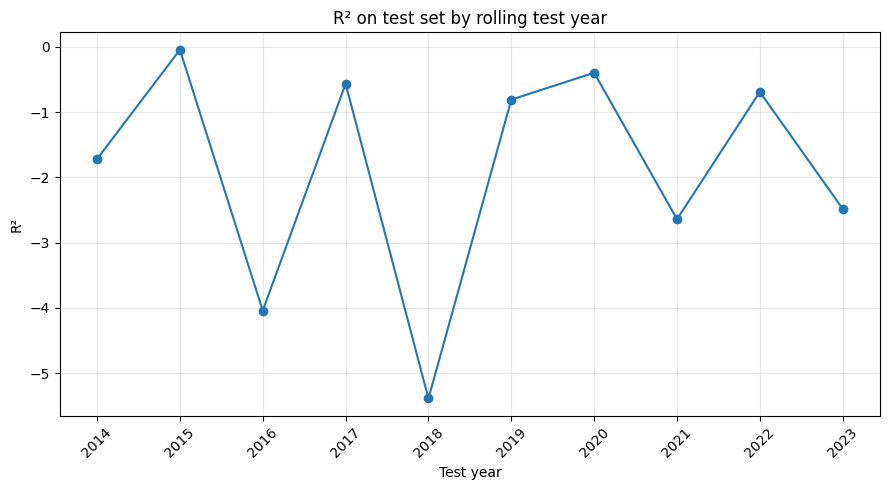

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs
0,2014,2009,2013,0.020881,0.000603,0.024564,-1.719735,0.468651,0.013836,0.006178,0.507937,252,25200
1,2015,2010,2014,0.012321,0.000312,0.017652,-0.044747,0.504643,0.013074,0.016793,0.547619,252,25200
2,2016,2011,2015,0.037452,0.001678,0.040961,-4.044367,0.474722,-0.000974,-0.004609,0.492063,252,25200
3,2017,2012,2016,0.012774,0.000292,0.017078,-0.566139,0.530040,0.006312,0.011293,0.537849,251,25100
4,2018,2013,2017,0.042783,0.002110,0.045939,-5.390092,0.480956,-0.002035,0.003252,0.505976,251,25100
5,2019,2014,2018,0.018238,0.000522,0.022841,-0.809283,0.450635,0.003390,0.005452,0.515873,252,25200
6,2020,2015,2019,0.032757,0.002515,0.050150,-0.396909,0.515178,-0.007697,-0.028516,0.458498,253,25300
7,2021,2016,2020,0.031076,0.001237,0.035176,-2.642312,0.523135,0.013476,0.027954,0.555556,252,25200
8,2022,2017,2021,0.023355,0.000905,0.030089,-0.690390,0.498287,0.001337,0.001338,0.501992,251,25100
9,2023,2018,2022,0.028485,0.001048,0.032373,-2.483251,0.480526,0.011082,0.004951,0.514170,247,24700


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_test1y_timexer_base_sector_only_mean...,test,0.026012,0.02592,0.010252,0.012321,0.042783,0.001122,0.000977,0.000765,...,0.028355,0.458498,0.555556,251300,25130.0,2513,251.3,2014,2023,10


R2 plot path:
/content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/rolling_sector_only_mean_pca32_r2.png
Short test metrics path:
/content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/rolling_sector_only_mean_pca32_test_metrics_short.csv
Output directory:
/content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest


In [ ]:
rolling_experiment_name = 'rolling5y_test1y_timexer_base_sector_only_mean_pca32'
rolling_wandb_project = 'fnspid-timexer-rolling-year'
rolling_wandb_group = 'rolling5y_test1y_sector_only_mean_pca32'

rolling_sector_only_mean_pca32_result = run_rolling_year_backtest(
    base_config_dict=rolling_sector_only_mean_pca32_base_config_dict,
    folds_df=rolling_5y_1y_folds_df,
    rolling_experiment_name=rolling_experiment_name,
    wandb_project=rolling_wandb_project,
    wandb_group=rolling_wandb_group,
    disable_validation=True,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_sector_only_mean_pca32_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_sector_only_mean_pca32_result,
    split_name='test',
    save_outputs=True
)

rolling_sector_only_mean_pca32_test_metrics_df = (
    rolling_sector_only_mean_pca32_collected_metrics['test_metrics']
)

rolling_sector_only_mean_pca32_aggregate_metrics_df = (
    rolling_sector_only_mean_pca32_collected_metrics['aggregate_metrics']
)

rolling_sector_only_mean_pca32_test_metrics_short_df = (
    rolling_sector_only_mean_pca32_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs'
            ]
            if column in rolling_sector_only_mean_pca32_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_sector_only_mean_pca32_plots_dir = (
    Path(rolling_sector_only_mean_pca32_result['rolling_output_dir'])
    / 'plots'
)

rolling_sector_only_mean_pca32_r2_plot_output = plot_single_rolling_year_metric(
    rolling_metrics_df=rolling_sector_only_mean_pca32_test_metrics_df,
    metric='r2',
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    title='R² on test set by rolling test year',
    output_dir=rolling_sector_only_mean_pca32_plots_dir,
    filename_prefix='rolling_sector_only_mean_pca32',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_sector_only_mean_pca32_test_metrics_short_path = (
    Path(rolling_sector_only_mean_pca32_result['rolling_output_dir'])
    / 'rolling_sector_only_mean_pca32_test_metrics_short.csv'
)

rolling_sector_only_mean_pca32_test_metrics_short_df.to_csv(
    rolling_sector_only_mean_pca32_test_metrics_short_path,
    index=False
)

display(rolling_sector_only_mean_pca32_test_metrics_short_df)

display(rolling_sector_only_mean_pca32_aggregate_metrics_df)

print('R2 plot path:')
print(rolling_sector_only_mean_pca32_r2_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_sector_only_mean_pca32_test_metrics_short_path)

print('Output directory:')
print(rolling_sector_only_mean_pca32_result['rolling_output_dir'])

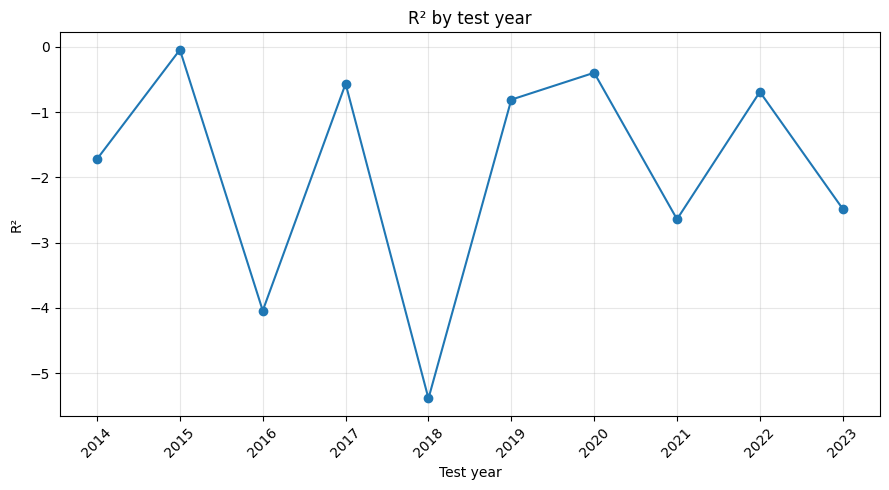

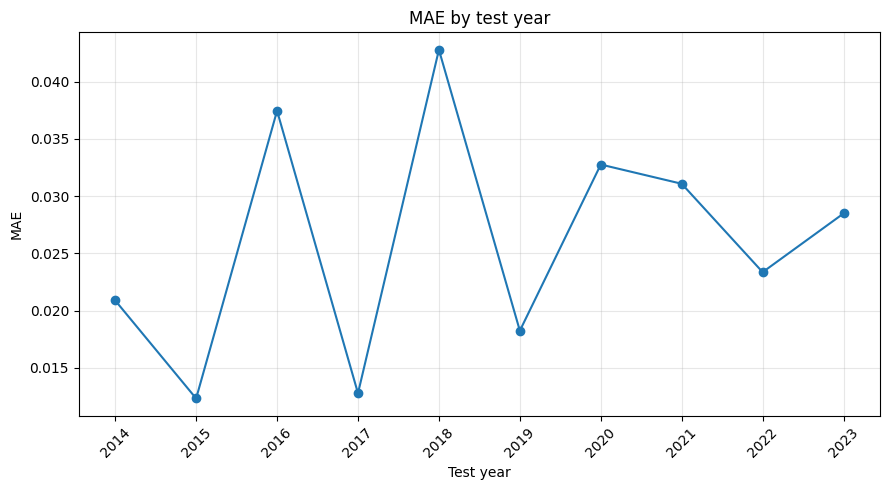

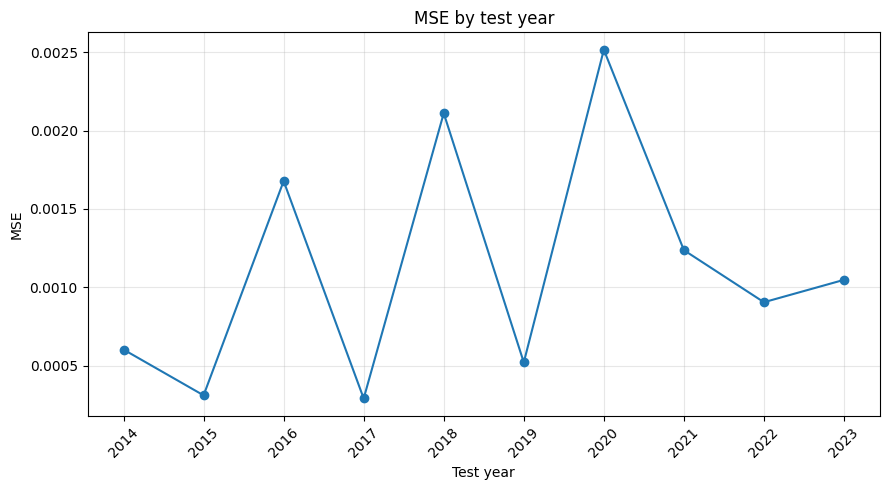

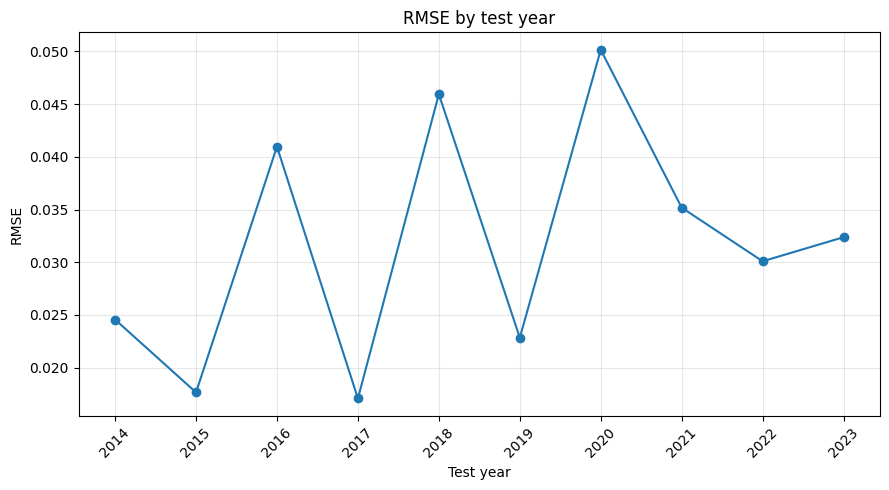

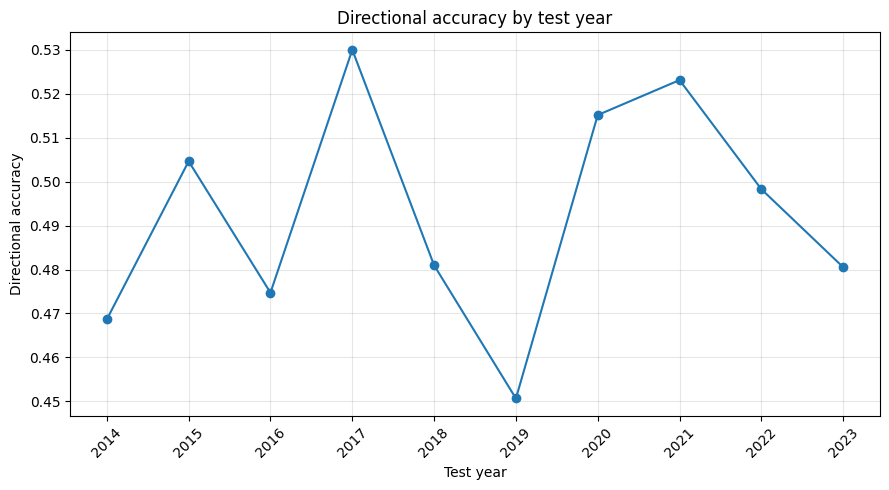

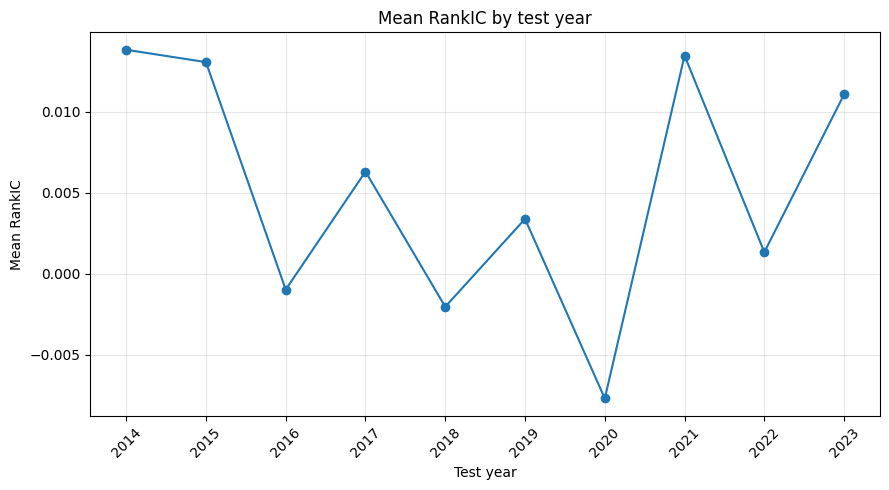

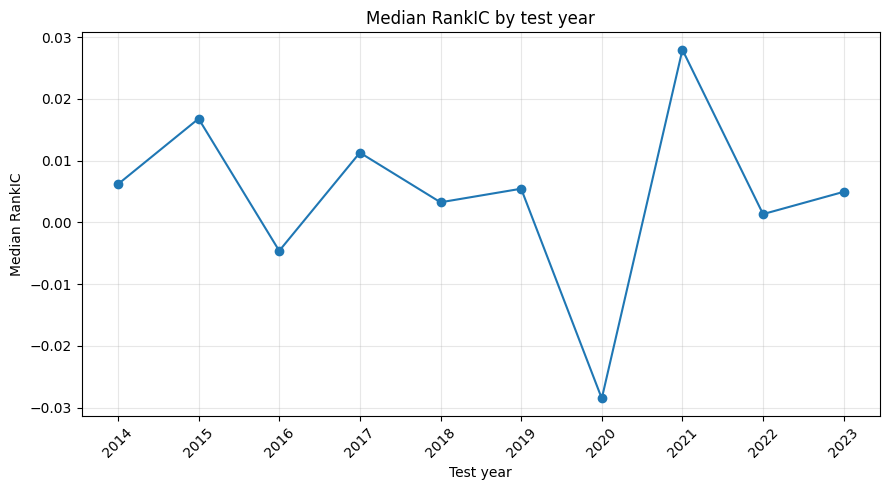

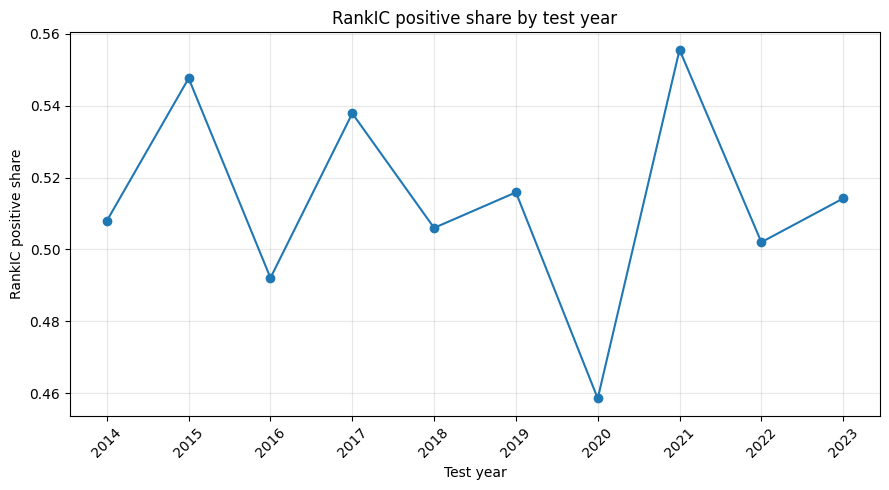

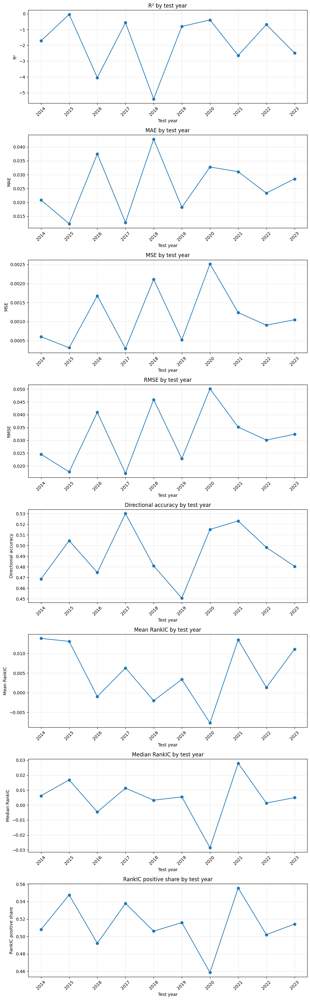

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs
0,2014,2009,2013,0.020881,0.000603,0.024564,-1.719735,0.468651,0.013836,0.006178,0.507937,252,25200
1,2015,2010,2014,0.012321,0.000312,0.017652,-0.044747,0.504643,0.013074,0.016793,0.547619,252,25200
2,2016,2011,2015,0.037452,0.001678,0.040961,-4.044367,0.474722,-0.000974,-0.004609,0.492063,252,25200
3,2017,2012,2016,0.012774,0.000292,0.017078,-0.566139,0.530040,0.006312,0.011293,0.537849,251,25100
4,2018,2013,2017,0.042783,0.002110,0.045939,-5.390092,0.480956,-0.002035,0.003252,0.505976,251,25100
5,2019,2014,2018,0.018238,0.000522,0.022841,-0.809283,0.450635,0.003390,0.005452,0.515873,252,25200
6,2020,2015,2019,0.032757,0.002515,0.050150,-0.396909,0.515178,-0.007697,-0.028516,0.458498,253,25300
7,2021,2016,2020,0.031076,0.001237,0.035176,-2.642312,0.523135,0.013476,0.027954,0.555556,252,25200
8,2022,2017,2021,0.023355,0.000905,0.030089,-0.690390,0.498287,0.001337,0.001338,0.501992,251,25100
9,2023,2018,2022,0.028485,0.001048,0.032373,-2.483251,0.480526,0.011082,0.004951,0.514170,247,24700


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_test1y_timexer_base_sector_only_mean...,test,0.026012,0.02592,0.010252,0.012321,0.042783,0.001122,0.000977,0.000765,...,0.028355,0.458498,0.555556,251300,25130.0,2513,251.3,2014,2023,10


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_only_mean_pca32_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_only_mean_pca32_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_only_mean_pca32_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_only_mean_pca32_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_yea

In [ ]:
required_objects_for_rolling_plots = [
    'rolling_sector_only_mean_pca32_result',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_rolling_plots = [
    object_name
    for object_name in required_objects_for_rolling_plots
    if object_name not in globals()
]

if missing_objects_for_rolling_plots:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_rolling_plots}')

rolling_sector_only_mean_pca32_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_sector_only_mean_pca32_result,
    split_name='test',
    save_outputs=True
)

rolling_sector_only_mean_pca32_test_metrics_df = (
    rolling_sector_only_mean_pca32_collected_metrics['test_metrics']
)

rolling_sector_only_mean_pca32_aggregate_metrics_df = (
    rolling_sector_only_mean_pca32_collected_metrics['aggregate_metrics']
)

rolling_sector_only_mean_pca32_plots_dir = (
    Path(rolling_sector_only_mean_pca32_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_sector_only_mean_pca32_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_sector_only_mean_pca32_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_sector_only_mean_pca32_test_metrics_df,
    metrics=rolling_sector_only_mean_pca32_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_sector_only_mean_pca32_plots_dir,
    filename_prefix='rolling_sector_only_mean_pca32_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_sector_only_mean_pca32_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_sector_only_mean_pca32_test_metrics_df,
    metrics=rolling_sector_only_mean_pca32_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_sector_only_mean_pca32_plots_dir,
    filename='rolling_sector_only_mean_pca32_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_sector_only_mean_pca32_test_metrics_short_df = (
    rolling_sector_only_mean_pca32_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs'
            ]
            if column in rolling_sector_only_mean_pca32_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

display(rolling_sector_only_mean_pca32_test_metrics_short_df)
display(rolling_sector_only_mean_pca32_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_sector_only_mean_pca32_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_sector_only_mean_pca32_panel_plot_output['saved_path'])

print('Plots directory:')
print(rolling_sector_only_mean_pca32_plots_dir)

## rolling5y_test1y_timexer_base_price_only

Running rolling5y_test1y_timexer_base_price_only | test_2014 | train 2009-2013 | test 2014-2014


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▃▆▁▃▆█▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_price_only | test_2015 | train 2010-2014 | test 2015-2015


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅█▁▁▅▁▅█▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_price_only | test_2016 | train 2011-2015 | test 2016-2016


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇█████
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▃▁▁▁▁▁▁▁▃▅▆▁▁▃▁▃▁▃▅▁▁▃▅▁▃▅▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,26


Running rolling5y_test1y_timexer_base_price_only | test_2017 | train 2012-2016 | test 2017-2017


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇████
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▁▂▁▂▄▅▇█▁▂▁▁▂▄
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,28


Running rolling5y_test1y_timexer_base_price_only | test_2018 | train 2013-2017 | test 2018-2018


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▃▁▁▃▅▆▁▁▃▅▁▃▅▆█▁▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_price_only | test_2019 | train 2014-2018 | test 2019-2019


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▃▃▃▄▄▅▅▅▅▆▆▇▇█████████████
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▂▁▁▁▁▂▂▁▁▁▂▁▁▂▂▃▄▄▅▅▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,19


Running rolling5y_test1y_timexer_base_price_only | test_2020 | train 2015-2019 | test 2020-2020


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▃▆▁▃▁▃▁▃▆█▁▃▆█▁▁▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,29


Running rolling5y_test1y_timexer_base_price_only | test_2021 | train 2016-2020 | test 2021-2021


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▂▃▅▆▇█▁▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▁▁▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▁▁▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_price_only | test_2022 | train 2017-2021 | test 2022-2022


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▇▇▇▇█████
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▆▁▁▁▁▁▁▁▁▁▁▃▆█▁▃▁▁▃▆▁▁▃▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,27


Running rolling5y_test1y_timexer_base_price_only | test_2023 | train 2018-2022 | test 2023-2023


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▂▂▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▃▆█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▅▄▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▅▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


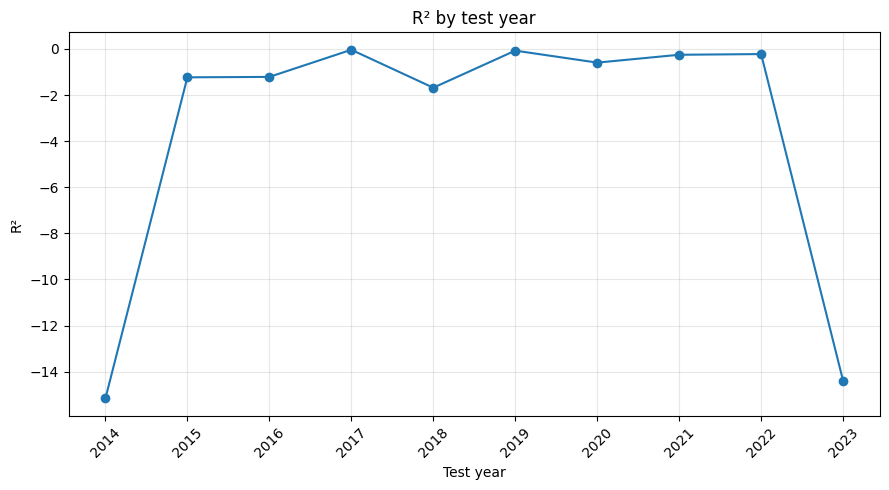

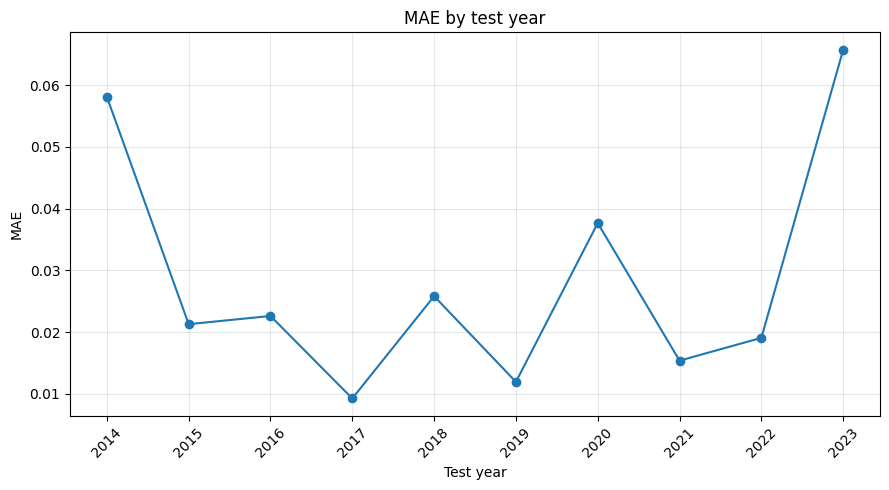

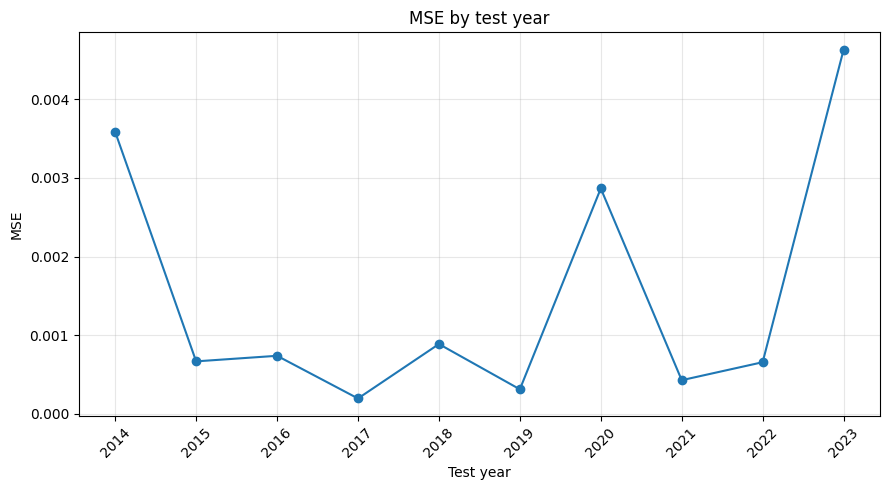

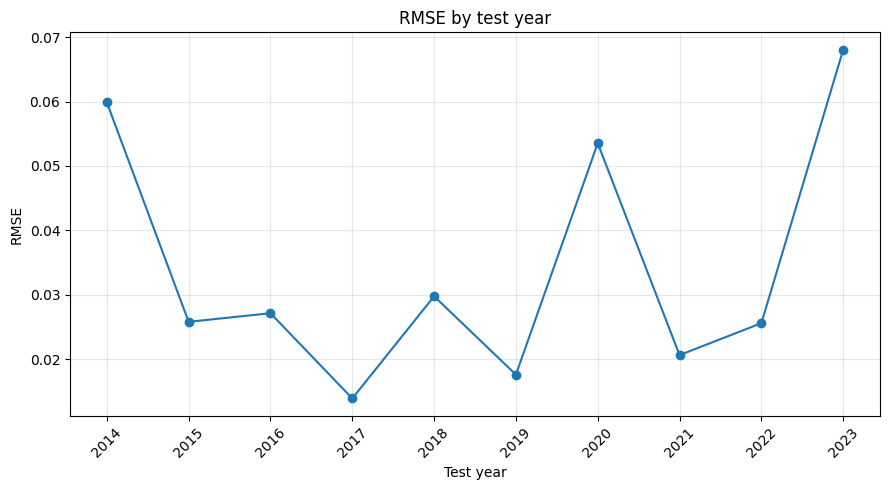

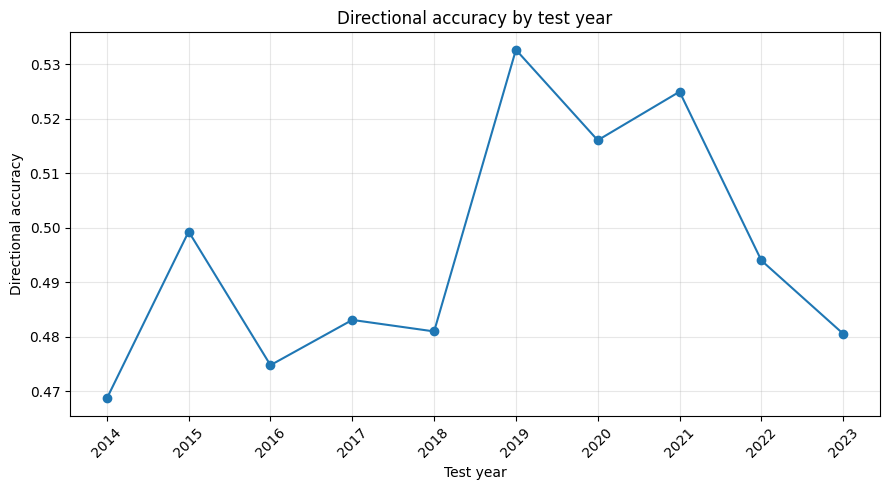

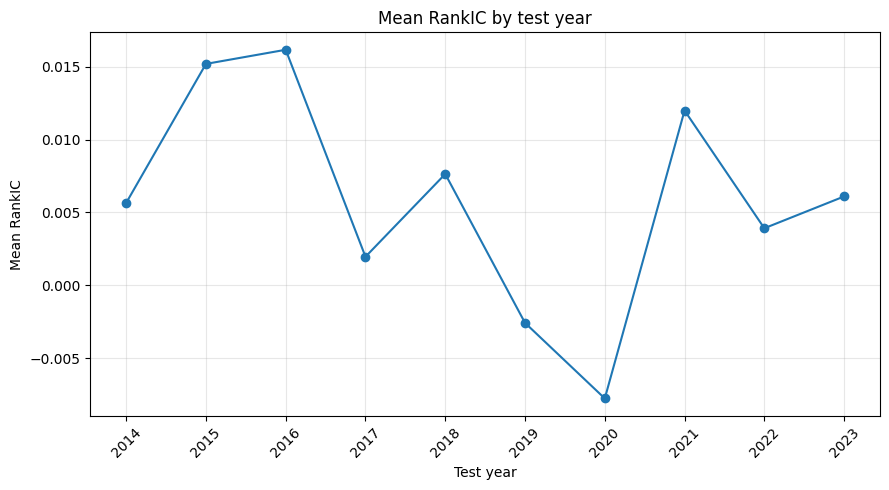

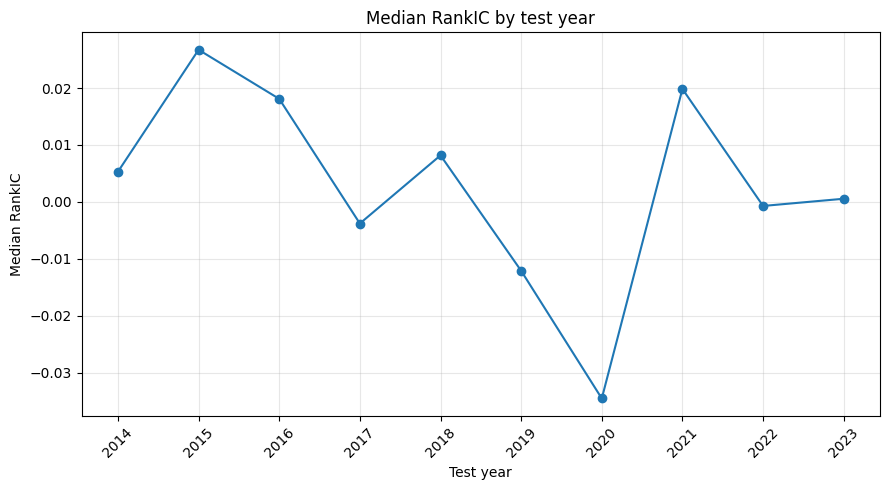

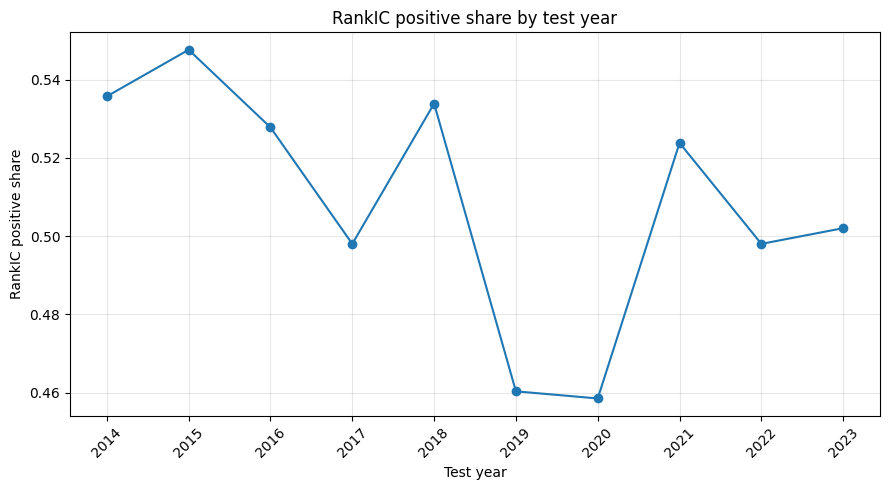

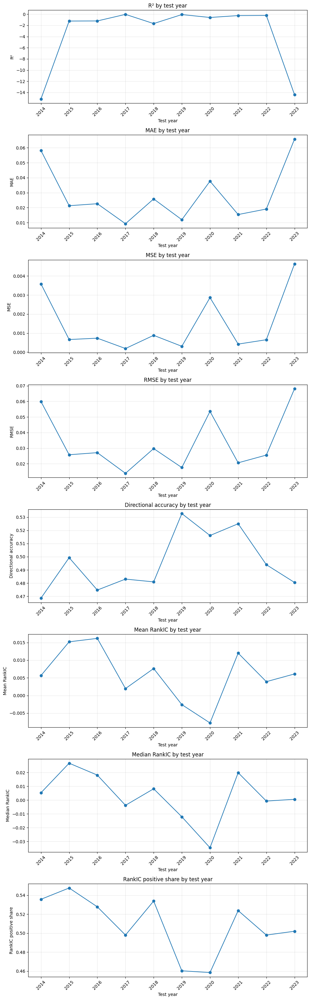

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs
0,2014,2009,2013,0.058104,0.003586,0.059879,-15.161072,0.468651,0.005655,0.005302,0.535714,252,25200
1,2015,2010,2014,0.021274,0.000665,0.025788,-1.229830,0.499286,0.015205,0.026725,0.547619,252,25200
2,2016,2011,2015,0.022599,0.000736,0.027127,-1.212544,0.474762,0.016176,0.018101,0.527778,252,25200
3,2017,2012,2016,0.009240,0.000193,0.013882,-0.034878,0.483068,0.001958,-0.003792,0.498008,251,25100
4,2018,2013,2017,0.025807,0.000886,0.029758,-1.681225,0.480956,0.007642,0.008179,0.533865,251,25100
5,2019,2014,2018,0.011927,0.000309,0.017584,-0.072353,0.532659,-0.002583,-0.012094,0.460317,252,25200
6,2020,2015,2019,0.037646,0.002866,0.053538,-0.592011,0.516047,-0.007775,-0.034522,0.458498,253,25300
7,2021,2016,2020,0.015365,0.000425,0.020622,-0.251823,0.524960,0.012002,0.019841,0.523810,252,25200
8,2022,2017,2021,0.019057,0.000654,0.025578,-0.221572,0.493984,0.003916,-0.000708,0.498008,251,25100
9,2023,2018,2022,0.065716,0.004632,0.068059,-14.395554,0.480526,0.006101,0.000558,0.502024,247,24700


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_test1y_timexer_base_price_only,test,0.028673,0.021937,0.019283,0.00924,0.065716,0.001495,0.0007,0.001588,...,0.030919,0.458498,0.547619,251300,25130.0,2513,251.3,2014,2023,10


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_price_only_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_price_only_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_price_only_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_price_only_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_price_only_test_directional_accuracy.png
rank_ic_mean -> /content/fnspid_timexer_project/metrics_o

In [ ]:
required_objects_for_price_only_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_price_only_rolling = [
    object_name
    for object_name in required_objects_for_price_only_rolling
    if object_name not in globals()
]

if missing_objects_for_price_only_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_price_only_rolling}')

if 'rolling_5y_1y_folds_df' not in globals():
    rolling_5y_1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=False,
        validation_years=0,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_1y_folds_df = make_rolling_year_folds(
        rolling_5y_1y_config
    )

rolling_price_only_experiment_name = 'rolling5y_test1y_timexer_base_price_only'
rolling_price_only_wandb_project = 'fnspid-timexer-rolling-year'
rolling_price_only_wandb_group = 'rolling5y_test1y_price_only'

rolling_price_only_make_config_kwargs = {
    'experiment_name': rolling_price_only_experiment_name,
    'text_mode': 'price_only',
    'embedding_type': 'mean',
    'pca_n_components': 32,
    'use_embeddings': False,
    'use_company_sentiment': False,
    'use_sector_sentiment': False,
    'use_company_embeddings': False,
    'use_sector_embeddings': False,
    'wandb_tags': [
        'timexer_base',
        'price_only',
        'rolling_year',
        'train_5y',
        'test_1y',
        'baseline'
    ]
}

rolling_price_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    **rolling_price_only_make_config_kwargs
)

rolling_price_only_base_config_dict['data']['text_mode'] = 'price_only'
rolling_price_only_base_config_dict['data']['embedding_type'] = 'mean'
rolling_price_only_base_config_dict['data']['pca_n_components'] = 32
rolling_price_only_base_config_dict['data']['use_embeddings'] = False
rolling_price_only_base_config_dict['data']['use_company_sentiment'] = False
rolling_price_only_base_config_dict['data']['use_sector_sentiment'] = False
rolling_price_only_base_config_dict['data']['use_company_embeddings'] = False
rolling_price_only_base_config_dict['data']['use_sector_embeddings'] = False
rolling_price_only_base_config_dict['data']['include_news_count'] = False
rolling_price_only_base_config_dict['data']['include_has_news'] = False
rolling_price_only_base_config_dict['data']['include_sentiment_score'] = False
rolling_price_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_price_only_base_config_dict['data']['dtype'] = 'float32'
rolling_price_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_price_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_price_only_base_config_dict['windows']['seq_len'] = 60
rolling_price_only_base_config_dict['windows']['pred_len'] = 1
rolling_price_only_base_config_dict['windows']['patch_len'] = 5
rolling_price_only_base_config_dict['windows']['window_stride'] = 1

rolling_price_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_price_only_base_config_dict['training']['scheduler'] = 'none'
rolling_price_only_base_config_dict['training']['scheduler_metric'] = 'train_loss'
rolling_price_only_base_config_dict['training']['checkpoint_metric'] = 'train_loss'
rolling_price_only_base_config_dict['training']['early_stopping_metric'] = 'train_loss'
rolling_price_only_base_config_dict['training']['patience'] = (
    int(rolling_price_only_base_config_dict['training'].get('train_epochs', 30)) + 1
)

rolling_price_only_base_config_dict['logging']['use_wandb'] = True
rolling_price_only_base_config_dict['logging']['wandb_project'] = rolling_price_only_wandb_project
rolling_price_only_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_price_only_base_config_dict['logging']['wandb_group'] = rolling_price_only_wandb_group
rolling_price_only_base_config_dict['logging']['wandb_run_name'] = rolling_price_only_experiment_name
rolling_price_only_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'price_only',
    'rolling_year',
    'train_5y',
    'test_1y',
    'baseline'
]
rolling_price_only_base_config_dict['logging']['log_batch_metrics'] = False
rolling_price_only_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_price_only_base_config_dict['logging']['log_predictions_table'] = False
rolling_price_only_base_config_dict['logging']['log_model_artifact'] = False
rolling_price_only_base_config_dict['logging']['log_model'] = False
rolling_price_only_base_config_dict['logging']['log_artifacts'] = False
rolling_price_only_base_config_dict['logging']['log_predictions'] = False
rolling_price_only_base_config_dict['logging']['log_metrics'] = True

rolling_price_only_result = run_rolling_year_backtest(
    base_config_dict=rolling_price_only_base_config_dict,
    folds_df=rolling_5y_1y_folds_df,
    rolling_experiment_name=rolling_price_only_experiment_name,
    wandb_project=rolling_price_only_wandb_project,
    wandb_group=rolling_price_only_wandb_group,
    disable_validation=True,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_price_only_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_price_only_result,
    split_name='test',
    save_outputs=True
)

rolling_price_only_test_metrics_df = (
    rolling_price_only_collected_metrics['test_metrics']
)

rolling_price_only_aggregate_metrics_df = (
    rolling_price_only_collected_metrics['aggregate_metrics']
)

rolling_price_only_test_metrics_short_df = (
    rolling_price_only_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs'
            ]
            if column in rolling_price_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_price_only_plots_dir = (
    Path(rolling_price_only_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_price_only_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_price_only_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_price_only_test_metrics_df,
    metrics=rolling_price_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_price_only_plots_dir,
    filename_prefix='rolling_price_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_price_only_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_price_only_test_metrics_df,
    metrics=rolling_price_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_price_only_plots_dir,
    filename='rolling_price_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_price_only_test_metrics_short_path = (
    Path(rolling_price_only_result['rolling_output_dir'])
    / 'rolling_price_only_test_metrics_short.csv'
)

rolling_price_only_test_metrics_short_df.to_csv(
    rolling_price_only_test_metrics_short_path,
    index=False
)

display(rolling_price_only_test_metrics_short_df)
display(rolling_price_only_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_price_only_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_price_only_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_price_only_test_metrics_short_path)

print('Output directory:')
print(rolling_price_only_result['rolling_output_dir'])

## rolling5y_test1y_timexer_base_sector_sentiment_only

Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2014 | train 2009-2013 | test 2014-2014


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇█████████
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▂▃▁▁▁▂▁▁▂▁▂▁▁▁▂▃▄▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,23


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2015 | train 2010-2014 | test 2015-2015


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆███████
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▂▄▁▁▁▁▁▁▂▄▅▇█▁▁▂▄▅▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,25


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2016 | train 2011-2015 | test 2016-2016


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇██
early_stopping/best_value,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▃▁▃▅▁▁▁▁▁▃▁▁▃▅▆█▁▃▁▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,29


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2017 | train 2012-2016 | test 2017-2017


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁█▁▁▁▁█▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2018 | train 2013-2017 | test 2018-2018


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▇▇▇▇▇███
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▃▆▁▃▆█▁▁▃▁▃▁▁▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,29


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2019 | train 2014-2018 | test 2019-2019


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▃▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆████
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▂▁▁▁▂▄▅▁▁▁▁▂▄▅▇█▁▂▄▅
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▁▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,27


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2020 | train 2015-2019 | test 2020-2020


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▇▇▇▇▇▇█
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▃▆▁▁▁▃▁▃▁▃▆█▁▁▁▁▁▁▃▆▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2021 | train 2016-2020 | test 2021-2021


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁█▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2022 | train 2017-2021 | test 2022-2022


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▂▂▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▇▇███
early_stopping/best_value,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▂▃▄▅▁▁▁▁▁▁▁▁▂▃▄▅▆▇█▁▁▁▂▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▄▃▂▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▄▃▂▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_sector_sentiment_only | test_2023 | train 2018-2022 | test 2023-2023


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇█████
early_stopping/best_value,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▃▁▁▁▁▁▃▁▁▁▁▁▃▆▁▁▃▆▁▁▃▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,27


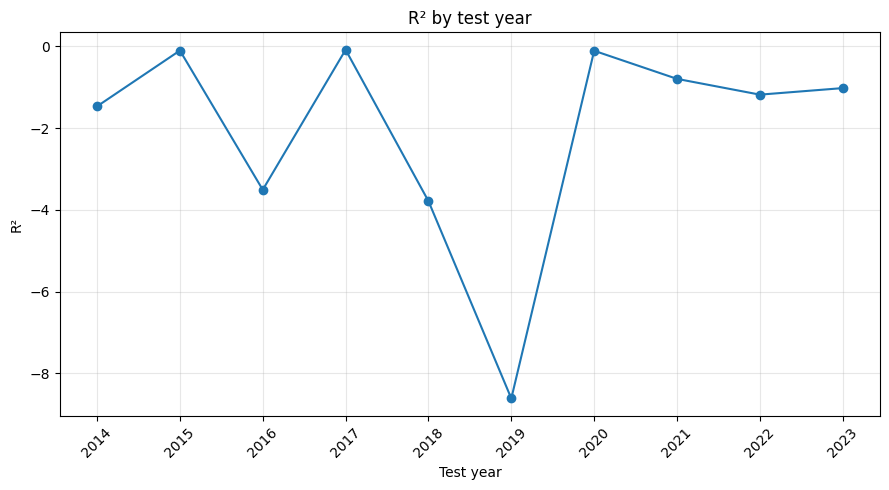

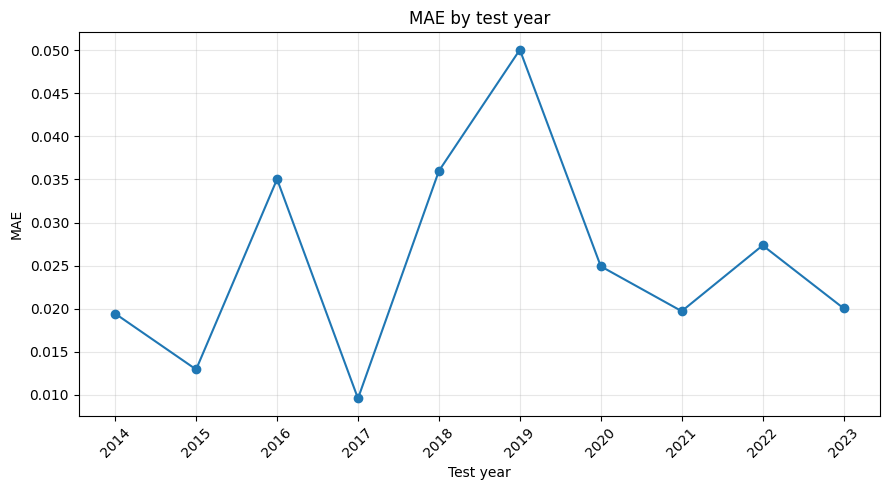

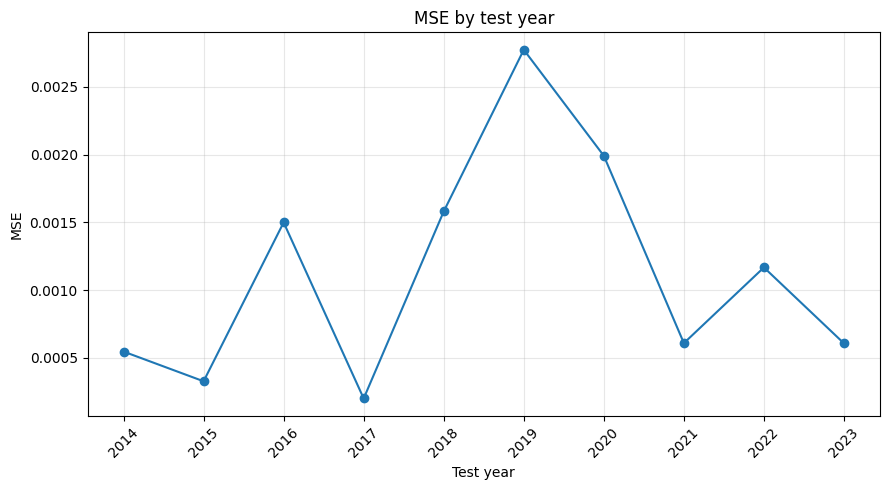

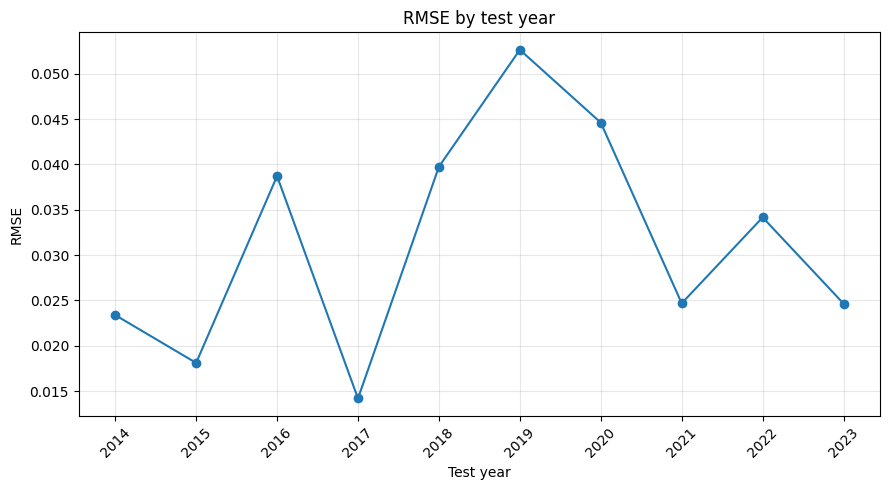

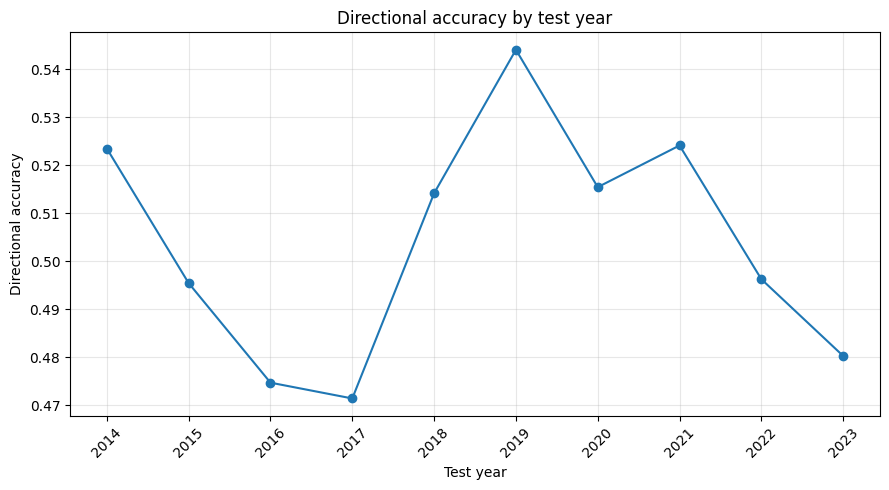

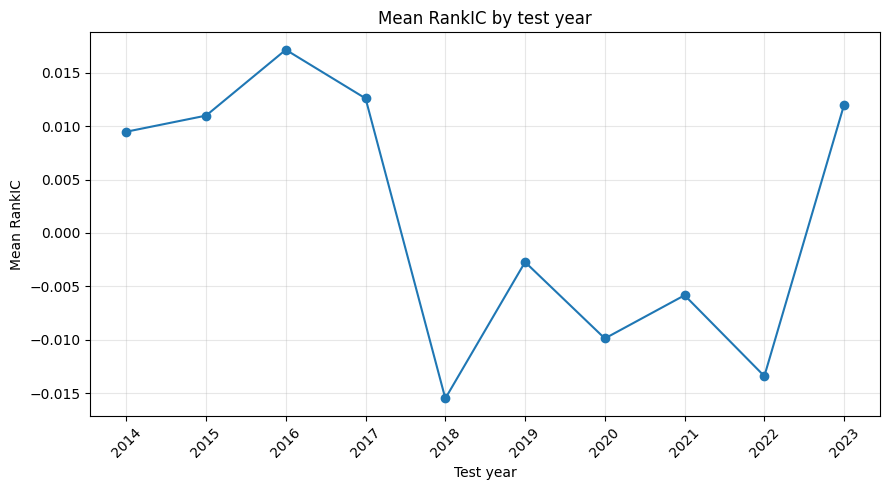

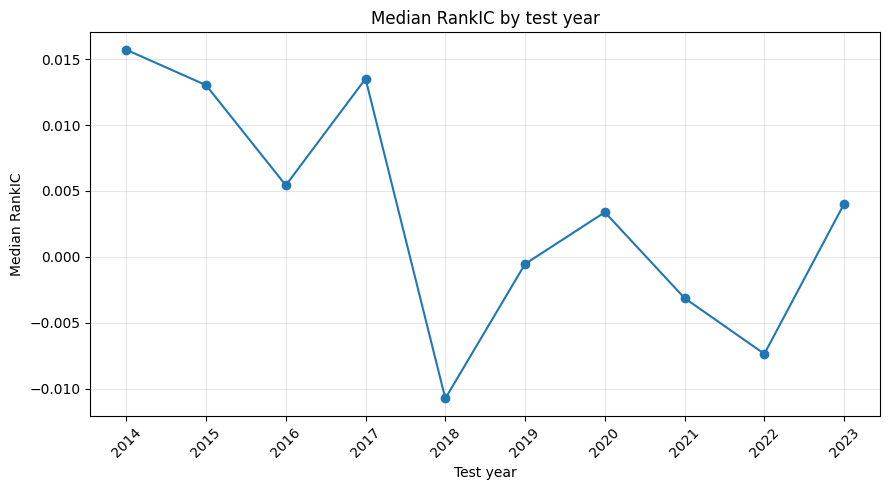

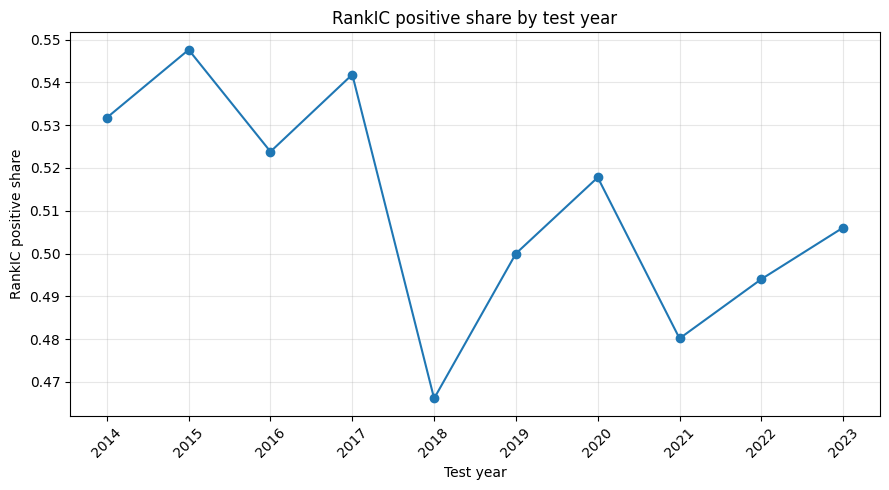

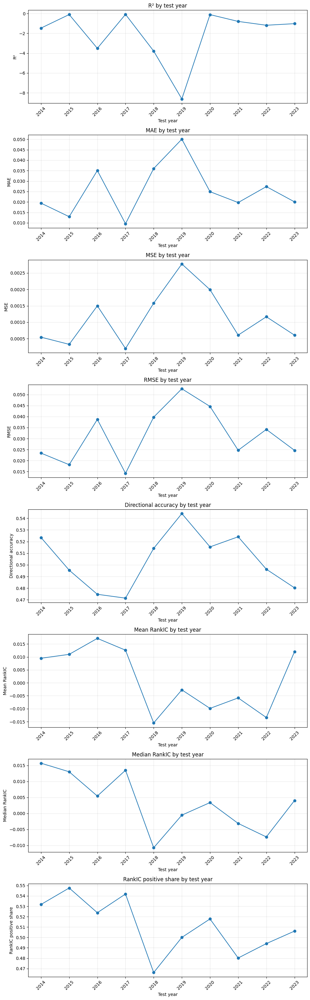

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs
0,2014,2009,2013,0.019431,0.000547,0.023388,-1.465570,0.523452,0.009478,0.015721,0.531746,252,25200
1,2015,2010,2014,0.012956,0.000328,0.018112,-0.099910,0.495437,0.010986,0.013033,0.547619,252,25200
2,2016,2011,2015,0.035025,0.001499,0.038718,-3.507142,0.474722,0.017151,0.005431,0.523810,252,25200
3,2017,2012,2016,0.009593,0.000201,0.014189,-0.081114,0.471434,0.012597,0.013520,0.541833,251,25100
4,2018,2013,2017,0.035988,0.001580,0.039755,-3.785571,0.514143,-0.015497,-0.010754,0.466135,251,25100
5,2019,2014,2018,0.050037,0.002772,0.052653,-8.614762,0.544008,-0.002726,-0.000543,0.500000,252,25200
6,2020,2015,2019,0.024920,0.001990,0.044615,-0.105538,0.515415,-0.009881,0.003384,0.517787,253,25300
7,2021,2016,2020,0.019715,0.000609,0.024682,-0.793361,0.524087,-0.005835,-0.003135,0.480159,252,25200
8,2022,2017,2021,0.027346,0.001167,0.034166,-1.179491,0.496255,-0.013407,-0.007369,0.494024,251,25100
9,2023,2018,2022,0.020053,0.000608,0.024649,-1.019345,0.480283,0.012013,0.004026,0.506073,247,24700


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_test1y_timexer_base_sector_sentiment...,test,0.025506,0.022486,0.012096,0.009593,0.050037,0.00113,0.000888,0.000828,...,0.02652,0.466135,0.547619,251300,25130.0,2513,251.3,2014,2023,10


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_sentiment_only_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_sentiment_only_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_sentiment_only_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_sector_sentiment_only_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling

In [ ]:
required_objects_for_sector_sentiment_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_sector_sentiment_rolling = [
    object_name
    for object_name in required_objects_for_sector_sentiment_rolling
    if object_name not in globals()
]

if missing_objects_for_sector_sentiment_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_sector_sentiment_rolling}')

if 'rolling_5y_1y_folds_df' not in globals():
    rolling_5y_1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=False,
        validation_years=0,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_1y_folds_df = make_rolling_year_folds(
        rolling_5y_1y_config
    )

rolling_sector_sentiment_experiment_name = 'rolling5y_test1y_timexer_base_sector_sentiment_only'
rolling_sector_sentiment_wandb_project = 'fnspid-timexer-rolling-year'
rolling_sector_sentiment_wandb_group = 'rolling5y_test1y_sector_sentiment_only'

rolling_sector_sentiment_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_sector_sentiment_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'sector_sentiment_only',
        'sentiment_only',
        'rolling_year',
        'train_5y',
        'test_1y'
    ]
)

rolling_sector_sentiment_base_config_dict['data']['text_mode'] = 'sector_only'
rolling_sector_sentiment_base_config_dict['data']['embedding_type'] = 'mean'
rolling_sector_sentiment_base_config_dict['data']['pca_n_components'] = 32
rolling_sector_sentiment_base_config_dict['data']['use_embeddings'] = False
rolling_sector_sentiment_base_config_dict['data']['use_company_sentiment'] = False
rolling_sector_sentiment_base_config_dict['data']['use_sector_sentiment'] = True
rolling_sector_sentiment_base_config_dict['data']['use_company_embeddings'] = False
rolling_sector_sentiment_base_config_dict['data']['use_sector_embeddings'] = False
rolling_sector_sentiment_base_config_dict['data']['include_news_count'] = True
rolling_sector_sentiment_base_config_dict['data']['include_has_news'] = True
rolling_sector_sentiment_base_config_dict['data']['include_sentiment_score'] = True
rolling_sector_sentiment_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_sector_sentiment_base_config_dict['data']['dtype'] = 'float32'
rolling_sector_sentiment_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_sector_sentiment_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_sector_sentiment_base_config_dict['windows']['seq_len'] = 60
rolling_sector_sentiment_base_config_dict['windows']['pred_len'] = 1
rolling_sector_sentiment_base_config_dict['windows']['patch_len'] = 5
rolling_sector_sentiment_base_config_dict['windows']['window_stride'] = 1

rolling_sector_sentiment_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_sector_sentiment_base_config_dict['training']['scheduler'] = 'none'
rolling_sector_sentiment_base_config_dict['training']['scheduler_metric'] = 'train_loss'
rolling_sector_sentiment_base_config_dict['training']['checkpoint_metric'] = 'train_loss'
rolling_sector_sentiment_base_config_dict['training']['early_stopping_metric'] = 'train_loss'
rolling_sector_sentiment_base_config_dict['training']['patience'] = (
    int(rolling_sector_sentiment_base_config_dict['training'].get('train_epochs', 30)) + 1
)

rolling_sector_sentiment_base_config_dict['logging']['use_wandb'] = True
rolling_sector_sentiment_base_config_dict['logging']['wandb_project'] = rolling_sector_sentiment_wandb_project
rolling_sector_sentiment_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_sector_sentiment_base_config_dict['logging']['wandb_group'] = rolling_sector_sentiment_wandb_group
rolling_sector_sentiment_base_config_dict['logging']['wandb_run_name'] = rolling_sector_sentiment_experiment_name
rolling_sector_sentiment_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_sentiment_only',
    'sentiment_only',
    'rolling_year',
    'train_5y',
    'test_1y'
]
rolling_sector_sentiment_base_config_dict['logging']['log_batch_metrics'] = False
rolling_sector_sentiment_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_sector_sentiment_base_config_dict['logging']['log_predictions_table'] = False
rolling_sector_sentiment_base_config_dict['logging']['log_model_artifact'] = False
rolling_sector_sentiment_base_config_dict['logging']['log_model'] = False
rolling_sector_sentiment_base_config_dict['logging']['log_artifacts'] = False
rolling_sector_sentiment_base_config_dict['logging']['log_predictions'] = False
rolling_sector_sentiment_base_config_dict['logging']['log_metrics'] = True

rolling_sector_sentiment_result = run_rolling_year_backtest(
    base_config_dict=rolling_sector_sentiment_base_config_dict,
    folds_df=rolling_5y_1y_folds_df,
    rolling_experiment_name=rolling_sector_sentiment_experiment_name,
    wandb_project=rolling_sector_sentiment_wandb_project,
    wandb_group=rolling_sector_sentiment_wandb_group,
    disable_validation=True,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_sector_sentiment_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_sector_sentiment_result,
    split_name='test',
    save_outputs=True
)

rolling_sector_sentiment_test_metrics_df = (
    rolling_sector_sentiment_collected_metrics['test_metrics']
)

rolling_sector_sentiment_aggregate_metrics_df = (
    rolling_sector_sentiment_collected_metrics['aggregate_metrics']
)

rolling_sector_sentiment_test_metrics_short_df = (
    rolling_sector_sentiment_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs'
            ]
            if column in rolling_sector_sentiment_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_sector_sentiment_plots_dir = (
    Path(rolling_sector_sentiment_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_sector_sentiment_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_sector_sentiment_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_sector_sentiment_test_metrics_df,
    metrics=rolling_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_sector_sentiment_plots_dir,
    filename_prefix='rolling_sector_sentiment_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_sector_sentiment_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_sector_sentiment_test_metrics_df,
    metrics=rolling_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_sector_sentiment_plots_dir,
    filename='rolling_sector_sentiment_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_sector_sentiment_test_metrics_short_path = (
    Path(rolling_sector_sentiment_result['rolling_output_dir'])
    / 'rolling_sector_sentiment_only_test_metrics_short.csv'
)

rolling_sector_sentiment_test_metrics_short_df.to_csv(
    rolling_sector_sentiment_test_metrics_short_path,
    index=False
)

display(rolling_sector_sentiment_test_metrics_short_df)
display(rolling_sector_sentiment_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_sector_sentiment_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_sector_sentiment_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_sector_sentiment_test_metrics_short_path)

print('Output directory:')
print(rolling_sector_sentiment_result['rolling_output_dir'])

In [ ]:
required_objects_for_company_sector_fallback_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_company_sector_fallback_rolling = [
    object_name
    for object_name in required_objects_for_company_sector_fallback_rolling
    if object_name not in globals()
]

if missing_objects_for_company_sector_fallback_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_company_sector_fallback_rolling}')

if 'rolling_5y_1y_folds_df' not in globals():
    rolling_5y_1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=False,
        validation_years=0,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_1y_folds_df = make_rolling_year_folds(
        rolling_5y_1y_config
    )

rolling_company_sector_fallback_experiment_name = 'rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32'
rolling_company_sector_fallback_wandb_project = 'fnspid-timexer-rolling-year'
rolling_company_sector_fallback_wandb_group = 'rolling5y_test1y_company_sector_fallback_mean_pca32'

rolling_company_sector_fallback_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_company_sector_fallback_experiment_name,
    text_mode='company_with_sector_fallback',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'company_sector_fallback',
        'mean',
        'pca32',
        'rolling_year',
        'train_5y',
        'test_1y'
    ]
)

rolling_company_sector_fallback_base_config_dict['data']['text_mode'] = 'company_with_sector_fallback'
rolling_company_sector_fallback_base_config_dict['data']['embedding_type'] = 'mean'
rolling_company_sector_fallback_base_config_dict['data']['pca_n_components'] = 32
rolling_company_sector_fallback_base_config_dict['data']['use_embeddings'] = True
rolling_company_sector_fallback_base_config_dict['data']['use_company_sentiment'] = False
rolling_company_sector_fallback_base_config_dict['data']['use_sector_sentiment'] = False
rolling_company_sector_fallback_base_config_dict['data']['use_company_embeddings'] = True
rolling_company_sector_fallback_base_config_dict['data']['use_sector_embeddings'] = True
rolling_company_sector_fallback_base_config_dict['data']['include_news_count'] = True
rolling_company_sector_fallback_base_config_dict['data']['include_has_news'] = True
rolling_company_sector_fallback_base_config_dict['data']['include_sentiment_score'] = True
rolling_company_sector_fallback_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_company_sector_fallback_base_config_dict['data']['dtype'] = 'float32'
rolling_company_sector_fallback_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_company_sector_fallback_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_company_sector_fallback_base_config_dict['windows']['seq_len'] = 60
rolling_company_sector_fallback_base_config_dict['windows']['pred_len'] = 1
rolling_company_sector_fallback_base_config_dict['windows']['patch_len'] = 5
rolling_company_sector_fallback_base_config_dict['windows']['window_stride'] = 1

rolling_company_sector_fallback_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_company_sector_fallback_base_config_dict['training']['scheduler'] = 'none'
rolling_company_sector_fallback_base_config_dict['training']['scheduler_metric'] = 'train_loss'
rolling_company_sector_fallback_base_config_dict['training']['checkpoint_metric'] = 'train_loss'
rolling_company_sector_fallback_base_config_dict['training']['early_stopping_metric'] = 'train_loss'
rolling_company_sector_fallback_base_config_dict['training']['patience'] = (
    int(rolling_company_sector_fallback_base_config_dict['training'].get('train_epochs', 30)) + 1
)

rolling_company_sector_fallback_base_config_dict['logging']['use_wandb'] = True
rolling_company_sector_fallback_base_config_dict['logging']['wandb_project'] = rolling_company_sector_fallback_wandb_project
rolling_company_sector_fallback_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_company_sector_fallback_base_config_dict['logging']['wandb_group'] = rolling_company_sector_fallback_wandb_group
rolling_company_sector_fallback_base_config_dict['logging']['wandb_run_name'] = rolling_company_sector_fallback_experiment_name
rolling_company_sector_fallback_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_fallback',
    'mean',
    'pca32',
    'rolling_year',
    'train_5y',
    'test_1y'
]
rolling_company_sector_fallback_base_config_dict['logging']['log_batch_metrics'] = False
rolling_company_sector_fallback_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_company_sector_fallback_base_config_dict['logging']['log_predictions_table'] = False
rolling_company_sector_fallback_base_config_dict['logging']['log_model_artifact'] = False
rolling_company_sector_fallback_base_config_dict['logging']['log_model'] = False
rolling_company_sector_fallback_base_config_dict['logging']['log_artifacts'] = False
rolling_company_sector_fallback_base_config_dict['logging']['log_predictions'] = False
rolling_company_sector_fallback_base_config_dict['logging']['log_metrics'] = True

rolling_company_sector_fallback_result = run_rolling_year_backtest(
    base_config_dict=rolling_company_sector_fallback_base_config_dict,
    folds_df=rolling_5y_1y_folds_df,
    rolling_experiment_name=rolling_company_sector_fallback_experiment_name,
    wandb_project=rolling_company_sector_fallback_wandb_project,
    wandb_group=rolling_company_sector_fallback_wandb_group,
    disable_validation=True,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_company_sector_fallback_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_company_sector_fallback_result,
    split_name='test',
    save_outputs=True
)

rolling_company_sector_fallback_test_metrics_df = (
    rolling_company_sector_fallback_collected_metrics['test_metrics']
)

rolling_company_sector_fallback_aggregate_metrics_df = (
    rolling_company_sector_fallback_collected_metrics['aggregate_metrics']
)

rolling_company_sector_fallback_test_metrics_short_df = (
    rolling_company_sector_fallback_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs'
            ]
            if column in rolling_company_sector_fallback_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_company_sector_fallback_plots_dir = (
    Path(rolling_company_sector_fallback_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_company_sector_fallback_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_company_sector_fallback_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_company_sector_fallback_test_metrics_df,
    metrics=rolling_company_sector_fallback_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_company_sector_fallback_plots_dir,
    filename_prefix='rolling_company_sector_fallback_mean_pca32_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_company_sector_fallback_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_company_sector_fallback_test_metrics_df,
    metrics=rolling_company_sector_fallback_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_company_sector_fallback_plots_dir,
    filename='rolling_company_sector_fallback_mean_pca32_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_company_sector_fallback_test_metrics_short_path = (
    Path(rolling_company_sector_fallback_result['rolling_output_dir'])
    / 'rolling_company_sector_fallback_mean_pca32_test_metrics_short.csv'
)

rolling_company_sector_fallback_test_metrics_short_df.to_csv(
    rolling_company_sector_fallback_test_metrics_short_path,
    index=False
)

display(rolling_company_sector_fallback_test_metrics_short_df)
display(rolling_company_sector_fallback_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_company_sector_fallback_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_company_sector_fallback_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_company_sector_fallback_test_metrics_short_path)

print('Output directory:')
print(rolling_company_sector_fallback_result['rolling_output_dir'])

Running rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2014 | train 2009-2013 | test 2014-2014


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇████████
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▁▁▁▁▂▁▂▃▄▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,23


Running rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2015 | train 2010-2014 | test 2015-2015


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▃▁▃▆▁▁▁▃▆█▁▁▁▁▁▃▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2016 | train 2011-2015 | test 2016-2016


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇████
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▃▁▁▃▆█▁▁▁▁▁▁▃▆▁▁▁▁▃▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,28


Running rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2017 | train 2012-2016 | test 2017-2017


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
early_stopping/best_value,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▁▅▁▅█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,False
early_stopping/best_epoch,28


Running rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2018 | train 2013-2017 | test 2018-2018


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_6743/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_6743/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for remova

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▆█▁▁▃▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
checkpoint/was_best,True
early_stopping/best_epoch,30


Running rolling5y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2019 | train 2014-2018 | test 2019-2019


/tmp/ipykernel_6743/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


# Эксперименты с валидацией

## rolling5y_val1y_test1y_timexer_base_price_only

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆████
early_stopping/best_value,███▇▄▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▄▁▁▂▁▂▁▂▄▁▂▁▁▁▂▁▂▄▁▂▄▅▇█▁▂▄▅
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████████████████▃▃▃▃▃▃▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄▁▁██▁▁██▁▁██▁▁▁█▃█▁▇▁▁█▁▁▅█▂█
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▅▇▇▇▇▇▇██
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▁▂▃▅▆▁▁▂▁▂▃▅▁▂▃▅▆▇█▁▂▁▂▁▂▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████▄▄▄▄▄▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄▁▄▃▃▃▃▃▄▅▅▆▅▅▃▆▅▅▅▃▆▆█▇▆▃▇▅██
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▆▆▆▆▇▇██████
early_stopping/best_value,█▇▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▄▅▁▂▄▅▇▁▁▂▄▅▇█▁▁▂▄▁▂▁▁▂▄▅▇
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅▁▆██▁▄▁▁▁▁▇▇█████▆▇▃▆▆▁▇▅█▄▇▆
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▇▇▇▇███
early_stopping/best_value,█▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▃▁▁▁▁▃▁▃▅▁▁▃▁▁▃▅▆█▁▃▁▃▅▆▁▁▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████████████▃▃▃▃▃▃▃▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▁▁█▁▁█▁▁█▁▁█▁██▁█▁▁█▁▁▁████▅▁
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆██
early_stopping/best_value,█▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▂▃▅▆▇▁▁▂▃▁▂▃▅▁▂▃▅▆▇█▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅▁▁▁▁▁▁▁▁▁▁███▁▁▁▄▁██▂███████▆
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2020 | train 2014-2018 | test 2020-2020


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆▆▆▆█
early_stopping/best_value,██▆▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▁▁▂▃▁▂▁▁▂▃▅▆▇▁▁▂▃▅▁▁▂▃▅▆▇█▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████████▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄██▁▁█▁▁▁▁▃█▁█▁▁▂▅▁▁▁▇▅▁▂▁▁▂▂▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2021 | train 2015-2019 | test 2021-2021


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇███
early_stopping/best_value,█▆▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▁▁▁▁▃▅▁▃▅▁▃▅▆█▁▁▃▅▆▁▃▁▃▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████████████▃▃▃▃▃▃▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▁▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▆█▃▇▆▇█▇▇▁▁▂▁█▇▁██▃▁▃███▆▇▆▇▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2022 | train 2016-2020 | test 2022-2022


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▇▇▇▇▇█████
early_stopping/best_value,██▆▅▅▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▃▁▁▃▁▁▃▁▁▃▅▆█▁▃▁▃▅▆▁▃▅▁▃▁▃▅▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅█▁▁██▁▁▁▇▁▁▁▁▁█▁▁▁█▄▃█▅▁▆▅▆██
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2023 | train 2017-2021 | test 2023-2023


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇█████
early_stopping/best_value,█▇▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▃▅▆▁▃▅▆█▁▃▁▁▃▅▆█▁▃▁▃▅▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████▄▄▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃▁▄▃▄█▃▂▄▅▃▂▂▅▂▃▂▃▄▅▂▁▃▄▅▆▅▅▃▄
+8,...


,count
split,
train,9
validation,9
test,9


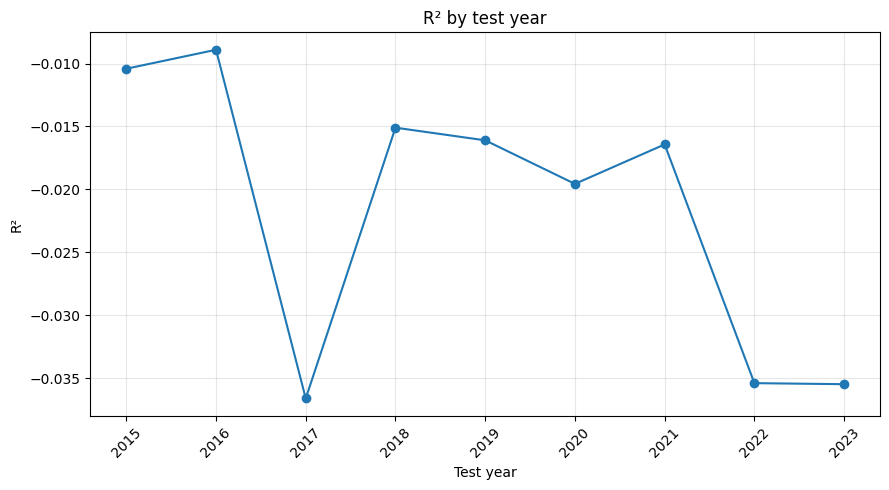

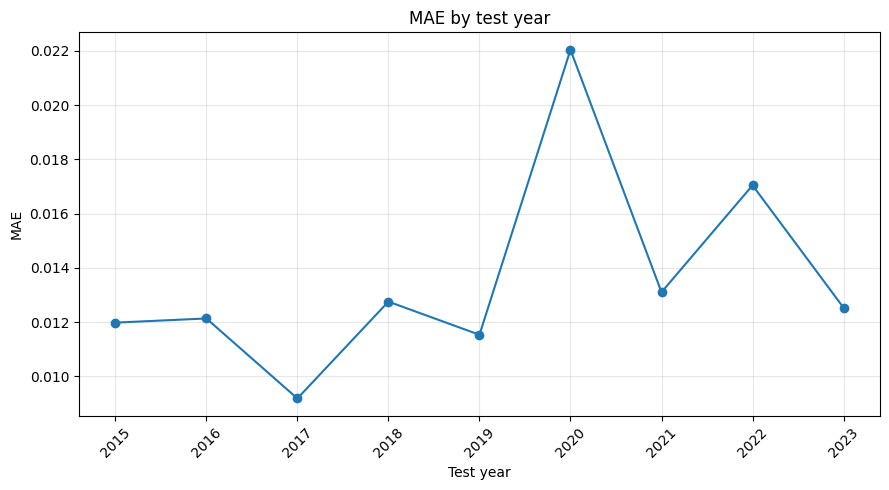

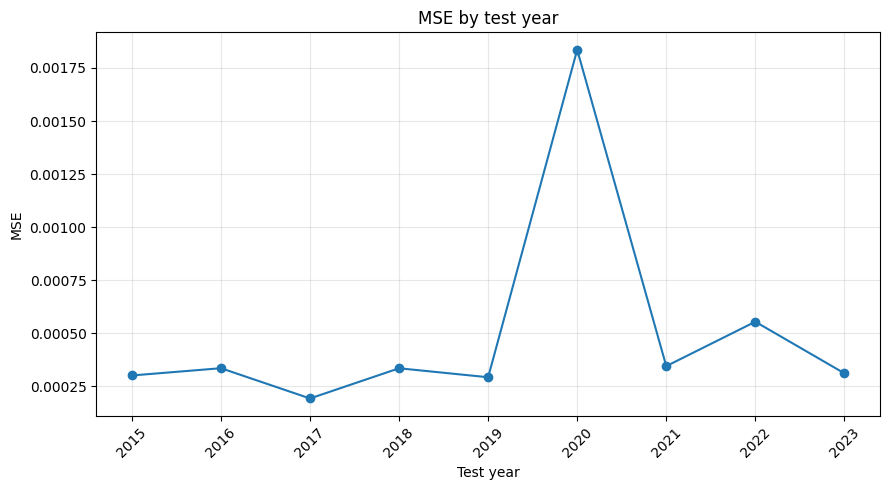

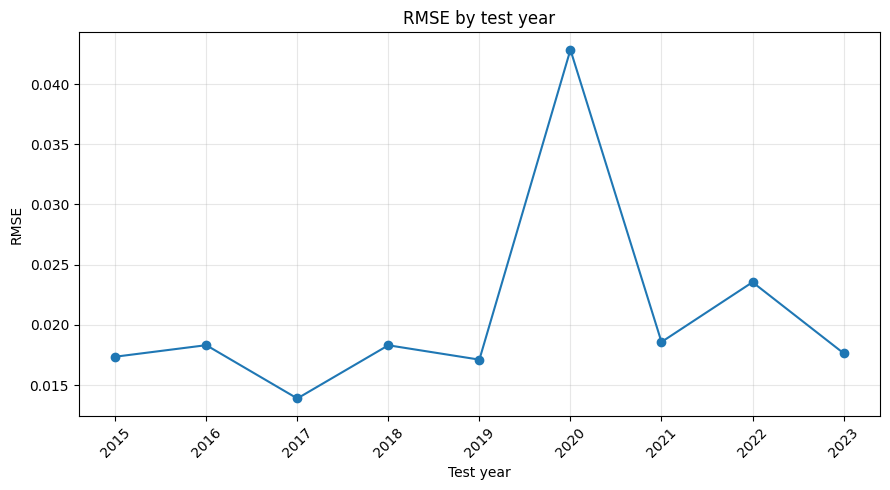

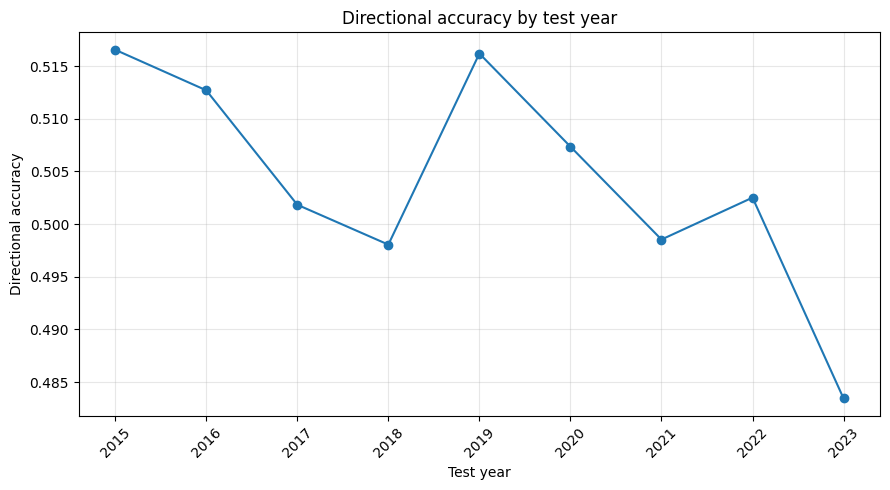

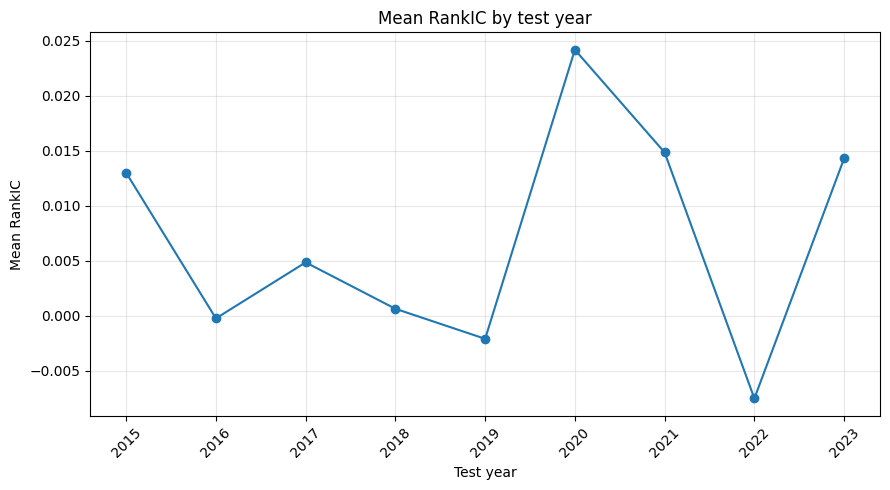

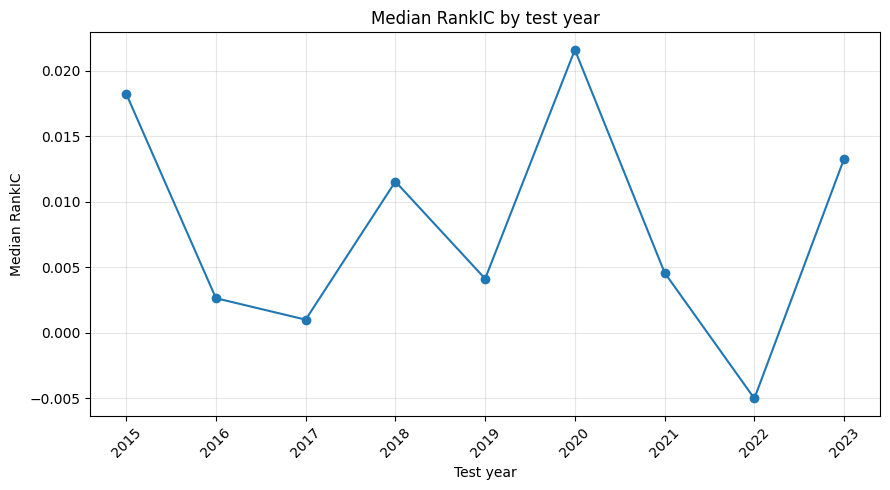

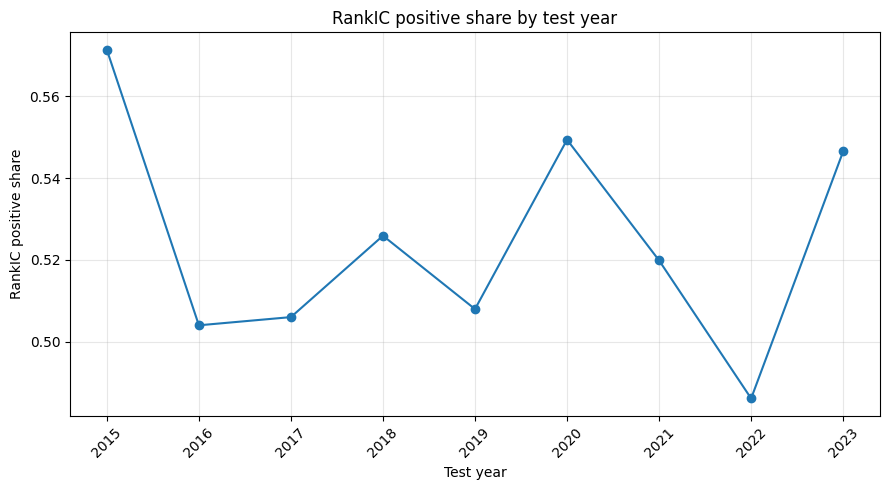

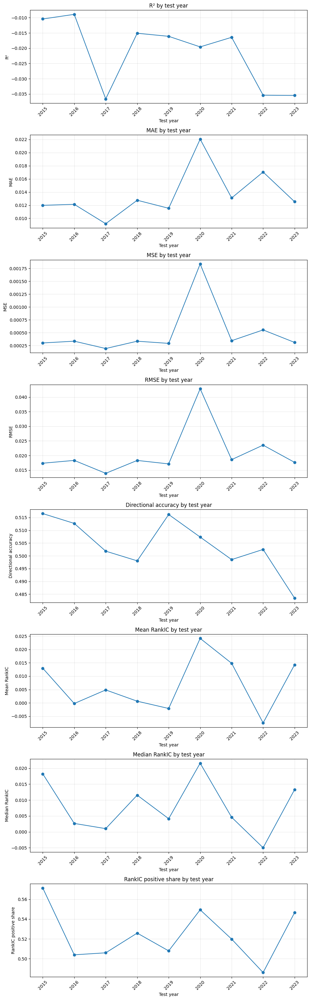

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,2015,2009,2013,0.011977,0.000301,0.017359,-0.010411,0.516548,0.012983,0.018251,0.571429,252,25200,-0.000067,-0.000180,0.017270,0.002499
1,2016,2010,2014,0.012132,0.000336,0.018318,-0.008903,0.512698,-0.000256,0.002646,0.503968,252,25200,0.000494,-0.000177,0.018237,0.002877
2,2017,2011,2015,0.009180,0.000193,0.013894,-0.036615,0.501833,0.004838,0.001008,0.505976,251,25100,0.000733,0.000328,0.013646,0.002521
3,2018,2012,2016,0.012753,0.000335,0.018310,-0.015095,0.498048,0.000618,0.011545,0.525896,251,25100,-0.000394,0.000311,0.018173,0.001950
4,2019,2013,2017,0.011530,0.000293,0.017117,-0.016100,0.516190,-0.002114,0.004131,0.507937,252,25200,0.000926,0.000808,0.016981,0.002166
5,2020,2014,2018,0.022045,0.001836,0.042845,-0.019561,0.507352,0.024174,0.021602,0.549407,253,25300,0.000101,-0.000403,0.042432,0.005217
6,2021,2015,2019,0.013100,0.000345,0.018582,-0.016425,0.498532,0.014835,0.004590,0.519841,252,25200,0.000893,-0.000721,0.018431,0.002116
7,2022,2016,2020,0.017044,0.000555,0.023549,-0.035398,0.502510,-0.007538,-0.005005,0.486056,251,25100,-0.000395,0.001617,0.023143,0.004149
8,2023,2017,2021,0.012527,0.000312,0.017651,-0.035481,0.483441,0.014289,0.013291,0.546559,247,24700,0.000455,-0.000950,0.017345,0.002893


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_val1y_test1y_timexer_base_price_only,test,0.013588,0.012527,0.003773,0.00918,0.022045,0.000501,0.000335,0.00051,...,0.027038,0.486056,0.571429,226100,25122.222222,2261,251.222222,2015,2023,9


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_directional_accuracy.png
rank_ic

In [ ]:
required_objects_for_val_price_only_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_price_only_rolling = [
    object_name
    for object_name in required_objects_for_val_price_only_rolling
    if object_name not in globals()
]

if missing_objects_for_val_price_only_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_price_only_rolling}')

rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=True,
    validation_years=1,
    step_years=1,
    date_column='target_date'
)

rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
    rolling_5y_val1y_test1y_config
)

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_price_only_experiment_name = 'rolling5y_val1y_test1y_timexer_base_price_only'
rolling_val_price_only_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_price_only_wandb_group = 'rolling5y_val1y_test1y_price_only'

rolling_val_price_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_price_only_experiment_name,
    text_mode='price_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'price_only',
        'baseline',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_price_only_base_config_dict['data']['text_mode'] = 'price_only'
rolling_val_price_only_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_price_only_base_config_dict['data']['pca_n_components'] = 32
rolling_val_price_only_base_config_dict['data']['use_embeddings'] = False
rolling_val_price_only_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_price_only_base_config_dict['data']['use_sector_sentiment'] = False
rolling_val_price_only_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_price_only_base_config_dict['data']['use_sector_embeddings'] = False
rolling_val_price_only_base_config_dict['data']['include_news_count'] = False
rolling_val_price_only_base_config_dict['data']['include_has_news'] = False
rolling_val_price_only_base_config_dict['data']['include_sentiment_score'] = False
rolling_val_price_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_price_only_base_config_dict['data']['dtype'] = 'float32'
rolling_val_price_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_price_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_price_only_base_config_dict['windows']['seq_len'] = 60
rolling_val_price_only_base_config_dict['windows']['pred_len'] = 1
rolling_val_price_only_base_config_dict['windows']['patch_len'] = 5
rolling_val_price_only_base_config_dict['windows']['window_stride'] = 1

rolling_val_price_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_price_only_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_price_only_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_price_only_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_price_only_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_price_only_base_config_dict['logging']['use_wandb'] = True
rolling_val_price_only_base_config_dict['logging']['wandb_project'] = rolling_val_price_only_wandb_project
rolling_val_price_only_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_price_only_base_config_dict['logging']['wandb_group'] = rolling_val_price_only_wandb_group
rolling_val_price_only_base_config_dict['logging']['wandb_run_name'] = rolling_val_price_only_experiment_name
rolling_val_price_only_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'price_only',
    'baseline',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_price_only_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_price_only_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_price_only_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_price_only_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_price_only_base_config_dict['logging']['log_model'] = False
rolling_val_price_only_base_config_dict['logging']['log_artifacts'] = False
rolling_val_price_only_base_config_dict['logging']['log_predictions'] = False
rolling_val_price_only_base_config_dict['logging']['log_metrics'] = True

rolling_val_price_only_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_price_only_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_price_only_experiment_name,
    wandb_project=rolling_val_price_only_wandb_project,
    wandb_group=rolling_val_price_only_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_price_only_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_price_only_result,
    split_name='test',
    save_outputs=True
)

rolling_val_price_only_all_metrics_df = (
    rolling_val_price_only_result['metrics_summary']
)

rolling_val_price_only_test_metrics_df = (
    rolling_val_price_only_collected_metrics['test_metrics']
)

rolling_val_price_only_aggregate_metrics_df = (
    rolling_val_price_only_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_price_only_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_price_only_split_counts = (
    rolling_val_price_only_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_price_only_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_price_only_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_price_only_test_metrics_short_df = (
    rolling_val_price_only_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_price_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_price_only_plots_dir = (
    Path(rolling_val_price_only_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_price_only_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_price_only_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_price_only_test_metrics_df,
    metrics=rolling_val_price_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_price_only_plots_dir,
    filename_prefix='rolling_val_price_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_price_only_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_price_only_test_metrics_df,
    metrics=rolling_val_price_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_price_only_plots_dir,
    filename='rolling_val_price_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_price_only_test_metrics_short_path = (
    Path(rolling_val_price_only_result['rolling_output_dir'])
    / 'rolling_val_price_only_test_metrics_short.csv'
)

rolling_val_price_only_test_metrics_short_df.to_csv(
    rolling_val_price_only_test_metrics_short_path,
    index=False
)

display(rolling_val_price_only_test_metrics_short_df)
display(rolling_val_price_only_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_price_only_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_price_only_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_price_only_test_metrics_short_path)

print('Output directory:')
print(rolling_val_price_only_result['rolling_output_dir'])

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆████
early_stopping/best_value,███▇▄▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▄▁▁▂▁▂▁▂▄▁▂▁▁▁▂▁▂▄▁▂▄▅▇█▁▂▄▅
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████████████████▃▃▃▃▃▃▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄▁▁██▁▁██▁▁██▁▁▁█▃█▁▇▁▁█▁▁▅█▂█
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▅▇▇▇▇▇▇██
early_stopping/best_value,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▁▂▃▅▆▁▁▂▁▂▃▅▁▂▃▅▆▇█▁▂▁▂▁▂▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████▄▄▄▄▄▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄▁▄▃▃▃▃▃▄▅▅▆▅▅▃▆▅▅▅▃▆▆█▇▆▃▇▅██
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▆▆▆▆▇▇██████
early_stopping/best_value,█▇▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▄▅▁▂▄▅▇▁▁▂▄▅▇█▁▁▂▄▁▂▁▁▂▄▅▇
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅▁▆██▁▄▁▁▁▁▇▇█████▆▇▃▆▆▁▇▅█▄▇▆
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▇▇▇▇███
early_stopping/best_value,█▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▃▁▁▁▁▃▁▃▅▁▁▃▁▁▃▅▆█▁▃▁▃▅▆▁▁▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████████████▃▃▃▃▃▃▃▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▁▁█▁▁█▁▁█▁▁█▁██▁█▁▁█▁▁▁████▅▁
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆██
early_stopping/best_value,█▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▁▂▃▅▆▇▁▁▂▃▁▂▃▅▁▂▃▅▆▇█▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅▁▁▁▁▁▁▁▁▁▁███▁▁▁▄▁██▂███████▆
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2020 | train 2014-2018 | test 2020-2020


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆▆▆▆█
early_stopping/best_value,██▆▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▁▁▂▃▁▂▁▁▂▃▅▆▇▁▁▂▃▅▁▁▂▃▅▆▇█▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████████▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▄██▁▁█▁▁▁▁▃█▁█▁▁▂▅▁▁▁▇▅▁▂▁▁▂▂▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2021 | train 2015-2019 | test 2021-2021


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇███
early_stopping/best_value,█▆▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▁▁▁▁▃▅▁▃▅▁▃▅▆█▁▁▃▅▆▁▃▁▃▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████████████▃▃▃▃▃▃▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▁▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▆█▃▇▆▇█▇▇▁▁▂▁█▇▁██▃▁▃███▆▇▆▇▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2022 | train 2016-2020 | test 2022-2022


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▇▇▇▇▇█████
early_stopping/best_value,██▆▅▅▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▃▁▁▃▁▁▃▁▁▃▅▆█▁▃▁▃▅▆▁▃▅▁▃▁▃▅▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅█▁▁██▁▁▁▇▁▁▁▁▁█▁▁▁█▄▃█▅▁▆▅▆██
+8,...


Running rolling5y_val1y_test1y_timexer_base_price_only | test_2023 | train 2017-2021 | test 2023-2023


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇█████
early_stopping/best_value,█▇▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▁▃▅▆▁▃▅▆█▁▃▁▁▃▅▆█▁▃▁▃▅▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████▄▄▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃▁▄▃▄█▃▂▄▅▃▂▂▅▂▃▂▃▄▅▂▁▃▄▅▆▅▅▃▄
+8,...


,count
split,
train,9
validation,9
test,9


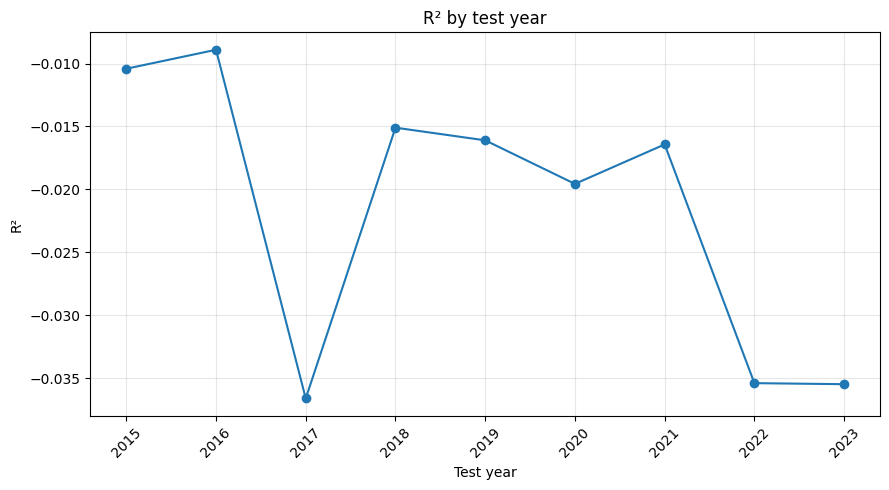

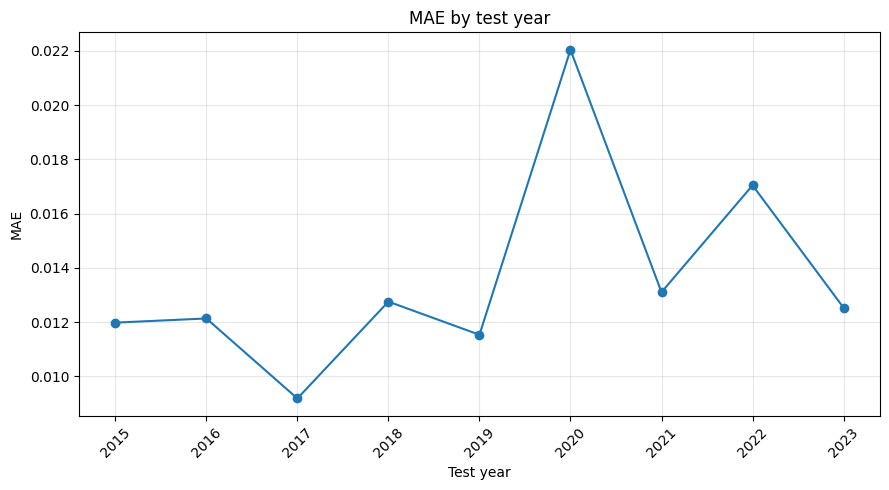

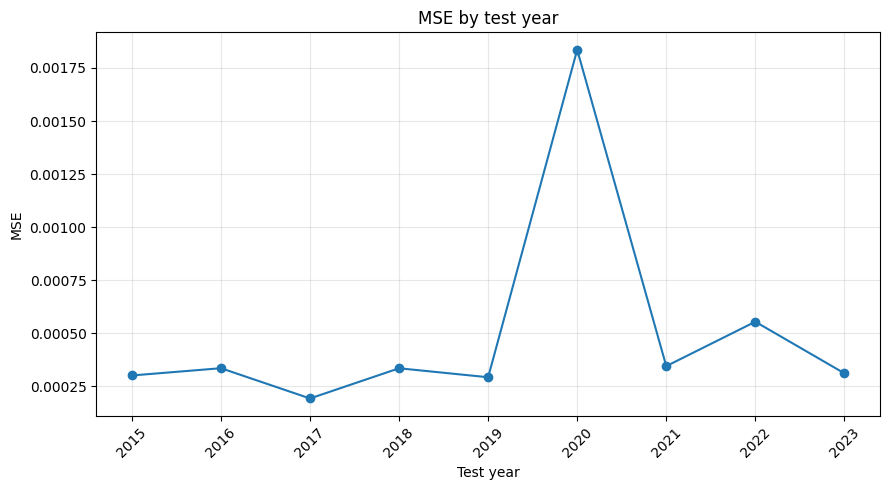

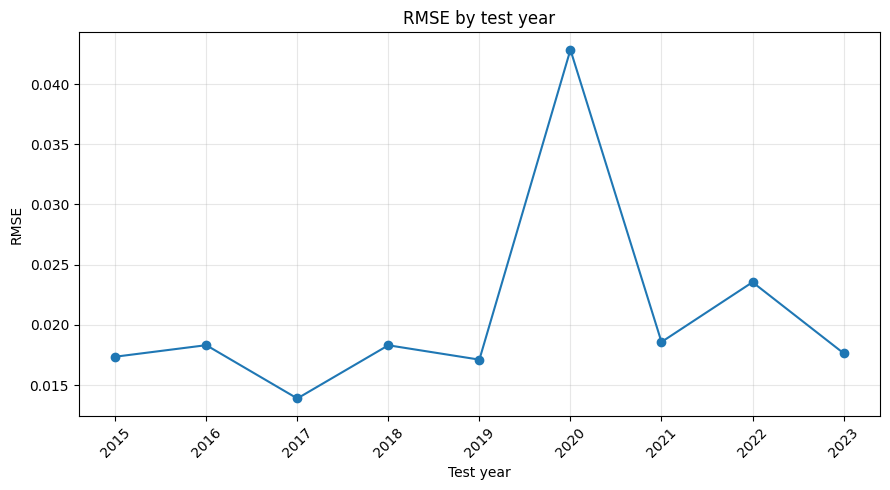

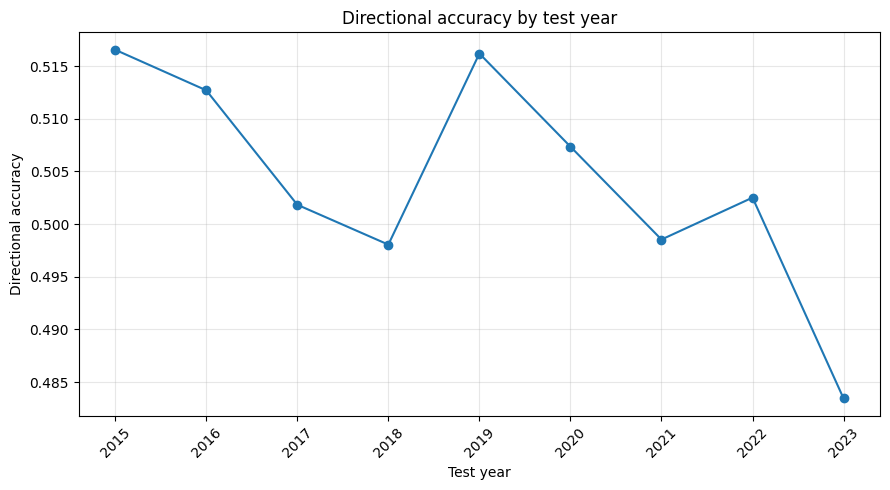

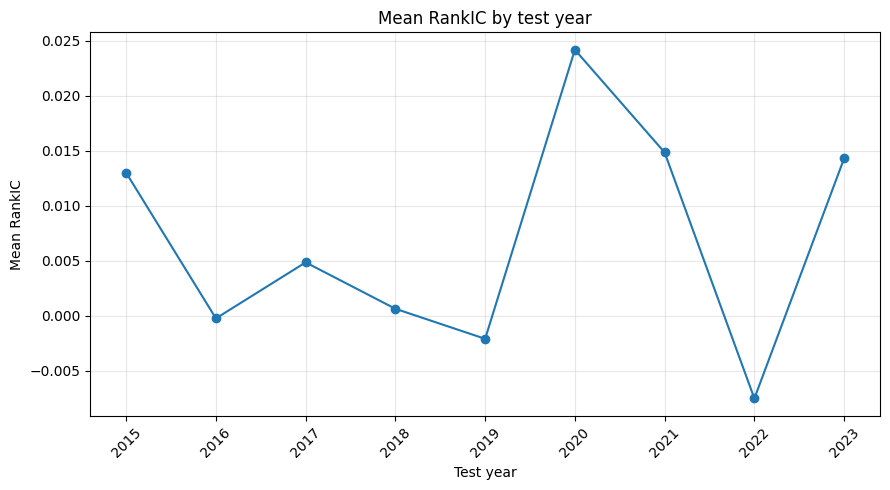

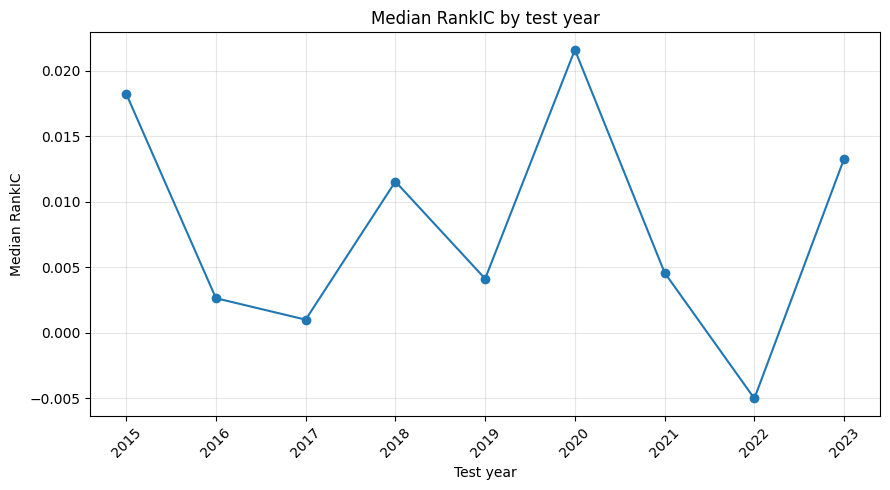

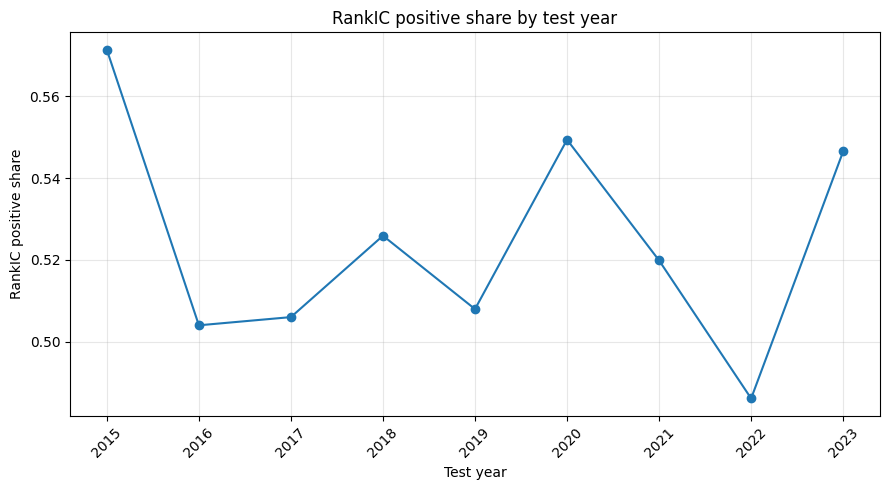

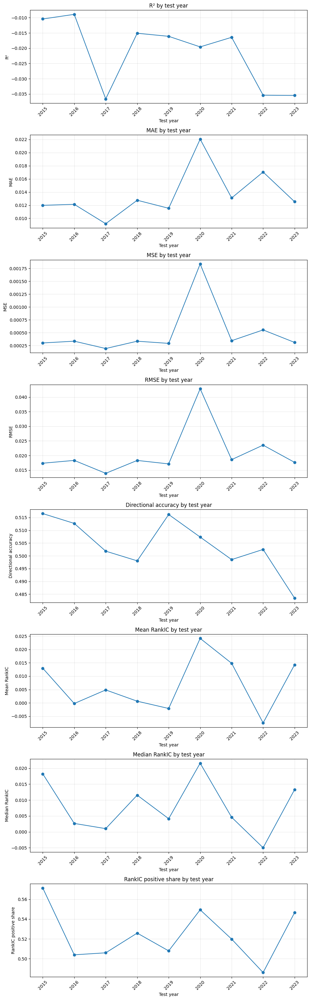

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,2015,2009,2013,0.011977,0.000301,0.017359,-0.010411,0.516548,0.012983,0.018251,0.571429,252,25200,-0.000067,-0.000180,0.017270,0.002499
1,2016,2010,2014,0.012132,0.000336,0.018318,-0.008903,0.512698,-0.000256,0.002646,0.503968,252,25200,0.000494,-0.000177,0.018237,0.002877
2,2017,2011,2015,0.009180,0.000193,0.013894,-0.036615,0.501833,0.004838,0.001008,0.505976,251,25100,0.000733,0.000328,0.013646,0.002521
3,2018,2012,2016,0.012753,0.000335,0.018310,-0.015095,0.498048,0.000618,0.011545,0.525896,251,25100,-0.000394,0.000311,0.018173,0.001950
4,2019,2013,2017,0.011530,0.000293,0.017117,-0.016100,0.516190,-0.002114,0.004131,0.507937,252,25200,0.000926,0.000808,0.016981,0.002166
5,2020,2014,2018,0.022045,0.001836,0.042845,-0.019561,0.507352,0.024174,0.021602,0.549407,253,25300,0.000101,-0.000403,0.042432,0.005217
6,2021,2015,2019,0.013100,0.000345,0.018582,-0.016425,0.498532,0.014835,0.004590,0.519841,252,25200,0.000893,-0.000721,0.018431,0.002116
7,2022,2016,2020,0.017044,0.000555,0.023549,-0.035398,0.502510,-0.007538,-0.005005,0.486056,251,25100,-0.000395,0.001617,0.023143,0.004149
8,2023,2017,2021,0.012527,0.000312,0.017651,-0.035481,0.483441,0.014289,0.013291,0.546559,247,24700,0.000455,-0.000950,0.017345,0.002893


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_val1y_test1y_timexer_base_price_only,test,0.013588,0.012527,0.003773,0.00918,0.022045,0.000501,0.000335,0.00051,...,0.027038,0.486056,0.571429,226100,25122.222222,2261,251.222222,2015,2023,9


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_price_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_price_only_test_directional_accuracy.png
rank_ic

In [ ]:
required_objects_for_val_price_only_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_price_only_rolling = [
    object_name
    for object_name in required_objects_for_val_price_only_rolling
    if object_name not in globals()
]

if missing_objects_for_val_price_only_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_price_only_rolling}')

rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=True,
    validation_years=1,
    step_years=1,
    date_column='target_date'
)

rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
    rolling_5y_val1y_test1y_config
)

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_price_only_experiment_name = 'rolling5y_val1y_test1y_timexer_base_price_only'
rolling_val_price_only_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_price_only_wandb_group = 'rolling5y_val1y_test1y_price_only'

rolling_val_price_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_price_only_experiment_name,
    text_mode='price_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'price_only',
        'baseline',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_price_only_base_config_dict['data']['text_mode'] = 'price_only'
rolling_val_price_only_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_price_only_base_config_dict['data']['pca_n_components'] = 32
rolling_val_price_only_base_config_dict['data']['use_embeddings'] = False
rolling_val_price_only_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_price_only_base_config_dict['data']['use_sector_sentiment'] = False
rolling_val_price_only_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_price_only_base_config_dict['data']['use_sector_embeddings'] = False
rolling_val_price_only_base_config_dict['data']['include_news_count'] = False
rolling_val_price_only_base_config_dict['data']['include_has_news'] = False
rolling_val_price_only_base_config_dict['data']['include_sentiment_score'] = False
rolling_val_price_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_price_only_base_config_dict['data']['dtype'] = 'float32'
rolling_val_price_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_price_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_price_only_base_config_dict['windows']['seq_len'] = 60
rolling_val_price_only_base_config_dict['windows']['pred_len'] = 1
rolling_val_price_only_base_config_dict['windows']['patch_len'] = 5
rolling_val_price_only_base_config_dict['windows']['window_stride'] = 1

rolling_val_price_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_price_only_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_price_only_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_price_only_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_price_only_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_price_only_base_config_dict['logging']['use_wandb'] = True
rolling_val_price_only_base_config_dict['logging']['wandb_project'] = rolling_val_price_only_wandb_project
rolling_val_price_only_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_price_only_base_config_dict['logging']['wandb_group'] = rolling_val_price_only_wandb_group
rolling_val_price_only_base_config_dict['logging']['wandb_run_name'] = rolling_val_price_only_experiment_name
rolling_val_price_only_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'price_only',
    'baseline',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_price_only_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_price_only_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_price_only_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_price_only_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_price_only_base_config_dict['logging']['log_model'] = False
rolling_val_price_only_base_config_dict['logging']['log_artifacts'] = False
rolling_val_price_only_base_config_dict['logging']['log_predictions'] = False
rolling_val_price_only_base_config_dict['logging']['log_metrics'] = True

rolling_val_price_only_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_price_only_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_price_only_experiment_name,
    wandb_project=rolling_val_price_only_wandb_project,
    wandb_group=rolling_val_price_only_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_price_only_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_price_only_result,
    split_name='test',
    save_outputs=True
)

rolling_val_price_only_all_metrics_df = (
    rolling_val_price_only_result['metrics_summary']
)

rolling_val_price_only_test_metrics_df = (
    rolling_val_price_only_collected_metrics['test_metrics']
)

rolling_val_price_only_aggregate_metrics_df = (
    rolling_val_price_only_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_price_only_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_price_only_split_counts = (
    rolling_val_price_only_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_price_only_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_price_only_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_price_only_test_metrics_short_df = (
    rolling_val_price_only_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_price_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_price_only_plots_dir = (
    Path(rolling_val_price_only_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_price_only_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_price_only_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_price_only_test_metrics_df,
    metrics=rolling_val_price_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_price_only_plots_dir,
    filename_prefix='rolling_val_price_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_price_only_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_price_only_test_metrics_df,
    metrics=rolling_val_price_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_price_only_plots_dir,
    filename='rolling_val_price_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_price_only_test_metrics_short_path = (
    Path(rolling_val_price_only_result['rolling_output_dir'])
    / 'rolling_val_price_only_test_metrics_short.csv'
)

rolling_val_price_only_test_metrics_short_df.to_csv(
    rolling_val_price_only_test_metrics_short_path,
    index=False
)

display(rolling_val_price_only_test_metrics_short_df)
display(rolling_val_price_only_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_price_only_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_price_only_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_price_only_test_metrics_short_path)

print('Output directory:')
print(rolling_val_price_only_result['rolling_output_dir'])

## rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32

In [ ]:
required_objects_for_val_sector_only_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_sector_only_rolling = [
    object_name
    for object_name in required_objects_for_val_sector_only_rolling
    if object_name not in globals()
]

if missing_objects_for_val_sector_only_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_sector_only_rolling}')

rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=True,
    validation_years=1,
    step_years=1,
    date_column='target_date'
)

rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
    rolling_5y_val1y_test1y_config
)

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_sector_only_experiment_name = 'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32'
rolling_val_sector_only_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_sector_only_wandb_group = 'rolling5y_val1y_test1y_sector_only_mean_pca32'

rolling_val_sector_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_sector_only_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'sector_only',
        'mean',
        'pca32',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_sector_only_base_config_dict['data']['text_mode'] = 'sector_only'
rolling_val_sector_only_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_sector_only_base_config_dict['data']['pca_n_components'] = 32
rolling_val_sector_only_base_config_dict['data']['use_embeddings'] = True
rolling_val_sector_only_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_sector_only_base_config_dict['data']['use_sector_sentiment'] = False
rolling_val_sector_only_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_sector_only_base_config_dict['data']['use_sector_embeddings'] = True
rolling_val_sector_only_base_config_dict['data']['include_news_count'] = True
rolling_val_sector_only_base_config_dict['data']['include_has_news'] = True
rolling_val_sector_only_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_sector_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_sector_only_base_config_dict['data']['dtype'] = 'float32'
rolling_val_sector_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_sector_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_sector_only_base_config_dict['windows']['seq_len'] = 60
rolling_val_sector_only_base_config_dict['windows']['pred_len'] = 1
rolling_val_sector_only_base_config_dict['windows']['patch_len'] = 5
rolling_val_sector_only_base_config_dict['windows']['window_stride'] = 1

rolling_val_sector_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_sector_only_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_sector_only_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_sector_only_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_sector_only_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_sector_only_base_config_dict['logging']['use_wandb'] = True
rolling_val_sector_only_base_config_dict['logging']['wandb_project'] = rolling_val_sector_only_wandb_project
rolling_val_sector_only_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_sector_only_base_config_dict['logging']['wandb_group'] = rolling_val_sector_only_wandb_group
rolling_val_sector_only_base_config_dict['logging']['wandb_run_name'] = rolling_val_sector_only_experiment_name
rolling_val_sector_only_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_only',
    'mean',
    'pca32',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_sector_only_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_sector_only_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_sector_only_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_sector_only_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_sector_only_base_config_dict['logging']['log_model'] = False
rolling_val_sector_only_base_config_dict['logging']['log_artifacts'] = False
rolling_val_sector_only_base_config_dict['logging']['log_predictions'] = False
rolling_val_sector_only_base_config_dict['logging']['log_metrics'] = True

rolling_val_sector_only_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_sector_only_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_sector_only_experiment_name,
    wandb_project=rolling_val_sector_only_wandb_project,
    wandb_group=rolling_val_sector_only_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_sector_only_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_sector_only_result,
    split_name='test',
    save_outputs=True
)

rolling_val_sector_only_all_metrics_df = (
    rolling_val_sector_only_result['metrics_summary']
)

rolling_val_sector_only_test_metrics_df = (
    rolling_val_sector_only_collected_metrics['test_metrics']
)

rolling_val_sector_only_aggregate_metrics_df = (
    rolling_val_sector_only_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_sector_only_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_sector_only_split_counts = (
    rolling_val_sector_only_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_sector_only_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_sector_only_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_sector_only_test_metrics_short_df = (
    rolling_val_sector_only_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_sector_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_sector_only_plots_dir = (
    Path(rolling_val_sector_only_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_sector_only_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_sector_only_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_sector_only_test_metrics_df,
    metrics=rolling_val_sector_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_only_plots_dir,
    filename_prefix='rolling_val_sector_only_mean_pca32_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_sector_only_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_sector_only_test_metrics_df,
    metrics=rolling_val_sector_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_only_plots_dir,
    filename='rolling_val_sector_only_mean_pca32_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_sector_only_test_metrics_short_path = (
    Path(rolling_val_sector_only_result['rolling_output_dir'])
    / 'rolling_val_sector_only_mean_pca32_test_metrics_short.csv'
)

rolling_val_sector_only_test_metrics_short_df.to_csv(
    rolling_val_sector_only_test_metrics_short_path,
    index=False
)

display(rolling_val_sector_only_test_metrics_short_df)
display(rolling_val_sector_only_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_sector_only_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_sector_only_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_sector_only_test_metrics_short_path)

print('Output directory:')
print(rolling_val_sector_only_result['rolling_output_dir'])

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2020 | train 2014-2018 | test 2020-2020


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2021 | train 2015-2019 | test 2021-2021


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2022 | train 2016-2020 | test 2022-2022


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▇▇█████████
early_stopping/best_value,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▄▁▂▃▄▁▁▂▃▄▅▁▂▃▁▂▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▆▁██▁▁▁▁▁▆▅▄▁▁▇▆██▃▂▆▁█▄███▇█
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2023 | train 2017-2021 | test 2023-2023


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

In [ ]:
import gc
import torch

try:
    import wandb

    if wandb.run is not None:
        wandb.finish()
except Exception:
    pass


objects_to_delete = [
    name
    for name in list(globals().keys())
    if (
        name.startswith('rolling_')
        or name.startswith('debug_')
        or name.endswith('_result')
        or name.endswith('_metrics_df')
        or name.endswith('_all_metrics_df')
        or name.endswith('_test_metrics_df')
        or name.endswith('_aggregate_metrics_df')
        or name.endswith('_collected_metrics')
        or name.endswith('_plot_outputs')
        or name.endswith('_panel_plot_output')
    )
]

objects_to_keep = {
    'rolling_5y_val1y_test1y_config',
    'rolling_5y_val1y_test1y_folds_df'
}

objects_to_delete = [
    name
    for name in objects_to_delete
    if name not in objects_to_keep
]

for name in objects_to_delete:
    try:
        del globals()[name]
    except Exception:
        pass


large_objects_to_delete_if_exist = [
    'model',
    'training_objects',
    'train_loader',
    'validation_loader',
    'val_loader',
    'test_loader',
    'dataloaders',
    'timexer_data',
    'experiment_panel',
    'prediction_table',
    'predictions_df',
    'train_predictions_df',
    'validation_predictions_df',
    'test_predictions_df'
]

for name in large_objects_to_delete_if_exist:
    if name in globals():
        try:
            del globals()[name]
        except Exception:
            pass


for _ in range(3):
    gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

print(f'Deleted objects: {len(objects_to_delete)}')

if torch.cuda.is_available():
    print('CUDA memory allocated, GB:', round(torch.cuda.memory_allocated() / 1024**3, 3))
    print('CUDA memory reserved, GB:', round(torch.cuda.memory_reserved() / 1024**3, 3))

Deleted objects: 52
CUDA memory allocated, GB: 0.017
CUDA memory reserved, GB: 0.041


In [ ]:
required_objects_for_val_sector_only_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_sector_only_rolling = [
    object_name
    for object_name in required_objects_for_val_sector_only_rolling
    if object_name not in globals()
]

if missing_objects_for_val_sector_only_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_sector_only_rolling}')

rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
    first_year=2009,
    last_year=2023,
    train_window_years=5,
    test_window_years=1,
    use_validation=True,
    validation_years=1,
    step_years=1,
    date_column='target_date'
)

rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
    rolling_5y_val1y_test1y_config
)

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_sector_only_experiment_name = 'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32'
rolling_val_sector_only_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_sector_only_wandb_group = 'rolling5y_val1y_test1y_sector_only_mean_pca32'

rolling_val_sector_only_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_sector_only_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=False,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'sector_only',
        'mean',
        'pca32',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_sector_only_base_config_dict['data']['text_mode'] = 'sector_only'
rolling_val_sector_only_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_sector_only_base_config_dict['data']['pca_n_components'] = 32
rolling_val_sector_only_base_config_dict['data']['use_embeddings'] = True
rolling_val_sector_only_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_sector_only_base_config_dict['data']['use_sector_sentiment'] = False
rolling_val_sector_only_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_sector_only_base_config_dict['data']['use_sector_embeddings'] = True
rolling_val_sector_only_base_config_dict['data']['include_news_count'] = True
rolling_val_sector_only_base_config_dict['data']['include_has_news'] = True
rolling_val_sector_only_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_sector_only_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_sector_only_base_config_dict['data']['dtype'] = 'float32'
rolling_val_sector_only_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_sector_only_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_sector_only_base_config_dict['windows']['seq_len'] = 60
rolling_val_sector_only_base_config_dict['windows']['pred_len'] = 1
rolling_val_sector_only_base_config_dict['windows']['patch_len'] = 5
rolling_val_sector_only_base_config_dict['windows']['window_stride'] = 1

rolling_val_sector_only_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_sector_only_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_sector_only_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_sector_only_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_sector_only_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_sector_only_base_config_dict['logging']['use_wandb'] = True
rolling_val_sector_only_base_config_dict['logging']['wandb_project'] = rolling_val_sector_only_wandb_project
rolling_val_sector_only_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_sector_only_base_config_dict['logging']['wandb_group'] = rolling_val_sector_only_wandb_group
rolling_val_sector_only_base_config_dict['logging']['wandb_run_name'] = rolling_val_sector_only_experiment_name
rolling_val_sector_only_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_only',
    'mean',
    'pca32',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
# rolling_val_sector_only_base_config_dict['logging']['log_batch_metrics'] = False
# rolling_val_sector_only_base_config_dict['logging']['log_epoch_metrics'] = True
# rolling_val_sector_only_base_config_dict['logging']['log_predictions_table'] = False
# rolling_val_sector_only_base_config_dict['logging']['log_model_artifact'] = False
# rolling_val_sector_only_base_config_dict['logging']['log_model'] = False
# rolling_val_sector_only_base_config_dict['logging']['log_artifacts'] = False
# rolling_val_sector_only_base_config_dict['logging']['log_predictions'] = False
# rolling_val_sector_only_base_config_dict['logging']['log_metrics'] = True
rolling_val_sector_only_base_config_dict['training']['num_workers'] = 0
rolling_val_sector_only_base_config_dict['training']['batch_size'] = 16
rolling_val_sector_only_base_config_dict['training']['fallback_batch_size'] = 8

rolling_val_sector_only_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_sector_only_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_sector_only_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_sector_only_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_sector_only_base_config_dict['logging']['log_model'] = False
rolling_val_sector_only_base_config_dict['logging']['log_artifacts'] = False
rolling_val_sector_only_base_config_dict['logging']['log_predictions'] = False
rolling_val_sector_only_base_config_dict['logging']['log_metrics'] = True

rolling_val_sector_only_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_sector_only_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_sector_only_experiment_name,
    wandb_project=rolling_val_sector_only_wandb_project,
    wandb_group=rolling_val_sector_only_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_sector_only_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_sector_only_result,
    split_name='test',
    save_outputs=True
)

rolling_val_sector_only_all_metrics_df = (
    rolling_val_sector_only_result['metrics_summary']
)

rolling_val_sector_only_test_metrics_df = (
    rolling_val_sector_only_collected_metrics['test_metrics']
)

rolling_val_sector_only_aggregate_metrics_df = (
    rolling_val_sector_only_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_sector_only_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_sector_only_split_counts = (
    rolling_val_sector_only_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_sector_only_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_sector_only_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_sector_only_test_metrics_short_df = (
    rolling_val_sector_only_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_sector_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_sector_only_plots_dir = (
    Path(rolling_val_sector_only_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_sector_only_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_sector_only_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_sector_only_test_metrics_df,
    metrics=rolling_val_sector_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_only_plots_dir,
    filename_prefix='rolling_val_sector_only_mean_pca32_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_sector_only_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_sector_only_test_metrics_df,
    metrics=rolling_val_sector_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_only_plots_dir,
    filename='rolling_val_sector_only_mean_pca32_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_sector_only_test_metrics_short_path = (
    Path(rolling_val_sector_only_result['rolling_output_dir'])
    / 'rolling_val_sector_only_mean_pca32_test_metrics_short.csv'
)

rolling_val_sector_only_test_metrics_short_df.to_csv(
    rolling_val_sector_only_test_metrics_short_path,
    index=False
)

display(rolling_val_sector_only_test_metrics_short_df)
display(rolling_val_sector_only_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_sector_only_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_sector_only_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_sector_only_test_metrics_short_path)

print('Output directory:')
print(rolling_val_sector_only_result['rolling_output_dir'])

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▂▃▃▃▄▄▄▅▅▅▅▅▅▆▇▇▇▇████████
early_stopping/best_value,█▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▃▁▁▁▁▁▁▂▁▂▁▂▃▄▁▁▁▂▃▁▂▃▄▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████████▄▄▄▄▄▄▄▄▄▂▂▂▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▅▁█▁█▁█▁█▁█▁█▁▁██▇▅█▂▆▇▃███▃▇
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆███
early_stopping/best_value,█▆▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▂▃▅▁▂▃▅▆▁▁▂▁▂▃▅▆▁▂▃▅▆▇█▁▂▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▄▂▂▃▁▁▄▄▁▃▃▆▅▄▄▃▅▆▄▆▅▄▄▄▄▄█▇▇
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▇▇▇▇▇▇█
early_stopping/best_value,██▇▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▃▁▁▁▃▅▆▁▁▃▅▆▁▁▃▅▆▁▃▅▆▁▁▁▃▅▆█▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇███▃▁▁▁▂▃▁█▁▂▂▁▂▁▄▂█▂█▅▆▇▅▇▄▆
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▂▂▄▄▅▅▅▅▅▅▅▇▇▇▇███████
early_stopping/best_value,██▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▁▂▁▂▃▅▆▁▁▁▂▃▅▆▇█▁▂▁▂▁▁▂▃▅▆▇
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▁▁██▇▁▁▁██▁▃▁█▁███▇▁▂▁▃▅▄▇▇▂▇
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆████
early_stopping/best_value,█▆▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▁▂▄▅▁▂▄▁▂▄▁▁▂▄▅▁▂▄▅▇█▁▂▄▅
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▂▂▇██▂▂▂█▂▂▂▂▂▂▃▂█▇▅▅▇▁▁▆▄▆█▄
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2020 | train 2014-2018 | test 2020-2020


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▃▃▃▅▅▅▅▆▆▆▆██████████████
early_stopping/best_value,██▆▆▆▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▂▂▁▂▂▁▂▂▃▁▂▂▃▁▂▂▃▃▄▄▅▅▆▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃▁▁███▁▁▁███▆▁▆▁▆▁▂▆▁▂▂▁▁▁▁▁▁▁
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2021 | train 2015-2019 | test 2021-2021


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇████
early_stopping/best_value,█▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▃▁▃▅▆▁▃▅▁▃▅▆▁▃▅▆█▁▃▅▆▁▃▅▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁
train/loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▅▆▂▁█▇▇██▁▇▁██▁▁█▄▆▃▂▂▇▇▇▆▅▅▅▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2022 | train 2016-2020 | test 2022-2022


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▆▆█████████
early_stopping/best_value,█▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▂▁▂▃▄▁▁▂▁▂▃▁▂▃▄▅▁▂▃▄▅▅▆▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇█▆▁▁█▁██▁▁▁██▁▁▂▁▁█▁▅▅▂▁█▂▃▂▂
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32 | test_2023 | train 2017-2021 | test 2023-2023


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▅▅▇▇███
early_stopping/best_value,█▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▂▃▃▁▂▃▃▁▂▃▁▂▃▃▄▅▆▆▇█▁▁▁▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████▄▄▄▄▃▃▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃▅▁▄▄▅▅▅▇▄▄▄▅▅▄█▄▆▅▅▅▄▅▄▄▇▆▅▆▇
+8,...


NameError: name 'make_rolling_test_metrics_df' is not defined

,count
split,
train,9
validation,9
test,9


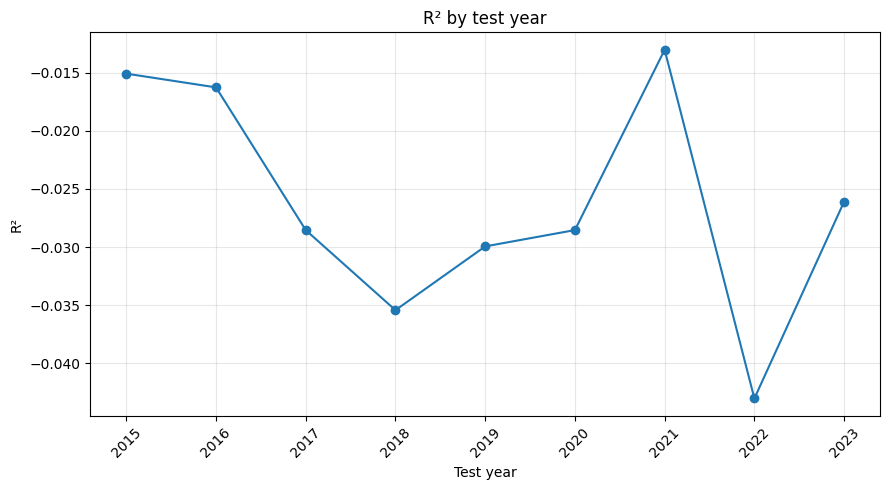

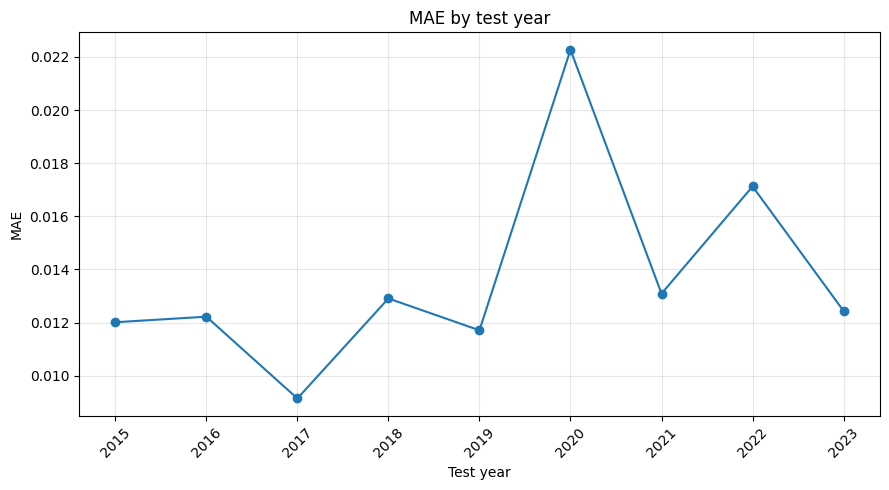

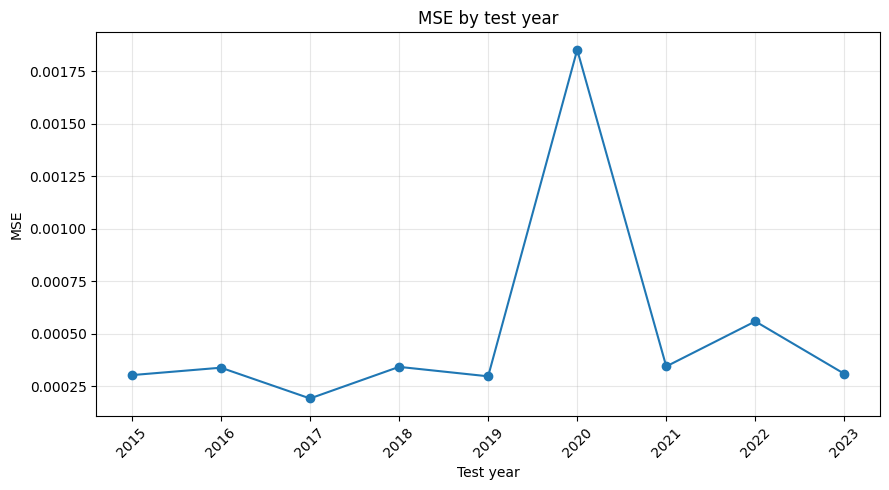

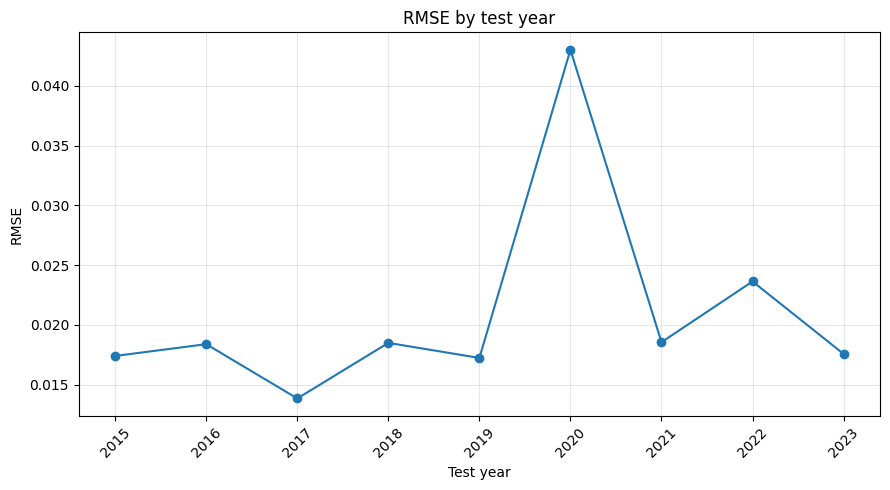

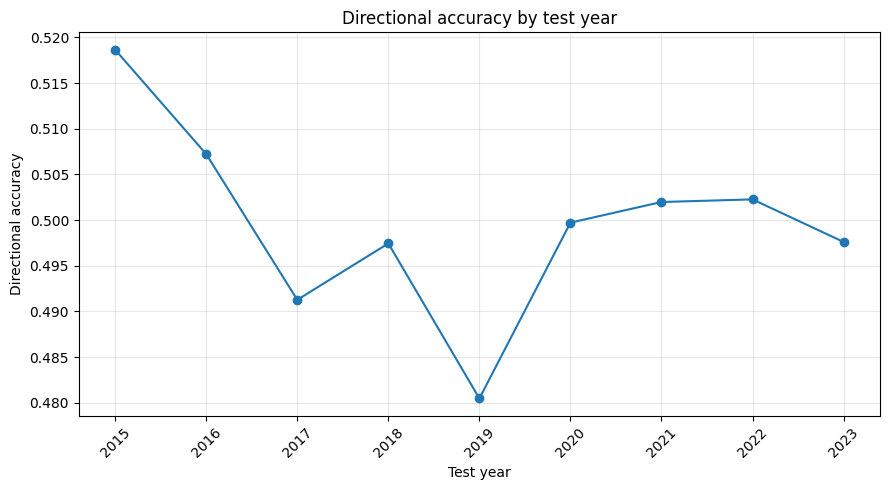

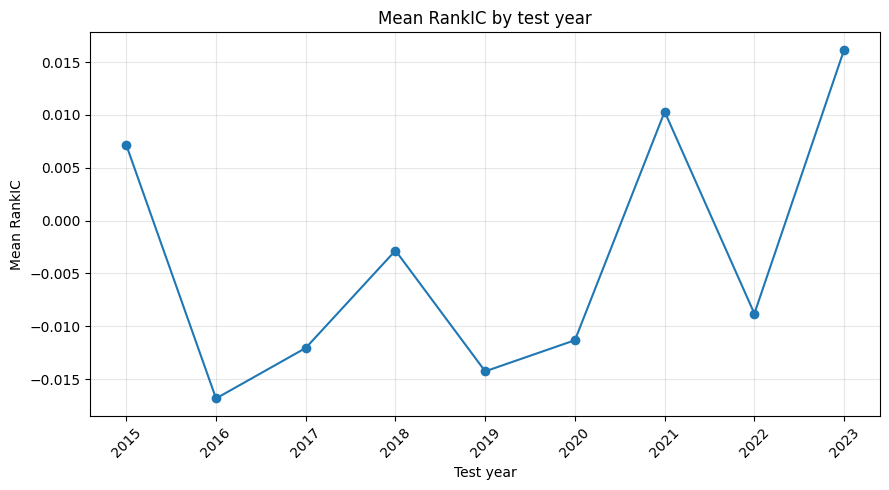

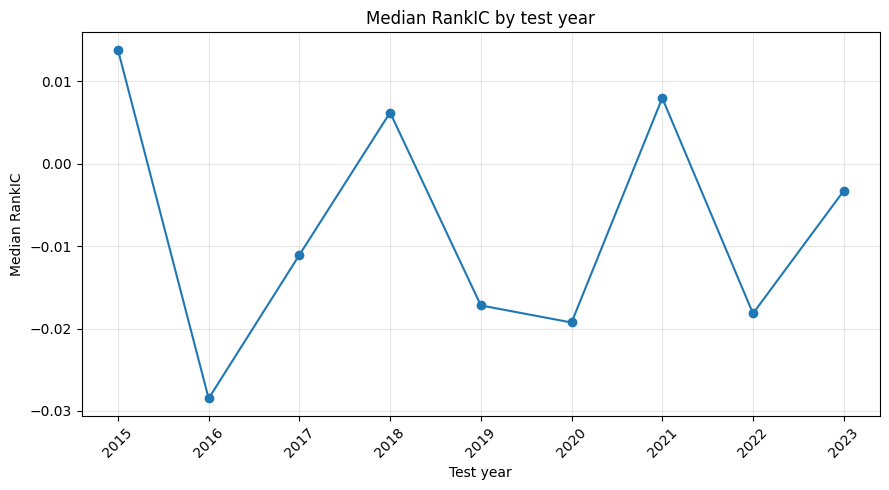

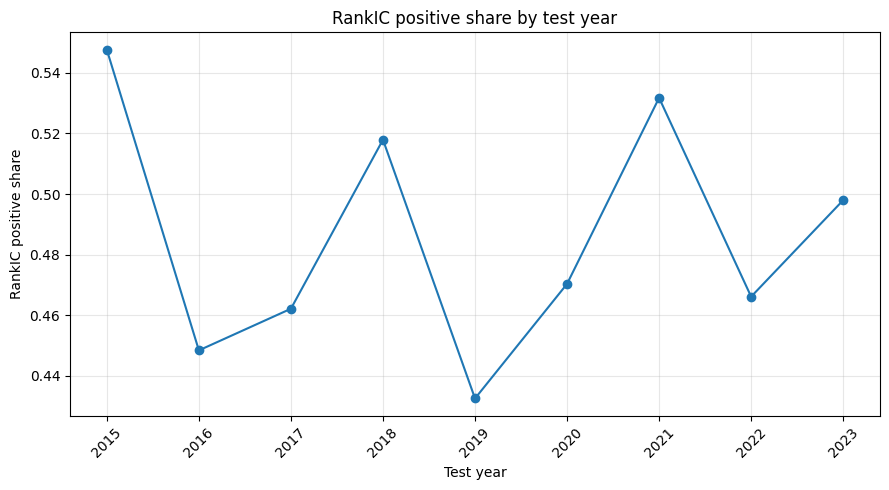

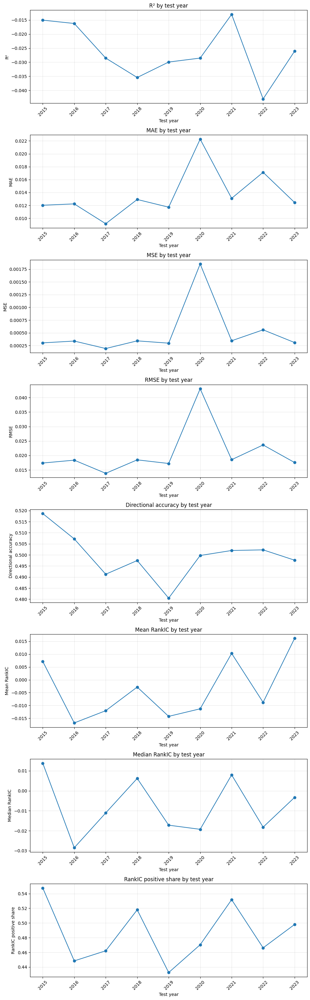

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,2015,2009,2013,0.012015,0.000303,0.017399,-0.015079,0.518651,0.007155,0.013825,0.547619,252,25200,-0.000067,0.000624,0.017270,0.002783
1,2016,2010,2014,0.012224,0.000338,0.018385,-0.016260,0.507222,-0.016820,-0.028479,0.448413,252,25200,0.000494,0.000146,0.018237,0.003085
2,2017,2011,2015,0.009146,0.000192,0.013839,-0.028538,0.491275,-0.012043,-0.011065,0.462151,251,25100,0.000733,-0.000263,0.013646,0.001911
3,2018,2012,2016,0.012910,0.000342,0.018492,-0.035423,0.497450,-0.002828,0.006211,0.517928,251,25100,-0.000394,0.001278,0.018173,0.002815
4,2019,2013,2017,0.011711,0.000297,0.017233,-0.029938,0.480476,-0.014254,-0.017192,0.432540,252,25200,0.000926,-0.000281,0.016981,0.002285
5,2020,2014,2018,0.022269,0.001852,0.043033,-0.028534,0.499723,-0.011310,-0.019262,0.470356,253,25300,0.000101,0.002542,0.042432,0.006137
6,2021,2015,2019,0.013090,0.000344,0.018551,-0.013026,0.501984,0.010305,0.007972,0.531746,252,25200,0.000893,0.000316,0.018431,0.002191
7,2022,2016,2020,0.017126,0.000559,0.023635,-0.043018,0.502271,-0.008796,-0.018170,0.466135,251,25100,-0.000395,0.001982,0.023143,0.004450
8,2023,2017,2021,0.012439,0.000309,0.017570,-0.026089,0.497611,0.016162,-0.003288,0.497976,247,24700,0.000455,0.000072,0.017345,0.002840


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_val1y_test1y_timexer_base_sector_onl...,test,0.013659,0.012439,0.003832,0.009146,0.022269,0.000504,0.000338,0.000515,...,0.039578,0.43254,0.547619,226100,25122.222222,2261,251.222222,2015,2023,9


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_only_mean_pca32_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_only_mean_pca32_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_only_mean_pca32_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_only_mean_pca32_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32/r

In [ ]:
rolling_val_sector_only_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_sector_only_result,
    split_name='test',
    save_outputs=True
)

rolling_val_sector_only_all_metrics_df = (
    rolling_val_sector_only_result['metrics_summary']
)

rolling_val_sector_only_test_metrics_df = (
    rolling_val_sector_only_collected_metrics['test_metrics']
)

rolling_val_sector_only_aggregate_metrics_df = (
    rolling_val_sector_only_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_sector_only_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_sector_only_split_counts = (
    rolling_val_sector_only_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_sector_only_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_sector_only_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_sector_only_test_metrics_short_df = (
    rolling_val_sector_only_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_sector_only_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_sector_only_plots_dir = (
    Path(rolling_val_sector_only_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_sector_only_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_sector_only_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_sector_only_test_metrics_df,
    metrics=rolling_val_sector_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_only_plots_dir,
    filename_prefix='rolling_val_sector_only_mean_pca32_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_sector_only_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_sector_only_test_metrics_df,
    metrics=rolling_val_sector_only_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_only_plots_dir,
    filename='rolling_val_sector_only_mean_pca32_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_sector_only_test_metrics_short_path = (
    Path(rolling_val_sector_only_result['rolling_output_dir'])
    / 'rolling_val_sector_only_mean_pca32_test_metrics_short.csv'
)

rolling_val_sector_only_test_metrics_short_df.to_csv(
    rolling_val_sector_only_test_metrics_short_path,
    index=False
)

display(rolling_val_sector_only_test_metrics_short_df)
display(rolling_val_sector_only_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_sector_only_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_sector_only_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_sector_only_test_metrics_short_path)

print('Output directory:')
print(rolling_val_sector_only_result['rolling_output_dir'])

## rolling5y_val1y_test1y_timexer_base_sector_sentiment_only

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▇▇▇██
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▅▁▂▁▂▃▅▆▇█▁▁▂▁▂▃▅▆▇█▁▁▂▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▂▂██▁▅█▃▁▁██▁█▇▂▃▅▃█▁█▇▂▄▄▅▃▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▆▆▆▇▇▇▇▇█
early_stopping/best_value,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▂▁▁▂▃▄▅▁▂▃▄▅▅▆▇█▁▂▃▁▂▃▄▅▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃▁▆▅▄▄▄▅▄▂▄▄█▄▂▂▄▂▄▄▁▄▇▆▅▆▆▅▆▃
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▁▁▁▃▃▃▃▃▃▃▅▅▅▅▆▆▆▆▇▇▇▇▇████
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▃▅▆█▁▃▁▃▅▆█▁▃▅▆▁▃▅▆▁▁▃▅▆▁▃▅▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,███▁██▁▁▁▁█▁▁▆▁▁▁▃▂▂▁▃▇▁▃█▆▅▃▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇███
early_stopping/best_value,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▃▁▁▁▁▃▆▁▃▆▁▃▆▁▃▆█▁▁▃▆█▁▃▁▃▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████████████▃▃▃▃▃▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁██▁██▁██▁██▁██▁▁▁█▁█▂▁▁▁█▂▆█▄
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇██████
early_stopping/best_value,█▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▁▂▄▅▁▁▁▁▁▂▄▁▂▄▁▂▄▅▁▂▄▁▂▄▅▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████▄▄▄▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▁█▁▁█▁▁▁▁▁▁▁▁▆██▄▁▁█▂▁▂▅▂████
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2020 | train 2014-2018 | test 2020-2020


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▅▅▅████
early_stopping/best_value,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▁▂▁▁▁▂▃▃▁▂▃▁▂▃▃▄▅▆▆▇█▁▂▃▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▇█▁██▁██████▃▁▁▄▁█▁▁▁▁▁▁▁▃▂▃▂
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2021 | train 2015-2019 | test 2021-2021


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▂▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇█████
early_stopping/best_value,██▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▃▁▃▆▁▃▆█▁▁▃▆█▁▃▁▃▁▃▁▁▃▁▃▁▁▃▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▁▂▁▂▂▁▁▁▁▇▇▁▇▇▇▅▂█▇▇▇▇▆▇▆█▆▇▂
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2022 | train 2016-2020 | test 2022-2022


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▆▆▇▇██████
early_stopping/best_value,██▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▁▁▁▂▁▂▄▅▁▁▁▂▄▅▁▂▄▅▇▁▂▁▂▄▅▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▁▁▁▁▁▁▁▁▁▁▇█▇▁▁▁▇▇▇██▆███▇▇██
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2023 | train 2017-2021 | test 2023-2023


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▃▄▄▄▄▄▄▆▆▆▆█████████████
early_stopping/best_value,███▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▂▁▂▂▁▁▁▂▂▃▃▁▂▂▃▁▂▂▃▃▄▅▅▆▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▄▃▂▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▄▃▂▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▆▃▁▃▅▆▆▅█▂▅▃▄▅▃▃▃▄▄▄▃▃▃▃▃▄▄▃▄
+8,...


,count
split,
train,9
validation,9
test,9


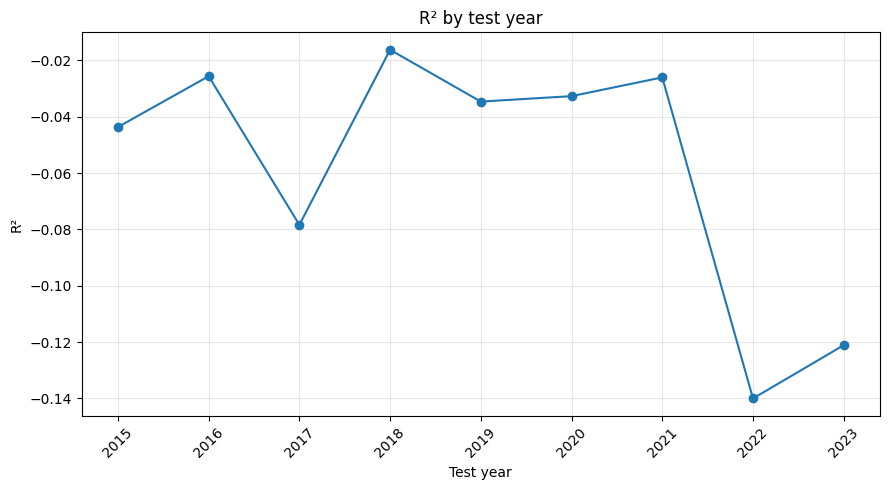

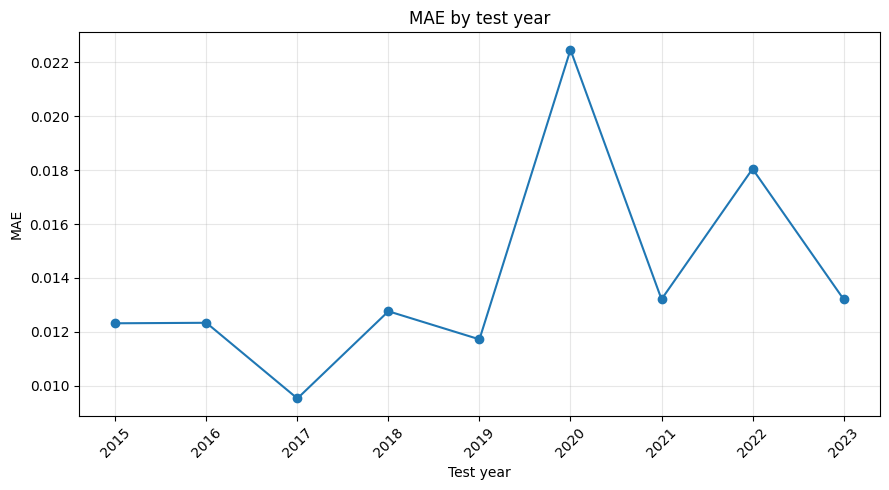

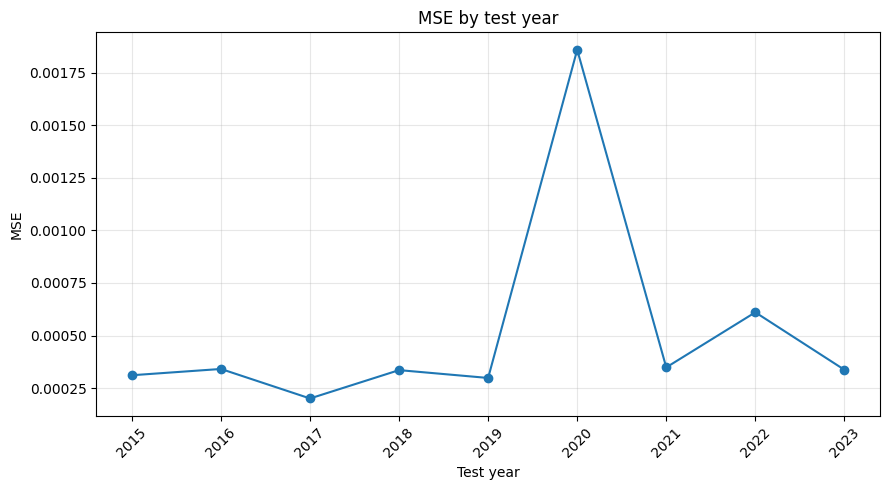

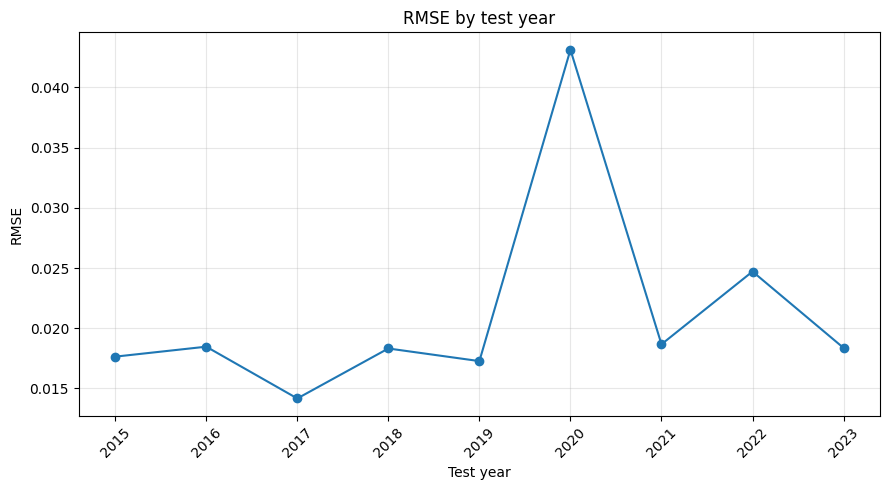

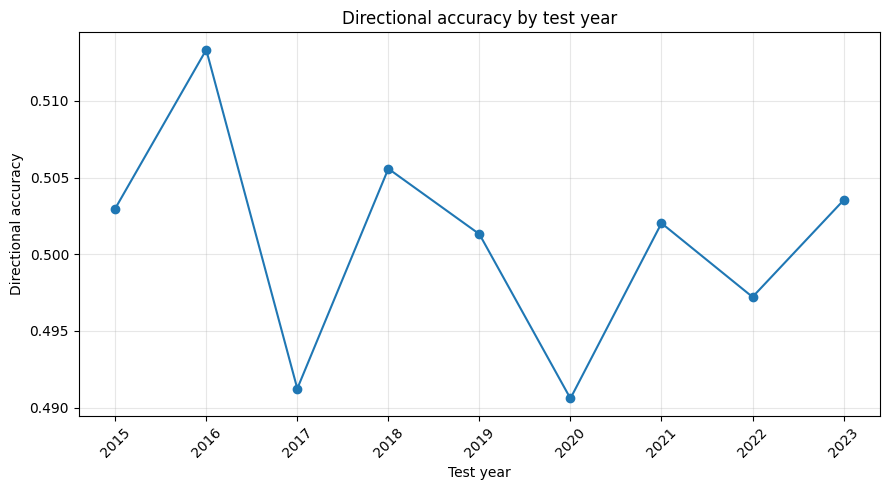

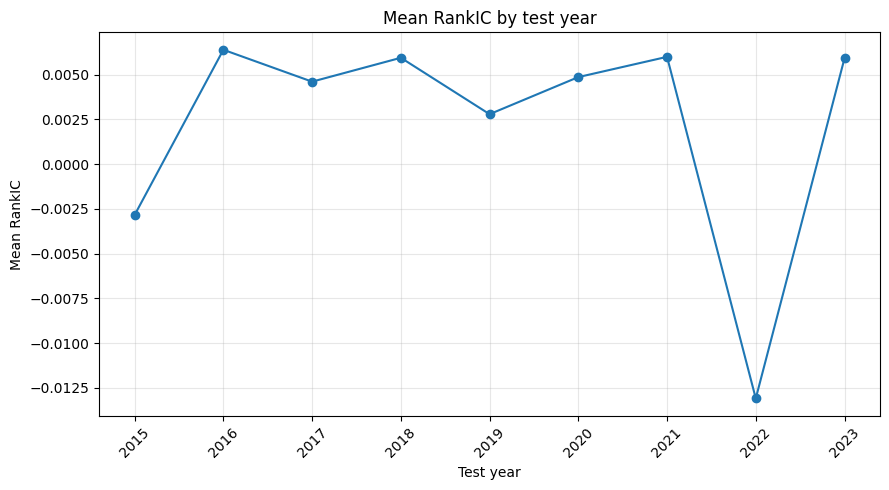

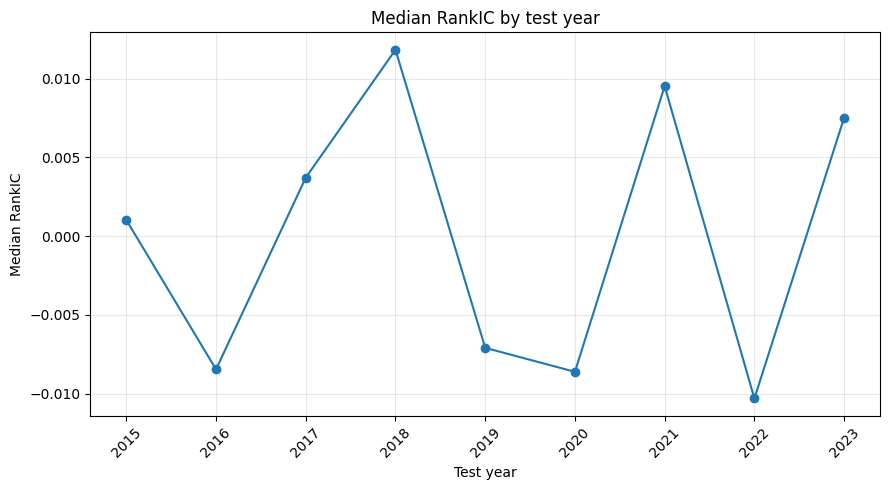

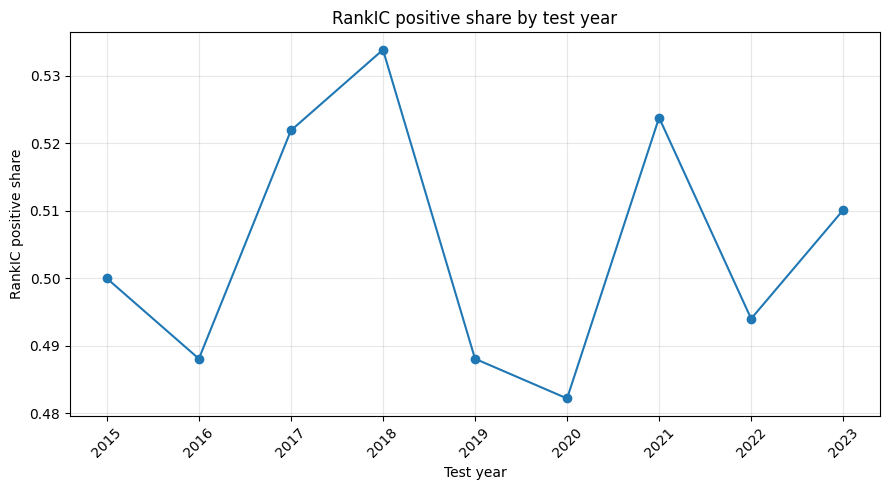

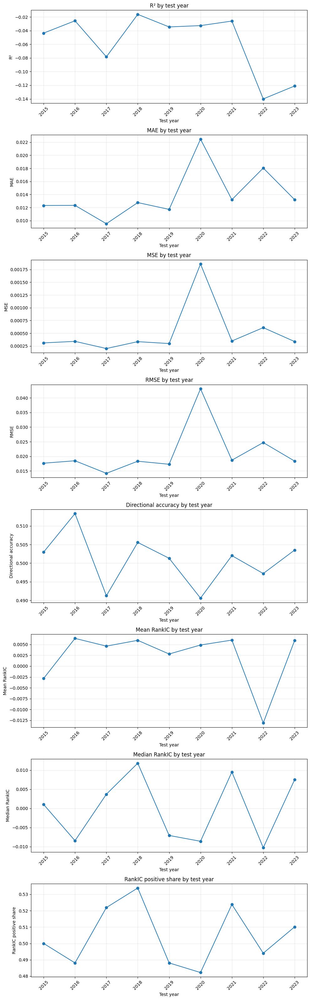

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,2015,2009,2013,0.012313,0.000311,0.017642,-0.043638,0.502976,-0.002840,0.001032,0.500000,252,25200,-0.000067,-0.000107,0.017270,0.003880
1,2016,2010,2014,0.012332,0.000341,0.018469,-0.025604,0.513333,0.006388,-0.008461,0.488095,252,25200,0.000494,0.000164,0.018237,0.003759
2,2017,2011,2015,0.009522,0.000201,0.014171,-0.078373,0.491235,0.004606,0.003714,0.521912,251,25100,0.000733,-0.000827,0.013646,0.003511
3,2018,2012,2016,0.012760,0.000336,0.018320,-0.016210,0.505578,0.005941,0.011839,0.533865,251,25100,-0.000394,0.000558,0.018173,0.002335
4,2019,2013,2017,0.011717,0.000298,0.017272,-0.034606,0.501310,0.002790,-0.007093,0.488095,252,25200,0.000926,-0.000012,0.016981,0.003072
5,2020,2014,2018,0.022470,0.001859,0.043119,-0.032675,0.490593,0.004861,-0.008617,0.482213,253,25300,0.000101,-0.000969,0.042432,0.006816
6,2021,2015,2019,0.013205,0.000349,0.018669,-0.026018,0.502024,0.005993,0.009532,0.523810,252,25200,0.000893,-0.000586,0.018431,0.002954
7,2022,2016,2020,0.018048,0.000611,0.024710,-0.140006,0.497211,-0.013092,-0.010309,0.494024,251,25100,-0.000395,0.005751,0.023143,0.005945
8,2023,2017,2021,0.013208,0.000337,0.018366,-0.121094,0.503522,0.005911,0.007519,0.510121,247,24700,0.000455,0.003251,0.017345,0.005157


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_val1y_test1y_timexer_base_sector_sen...,test,0.013953,0.01276,0.003902,0.009522,0.02247,0.000516,0.000337,0.000515,...,0.018488,0.482213,0.533865,226100,25122.222222,2261,251.222222,2015,2023,9


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_ye

In [ ]:
required_objects_for_val_sector_sentiment_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_sector_sentiment_rolling = [
    object_name
    for object_name in required_objects_for_val_sector_sentiment_rolling
    if object_name not in globals()
]

if missing_objects_for_val_sector_sentiment_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_sector_sentiment_rolling}')

if 'rolling_5y_val1y_test1y_folds_df' not in globals():
    rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=True,
        validation_years=1,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
        rolling_5y_val1y_test1y_config
    )

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_sector_sentiment_experiment_name = 'rolling5y_val1y_test1y_timexer_base_sector_sentiment_only'
rolling_val_sector_sentiment_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_sector_sentiment_wandb_group = 'rolling5y_val1y_test1y_sector_sentiment_only'

rolling_val_sector_sentiment_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_sector_sentiment_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'sector_sentiment_only',
        'sentiment_only',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_sector_sentiment_base_config_dict['data']['text_mode'] = 'sector_only'
rolling_val_sector_sentiment_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_sector_sentiment_base_config_dict['data']['pca_n_components'] = 32
rolling_val_sector_sentiment_base_config_dict['data']['use_embeddings'] = False
rolling_val_sector_sentiment_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_sector_sentiment_base_config_dict['data']['use_sector_sentiment'] = True
rolling_val_sector_sentiment_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_sector_sentiment_base_config_dict['data']['use_sector_embeddings'] = False
rolling_val_sector_sentiment_base_config_dict['data']['include_news_count'] = True
rolling_val_sector_sentiment_base_config_dict['data']['include_has_news'] = True
rolling_val_sector_sentiment_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_sector_sentiment_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_sector_sentiment_base_config_dict['data']['dtype'] = 'float32'
rolling_val_sector_sentiment_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_sector_sentiment_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_sector_sentiment_base_config_dict['windows']['seq_len'] = 60
rolling_val_sector_sentiment_base_config_dict['windows']['pred_len'] = 1
rolling_val_sector_sentiment_base_config_dict['windows']['patch_len'] = 5
rolling_val_sector_sentiment_base_config_dict['windows']['window_stride'] = 1

rolling_val_sector_sentiment_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_sector_sentiment_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_sector_sentiment_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_sector_sentiment_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_sector_sentiment_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_sector_sentiment_base_config_dict['logging']['use_wandb'] = True
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_project'] = rolling_val_sector_sentiment_wandb_project
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_group'] = rolling_val_sector_sentiment_wandb_group
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_run_name'] = rolling_val_sector_sentiment_experiment_name
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_sentiment_only',
    'sentiment_only',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_sector_sentiment_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_sector_sentiment_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_model'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_artifacts'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_predictions'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_metrics'] = True

rolling_val_sector_sentiment_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_sector_sentiment_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_sector_sentiment_experiment_name,
    wandb_project=rolling_val_sector_sentiment_wandb_project,
    wandb_group=rolling_val_sector_sentiment_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_sector_sentiment_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_sector_sentiment_result,
    split_name='test',
    save_outputs=True
)

rolling_val_sector_sentiment_all_metrics_df = (
    rolling_val_sector_sentiment_result['metrics_summary']
)

rolling_val_sector_sentiment_test_metrics_df = (
    rolling_val_sector_sentiment_collected_metrics['test_metrics']
)

rolling_val_sector_sentiment_aggregate_metrics_df = (
    rolling_val_sector_sentiment_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_sector_sentiment_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_sector_sentiment_split_counts = (
    rolling_val_sector_sentiment_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_sector_sentiment_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_sector_sentiment_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_sector_sentiment_test_metrics_short_df = (
    rolling_val_sector_sentiment_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_sector_sentiment_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_sector_sentiment_plots_dir = (
    Path(rolling_val_sector_sentiment_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_sector_sentiment_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_sector_sentiment_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_sector_sentiment_test_metrics_df,
    metrics=rolling_val_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_sentiment_plots_dir,
    filename_prefix='rolling_val_sector_sentiment_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_sector_sentiment_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_sector_sentiment_test_metrics_df,
    metrics=rolling_val_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_sentiment_plots_dir,
    filename='rolling_val_sector_sentiment_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_sector_sentiment_test_metrics_short_path = (
    Path(rolling_val_sector_sentiment_result['rolling_output_dir'])
    / 'rolling_val_sector_sentiment_only_test_metrics_short.csv'
)

rolling_val_sector_sentiment_test_metrics_short_df.to_csv(
    rolling_val_sector_sentiment_test_metrics_short_path,
    index=False
)

display(rolling_val_sector_sentiment_test_metrics_short_df)
display(rolling_val_sector_sentiment_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_sector_sentiment_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_sector_sentiment_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_sector_sentiment_test_metrics_short_path)

print('Output directory:')
print(rolling_val_sector_sentiment_result['rolling_output_dir'])

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▇▇▇██
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▃▅▁▂▁▂▃▅▆▇█▁▁▂▁▂▃▅▆▇█▁▁▂▁▂
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████▄▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,█▂▂██▁▅█▃▁▁██▁█▇▂▃▅▃█▁█▇▂▄▄▅▃▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▆▆▆▇▇▇▇▇█
early_stopping/best_value,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▁▂▁▁▂▃▄▅▁▂▃▄▅▅▆▇█▁▂▃▁▂▃▄▅▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▃▁▆▅▄▄▄▅▄▂▄▄█▄▂▂▄▂▄▄▁▄▇▆▅▆▆▅▆▃
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▁▁▁▃▃▃▃▃▃▃▅▅▅▅▆▆▆▆▇▇▇▇▇████
early_stopping/best_value,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▃▅▆█▁▃▁▃▅▆█▁▃▅▆▁▃▅▆▁▁▃▅▆▁▃▅▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,███▁██▁▁▁▁█▁▁▆▁▁▁▃▂▂▁▃▇▁▃█▆▅▃▅
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇███
early_stopping/best_value,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▃▁▁▁▁▃▆▁▃▆▁▃▆▁▃▆█▁▁▃▆█▁▃▁▃▆
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████████████▃▃▃▃▃▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁██▁██▁██▁██▁██▁▁▁█▁█▂▁▁▁█▂▆█▄
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇██████
early_stopping/best_value,█▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▁▂▄▅▁▁▁▁▁▂▄▁▂▄▁▂▄▅▁▂▄▁▂▄▅▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████▄▄▄▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▂▁█▁▁█▁▁▁▁▁▁▁▁▆██▄▁▁█▂▁▂▅▂████
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2020 | train 2014-2018 | test 2020-2020


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▅▅▅████
early_stopping/best_value,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▂▁▁▂▁▁▁▂▃▃▁▂▃▁▂▃▃▄▅▆▆▇█▁▂▃▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▇█▁██▁██████▃▁▁▄▁█▁▁▁▁▁▁▁▃▂▃▂
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2021 | train 2015-2019 | test 2021-2021


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▂▂▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇█████
early_stopping/best_value,██▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▃▁▃▆▁▃▆█▁▁▃▆█▁▃▁▃▁▃▁▁▃▁▃▁▁▃▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▁▁▂▁▂▂▁▁▁▁▇▇▁▇▇▇▅▂█▇▇▇▇▆▇▆█▆▇▂
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2022 | train 2016-2020 | test 2022-2022


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▆▆▇▇██████
early_stopping/best_value,██▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▁▁▁▁▂▁▂▄▅▁▁▁▂▄▅▁▂▄▅▇▁▂▁▂▄▅▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████▄▄▄▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▁▁▁▁▁▁▁▁▁▁▇█▇▁▁▁▇▇▇██▆███▇▇██
+8,...


Running rolling5y_val1y_test1y_timexer_base_sector_sentiment_only | test_2023 | train 2017-2021 | test 2023-2023


/tmp/ipykernel_14312/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_14312/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_14312/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for re

early_stopping/best_epoch,▁▁▁▂▂▂▃▄▄▄▄▄▄▆▆▆▆█████████████
early_stopping/best_value,███▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▂▂▁▂▂▁▁▁▂▂▃▃▁▂▂▃▁▂▂▃▃▄▅▅▆▆▇▇█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,███████████▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▄▄▃▂▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▄▄▃▂▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▆▃▁▃▅▆▆▅█▂▅▃▄▅▃▃▃▄▄▄▃▃▃▃▃▄▄▃▄
+8,...


,count
split,
train,9
validation,9
test,9


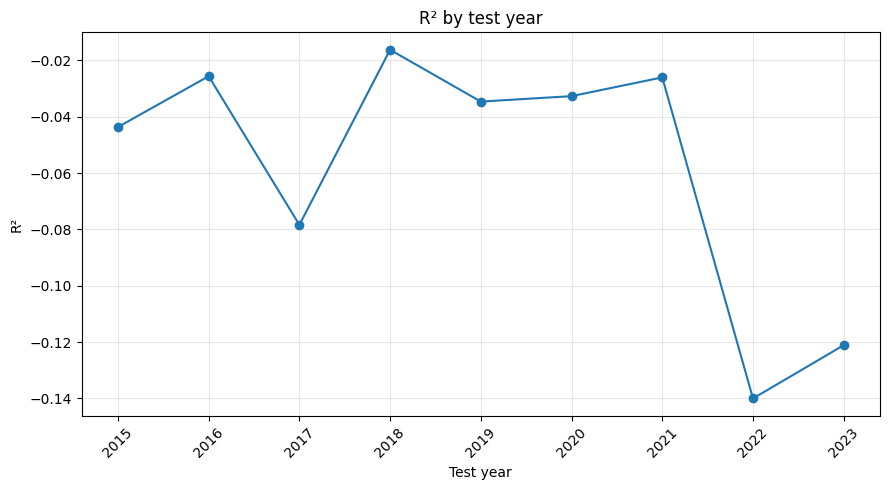

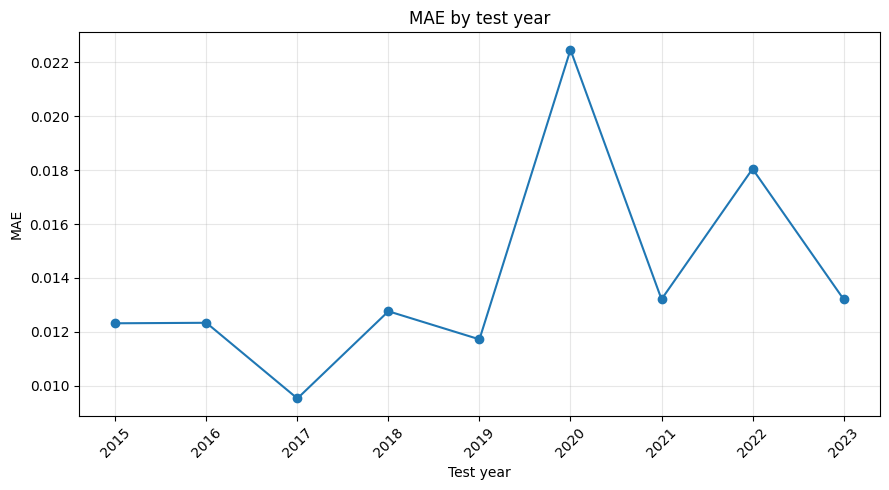

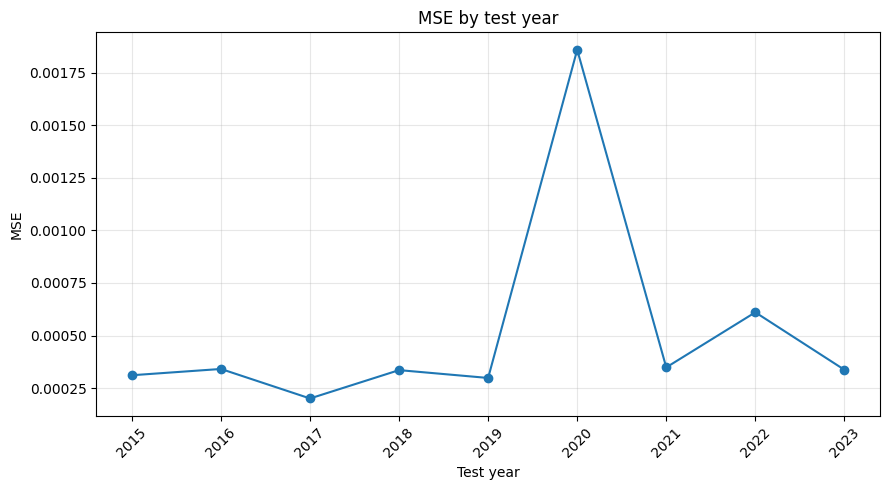

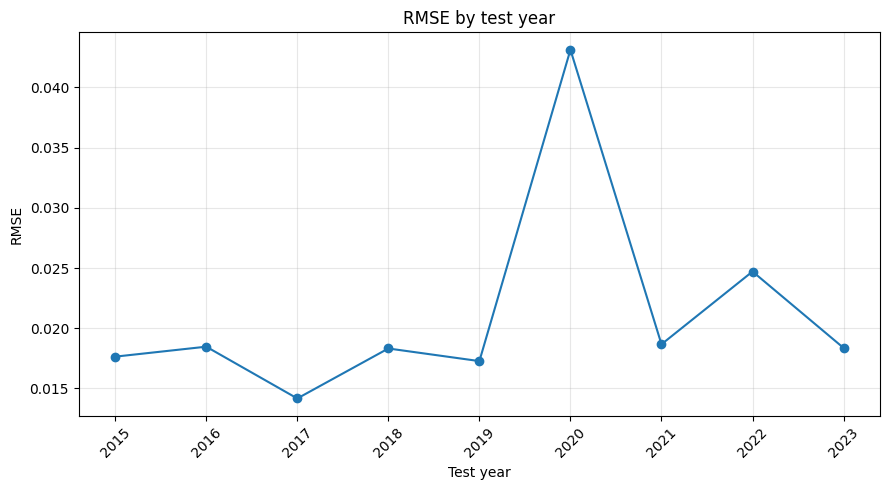

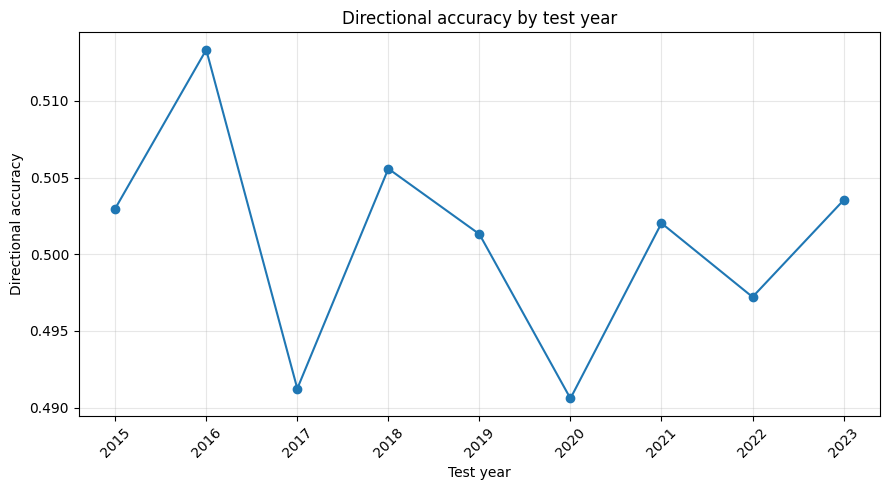

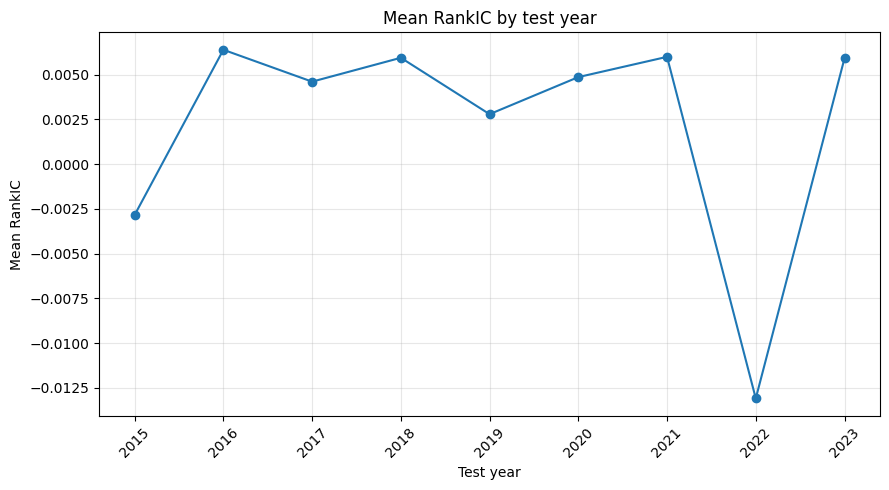

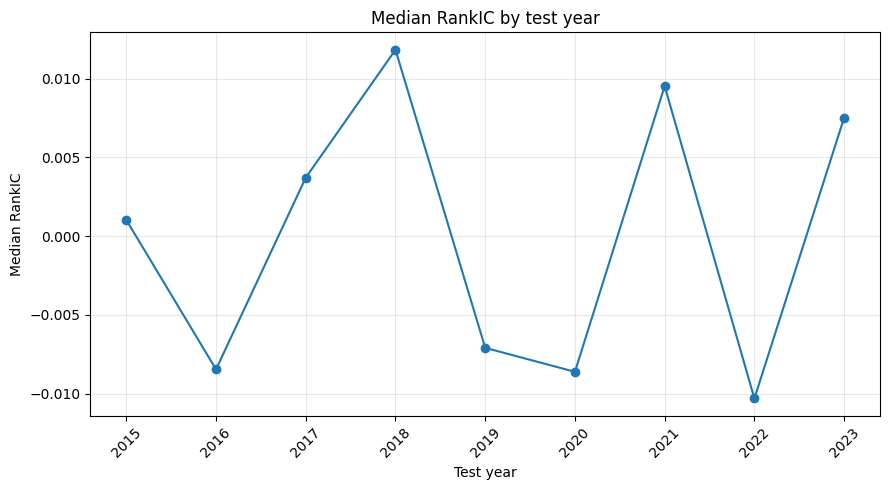

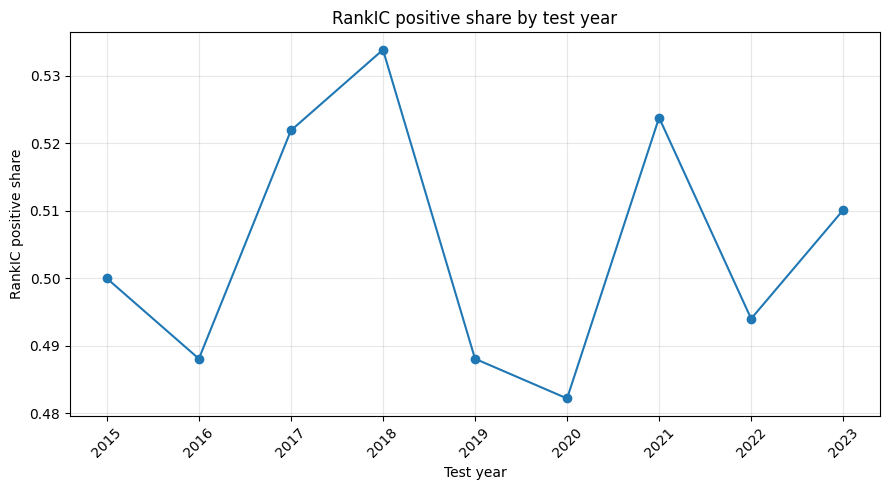

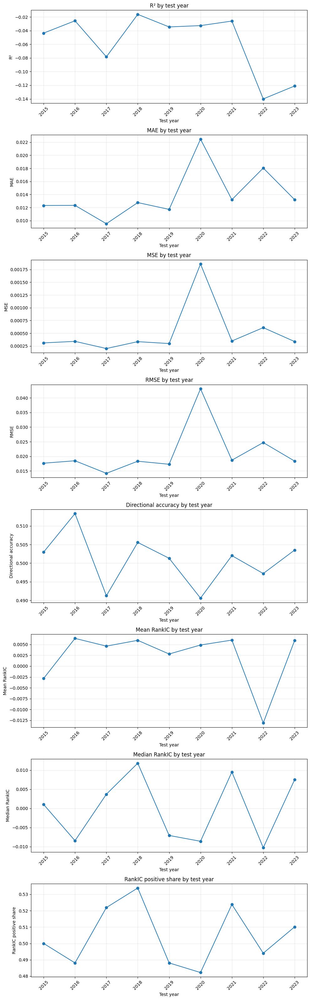

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred
0,2015,2009,2013,0.012313,0.000311,0.017642,-0.043638,0.502976,-0.002840,0.001032,0.500000,252,25200,-0.000067,-0.000107,0.017270,0.003880
1,2016,2010,2014,0.012332,0.000341,0.018469,-0.025604,0.513333,0.006388,-0.008461,0.488095,252,25200,0.000494,0.000164,0.018237,0.003759
2,2017,2011,2015,0.009522,0.000201,0.014171,-0.078373,0.491235,0.004606,0.003714,0.521912,251,25100,0.000733,-0.000827,0.013646,0.003511
3,2018,2012,2016,0.012760,0.000336,0.018320,-0.016210,0.505578,0.005941,0.011839,0.533865,251,25100,-0.000394,0.000558,0.018173,0.002335
4,2019,2013,2017,0.011717,0.000298,0.017272,-0.034606,0.501310,0.002790,-0.007093,0.488095,252,25200,0.000926,-0.000012,0.016981,0.003072
5,2020,2014,2018,0.022470,0.001859,0.043119,-0.032675,0.490593,0.004861,-0.008617,0.482213,253,25300,0.000101,-0.000969,0.042432,0.006816
6,2021,2015,2019,0.013205,0.000349,0.018669,-0.026018,0.502024,0.005993,0.009532,0.523810,252,25200,0.000893,-0.000586,0.018431,0.002954
7,2022,2016,2020,0.018048,0.000611,0.024710,-0.140006,0.497211,-0.013092,-0.010309,0.494024,251,25100,-0.000395,0.005751,0.023143,0.005945
8,2023,2017,2021,0.013208,0.000337,0.018366,-0.121094,0.503522,0.005911,0.007519,0.510121,247,24700,0.000455,0.003251,0.017345,0.005157


,rolling_experiment_name,split,mae_mean,mae_median,mae_std,mae_min,mae_max,mse_mean,mse_median,mse_std,...,rank_ic_positive_share_std,rank_ic_positive_share_min,rank_ic_positive_share_max,n_obs_total,n_obs_mean,rank_ic_n_dates_total,rank_ic_n_dates_mean,first_test_year,last_test_year,n_test_years
0,rolling5y_val1y_test1y_timexer_base_sector_sen...,test,0.013953,0.01276,0.003902,0.009522,0.02247,0.000516,0.000337,0.000515,...,0.018488,0.482213,0.533865,226100,25122.222222,2261,251.222222,2015,2023,9


Saved individual plots:
r2 -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_r2.png
mae -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_mae.png
mse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_mse.png
rmse -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_year_backtest/plots/test_metrics_by_year/rolling_val_sector_sentiment_only_test_rmse.png
directional_accuracy -> /content/fnspid_timexer_project/metrics_outputs/rolling5y_val1y_test1y_timexer_base_sector_sentiment_only/rolling_ye

In [ ]:
required_objects_for_val_sector_sentiment_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_sector_sentiment_rolling = [
    object_name
    for object_name in required_objects_for_val_sector_sentiment_rolling
    if object_name not in globals()
]

if missing_objects_for_val_sector_sentiment_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_sector_sentiment_rolling}')

if 'rolling_5y_val1y_test1y_folds_df' not in globals():
    rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=True,
        validation_years=1,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
        rolling_5y_val1y_test1y_config
    )

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_sector_sentiment_experiment_name = 'rolling5y_val1y_test1y_timexer_base_sector_sentiment_only'
rolling_val_sector_sentiment_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_sector_sentiment_wandb_group = 'rolling5y_val1y_test1y_sector_sentiment_only'

rolling_val_sector_sentiment_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_sector_sentiment_experiment_name,
    text_mode='sector_only',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=False,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'sector_sentiment_only',
        'sentiment_only',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_sector_sentiment_base_config_dict['data']['text_mode'] = 'sector_only'
rolling_val_sector_sentiment_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_sector_sentiment_base_config_dict['data']['pca_n_components'] = 32
rolling_val_sector_sentiment_base_config_dict['data']['use_embeddings'] = False
rolling_val_sector_sentiment_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_sector_sentiment_base_config_dict['data']['use_sector_sentiment'] = True
rolling_val_sector_sentiment_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_sector_sentiment_base_config_dict['data']['use_sector_embeddings'] = False
rolling_val_sector_sentiment_base_config_dict['data']['include_news_count'] = True
rolling_val_sector_sentiment_base_config_dict['data']['include_has_news'] = True
rolling_val_sector_sentiment_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_sector_sentiment_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_sector_sentiment_base_config_dict['data']['dtype'] = 'float32'
rolling_val_sector_sentiment_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_sector_sentiment_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_sector_sentiment_base_config_dict['windows']['seq_len'] = 60
rolling_val_sector_sentiment_base_config_dict['windows']['pred_len'] = 1
rolling_val_sector_sentiment_base_config_dict['windows']['patch_len'] = 5
rolling_val_sector_sentiment_base_config_dict['windows']['window_stride'] = 1

rolling_val_sector_sentiment_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_sector_sentiment_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_sector_sentiment_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_sector_sentiment_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_sector_sentiment_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_sector_sentiment_base_config_dict['logging']['use_wandb'] = True
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_project'] = rolling_val_sector_sentiment_wandb_project
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_group'] = rolling_val_sector_sentiment_wandb_group
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_run_name'] = rolling_val_sector_sentiment_experiment_name
rolling_val_sector_sentiment_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'sector_sentiment_only',
    'sentiment_only',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_sector_sentiment_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_sector_sentiment_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_model'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_artifacts'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_predictions'] = False
rolling_val_sector_sentiment_base_config_dict['logging']['log_metrics'] = True

rolling_val_sector_sentiment_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_sector_sentiment_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_sector_sentiment_experiment_name,
    wandb_project=rolling_val_sector_sentiment_wandb_project,
    wandb_group=rolling_val_sector_sentiment_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_sector_sentiment_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_sector_sentiment_result,
    split_name='test',
    save_outputs=True
)

rolling_val_sector_sentiment_all_metrics_df = (
    rolling_val_sector_sentiment_result['metrics_summary']
)

rolling_val_sector_sentiment_test_metrics_df = (
    rolling_val_sector_sentiment_collected_metrics['test_metrics']
)

rolling_val_sector_sentiment_aggregate_metrics_df = (
    rolling_val_sector_sentiment_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_sector_sentiment_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_sector_sentiment_split_counts = (
    rolling_val_sector_sentiment_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_sector_sentiment_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_sector_sentiment_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_sector_sentiment_test_metrics_short_df = (
    rolling_val_sector_sentiment_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_sector_sentiment_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_sector_sentiment_plots_dir = (
    Path(rolling_val_sector_sentiment_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_sector_sentiment_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_sector_sentiment_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_sector_sentiment_test_metrics_df,
    metrics=rolling_val_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_sentiment_plots_dir,
    filename_prefix='rolling_val_sector_sentiment_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_sector_sentiment_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_sector_sentiment_test_metrics_df,
    metrics=rolling_val_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_sector_sentiment_plots_dir,
    filename='rolling_val_sector_sentiment_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_sector_sentiment_test_metrics_short_path = (
    Path(rolling_val_sector_sentiment_result['rolling_output_dir'])
    / 'rolling_val_sector_sentiment_only_test_metrics_short.csv'
)

rolling_val_sector_sentiment_test_metrics_short_df.to_csv(
    rolling_val_sector_sentiment_test_metrics_short_path,
    index=False
)

display(rolling_val_sector_sentiment_test_metrics_short_df)
display(rolling_val_sector_sentiment_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_sector_sentiment_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_sector_sentiment_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_sector_sentiment_test_metrics_short_path)

print('Output directory:')
print(rolling_val_sector_sentiment_result['rolling_output_dir'])

## Статзначимости

In [ ]:
import re
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
from scipy import stats


PREDICTIONS_ROOT = Path('/content/fnspid_timexer_project/predictions_outputs')

MODEL_DIR_PREFIXES = {
    'price_only': 'rolling5y_val1y_test1y_timexer_base_price_only',
    'sector_only_mean_pca32': 'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32',
    'sector_sentiment_only': 'rolling5y_val1y_test1y_timexer_base_sector_sentiment_only'
}


def find_prediction_files_for_model(
    predictions_root,
    dir_prefix,
    filename='predictions_test.parquet'
):
    predictions_root = Path(predictions_root)

    if not predictions_root.exists():
        raise FileNotFoundError(f'Папка не найдена: {predictions_root}')

    matched_files = []

    for path in sorted(predictions_root.glob(f'{dir_prefix}_test_*/{filename}')):
        year_match = re.search(r'_test_(\d{4})', str(path.parent.name))

        if year_match is None:
            continue

        matched_files.append(
            {
                'test_year': int(year_match.group(1)),
                'path': path
            }
        )

    files_df = pd.DataFrame(matched_files)

    if files_df.empty:
        raise FileNotFoundError(
            f'Не найдены файлы {filename} для prefix={dir_prefix} '
            f'в папке {predictions_root}'
        )

    files_df = (
        files_df
        .sort_values('test_year')
        .reset_index(drop=True)
    )

    return files_df


def find_first_existing_column(columns, candidates):
    columns = list(columns)
    lower_to_original = {str(column).lower(): column for column in columns}

    for candidate in candidates:
        if candidate in columns:
            return candidate

    for candidate in candidates:
        candidate_lower = str(candidate).lower()
        if candidate_lower in lower_to_original:
            return lower_to_original[candidate_lower]

    return None


def standardize_prediction_df(raw_df, model_name, test_year_from_path):
    df = raw_df.copy()

    date_col = find_first_existing_column(
        df.columns,
        [
            'target_date',
            'date',
            'ds',
            'timestamp',
            'prediction_date',
            'forecast_date'
        ]
    )

    ticker_col = find_first_existing_column(
        df.columns,
        [
            'ticker',
            'unique_id',
            'symbol',
            'stock_symbol',
            'Stock_symbol',
            'asset',
            'variable',
            'series_id'
        ]
    )

    y_true_col = find_first_existing_column(
        df.columns,
        [
            'y_true',
            'true',
            'actual',
            'actual_value',
            'target',
            'target_value',
            'label',
            'y',
            'target_next_1d_log_return_close'
        ]
    )

    y_pred_col = find_first_existing_column(
        df.columns,
        [
            'y_pred',
            'pred',
            'prediction',
            'forecast',
            'y_hat',
            'yhat',
            'predicted',
            'predicted_value'
        ]
    )

    split_col = find_first_existing_column(
        df.columns,
        [
            'split',
            'data_split',
            'sample',
            'dataset_split'
        ]
    )

    horizon_col = find_first_existing_column(
        df.columns,
        [
            'horizon',
            'pred_horizon',
            'prediction_horizon'
        ]
    )

    required_columns = {
        'date_col': date_col,
        'y_true_col': y_true_col,
        'y_pred_col': y_pred_col
    }

    missing_columns = [
        name
        for name, value in required_columns.items()
        if value is None
    ]

    if missing_columns:
        raise ValueError(
            f'Не удалось распознать prediction columns для {model_name}, '
            f'test_year={test_year_from_path}. '
            f'Нет колонок: {missing_columns}. '
            f'Доступные колонки: {list(df.columns)}'
        )

    rename_map = {
        date_col: 'target_date',
        y_true_col: 'y_true',
        y_pred_col: 'y_pred'
    }

    selected_cols = [date_col, y_true_col, y_pred_col]

    if ticker_col is not None:
        rename_map[ticker_col] = 'ticker'
        selected_cols.append(ticker_col)

    if split_col is not None:
        rename_map[split_col] = 'split'
        selected_cols.append(split_col)

    if horizon_col is not None:
        rename_map[horizon_col] = 'horizon'
        selected_cols.append(horizon_col)

    result_df = (
        df[selected_cols]
        .rename(columns=rename_map)
        .copy()
    )

    result_df['target_date'] = pd.to_datetime(
        result_df['target_date'],
        errors='coerce'
    )

    result_df['y_true'] = pd.to_numeric(
        result_df['y_true'],
        errors='coerce'
    )

    result_df['y_pred'] = pd.to_numeric(
        result_df['y_pred'],
        errors='coerce'
    )

    result_df = result_df.dropna(
        subset=['target_date', 'y_true', 'y_pred']
    )

    if 'split' in result_df.columns:
        result_df = result_df[
            result_df['split'].astype(str).str.lower().eq('test')
        ].copy()

    if 'horizon' in result_df.columns:
        result_df = result_df[
            pd.to_numeric(
                result_df['horizon'],
                errors='coerce'
            ).fillna(1).astype(int).eq(1)
        ].copy()

    if 'ticker' not in result_df.columns:
        result_df = (
            result_df
            .sort_values('target_date')
            .reset_index(drop=True)
        )
        result_df['ticker'] = (
            result_df
            .groupby('target_date')
            .cumcount()
            .astype(str)
        )

        warnings.warn(
            f'В predictions для {model_name}, test_year={test_year_from_path} '
            'не найдена колонка ticker/unique_id. '
            'Для выравнивания используется порядковый номер наблюдения внутри даты.'
        )

    result_df['ticker'] = result_df['ticker'].astype(str)
    result_df['test_year'] = int(test_year_from_path)
    result_df['model_name'] = model_name

    result_df = (
        result_df
        .groupby(
            ['target_date', 'ticker', 'test_year', 'model_name'],
            as_index=False
        )
        .agg(
            y_true=('y_true', 'mean'),
            y_pred=('y_pred', 'mean')
        )
    )

    return result_df


def load_model_predictions_from_parquet(
    predictions_root,
    model_name,
    dir_prefix
):
    files_df = find_prediction_files_for_model(
        predictions_root=predictions_root,
        dir_prefix=dir_prefix,
        filename='predictions_test.parquet'
    )

    prediction_parts = []

    print(f'\n{model_name}: найдено файлов:', len(files_df))
    display(files_df)

    for row in files_df.itertuples(index=False):
        raw_df = pd.read_parquet(row.path)

        standardized_df = standardize_prediction_df(
            raw_df=raw_df,
            model_name=model_name,
            test_year_from_path=row.test_year
        )

        prediction_parts.append(standardized_df)

    predictions_df = (
        pd.concat(prediction_parts, ignore_index=True)
        .sort_values(['test_year', 'target_date', 'ticker'])
        .reset_index(drop=True)
    )

    return predictions_df


def newey_west_long_run_variance(x, max_lag='auto'):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 3:
        return np.nan, 0

    centered_x = x - x.mean()

    if max_lag == 'auto':
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = int(max_lag)
    max_lag = max(0, min(max_lag, n - 2))

    gamma_0 = np.dot(centered_x, centered_x) / n
    long_run_variance = gamma_0

    for lag in range(1, max_lag + 1):
        gamma_lag = np.dot(centered_x[lag:], centered_x[:-lag]) / n
        weight = 1 - lag / (max_lag + 1)
        long_run_variance += 2 * weight * gamma_lag

    return float(long_run_variance), max_lag


def dm_test_from_loss_differential(
    loss_diff,
    alternative='greater',
    horizon=1,
    max_lag='auto',
    use_hln_correction=True
):
    d = np.asarray(loss_diff, dtype=float)
    d = d[np.isfinite(d)]

    n = len(d)

    if n < 10:
        return {
            'n_days': n,
            'mean_diff': np.nan,
            'dm_stat': np.nan,
            'p_value': np.nan,
            'max_lag': np.nan,
            'long_run_variance': np.nan
        }

    mean_diff = float(np.mean(d))

    long_run_variance, used_lag = newey_west_long_run_variance(
        d,
        max_lag=max_lag
    )

    if not np.isfinite(long_run_variance) or long_run_variance <= 0:
        return {
            'n_days': n,
            'mean_diff': mean_diff,
            'dm_stat': np.nan,
            'p_value': np.nan,
            'max_lag': used_lag,
            'long_run_variance': long_run_variance
        }

    dm_stat = mean_diff / np.sqrt(long_run_variance / n)

    if use_hln_correction:
        h = int(horizon)
        correction = np.sqrt((n + 1 - 2 * h + h * (h - 1) / n) / n)
        dm_stat = dm_stat * correction

    df = n - 1

    if alternative == 'greater':
        p_value = stats.t.sf(dm_stat, df=df)
    elif alternative == 'less':
        p_value = stats.t.cdf(dm_stat, df=df)
    elif alternative == 'two-sided':
        p_value = 2 * stats.t.sf(abs(dm_stat), df=df)
    else:
        raise ValueError('alternative должен быть greater, less или two-sided.')

    return {
        'n_days': n,
        'mean_diff': mean_diff,
        'dm_stat': float(dm_stat),
        'p_value': float(p_value),
        'max_lag': used_lag,
        'long_run_variance': long_run_variance
    }


def circular_block_bootstrap_mean_ci(
    values,
    n_boot=2000,
    block_size=5,
    confidence_level=0.95,
    random_state=42
):
    x = np.asarray(values, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 10:
        return {
            'ci_low': np.nan,
            'ci_high': np.nan,
            'bootstrap_std': np.nan
        }

    block_size = int(max(1, min(block_size, n)))
    rng = np.random.default_rng(random_state)

    boot_means = np.empty(n_boot, dtype=float)

    for boot_idx in range(n_boot):
        sampled_values = []

        while len(sampled_values) < n:
            start_idx = rng.integers(0, n)
            block_indices = np.arange(start_idx, start_idx + block_size) % n
            sampled_values.extend(x[block_indices].tolist())

        sampled_values = np.asarray(sampled_values[:n], dtype=float)
        boot_means[boot_idx] = sampled_values.mean()

    alpha = 1 - confidence_level

    return {
        'ci_low': float(np.quantile(boot_means, alpha / 2)),
        'ci_high': float(np.quantile(boot_means, 1 - alpha / 2)),
        'bootstrap_std': float(np.std(boot_means, ddof=1))
    }


def holm_bonferroni_adjust(p_values):
    p_values = np.asarray(p_values, dtype=float)
    adjusted = np.full_like(p_values, np.nan, dtype=float)

    valid_mask = np.isfinite(p_values)
    valid_indices = np.where(valid_mask)[0]
    valid_p_values = p_values[valid_mask]

    m = len(valid_p_values)

    if m == 0:
        return adjusted

    order = np.argsort(valid_p_values)
    sorted_p_values = valid_p_values[order]
    sorted_adjusted = np.empty(m, dtype=float)

    running_max = 0.0

    for rank, p_value in enumerate(sorted_p_values):
        adjusted_value = min(1.0, (m - rank) * p_value)
        running_max = max(running_max, adjusted_value)
        sorted_adjusted[rank] = running_max

    original_order_adjusted = np.empty(m, dtype=float)
    original_order_adjusted[order] = sorted_adjusted

    adjusted[valid_indices] = original_order_adjusted

    return adjusted


def make_pairwise_daily_loss_df(
    baseline_predictions_df,
    model_predictions_df,
    model_name
):
    baseline_df = baseline_predictions_df.rename(
        columns={
            'y_true': 'y_true_baseline',
            'y_pred': 'y_pred_baseline'
        }
    )

    model_df = model_predictions_df.rename(
        columns={
            'y_true': 'y_true_model',
            'y_pred': 'y_pred_model'
        }
    )

    pair_df = baseline_df[
        [
            'target_date',
            'ticker',
            'test_year',
            'y_true_baseline',
            'y_pred_baseline'
        ]
    ].merge(
        model_df[
            [
                'target_date',
                'ticker',
                'test_year',
                'y_true_model',
                'y_pred_model'
            ]
        ],
        on=['target_date', 'ticker', 'test_year'],
        how='inner',
        validate='one_to_one'
    )

    if pair_df.empty:
        raise ValueError(f'Нет общих target_date × ticker для baseline и {model_name}.')

    pair_df['y_true_abs_diff'] = (
        pair_df['y_true_baseline'] - pair_df['y_true_model']
    ).abs()

    max_y_true_abs_diff = float(pair_df['y_true_abs_diff'].max())

    if max_y_true_abs_diff > 1e-10:
        warnings.warn(
            f'Для {model_name} y_true baseline и модели отличаются. '
            f'mаксимальная разница = {max_y_true_abs_diff:.6e}.'
        )

    pair_df['abs_loss_baseline'] = (
        pair_df['y_true_baseline'] - pair_df['y_pred_baseline']
    ).abs()

    pair_df['abs_loss_model'] = (
        pair_df['y_true_baseline'] - pair_df['y_pred_model']
    ).abs()

    pair_df['sq_loss_baseline'] = (
        pair_df['y_true_baseline'] - pair_df['y_pred_baseline']
    ) ** 2

    pair_df['sq_loss_model'] = (
        pair_df['y_true_baseline'] - pair_df['y_pred_model']
    ) ** 2

    daily_loss_df = (
        pair_df
        .groupby(['test_year', 'target_date'], as_index=False)
        .agg(
            n_assets=('ticker', 'nunique'),
            abs_loss_baseline=('abs_loss_baseline', 'mean'),
            abs_loss_model=('abs_loss_model', 'mean'),
            sq_loss_baseline=('sq_loss_baseline', 'mean'),
            sq_loss_model=('sq_loss_model', 'mean')
        )
        .sort_values(['test_year', 'target_date'])
        .reset_index(drop=True)
    )

    daily_loss_df['delta_abs_loss'] = (
        daily_loss_df['abs_loss_baseline'] - daily_loss_df['abs_loss_model']
    )

    daily_loss_df['delta_sq_loss'] = (
        daily_loss_df['sq_loss_baseline'] - daily_loss_df['sq_loss_model']
    )

    daily_loss_df['model_name'] = model_name

    return daily_loss_df


def run_yearly_dm_tests_vs_baseline_from_predictions(
    baseline_predictions_df,
    model_predictions_by_name,
    n_boot=2000,
    block_size=5,
    confidence_level=0.95,
    max_lag='auto',
    alternative='greater',
    use_hln_correction=True,
    random_state=42
):
    results = []
    daily_losses = []

    for model_name, model_predictions_df in model_predictions_by_name.items():
        daily_loss_df = make_pairwise_daily_loss_df(
            baseline_predictions_df=baseline_predictions_df,
            model_predictions_df=model_predictions_df,
            model_name=model_name
        )

        daily_losses.append(daily_loss_df)

        for test_year, year_df in daily_loss_df.groupby('test_year'):
            year_df = year_df.sort_values('target_date').reset_index(drop=True)

            for loss_type, delta_column in [
                ('absolute_loss', 'delta_abs_loss'),
                ('squared_loss', 'delta_sq_loss')
            ]:
                loss_diff = year_df[delta_column].to_numpy(dtype=float)

                dm_result = dm_test_from_loss_differential(
                    loss_diff=loss_diff,
                    alternative=alternative,
                    horizon=1,
                    max_lag=max_lag,
                    use_hln_correction=use_hln_correction
                )

                ci_result = circular_block_bootstrap_mean_ci(
                    values=loss_diff,
                    n_boot=n_boot,
                    block_size=block_size,
                    confidence_level=confidence_level,
                    random_state=random_state + int(test_year)
                )

                baseline_loss_column = (
                    'abs_loss_baseline'
                    if loss_type == 'absolute_loss'
                    else 'sq_loss_baseline'
                )

                model_loss_column = (
                    'abs_loss_model'
                    if loss_type == 'absolute_loss'
                    else 'sq_loss_model'
                )

                results.append(
                    {
                        'model_name': model_name,
                        'test_year': int(test_year),
                        'loss_type': loss_type,
                        'n_days': int(dm_result['n_days']),
                        'mean_baseline_loss': float(year_df[baseline_loss_column].mean()),
                        'mean_model_loss': float(year_df[model_loss_column].mean()),
                        'mean_improvement': dm_result['mean_diff'],
                        'ci_low': ci_result['ci_low'],
                        'ci_high': ci_result['ci_high'],
                        'bootstrap_std': ci_result['bootstrap_std'],
                        'dm_stat': dm_result['dm_stat'],
                        'p_value': dm_result['p_value'],
                        'max_lag': dm_result['max_lag'],
                        'long_run_variance': dm_result['long_run_variance'],
                        'alternative': alternative,
                        'hln_correction': use_hln_correction,
                        'block_size': block_size,
                        'n_boot': n_boot,
                        'model_better_by_mean': bool(dm_result['mean_diff'] > 0),
                        'ci_excludes_zero_positive': bool(
                            np.isfinite(ci_result['ci_low'])
                            and ci_result['ci_low'] > 0
                        ),
                        'significant_05_uncorrected': bool(
                            np.isfinite(dm_result['p_value'])
                            and dm_result['p_value'] < 0.05
                        )
                    }
                )

    results_df = pd.DataFrame(results)

    if not results_df.empty:
        results_df['p_value_holm_by_loss'] = np.nan

        for loss_type, idx in results_df.groupby('loss_type').groups.items():
            results_df.loc[idx, 'p_value_holm_by_loss'] = holm_bonferroni_adjust(
                results_df.loc[idx, 'p_value'].to_numpy(dtype=float)
            )

        results_df['significant_05_holm_by_loss'] = (
            results_df['p_value_holm_by_loss'] < 0.05
        )

        results_df = (
            results_df
            .sort_values(['loss_type', 'model_name', 'test_year'])
            .reset_index(drop=True)
        )

    daily_losses_df = (
        pd.concat(daily_losses, ignore_index=True)
        if daily_losses
        else pd.DataFrame()
    )

    return results_df, daily_losses_df


all_predictions_by_model = {}

for model_name, dir_prefix in MODEL_DIR_PREFIXES.items():
    all_predictions_by_model[model_name] = load_model_predictions_from_parquet(
        predictions_root=PREDICTIONS_ROOT,
        model_name=model_name,
        dir_prefix=dir_prefix
    )

    print(
        model_name,
        all_predictions_by_model[model_name].shape,
        all_predictions_by_model[model_name]['test_year'].min(),
        all_predictions_by_model[model_name]['test_year'].max()
    )

baseline_predictions_df = all_predictions_by_model['price_only']

text_model_predictions_by_name = {
    model_name: predictions_df
    for model_name, predictions_df in all_predictions_by_model.items()
    if model_name != 'price_only'
}

yearly_dm_results_df, yearly_daily_losses_df = run_yearly_dm_tests_vs_baseline_from_predictions(
    baseline_predictions_df=baseline_predictions_df,
    model_predictions_by_name=text_model_predictions_by_name,
    n_boot=2000,
    block_size=5,
    confidence_level=0.95,
    max_lag='auto',
    alternative='greater',
    use_hln_correction=True,
    random_state=42
)

yearly_dm_results_short_df = yearly_dm_results_df[
    [
        'model_name',
        'test_year',
        'loss_type',
        'n_days',
        'mean_baseline_loss',
        'mean_model_loss',
        'mean_improvement',
        'ci_low',
        'ci_high',
        'dm_stat',
        'p_value',
        'p_value_holm_by_loss',
        'model_better_by_mean',
        'ci_excludes_zero_positive',
        'significant_05_uncorrected',
        'significant_05_holm_by_loss',
        'max_lag'
    ]
].copy()

display(yearly_dm_results_short_df)

yearly_dm_pivot_df = yearly_dm_results_short_df.pivot_table(
    index=['model_name', 'test_year'],
    columns='loss_type',
    values=[
        'mean_improvement',
        'p_value',
        'p_value_holm_by_loss',
        'significant_05_uncorrected',
        'significant_05_holm_by_loss'
    ],
    aggfunc='first'
)

display(yearly_dm_pivot_df)

yearly_dm_output_dir = Path('/content/fnspid_timexer_project/statistical_tests_outputs')
yearly_dm_output_dir.mkdir(parents=True, exist_ok=True)

yearly_dm_results_path = yearly_dm_output_dir / 'yearly_dm_tests_vs_price_only_from_prediction_parquet.csv'
yearly_daily_losses_path = yearly_dm_output_dir / 'yearly_daily_losses_vs_price_only_from_prediction_parquet.csv'

yearly_dm_results_short_df.to_csv(yearly_dm_results_path, index=False)
yearly_daily_losses_df.to_csv(yearly_daily_losses_path, index=False)

print('Saved yearly DM-test results:')
print(yearly_dm_results_path)

print('Saved daily loss differences:')
print(yearly_daily_losses_path)


price_only: найдено файлов: 9


,test_year,path
0,2015,/content/fnspid_timexer_project/predictions_ou...
1,2016,/content/fnspid_timexer_project/predictions_ou...
2,2017,/content/fnspid_timexer_project/predictions_ou...
3,2018,/content/fnspid_timexer_project/predictions_ou...
4,2019,/content/fnspid_timexer_project/predictions_ou...
5,2020,/content/fnspid_timexer_project/predictions_ou...
6,2021,/content/fnspid_timexer_project/predictions_ou...
7,2022,/content/fnspid_timexer_project/predictions_ou...
8,2023,/content/fnspid_timexer_project/predictions_ou...


price_only (226100, 6) 2015 2023

sector_only_mean_pca32: найдено файлов: 9


,test_year,path
0,2015,/content/fnspid_timexer_project/predictions_ou...
1,2016,/content/fnspid_timexer_project/predictions_ou...
2,2017,/content/fnspid_timexer_project/predictions_ou...
3,2018,/content/fnspid_timexer_project/predictions_ou...
4,2019,/content/fnspid_timexer_project/predictions_ou...
5,2020,/content/fnspid_timexer_project/predictions_ou...
6,2021,/content/fnspid_timexer_project/predictions_ou...
7,2022,/content/fnspid_timexer_project/predictions_ou...
8,2023,/content/fnspid_timexer_project/predictions_ou...


sector_only_mean_pca32 (226100, 6) 2015 2023

sector_sentiment_only: найдено файлов: 9


,test_year,path
0,2015,/content/fnspid_timexer_project/predictions_ou...
1,2016,/content/fnspid_timexer_project/predictions_ou...
2,2017,/content/fnspid_timexer_project/predictions_ou...
3,2018,/content/fnspid_timexer_project/predictions_ou...
4,2019,/content/fnspid_timexer_project/predictions_ou...
5,2020,/content/fnspid_timexer_project/predictions_ou...
6,2021,/content/fnspid_timexer_project/predictions_ou...
7,2022,/content/fnspid_timexer_project/predictions_ou...
8,2023,/content/fnspid_timexer_project/predictions_ou...


sector_sentiment_only (226100, 6) 2015 2023


,model_name,test_year,loss_type,n_days,mean_baseline_loss,mean_model_loss,mean_improvement,ci_low,ci_high,dm_stat,p_value,p_value_holm_by_loss,model_better_by_mean,ci_excludes_zero_positive,significant_05_uncorrected,significant_05_holm_by_loss,max_lag
0,sector_only_mean_pca32,2015,absolute_loss,252,0.011977,0.012015,-3.725698e-05,-1.233765e-04,4.690817e-05,-0.888096,0.812330,1.000000,False,False,False,False,4
1,sector_only_mean_pca32,2016,absolute_loss,252,0.012132,0.012224,-9.181945e-05,-1.620001e-04,-1.840926e-05,-2.516103,0.993755,1.000000,False,False,False,False,4
2,sector_only_mean_pca32,2017,absolute_loss,251,0.009180,0.009146,3.400102e-05,-1.129857e-05,7.883032e-05,1.452752,0.073773,1.000000,True,False,False,False,4
3,sector_only_mean_pca32,2018,absolute_loss,251,0.012753,0.012910,-1.569342e-04,-2.537063e-04,-5.694081e-05,-3.237198,0.999315,1.000000,False,False,False,False,4
4,sector_only_mean_pca32,2019,absolute_loss,252,0.011530,0.011711,-1.811124e-04,-2.636698e-04,-9.962369e-05,-4.344658,0.999990,1.000000,False,False,False,False,4
5,sector_only_mean_pca32,2020,absolute_loss,253,0.022045,0.022269,-2.240690e-04,-4.730604e-04,1.467890e-05,-1.821102,0.965111,1.000000,False,False,False,False,4
6,sector_only_mean_pca32,2021,absolute_loss,252,0.013100,0.013090,1.037327e-05,-5.565423e-05,7.620673e-05,0.305266,0.380208,1.000000,True,False,False,False,4
7,sector_only_mean_pca32,2022,absolute_loss,251,0.017044,0.017126,-8.154561e-05,-1.789192e-04,1.327706e-05,-1.719704,0.956638,1.000000,False,False,False,False,4
8,sector_only_mean_pca32,2023,absolute_loss,247,0.012527,0.012439,8.803339e-05,1.548997e-05,1.579634e-04,2.509319,0.006370,0.114661,True,True,True,False,4
9,sector_sentiment_only,2015,absolute_loss,252,0.011977,0.012313,-3.359191e-04,-4.175044e-04,-2.567742e-04,-8.128499,1.000000,1.000000,False,False,False,False,4


mean_improvement                     p_value  \
loss_type                           absolute_loss  squared_loss absolute_loss   
model_name             test_year                                                
sector_only_mean_pca32 2015             -0.000037 -1.392272e-06      0.812330   
                       2016             -0.000092 -2.446961e-06      0.993755   
                       2017              0.000034  1.504036e-06      0.073773   
                       2018             -0.000157 -6.713576e-06      0.999315   
                       2019             -0.000181 -3.989969e-06      0.999990   
                       2020             -0.000224 -1.615511e-05      0.965111   
                       2021              0.000010  1.154743e-06      0.380208   
                       2022             -0.000082 -4.080801e-06      0.956638   
                       2023              0.000088  2.825554e-06      0.006370   
sector_sentiment_only  2015             -0.000336 -9.909638e-06      1.000000   
                       2016             -0.000200 -5.554771e-06      0.999994   
                       2017             -0.000342 -7.775938e-06      1.000000   
                       2018             -0.000007 -3.681923e-07      0.600409   
                       2019             -0.000187 -5.335837e-06      0.999986   
                       2020             -0.000425 -2.360990e-05      0.999998   
                       2021             -0.000104 -3.258831e-06      0.997254   
                       2022             -0.001003 -5.602559e-05      1.000000   
                       2023             -0.000681 -2.575804e-05      0.999999   

                                              p_value_holm_by_loss  \
loss_type                        squared_loss        absolute_loss   
model_name             test_year                                     
sector_only_mean_pca32 2015          0.838674             1.000000   
                       2016          0.895420             1.000000   
                       2017          0.019586             1.000000   
                       2018          0.998074             1.000000   
                       2019          0.997558             1.000000   
                       2020          0.862653             1.000000   
                       2021          0.237688             1.000000   
                       2022          0.949718             1.000000   
                       2023          0.015877             0.114661   
sector_sentiment_only  2015          1.000000             1.000000   
                       2016          0.998362             1.000000   
                       2017          1.000000             1.000000   
                       2018          0.634026             1.000000   
                       2019          0.999767             1.000000   
                       2020          0.993509             1.000000   
                       2021          0.970151             1.000000   
                       2022          1.000000             1.000000   
                       2023          0.999997             1.000000   

                                              significant_05_holm_by_loss  \
loss_type                        squared_loss               absolute_loss   
model_name             test_year                                            
sector_only_mean_pca32 2015          1.000000                       False   
                       2016          1.000000                       False   
                       2017          0.332957                       False   
                       2018          1.000000                       False   
                       2019          1.000000                       False   
                       2020          1.000000                       False   
                       2021          1.000000                       False   
                       2022          1.000000                       False   
             

Saved yearly DM-test results:
/content/fnspid_timexer_project/statistical_tests_outputs/yearly_dm_tests_vs_price_only_from_prediction_parquet.csv
Saved daily loss differences:
/content/fnspid_timexer_project/statistical_tests_outputs/yearly_daily_losses_vs_price_only_from_prediction_parquet.csv


In [ ]:
res = pd.read_parquet('/content/fnspid_timexer_project/predictions_outputs/rolling5y_val1y_test1y_timexer_base_price_only_test_2015/predictions_test.parquet')

res.head()

,split,window_id,horizon,target_date,ticker,y_true,y_pred
0,test,1449,1,2015-01-02,ABT,-0.002669,0.001870
1,test,1449,1,2015-01-02,ACN,-0.005276,0.001908
2,test,1449,1,2015-01-02,ADBE,-0.004964,0.004383
3,test,1449,1,2015-01-02,ADM,0.000385,-0.003220
4,test,1449,1,2015-01-02,AIG,0.001784,0.000414


In [ ]:
from pathlib import Path
import shutil
import pandas as pd
from datetime import datetime

PROJECT_DIR = Path('/content/fnspid_timexer_project')
PREDICTIONS_ROOT = PROJECT_DIR / 'predictions_outputs'
DOWNLOAD_ROOT = PROJECT_DIR / 'download_exports'
TIMESTAMP = datetime.now().strftime('%Y%m%d_%H%M%S')

PACKAGE_DIR = DOWNLOAD_ROOT / f'fnspid_rolling_stat_files_{TIMESTAMP}'
PREDICTIONS_PACKAGE_DIR = PACKAGE_DIR / 'predictions_outputs'
METRICS_PACKAGE_DIR = PACKAGE_DIR / 'metrics_outputs'

TEST_YEARS = list(range(2015, 2024))

MODEL_DIR_PREFIXES = {
    'price_only': 'rolling5y_val1y_test1y_timexer_base_price_only',
    'sector_only_mean_pca32': 'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32',
    'sector_sentiment_only': 'rolling5y_val1y_test1y_timexer_base_sector_sentiment_only',
    'company_sector_fallback_mean_pca32': 'rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32',
    'company_sector_sentiment_only': 'rolling5y_val1y_test1y_timexer_base_company_sector_sentiment_only',
    'company_zero_mean_pca32': 'rolling5y_val1y_test1y_timexer_base_company_zero_mean_pca32',
    'company_plus_sector_parallel_mean_pca32': 'rolling5y_val1y_test1y_timexer_base_company_plus_sector_parallel_mean_pca32'
}

METRICS_FILE_PATTERNS = [
    'metrics_summary.csv',
    'aggregate_metrics.csv',
    '*metrics_summary*.csv',
    '*aggregate_metrics*.csv',
    '*test_metrics_short*.csv',
    '*metrics_summary*.parquet',
    '*aggregate_metrics*.parquet',
    '*test_metrics_short*.parquet'
]

KEEP_ALL_PREDICTION_MATCHES = True
VERIFY_PREDICTION_COLUMNS = True

PACKAGE_DIR.mkdir(parents=True, exist_ok=True)
PREDICTIONS_PACKAGE_DIR.mkdir(parents=True, exist_ok=True)
METRICS_PACKAGE_DIR.mkdir(parents=True, exist_ok=True)

manifest_rows = []
missing_rows = []

for model_name, dir_prefix in MODEL_DIR_PREFIXES.items():
    for test_year in TEST_YEARS:
        pattern = f'{dir_prefix}_test_{test_year}*/predictions_test.parquet'
        matched_paths = sorted(
            PREDICTIONS_ROOT.glob(pattern),
            key=lambda path: path.stat().st_mtime,
            reverse=True
        )

        if not matched_paths:
            missing_rows.append(
                {
                    'file_type': 'prediction',
                    'model_name': model_name,
                    'test_year': test_year,
                    'expected_pattern': str(PREDICTIONS_ROOT / pattern)
                }
            )
            continue

        if KEEP_ALL_PREDICTION_MATCHES:
            paths_to_copy = matched_paths
        else:
            paths_to_copy = matched_paths[:1]

        for source_path in paths_to_copy:
            relative_parent_name = source_path.parent.name
            destination_dir = PREDICTIONS_PACKAGE_DIR / relative_parent_name
            destination_dir.mkdir(parents=True, exist_ok=True)

            destination_path = destination_dir / 'predictions_test.parquet'
            shutil.copy2(source_path, destination_path)

            column_status = 'not_checked'
            columns = None
            n_rows = None

            if VERIFY_PREDICTION_COLUMNS:
                try:
                    check_df = pd.read_parquet(destination_path)
                    columns = '|'.join(check_df.columns.astype(str).tolist())
                    n_rows = len(check_df)

                    required_like_columns = {
                        'date': any(
                            column in check_df.columns
                            for column in ['target_date', 'date', 'ds', 'timestamp']
                        ),
                        'y_true': any(
                            column in check_df.columns
                            for column in [
                                'y_true',
                                'actual',
                                'target',
                                'target_value',
                                'target_next_1d_log_return_close'
                            ]
                        ),
                        'y_pred': any(
                            column in check_df.columns
                            for column in [
                                'y_pred',
                                'pred',
                                'prediction',
                                'forecast',
                                'y_hat',
                                'yhat'
                            ]
                        )
                    }

                    column_status = (
                        'ok'
                        if all(required_like_columns.values())
                        else f'missing_like_columns={required_like_columns}'
                    )

                    del check_df

                except Exception as exc:
                    column_status = f'check_failed={repr(exc)}'

            manifest_rows.append(
                {
                    'file_type': 'prediction',
                    'model_name': model_name,
                    'test_year': test_year,
                    'source_path': str(source_path),
                    'destination_path': str(destination_path),
                    'source_parent': source_path.parent.name,
                    'size_bytes': source_path.stat().st_size,
                    'n_rows': n_rows,
                    'column_status': column_status,
                    'columns': columns
                }
            )

metric_source_paths = []

for pattern in METRICS_FILE_PATTERNS:
    metric_source_paths.extend(PROJECT_DIR.rglob(pattern))

metric_source_paths = sorted(set(metric_source_paths))

filtered_metric_source_paths = []

for source_path in metric_source_paths:
    if PACKAGE_DIR in source_path.parents:
        continue

    if source_path.is_file():
        filtered_metric_source_paths.append(source_path)

for source_path in filtered_metric_source_paths:
    try:
        relative_path = source_path.relative_to(PROJECT_DIR)
    except Exception:
        relative_path = Path(source_path.name)

    destination_path = METRICS_PACKAGE_DIR / relative_path
    destination_path.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(source_path, destination_path)

    manifest_rows.append(
        {
            'file_type': 'metric',
            'model_name': None,
            'test_year': None,
            'source_path': str(source_path),
            'destination_path': str(destination_path),
            'source_parent': source_path.parent.name,
            'size_bytes': source_path.stat().st_size,
            'n_rows': None,
            'column_status': 'not_checked',
            'columns': None
        }
    )

manifest_df = pd.DataFrame(manifest_rows)
missing_df = pd.DataFrame(missing_rows)

manifest_path = PACKAGE_DIR / 'download_manifest.csv'
missing_path = PACKAGE_DIR / 'missing_required_files.csv'

manifest_df.to_csv(manifest_path, index=False)
missing_df.to_csv(missing_path, index=False)

archive_base_path = DOWNLOAD_ROOT / f'fnspid_rolling_stat_files_{TIMESTAMP}'
archive_path = shutil.make_archive(
    base_name=str(archive_base_path),
    format='zip',
    root_dir=PACKAGE_DIR.parent,
    base_dir=PACKAGE_DIR.name
)

print('Package directory:')
print(PACKAGE_DIR)

print()
print('Archive path:')
print(archive_path)

print()
print('Copied files:')
display(
    manifest_df[
        [
            column
            for column in [
                'file_type',
                'model_name',
                'test_year',
                'source_parent',
                'size_bytes',
                'n_rows',
                'column_status'
            ]
            if column in manifest_df.columns
        ]
    ]
)

print()
print('Missing required prediction files:')
display(missing_df)

try:
    from google.colab import files
    files.download(archive_path)
except Exception as exc:
    print('Automatic browser download was not started.')
    print('Download this file manually from Colab file browser:')
    print(archive_path)
    print('Reason:')
    print(repr(exc))

Package directory:
/content/fnspid_timexer_project/download_exports/fnspid_rolling_stat_files_20260527_232419

Archive path:
/content/fnspid_timexer_project/download_exports/fnspid_rolling_stat_files_20260527_232419.zip

Copied files:


,file_type,model_name,test_year,source_parent,size_bytes,n_rows,column_status
0,prediction,price_only,2015.0,rolling5y_val1y_test1y_timexer_base_price_only...,241877,25200.0,ok
1,prediction,price_only,2016.0,rolling5y_val1y_test1y_timexer_base_price_only...,243259,25200.0,ok
2,prediction,price_only,2017.0,rolling5y_val1y_test1y_timexer_base_price_only...,240765,25100.0,ok
3,prediction,price_only,2018.0,rolling5y_val1y_test1y_timexer_base_price_only...,241045,25100.0,ok
4,prediction,price_only,2019.0,rolling5y_val1y_test1y_timexer_base_price_only...,241311,25200.0,ok
...,...,...,...,...,...,...,...
91,metric,None,NaN,rolling5y_val1y_test1y_timexer_base_sector_sen...,9950,NaN,not_checked
92,metric,None,NaN,rolling5y_val1y_test1y_timexer_base_sector_sen...,1040,NaN,not_checked
93,metric,None,NaN,rolling5y_val1y_test1y_timexer_base_sector_sen...,9950,NaN,not_checked
94,metric,None,NaN,rolling5y_val1y_test1y_timexer_base_sector_sen...,1043,NaN,not_checked



Missing required prediction files:


,file_type,model_name,test_year,expected_pattern
0,prediction,company_sector_fallback_mean_pca32,2015,/content/fnspid_timexer_project/predictions_ou...
1,prediction,company_sector_fallback_mean_pca32,2016,/content/fnspid_timexer_project/predictions_ou...
2,prediction,company_sector_fallback_mean_pca32,2017,/content/fnspid_timexer_project/predictions_ou...
3,prediction,company_sector_fallback_mean_pca32,2018,/content/fnspid_timexer_project/predictions_ou...
4,prediction,company_sector_fallback_mean_pca32,2019,/content/fnspid_timexer_project/predictions_ou...
5,prediction,company_sector_fallback_mean_pca32,2020,/content/fnspid_timexer_project/predictions_ou...
6,prediction,company_sector_fallback_mean_pca32,2021,/content/fnspid_timexer_project/predictions_ou...
7,prediction,company_sector_fallback_mean_pca32,2022,/content/fnspid_timexer_project/predictions_ou...
8,prediction,company_sector_fallback_mean_pca32,2023,/content/fnspid_timexer_project/predictions_ou...
9,prediction,company_sector_sentiment_only,2015,/content/fnspid_timexer_project/predictions_ou...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from pathlib import Path
import shutil
import pandas as pd
from datetime import datetime

PREDICTIONS_ROOT = Path('/content/fnspid_timexer_project/predictions_outputs')
EXPORT_ROOT = Path('/content/fnspid_timexer_project/download_exports')
TIMESTAMP = datetime.now().strftime('%Y%m%d_%H%M%S')

if not PREDICTIONS_ROOT.exists():
    raise FileNotFoundError(f'Папка не найдена: {PREDICTIONS_ROOT}')

EXPORT_ROOT.mkdir(parents=True, exist_ok=True)

archive_base_path = EXPORT_ROOT / f'predictions_outputs_full_{TIMESTAMP}'

all_files = [
    path
    for path in PREDICTIONS_ROOT.rglob('*')
    if path.is_file()
]

manifest_rows = []

for path in all_files:
    manifest_rows.append(
        {
            'relative_path': str(path.relative_to(PREDICTIONS_ROOT)),
            'absolute_path': str(path),
            'size_bytes': path.stat().st_size,
            'suffix': path.suffix,
            'parent_dir': path.parent.name
        }
    )

manifest_df = pd.DataFrame(manifest_rows)

manifest_path = PREDICTIONS_ROOT / f'predictions_outputs_manifest_{TIMESTAMP}.csv'
manifest_df.to_csv(manifest_path, index=False)

archive_path = shutil.make_archive(
    base_name=str(archive_base_path),
    format='zip',
    root_dir=PREDICTIONS_ROOT.parent,
    base_dir=PREDICTIONS_ROOT.name
)

archive_path = Path(archive_path)

print('Source folder:')
print(PREDICTIONS_ROOT)

print()
print('Files found:')
print(len(all_files))

print()
print('Total size, GB:')
print(round(sum(path.stat().st_size for path in all_files) / 1024**3, 3))

print()
print('Archive path:')
print(archive_path)

print()
print('Archive size, GB:')
print(round(archive_path.stat().st_size / 1024**3, 3))

display(manifest_df.head(20))

try:
    from google.colab import files
    files.download(str(archive_path))
except Exception as exc:
    print('Automatic download was not started.')
    print('Download manually from Colab file browser:')
    print(archive_path)
    print('Reason:')
    print(repr(exc))

Source folder:
/content/fnspid_timexer_project/predictions_outputs

Files found:
117

Total size, GB:
0.082

Archive path:
/content/fnspid_timexer_project/download_exports/predictions_outputs_full_20260528_000109.zip

Archive size, GB:
0.075


,relative_path,absolute_path,size_bytes,suffix,parent_dir
0,predictions_outputs_manifest_20260527_233656.csv,/content/fnspid_timexer_project/predictions_ou...,36911,.csv,predictions_outputs
1,rolling5y_val1y_test1y_timexer_base_price_only...,/content/fnspid_timexer_project/predictions_ou...,237921,.parquet,rolling5y_val1y_test1y_timexer_base_price_only...
2,rolling5y_val1y_test1y_timexer_base_price_only...,/content/fnspid_timexer_project/predictions_ou...,1526474,.parquet,rolling5y_val1y_test1y_timexer_base_price_only...
3,rolling5y_val1y_test1y_timexer_base_price_only...,/content/fnspid_timexer_project/predictions_ou...,242171,.parquet,rolling5y_val1y_test1y_timexer_base_price_only...
4,rolling5y_val1y_test1y_timexer_base_price_only...,/content/fnspid_timexer_project/predictions_ou...,1098940,.parquet,rolling5y_val1y_test1y_timexer_base_price_only...
5,rolling5y_val1y_test1y_timexer_base_sector_onl...,/content/fnspid_timexer_project/predictions_ou...,241331,.parquet,rolling5y_val1y_test1y_timexer_base_sector_onl...
6,rolling5y_val1y_test1y_timexer_base_sector_onl...,/content/fnspid_timexer_project/predictions_ou...,1448579,.parquet,rolling5y_val1y_test1y_timexer_base_sector_onl...
7,rolling5y_val1y_test1y_timexer_base_sector_onl...,/content/fnspid_timexer_project/predictions_ou...,241773,.parquet,rolling5y_val1y_test1y_timexer_base_sector_onl...
8,rolling5y_val1y_test1y_timexer_base_sector_onl...,/content/fnspid_timexer_project/predictions_ou...,1012420,.parquet,rolling5y_val1y_test1y_timexer_base_sector_onl...
9,rolling5y_val1y_test1y_timexer_base_sector_sen...,/content/fnspid_timexer_project/predictions_ou...,234389,.parquet,rolling5y_val1y_test1y_timexer_base_sector_sen...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32

In [ ]:
required_objects_for_val_company_sector_fallback_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_company_sector_fallback_rolling = [
    object_name
    for object_name in required_objects_for_val_company_sector_fallback_rolling
    if object_name not in globals()
]

if missing_objects_for_val_company_sector_fallback_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_company_sector_fallback_rolling}')

if 'rolling_5y_val1y_test1y_folds_df' not in globals():
    rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=True,
        validation_years=1,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
        rolling_5y_val1y_test1y_config
    )

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_company_sector_fallback_experiment_name = 'rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32'
rolling_val_company_sector_fallback_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_company_sector_fallback_wandb_group = 'rolling5y_val1y_test1y_company_sector_fallback_mean_pca32'

rolling_val_company_sector_fallback_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_company_sector_fallback_experiment_name,
    text_mode='company_with_sector_fallback',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=True,
    use_company_sentiment=False,
    use_sector_sentiment=False,
    use_company_embeddings=True,
    use_sector_embeddings=True,
    wandb_tags=[
        'timexer_base',
        'company_sector_fallback',
        'mean',
        'pca32',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_company_sector_fallback_base_config_dict['data']['text_mode'] = 'company_with_sector_fallback'
rolling_val_company_sector_fallback_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_company_sector_fallback_base_config_dict['data']['pca_n_components'] = 32
rolling_val_company_sector_fallback_base_config_dict['data']['use_embeddings'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['use_company_sentiment'] = False
rolling_val_company_sector_fallback_base_config_dict['data']['use_sector_sentiment'] = False
rolling_val_company_sector_fallback_base_config_dict['data']['use_company_embeddings'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['use_sector_embeddings'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['include_news_count'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['include_has_news'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_company_sector_fallback_base_config_dict['data']['dtype'] = 'float32'
rolling_val_company_sector_fallback_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_company_sector_fallback_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_company_sector_fallback_base_config_dict['windows']['seq_len'] = 60
rolling_val_company_sector_fallback_base_config_dict['windows']['pred_len'] = 1
rolling_val_company_sector_fallback_base_config_dict['windows']['patch_len'] = 5
rolling_val_company_sector_fallback_base_config_dict['windows']['window_stride'] = 1

rolling_val_company_sector_fallback_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_company_sector_fallback_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_company_sector_fallback_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_company_sector_fallback_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_company_sector_fallback_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_company_sector_fallback_base_config_dict['logging']['use_wandb'] = True
rolling_val_company_sector_fallback_base_config_dict['logging']['wandb_project'] = rolling_val_company_sector_fallback_wandb_project
rolling_val_company_sector_fallback_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_company_sector_fallback_base_config_dict['logging']['wandb_group'] = rolling_val_company_sector_fallback_wandb_group
rolling_val_company_sector_fallback_base_config_dict['logging']['wandb_run_name'] = rolling_val_company_sector_fallback_experiment_name
rolling_val_company_sector_fallback_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_fallback',
    'mean',
    'pca32',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_company_sector_fallback_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_company_sector_fallback_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_company_sector_fallback_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_company_sector_fallback_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_company_sector_fallback_base_config_dict['logging']['log_model'] = False
rolling_val_company_sector_fallback_base_config_dict['logging']['log_artifacts'] = False
rolling_val_company_sector_fallback_base_config_dict['logging']['log_predictions'] = False
rolling_val_company_sector_fallback_base_config_dict['logging']['log_metrics'] = True

rolling_val_company_sector_fallback_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_company_sector_fallback_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_company_sector_fallback_experiment_name,
    wandb_project=rolling_val_company_sector_fallback_wandb_project,
    wandb_group=rolling_val_company_sector_fallback_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_company_sector_fallback_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_company_sector_fallback_result,
    split_name='test',
    save_outputs=True
)

rolling_val_company_sector_fallback_all_metrics_df = (
    rolling_val_company_sector_fallback_result['metrics_summary']
)

rolling_val_company_sector_fallback_test_metrics_df = (
    rolling_val_company_sector_fallback_collected_metrics['test_metrics']
)

rolling_val_company_sector_fallback_aggregate_metrics_df = (
    rolling_val_company_sector_fallback_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_company_sector_fallback_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_company_sector_fallback_split_counts = (
    rolling_val_company_sector_fallback_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_company_sector_fallback_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_company_sector_fallback_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_company_sector_fallback_test_metrics_short_df = (
    rolling_val_company_sector_fallback_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_company_sector_fallback_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_company_sector_fallback_plots_dir = (
    Path(rolling_val_company_sector_fallback_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_company_sector_fallback_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_company_sector_fallback_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_company_sector_fallback_test_metrics_df,
    metrics=rolling_val_company_sector_fallback_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_company_sector_fallback_plots_dir,
    filename_prefix='rolling_val_company_sector_fallback_mean_pca32_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_company_sector_fallback_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_company_sector_fallback_test_metrics_df,
    metrics=rolling_val_company_sector_fallback_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_company_sector_fallback_plots_dir,
    filename='rolling_val_company_sector_fallback_mean_pca32_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_company_sector_fallback_test_metrics_short_path = (
    Path(rolling_val_company_sector_fallback_result['rolling_output_dir'])
    / 'rolling_val_company_sector_fallback_mean_pca32_test_metrics_short.csv'
)

rolling_val_company_sector_fallback_test_metrics_short_df.to_csv(
    rolling_val_company_sector_fallback_test_metrics_short_path,
    index=False
)

display(rolling_val_company_sector_fallback_test_metrics_short_df)
display(rolling_val_company_sector_fallback_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_company_sector_fallback_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_company_sector_fallback_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_company_sector_fallback_test_metrics_short_path)

print('Output directory:')
print(rolling_val_company_sector_fallback_result['rolling_output_dir'])

,fold_id,train_start_year,train_end_year,validation_start_year,validation_end_year,test_start_year,test_end_year
0,test_2015,2009,2013,2014,2014,2015,2015
1,test_2016,2010,2014,2015,2015,2016,2016
2,test_2017,2011,2015,2016,2016,2017,2017
3,test_2018,2012,2016,2017,2017,2018,2018
4,test_2019,2013,2017,2018,2018,2019,2019
5,test_2020,2014,2018,2019,2019,2020,2020
6,test_2021,2015,2019,2020,2020,2021,2021
7,test_2022,2016,2020,2021,2021,2022,2022
8,test_2023,2017,2021,2022,2022,2023,2023


Running rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2015 | train 2009-2013 | test 2015-2015


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▂▃▃▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇██████
early_stopping/best_value,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▃▁▃▁▃▅▆▁▃▅▁▃▁▃▁▃▅▆▁▁▃▅▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,████████████▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▇▂▇▁▇▁▇▁▇▁██▂████▇█▂██▁▃▆█▆█▆
+8,...


Running rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2016 | train 2010-2014 | test 2016-2016


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆███
early_stopping/best_value,█▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▁▁▁▁▁▁▁▃▅▆▁▁▃▅▆▁▃▁▃▅▆█▁▁▁
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████████▄▄▄▄▄▂▂▂▂▂▂▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▄▄▃▆▅▅▅▄▃▅▅▅▁▁▄▄▆▆▆▇▆▇▄▇▃▅▇██
+8,...


Running rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2017 | train 2011-2015 | test 2017-2017


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▆███
early_stopping/best_value,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▂▁▁▁▁▂▁▁▁▁▂▃▅▁▁▂▁▂▁▂▃▅▆▇█▁▂▃
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,██████████████▄▄▄▄▄▄▄▄▄▂▂▂▁▁▁▁
train/loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▄▃▃▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▇▁█▁▁█▁▁█▁▁▆▁▁▁█▁█▂█▆█▂▃███▇██
+8,...


Running rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2018 | train 2012-2016 | test 2018-2018


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


/tmp/ipykernel_712/3665207343.py:34: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  wandb.run.summary['started_at'] = datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'saved_at': datetime.utcnow().isoformat()
/tmp/ipykernel_712/2249957910.py:45: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in

early_stopping/best_epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇█████
early_stopping/best_value,██▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
early_stopping/num_bad_epochs,▁▁▁▁▃▆▁▃▆█▁▃▆█▁▃▆█▁▃▆▁▁▃▆▁▁▃▆█
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
scheduler/learning_rate,█████████▄▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mae,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/rmse,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/directional_accuracy,▆▁█▄█▂▂█▁█▇▁█▁▅▂█▂▃▂▂▄▆▅▃▆▅▄▃▃
+8,...


Running rolling5y_val1y_test1y_timexer_base_company_sector_fallback_mean_pca32 | test_2019 | train 2013-2017 | test 2019-2019


/tmp/ipykernel_712/1997207691.py:41: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  'initialized_at': datetime.utcnow().isoformat()


In [ ]:
required_objects_for_val_company_sector_sentiment_rolling = [
    'RollingYearWindowConfig',
    'make_rolling_year_folds',
    'make_timexer_base_selected_experiment_config_dict',
    'run_rolling_year_backtest',
    'collect_rolling_metrics',
    'plot_rolling_year_metrics',
    'plot_rolling_year_metrics_panel'
]

missing_objects_for_val_company_sector_sentiment_rolling = [
    object_name
    for object_name in required_objects_for_val_company_sector_sentiment_rolling
    if object_name not in globals()
]

if missing_objects_for_val_company_sector_sentiment_rolling:
    raise NameError(f'Не найдены нужные объекты: {missing_objects_for_val_company_sector_sentiment_rolling}')

if 'rolling_5y_val1y_test1y_folds_df' not in globals():
    rolling_5y_val1y_test1y_config = RollingYearWindowConfig(
        first_year=2009,
        last_year=2023,
        train_window_years=5,
        test_window_years=1,
        use_validation=True,
        validation_years=1,
        step_years=1,
        date_column='target_date'
    )

    rolling_5y_val1y_test1y_folds_df = make_rolling_year_folds(
        rolling_5y_val1y_test1y_config
    )

display(
    rolling_5y_val1y_test1y_folds_df[
        [
            'fold_id',
            'train_start_year',
            'train_end_year',
            'validation_start_year',
            'validation_end_year',
            'test_start_year',
            'test_end_year'
        ]
    ]
)

rolling_val_company_sector_sentiment_experiment_name = 'rolling5y_val1y_test1y_timexer_base_company_sector_sentiment_only'
rolling_val_company_sector_sentiment_wandb_project = 'fnspid-timexer-rolling-year'
rolling_val_company_sector_sentiment_wandb_group = 'rolling5y_val1y_test1y_company_sector_sentiment_only'

rolling_val_company_sector_sentiment_base_config_dict = make_timexer_base_selected_experiment_config_dict(
    experiment_name=rolling_val_company_sector_sentiment_experiment_name,
    text_mode='company_plus_sector_parallel',
    embedding_type='mean',
    pca_n_components=32,
    use_embeddings=False,
    use_company_sentiment=True,
    use_sector_sentiment=True,
    use_company_embeddings=False,
    use_sector_embeddings=False,
    wandb_tags=[
        'timexer_base',
        'company_sector_sentiment_only',
        'sentiment_only',
        'rolling_year',
        'train_5y',
        'validation_1y',
        'test_1y'
    ]
)

rolling_val_company_sector_sentiment_base_config_dict['data']['text_mode'] = 'company_plus_sector_parallel'
rolling_val_company_sector_sentiment_base_config_dict['data']['embedding_type'] = 'mean'
rolling_val_company_sector_sentiment_base_config_dict['data']['pca_n_components'] = 32
rolling_val_company_sector_sentiment_base_config_dict['data']['use_embeddings'] = False
rolling_val_company_sector_sentiment_base_config_dict['data']['use_company_sentiment'] = True
rolling_val_company_sector_sentiment_base_config_dict['data']['use_sector_sentiment'] = True
rolling_val_company_sector_sentiment_base_config_dict['data']['use_company_embeddings'] = False
rolling_val_company_sector_sentiment_base_config_dict['data']['use_sector_embeddings'] = False
rolling_val_company_sector_sentiment_base_config_dict['data']['include_news_count'] = True
rolling_val_company_sector_sentiment_base_config_dict['data']['include_has_news'] = True
rolling_val_company_sector_sentiment_base_config_dict['data']['include_sentiment_score'] = True
rolling_val_company_sector_sentiment_base_config_dict['data']['fill_missing_exog_with_zero'] = True
rolling_val_company_sector_sentiment_base_config_dict['data']['dtype'] = 'float32'
rolling_val_company_sector_sentiment_base_config_dict['data']['target_column'] = 'target_next_1d_log_return_close'
rolling_val_company_sector_sentiment_base_config_dict['data']['price_feature_columns'] = ['log_return_1d_close']

rolling_val_company_sector_sentiment_base_config_dict['windows']['seq_len'] = 60
rolling_val_company_sector_sentiment_base_config_dict['windows']['pred_len'] = 1
rolling_val_company_sector_sentiment_base_config_dict['windows']['patch_len'] = 5
rolling_val_company_sector_sentiment_base_config_dict['windows']['window_stride'] = 1

rolling_val_company_sector_sentiment_base_config_dict['model'].pop(
    'use_cross_stock_global_attention',
    None
)

rolling_val_company_sector_sentiment_base_config_dict['training']['scheduler'] = 'reduce_lr_on_plateau'
rolling_val_company_sector_sentiment_base_config_dict['training']['scheduler_metric'] = 'validation_loss'
rolling_val_company_sector_sentiment_base_config_dict['training']['checkpoint_metric'] = 'validation_loss'
rolling_val_company_sector_sentiment_base_config_dict['training']['early_stopping_metric'] = 'validation_loss'

rolling_val_company_sector_sentiment_base_config_dict['logging']['use_wandb'] = True
rolling_val_company_sector_sentiment_base_config_dict['logging']['wandb_project'] = rolling_val_company_sector_sentiment_wandb_project
rolling_val_company_sector_sentiment_base_config_dict['logging']['wandb_mode'] = 'online'
rolling_val_company_sector_sentiment_base_config_dict['logging']['wandb_group'] = rolling_val_company_sector_sentiment_wandb_group
rolling_val_company_sector_sentiment_base_config_dict['logging']['wandb_run_name'] = rolling_val_company_sector_sentiment_experiment_name
rolling_val_company_sector_sentiment_base_config_dict['logging']['wandb_tags'] = [
    'timexer_base',
    'company_sector_sentiment_only',
    'sentiment_only',
    'rolling_year',
    'train_5y',
    'validation_1y',
    'test_1y'
]
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_batch_metrics'] = False
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_epoch_metrics'] = True
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_predictions_table'] = False
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_model_artifact'] = False
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_model'] = False
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_artifacts'] = False
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_predictions'] = False
rolling_val_company_sector_sentiment_base_config_dict['logging']['log_metrics'] = True

rolling_val_company_sector_sentiment_result = run_rolling_year_backtest(
    base_config_dict=rolling_val_company_sector_sentiment_base_config_dict,
    folds_df=rolling_5y_val1y_test1y_folds_df,
    rolling_experiment_name=rolling_val_company_sector_sentiment_experiment_name,
    wandb_project=rolling_val_company_sector_sentiment_wandb_project,
    wandb_group=rolling_val_company_sector_sentiment_wandb_group,
    disable_validation=False,
    use_wandb=True,
    continue_on_error=False,
    save_outputs=True
)

rolling_val_company_sector_sentiment_collected_metrics = collect_rolling_metrics(
    rolling_result=rolling_val_company_sector_sentiment_result,
    split_name='test',
    save_outputs=True
)

rolling_val_company_sector_sentiment_all_metrics_df = (
    rolling_val_company_sector_sentiment_result['metrics_summary']
)

rolling_val_company_sector_sentiment_test_metrics_df = (
    rolling_val_company_sector_sentiment_collected_metrics['test_metrics']
)

rolling_val_company_sector_sentiment_aggregate_metrics_df = (
    rolling_val_company_sector_sentiment_collected_metrics['aggregate_metrics']
)

if 'split' not in rolling_val_company_sector_sentiment_all_metrics_df.columns:
    raise ValueError('В metrics_summary нет колонки split.')

rolling_val_company_sector_sentiment_split_counts = (
    rolling_val_company_sector_sentiment_all_metrics_df['split']
    .value_counts()
)

display(rolling_val_company_sector_sentiment_split_counts)

required_splits = {'train', 'validation', 'test'}
existing_splits = set(rolling_val_company_sector_sentiment_all_metrics_df['split'].astype(str).unique())
missing_splits = required_splits - existing_splits

if missing_splits:
    raise ValueError(f'Не найдены обязательные split-ы: {missing_splits}')

rolling_val_company_sector_sentiment_test_metrics_short_df = (
    rolling_val_company_sector_sentiment_test_metrics_df[
        [
            column
            for column in [
                'test_start_year',
                'train_start_year',
                'train_end_year',
                'validation_start_year',
                'validation_end_year',
                'mae',
                'mse',
                'rmse',
                'r2',
                'directional_accuracy',
                'rank_ic_mean',
                'rank_ic_median',
                'rank_ic_positive_share',
                'rank_ic_n_dates',
                'n_obs',
                'mean_y_true',
                'mean_y_pred',
                'std_y_true',
                'std_y_pred'
            ]
            if column in rolling_val_company_sector_sentiment_test_metrics_df.columns
        ]
    ]
    .sort_values('test_start_year')
    .reset_index(drop=True)
)

rolling_val_company_sector_sentiment_plots_dir = (
    Path(rolling_val_company_sector_sentiment_result['rolling_output_dir'])
    / 'plots'
    / 'test_metrics_by_year'
)

rolling_val_company_sector_sentiment_metrics_to_plot = [
    'r2',
    'mae',
    'mse',
    'rmse',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

rolling_val_company_sector_sentiment_plot_outputs = plot_rolling_year_metrics(
    rolling_metrics_df=rolling_val_company_sector_sentiment_test_metrics_df,
    metrics=rolling_val_company_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_company_sector_sentiment_plots_dir,
    filename_prefix='rolling_val_company_sector_sentiment_only_test',
    figsize=(9, 5),
    dpi=150,
    show=True,
    save=True
)

rolling_val_company_sector_sentiment_panel_plot_output = plot_rolling_year_metrics_panel(
    rolling_metrics_df=rolling_val_company_sector_sentiment_test_metrics_df,
    metrics=rolling_val_company_sector_sentiment_metrics_to_plot,
    split_name='test',
    horizon=None,
    year_column='test_start_year',
    output_dir=rolling_val_company_sector_sentiment_plots_dir,
    filename='rolling_val_company_sector_sentiment_only_test_metrics_panel.png',
    show=True,
    save=True
)

rolling_val_company_sector_sentiment_test_metrics_short_path = (
    Path(rolling_val_company_sector_sentiment_result['rolling_output_dir'])
    / 'rolling_val_company_sector_sentiment_only_test_metrics_short.csv'
)

rolling_val_company_sector_sentiment_test_metrics_short_df.to_csv(
    rolling_val_company_sector_sentiment_test_metrics_short_path,
    index=False
)

display(rolling_val_company_sector_sentiment_test_metrics_short_df)
display(rolling_val_company_sector_sentiment_aggregate_metrics_df)

print('Saved individual plots:')
for metric, output in rolling_val_company_sector_sentiment_plot_outputs.items():
    print(metric, '->', output['saved_path'])

print('Saved panel plot:')
print(rolling_val_company_sector_sentiment_panel_plot_output['saved_path'])

print('Short test metrics path:')
print(rolling_val_company_sector_sentiment_test_metrics_short_path)

print('Output directory:')
print(rolling_val_company_sector_sentiment_result['rolling_output_dir'])

NameError: Не найдены нужные объекты: ['RollingYearWindowConfig', 'make_rolling_year_folds', 'make_timexer_base_selected_experiment_config_dict', 'run_rolling_year_backtest', 'collect_rolling_metrics', 'plot_rolling_year_metrics', 'plot_rolling_year_metrics_panel']

## Общие графики

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

rolling_price_only_df = pd.DataFrame([
    {'test_start_year': 2015, 'train_start_year': 2009, 'train_end_year': 2013, 'mae': 0.011977, 'mse': 0.000301, 'rmse': 0.017359, 'r2': -0.010411, 'directional_accuracy': 0.516548, 'rank_ic_mean': 0.012983, 'rank_ic_median': 0.018251, 'rank_ic_positive_share': 0.571429, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': -0.000067, 'mean_y_pred': -0.000180, 'std_y_true': 0.017270, 'std_y_pred': 0.002499},
    {'test_start_year': 2016, 'train_start_year': 2010, 'train_end_year': 2014, 'mae': 0.012132, 'mse': 0.000336, 'rmse': 0.018318, 'r2': -0.008903, 'directional_accuracy': 0.512698, 'rank_ic_mean': -0.000256, 'rank_ic_median': 0.002646, 'rank_ic_positive_share': 0.503968, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000494, 'mean_y_pred': -0.000177, 'std_y_true': 0.018237, 'std_y_pred': 0.002877},
    {'test_start_year': 2017, 'train_start_year': 2011, 'train_end_year': 2015, 'mae': 0.009180, 'mse': 0.000193, 'rmse': 0.013894, 'r2': -0.036615, 'directional_accuracy': 0.501833, 'rank_ic_mean': 0.004838, 'rank_ic_median': 0.001008, 'rank_ic_positive_share': 0.505976, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': 0.000733, 'mean_y_pred': 0.000328, 'std_y_true': 0.013646, 'std_y_pred': 0.002521},
    {'test_start_year': 2018, 'train_start_year': 2012, 'train_end_year': 2016, 'mae': 0.012753, 'mse': 0.000335, 'rmse': 0.018310, 'r2': -0.015095, 'directional_accuracy': 0.498048, 'rank_ic_mean': 0.000618, 'rank_ic_median': 0.011545, 'rank_ic_positive_share': 0.525896, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': -0.000394, 'mean_y_pred': 0.000311, 'std_y_true': 0.018173, 'std_y_pred': 0.001950},
    {'test_start_year': 2019, 'train_start_year': 2013, 'train_end_year': 2017, 'mae': 0.011530, 'mse': 0.000293, 'rmse': 0.017117, 'r2': -0.016100, 'directional_accuracy': 0.516190, 'rank_ic_mean': -0.002114, 'rank_ic_median': 0.004131, 'rank_ic_positive_share': 0.507937, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000926, 'mean_y_pred': 0.000808, 'std_y_true': 0.016981, 'std_y_pred': 0.002166},
    {'test_start_year': 2020, 'train_start_year': 2014, 'train_end_year': 2018, 'mae': 0.022045, 'mse': 0.001836, 'rmse': 0.042845, 'r2': -0.019561, 'directional_accuracy': 0.507352, 'rank_ic_mean': 0.024174, 'rank_ic_median': 0.021602, 'rank_ic_positive_share': 0.549407, 'rank_ic_n_dates': 253, 'n_obs': 25300, 'mean_y_true': 0.000101, 'mean_y_pred': -0.000403, 'std_y_true': 0.042432, 'std_y_pred': 0.005217},
    {'test_start_year': 2021, 'train_start_year': 2015, 'train_end_year': 2019, 'mae': 0.013100, 'mse': 0.000345, 'rmse': 0.018582, 'r2': -0.016425, 'directional_accuracy': 0.498532, 'rank_ic_mean': 0.014835, 'rank_ic_median': 0.004590, 'rank_ic_positive_share': 0.519841, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000893, 'mean_y_pred': -0.000721, 'std_y_true': 0.018431, 'std_y_pred': 0.002116},
    {'test_start_year': 2022, 'train_start_year': 2016, 'train_end_year': 2020, 'mae': 0.017044, 'mse': 0.000555, 'rmse': 0.023549, 'r2': -0.035398, 'directional_accuracy': 0.502510, 'rank_ic_mean': -0.007538, 'rank_ic_median': -0.005005, 'rank_ic_positive_share': 0.486056, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': -0.000395, 'mean_y_pred': 0.001617, 'std_y_true': 0.023143, 'std_y_pred': 0.004149},
    {'test_start_year': 2023, 'train_start_year': 2017, 'train_end_year': 2021, 'mae': 0.012527, 'mse': 0.000312, 'rmse': 0.017651, 'r2': -0.035481, 'directional_accuracy': 0.483441, 'rank_ic_mean': 0.014289, 'rank_ic_median': 0.013291, 'rank_ic_positive_share': 0.546559, 'rank_ic_n_dates': 247, 'n_obs': 24700, 'mean_y_true': 0.000455, 'mean_y_pred': -0.000950, 'std_y_true': 0.017345, 'std_y_pred': 0.002893}
])

rolling_sector_embeddings_df = pd.DataFrame([
    {'test_start_year': 2015, 'train_start_year': 2009, 'train_end_year': 2013, 'mae': 0.012015, 'mse': 0.000303, 'rmse': 0.017399, 'r2': -0.015079, 'directional_accuracy': 0.518651, 'rank_ic_mean': 0.007155, 'rank_ic_median': 0.013825, 'rank_ic_positive_share': 0.547619, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': -0.000067, 'mean_y_pred': 0.000624, 'std_y_true': 0.017270, 'std_y_pred': 0.002783},
    {'test_start_year': 2016, 'train_start_year': 2010, 'train_end_year': 2014, 'mae': 0.012224, 'mse': 0.000338, 'rmse': 0.018385, 'r2': -0.016260, 'directional_accuracy': 0.507222, 'rank_ic_mean': -0.016820, 'rank_ic_median': -0.028479, 'rank_ic_positive_share': 0.448413, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000494, 'mean_y_pred': 0.000146, 'std_y_true': 0.018237, 'std_y_pred': 0.003085},
    {'test_start_year': 2017, 'train_start_year': 2011, 'train_end_year': 2015, 'mae': 0.009146, 'mse': 0.000192, 'rmse': 0.013839, 'r2': -0.028538, 'directional_accuracy': 0.491275, 'rank_ic_mean': -0.012043, 'rank_ic_median': -0.011065, 'rank_ic_positive_share': 0.462151, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': 0.000733, 'mean_y_pred': -0.000263, 'std_y_true': 0.013646, 'std_y_pred': 0.001911},
    {'test_start_year': 2018, 'train_start_year': 2012, 'train_end_year': 2016, 'mae': 0.012910, 'mse': 0.000342, 'rmse': 0.018492, 'r2': -0.035423, 'directional_accuracy': 0.497450, 'rank_ic_mean': -0.002828, 'rank_ic_median': 0.006211, 'rank_ic_positive_share': 0.517928, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': -0.000394, 'mean_y_pred': 0.001278, 'std_y_true': 0.018173, 'std_y_pred': 0.002815},
    {'test_start_year': 2019, 'train_start_year': 2013, 'train_end_year': 2017, 'mae': 0.011711, 'mse': 0.000297, 'rmse': 0.017233, 'r2': -0.029938, 'directional_accuracy': 0.480476, 'rank_ic_mean': -0.014254, 'rank_ic_median': -0.017192, 'rank_ic_positive_share': 0.432540, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000926, 'mean_y_pred': -0.000281, 'std_y_true': 0.016981, 'std_y_pred': 0.002285},
    {'test_start_year': 2020, 'train_start_year': 2014, 'train_end_year': 2018, 'mae': 0.022269, 'mse': 0.001852, 'rmse': 0.043033, 'r2': -0.028534, 'directional_accuracy': 0.499723, 'rank_ic_mean': -0.011310, 'rank_ic_median': -0.019262, 'rank_ic_positive_share': 0.470356, 'rank_ic_n_dates': 253, 'n_obs': 25300, 'mean_y_true': 0.000101, 'mean_y_pred': 0.002542, 'std_y_true': 0.042432, 'std_y_pred': 0.006137},
    {'test_start_year': 2021, 'train_start_year': 2015, 'train_end_year': 2019, 'mae': 0.013090, 'mse': 0.000344, 'rmse': 0.018551, 'r2': -0.013026, 'directional_accuracy': 0.501984, 'rank_ic_mean': 0.010305, 'rank_ic_median': 0.007972, 'rank_ic_positive_share': 0.531746, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000893, 'mean_y_pred': 0.000316, 'std_y_true': 0.018431, 'std_y_pred': 0.002191},
    {'test_start_year': 2022, 'train_start_year': 2016, 'train_end_year': 2020, 'mae': 0.017126, 'mse': 0.000559, 'rmse': 0.023635, 'r2': -0.043018, 'directional_accuracy': 0.502271, 'rank_ic_mean': -0.008796, 'rank_ic_median': -0.018170, 'rank_ic_positive_share': 0.466135, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': -0.000395, 'mean_y_pred': 0.001982, 'std_y_true': 0.023143, 'std_y_pred': 0.004450},
    {'test_start_year': 2023, 'train_start_year': 2017, 'train_end_year': 2021, 'mae': 0.012439, 'mse': 0.000309, 'rmse': 0.017570, 'r2': -0.026089, 'directional_accuracy': 0.497611, 'rank_ic_mean': 0.016162, 'rank_ic_median': -0.003288, 'rank_ic_positive_share': 0.497976, 'rank_ic_n_dates': 247, 'n_obs': 24700, 'mean_y_true': 0.000455, 'mean_y_pred': 0.000072, 'std_y_true': 0.017345, 'std_y_pred': 0.002840}
])

rolling_sector_sentiment_df = pd.DataFrame([
    {'test_start_year': 2015, 'train_start_year': 2009, 'train_end_year': 2013, 'mae': 0.012313, 'mse': 0.000311, 'rmse': 0.017642, 'r2': -0.043638, 'directional_accuracy': 0.502976, 'rank_ic_mean': -0.002840, 'rank_ic_median': 0.001032, 'rank_ic_positive_share': 0.500000, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': -0.000067, 'mean_y_pred': -0.000107, 'std_y_true': 0.017270, 'std_y_pred': 0.003880},
    {'test_start_year': 2016, 'train_start_year': 2010, 'train_end_year': 2014, 'mae': 0.012332, 'mse': 0.000341, 'rmse': 0.018469, 'r2': -0.025604, 'directional_accuracy': 0.513333, 'rank_ic_mean': 0.006388, 'rank_ic_median': -0.008461, 'rank_ic_positive_share': 0.488095, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000494, 'mean_y_pred': 0.000164, 'std_y_true': 0.018237, 'std_y_pred': 0.003759},
    {'test_start_year': 2017, 'train_start_year': 2011, 'train_end_year': 2015, 'mae': 0.009522, 'mse': 0.000201, 'rmse': 0.014171, 'r2': -0.078373, 'directional_accuracy': 0.491235, 'rank_ic_mean': 0.004606, 'rank_ic_median': 0.003714, 'rank_ic_positive_share': 0.521912, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': 0.000733, 'mean_y_pred': -0.000827, 'std_y_true': 0.013646, 'std_y_pred': 0.003511},
    {'test_start_year': 2018, 'train_start_year': 2012, 'train_end_year': 2016, 'mae': 0.012760, 'mse': 0.000336, 'rmse': 0.018320, 'r2': -0.016210, 'directional_accuracy': 0.505578, 'rank_ic_mean': 0.005941, 'rank_ic_median': 0.011839, 'rank_ic_positive_share': 0.533865, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': -0.000394, 'mean_y_pred': 0.000558, 'std_y_true': 0.018173, 'std_y_pred': 0.002335},
    {'test_start_year': 2019, 'train_start_year': 2013, 'train_end_year': 2017, 'mae': 0.011717, 'mse': 0.000298, 'rmse': 0.017272, 'r2': -0.034606, 'directional_accuracy': 0.501310, 'rank_ic_mean': 0.002790, 'rank_ic_median': -0.007093, 'rank_ic_positive_share': 0.488095, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000926, 'mean_y_pred': -0.000012, 'std_y_true': 0.016981, 'std_y_pred': 0.003072},
    {'test_start_year': 2020, 'train_start_year': 2014, 'train_end_year': 2018, 'mae': 0.022470, 'mse': 0.001859, 'rmse': 0.043119, 'r2': -0.032675, 'directional_accuracy': 0.490593, 'rank_ic_mean': 0.004861, 'rank_ic_median': -0.008617, 'rank_ic_positive_share': 0.482213, 'rank_ic_n_dates': 253, 'n_obs': 25300, 'mean_y_true': 0.000101, 'mean_y_pred': -0.000969, 'std_y_true': 0.042432, 'std_y_pred': 0.006816},
    {'test_start_year': 2021, 'train_start_year': 2015, 'train_end_year': 2019, 'mae': 0.013205, 'mse': 0.000349, 'rmse': 0.018669, 'r2': -0.026018, 'directional_accuracy': 0.502024, 'rank_ic_mean': 0.005993, 'rank_ic_median': 0.009532, 'rank_ic_positive_share': 0.523810, 'rank_ic_n_dates': 252, 'n_obs': 25200, 'mean_y_true': 0.000893, 'mean_y_pred': -0.000586, 'std_y_true': 0.018431, 'std_y_pred': 0.002954},
    {'test_start_year': 2022, 'train_start_year': 2016, 'train_end_year': 2020, 'mae': 0.018048, 'mse': 0.000611, 'rmse': 0.024710, 'r2': -0.140006, 'directional_accuracy': 0.497211, 'rank_ic_mean': -0.013092, 'rank_ic_median': -0.010309, 'rank_ic_positive_share': 0.494024, 'rank_ic_n_dates': 251, 'n_obs': 25100, 'mean_y_true': -0.000395, 'mean_y_pred': 0.005751, 'std_y_true': 0.023143, 'std_y_pred': 0.005945},
    {'test_start_year': 2023, 'train_start_year': 2017, 'train_end_year': 2021, 'mae': 0.013208, 'mse': 0.000337, 'rmse': 0.018366, 'r2': -0.121094, 'directional_accuracy': 0.503522, 'rank_ic_mean': 0.005911, 'rank_ic_median': 0.007519, 'rank_ic_positive_share': 0.510121, 'rank_ic_n_dates': 247, 'n_obs': 24700, 'mean_y_true': 0.000455, 'mean_y_pred': 0.003251, 'std_y_true': 0.017345, 'std_y_pred': 0.005157}
])

In [ ]:
rolling_price_only_df['experiment'] = 'rolling5y_val1y_test1y_timexer_base_price_only'
rolling_sector_embeddings_df['experiment'] = 'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32'
rolling_sector_sentiment_df['experiment'] = 'rolling5y_val1y_test1y_timexer_base_sector_sentiment_only'

rolling_results_df = pd.concat(
    [
        rolling_price_only_df,
        rolling_sector_embeddings_df,
        rolling_sector_sentiment_df
    ],
    axis=0,
    ignore_index=True
)

experiment_name_map = {
    'rolling5y_val1y_test1y_timexer_base_price_only': 'Price only',
    'rolling5y_val1y_test1y_timexer_base_sector_only_mean_pca32': 'Sector embeddings',
    'rolling5y_val1y_test1y_timexer_base_sector_sentiment_only': 'Sector sentiment'
}

rolling_results_df['experiment_short'] = rolling_results_df['experiment'].map(experiment_name_map)

rolling_results_df = rolling_results_df.sort_values(
    ['experiment_short', 'test_start_year']
).reset_index(drop=True)

rolling_results_df.head()

,test_start_year,train_start_year,train_end_year,mae,mse,rmse,r2,directional_accuracy,rank_ic_mean,rank_ic_median,rank_ic_positive_share,rank_ic_n_dates,n_obs,mean_y_true,mean_y_pred,std_y_true,std_y_pred,experiment,experiment_short
0,2015,2009,2013,0.011977,0.000301,0.017359,-0.010411,0.516548,0.012983,0.018251,0.571429,252,25200,-0.000067,-0.000180,0.017270,0.002499,rolling5y_val1y_test1y_timexer_base_price_only,Price only
1,2016,2010,2014,0.012132,0.000336,0.018318,-0.008903,0.512698,-0.000256,0.002646,0.503968,252,25200,0.000494,-0.000177,0.018237,0.002877,rolling5y_val1y_test1y_timexer_base_price_only,Price only
2,2017,2011,2015,0.009180,0.000193,0.013894,-0.036615,0.501833,0.004838,0.001008,0.505976,251,25100,0.000733,0.000328,0.013646,0.002521,rolling5y_val1y_test1y_timexer_base_price_only,Price only
3,2018,2012,2016,0.012753,0.000335,0.018310,-0.015095,0.498048,0.000618,0.011545,0.525896,251,25100,-0.000394,0.000311,0.018173,0.001950,rolling5y_val1y_test1y_timexer_base_price_only,Price only
4,2019,2013,2017,0.011530,0.000293,0.017117,-0.016100,0.516190,-0.002114,0.004131,0.507937,252,25200,0.000926,0.000808,0.016981,0.002166,rolling5y_val1y_test1y_timexer_base_price_only,Price only


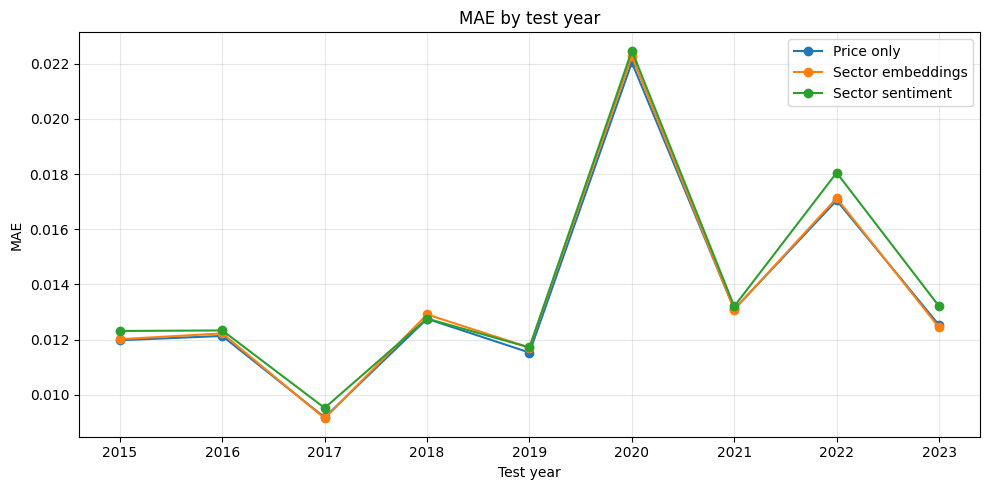

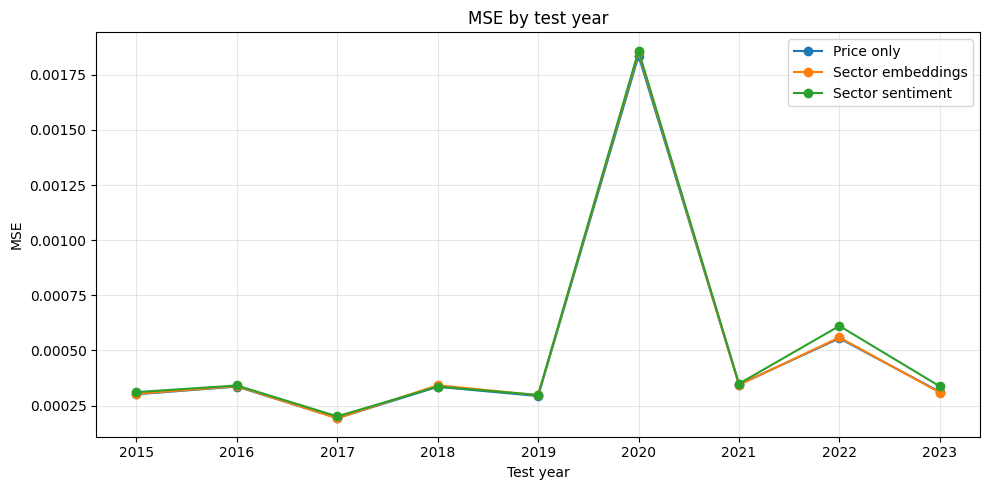

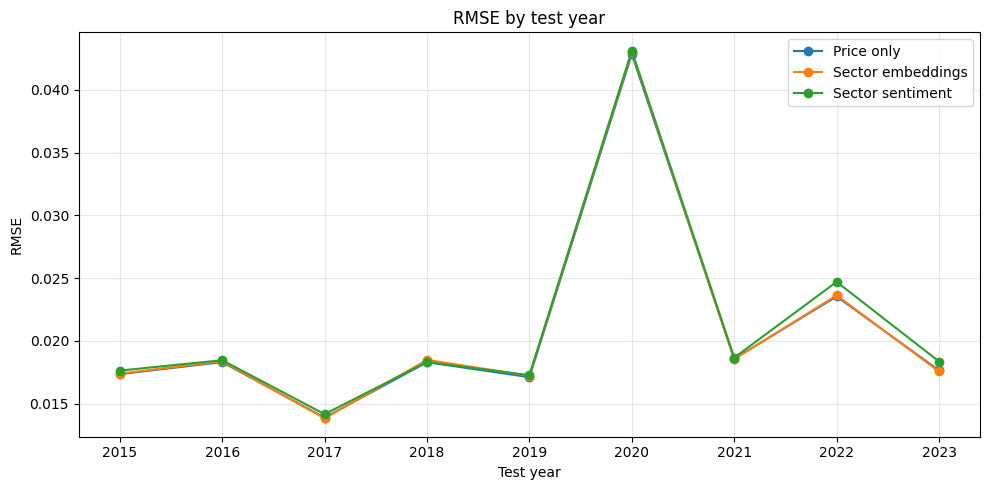

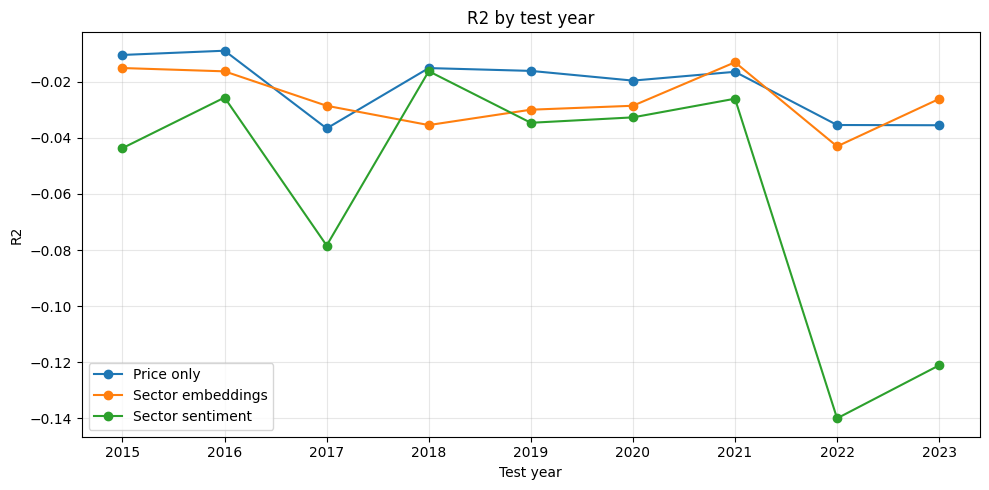

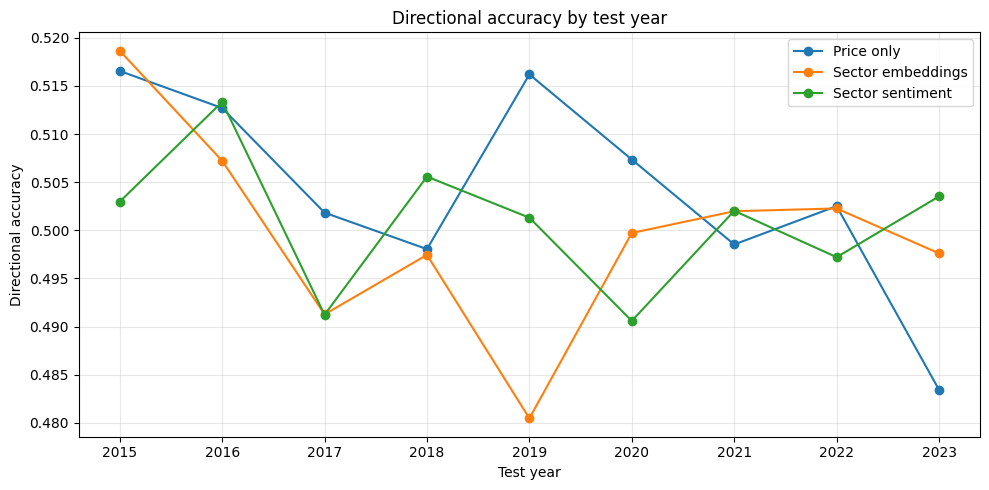

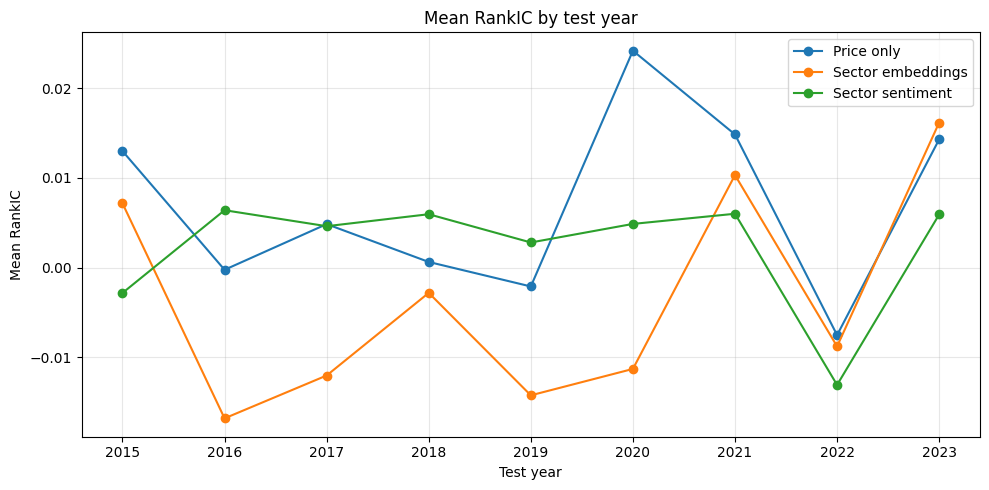

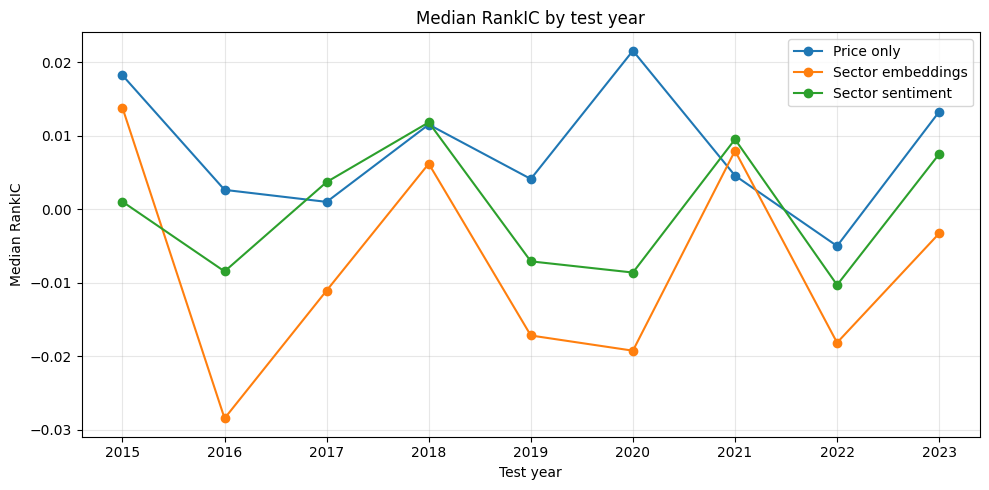

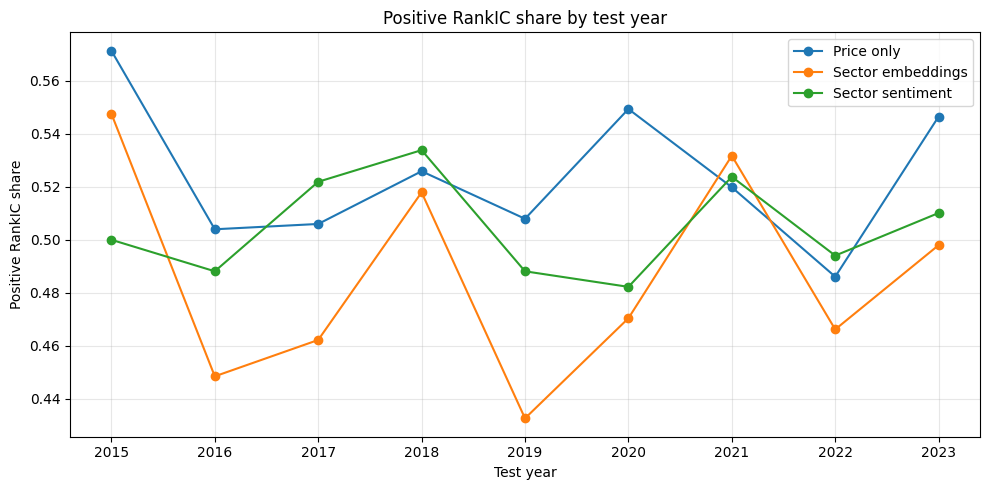

In [ ]:
metrics_to_plot = [
    'mae',
    'mse',
    'rmse',
    'r2',
    'directional_accuracy',
    'rank_ic_mean',
    'rank_ic_median',
    'rank_ic_positive_share'
]

metric_title_map = {
    'mae': 'MAE',
    'mse': 'MSE',
    'rmse': 'RMSE',
    'r2': 'R2',
    'directional_accuracy': 'Directional accuracy',
    'rank_ic_mean': 'Mean RankIC',
    'rank_ic_median': 'Median RankIC',
    'rank_ic_positive_share': 'Positive RankIC share'
}

for metric in metrics_to_plot:
    plt.figure(figsize=(10, 5))

    for experiment_short, group_df in rolling_results_df.groupby('experiment_short'):
        group_df = group_df.sort_values('test_start_year')
        plt.plot(
            group_df['test_start_year'],
            group_df[metric],
            marker='o',
            label=experiment_short
        )

    plt.title(f'{metric_title_map[metric]} by test year')
    plt.xlabel('Test year')
    plt.ylabel(metric_title_map[metric])
    plt.xticks(sorted(rolling_results_df['test_start_year'].unique()))
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Статзначимости после cross-stock

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import norm, spearmanr
from statsmodels.stats.multitest import multipletests


BASELINE_MODEL_NAME = 'timexer_base_price_only_cross_stock'

COMPARISON_RESULTS = {
    'timexer_base_sector_only_mean_pca32': timexer_base_sector_only_mean_pca32_result,
    'timexer_base_sector_sentiment_only_cross_stock': timexer_base_sector_sentiment_only_cross_stock_result
}

BASELINE_RESULT = timexer_base_price_only_cross_stock_result

TEST_SPLIT = 'test'
ALPHA = 0.05
MIN_RANK_IC_ASSETS = 5


def find_first_existing_column(df, candidates, column_role):
    for column in candidates:
        if column in df.columns:
            return column

    raise ValueError(
        f'Не найден столбец для {column_role}. '
        f'Проверенные варианты: {candidates}. '
        f'Доступные столбцы: {list(df.columns)}'
    )


def get_predictions_df_from_result(result, model_name):
    if isinstance(result, dict):
        if 'predictions' in result:
            predictions_df = result['predictions'].copy()
        elif 'prediction_outputs' in result and 'predictions' in result['prediction_outputs']:
            predictions_df = result['prediction_outputs']['predictions'].copy()
        elif 'predictions_df' in result:
            predictions_df = result['predictions_df'].copy()
        else:
            raise KeyError(
                f'В result для {model_name} не найден predictions. '
                f'Доступные ключи: {list(result.keys())}'
            )
    else:
        raise TypeError(f'result для {model_name} должен быть dict.')

    predictions_df['model_name'] = model_name

    return predictions_df


def standardize_predictions_df(predictions_df, model_name, split_name='test'):
    df = predictions_df.copy()

    split_col = find_first_existing_column(
        df,
        ['split', 'dataset_split', 'data_split'],
        'split'
    )

    date_col = find_first_existing_column(
        df,
        ['target_date', 'date', 'trading_date', 'ds'],
        'target_date/date'
    )

    ticker_col = find_first_existing_column(
        df,
        ['ticker', 'symbol', 'unique_id', 'asset', 'Stock_symbol'],
        'ticker'
    )

    y_true_col = find_first_existing_column(
        df,
        ['y_true', 'target', 'actual', 'true', 'target_value'],
        'y_true'
    )

    y_pred_col = find_first_existing_column(
        df,
        ['y_pred', 'prediction', 'pred', 'forecast', 'predicted'],
        'y_pred'
    )

    if 'horizon' in df.columns:
        df = df[df['horizon'].isin([1, '1', 'h1', 'H1'])].copy()

    df = df[df[split_col] == split_name].copy()

    df = df.rename(
        columns={
            split_col: 'split',
            date_col: 'target_date',
            ticker_col: 'ticker',
            y_true_col: 'y_true',
            y_pred_col: 'y_pred'
        }
    )

    df['target_date'] = pd.to_datetime(df['target_date'])
    df['ticker'] = df['ticker'].astype(str)
    df['y_true'] = pd.to_numeric(df['y_true'], errors='coerce')
    df['y_pred'] = pd.to_numeric(df['y_pred'], errors='coerce')
    df['model_name'] = model_name

    df = df[
        ['model_name', 'split', 'target_date', 'ticker', 'y_true', 'y_pred']
    ].dropna(subset=['target_date', 'ticker', 'y_true', 'y_pred']).copy()

    return df


def align_model_with_baseline(baseline_pred_df, model_pred_df):
    base = baseline_pred_df.rename(
        columns={
            'y_pred': 'y_pred_base',
            'y_true': 'y_true_base'
        }
    )

    model = model_pred_df.rename(
        columns={
            'y_pred': 'y_pred_model',
            'y_true': 'y_true_model'
        }
    )

    merged = base.merge(
        model,
        on=['split', 'target_date', 'ticker'],
        how='inner',
        suffixes=('_base_meta', '_model_meta')
    )

    if merged.empty:
        raise ValueError('После merge baseline и model не осталось общих наблюдений.')

    y_true_diff_max = np.nanmax(
        np.abs(merged['y_true_base'].to_numpy() - merged['y_true_model'].to_numpy())
    )

    if y_true_diff_max > 1e-10:
        print(
            'Warning: y_true в baseline и model немного различаются. '
            f'max_abs_diff={y_true_diff_max}'
        )

    merged['y_true'] = merged['y_true_base']

    merged = merged[
        [
            'split',
            'target_date',
            'ticker',
            'y_true',
            'y_pred_base',
            'y_pred_model'
        ]
    ].copy()

    return merged


def newey_west_long_run_variance(x, max_lag=None):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    n = len(x)

    if n < 2:
        return np.nan, 0

    x_centered = x - np.mean(x)

    if max_lag is None:
        max_lag = int(np.floor(4 * (n / 100) ** (2 / 9)))

    max_lag = max(0, min(int(max_lag), n - 1))

    gamma_0 = np.mean(x_centered * x_centered)
    long_run_var = gamma_0

    for lag in range(1, max_lag + 1):
        weight = 1 - lag / (max_lag + 1)
        gamma_lag = np.mean(x_centered[lag:] * x_centered[:-lag])
        long_run_var += 2 * weight * gamma_lag

    return long_run_var, max_lag


def dm_hac_mean_test(
    differential_series,
    alternative='greater',
    max_lag=None
):
    x = pd.Series(differential_series).replace([np.inf, -np.inf], np.nan).dropna().to_numpy()
    n = len(x)

    if n < 3:
        return {
            'n_periods': n,
            'mean_diff': np.nan,
            'hac_lrv': np.nan,
            'hac_lag': np.nan,
            'dm_stat': np.nan,
            'p_value': np.nan
        }

    mean_diff = float(np.mean(x))
    hac_lrv, hac_lag = newey_west_long_run_variance(x, max_lag=max_lag)

    if not np.isfinite(hac_lrv) or hac_lrv <= 0:
        return {
            'n_periods': n,
            'mean_diff': mean_diff,
            'hac_lrv': hac_lrv,
            'hac_lag': hac_lag,
            'dm_stat': np.nan,
            'p_value': np.nan
        }

    dm_stat = mean_diff / np.sqrt(hac_lrv / n)

    if alternative == 'greater':
        p_value = 1 - norm.cdf(dm_stat)
    elif alternative == 'less':
        p_value = norm.cdf(dm_stat)
    elif alternative == 'two-sided':
        p_value = 2 * (1 - norm.cdf(abs(dm_stat)))
    else:
        raise ValueError("alternative должен быть 'greater', 'less' или 'two-sided'.")

    return {
        'n_periods': n,
        'mean_diff': mean_diff,
        'hac_lrv': hac_lrv,
        'hac_lag': hac_lag,
        'dm_stat': float(dm_stat),
        'p_value': float(p_value)
    }


def compute_basic_metrics_from_aligned(aligned_df):
    y_true = aligned_df['y_true'].to_numpy()
    y_pred_base = aligned_df['y_pred_base'].to_numpy()
    y_pred_model = aligned_df['y_pred_model'].to_numpy()

    abs_base = np.abs(y_true - y_pred_base)
    abs_model = np.abs(y_true - y_pred_model)

    se_base = (y_true - y_pred_base) ** 2
    se_model = (y_true - y_pred_model) ** 2

    mae_base = float(np.mean(abs_base))
    mae_model = float(np.mean(abs_model))

    rmse_base = float(np.sqrt(np.mean(se_base)))
    rmse_model = float(np.sqrt(np.mean(se_model)))

    sst = float(np.sum((y_true - np.mean(y_true)) ** 2))

    if sst > 0:
        r2_base = float(1 - np.sum(se_base) / sst)
        r2_model = float(1 - np.sum(se_model) / sst)
    else:
        r2_base = np.nan
        r2_model = np.nan

    return {
        'mae_base': mae_base,
        'mae_model': mae_model,
        'mae_improvement': mae_base - mae_model,
        'rmse_base': rmse_base,
        'rmse_model': rmse_model,
        'rmse_improvement': rmse_base - rmse_model,
        'r2_base': r2_base,
        'r2_model': r2_model,
        'r2_improvement': r2_model - r2_base
    }


def build_daily_loss_differentials(aligned_df):
    df = aligned_df.copy()

    df['abs_error_base'] = np.abs(df['y_true'] - df['y_pred_base'])
    df['abs_error_model'] = np.abs(df['y_true'] - df['y_pred_model'])

    df['squared_error_base'] = (df['y_true'] - df['y_pred_base']) ** 2
    df['squared_error_model'] = (df['y_true'] - df['y_pred_model']) ** 2

    df['mae_loss_diff'] = df['abs_error_base'] - df['abs_error_model']
    df['squared_error_loss_diff'] = df['squared_error_base'] - df['squared_error_model']

    daily = (
        df
        .groupby('target_date', as_index=False)
        .agg(
            mae_loss_diff=('mae_loss_diff', 'mean'),
            squared_error_loss_diff=('squared_error_loss_diff', 'mean'),
            n_assets=('ticker', 'nunique')
        )
        .sort_values('target_date')
        .reset_index(drop=True)
    )

    return daily


def compute_rank_ic_by_date_from_predictions(pred_df, min_assets=5):
    rows = []

    for target_date, group in pred_df.groupby('target_date'):
        group = group.dropna(subset=['y_true', 'y_pred']).copy()
        n_assets = group['ticker'].nunique()

        if n_assets < min_assets:
            continue

        if group['y_true'].nunique() < 2 or group['y_pred'].nunique() < 2:
            rank_ic = np.nan
        else:
            rank_ic = spearmanr(group['y_true'], group['y_pred']).correlation

        rows.append(
            {
                'target_date': target_date,
                'rank_ic': rank_ic,
                'n_assets': n_assets
            }
        )

    rank_ic_df = pd.DataFrame(rows)

    if not rank_ic_df.empty:
        rank_ic_df = rank_ic_df.sort_values('target_date').reset_index(drop=True)

    return rank_ic_df


def compare_rank_ic_hac(
    baseline_pred_df,
    model_pred_df,
    model_name,
    baseline_model_name,
    min_assets=5,
    max_lag=None
):
    base_rank_ic = compute_rank_ic_by_date_from_predictions(
        baseline_pred_df,
        min_assets=min_assets
    ).rename(columns={'rank_ic': 'rank_ic_base', 'n_assets': 'n_assets_base'})

    model_rank_ic = compute_rank_ic_by_date_from_predictions(
        model_pred_df,
        min_assets=min_assets
    ).rename(columns={'rank_ic': 'rank_ic_model', 'n_assets': 'n_assets_model'})

    rank_ic_aligned = base_rank_ic.merge(
        model_rank_ic,
        on='target_date',
        how='inner'
    )

    rank_ic_aligned = rank_ic_aligned.dropna(
        subset=['rank_ic_base', 'rank_ic_model']
    ).copy()

    rank_ic_aligned['rank_ic_diff'] = (
        rank_ic_aligned['rank_ic_model'] - rank_ic_aligned['rank_ic_base']
    )

    test_result = dm_hac_mean_test(
        rank_ic_aligned['rank_ic_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    return {
        'model_name': model_name,
        'baseline_model_name': baseline_model_name,
        'metric': 'RankIC',
        'baseline_value': float(rank_ic_aligned['rank_ic_base'].mean()) if len(rank_ic_aligned) else np.nan,
        'model_value': float(rank_ic_aligned['rank_ic_model'].mean()) if len(rank_ic_aligned) else np.nan,
        'improvement': float(rank_ic_aligned['rank_ic_diff'].mean()) if len(rank_ic_aligned) else np.nan,
        'n_obs': int(len(rank_ic_aligned)),
        'n_periods': test_result['n_periods'],
        'mean_loss_diff': test_result['mean_diff'],
        'hac_lag': test_result['hac_lag'],
        'dm_hac_stat': test_result['dm_stat'],
        'p_value_raw': test_result['p_value']
    }


def compare_forecast_metrics_hac(
    aligned_df,
    model_name,
    baseline_model_name,
    max_lag=None
):
    metrics = compute_basic_metrics_from_aligned(aligned_df)
    daily_loss_diff = build_daily_loss_differentials(aligned_df)

    mae_test = dm_hac_mean_test(
        daily_loss_diff['mae_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rmse_test = dm_hac_mean_test(
        daily_loss_diff['squared_error_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    r2_test = dm_hac_mean_test(
        daily_loss_diff['squared_error_loss_diff'],
        alternative='greater',
        max_lag=max_lag
    )

    rows = [
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'MAE',
            'baseline_value': metrics['mae_base'],
            'model_value': metrics['mae_model'],
            'improvement': metrics['mae_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': mae_test['n_periods'],
            'mean_loss_diff': mae_test['mean_diff'],
            'hac_lag': mae_test['hac_lag'],
            'dm_hac_stat': mae_test['dm_stat'],
            'p_value_raw': mae_test['p_value']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'RMSE',
            'baseline_value': metrics['rmse_base'],
            'model_value': metrics['rmse_model'],
            'improvement': metrics['rmse_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': rmse_test['n_periods'],
            'mean_loss_diff': rmse_test['mean_diff'],
            'hac_lag': rmse_test['hac_lag'],
            'dm_hac_stat': rmse_test['dm_stat'],
            'p_value_raw': rmse_test['p_value']
        },
        {
            'model_name': model_name,
            'baseline_model_name': baseline_model_name,
            'metric': 'R2',
            'baseline_value': metrics['r2_base'],
            'model_value': metrics['r2_model'],
            'improvement': metrics['r2_improvement'],
            'n_obs': int(len(aligned_df)),
            'n_periods': r2_test['n_periods'],
            'mean_loss_diff': r2_test['mean_diff'],
            'hac_lag': r2_test['hac_lag'],
            'dm_hac_stat': r2_test['dm_stat'],
            'p_value_raw': r2_test['p_value']
        }
    ]

    return rows


baseline_predictions_raw = get_predictions_df_from_result(
    BASELINE_RESULT,
    BASELINE_MODEL_NAME
)

baseline_predictions = standardize_predictions_df(
    baseline_predictions_raw,
    BASELINE_MODEL_NAME,
    split_name=TEST_SPLIT
)

all_test_rows = []

for model_name, model_result in COMPARISON_RESULTS.items():
    model_predictions_raw = get_predictions_df_from_result(
        model_result,
        model_name
    )

    model_predictions = standardize_predictions_df(
        model_predictions_raw,
        model_name,
        split_name=TEST_SPLIT
    )

    aligned_df = align_model_with_baseline(
        baseline_predictions,
        model_predictions
    )

    metric_rows = compare_forecast_metrics_hac(
        aligned_df=aligned_df,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        max_lag=None
    )

    rank_ic_row = compare_rank_ic_hac(
        baseline_pred_df=baseline_predictions,
        model_pred_df=model_predictions,
        model_name=model_name,
        baseline_model_name=BASELINE_MODEL_NAME,
        min_assets=MIN_RANK_IC_ASSETS,
        max_lag=None
    )

    all_test_rows.extend(metric_rows)
    all_test_rows.append(rank_ic_row)


stat_tests_df = pd.DataFrame(all_test_rows)

valid_p_mask = stat_tests_df['p_value_raw'].notna()

stat_tests_df['p_value_holm_all'] = np.nan
stat_tests_df.loc[valid_p_mask, 'p_value_holm_all'] = multipletests(
    stat_tests_df.loc[valid_p_mask, 'p_value_raw'].to_numpy(),
    alpha=ALPHA,
    method='holm'
)[1]

stat_tests_df['reject_holm_all_5pct'] = (
    stat_tests_df['p_value_holm_all'] <= ALPHA
)

stat_tests_df['p_value_holm_by_metric'] = np.nan
stat_tests_df['reject_holm_by_metric_5pct'] = False

for metric_name, metric_group in stat_tests_df.groupby('metric'):
    metric_mask = stat_tests_df['metric'].eq(metric_name) & stat_tests_df['p_value_raw'].notna()

    if metric_mask.sum() == 0:
        continue

    corrected_p_values = multipletests(
        stat_tests_df.loc[metric_mask, 'p_value_raw'].to_numpy(),
        alpha=ALPHA,
        method='holm'
    )[1]

    stat_tests_df.loc[metric_mask, 'p_value_holm_by_metric'] = corrected_p_values
    stat_tests_df.loc[metric_mask, 'reject_holm_by_metric_5pct'] = corrected_p_values <= ALPHA


stat_tests_df = stat_tests_df[
    [
        'model_name',
        'baseline_model_name',
        'metric',
        'baseline_value',
        'model_value',
        'improvement',
        'n_obs',
        'n_periods',
        'mean_loss_diff',
        'hac_lag',
        'dm_hac_stat',
        'p_value_raw',
        'p_value_holm_by_metric',
        'reject_holm_by_metric_5pct',
        'p_value_holm_all',
        'reject_holm_all_5pct'
    ]
].sort_values(['metric', 'model_name']).reset_index(drop=True)

stat_tests_df

,model_name,baseline_model_name,metric,baseline_value,model_value,improvement,n_obs,n_periods,mean_loss_diff,hac_lag,dm_hac_stat,p_value_raw,p_value_holm_by_metric,reject_holm_by_metric_5pct,p_value_holm_all,reject_holm_all_5pct
0,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,MAE,0.013567,0.013522,0.000045,37700,377,4.500744e-05,5,0.957960,0.169041,0.338083,False,0.845207,False
1,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,MAE,0.013567,0.013589,-0.000022,37700,377,-2.184948e-05,5,-0.779883,0.782270,0.782270,False,1.000000,False
2,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,R2,-0.016727,-0.009656,0.007071,37700,377,2.563562e-06,5,1.190005,0.117022,0.234044,False,0.819155,False
3,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,R2,-0.016727,-0.017611,-0.000884,37700,377,-3.204619e-07,5,-0.282557,0.611242,0.611242,False,1.000000,False
4,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,RMSE,0.019200,0.019133,0.000067,37700,377,2.563562e-06,5,1.190005,0.117022,0.234044,False,0.819155,False
5,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,RMSE,0.019200,0.019208,-0.000008,37700,377,-3.204619e-07,5,-0.282557,0.611242,0.611242,False,1.000000,False
6,timexer_base_sector_only_mean_pca32,timexer_base_price_only_cross_stock,RankIC,0.006505,0.007831,0.001326,377,377,1.326312e-03,5,0.138751,0.444824,0.444824,False,1.000000,False
7,timexer_base_sector_sentiment_only_cross_stock,timexer_base_price_only_cross_stock,RankIC,0.006505,0.017963,0.011458,377,377,1.145815e-02,5,2.163747,0.015242,0.030484,True,0.121935,False


In [ ]:
timexer_base_sector_sentiment_only_cross_stock_result